<a href="https://colab.research.google.com/github/cristianojoseblanco/KingPawnKingEndGameMarkovChain/blob/main/ChessEndgameKPK.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Code

In [5]:
!pip install chess

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 156.5/156.5 kB 3.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for chess: filename=chess-1.11.1-py3-none-any.whl size=148497 sha256=29b1f45cdfee162820e37b714393d3990ebaebe6a371620d18082c1fc10b3983
  Stored in directory: /root/.cache/pip/wheels/2e/2d/23/1bfc95db984ed3ecbf6764167dc7526d0ab521cf9a9852544e
Successfully built chess


In [6]:
!pip install zstandard

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.4/5.4 MB 29.7 MB/s eta 0:00:00


In [7]:
!apt-get install stockfish

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
Suggested packages:
  polyglot xboard | scid
The following NEW packages will be installed:
  stockfish
0 upgraded, 1 newly installed, 0 to remove and 49 not upgraded.
Need to get 24.8 MB of archives.
After this operation, 47.4 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 stockfish amd64 14.1-1 [24.8 MB]
Fetched 24.8 MB in 1s (17.5 MB/s)
Selecting previously unselected package stockfish.
(Reading database ... 123634 files and directories currently installed.)
Preparing to unpack .../stockfish_14.1-1_amd64.deb ...
Unpacking stockfish (14.1-1) ...
Setting up stockfish (14.1-1) ...
Processing triggers for man-db (2.10.2-1) ...


Main Code

In [11]:
import chess
import chess.pgn
import chess.engine
import numpy as np
from collections import Counter
from tqdm import tqdm
import time
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [9]:
stockfish_path = "/usr/games/stockfish"

In [ ]:
# Define states
states = ["2", "3", "4", "5", "6", "7", "Q", "C"]
num_states = len(states)

def state_to_index(state):
    return states.index(str(state))

def index_to_state(index):
    return states[index]

def get_state(board):
    for square, piece in board.piece_map().items():
        if piece.piece_type == chess.PAWN:
            if chess.square_rank(square) == 7:  # Promotion rank
                return "Q"  # Pawn promoted
            return str(chess.square_rank(square) + 1)  # Pawn's current rank
    return "C"  # Pawn captured

def is_king_and_pawn_vs_king(board):
    pieces = board.piece_map()
    pawn_count = sum(1 for piece in pieces.values() if piece.piece_type == chess.PAWN)
    king_count = sum(1 for piece in pieces.values() if piece.piece_type == chess.KING)
    return pawn_count == 1 and king_count == 2

def generate_kpk_positions():
    positions = []
    for pawn_rank in range(2, 8):  # Pawn ranks 2 to 7
        for white_king in range(64):
            for black_king in range(64):
                if white_king != black_king and chess.square_distance(white_king, black_king) > 1:
                    board = chess.Board()
                    board.clear_board()
                    board.set_piece_at(chess.square(1, pawn_rank - 1), chess.Piece(chess.PAWN, chess.WHITE))
                    board.set_piece_at(white_king, chess.Piece(chess.KING, chess.WHITE))
                    board.set_piece_at(black_king, chess.Piece(chess.KING, chess.BLACK))
                    if is_king_and_pawn_vs_king(board):
                        positions.append(board)
    return positions

def calculate_transition_probabilities_from_stockfish(engine_path):
    positions = generate_kpk_positions()
    transitions = Counter()
    total_transitions = Counter()

    # Restart the engine if it crashes
    def start_engine():
        return chess.engine.SimpleEngine.popen_uci(engine_path)

    engine = start_engine()

    for board in tqdm(positions, desc="Processing KPK positions"):
        current_state = get_state(board)

        print(f"\nProcessing KPK position (State: {current_state}):")
        print(board)

        try:
            # Get Stockfish's best move
            result = engine.play(board, chess.engine.Limit(time=0.2))
            move = result.move

            if move:
                print(f"Best move: {move}")
                origin_square = move.from_square
                target_square = move.to_square
                print(f"Origin square: {origin_square}")
                print(f"Target square: {target_square}")

                origin_piece = board.piece_at(origin_square)
                target_piece = board.piece_at(target_square)
                print(f"Origin piece: {origin_piece}")
                print(f"Target piece: {target_piece}")

                if target_piece and target_piece.piece_type == chess.PAWN:
                    next_state = "C"
                elif origin_piece and origin_piece.piece_type != chess.PAWN:
                    next_state = current_state
                else:
                    if chess.square_rank(target_square) == 7:
                        next_state = "Q"
                    else:
                        next_state = str(chess.square_rank(target_square) + 1)

                print(f"Next state: {next_state}")

                transitions[(current_state, next_state)] += 1
                total_transitions[current_state] += 1

        except chess.engine.EngineTerminatedError:
            print("Engine terminated unexpectedly. Restarting engine...")
            engine = start_engine()
            continue
        except Exception as e:
            print(f"Unexpected error: {e}")
            continue

        time.sleep(0.05)

    # Add logic for KQK positions with queen on B8
    print("\nProcessing KQK positions...")
    for white_king in range(64):
        for black_king in range(64):
            if white_king != black_king and chess.square_distance(white_king, black_king) > 1:
                board = chess.Board()
                board.clear_board()
                board.set_piece_at(chess.B8, chess.Piece(chess.QUEEN, chess.WHITE))
                board.set_piece_at(white_king, chess.Piece(chess.KING, chess.WHITE))
                board.set_piece_at(black_king, chess.Piece(chess.KING, chess.BLACK))

                print(f"\nProcessing KQK position:")
                print(board)

                if chess.square_distance(chess.B8, black_king) == 1 and chess.square_distance(chess.B8, white_king) > 1:
                    print("Queen can be captured: transitioning from Q to C")
                    transitions[("Q", "C")] += 1
                else:
                    print("Queen stays in Q")
                    transitions[("Q", "Q")] += 1

                total_transitions["Q"] += 1

    engine.quit()

    # Force state C to transition to itself
    transitions[("C", "C")] += 1
    total_transitions["C"] = 1

    # Calculate transition probabilities
    probabilities = {
        (current_state, next_state): count / total_transitions[current_state]
        for (current_state, next_state), count in transitions.items()
    }

    # Create a transition matrix
    T = np.zeros((num_states, num_states))
    for (current_state, next_state), prob in probabilities.items():
        i = state_to_index(current_state)
        j = state_to_index(next_state)
        T[i, j] = prob

    return T

# Main function
def main():
    engine_path = "/usr/games/stockfish"

    try:
        print("Calculating transition probabilities using Stockfish...")
        transition_matrix = calculate_transition_probabilities_from_stockfish(engine_path)

        print("\nTransition Matrix:")
        print(transition_matrix)

        print("\nVerifying row sums (should be close to 1):")
        for i, row in enumerate(transition_matrix):
            row_sum = row.sum()
            if not np.isclose(row_sum, 1.0):
                print(f"Warning: State {index_to_state(i)} row sum is {row_sum:.4f} (not close to 1).")

        np.save("kpk_kqk_transition_matrix.npy", transition_matrix)
        print("\nTransition matrix saved as 'kpk_kqk_transition_matrix.npy'.")

    except FileNotFoundError as e:
        print(f"Stockfish engine not found: {e}")
    except Exception as e:
        print(f"Unexpected error: {e}")

if __name__ == "__main__":
    main()

Calculating transition probabilities using Stockfish...


Processing KPK positions:   0%|          | 0/21012 [00:00<?, ?it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . k . . . . .


Processing KPK positions:   0%|          | 1/21012 [00:00<1:30:49,  3.86it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . k . . . .


Processing KPK positions:   0%|          | 2/21012 [00:00<1:29:46,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . k . . .


Processing KPK positions:   0%|          | 3/21012 [00:00<1:29:25,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . k . .


Processing KPK positions:   0%|          | 4/21012 [00:01<1:29:16,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . k .


Processing KPK positions:   0%|          | 5/21012 [00:01<1:29:09,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . k


Processing KPK positions:   0%|          | 6/21012 [00:01<1:29:53,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
K . . . . . . .


Processing KPK positions:   0%|          | 7/21012 [00:01<1:29:46,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
K . . . . . . .


Processing KPK positions:   0%|          | 8/21012 [00:02<1:30:00,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
K . . . . . . .


Processing KPK positions:   0%|          | 9/21012 [00:02<1:30:04,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
K . . . . . . .


Processing KPK positions:   0%|          | 10/21012 [00:02<1:30:16,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
K . . . . . . .


Processing KPK positions:   0%|          | 11/21012 [00:02<1:30:24,  3.87it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
K . . . . . . .


Processing KPK positions:   0%|          | 12/21012 [00:03<1:30:17,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
K . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   0%|          | 13/21012 [00:03<1:19:52,  4.38it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
K . . . . . . .


Processing KPK positions:   0%|          | 14/21012 [00:03<1:23:24,  4.20it/s]

Best move: a1b1
Origin square: 0
Target square: 1
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
K . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   0%|          | 15/21012 [00:03<1:17:12,  4.53it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
K . . . . . . .


Processing KPK positions:   0%|          | 16/21012 [00:03<1:22:30,  4.24it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
K . . . . . . .


Processing KPK positions:   0%|          | 17/21012 [00:04<1:24:38,  4.13it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
K . . . . . . .


Processing KPK positions:   0%|          | 18/21012 [00:04<1:26:16,  4.06it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
K . . . . . . .


Processing KPK positions:   0%|          | 19/21012 [00:04<1:27:27,  4.00it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
K . . . . . . .


Processing KPK positions:   0%|          | 20/21012 [00:04<1:28:04,  3.97it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .


Processing KPK positions:   0%|          | 21/21012 [00:05<1:28:45,  3.94it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .


Processing KPK positions:   0%|          | 22/21012 [00:05<1:29:08,  3.92it/s]

Best move: a1b1
Origin square: 0
Target square: 1
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .


Processing KPK positions:   0%|          | 23/21012 [00:05<1:29:27,  3.91it/s]

Best move: a1b1
Origin square: 0
Target square: 1
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .


Processing KPK positions:   0%|          | 24/21012 [00:06<1:29:47,  3.90it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .


Processing KPK positions:   0%|          | 25/21012 [00:06<1:29:50,  3.89it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
K . . . . . . .


Processing KPK positions:   0%|          | 26/21012 [00:06<1:29:57,  3.89it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
K . . . . . . .


Processing KPK positions:   0%|          | 27/21012 [00:06<1:29:49,  3.89it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
K . . . . . . .


Processing KPK positions:   0%|          | 28/21012 [00:07<1:29:55,  3.89it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .


Processing KPK positions:   0%|          | 29/21012 [00:07<1:29:41,  3.90it/s]

Best move: a1b1
Origin square: 0
Target square: 1
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .


Processing KPK positions:   0%|          | 30/21012 [00:07<1:29:38,  3.90it/s]

Best move: a1b1
Origin square: 0
Target square: 1
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .


Processing KPK positions:   0%|          | 31/21012 [00:07<1:29:36,  3.90it/s]

Best move: a1b1
Origin square: 0
Target square: 1
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .


Processing KPK positions:   0%|          | 32/21012 [00:08<1:29:57,  3.89it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .


Processing KPK positions:   0%|          | 33/21012 [00:08<1:29:45,  3.90it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .


Processing KPK positions:   0%|          | 34/21012 [00:08<1:29:38,  3.90it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .


Processing KPK positions:   0%|          | 35/21012 [00:08<1:29:40,  3.90it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .


Processing KPK positions:   0%|          | 36/21012 [00:09<1:29:28,  3.91it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .


Processing KPK positions:   0%|          | 37/21012 [00:09<1:29:23,  3.91it/s]

Best move: a1b1
Origin square: 0
Target square: 1
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .


Processing KPK positions:   0%|          | 38/21012 [00:09<1:29:15,  3.92it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .


Processing KPK positions:   0%|          | 39/21012 [00:09<1:29:16,  3.92it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .


Processing KPK positions:   0%|          | 40/21012 [00:10<1:29:13,  3.92it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .


Processing KPK positions:   0%|          | 41/21012 [00:10<1:29:56,  3.89it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .


Processing KPK positions:   0%|          | 42/21012 [00:10<1:30:00,  3.88it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .


Processing KPK positions:   0%|          | 43/21012 [00:10<1:29:58,  3.88it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .


Processing KPK positions:   0%|          | 44/21012 [00:11<1:29:53,  3.89it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .


Processing KPK positions:   0%|          | 45/21012 [00:11<1:29:51,  3.89it/s]

Best move: a1b1
Origin square: 0
Target square: 1
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .


Processing KPK positions:   0%|          | 46/21012 [00:11<1:29:36,  3.90it/s]

Best move: a1b1
Origin square: 0
Target square: 1
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .


Processing KPK positions:   0%|          | 47/21012 [00:11<1:29:40,  3.90it/s]

Best move: a1b1
Origin square: 0
Target square: 1
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .


Processing KPK positions:   0%|          | 48/21012 [00:12<1:29:20,  3.91it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .


Processing KPK positions:   0%|          | 49/21012 [00:12<1:29:06,  3.92it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .


Processing KPK positions:   0%|          | 50/21012 [00:12<1:28:58,  3.93it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .


Processing KPK positions:   0%|          | 51/21012 [00:12<1:29:26,  3.91it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .


Processing KPK positions:   0%|          | 52/21012 [00:13<1:29:13,  3.92it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .


Processing KPK positions:   0%|          | 53/21012 [00:13<1:29:02,  3.92it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .


Processing KPK positions:   0%|          | 54/21012 [00:13<1:28:56,  3.93it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .


Processing KPK positions:   0%|          | 55/21012 [00:13<1:28:56,  3.93it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .


Processing KPK positions:   0%|          | 56/21012 [00:14<1:29:03,  3.92it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .


Processing KPK positions:   0%|          | 57/21012 [00:14<1:28:57,  3.93it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .


Processing KPK positions:   0%|          | 58/21012 [00:14<1:28:49,  3.93it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .


Processing KPK positions:   0%|          | 59/21012 [00:14<1:28:48,  3.93it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .


Processing KPK positions:   0%|          | 60/21012 [00:15<1:28:45,  3.93it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . k . . . .


Processing KPK positions:   0%|          | 61/21012 [00:15<1:28:51,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . k . . .


Processing KPK positions:   0%|          | 62/21012 [00:15<1:28:47,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . k . .


Processing KPK positions:   0%|          | 63/21012 [00:15<1:28:58,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . k .


Processing KPK positions:   0%|          | 64/21012 [00:16<1:28:53,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . k


Processing KPK positions:   0%|          | 65/21012 [00:16<1:28:50,  3.93it/s]

Best move: b1a2
Origin square: 1
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. K . . . . . .


Processing KPK positions:   0%|          | 66/21012 [00:16<1:29:01,  3.92it/s]

Best move: b1a2
Origin square: 1
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. K . . . . . .


Processing KPK positions:   0%|          | 67/21012 [00:17<1:29:08,  3.92it/s]

Best move: b1c2
Origin square: 1
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. K . . . . . .


Processing KPK positions:   0%|          | 68/21012 [00:17<1:29:09,  3.92it/s]

Best move: b1c2
Origin square: 1
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. K . . . . . .


Processing KPK positions:   0%|          | 69/21012 [00:17<1:29:10,  3.91it/s]

Best move: b1c2
Origin square: 1
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. K . . . . . .


Processing KPK positions:   0%|          | 70/21012 [00:17<1:29:15,  3.91it/s]

Best move: b1c2
Origin square: 1
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. K . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   0%|          | 71/21012 [00:17<1:22:22,  4.24it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. K . . . . . .


Processing KPK positions:   0%|          | 72/21012 [00:18<1:25:11,  4.10it/s]

Best move: b1c1
Origin square: 1
Target square: 2
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. K . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   0%|          | 73/21012 [00:18<1:16:42,  4.55it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. K . . . . . .


Processing KPK positions:   0%|          | 74/21012 [00:18<1:21:00,  4.31it/s]

Best move: b1a2
Origin square: 1
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. K . . . . . .


Processing KPK positions:   0%|          | 75/21012 [00:18<1:23:26,  4.18it/s]

Best move: b1a2
Origin square: 1
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. K . . . . . .


Processing KPK positions:   0%|          | 76/21012 [00:19<1:25:09,  4.10it/s]

Best move: b1a2
Origin square: 1
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. K . . . . . .


Processing KPK positions:   0%|          | 77/21012 [00:19<1:26:43,  4.02it/s]

Best move: b1a2
Origin square: 1
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. K . . . . . .


Processing KPK positions:   0%|          | 78/21012 [00:19<1:27:27,  3.99it/s]

Best move: b1c2
Origin square: 1
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .


Processing KPK positions:   0%|          | 79/21012 [00:19<1:28:16,  3.95it/s]

Best move: b1c2
Origin square: 1
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .


Processing KPK positions:   0%|          | 80/21012 [00:20<1:28:40,  3.93it/s]

Best move: b1c2
Origin square: 1
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .


Processing KPK positions:   0%|          | 81/21012 [00:20<1:28:36,  3.94it/s]

Best move: b1c2
Origin square: 1
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .


Processing KPK positions:   0%|          | 82/21012 [00:20<1:28:55,  3.92it/s]

Best move: b1a2
Origin square: 1
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .


Processing KPK positions:   0%|          | 83/21012 [00:20<1:28:52,  3.92it/s]

Best move: b1c2
Origin square: 1
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. K . . . . . .


Processing KPK positions:   0%|          | 84/21012 [00:21<1:28:50,  3.93it/s]

Best move: b1c2
Origin square: 1
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. K . . . . . .


Processing KPK positions:   0%|          | 85/21012 [00:21<1:28:53,  3.92it/s]

Best move: b1a2
Origin square: 1
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. K . . . . . .


Processing KPK positions:   0%|          | 86/21012 [00:21<1:29:24,  3.90it/s]

Best move: b1c2
Origin square: 1
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .


Processing KPK positions:   0%|          | 87/21012 [00:21<1:29:29,  3.90it/s]

Best move: b1c2
Origin square: 1
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .


Processing KPK positions:   0%|          | 88/21012 [00:22<1:29:16,  3.91it/s]

Best move: b1c2
Origin square: 1
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .


Processing KPK positions:   0%|          | 89/21012 [00:22<1:29:19,  3.90it/s]

Best move: b1c2
Origin square: 1
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .


Processing KPK positions:   0%|          | 90/21012 [00:22<1:29:20,  3.90it/s]

Best move: b1a2
Origin square: 1
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .


Processing KPK positions:   0%|          | 91/21012 [00:23<1:29:18,  3.90it/s]

Best move: b1c2
Origin square: 1
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .


Processing KPK positions:   0%|          | 92/21012 [00:23<1:29:12,  3.91it/s]

Best move: b1c2
Origin square: 1
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .


Processing KPK positions:   0%|          | 93/21012 [00:23<1:29:22,  3.90it/s]

Best move: b1a2
Origin square: 1
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .


Processing KPK positions:   0%|          | 94/21012 [00:23<1:29:30,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .


Processing KPK positions:   0%|          | 95/21012 [00:24<1:29:34,  3.89it/s]

Best move: b1c2
Origin square: 1
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .


Processing KPK positions:   0%|          | 96/21012 [00:24<1:29:52,  3.88it/s]

Best move: b1a2
Origin square: 1
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .


Processing KPK positions:   0%|          | 97/21012 [00:24<1:29:45,  3.88it/s]

Best move: b1a2
Origin square: 1
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .


Processing KPK positions:   0%|          | 98/21012 [00:24<1:29:36,  3.89it/s]

Best move: b1a2
Origin square: 1
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .


Processing KPK positions:   0%|          | 99/21012 [00:25<1:29:34,  3.89it/s]

Best move: b1a2
Origin square: 1
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .


Processing KPK positions:   0%|          | 100/21012 [00:25<1:29:22,  3.90it/s]

Best move: b1c2
Origin square: 1
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .


Processing KPK positions:   0%|          | 101/21012 [00:25<1:29:09,  3.91it/s]

Best move: b1c2
Origin square: 1
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .


Processing KPK positions:   0%|          | 102/21012 [00:25<1:28:59,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .


Processing KPK positions:   0%|          | 103/21012 [00:26<1:28:53,  3.92it/s]

Best move: b1c2
Origin square: 1
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .


Processing KPK positions:   0%|          | 104/21012 [00:26<1:28:47,  3.92it/s]

Best move: b1c2
Origin square: 1
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .


Processing KPK positions:   0%|          | 105/21012 [00:26<1:28:39,  3.93it/s]

Best move: b1a1
Origin square: 1
Target square: 0
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .


Processing KPK positions:   1%|          | 106/21012 [00:26<1:28:33,  3.93it/s]

Best move: b1a2
Origin square: 1
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .


Processing KPK positions:   1%|          | 107/21012 [00:27<1:28:27,  3.94it/s]

Best move: b1a2
Origin square: 1
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .


Processing KPK positions:   1%|          | 108/21012 [00:27<1:28:25,  3.94it/s]

Best move: b1a2
Origin square: 1
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .


Processing KPK positions:   1%|          | 109/21012 [00:27<1:28:22,  3.94it/s]

Best move: b1a2
Origin square: 1
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .


Processing KPK positions:   1%|          | 110/21012 [00:27<1:28:26,  3.94it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .


Processing KPK positions:   1%|          | 111/21012 [00:28<1:28:22,  3.94it/s]

Best move: b1c2
Origin square: 1
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .


Processing KPK positions:   1%|          | 112/21012 [00:28<1:28:23,  3.94it/s]

Best move: b1a2
Origin square: 1
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .


Processing KPK positions:   1%|          | 113/21012 [00:28<1:28:22,  3.94it/s]

Best move: b1a2
Origin square: 1
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .


Processing KPK positions:   1%|          | 114/21012 [00:28<1:29:04,  3.91it/s]

Best move: b1a2
Origin square: 1
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .


Processing KPK positions:   1%|          | 115/21012 [00:29<1:29:24,  3.90it/s]

Best move: b1a2
Origin square: 1
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .


Processing KPK positions:   1%|          | 116/21012 [00:29<1:29:06,  3.91it/s]

Best move: b1a2
Origin square: 1
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .


Processing KPK positions:   1%|          | 117/21012 [00:29<1:29:14,  3.90it/s]

Best move: b1a2
Origin square: 1
Target square: 8
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .


Processing KPK positions:   1%|          | 118/21012 [00:29<1:29:05,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . K . . . . .


Processing KPK positions:   1%|          | 119/21012 [00:30<1:29:24,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . k . . .


Processing KPK positions:   1%|          | 120/21012 [00:30<1:29:20,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . k . .


Processing KPK positions:   1%|          | 121/21012 [00:30<1:29:08,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . k .


Processing KPK positions:   1%|          | 122/21012 [00:30<1:29:08,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . k


Processing KPK positions:   1%|          | 123/21012 [00:31<1:29:07,  3.91it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . K . . . . .


Processing KPK positions:   1%|          | 124/21012 [00:31<1:29:29,  3.89it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . K . . . . .


Processing KPK positions:   1%|          | 125/21012 [00:31<1:29:35,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . K . . . . .


Processing KPK positions:   1%|          | 126/21012 [00:31<1:29:29,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . K . . . . .


Processing KPK positions:   1%|          | 127/21012 [00:32<1:29:38,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . K . . . . .


Processing KPK positions:   1%|          | 128/21012 [00:32<1:29:57,  3.87it/s]

Best move: c1b1
Origin square: 2
Target square: 1
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . K . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   1%|          | 129/21012 [00:32<1:20:26,  4.33it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . K . . . . .


Processing KPK positions:   1%|          | 130/21012 [00:32<1:23:49,  4.15it/s]

Best move: c1b1
Origin square: 2
Target square: 1
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . K . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   1%|          | 131/21012 [00:33<1:16:23,  4.56it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . K . . . . .


Processing KPK positions:   1%|          | 132/21012 [00:33<1:20:37,  4.32it/s]

Best move: c1b1
Origin square: 2
Target square: 1
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . K . . . . .


Processing KPK positions:   1%|          | 133/21012 [00:33<1:23:13,  4.18it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . K . . . . .


Processing KPK positions:   1%|          | 134/21012 [00:33<1:25:09,  4.09it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . K . . . . .


Processing KPK positions:   1%|          | 135/21012 [00:34<1:26:36,  4.02it/s]

Best move: c1d2
Origin square: 2
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . K . . . . .


Processing KPK positions:   1%|          | 136/21012 [00:34<1:27:07,  3.99it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .


Processing KPK positions:   1%|          | 137/21012 [00:34<1:27:38,  3.97it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .


Processing KPK positions:   1%|          | 138/21012 [00:34<1:28:09,  3.95it/s]

Best move: c1d2
Origin square: 2
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .


Processing KPK positions:   1%|          | 139/21012 [00:35<1:28:14,  3.94it/s]

Best move: c1d2
Origin square: 2
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .


Processing KPK positions:   1%|          | 140/21012 [00:35<1:28:44,  3.92it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .


Processing KPK positions:   1%|          | 141/21012 [00:35<1:28:39,  3.92it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . K . . . . .


Processing KPK positions:   1%|          | 142/21012 [00:35<1:28:53,  3.91it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . K . . . . .


Processing KPK positions:   1%|          | 143/21012 [00:36<1:29:07,  3.90it/s]

Best move: c1d2
Origin square: 2
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . K . . . . .


Processing KPK positions:   1%|          | 144/21012 [00:36<1:29:01,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .


Processing KPK positions:   1%|          | 145/21012 [00:36<1:29:08,  3.90it/s]

Best move: c1d2
Origin square: 2
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .


Processing KPK positions:   1%|          | 146/21012 [00:36<1:29:11,  3.90it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .


Processing KPK positions:   1%|          | 147/21012 [00:37<1:29:05,  3.90it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .


Processing KPK positions:   1%|          | 148/21012 [00:37<1:29:02,  3.91it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .


Processing KPK positions:   1%|          | 149/21012 [00:37<1:28:56,  3.91it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .


Processing KPK positions:   1%|          | 150/21012 [00:37<1:28:53,  3.91it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .


Processing KPK positions:   1%|          | 151/21012 [00:38<1:28:38,  3.92it/s]

Best move: c1d2
Origin square: 2
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .


Processing KPK positions:   1%|          | 152/21012 [00:38<1:28:42,  3.92it/s]

Best move: c1d2
Origin square: 2
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .


Processing KPK positions:   1%|          | 153/21012 [00:38<1:28:35,  3.92it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .


Processing KPK positions:   1%|          | 154/21012 [00:38<1:28:42,  3.92it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .


Processing KPK positions:   1%|          | 155/21012 [00:39<1:28:36,  3.92it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .


Processing KPK positions:   1%|          | 156/21012 [00:39<1:28:41,  3.92it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .


Processing KPK positions:   1%|          | 157/21012 [00:39<1:28:36,  3.92it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .


Processing KPK positions:   1%|          | 158/21012 [00:39<1:28:29,  3.93it/s]

Best move: c1d2
Origin square: 2
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .


Processing KPK positions:   1%|          | 159/21012 [00:40<1:28:26,  3.93it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .


Processing KPK positions:   1%|          | 160/21012 [00:40<1:28:37,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .


Processing KPK positions:   1%|          | 161/21012 [00:40<1:28:28,  3.93it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .


Processing KPK positions:   1%|          | 162/21012 [00:41<1:28:31,  3.93it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .


Processing KPK positions:   1%|          | 163/21012 [00:41<1:28:39,  3.92it/s]

Best move: c1d2
Origin square: 2
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .


Processing KPK positions:   1%|          | 164/21012 [00:41<1:28:38,  3.92it/s]

Best move: c1b1
Origin square: 2
Target square: 1
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .


Processing KPK positions:   1%|          | 165/21012 [00:41<1:28:27,  3.93it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .


Processing KPK positions:   1%|          | 166/21012 [00:42<1:28:30,  3.93it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .


Processing KPK positions:   1%|          | 167/21012 [00:42<1:28:38,  3.92it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .


Processing KPK positions:   1%|          | 168/21012 [00:42<1:28:48,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .


Processing KPK positions:   1%|          | 169/21012 [00:42<1:28:57,  3.91it/s]

Best move: c1d2
Origin square: 2
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .


Processing KPK positions:   1%|          | 170/21012 [00:43<1:28:43,  3.91it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .


Processing KPK positions:   1%|          | 171/21012 [00:43<1:28:45,  3.91it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .


Processing KPK positions:   1%|          | 172/21012 [00:43<1:28:58,  3.90it/s]

Best move: c1d2
Origin square: 2
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .


Processing KPK positions:   1%|          | 173/21012 [00:43<1:29:08,  3.90it/s]

Best move: c1d2
Origin square: 2
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .


Processing KPK positions:   1%|          | 174/21012 [00:44<1:28:50,  3.91it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .


Processing KPK positions:   1%|          | 175/21012 [00:44<1:29:09,  3.89it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .


Processing KPK positions:   1%|          | 176/21012 [00:44<1:29:33,  3.88it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . K . . . .


Processing KPK positions:   1%|          | 177/21012 [00:44<1:29:06,  3.90it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . K . . . .


Processing KPK positions:   1%|          | 178/21012 [00:45<1:28:54,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . k . .


Processing KPK positions:   1%|          | 179/21012 [00:45<1:28:48,  3.91it/s]

Best move: d1d2
Origin square: 3
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . k .


Processing KPK positions:   1%|          | 180/21012 [00:45<1:29:03,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . k


Processing KPK positions:   1%|          | 181/21012 [00:45<1:28:55,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . K . . . .


Processing KPK positions:   1%|          | 182/21012 [00:46<1:29:08,  3.89it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . K . . . .


Processing KPK positions:   1%|          | 183/21012 [00:46<1:29:12,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . K . . . .


Processing KPK positions:   1%|          | 184/21012 [00:46<1:29:34,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . K . . . .


Processing KPK positions:   1%|          | 185/21012 [00:46<1:29:31,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . K . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   1%|          | 186/21012 [00:47<1:22:21,  4.21it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . K . . . .


Processing KPK positions:   1%|          | 187/21012 [00:47<1:25:18,  4.07it/s]

Best move: d1c1
Origin square: 3
Target square: 2
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . K . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   1%|          | 188/21012 [00:47<1:19:48,  4.35it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . K . . . .


Processing KPK positions:   1%|          | 189/21012 [00:47<1:23:21,  4.16it/s]

Best move: d1c1
Origin square: 3
Target square: 2
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . K . . . .


Processing KPK positions:   1%|          | 190/21012 [00:48<1:24:52,  4.09it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . K . . . .


Processing KPK positions:   1%|          | 191/21012 [00:48<1:26:09,  4.03it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . K . . . .


Processing KPK positions:   1%|          | 192/21012 [00:48<1:27:00,  3.99it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . K . . . .


Processing KPK positions:   1%|          | 193/21012 [00:48<1:27:34,  3.96it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .


Processing KPK positions:   1%|          | 194/21012 [00:49<1:28:09,  3.94it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .


Processing KPK positions:   1%|          | 195/21012 [00:49<1:28:15,  3.93it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .


Processing KPK positions:   1%|          | 196/21012 [00:49<1:28:20,  3.93it/s]

Best move: d1d2
Origin square: 3
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .


Processing KPK positions:   1%|          | 197/21012 [00:49<1:28:24,  3.92it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .


Processing KPK positions:   1%|          | 198/21012 [00:50<1:28:50,  3.90it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . K . . . .


Processing KPK positions:   1%|          | 199/21012 [00:50<1:28:40,  3.91it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . K . . . .


Processing KPK positions:   1%|          | 200/21012 [00:50<1:28:31,  3.92it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . K . . . .


Processing KPK positions:   1%|          | 201/21012 [00:50<1:28:29,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .


Processing KPK positions:   1%|          | 202/21012 [00:51<1:28:38,  3.91it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .


Processing KPK positions:   1%|          | 203/21012 [00:51<1:28:34,  3.92it/s]

Best move: d1d2
Origin square: 3
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .


Processing KPK positions:   1%|          | 204/21012 [00:51<1:28:50,  3.90it/s]

Best move: d1d2
Origin square: 3
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .


Processing KPK positions:   1%|          | 205/21012 [00:51<1:28:48,  3.90it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .


Processing KPK positions:   1%|          | 206/21012 [00:52<1:28:38,  3.91it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .


Processing KPK positions:   1%|          | 207/21012 [00:52<1:28:30,  3.92it/s]

Best move: d1d2
Origin square: 3
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .


Processing KPK positions:   1%|          | 208/21012 [00:52<1:29:06,  3.89it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .


Processing KPK positions:   1%|          | 209/21012 [00:52<1:29:25,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .


Processing KPK positions:   1%|          | 210/21012 [00:53<1:28:59,  3.90it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .


Processing KPK positions:   1%|          | 211/21012 [00:53<1:28:39,  3.91it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .


Processing KPK positions:   1%|          | 212/21012 [00:53<1:28:30,  3.92it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .


Processing KPK positions:   1%|          | 213/21012 [00:53<1:28:26,  3.92it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .


Processing KPK positions:   1%|          | 214/21012 [00:54<1:28:27,  3.92it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .


Processing KPK positions:   1%|          | 215/21012 [00:54<1:28:27,  3.92it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .


Processing KPK positions:   1%|          | 216/21012 [00:54<1:28:23,  3.92it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .


Processing KPK positions:   1%|          | 217/21012 [00:54<1:28:17,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .


Processing KPK positions:   1%|          | 218/21012 [00:55<1:28:15,  3.93it/s]

Best move: d1d2
Origin square: 3
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .


Processing KPK positions:   1%|          | 219/21012 [00:55<1:28:23,  3.92it/s]

Best move: d1d2
Origin square: 3
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .


Processing KPK positions:   1%|          | 220/21012 [00:55<1:28:17,  3.92it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .


Processing KPK positions:   1%|          | 221/21012 [00:56<1:28:37,  3.91it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .


Processing KPK positions:   1%|          | 222/21012 [00:56<1:28:25,  3.92it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .


Processing KPK positions:   1%|          | 223/21012 [00:56<1:28:25,  3.92it/s]

Best move: d1d2
Origin square: 3
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .


Processing KPK positions:   1%|          | 224/21012 [00:56<1:28:39,  3.91it/s]

Best move: d1d2
Origin square: 3
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .


Processing KPK positions:   1%|          | 225/21012 [00:57<1:28:32,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .


Processing KPK positions:   1%|          | 226/21012 [00:57<1:28:53,  3.90it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .


Processing KPK positions:   1%|          | 227/21012 [00:57<1:29:00,  3.89it/s]

Best move: d1d2
Origin square: 3
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .


Processing KPK positions:   1%|          | 228/21012 [00:57<1:28:58,  3.89it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .


Processing KPK positions:   1%|          | 229/21012 [00:58<1:28:50,  3.90it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .


Processing KPK positions:   1%|          | 230/21012 [00:58<1:28:43,  3.90it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .


Processing KPK positions:   1%|          | 231/21012 [00:58<1:28:42,  3.90it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .


Processing KPK positions:   1%|          | 232/21012 [00:58<1:28:43,  3.90it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .


Processing KPK positions:   1%|          | 233/21012 [00:59<1:28:41,  3.90it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . K . . .


Processing KPK positions:   1%|          | 234/21012 [00:59<1:28:54,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . K . . .


Processing KPK positions:   1%|          | 235/21012 [00:59<1:28:47,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . K . . .


Processing KPK positions:   1%|          | 236/21012 [00:59<1:28:53,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . k .


Processing KPK positions:   1%|          | 237/21012 [01:00<1:29:13,  3.88it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . k


Processing KPK positions:   1%|          | 238/21012 [01:00<1:29:14,  3.88it/s]

Best move: e1e2
Origin square: 4
Target square: 12
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . K . . .


Processing KPK positions:   1%|          | 239/21012 [01:00<1:28:59,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . K . . .


Processing KPK positions:   1%|          | 240/21012 [01:00<1:28:50,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . K . . .


Processing KPK positions:   1%|          | 241/21012 [01:01<1:28:50,  3.90it/s]

Best move: e1d1
Origin square: 4
Target square: 3
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . K . . .


Processing KPK positions:   1%|          | 242/21012 [01:01<1:28:47,  3.90it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . K . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   1%|          | 243/21012 [01:01<1:21:16,  4.26it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . K . . .


Processing KPK positions:   1%|          | 244/21012 [01:01<1:24:16,  4.11it/s]

Best move: e1e2
Origin square: 4
Target square: 12
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . K . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   1%|          | 245/21012 [01:02<1:18:06,  4.43it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . K . . .


Processing KPK positions:   1%|          | 246/21012 [01:02<1:21:52,  4.23it/s]

Best move: e1d1
Origin square: 4
Target square: 3
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . K . . .


Processing KPK positions:   1%|          | 247/21012 [01:02<1:23:45,  4.13it/s]

Best move: e1d1
Origin square: 4
Target square: 3
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . K . . .


Processing KPK positions:   1%|          | 248/21012 [01:02<1:25:06,  4.07it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . K . . .


Processing KPK positions:   1%|          | 249/21012 [01:03<1:26:05,  4.02it/s]

Best move: e1e2
Origin square: 4
Target square: 12
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . K . . .


Processing KPK positions:   1%|          | 250/21012 [01:03<1:27:08,  3.97it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .


Processing KPK positions:   1%|          | 251/21012 [01:03<1:27:47,  3.94it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .


Processing KPK positions:   1%|          | 252/21012 [01:03<1:27:59,  3.93it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .


Processing KPK positions:   1%|          | 253/21012 [01:04<1:28:16,  3.92it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .


Processing KPK positions:   1%|          | 254/21012 [01:04<1:28:12,  3.92it/s]

Best move: e1e2
Origin square: 4
Target square: 12
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .


Processing KPK positions:   1%|          | 255/21012 [01:04<1:28:33,  3.91it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . K . . .


Processing KPK positions:   1%|          | 256/21012 [01:04<1:28:51,  3.89it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . K . . .


Processing KPK positions:   1%|          | 257/21012 [01:05<1:28:54,  3.89it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . K . . .


Processing KPK positions:   1%|          | 258/21012 [01:05<1:29:00,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .


Processing KPK positions:   1%|          | 259/21012 [01:05<1:28:33,  3.91it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .


Processing KPK positions:   1%|          | 260/21012 [01:05<1:28:14,  3.92it/s]

Best move: e1d1
Origin square: 4
Target square: 3
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .


Processing KPK positions:   1%|          | 261/21012 [01:06<1:28:04,  3.93it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .


Processing KPK positions:   1%|          | 262/21012 [01:06<1:28:05,  3.93it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .


Processing KPK positions:   1%|▏         | 263/21012 [01:06<1:28:18,  3.92it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .


Processing KPK positions:   1%|▏         | 264/21012 [01:06<1:28:05,  3.93it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .


Processing KPK positions:   1%|▏         | 265/21012 [01:07<1:28:32,  3.91it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .


Processing KPK positions:   1%|▏         | 266/21012 [01:07<1:28:57,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .


Processing KPK positions:   1%|▏         | 267/21012 [01:07<1:28:32,  3.91it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .


Processing KPK positions:   1%|▏         | 268/21012 [01:07<1:29:15,  3.87it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .


Processing KPK positions:   1%|▏         | 269/21012 [01:08<1:28:48,  3.89it/s]

Best move: e1d1
Origin square: 4
Target square: 3
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .


Processing KPK positions:   1%|▏         | 270/21012 [01:08<1:28:31,  3.90it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .


Processing KPK positions:   1%|▏         | 271/21012 [01:08<1:28:17,  3.92it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .


Processing KPK positions:   1%|▏         | 272/21012 [01:08<1:28:07,  3.92it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .


Processing KPK positions:   1%|▏         | 273/21012 [01:09<1:27:58,  3.93it/s]

Best move: e1e2
Origin square: 4
Target square: 12
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .


Processing KPK positions:   1%|▏         | 274/21012 [01:09<1:28:09,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .


Processing KPK positions:   1%|▏         | 275/21012 [01:09<1:28:30,  3.90it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .


Processing KPK positions:   1%|▏         | 276/21012 [01:09<1:28:15,  3.92it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .


Processing KPK positions:   1%|▏         | 277/21012 [01:10<1:28:30,  3.90it/s]

Best move: e1d1
Origin square: 4
Target square: 3
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .


Processing KPK positions:   1%|▏         | 278/21012 [01:10<1:28:17,  3.91it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .


Processing KPK positions:   1%|▏         | 279/21012 [01:10<1:28:26,  3.91it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .


Processing KPK positions:   1%|▏         | 280/21012 [01:10<1:28:16,  3.91it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .


Processing KPK positions:   1%|▏         | 281/21012 [01:11<1:28:14,  3.92it/s]

Best move: e1e2
Origin square: 4
Target square: 12
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .


Processing KPK positions:   1%|▏         | 282/21012 [01:11<1:28:21,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .


Processing KPK positions:   1%|▏         | 283/21012 [01:11<1:28:11,  3.92it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .


Processing KPK positions:   1%|▏         | 284/21012 [01:12<1:28:14,  3.91it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .


Processing KPK positions:   1%|▏         | 285/21012 [01:12<1:28:06,  3.92it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .


Processing KPK positions:   1%|▏         | 286/21012 [01:12<1:28:16,  3.91it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .


Processing KPK positions:   1%|▏         | 287/21012 [01:12<1:28:21,  3.91it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .


Processing KPK positions:   1%|▏         | 288/21012 [01:13<1:28:28,  3.90it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .


Processing KPK positions:   1%|▏         | 289/21012 [01:13<1:28:34,  3.90it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .


Processing KPK positions:   1%|▏         | 290/21012 [01:13<1:28:35,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . K . .


Processing KPK positions:   1%|▏         | 291/21012 [01:13<1:28:21,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . K . .


Processing KPK positions:   1%|▏         | 292/21012 [01:14<1:28:14,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . K . .


Processing KPK positions:   1%|▏         | 293/21012 [01:14<1:28:14,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . K . .


Processing KPK positions:   1%|▏         | 294/21012 [01:14<1:28:24,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . k


Processing KPK positions:   1%|▏         | 295/21012 [01:14<1:28:32,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . K . .


Processing KPK positions:   1%|▏         | 296/21012 [01:15<1:28:41,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . K . .


Processing KPK positions:   1%|▏         | 297/21012 [01:15<1:28:28,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . K . .


Processing KPK positions:   1%|▏         | 298/21012 [01:15<1:28:29,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . K . .


Processing KPK positions:   1%|▏         | 299/21012 [01:15<1:28:57,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . K . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   1%|▏         | 300/21012 [01:16<1:22:28,  4.19it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . K . .


Processing KPK positions:   1%|▏         | 301/21012 [01:16<1:25:23,  4.04it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . K . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   1%|▏         | 302/21012 [01:16<1:18:53,  4.38it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . K . .


Processing KPK positions:   1%|▏         | 303/21012 [01:16<1:22:42,  4.17it/s]

Best move: f1e1
Origin square: 5
Target square: 4
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . K . .


Processing KPK positions:   1%|▏         | 304/21012 [01:17<1:24:09,  4.10it/s]

Best move: f1e1
Origin square: 5
Target square: 4
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . K . .


Processing KPK positions:   1%|▏         | 305/21012 [01:17<1:25:25,  4.04it/s]

Best move: f1e1
Origin square: 5
Target square: 4
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . K . .


Processing KPK positions:   1%|▏         | 306/21012 [01:17<1:26:23,  3.99it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . K . .


Processing KPK positions:   1%|▏         | 307/21012 [01:17<1:27:17,  3.95it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .


Processing KPK positions:   1%|▏         | 308/21012 [01:18<1:27:38,  3.94it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .


Processing KPK positions:   1%|▏         | 309/21012 [01:18<1:28:04,  3.92it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .


Processing KPK positions:   1%|▏         | 310/21012 [01:18<1:28:13,  3.91it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .


Processing KPK positions:   1%|▏         | 311/21012 [01:18<1:28:04,  3.92it/s]

Best move: f1e1
Origin square: 5
Target square: 4
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .


Processing KPK positions:   1%|▏         | 312/21012 [01:19<1:28:15,  3.91it/s]

Best move: f1e1
Origin square: 5
Target square: 4
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . K . .


Processing KPK positions:   1%|▏         | 313/21012 [01:19<1:28:31,  3.90it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . K . .


Processing KPK positions:   1%|▏         | 314/21012 [01:19<1:28:10,  3.91it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . K . .


Processing KPK positions:   1%|▏         | 315/21012 [01:19<1:28:10,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .


Processing KPK positions:   2%|▏         | 316/21012 [01:20<1:28:00,  3.92it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .


Processing KPK positions:   2%|▏         | 317/21012 [01:20<1:27:53,  3.92it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .


Processing KPK positions:   2%|▏         | 318/21012 [01:20<1:27:47,  3.93it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .


Processing KPK positions:   2%|▏         | 319/21012 [01:20<1:27:44,  3.93it/s]

Best move: f1e1
Origin square: 5
Target square: 4
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .


Processing KPK positions:   2%|▏         | 320/21012 [01:21<1:27:38,  3.94it/s]

Best move: f1f2
Origin square: 5
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .


Processing KPK positions:   2%|▏         | 321/21012 [01:21<1:27:48,  3.93it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .


Processing KPK positions:   2%|▏         | 322/21012 [01:21<1:28:18,  3.90it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .


Processing KPK positions:   2%|▏         | 323/21012 [01:21<1:28:09,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .


Processing KPK positions:   2%|▏         | 324/21012 [01:22<1:27:57,  3.92it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .


Processing KPK positions:   2%|▏         | 325/21012 [01:22<1:27:44,  3.93it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .


Processing KPK positions:   2%|▏         | 326/21012 [01:22<1:27:49,  3.93it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .


Processing KPK positions:   2%|▏         | 327/21012 [01:22<1:28:00,  3.92it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .


Processing KPK positions:   2%|▏         | 328/21012 [01:23<1:27:53,  3.92it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .


Processing KPK positions:   2%|▏         | 329/21012 [01:23<1:27:59,  3.92it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .


Processing KPK positions:   2%|▏         | 330/21012 [01:23<1:28:00,  3.92it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .


Processing KPK positions:   2%|▏         | 331/21012 [01:23<1:28:14,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .


Processing KPK positions:   2%|▏         | 332/21012 [01:24<1:28:21,  3.90it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .


Processing KPK positions:   2%|▏         | 333/21012 [01:24<1:28:32,  3.89it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .


Processing KPK positions:   2%|▏         | 334/21012 [01:24<1:28:35,  3.89it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .


Processing KPK positions:   2%|▏         | 335/21012 [01:24<1:28:18,  3.90it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .


Processing KPK positions:   2%|▏         | 336/21012 [01:25<1:28:18,  3.90it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .


Processing KPK positions:   2%|▏         | 337/21012 [01:25<1:28:22,  3.90it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .


Processing KPK positions:   2%|▏         | 338/21012 [01:25<1:28:34,  3.89it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .


Processing KPK positions:   2%|▏         | 339/21012 [01:25<1:28:27,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .


Processing KPK positions:   2%|▏         | 340/21012 [01:26<1:28:25,  3.90it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .


Processing KPK positions:   2%|▏         | 341/21012 [01:26<1:28:18,  3.90it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .


Processing KPK positions:   2%|▏         | 342/21012 [01:26<1:28:04,  3.91it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .


Processing KPK positions:   2%|▏         | 343/21012 [01:27<1:28:06,  3.91it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .


Processing KPK positions:   2%|▏         | 344/21012 [01:27<1:27:53,  3.92it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .


Processing KPK positions:   2%|▏         | 345/21012 [01:27<1:27:58,  3.92it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .


Processing KPK positions:   2%|▏         | 346/21012 [01:27<1:28:06,  3.91it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .


Processing KPK positions:   2%|▏         | 347/21012 [01:28<1:27:58,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . K .


Processing KPK positions:   2%|▏         | 348/21012 [01:28<1:28:14,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . K .


Processing KPK positions:   2%|▏         | 349/21012 [01:28<1:28:20,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . K .


Processing KPK positions:   2%|▏         | 350/21012 [01:28<1:28:22,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . K .


Processing KPK positions:   2%|▏         | 351/21012 [01:29<1:28:13,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . K .


Processing KPK positions:   2%|▏         | 352/21012 [01:29<1:28:16,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . K .


Processing KPK positions:   2%|▏         | 353/21012 [01:29<1:28:25,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . K .


Processing KPK positions:   2%|▏         | 354/21012 [01:29<1:28:27,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . K .


Processing KPK positions:   2%|▏         | 355/21012 [01:30<1:28:23,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . K .


Processing KPK positions:   2%|▏         | 356/21012 [01:30<1:28:23,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . K .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   2%|▏         | 357/21012 [01:30<1:18:49,  4.37it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . K .


Processing KPK positions:   2%|▏         | 358/21012 [01:30<1:22:04,  4.19it/s]

Best move: g1f1
Origin square: 6
Target square: 5
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . K .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   2%|▏         | 359/21012 [01:30<1:18:04,  4.41it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . K .


Processing KPK positions:   2%|▏         | 360/21012 [01:31<1:22:20,  4.18it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . K .


Processing KPK positions:   2%|▏         | 361/21012 [01:31<1:23:59,  4.10it/s]

Best move: g1f1
Origin square: 6
Target square: 5
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . K .


Processing KPK positions:   2%|▏         | 362/21012 [01:31<1:25:11,  4.04it/s]

Best move: g1f1
Origin square: 6
Target square: 5
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . K .


Processing KPK positions:   2%|▏         | 363/21012 [01:32<1:26:13,  3.99it/s]

Best move: g1f1
Origin square: 6
Target square: 5
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . K .


Processing KPK positions:   2%|▏         | 364/21012 [01:32<1:26:51,  3.96it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .


Processing KPK positions:   2%|▏         | 365/21012 [01:32<1:27:01,  3.95it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .


Processing KPK positions:   2%|▏         | 366/21012 [01:32<1:27:10,  3.95it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .


Processing KPK positions:   2%|▏         | 367/21012 [01:33<1:27:13,  3.94it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .


Processing KPK positions:   2%|▏         | 368/21012 [01:33<1:27:15,  3.94it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .


Processing KPK positions:   2%|▏         | 369/21012 [01:33<1:27:18,  3.94it/s]

Best move: g1f1
Origin square: 6
Target square: 5
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . K .


Processing KPK positions:   2%|▏         | 370/21012 [01:33<1:27:19,  3.94it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . K .


Processing KPK positions:   2%|▏         | 371/21012 [01:34<1:27:19,  3.94it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . K .


Processing KPK positions:   2%|▏         | 372/21012 [01:34<1:27:17,  3.94it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .


Processing KPK positions:   2%|▏         | 373/21012 [01:34<1:27:15,  3.94it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .


Processing KPK positions:   2%|▏         | 374/21012 [01:34<1:27:18,  3.94it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .


Processing KPK positions:   2%|▏         | 375/21012 [01:35<1:27:19,  3.94it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .


Processing KPK positions:   2%|▏         | 376/21012 [01:35<1:27:18,  3.94it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .


Processing KPK positions:   2%|▏         | 377/21012 [01:35<1:27:19,  3.94it/s]

Best move: g1f1
Origin square: 6
Target square: 5
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .


Processing KPK positions:   2%|▏         | 378/21012 [01:35<1:27:48,  3.92it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .


Processing KPK positions:   2%|▏         | 379/21012 [01:36<1:27:47,  3.92it/s]

Best move: g1f1
Origin square: 6
Target square: 5
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .


Processing KPK positions:   2%|▏         | 380/21012 [01:36<1:27:51,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .


Processing KPK positions:   2%|▏         | 381/21012 [01:36<1:27:48,  3.92it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .


Processing KPK positions:   2%|▏         | 382/21012 [01:36<1:27:58,  3.91it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .


Processing KPK positions:   2%|▏         | 383/21012 [01:37<1:27:57,  3.91it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .


Processing KPK positions:   2%|▏         | 384/21012 [01:37<1:27:53,  3.91it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .


Processing KPK positions:   2%|▏         | 385/21012 [01:37<1:28:05,  3.90it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .


Processing KPK positions:   2%|▏         | 386/21012 [01:37<1:28:05,  3.90it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .


Processing KPK positions:   2%|▏         | 387/21012 [01:38<1:28:15,  3.89it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .


Processing KPK positions:   2%|▏         | 388/21012 [01:38<1:28:23,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .


Processing KPK positions:   2%|▏         | 389/21012 [01:38<1:28:14,  3.90it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .


Processing KPK positions:   2%|▏         | 390/21012 [01:38<1:28:00,  3.91it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .


Processing KPK positions:   2%|▏         | 391/21012 [01:39<1:28:01,  3.90it/s]

Best move: g1g2
Origin square: 6
Target square: 14
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .


Processing KPK positions:   2%|▏         | 392/21012 [01:39<1:28:24,  3.89it/s]

Best move: g1f1
Origin square: 6
Target square: 5
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .


Processing KPK positions:   2%|▏         | 393/21012 [01:39<1:28:45,  3.87it/s]

Best move: g1f1
Origin square: 6
Target square: 5
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .


Processing KPK positions:   2%|▏         | 394/21012 [01:39<1:28:31,  3.88it/s]

Best move: g1f1
Origin square: 6
Target square: 5
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .


Processing KPK positions:   2%|▏         | 395/21012 [01:40<1:28:41,  3.87it/s]

Best move: g1f1
Origin square: 6
Target square: 5
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .


Processing KPK positions:   2%|▏         | 396/21012 [01:40<1:28:48,  3.87it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .


Processing KPK positions:   2%|▏         | 397/21012 [01:40<1:28:52,  3.87it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .


Processing KPK positions:   2%|▏         | 398/21012 [01:40<1:28:32,  3.88it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .


Processing KPK positions:   2%|▏         | 399/21012 [01:41<1:28:23,  3.89it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .


Processing KPK positions:   2%|▏         | 400/21012 [01:41<1:28:25,  3.88it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .


Processing KPK positions:   2%|▏         | 401/21012 [01:41<1:28:23,  3.89it/s]

Best move: g1f1
Origin square: 6
Target square: 5
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .


Processing KPK positions:   2%|▏         | 402/21012 [01:41<1:28:25,  3.88it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .


Processing KPK positions:   2%|▏         | 403/21012 [01:42<1:28:16,  3.89it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .


Processing KPK positions:   2%|▏         | 404/21012 [01:42<1:28:23,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . K


Processing KPK positions:   2%|▏         | 405/21012 [01:42<1:28:20,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . K


Processing KPK positions:   2%|▏         | 406/21012 [01:43<1:28:29,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . K


Processing KPK positions:   2%|▏         | 407/21012 [01:43<1:42:57,  3.34it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . K


Processing KPK positions:   2%|▏         | 408/21012 [01:43<1:38:46,  3.48it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . K


Processing KPK positions:   2%|▏         | 409/21012 [01:43<1:35:34,  3.59it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . K


Processing KPK positions:   2%|▏         | 410/21012 [01:44<1:33:21,  3.68it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . K


Processing KPK positions:   2%|▏         | 411/21012 [01:44<1:32:18,  3.72it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . K


Processing KPK positions:   2%|▏         | 412/21012 [01:44<1:31:03,  3.77it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . K


Processing KPK positions:   2%|▏         | 413/21012 [01:44<1:30:09,  3.81it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . K


Processing KPK positions:   2%|▏         | 414/21012 [01:45<1:29:26,  3.84it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . K


Processing KPK positions:   2%|▏         | 415/21012 [01:45<1:28:53,  3.86it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . K
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   2%|▏         | 416/21012 [01:45<1:24:36,  4.06it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . K


Processing KPK positions:   2%|▏         | 417/21012 [01:45<1:26:46,  3.96it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . K
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   2%|▏         | 418/21012 [01:46<1:24:06,  4.08it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . K


Processing KPK positions:   2%|▏         | 419/21012 [01:46<1:26:02,  3.99it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . K


Processing KPK positions:   2%|▏         | 420/21012 [01:46<1:26:26,  3.97it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . K


Processing KPK positions:   2%|▏         | 421/21012 [01:46<1:26:46,  3.95it/s]

Best move: h1g1
Origin square: 7
Target square: 6
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . K


Processing KPK positions:   2%|▏         | 422/21012 [01:47<1:26:59,  3.94it/s]

Best move: h1g1
Origin square: 7
Target square: 6
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . K


Processing KPK positions:   2%|▏         | 423/21012 [01:47<1:27:01,  3.94it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K


Processing KPK positions:   2%|▏         | 424/21012 [01:47<1:27:03,  3.94it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K


Processing KPK positions:   2%|▏         | 425/21012 [01:47<1:27:05,  3.94it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K


Processing KPK positions:   2%|▏         | 426/21012 [01:48<1:27:04,  3.94it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K


Processing KPK positions:   2%|▏         | 427/21012 [01:48<1:27:07,  3.94it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K


Processing KPK positions:   2%|▏         | 428/21012 [01:48<1:27:04,  3.94it/s]

Best move: h1g1
Origin square: 7
Target square: 6
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . K


Processing KPK positions:   2%|▏         | 429/21012 [01:48<1:27:05,  3.94it/s]

Best move: h1g1
Origin square: 7
Target square: 6
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . K


Processing KPK positions:   2%|▏         | 430/21012 [01:49<1:27:20,  3.93it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . K


Processing KPK positions:   2%|▏         | 431/21012 [01:49<1:27:25,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K


Processing KPK positions:   2%|▏         | 432/21012 [01:49<1:27:36,  3.92it/s]

Best move: h1h2
Origin square: 7
Target square: 15
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K


Processing KPK positions:   2%|▏         | 433/21012 [01:50<1:27:52,  3.90it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K


Processing KPK positions:   2%|▏         | 434/21012 [01:50<1:28:00,  3.90it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K


Processing KPK positions:   2%|▏         | 435/21012 [01:50<1:28:00,  3.90it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K


Processing KPK positions:   2%|▏         | 436/21012 [01:50<1:27:52,  3.90it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K


Processing KPK positions:   2%|▏         | 437/21012 [01:51<1:28:13,  3.89it/s]

Best move: h1g1
Origin square: 7
Target square: 6
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K


Processing KPK positions:   2%|▏         | 438/21012 [01:51<1:28:11,  3.89it/s]

Best move: h1h2
Origin square: 7
Target square: 15
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K


Processing KPK positions:   2%|▏         | 439/21012 [01:51<1:28:03,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K


Processing KPK positions:   2%|▏         | 440/21012 [01:51<1:28:00,  3.90it/s]

Best move: h1g1
Origin square: 7
Target square: 6
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K


Processing KPK positions:   2%|▏         | 441/21012 [01:52<1:27:50,  3.90it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K


Processing KPK positions:   2%|▏         | 442/21012 [01:52<1:27:56,  3.90it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K


Processing KPK positions:   2%|▏         | 443/21012 [01:52<1:27:53,  3.90it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K


Processing KPK positions:   2%|▏         | 444/21012 [01:52<1:27:46,  3.91it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K


Processing KPK positions:   2%|▏         | 445/21012 [01:53<1:27:55,  3.90it/s]

Best move: h1h2
Origin square: 7
Target square: 15
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K


Processing KPK positions:   2%|▏         | 446/21012 [01:53<1:27:56,  3.90it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K


Processing KPK positions:   2%|▏         | 447/21012 [01:53<1:27:48,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K


Processing KPK positions:   2%|▏         | 448/21012 [01:53<1:27:56,  3.90it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K


Processing KPK positions:   2%|▏         | 449/21012 [01:54<1:27:46,  3.90it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K


Processing KPK positions:   2%|▏         | 450/21012 [01:54<1:27:55,  3.90it/s]

Best move: h1h2
Origin square: 7
Target square: 15
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K


Processing KPK positions:   2%|▏         | 451/21012 [01:54<1:28:00,  3.89it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K


Processing KPK positions:   2%|▏         | 452/21012 [01:54<1:27:53,  3.90it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K


Processing KPK positions:   2%|▏         | 453/21012 [01:55<1:27:34,  3.91it/s]

Best move: h1h2
Origin square: 7
Target square: 15
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K


Processing KPK positions:   2%|▏         | 454/21012 [01:55<1:27:43,  3.91it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K


Processing KPK positions:   2%|▏         | 455/21012 [01:55<1:27:31,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K


Processing KPK positions:   2%|▏         | 456/21012 [01:55<1:27:24,  3.92it/s]

Best move: h1g1
Origin square: 7
Target square: 6
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K


Processing KPK positions:   2%|▏         | 457/21012 [01:56<1:27:35,  3.91it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K


Processing KPK positions:   2%|▏         | 458/21012 [01:56<1:27:32,  3.91it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K


Processing KPK positions:   2%|▏         | 459/21012 [01:56<1:27:33,  3.91it/s]

Best move: h1h2
Origin square: 7
Target square: 15
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K


Processing KPK positions:   2%|▏         | 460/21012 [01:56<1:27:33,  3.91it/s]

Best move: h1h2
Origin square: 7
Target square: 15
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K


Processing KPK positions:   2%|▏         | 461/21012 [01:57<1:27:43,  3.90it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K


Processing KPK positions:   2%|▏         | 462/21012 [01:57<1:27:42,  3.91it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K


Processing KPK positions:   2%|▏         | 463/21012 [01:57<1:27:58,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . k . . . . .


Processing KPK positions:   2%|▏         | 464/21012 [01:57<1:27:43,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . k . . . .


Processing KPK positions:   2%|▏         | 465/21012 [01:58<1:27:38,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . k . . .


Processing KPK positions:   2%|▏         | 466/21012 [01:58<1:27:44,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . k . .


Processing KPK positions:   2%|▏         | 467/21012 [01:58<1:27:39,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . k .


Processing KPK positions:   2%|▏         | 468/21012 [01:58<1:27:33,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . k


Processing KPK positions:   2%|▏         | 469/21012 [01:59<1:27:27,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P k . . . . .
. . . . . . . .


Processing KPK positions:   2%|▏         | 470/21012 [01:59<1:27:24,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . k . . . .
. . . . . . . .


Processing KPK positions:   2%|▏         | 471/21012 [01:59<1:27:50,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . k . . .
. . . . . . . .


Processing KPK positions:   2%|▏         | 472/21012 [02:00<1:27:49,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . k . .
. . . . . . . .


Processing KPK positions:   2%|▏         | 473/21012 [02:00<1:27:33,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . k .
. . . . . . . .


Processing KPK positions:   2%|▏         | 474/21012 [02:00<1:27:29,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . k
. . . . . . . .


Processing KPK positions:   2%|▏         | 475/21012 [02:00<1:27:29,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
K P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   2%|▏         | 476/21012 [02:01<1:24:46,  4.04it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
K P . . . . . .
. . . . . . . .


Processing KPK positions:   2%|▏         | 477/21012 [02:01<1:26:27,  3.96it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
K P . . . . . .
. . . . . . . .


Processing KPK positions:   2%|▏         | 478/21012 [02:01<1:26:33,  3.95it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
K P . . . . . .
. . . . . . . .


Processing KPK positions:   2%|▏         | 479/21012 [02:01<1:26:36,  3.95it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
K P . . . . . .
. . . . . . . .


Processing KPK positions:   2%|▏         | 480/21012 [02:02<1:26:54,  3.94it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
K P . . . . . .
. . . . . . . .


Processing KPK positions:   2%|▏         | 481/21012 [02:02<1:27:06,  3.93it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .


Processing KPK positions:   2%|▏         | 482/21012 [02:02<1:27:15,  3.92it/s]

Best move: b2b3
Origin square: 9
Target square: 17
Origin piece: P
Target piece: None
Next state: 3

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .


Processing KPK positions:   2%|▏         | 483/21012 [02:02<1:27:30,  3.91it/s]

Best move: b2b3
Origin square: 9
Target square: 17
Origin piece: P
Target piece: None
Next state: 3

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .


Processing KPK positions:   2%|▏         | 484/21012 [02:03<1:27:16,  3.92it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .


Processing KPK positions:   2%|▏         | 485/21012 [02:03<1:27:19,  3.92it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .


Processing KPK positions:   2%|▏         | 486/21012 [02:03<1:27:22,  3.92it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
K P . . . . . .
. . . . . . . .


Processing KPK positions:   2%|▏         | 487/21012 [02:03<1:27:30,  3.91it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
K P . . . . . .
. . . . . . . .


Processing KPK positions:   2%|▏         | 488/21012 [02:04<1:27:12,  3.92it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
K P . . . . . .
. . . . . . . .


Processing KPK positions:   2%|▏         | 489/21012 [02:04<1:27:35,  3.91it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .


Processing KPK positions:   2%|▏         | 490/21012 [02:04<1:27:22,  3.91it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .


Processing KPK positions:   2%|▏         | 491/21012 [02:04<1:27:27,  3.91it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .


Processing KPK positions:   2%|▏         | 492/21012 [02:05<1:27:53,  3.89it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .


Processing KPK positions:   2%|▏         | 493/21012 [02:05<1:27:46,  3.90it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .


Processing KPK positions:   2%|▏         | 494/21012 [02:05<1:27:43,  3.90it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .


Processing KPK positions:   2%|▏         | 495/21012 [02:05<1:27:57,  3.89it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .


Processing KPK positions:   2%|▏         | 496/21012 [02:06<1:27:58,  3.89it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .


Processing KPK positions:   2%|▏         | 497/21012 [02:06<1:28:00,  3.89it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .


Processing KPK positions:   2%|▏         | 498/21012 [02:06<1:28:00,  3.89it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .


Processing KPK positions:   2%|▏         | 499/21012 [02:06<1:27:49,  3.89it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .


Processing KPK positions:   2%|▏         | 500/21012 [02:07<1:27:31,  3.91it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .


Processing KPK positions:   2%|▏         | 501/21012 [02:07<1:27:12,  3.92it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .


Processing KPK positions:   2%|▏         | 502/21012 [02:07<1:27:25,  3.91it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .


Processing KPK positions:   2%|▏         | 503/21012 [02:07<1:27:27,  3.91it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .


Processing KPK positions:   2%|▏         | 504/21012 [02:08<1:27:31,  3.91it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .


Processing KPK positions:   2%|▏         | 505/21012 [02:08<1:27:25,  3.91it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .


Processing KPK positions:   2%|▏         | 506/21012 [02:08<1:27:21,  3.91it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .


Processing KPK positions:   2%|▏         | 507/21012 [02:08<1:27:18,  3.91it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .


Processing KPK positions:   2%|▏         | 508/21012 [02:09<1:27:14,  3.92it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .


Processing KPK positions:   2%|▏         | 509/21012 [02:09<1:27:12,  3.92it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .


Processing KPK positions:   2%|▏         | 510/21012 [02:09<1:27:21,  3.91it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .


Processing KPK positions:   2%|▏         | 511/21012 [02:09<1:27:25,  3.91it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .


Processing KPK positions:   2%|▏         | 512/21012 [02:10<1:27:11,  3.92it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .


Processing KPK positions:   2%|▏         | 513/21012 [02:10<1:27:13,  3.92it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .


Processing KPK positions:   2%|▏         | 514/21012 [02:10<1:27:06,  3.92it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .


Processing KPK positions:   2%|▏         | 515/21012 [02:10<1:27:13,  3.92it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .


Processing KPK positions:   2%|▏         | 516/21012 [02:11<1:27:32,  3.90it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .


Processing KPK positions:   2%|▏         | 517/21012 [02:11<1:27:41,  3.90it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .


Processing KPK positions:   2%|▏         | 518/21012 [02:11<1:27:48,  3.89it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .


Processing KPK positions:   2%|▏         | 519/21012 [02:12<1:27:55,  3.88it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .


Processing KPK positions:   2%|▏         | 520/21012 [02:12<1:27:40,  3.90it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .


Processing KPK positions:   2%|▏         | 521/21012 [02:12<1:27:21,  3.91it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
k . . . . . . .


Processing KPK positions:   2%|▏         | 522/21012 [02:12<1:27:15,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . k . . .


Processing KPK positions:   2%|▏         | 523/21012 [02:13<1:27:08,  3.92it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . k . .


Processing KPK positions:   2%|▏         | 524/21012 [02:13<1:27:06,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . k .


Processing KPK positions:   2%|▏         | 525/21012 [02:13<1:27:44,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . k


Processing KPK positions:   3%|▎         | 526/21012 [02:13<1:27:48,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P K . . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 527/21012 [02:14<1:27:36,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . k . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 528/21012 [02:14<1:27:36,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . k . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 529/21012 [02:14<1:27:25,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . k .
. . . . . . . .


Processing KPK positions:   3%|▎         | 530/21012 [02:14<1:27:11,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . k
. . . . . . . .


Processing KPK positions:   3%|▎         | 531/21012 [02:15<1:27:04,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P K . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   3%|▎         | 532/21012 [02:15<1:27:49,  3.89it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P K . . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 533/21012 [02:15<1:29:17,  3.82it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P K . . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 534/21012 [02:15<1:28:27,  3.86it/s]

Best move: c2d3
Origin square: 10
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P K . . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 535/21012 [02:16<1:28:00,  3.88it/s]

Best move: c2d3
Origin square: 10
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P K . . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 536/21012 [02:16<1:27:51,  3.88it/s]

Best move: c2b3
Origin square: 10
Target square: 17
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 537/21012 [02:16<1:27:48,  3.89it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 538/21012 [02:16<1:27:34,  3.90it/s]

Best move: b2b3
Origin square: 9
Target square: 17
Origin piece: P
Target piece: None
Next state: 3

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 539/21012 [02:17<1:27:41,  3.89it/s]

Best move: b2b3
Origin square: 9
Target square: 17
Origin piece: P
Target piece: None
Next state: 3

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 540/21012 [02:17<1:27:28,  3.90it/s]

Best move: c2b3
Origin square: 10
Target square: 17
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 541/21012 [02:17<1:27:31,  3.90it/s]

Best move: c2b3
Origin square: 10
Target square: 17
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P K . . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 542/21012 [02:17<1:27:35,  3.89it/s]

Best move: c2b3
Origin square: 10
Target square: 17
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P K . . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 543/21012 [02:18<1:27:24,  3.90it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P K . . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 544/21012 [02:18<1:27:13,  3.91it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 545/21012 [02:18<1:27:11,  3.91it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 546/21012 [02:18<1:27:12,  3.91it/s]

Best move: c2b3
Origin square: 10
Target square: 17
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 547/21012 [02:19<1:27:17,  3.91it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 548/21012 [02:19<1:27:33,  3.90it/s]

Best move: c2b3
Origin square: 10
Target square: 17
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 549/21012 [02:19<1:27:31,  3.90it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 550/21012 [02:19<1:27:42,  3.89it/s]

Best move: c2d3
Origin square: 10
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 551/21012 [02:20<1:27:25,  3.90it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 552/21012 [02:20<1:27:31,  3.90it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 553/21012 [02:20<1:27:35,  3.89it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 554/21012 [02:21<1:27:24,  3.90it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 555/21012 [02:21<1:27:10,  3.91it/s]

Best move: c2b3
Origin square: 10
Target square: 17
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 556/21012 [02:21<1:27:18,  3.91it/s]

Best move: c2b3
Origin square: 10
Target square: 17
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 557/21012 [02:21<1:27:11,  3.91it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 558/21012 [02:22<1:27:26,  3.90it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 559/21012 [02:22<1:27:51,  3.88it/s]

Best move: c2d3
Origin square: 10
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 560/21012 [02:22<1:27:27,  3.90it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 561/21012 [02:22<1:27:19,  3.90it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 562/21012 [02:23<1:27:15,  3.91it/s]

Best move: c2b3
Origin square: 10
Target square: 17
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 563/21012 [02:23<1:26:58,  3.92it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 564/21012 [02:23<1:26:57,  3.92it/s]

Best move: c2b3
Origin square: 10
Target square: 17
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 565/21012 [02:23<1:27:00,  3.92it/s]

Best move: c2b3
Origin square: 10
Target square: 17
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 566/21012 [02:24<1:27:11,  3.91it/s]

Best move: c2d3
Origin square: 10
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 567/21012 [02:24<1:27:20,  3.90it/s]

Best move: c2d3
Origin square: 10
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 568/21012 [02:24<1:27:16,  3.90it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 569/21012 [02:24<1:27:29,  3.89it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 570/21012 [02:25<1:27:16,  3.90it/s]

Best move: c2b3
Origin square: 10
Target square: 17
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 571/21012 [02:25<1:27:12,  3.91it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 572/21012 [02:25<1:27:05,  3.91it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 573/21012 [02:25<1:27:04,  3.91it/s]

Best move: c2b3
Origin square: 10
Target square: 17
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 574/21012 [02:26<1:26:52,  3.92it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 575/21012 [02:26<1:26:48,  3.92it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 576/21012 [02:26<1:26:47,  3.92it/s]

Best move: c2d3
Origin square: 10
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
k . . . . . . .


Processing KPK positions:   3%|▎         | 577/21012 [02:26<1:26:37,  3.93it/s]

Best move: d2c1
Origin square: 11
Target square: 2
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. k . . . . . .


Processing KPK positions:   3%|▎         | 578/21012 [02:27<1:26:31,  3.94it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . k . .


Processing KPK positions:   3%|▎         | 579/21012 [02:27<1:26:34,  3.93it/s]

Best move: d2d3
Origin square: 11
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . k .


Processing KPK positions:   3%|▎         | 580/21012 [02:27<1:26:30,  3.94it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . k


Processing KPK positions:   3%|▎         | 581/21012 [02:27<1:26:29,  3.94it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . K . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 582/21012 [02:28<1:26:23,  3.94it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . k . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 583/21012 [02:28<1:26:35,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . k .
. . . . . . . .


Processing KPK positions:   3%|▎         | 584/21012 [02:28<1:26:39,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . k
. . . . . . . .


Processing KPK positions:   3%|▎         | 585/21012 [02:28<1:26:58,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . K . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   3%|▎         | 586/21012 [02:29<1:21:57,  4.15it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . K . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 587/21012 [02:29<1:23:57,  4.05it/s]

Best move: d2c1
Origin square: 11
Target square: 2
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . K . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 588/21012 [02:29<1:24:43,  4.02it/s]

Best move: d2d3
Origin square: 11
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . K . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 589/21012 [02:29<1:25:20,  3.99it/s]

Best move: d2e3
Origin square: 11
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . K . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 590/21012 [02:30<1:26:18,  3.94it/s]

Best move: d2d3
Origin square: 11
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 591/21012 [02:30<1:26:17,  3.94it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 592/21012 [02:30<1:26:42,  3.93it/s]

Best move: d2c1
Origin square: 11
Target square: 2
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 593/21012 [02:30<1:26:39,  3.93it/s]

Best move: d2c2
Origin square: 11
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 594/21012 [02:31<1:26:41,  3.93it/s]

Best move: d2c2
Origin square: 11
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 595/21012 [02:31<1:26:45,  3.92it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . K . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 596/21012 [02:31<1:27:00,  3.91it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . K . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 597/21012 [02:31<1:27:10,  3.90it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . K . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 598/21012 [02:32<1:27:20,  3.90it/s]

Best move: d2d3
Origin square: 11
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 599/21012 [02:32<1:27:18,  3.90it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 600/21012 [02:32<1:27:24,  3.89it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 601/21012 [02:32<1:27:18,  3.90it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 602/21012 [02:33<1:27:08,  3.90it/s]

Best move: d2d3
Origin square: 11
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 603/21012 [02:33<1:27:41,  3.88it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 604/21012 [02:33<1:27:34,  3.88it/s]

Best move: d2d3
Origin square: 11
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 605/21012 [02:34<1:27:28,  3.89it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 606/21012 [02:34<1:27:44,  3.88it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 607/21012 [02:34<1:27:39,  3.88it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 608/21012 [02:34<1:27:29,  3.89it/s]

Best move: d2c2
Origin square: 11
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 609/21012 [02:35<1:27:27,  3.89it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 610/21012 [02:35<1:27:21,  3.89it/s]

Best move: d2d3
Origin square: 11
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 611/21012 [02:35<1:27:20,  3.89it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 612/21012 [02:35<1:27:15,  3.90it/s]

Best move: d2d3
Origin square: 11
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 613/21012 [02:36<1:27:04,  3.90it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 614/21012 [02:36<1:26:59,  3.91it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 615/21012 [02:36<1:27:03,  3.90it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 616/21012 [02:36<1:27:08,  3.90it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 617/21012 [02:37<1:27:06,  3.90it/s]

Best move: d2d3
Origin square: 11
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 618/21012 [02:37<1:27:02,  3.90it/s]

Best move: d2d3
Origin square: 11
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 619/21012 [02:37<1:27:14,  3.90it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 620/21012 [02:37<1:27:04,  3.90it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 621/21012 [02:38<1:27:06,  3.90it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 622/21012 [02:38<1:28:06,  3.86it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 623/21012 [02:38<1:27:41,  3.88it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 624/21012 [02:38<1:28:14,  3.85it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 625/21012 [02:39<1:27:36,  3.88it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 626/21012 [02:39<1:27:11,  3.90it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 627/21012 [02:39<1:26:49,  3.91it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 628/21012 [02:39<1:26:33,  3.92it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 629/21012 [02:40<1:26:31,  3.93it/s]

Best move: d2d3
Origin square: 11
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 630/21012 [02:40<1:26:27,  3.93it/s]

Best move: d2d3
Origin square: 11
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
k . . . . . . .


Processing KPK positions:   3%|▎         | 631/21012 [02:40<1:26:26,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. k . . . . . .


Processing KPK positions:   3%|▎         | 632/21012 [02:40<1:26:18,  3.94it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . k . . . . .


Processing KPK positions:   3%|▎         | 633/21012 [02:41<1:26:39,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . k .


Processing KPK positions:   3%|▎         | 634/21012 [02:41<1:27:00,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . k


Processing KPK positions:   3%|▎         | 635/21012 [02:41<1:26:44,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . K . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 636/21012 [02:41<1:27:02,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . K . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 637/21012 [02:42<1:27:22,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . k .
. . . . . . . .


Processing KPK positions:   3%|▎         | 638/21012 [02:42<1:27:20,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . k
. . . . . . . .


Processing KPK positions:   3%|▎         | 639/21012 [02:42<1:27:36,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . K . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   3%|▎         | 640/21012 [02:42<1:18:42,  4.31it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . K . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 641/21012 [02:43<1:21:37,  4.16it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . K . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   3%|▎         | 642/21012 [02:43<1:15:12,  4.51it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . K . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 643/21012 [02:43<1:19:15,  4.28it/s]

Best move: e2e3
Origin square: 12
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . K . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 644/21012 [02:43<1:21:26,  4.17it/s]

Best move: e2f3
Origin square: 12
Target square: 21
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 645/21012 [02:44<1:23:02,  4.09it/s]

Best move: e2d2
Origin square: 12
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 646/21012 [02:44<1:24:03,  4.04it/s]

Best move: e2d1
Origin square: 12
Target square: 3
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 647/21012 [02:44<1:24:57,  4.00it/s]

Best move: e2d2
Origin square: 12
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 648/21012 [02:44<1:25:18,  3.98it/s]

Best move: e2d1
Origin square: 12
Target square: 3
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 649/21012 [02:45<1:25:34,  3.97it/s]

Best move: e2d2
Origin square: 12
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . K . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 650/21012 [02:45<1:26:05,  3.94it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . K . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 651/21012 [02:45<1:26:13,  3.94it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . K . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 652/21012 [02:45<1:26:17,  3.93it/s]

Best move: e2e3
Origin square: 12
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 653/21012 [02:46<1:26:34,  3.92it/s]

Best move: e2e3
Origin square: 12
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 654/21012 [02:46<1:26:30,  3.92it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 655/21012 [02:46<1:26:42,  3.91it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 656/21012 [02:46<1:26:41,  3.91it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 657/21012 [02:47<1:26:49,  3.91it/s]

Best move: e2e3
Origin square: 12
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 658/21012 [02:47<1:26:58,  3.90it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 659/21012 [02:47<1:26:41,  3.91it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 660/21012 [02:47<1:26:30,  3.92it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 661/21012 [02:48<1:26:23,  3.93it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 662/21012 [02:48<1:26:25,  3.92it/s]

Best move: e2d2
Origin square: 12
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 663/21012 [02:48<1:26:34,  3.92it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 664/21012 [02:48<1:26:34,  3.92it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 665/21012 [02:49<1:26:48,  3.91it/s]

Best move: e2d2
Origin square: 12
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 666/21012 [02:49<1:26:47,  3.91it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 667/21012 [02:49<1:26:54,  3.90it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 668/21012 [02:49<1:26:59,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 669/21012 [02:50<1:27:10,  3.89it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 670/21012 [02:50<1:27:18,  3.88it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 671/21012 [02:50<1:27:11,  3.89it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 672/21012 [02:51<1:27:11,  3.89it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 673/21012 [02:51<1:27:05,  3.89it/s]

Best move: e2e3
Origin square: 12
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 674/21012 [02:51<1:27:17,  3.88it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 675/21012 [02:51<1:27:07,  3.89it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 676/21012 [02:52<1:27:12,  3.89it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 677/21012 [02:52<1:26:45,  3.91it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 678/21012 [02:52<1:26:52,  3.90it/s]

Best move: e2d2
Origin square: 12
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 679/21012 [02:52<1:26:31,  3.92it/s]

Best move: e2e3
Origin square: 12
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 680/21012 [02:53<1:26:15,  3.93it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 681/21012 [02:53<1:26:05,  3.94it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 682/21012 [02:53<1:25:59,  3.94it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 683/21012 [02:53<1:26:02,  3.94it/s]

Best move: e2e3
Origin square: 12
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 684/21012 [02:54<1:26:01,  3.94it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
k . . . . . . .


Processing KPK positions:   3%|▎         | 685/21012 [02:54<1:26:04,  3.94it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. k . . . . . .


Processing KPK positions:   3%|▎         | 686/21012 [02:54<1:26:35,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . k . . . . .


Processing KPK positions:   3%|▎         | 687/21012 [02:54<1:26:26,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . k . . . .


Processing KPK positions:   3%|▎         | 688/21012 [02:55<1:26:47,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . k


Processing KPK positions:   3%|▎         | 689/21012 [02:55<1:26:38,  3.91it/s]

Best move: f2g3
Origin square: 13
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . K . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 690/21012 [02:55<1:26:21,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . K . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 691/21012 [02:55<1:26:22,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . K . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 692/21012 [02:56<1:26:28,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . k
. . . . . . . .


Processing KPK positions:   3%|▎         | 693/21012 [02:56<1:26:49,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . K . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   3%|▎         | 694/21012 [02:56<1:17:36,  4.36it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . K . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 695/21012 [02:56<1:20:46,  4.19it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . K . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   3%|▎         | 696/21012 [02:56<1:14:00,  4.57it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . K . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 697/21012 [02:57<1:18:25,  4.32it/s]

Best move: f2e1
Origin square: 13
Target square: 4
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . K . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 698/21012 [02:57<1:20:48,  4.19it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 699/21012 [02:57<1:22:28,  4.10it/s]

Best move: f2e2
Origin square: 13
Target square: 12
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 700/21012 [02:58<1:23:47,  4.04it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 701/21012 [02:58<1:24:23,  4.01it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 702/21012 [02:58<1:25:33,  3.96it/s]

Best move: f2e1
Origin square: 13
Target square: 4
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 703/21012 [02:58<1:25:48,  3.94it/s]

Best move: f2e2
Origin square: 13
Target square: 12
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . K . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 704/21012 [02:59<1:26:12,  3.93it/s]

Best move: f2e2
Origin square: 13
Target square: 12
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . K . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 705/21012 [02:59<1:26:29,  3.91it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . K . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 706/21012 [02:59<1:26:42,  3.90it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 707/21012 [02:59<1:26:40,  3.90it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 708/21012 [03:00<1:26:46,  3.90it/s]

Best move: f2e2
Origin square: 13
Target square: 12
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 709/21012 [03:00<1:26:39,  3.90it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 710/21012 [03:00<1:27:18,  3.88it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 711/21012 [03:00<1:27:10,  3.88it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 712/21012 [03:01<1:27:09,  3.88it/s]

Best move: f2f3
Origin square: 13
Target square: 21
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 713/21012 [03:01<1:26:50,  3.90it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 714/21012 [03:01<1:26:36,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 715/21012 [03:01<1:26:41,  3.90it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 716/21012 [03:02<1:26:43,  3.90it/s]

Best move: f2e2
Origin square: 13
Target square: 12
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 717/21012 [03:02<1:26:40,  3.90it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 718/21012 [03:02<1:26:29,  3.91it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 719/21012 [03:02<1:26:24,  3.91it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 720/21012 [03:03<1:26:22,  3.92it/s]

Best move: f2e2
Origin square: 13
Target square: 12
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 721/21012 [03:03<1:26:30,  3.91it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 722/21012 [03:03<1:26:29,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 723/21012 [03:03<1:26:29,  3.91it/s]

Best move: f2e2
Origin square: 13
Target square: 12
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 724/21012 [03:04<1:26:28,  3.91it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 725/21012 [03:04<1:26:24,  3.91it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 726/21012 [03:04<1:26:19,  3.92it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 727/21012 [03:04<1:26:21,  3.91it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 728/21012 [03:05<1:26:37,  3.90it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 729/21012 [03:05<1:26:32,  3.91it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 730/21012 [03:05<1:26:54,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 731/21012 [03:05<1:27:25,  3.87it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 732/21012 [03:06<1:26:55,  3.89it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 733/21012 [03:06<1:26:31,  3.91it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 734/21012 [03:06<1:26:18,  3.92it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .


Processing KPK positions:   3%|▎         | 735/21012 [03:06<1:26:02,  3.93it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .


Processing KPK positions:   4%|▎         | 736/21012 [03:07<1:26:00,  3.93it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .


Processing KPK positions:   4%|▎         | 737/21012 [03:07<1:26:09,  3.92it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .


Processing KPK positions:   4%|▎         | 738/21012 [03:07<1:26:04,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
k . . . . . . .


Processing KPK positions:   4%|▎         | 739/21012 [03:08<1:25:57,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. k . . . . . .


Processing KPK positions:   4%|▎         | 740/21012 [03:08<1:26:07,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . k . . . . .


Processing KPK positions:   4%|▎         | 741/21012 [03:08<1:26:00,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . k . . . .


Processing KPK positions:   4%|▎         | 742/21012 [03:08<1:26:01,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . k . . .


Processing KPK positions:   4%|▎         | 743/21012 [03:09<1:26:36,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . K .
. . . . . . . .


Processing KPK positions:   4%|▎         | 744/21012 [03:09<1:26:41,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . K .
. . . . . . . .


Processing KPK positions:   4%|▎         | 745/21012 [03:09<1:26:33,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . K .
. . . . . . . .


Processing KPK positions:   4%|▎         | 746/21012 [03:09<1:27:04,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . K .
. . . . . . . .


Processing KPK positions:   4%|▎         | 747/21012 [03:10<1:27:08,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . K .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   4%|▎         | 748/21012 [03:10<1:20:36,  4.19it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . K .
. . . . . . . .


Processing KPK positions:   4%|▎         | 749/21012 [03:10<1:23:20,  4.05it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . K .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   4%|▎         | 750/21012 [03:10<1:16:45,  4.40it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . K .
. . . . . . . .


Processing KPK positions:   4%|▎         | 751/21012 [03:10<1:20:26,  4.20it/s]

Best move: g2f2
Origin square: 14
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . K .
. . . . . . . .


Processing KPK positions:   4%|▎         | 752/21012 [03:11<1:22:15,  4.10it/s]

Best move: g2f1
Origin square: 14
Target square: 5
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .


Processing KPK positions:   4%|▎         | 753/21012 [03:11<1:23:33,  4.04it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .


Processing KPK positions:   4%|▎         | 754/21012 [03:11<1:24:27,  4.00it/s]

Best move: g2f2
Origin square: 14
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .


Processing KPK positions:   4%|▎         | 755/21012 [03:11<1:25:16,  3.96it/s]

Best move: g2f2
Origin square: 14
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .


Processing KPK positions:   4%|▎         | 756/21012 [03:12<1:25:39,  3.94it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .


Processing KPK positions:   4%|▎         | 757/21012 [03:12<1:25:50,  3.93it/s]

Best move: g2f1
Origin square: 14
Target square: 5
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . K .
. . . . . . . .


Processing KPK positions:   4%|▎         | 758/21012 [03:12<1:26:02,  3.92it/s]

Best move: g2f2
Origin square: 14
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . K .
. . . . . . . .


Processing KPK positions:   4%|▎         | 759/21012 [03:13<1:26:07,  3.92it/s]

Best move: g2f2
Origin square: 14
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . K .
. . . . . . . .


Processing KPK positions:   4%|▎         | 760/21012 [03:13<1:26:09,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .


Processing KPK positions:   4%|▎         | 761/21012 [03:13<1:26:12,  3.92it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .


Processing KPK positions:   4%|▎         | 762/21012 [03:13<1:26:26,  3.90it/s]

Best move: g2f1
Origin square: 14
Target square: 5
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .


Processing KPK positions:   4%|▎         | 763/21012 [03:14<1:26:27,  3.90it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .


Processing KPK positions:   4%|▎         | 764/21012 [03:14<1:26:29,  3.90it/s]

Best move: g2f2
Origin square: 14
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .


Processing KPK positions:   4%|▎         | 765/21012 [03:14<1:26:34,  3.90it/s]

Best move: g2f1
Origin square: 14
Target square: 5
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .


Processing KPK positions:   4%|▎         | 766/21012 [03:14<1:26:39,  3.89it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .


Processing KPK positions:   4%|▎         | 767/21012 [03:15<1:26:42,  3.89it/s]

Best move: g2g3
Origin square: 14
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .


Processing KPK positions:   4%|▎         | 768/21012 [03:15<1:26:31,  3.90it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .


Processing KPK positions:   4%|▎         | 769/21012 [03:15<1:26:32,  3.90it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .


Processing KPK positions:   4%|▎         | 770/21012 [03:15<1:26:26,  3.90it/s]

Best move: g2f2
Origin square: 14
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .


Processing KPK positions:   4%|▎         | 771/21012 [03:16<1:26:26,  3.90it/s]

Best move: g2f2
Origin square: 14
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .


Processing KPK positions:   4%|▎         | 772/21012 [03:16<1:26:23,  3.90it/s]

Best move: g2f2
Origin square: 14
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .


Processing KPK positions:   4%|▎         | 773/21012 [03:16<1:26:42,  3.89it/s]

Best move: g2f2
Origin square: 14
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .


Processing KPK positions:   4%|▎         | 774/21012 [03:16<1:26:51,  3.88it/s]

Best move: g2f2
Origin square: 14
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .


Processing KPK positions:   4%|▎         | 775/21012 [03:17<1:26:48,  3.89it/s]

Best move: g2f2
Origin square: 14
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .


Processing KPK positions:   4%|▎         | 776/21012 [03:17<1:27:05,  3.87it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .


Processing KPK positions:   4%|▎         | 777/21012 [03:17<1:26:50,  3.88it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .


Processing KPK positions:   4%|▎         | 778/21012 [03:17<1:26:43,  3.89it/s]

Best move: g2f2
Origin square: 14
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .


Processing KPK positions:   4%|▎         | 779/21012 [03:18<1:26:39,  3.89it/s]

Best move: g2f1
Origin square: 14
Target square: 5
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .


Processing KPK positions:   4%|▎         | 780/21012 [03:18<1:26:22,  3.90it/s]

Best move: g2f2
Origin square: 14
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .


Processing KPK positions:   4%|▎         | 781/21012 [03:18<1:26:11,  3.91it/s]

Best move: g2f2
Origin square: 14
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .


Processing KPK positions:   4%|▎         | 782/21012 [03:18<1:26:21,  3.90it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .


Processing KPK positions:   4%|▎         | 783/21012 [03:19<1:26:10,  3.91it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .


Processing KPK positions:   4%|▎         | 784/21012 [03:19<1:26:14,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .


Processing KPK positions:   4%|▎         | 785/21012 [03:19<1:26:12,  3.91it/s]

Best move: g2f2
Origin square: 14
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .


Processing KPK positions:   4%|▎         | 786/21012 [03:19<1:26:10,  3.91it/s]

Best move: g2f2
Origin square: 14
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .


Processing KPK positions:   4%|▎         | 787/21012 [03:20<1:25:57,  3.92it/s]

Best move: g2f2
Origin square: 14
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .


Processing KPK positions:   4%|▍         | 788/21012 [03:20<1:25:54,  3.92it/s]

Best move: g2f2
Origin square: 14
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .


Processing KPK positions:   4%|▍         | 789/21012 [03:20<1:25:56,  3.92it/s]

Best move: g2f2
Origin square: 14
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .


Processing KPK positions:   4%|▍         | 790/21012 [03:20<1:26:12,  3.91it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .


Processing KPK positions:   4%|▍         | 791/21012 [03:21<1:25:56,  3.92it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .


Processing KPK positions:   4%|▍         | 792/21012 [03:21<1:25:46,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
k . . . . . . .


Processing KPK positions:   4%|▍         | 793/21012 [03:21<1:25:56,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. k . . . . . .


Processing KPK positions:   4%|▍         | 794/21012 [03:21<1:26:25,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . k . . . . .


Processing KPK positions:   4%|▍         | 795/21012 [03:22<1:26:12,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . k . . . .


Processing KPK positions:   4%|▍         | 796/21012 [03:22<1:26:09,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . k . . .


Processing KPK positions:   4%|▍         | 797/21012 [03:22<1:25:58,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . k . .


Processing KPK positions:   4%|▍         | 798/21012 [03:22<1:25:49,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . K
. . . . . . . .


Processing KPK positions:   4%|▍         | 799/21012 [03:23<1:26:21,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . K
. . . . . . . .


Processing KPK positions:   4%|▍         | 800/21012 [03:23<1:26:21,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . K
. . . . . . . .


Processing KPK positions:   4%|▍         | 801/21012 [03:23<1:26:26,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . K
. . . . . . . .


Processing KPK positions:   4%|▍         | 802/21012 [03:24<1:26:24,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . K
. . . . . . . .


Processing KPK positions:   4%|▍         | 803/21012 [03:24<1:26:35,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . K
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   4%|▍         | 804/21012 [03:24<1:19:44,  4.22it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . K
. . . . . . . .


Processing KPK positions:   4%|▍         | 805/21012 [03:24<1:22:30,  4.08it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . K
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   4%|▍         | 806/21012 [03:24<1:17:23,  4.35it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . K
. . . . . . . .


Processing KPK positions:   4%|▍         | 807/21012 [03:25<1:22:21,  4.09it/s]

Best move: h2g2
Origin square: 15
Target square: 14
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . K
. . . . . . . .


Processing KPK positions:   4%|▍         | 808/21012 [03:25<1:23:31,  4.03it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . K
. . . . . . . .


Processing KPK positions:   4%|▍         | 809/21012 [03:25<1:24:24,  3.99it/s]

Best move: h2g1
Origin square: 15
Target square: 6
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .


Processing KPK positions:   4%|▍         | 810/21012 [03:25<1:24:56,  3.96it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .


Processing KPK positions:   4%|▍         | 811/21012 [03:26<1:25:14,  3.95it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .


Processing KPK positions:   4%|▍         | 812/21012 [03:26<1:25:28,  3.94it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .


Processing KPK positions:   4%|▍         | 813/21012 [03:26<1:25:27,  3.94it/s]

Best move: h2g2
Origin square: 15
Target square: 14
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .


Processing KPK positions:   4%|▍         | 814/21012 [03:27<1:25:44,  3.93it/s]

Best move: h2g1
Origin square: 15
Target square: 6
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . K
. . . . . . . .


Processing KPK positions:   4%|▍         | 815/21012 [03:27<1:26:02,  3.91it/s]

Best move: h2g1
Origin square: 15
Target square: 6
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . K
. . . . . . . .


Processing KPK positions:   4%|▍         | 816/21012 [03:27<1:26:10,  3.91it/s]

Best move: h2g1
Origin square: 15
Target square: 6
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . K
. . . . . . . .


Processing KPK positions:   4%|▍         | 817/21012 [03:27<1:26:08,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .


Processing KPK positions:   4%|▍         | 818/21012 [03:28<1:25:49,  3.92it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .


Processing KPK positions:   4%|▍         | 819/21012 [03:28<1:25:48,  3.92it/s]

Best move: h2g2
Origin square: 15
Target square: 14
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .


Processing KPK positions:   4%|▍         | 820/21012 [03:28<1:25:46,  3.92it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .


Processing KPK positions:   4%|▍         | 821/21012 [03:28<1:25:59,  3.91it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .


Processing KPK positions:   4%|▍         | 822/21012 [03:29<1:26:05,  3.91it/s]

Best move: h2g2
Origin square: 15
Target square: 14
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .


Processing KPK positions:   4%|▍         | 823/21012 [03:29<1:26:30,  3.89it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .


Processing KPK positions:   4%|▍         | 824/21012 [03:29<1:26:25,  3.89it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .


Processing KPK positions:   4%|▍         | 825/21012 [03:29<1:26:34,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .


Processing KPK positions:   4%|▍         | 826/21012 [03:30<1:26:43,  3.88it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .


Processing KPK positions:   4%|▍         | 827/21012 [03:30<1:26:42,  3.88it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .


Processing KPK positions:   4%|▍         | 828/21012 [03:30<1:26:22,  3.89it/s]

Best move: h2g2
Origin square: 15
Target square: 14
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .


Processing KPK positions:   4%|▍         | 829/21012 [03:30<1:26:20,  3.90it/s]

Best move: h2g2
Origin square: 15
Target square: 14
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .


Processing KPK positions:   4%|▍         | 830/21012 [03:31<1:26:16,  3.90it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .


Processing KPK positions:   4%|▍         | 831/21012 [03:31<1:26:11,  3.90it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .


Processing KPK positions:   4%|▍         | 832/21012 [03:31<1:26:25,  3.89it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .


Processing KPK positions:   4%|▍         | 833/21012 [03:31<1:26:27,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .


Processing KPK positions:   4%|▍         | 834/21012 [03:32<1:26:22,  3.89it/s]

Best move: h2g2
Origin square: 15
Target square: 14
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .


Processing KPK positions:   4%|▍         | 835/21012 [03:32<1:26:10,  3.90it/s]

Best move: h2g2
Origin square: 15
Target square: 14
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .


Processing KPK positions:   4%|▍         | 836/21012 [03:32<1:26:10,  3.90it/s]

Best move: h2g2
Origin square: 15
Target square: 14
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .


Processing KPK positions:   4%|▍         | 837/21012 [03:32<1:26:06,  3.90it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .


Processing KPK positions:   4%|▍         | 838/21012 [03:33<1:25:47,  3.92it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .


Processing KPK positions:   4%|▍         | 839/21012 [03:33<1:25:48,  3.92it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .


Processing KPK positions:   4%|▍         | 840/21012 [03:33<1:25:41,  3.92it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .


Processing KPK positions:   4%|▍         | 841/21012 [03:33<1:25:44,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .


Processing KPK positions:   4%|▍         | 842/21012 [03:34<1:25:44,  3.92it/s]

Best move: h2g2
Origin square: 15
Target square: 14
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .


Processing KPK positions:   4%|▍         | 843/21012 [03:34<1:25:42,  3.92it/s]

Best move: h2g2
Origin square: 15
Target square: 14
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .


Processing KPK positions:   4%|▍         | 844/21012 [03:34<1:25:38,  3.92it/s]

Best move: h2g2
Origin square: 15
Target square: 14
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .


Processing KPK positions:   4%|▍         | 845/21012 [03:34<1:25:39,  3.92it/s]

Best move: h2g1
Origin square: 15
Target square: 6
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .


Processing KPK positions:   4%|▍         | 846/21012 [03:35<1:25:31,  3.93it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .


Processing KPK positions:   4%|▍         | 847/21012 [03:35<1:25:50,  3.92it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .


Processing KPK positions:   4%|▍         | 848/21012 [03:35<1:25:37,  3.92it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .


Processing KPK positions:   4%|▍         | 849/21012 [03:35<1:25:34,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
k . . . . . . .


Processing KPK positions:   4%|▍         | 850/21012 [03:36<1:26:12,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. k . . . . . .


Processing KPK positions:   4%|▍         | 851/21012 [03:36<1:26:23,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . k . . . . .


Processing KPK positions:   4%|▍         | 852/21012 [03:36<1:26:01,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . k . . . .


Processing KPK positions:   4%|▍         | 853/21012 [03:36<1:25:57,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . k . . .


Processing KPK positions:   4%|▍         | 854/21012 [03:37<1:26:10,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . k . .


Processing KPK positions:   4%|▍         | 855/21012 [03:37<1:25:57,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . k .


Processing KPK positions:   4%|▍         | 856/21012 [03:37<1:26:03,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . k


Processing KPK positions:   4%|▍         | 857/21012 [03:38<1:25:58,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P k . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 858/21012 [03:38<1:25:52,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . k . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 859/21012 [03:38<1:26:02,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . k . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 860/21012 [03:38<1:26:06,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . k . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 861/21012 [03:39<1:26:19,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . k .
. . . . . . . .


Processing KPK positions:   4%|▍         | 862/21012 [03:39<1:26:25,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . k
. . . . . . . .


Processing KPK positions:   4%|▍         | 863/21012 [03:39<1:26:14,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . k . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   4%|▍         | 864/21012 [03:39<1:17:37,  4.33it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . k . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 865/21012 [03:39<1:20:36,  4.17it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . k . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 866/21012 [03:40<1:22:20,  4.08it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . k . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 867/21012 [03:40<1:23:30,  4.02it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . k .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 868/21012 [03:40<1:24:36,  3.97it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . k
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 869/21012 [03:41<1:24:53,  3.96it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 870/21012 [03:41<1:25:11,  3.94it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 871/21012 [03:41<1:25:15,  3.94it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 872/21012 [03:41<1:25:59,  3.90it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
K . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 873/21012 [03:42<1:25:44,  3.91it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
K . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 874/21012 [03:42<1:25:56,  3.91it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
K . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 875/21012 [03:42<1:25:46,  3.91it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 876/21012 [03:42<1:25:56,  3.90it/s]

Best move: b2b3
Origin square: 9
Target square: 17
Origin piece: P
Target piece: None
Next state: 3

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 877/21012 [03:43<1:25:46,  3.91it/s]

Best move: a3b3
Origin square: 16
Target square: 17
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 878/21012 [03:43<1:25:48,  3.91it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 879/21012 [03:43<1:25:59,  3.90it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 880/21012 [03:43<1:26:08,  3.89it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 881/21012 [03:44<1:26:04,  3.90it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 882/21012 [03:44<1:26:03,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 883/21012 [03:44<1:25:59,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 884/21012 [03:44<1:26:07,  3.90it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 885/21012 [03:45<1:26:12,  3.89it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 886/21012 [03:45<1:26:02,  3.90it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 887/21012 [03:45<1:25:53,  3.91it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 888/21012 [03:45<1:25:44,  3.91it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 889/21012 [03:46<1:25:41,  3.91it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 890/21012 [03:46<1:25:44,  3.91it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 891/21012 [03:46<1:25:42,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 892/21012 [03:46<1:25:46,  3.91it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 893/21012 [03:47<1:25:36,  3.92it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 894/21012 [03:47<1:26:04,  3.90it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 895/21012 [03:47<1:25:55,  3.90it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 896/21012 [03:47<1:25:42,  3.91it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 897/21012 [03:48<1:25:32,  3.92it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 898/21012 [03:48<1:25:23,  3.93it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 899/21012 [03:48<1:25:13,  3.93it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 900/21012 [03:48<1:25:09,  3.94it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 901/21012 [03:49<1:25:06,  3.94it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 902/21012 [03:49<1:25:03,  3.94it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 903/21012 [03:49<1:25:01,  3.94it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 904/21012 [03:49<1:25:01,  3.94it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 905/21012 [03:50<1:25:02,  3.94it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 906/21012 [03:50<1:25:15,  3.93it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 907/21012 [03:50<1:25:37,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
k . . . . . . .


Processing KPK positions:   4%|▍         | 908/21012 [03:50<1:25:42,  3.91it/s]

Best move: b3c3
Origin square: 17
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. k . . . . . .


Processing KPK positions:   4%|▍         | 909/21012 [03:51<1:25:40,  3.91it/s]

Best move: b3c3
Origin square: 17
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . k . . . . .


Processing KPK positions:   4%|▍         | 910/21012 [03:51<1:25:40,  3.91it/s]

Best move: b3c3
Origin square: 17
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . k . . . .


Processing KPK positions:   4%|▍         | 911/21012 [03:51<1:25:38,  3.91it/s]

Best move: b3c4
Origin square: 17
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . k . . .


Processing KPK positions:   4%|▍         | 912/21012 [03:52<1:25:51,  3.90it/s]

Best move: b3c4
Origin square: 17
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . k . .


Processing KPK positions:   4%|▍         | 913/21012 [03:52<1:26:27,  3.87it/s]

Best move: b3c4
Origin square: 17
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . k .


Processing KPK positions:   4%|▍         | 914/21012 [03:52<1:26:15,  3.88it/s]

Best move: b3c4
Origin square: 17
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . k


Processing KPK positions:   4%|▍         | 915/21012 [03:52<1:26:29,  3.87it/s]

Best move: b3c4
Origin square: 17
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . k . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 916/21012 [03:53<1:26:12,  3.89it/s]

Best move: b3c4
Origin square: 17
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . k . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 917/21012 [03:53<1:26:55,  3.85it/s]

Best move: b3c4
Origin square: 17
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . k . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 918/21012 [03:53<1:26:33,  3.87it/s]

Best move: b3c4
Origin square: 17
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . k .
. . . . . . . .


Processing KPK positions:   4%|▍         | 919/21012 [03:53<1:26:13,  3.88it/s]

Best move: b3c4
Origin square: 17
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . k
. . . . . . . .


Processing KPK positions:   4%|▍         | 920/21012 [03:54<1:26:19,  3.88it/s]

Best move: b3c4
Origin square: 17
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . k . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 921/21012 [03:54<1:26:29,  3.87it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . k . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 922/21012 [03:54<1:26:24,  3.88it/s]

Best move: b3c4
Origin square: 17
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . k . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 923/21012 [03:54<1:26:14,  3.88it/s]

Best move: b3c4
Origin square: 17
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . k .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 924/21012 [03:55<1:26:11,  3.88it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . k
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 925/21012 [03:55<1:26:07,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 926/21012 [03:55<1:26:11,  3.88it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 927/21012 [03:55<1:26:16,  3.88it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. K . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 928/21012 [03:56<1:26:26,  3.87it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. K . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 929/21012 [03:56<1:26:35,  3.87it/s]

Best move: b3c4
Origin square: 17
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. K . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 930/21012 [03:56<1:26:17,  3.88it/s]

Best move: b3c4
Origin square: 17
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 931/21012 [03:56<1:26:49,  3.85it/s]

Best move: b3c4
Origin square: 17
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 932/21012 [03:57<1:26:38,  3.86it/s]

Best move: b3c3
Origin square: 17
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 933/21012 [03:57<1:26:24,  3.87it/s]

Best move: b3a4
Origin square: 17
Target square: 24
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 934/21012 [03:57<1:26:10,  3.88it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 935/21012 [03:57<1:25:54,  3.90it/s]

Best move: b3a4
Origin square: 17
Target square: 24
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 936/21012 [03:58<1:25:59,  3.89it/s]

Best move: b3a4
Origin square: 17
Target square: 24
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 937/21012 [03:58<1:25:43,  3.90it/s]

Best move: b3a4
Origin square: 17
Target square: 24
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 938/21012 [03:58<1:25:55,  3.89it/s]

Best move: b3c4
Origin square: 17
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 939/21012 [03:58<1:25:54,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 940/21012 [03:59<1:26:02,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 941/21012 [03:59<1:25:48,  3.90it/s]

Best move: b3c4
Origin square: 17
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 942/21012 [03:59<1:26:02,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 943/21012 [04:00<1:26:33,  3.86it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 944/21012 [04:00<1:26:28,  3.87it/s]

Best move: b3c4
Origin square: 17
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   4%|▍         | 945/21012 [04:00<1:26:21,  3.87it/s]

Best move: b3c4
Origin square: 17
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 946/21012 [04:00<1:26:02,  3.89it/s]

Best move: b3c4
Origin square: 17
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 947/21012 [04:01<1:25:37,  3.91it/s]

Best move: b3c4
Origin square: 17
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 948/21012 [04:01<1:25:48,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 949/21012 [04:01<1:25:36,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 950/21012 [04:01<1:25:34,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 951/21012 [04:02<1:25:22,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 952/21012 [04:02<1:25:15,  3.92it/s]

Best move: b3c4
Origin square: 17
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 953/21012 [04:02<1:25:06,  3.93it/s]

Best move: b3c4
Origin square: 17
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 954/21012 [04:02<1:25:16,  3.92it/s]

Best move: b3c4
Origin square: 17
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 955/21012 [04:03<1:25:45,  3.90it/s]

Best move: b3c4
Origin square: 17
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 956/21012 [04:03<1:25:43,  3.90it/s]

Best move: b3c4
Origin square: 17
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 957/21012 [04:03<1:25:25,  3.91it/s]

Best move: b3c4
Origin square: 17
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 958/21012 [04:03<1:25:23,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 959/21012 [04:04<1:25:12,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 960/21012 [04:04<1:25:09,  3.92it/s]

Best move: b3a4
Origin square: 17
Target square: 24
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 961/21012 [04:04<1:25:11,  3.92it/s]

Best move: b3a4
Origin square: 17
Target square: 24
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 962/21012 [04:04<1:25:24,  3.91it/s]

Best move: b3c4
Origin square: 17
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
k . . . . . . .


Processing KPK positions:   5%|▍         | 963/21012 [04:05<1:25:28,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. k . . . . . .


Processing KPK positions:   5%|▍         | 964/21012 [04:05<1:25:31,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . k . . . . .


Processing KPK positions:   5%|▍         | 965/21012 [04:05<1:25:40,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . k . . . .


Processing KPK positions:   5%|▍         | 966/21012 [04:05<1:26:06,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . k . . .


Processing KPK positions:   5%|▍         | 967/21012 [04:06<1:26:49,  3.85it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . k . .


Processing KPK positions:   5%|▍         | 968/21012 [04:06<1:26:32,  3.86it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . k .


Processing KPK positions:   5%|▍         | 969/21012 [04:06<1:26:15,  3.87it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . k


Processing KPK positions:   5%|▍         | 970/21012 [04:06<1:26:05,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
k P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 971/21012 [04:07<1:25:48,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . k . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 972/21012 [04:07<1:25:39,  3.90it/s]

Best move: c3d4
Origin square: 18
Target square: 27
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . k . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 973/21012 [04:07<1:25:58,  3.88it/s]

Best move: c3d4
Origin square: 18
Target square: 27
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . k .
. . . . . . . .


Processing KPK positions:   5%|▍         | 974/21012 [04:07<1:25:56,  3.89it/s]

Best move: c3d4
Origin square: 18
Target square: 27
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . k
. . . . . . . .


Processing KPK positions:   5%|▍         | 975/21012 [04:08<1:26:13,  3.87it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . K . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   5%|▍         | 976/21012 [04:08<1:20:29,  4.15it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . k . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 977/21012 [04:08<1:22:57,  4.02it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . k . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 978/21012 [04:08<1:23:46,  3.99it/s]

Best move: c3d4
Origin square: 18
Target square: 27
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . k .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 979/21012 [04:09<1:24:08,  3.97it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . k
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 980/21012 [04:09<1:24:40,  3.94it/s]

Best move: c3b4
Origin square: 18
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 981/21012 [04:09<1:24:54,  3.93it/s]

Best move: c3c4
Origin square: 18
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 982/21012 [04:09<1:25:29,  3.90it/s]

Best move: c3c4
Origin square: 18
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . K . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 983/21012 [04:10<1:25:19,  3.91it/s]

Best move: c3c4
Origin square: 18
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . K . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 984/21012 [04:10<1:25:20,  3.91it/s]

Best move: c3c4
Origin square: 18
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . K . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 985/21012 [04:10<1:25:32,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 986/21012 [04:10<1:25:32,  3.90it/s]

Best move: c3c4
Origin square: 18
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 987/21012 [04:11<1:25:40,  3.90it/s]

Best move: c3b3
Origin square: 18
Target square: 17
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 988/21012 [04:11<1:26:09,  3.87it/s]

Best move: c3b3
Origin square: 18
Target square: 17
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 989/21012 [04:11<1:25:54,  3.88it/s]

Best move: c3b4
Origin square: 18
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 990/21012 [04:12<1:25:40,  3.90it/s]

Best move: c3b4
Origin square: 18
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 991/21012 [04:12<1:25:35,  3.90it/s]

Best move: c3b4
Origin square: 18
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 992/21012 [04:12<1:25:25,  3.91it/s]

Best move: c3b4
Origin square: 18
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 993/21012 [04:12<1:25:44,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 994/21012 [04:13<1:25:45,  3.89it/s]

Best move: c3c4
Origin square: 18
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 995/21012 [04:13<1:25:47,  3.89it/s]

Best move: c3b4
Origin square: 18
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 996/21012 [04:13<1:25:42,  3.89it/s]

Best move: c3c4
Origin square: 18
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 997/21012 [04:13<1:25:41,  3.89it/s]

Best move: c3b4
Origin square: 18
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 998/21012 [04:14<1:25:35,  3.90it/s]

Best move: c3b4
Origin square: 18
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 999/21012 [04:14<1:25:35,  3.90it/s]

Best move: c3b4
Origin square: 18
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 1000/21012 [04:14<1:25:24,  3.91it/s]

Best move: c3b4
Origin square: 18
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 1001/21012 [04:14<1:25:07,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 1002/21012 [04:15<1:25:06,  3.92it/s]

Best move: c3c4
Origin square: 18
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 1003/21012 [04:15<1:25:01,  3.92it/s]

Best move: c3b4
Origin square: 18
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 1004/21012 [04:15<1:24:50,  3.93it/s]

Best move: c3b4
Origin square: 18
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 1005/21012 [04:15<1:24:44,  3.93it/s]

Best move: c3b4
Origin square: 18
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 1006/21012 [04:16<1:24:37,  3.94it/s]

Best move: c3b4
Origin square: 18
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 1007/21012 [04:16<1:24:40,  3.94it/s]

Best move: c3b4
Origin square: 18
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 1008/21012 [04:16<1:25:15,  3.91it/s]

Best move: c3b4
Origin square: 18
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 1009/21012 [04:16<1:25:04,  3.92it/s]

Best move: c3b4
Origin square: 18
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 1010/21012 [04:17<1:24:57,  3.92it/s]

Best move: c3b4
Origin square: 18
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 1011/21012 [04:17<1:24:50,  3.93it/s]

Best move: c3b4
Origin square: 18
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 1012/21012 [04:17<1:24:54,  3.93it/s]

Best move: c3c4
Origin square: 18
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 1013/21012 [04:17<1:25:05,  3.92it/s]

Best move: c3b4
Origin square: 18
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 1014/21012 [04:18<1:25:05,  3.92it/s]

Best move: c3b4
Origin square: 18
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 1015/21012 [04:18<1:25:03,  3.92it/s]

Best move: c3b4
Origin square: 18
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 1016/21012 [04:18<1:25:02,  3.92it/s]

Best move: c3b4
Origin square: 18
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 1017/21012 [04:18<1:25:14,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
k . . . . . . .


Processing KPK positions:   5%|▍         | 1018/21012 [04:19<1:25:14,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. k . . . . . .


Processing KPK positions:   5%|▍         | 1019/21012 [04:19<1:25:23,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . k . . . . .


Processing KPK positions:   5%|▍         | 1020/21012 [04:19<1:25:42,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . k . . . .


Processing KPK positions:   5%|▍         | 1021/21012 [04:19<1:25:32,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . k . . .


Processing KPK positions:   5%|▍         | 1022/21012 [04:20<1:25:19,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . k . .


Processing KPK positions:   5%|▍         | 1023/21012 [04:20<1:25:17,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . k .


Processing KPK positions:   5%|▍         | 1024/21012 [04:20<1:25:26,  3.90it/s]

Best move: d3d4
Origin square: 19
Target square: 27
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . k


Processing KPK positions:   5%|▍         | 1025/21012 [04:20<1:25:09,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
k P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 1026/21012 [04:21<1:25:23,  3.90it/s]

Best move: d3c3
Origin square: 19
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . k . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 1027/21012 [04:21<1:25:17,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . k .
. . . . . . . .


Processing KPK positions:   5%|▍         | 1028/21012 [04:21<1:25:41,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . k
. . . . . . . .


Processing KPK positions:   5%|▍         | 1029/21012 [04:22<1:25:52,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . K . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   5%|▍         | 1030/21012 [04:22<1:18:12,  4.26it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . K . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 1031/21012 [04:22<1:21:56,  4.06it/s]

Best move: d3e3
Origin square: 19
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . k . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 1032/21012 [04:22<1:22:52,  4.02it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . k .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 1033/21012 [04:22<1:23:43,  3.98it/s]

Best move: d3d4
Origin square: 19
Target square: 27
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . k
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 1034/21012 [04:23<1:24:26,  3.94it/s]

Best move: d3d4
Origin square: 19
Target square: 27
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 1035/21012 [04:23<1:24:53,  3.92it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 1036/21012 [04:23<1:25:05,  3.91it/s]

Best move: d3c2
Origin square: 19
Target square: 10
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . K . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 1037/21012 [04:23<1:25:09,  3.91it/s]

Best move: d3d4
Origin square: 19
Target square: 27
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . K . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 1038/21012 [04:24<1:25:07,  3.91it/s]

Best move: d3d4
Origin square: 19
Target square: 27
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . K . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 1039/21012 [04:24<1:25:19,  3.90it/s]

Best move: d3d4
Origin square: 19
Target square: 27
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 1040/21012 [04:24<1:25:02,  3.91it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 1041/21012 [04:25<1:25:01,  3.92it/s]

Best move: d3c3
Origin square: 19
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 1042/21012 [04:25<1:25:11,  3.91it/s]

Best move: d3c3
Origin square: 19
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 1043/21012 [04:25<1:25:10,  3.91it/s]

Best move: b2b3
Origin square: 9
Target square: 17
Origin piece: P
Target piece: None
Next state: 3

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 1044/21012 [04:25<1:25:16,  3.90it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 1045/21012 [04:26<1:25:21,  3.90it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 1046/21012 [04:26<1:25:34,  3.89it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 1047/21012 [04:26<1:25:26,  3.89it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 1048/21012 [04:26<1:25:37,  3.89it/s]

Best move: d3c3
Origin square: 19
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 1049/21012 [04:27<1:25:36,  3.89it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▍         | 1050/21012 [04:27<1:25:22,  3.90it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1051/21012 [04:27<1:25:09,  3.91it/s]

Best move: d3d4
Origin square: 19
Target square: 27
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1052/21012 [04:27<1:24:58,  3.91it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1053/21012 [04:28<1:24:45,  3.92it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1054/21012 [04:28<1:24:35,  3.93it/s]

Best move: d3d4
Origin square: 19
Target square: 27
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1055/21012 [04:28<1:24:27,  3.94it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1056/21012 [04:28<1:24:24,  3.94it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1057/21012 [04:29<1:24:22,  3.94it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1058/21012 [04:29<1:24:16,  3.95it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1059/21012 [04:29<1:24:32,  3.93it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1060/21012 [04:29<1:24:28,  3.94it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1061/21012 [04:30<1:24:42,  3.93it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1062/21012 [04:30<1:24:29,  3.94it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1063/21012 [04:30<1:24:32,  3.93it/s]

Best move: d3d4
Origin square: 19
Target square: 27
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1064/21012 [04:30<1:24:29,  3.94it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1065/21012 [04:31<1:24:28,  3.94it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1066/21012 [04:31<1:24:25,  3.94it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1067/21012 [04:31<1:24:31,  3.93it/s]

Best move: d3d4
Origin square: 19
Target square: 27
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1068/21012 [04:31<1:24:45,  3.92it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1069/21012 [04:32<1:24:43,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1070/21012 [04:32<1:25:02,  3.91it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1071/21012 [04:32<1:25:04,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
k . . . . . . .


Processing KPK positions:   5%|▌         | 1072/21012 [04:32<1:25:06,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. k . . . . . .


Processing KPK positions:   5%|▌         | 1073/21012 [04:33<1:25:10,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . k . . . . .


Processing KPK positions:   5%|▌         | 1074/21012 [04:33<1:25:17,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . k . . . .


Processing KPK positions:   5%|▌         | 1075/21012 [04:33<1:25:07,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . k . . .


Processing KPK positions:   5%|▌         | 1076/21012 [04:33<1:25:28,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . k . .


Processing KPK positions:   5%|▌         | 1077/21012 [04:34<1:25:11,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . k .


Processing KPK positions:   5%|▌         | 1078/21012 [04:34<1:25:13,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . k


Processing KPK positions:   5%|▌         | 1079/21012 [04:34<1:25:22,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
k P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1080/21012 [04:34<1:25:03,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P k . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1081/21012 [04:35<1:24:55,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . k .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1082/21012 [04:35<1:24:49,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . k
. . . . . . . .


Processing KPK positions:   5%|▌         | 1083/21012 [04:35<1:25:05,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . K . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   5%|▌         | 1084/21012 [04:35<1:16:43,  4.33it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . K . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1085/21012 [04:36<1:19:40,  4.17it/s]

Best move: e3d3
Origin square: 20
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . K . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   5%|▌         | 1086/21012 [04:36<1:12:49,  4.56it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . k .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1087/21012 [04:36<1:17:14,  4.30it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . k
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1088/21012 [04:36<1:19:34,  4.17it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1089/21012 [04:37<1:21:02,  4.10it/s]

Best move: e3d2
Origin square: 20
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1090/21012 [04:37<1:22:08,  4.04it/s]

Best move: e3d2
Origin square: 20
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1091/21012 [04:37<1:22:54,  4.00it/s]

Best move: e3d2
Origin square: 20
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . K . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1092/21012 [04:37<1:23:49,  3.96it/s]

Best move: e3e4
Origin square: 20
Target square: 28
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . K . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1093/21012 [04:38<1:24:04,  3.95it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1094/21012 [04:38<1:24:19,  3.94it/s]

Best move: e3d3
Origin square: 20
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1095/21012 [04:38<1:24:13,  3.94it/s]

Best move: e3d3
Origin square: 20
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1096/21012 [04:38<1:24:28,  3.93it/s]

Best move: e3d3
Origin square: 20
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1097/21012 [04:39<1:24:47,  3.91it/s]

Best move: e3d3
Origin square: 20
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1098/21012 [04:39<1:24:40,  3.92it/s]

Best move: e3d3
Origin square: 20
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1099/21012 [04:39<1:24:45,  3.92it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1100/21012 [04:39<1:24:46,  3.91it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1101/21012 [04:40<1:25:11,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1102/21012 [04:40<1:25:17,  3.89it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1103/21012 [04:40<1:25:16,  3.89it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1104/21012 [04:40<1:24:55,  3.91it/s]

Best move: e3d2
Origin square: 20
Target square: 11
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1105/21012 [04:41<1:24:56,  3.91it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1106/21012 [04:41<1:24:59,  3.90it/s]

Best move: e3e4
Origin square: 20
Target square: 28
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1107/21012 [04:41<1:25:08,  3.90it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1108/21012 [04:41<1:25:12,  3.89it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1109/21012 [04:42<1:25:00,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1110/21012 [04:42<1:24:44,  3.91it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1111/21012 [04:42<1:24:36,  3.92it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1112/21012 [04:43<1:24:34,  3.92it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1113/21012 [04:43<1:24:28,  3.93it/s]

Best move: e3d3
Origin square: 20
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1114/21012 [04:43<1:24:20,  3.93it/s]

Best move: e3d3
Origin square: 20
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1115/21012 [04:43<1:24:14,  3.94it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1116/21012 [04:44<1:24:19,  3.93it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1117/21012 [04:44<1:24:20,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1118/21012 [04:44<1:24:24,  3.93it/s]

Best move: e3d3
Origin square: 20
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1119/21012 [04:44<1:24:18,  3.93it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1120/21012 [04:45<1:24:25,  3.93it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1121/21012 [04:45<1:24:34,  3.92it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1122/21012 [04:45<1:24:39,  3.92it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1123/21012 [04:45<1:24:55,  3.90it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1124/21012 [04:46<1:24:44,  3.91it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1125/21012 [04:46<1:24:54,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
k . . . . . . .


Processing KPK positions:   5%|▌         | 1126/21012 [04:46<1:24:36,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. k . . . . . .


Processing KPK positions:   5%|▌         | 1127/21012 [04:46<1:24:50,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . k . . . . .


Processing KPK positions:   5%|▌         | 1128/21012 [04:47<1:25:09,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . k . . . .


Processing KPK positions:   5%|▌         | 1129/21012 [04:47<1:25:15,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . k . . .


Processing KPK positions:   5%|▌         | 1130/21012 [04:47<1:25:10,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . k . .


Processing KPK positions:   5%|▌         | 1131/21012 [04:47<1:25:10,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . k .


Processing KPK positions:   5%|▌         | 1132/21012 [04:48<1:25:56,  3.86it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . k


Processing KPK positions:   5%|▌         | 1133/21012 [04:48<1:25:36,  3.87it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
k P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1134/21012 [04:48<1:25:15,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P k . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1135/21012 [04:48<1:25:10,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . k . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1136/21012 [04:49<1:25:03,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . k
. . . . . . . .


Processing KPK positions:   5%|▌         | 1137/21012 [04:49<1:24:58,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . K . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   5%|▌         | 1138/21012 [04:49<1:16:39,  4.32it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . K . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1139/21012 [04:49<1:19:25,  4.17it/s]

Best move: f3e3
Origin square: 21
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . K . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   5%|▌         | 1140/21012 [04:50<1:12:34,  4.56it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . K . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1141/21012 [04:50<1:16:55,  4.31it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . k
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1142/21012 [04:50<1:19:12,  4.18it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1143/21012 [04:50<1:20:36,  4.11it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1144/21012 [04:51<1:21:41,  4.05it/s]

Best move: f3e2
Origin square: 21
Target square: 12
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1145/21012 [04:51<1:22:36,  4.01it/s]

Best move: f3e3
Origin square: 21
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1146/21012 [04:51<1:23:11,  3.98it/s]

Best move: f3e2
Origin square: 21
Target square: 12
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . K . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1147/21012 [04:51<1:23:53,  3.95it/s]

Best move: f3f4
Origin square: 21
Target square: 29
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1148/21012 [04:52<1:23:56,  3.94it/s]

Best move: f3e2
Origin square: 21
Target square: 12
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1149/21012 [04:52<1:24:03,  3.94it/s]

Best move: f3e3
Origin square: 21
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1150/21012 [04:52<1:24:32,  3.92it/s]

Best move: f3e3
Origin square: 21
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1151/21012 [04:52<1:24:32,  3.92it/s]

Best move: f3e3
Origin square: 21
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1152/21012 [04:53<1:24:20,  3.92it/s]

Best move: f3e3
Origin square: 21
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1153/21012 [04:53<1:24:33,  3.91it/s]

Best move: f3e3
Origin square: 21
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1154/21012 [04:53<1:24:52,  3.90it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   5%|▌         | 1155/21012 [04:53<1:24:40,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1156/21012 [04:54<1:24:43,  3.91it/s]

Best move: f3e3
Origin square: 21
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1157/21012 [04:54<1:24:48,  3.90it/s]

Best move: f3e3
Origin square: 21
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1158/21012 [04:54<1:24:48,  3.90it/s]

Best move: f3e3
Origin square: 21
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1159/21012 [04:54<1:25:14,  3.88it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1160/21012 [04:55<1:25:01,  3.89it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1161/21012 [04:55<1:24:45,  3.90it/s]

Best move: f3f4
Origin square: 21
Target square: 29
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1162/21012 [04:55<1:24:42,  3.91it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1163/21012 [04:55<1:24:42,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1164/21012 [04:56<1:24:28,  3.92it/s]

Best move: f3e3
Origin square: 21
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1165/21012 [04:56<1:24:13,  3.93it/s]

Best move: f3e3
Origin square: 21
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1166/21012 [04:56<1:24:09,  3.93it/s]

Best move: f3e3
Origin square: 21
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1167/21012 [04:56<1:24:21,  3.92it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1168/21012 [04:57<1:24:08,  3.93it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1169/21012 [04:57<1:24:05,  3.93it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1170/21012 [04:57<1:24:00,  3.94it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1171/21012 [04:57<1:23:56,  3.94it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1172/21012 [04:58<1:23:52,  3.94it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1173/21012 [04:58<1:23:56,  3.94it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1174/21012 [04:58<1:23:55,  3.94it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1175/21012 [04:58<1:23:55,  3.94it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1176/21012 [04:59<1:24:00,  3.94it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1177/21012 [04:59<1:24:22,  3.92it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1178/21012 [04:59<1:24:17,  3.92it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1179/21012 [04:59<1:24:34,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
k . . . . . . .


Processing KPK positions:   6%|▌         | 1180/21012 [05:00<1:24:35,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. k . . . . . .


Processing KPK positions:   6%|▌         | 1181/21012 [05:00<1:24:32,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . k . . . . .


Processing KPK positions:   6%|▌         | 1182/21012 [05:00<1:24:28,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . k . . . .


Processing KPK positions:   6%|▌         | 1183/21012 [05:01<1:24:55,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . k . . .


Processing KPK positions:   6%|▌         | 1184/21012 [05:01<1:25:06,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . k . .


Processing KPK positions:   6%|▌         | 1185/21012 [05:01<1:25:10,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . k .


Processing KPK positions:   6%|▌         | 1186/21012 [05:01<1:25:39,  3.86it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . k


Processing KPK positions:   6%|▌         | 1187/21012 [05:02<1:25:02,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
k P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1188/21012 [05:02<1:24:47,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P k . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1189/21012 [05:02<1:24:51,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . k . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1190/21012 [05:02<1:24:42,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . k . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1191/21012 [05:03<1:24:45,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . K .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   6%|▌         | 1192/21012 [05:03<1:19:31,  4.15it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . K .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1193/21012 [05:03<1:22:01,  4.03it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . K .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   6%|▌         | 1194/21012 [05:03<1:15:23,  4.38it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . K .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1195/21012 [05:03<1:18:44,  4.19it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . K .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1196/21012 [05:04<1:20:25,  4.11it/s]

Best move: g3g4
Origin square: 22
Target square: 30
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1197/21012 [05:04<1:21:26,  4.05it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1198/21012 [05:04<1:22:27,  4.00it/s]

Best move: g3g4
Origin square: 22
Target square: 30
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1199/21012 [05:05<1:22:58,  3.98it/s]

Best move: g3f2
Origin square: 22
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1200/21012 [05:05<1:23:47,  3.94it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1201/21012 [05:05<1:24:04,  3.93it/s]

Best move: g3f2
Origin square: 22
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1202/21012 [05:05<1:24:13,  3.92it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1203/21012 [05:06<1:24:15,  3.92it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1204/21012 [05:06<1:24:23,  3.91it/s]

Best move: g3f3
Origin square: 22
Target square: 21
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1205/21012 [05:06<1:24:24,  3.91it/s]

Best move: g3f3
Origin square: 22
Target square: 21
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1206/21012 [05:06<1:24:30,  3.91it/s]

Best move: g3f3
Origin square: 22
Target square: 21
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1207/21012 [05:07<1:24:15,  3.92it/s]

Best move: g3f3
Origin square: 22
Target square: 21
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1208/21012 [05:07<1:24:19,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1209/21012 [05:07<1:24:14,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1210/21012 [05:07<1:24:22,  3.91it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1211/21012 [05:08<1:24:20,  3.91it/s]

Best move: g3f2
Origin square: 22
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1212/21012 [05:08<1:24:20,  3.91it/s]

Best move: g3f2
Origin square: 22
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1213/21012 [05:08<1:24:16,  3.92it/s]

Best move: g3f2
Origin square: 22
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1214/21012 [05:08<1:24:21,  3.91it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1215/21012 [05:09<1:24:18,  3.91it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1216/21012 [05:09<1:24:15,  3.92it/s]

Best move: g3g4
Origin square: 22
Target square: 30
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1217/21012 [05:09<1:24:05,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1218/21012 [05:09<1:24:07,  3.92it/s]

Best move: g3f2
Origin square: 22
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1219/21012 [05:10<1:24:06,  3.92it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1220/21012 [05:10<1:24:13,  3.92it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1221/21012 [05:10<1:24:28,  3.90it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1222/21012 [05:10<1:24:59,  3.88it/s]

Best move: g3f3
Origin square: 22
Target square: 21
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1223/21012 [05:11<1:24:46,  3.89it/s]

Best move: g3f3
Origin square: 22
Target square: 21
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1224/21012 [05:11<1:24:35,  3.90it/s]

Best move: g3f3
Origin square: 22
Target square: 21
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1225/21012 [05:11<1:24:18,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1226/21012 [05:11<1:24:01,  3.92it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1227/21012 [05:12<1:23:54,  3.93it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1228/21012 [05:12<1:23:48,  3.93it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1229/21012 [05:12<1:24:03,  3.92it/s]

Best move: g3f2
Origin square: 22
Target square: 13
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1230/21012 [05:12<1:23:53,  3.93it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1231/21012 [05:13<1:24:03,  3.92it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1232/21012 [05:13<1:24:07,  3.92it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1233/21012 [05:13<1:24:25,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
k . . . . . . .


Processing KPK positions:   6%|▌         | 1234/21012 [05:13<1:24:15,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. k . . . . . .


Processing KPK positions:   6%|▌         | 1235/21012 [05:14<1:24:34,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . k . . . . .


Processing KPK positions:   6%|▌         | 1236/21012 [05:14<1:24:34,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . k . . . .


Processing KPK positions:   6%|▌         | 1237/21012 [05:14<1:24:32,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . k . . .


Processing KPK positions:   6%|▌         | 1238/21012 [05:14<1:24:41,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . k . .


Processing KPK positions:   6%|▌         | 1239/21012 [05:15<1:24:37,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . k .


Processing KPK positions:   6%|▌         | 1240/21012 [05:15<1:24:35,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . k


Processing KPK positions:   6%|▌         | 1241/21012 [05:15<1:24:26,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
k P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1242/21012 [05:16<1:24:28,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P k . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1243/21012 [05:16<1:24:25,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . k . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1244/21012 [05:16<1:24:20,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . k . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1245/21012 [05:16<1:24:35,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . k . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1246/21012 [05:17<1:24:26,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . K
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   6%|▌         | 1247/21012 [05:17<1:15:04,  4.39it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . K
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1248/21012 [05:17<1:18:12,  4.21it/s]

Best move: h3g3
Origin square: 23
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . K
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   6%|▌         | 1249/21012 [05:17<1:12:09,  4.57it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . K
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1250/21012 [05:17<1:16:22,  4.31it/s]

Best move: h3g2
Origin square: 23
Target square: 14
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . K
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1251/21012 [05:18<1:18:47,  4.18it/s]

Best move: h3g2
Origin square: 23
Target square: 14
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . K
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1252/21012 [05:18<1:20:14,  4.10it/s]

Best move: b2b3
Origin square: 9
Target square: 17
Origin piece: P
Target piece: None
Next state: 3

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1253/21012 [05:18<1:21:33,  4.04it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1254/21012 [05:18<1:22:34,  3.99it/s]

Best move: h3g3
Origin square: 23
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1255/21012 [05:19<1:23:06,  3.96it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1256/21012 [05:19<1:23:28,  3.94it/s]

Best move: h3h4
Origin square: 23
Target square: 31
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1257/21012 [05:19<1:23:47,  3.93it/s]

Best move: h3g2
Origin square: 23
Target square: 14
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . K
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1258/21012 [05:19<1:23:50,  3.93it/s]

Best move: h3g2
Origin square: 23
Target square: 14
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1259/21012 [05:20<1:23:58,  3.92it/s]

Best move: h3g2
Origin square: 23
Target square: 14
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1260/21012 [05:20<1:23:54,  3.92it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1261/21012 [05:20<1:23:50,  3.93it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1262/21012 [05:20<1:23:49,  3.93it/s]

Best move: h3g3
Origin square: 23
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1263/21012 [05:21<1:23:53,  3.92it/s]

Best move: h3g3
Origin square: 23
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1264/21012 [05:21<1:24:04,  3.91it/s]

Best move: h3g3
Origin square: 23
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1265/21012 [05:21<1:24:11,  3.91it/s]

Best move: h3g3
Origin square: 23
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1266/21012 [05:21<1:24:01,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1267/21012 [05:22<1:24:19,  3.90it/s]

Best move: h3g3
Origin square: 23
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1268/21012 [05:22<1:24:12,  3.91it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1269/21012 [05:22<1:24:14,  3.91it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1270/21012 [05:23<1:24:01,  3.92it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1271/21012 [05:23<1:23:50,  3.92it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1272/21012 [05:23<1:23:43,  3.93it/s]

Best move: h3g3
Origin square: 23
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1273/21012 [05:23<1:23:36,  3.93it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1274/21012 [05:24<1:23:29,  3.94it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1275/21012 [05:24<1:23:30,  3.94it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1276/21012 [05:24<1:23:31,  3.94it/s]

Best move: h3h4
Origin square: 23
Target square: 31
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1277/21012 [05:24<1:23:25,  3.94it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1278/21012 [05:25<1:23:22,  3.94it/s]

Best move: h3g3
Origin square: 23
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1279/21012 [05:25<1:23:21,  3.95it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1280/21012 [05:25<1:23:24,  3.94it/s]

Best move: h3g3
Origin square: 23
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1281/21012 [05:25<1:23:28,  3.94it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1282/21012 [05:26<1:23:58,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1283/21012 [05:26<1:24:05,  3.91it/s]

Best move: h3g3
Origin square: 23
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1284/21012 [05:26<1:23:59,  3.91it/s]

Best move: h3g3
Origin square: 23
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1285/21012 [05:26<1:24:05,  3.91it/s]

Best move: h3g3
Origin square: 23
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1286/21012 [05:27<1:24:02,  3.91it/s]

Best move: h3g3
Origin square: 23
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1287/21012 [05:27<1:24:17,  3.90it/s]

Best move: h3g3
Origin square: 23
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1288/21012 [05:27<1:24:14,  3.90it/s]

Best move: h3g3
Origin square: 23
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1289/21012 [05:27<1:24:16,  3.90it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1290/21012 [05:28<1:24:15,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .


Processing KPK positions:   6%|▌         | 1291/21012 [05:28<1:24:20,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .


Processing KPK positions:   6%|▌         | 1292/21012 [05:28<1:24:12,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .


Processing KPK positions:   6%|▌         | 1293/21012 [05:28<1:24:02,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .


Processing KPK positions:   6%|▌         | 1294/21012 [05:29<1:24:07,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .


Processing KPK positions:   6%|▌         | 1295/21012 [05:29<1:24:15,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .


Processing KPK positions:   6%|▌         | 1296/21012 [05:29<1:24:06,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .


Processing KPK positions:   6%|▌         | 1297/21012 [05:29<1:24:10,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k


Processing KPK positions:   6%|▌         | 1298/21012 [05:30<1:24:34,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1299/21012 [05:30<1:24:22,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1300/21012 [05:30<1:24:28,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1301/21012 [05:30<1:24:41,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1302/21012 [05:31<1:24:31,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1303/21012 [05:31<1:24:24,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1304/21012 [05:31<1:24:19,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .


Processing KPK positions:   6%|▌         | 1305/21012 [05:31<1:24:13,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   6%|▌         | 1306/21012 [05:32<1:16:21,  4.30it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1307/21012 [05:32<1:19:00,  4.16it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1308/21012 [05:32<1:20:25,  4.08it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1309/21012 [05:32<1:21:28,  4.03it/s]

Best move: a4a5
Origin square: 24
Target square: 32
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1310/21012 [05:33<1:21:59,  4.00it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1311/21012 [05:33<1:22:25,  3.98it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1312/21012 [05:33<1:23:04,  3.95it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▌         | 1313/21012 [05:33<1:23:37,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▋         | 1314/21012 [05:34<1:24:05,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▋         | 1315/21012 [05:34<1:24:16,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▋         | 1316/21012 [05:34<1:24:40,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▋         | 1317/21012 [05:34<1:25:01,  3.86it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▋         | 1318/21012 [05:35<1:24:39,  3.88it/s]

Best move: a4a5
Origin square: 24
Target square: 32
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▋         | 1319/21012 [05:35<1:24:19,  3.89it/s]

Best move: a4a5
Origin square: 24
Target square: 32
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▋         | 1320/21012 [05:35<1:24:22,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▋         | 1321/21012 [05:35<1:24:13,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▋         | 1322/21012 [05:36<1:24:44,  3.87it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▋         | 1323/21012 [05:36<1:24:25,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▋         | 1324/21012 [05:36<1:24:02,  3.90it/s]

Best move: a4b4
Origin square: 24
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▋         | 1325/21012 [05:37<1:23:54,  3.91it/s]

Best move: a4b4
Origin square: 24
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▋         | 1326/21012 [05:37<1:23:53,  3.91it/s]

Best move: a4a5
Origin square: 24
Target square: 32
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▋         | 1327/21012 [05:37<1:23:45,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▋         | 1328/21012 [05:37<1:23:35,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▋         | 1329/21012 [05:38<1:23:30,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▋         | 1330/21012 [05:38<1:23:25,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▋         | 1331/21012 [05:38<1:23:21,  3.94it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▋         | 1332/21012 [05:38<1:23:16,  3.94it/s]

Best move: a4b5
Origin square: 24
Target square: 33
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▋         | 1333/21012 [05:39<1:23:35,  3.92it/s]

Best move: a4a5
Origin square: 24
Target square: 32
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▋         | 1334/21012 [05:39<1:23:28,  3.93it/s]

Best move: a4a5
Origin square: 24
Target square: 32
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▋         | 1335/21012 [05:39<1:23:20,  3.93it/s]

Best move: a4a5
Origin square: 24
Target square: 32
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▋         | 1336/21012 [05:39<1:23:17,  3.94it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▋         | 1337/21012 [05:40<1:23:24,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▋         | 1338/21012 [05:40<1:23:49,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▋         | 1339/21012 [05:40<1:23:46,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▋         | 1340/21012 [05:40<1:23:57,  3.90it/s]

Best move: a4b5
Origin square: 24
Target square: 33
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▋         | 1341/21012 [05:41<1:23:56,  3.91it/s]

Best move: a4b4
Origin square: 24
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▋         | 1342/21012 [05:41<1:23:52,  3.91it/s]

Best move: a4a5
Origin square: 24
Target square: 32
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▋         | 1343/21012 [05:41<1:23:40,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▋         | 1344/21012 [05:41<1:23:53,  3.91it/s]

Best move: a4a5
Origin square: 24
Target square: 32
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▋         | 1345/21012 [05:42<1:23:41,  3.92it/s]

Best move: a4a5
Origin square: 24
Target square: 32
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▋         | 1346/21012 [05:42<1:23:43,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▋         | 1347/21012 [05:42<1:23:46,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .


Processing KPK positions:   6%|▋         | 1348/21012 [05:42<1:24:06,  3.90it/s]

Best move: b4c3
Origin square: 25
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .


Processing KPK positions:   6%|▋         | 1349/21012 [05:43<1:24:18,  3.89it/s]

Best move: b4c3
Origin square: 25
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .


Processing KPK positions:   6%|▋         | 1350/21012 [05:43<1:24:16,  3.89it/s]

Best move: b4c3
Origin square: 25
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .


Processing KPK positions:   6%|▋         | 1351/21012 [05:43<1:24:29,  3.88it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .


Processing KPK positions:   6%|▋         | 1352/21012 [05:43<1:24:29,  3.88it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .


Processing KPK positions:   6%|▋         | 1353/21012 [05:44<1:24:28,  3.88it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .


Processing KPK positions:   6%|▋         | 1354/21012 [05:44<1:24:44,  3.87it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k


Processing KPK positions:   6%|▋         | 1355/21012 [05:44<1:24:38,  3.87it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▋         | 1356/21012 [05:44<1:24:22,  3.88it/s]

Best move: b4c3
Origin square: 25
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .


Processing KPK positions:   6%|▋         | 1357/21012 [05:45<1:24:34,  3.87it/s]

Best move: b2b3
Origin square: 9
Target square: 17
Origin piece: P
Target piece: None
Next state: 3

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .


Processing KPK positions:   6%|▋         | 1358/21012 [05:45<1:24:35,  3.87it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .


Processing KPK positions:   6%|▋         | 1359/21012 [05:45<1:24:40,  3.87it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .


Processing KPK positions:   6%|▋         | 1360/21012 [05:45<1:24:44,  3.87it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .


Processing KPK positions:   6%|▋         | 1361/21012 [05:46<1:24:36,  3.87it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .


Processing KPK positions:   6%|▋         | 1362/21012 [05:46<1:24:38,  3.87it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▋         | 1363/21012 [05:46<1:24:52,  3.86it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▋         | 1364/21012 [05:47<1:24:49,  3.86it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   6%|▋         | 1365/21012 [05:47<1:24:56,  3.86it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1366/21012 [05:47<1:24:44,  3.86it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1367/21012 [05:47<1:24:37,  3.87it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1368/21012 [05:48<1:24:07,  3.89it/s]

Best move: b4a5
Origin square: 25
Target square: 32
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1369/21012 [05:48<1:24:08,  3.89it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1370/21012 [05:48<1:24:11,  3.89it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1371/21012 [05:48<1:24:26,  3.88it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1372/21012 [05:49<1:24:22,  3.88it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1373/21012 [05:49<1:24:23,  3.88it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1374/21012 [05:49<1:24:37,  3.87it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1375/21012 [05:49<1:24:31,  3.87it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1376/21012 [05:50<1:24:21,  3.88it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1377/21012 [05:50<1:24:24,  3.88it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1378/21012 [05:50<1:24:21,  3.88it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1379/21012 [05:50<1:23:58,  3.90it/s]

Best move: b2b3
Origin square: 9
Target square: 17
Origin piece: P
Target piece: None
Next state: 3

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1380/21012 [05:51<1:23:42,  3.91it/s]

Best move: b4a5
Origin square: 25
Target square: 32
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1381/21012 [05:51<1:23:54,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1382/21012 [05:51<1:23:49,  3.90it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1383/21012 [05:51<1:23:40,  3.91it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1384/21012 [05:52<1:23:33,  3.91it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1385/21012 [05:52<1:23:36,  3.91it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1386/21012 [05:52<1:23:44,  3.91it/s]

Best move: b4a5
Origin square: 25
Target square: 32
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1387/21012 [05:52<1:24:23,  3.88it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1388/21012 [05:53<1:24:12,  3.88it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1389/21012 [05:53<1:24:41,  3.86it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1390/21012 [05:53<1:24:25,  3.87it/s]

Best move: b4a5
Origin square: 25
Target square: 32
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1391/21012 [05:53<1:24:04,  3.89it/s]

Best move: b4a5
Origin square: 25
Target square: 32
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1392/21012 [05:54<1:23:50,  3.90it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1393/21012 [05:54<1:23:44,  3.90it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1394/21012 [05:54<1:24:06,  3.89it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1395/21012 [05:54<1:24:03,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1396/21012 [05:55<1:23:56,  3.90it/s]

Best move: b4a5
Origin square: 25
Target square: 32
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1397/21012 [05:55<1:23:53,  3.90it/s]

Best move: b4a5
Origin square: 25
Target square: 32
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1398/21012 [05:55<1:23:58,  3.89it/s]

Best move: b4a5
Origin square: 25
Target square: 32
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1399/21012 [05:56<1:24:17,  3.88it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1400/21012 [05:56<1:24:09,  3.88it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1401/21012 [05:56<1:24:16,  3.88it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .


Processing KPK positions:   7%|▋         | 1402/21012 [05:56<1:24:14,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .


Processing KPK positions:   7%|▋         | 1403/21012 [05:57<1:24:04,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .


Processing KPK positions:   7%|▋         | 1404/21012 [05:57<1:23:57,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .


Processing KPK positions:   7%|▋         | 1405/21012 [05:57<1:24:23,  3.87it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .


Processing KPK positions:   7%|▋         | 1406/21012 [05:57<1:24:10,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .


Processing KPK positions:   7%|▋         | 1407/21012 [05:58<1:24:24,  3.87it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .


Processing KPK positions:   7%|▋         | 1408/21012 [05:58<1:24:21,  3.87it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k


Processing KPK positions:   7%|▋         | 1409/21012 [05:58<1:24:29,  3.87it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1410/21012 [05:58<1:24:26,  3.87it/s]

Best move: c4c3
Origin square: 26
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1411/21012 [05:59<1:24:12,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1412/21012 [05:59<1:23:50,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1413/21012 [05:59<1:23:40,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1414/21012 [05:59<1:23:47,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1415/21012 [06:00<1:23:42,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .


Processing KPK positions:   7%|▋         | 1416/21012 [06:00<1:23:44,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   7%|▋         | 1417/21012 [06:00<1:15:33,  4.32it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1418/21012 [06:00<1:19:02,  4.13it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1419/21012 [06:01<1:20:13,  4.07it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1420/21012 [06:01<1:21:16,  4.02it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1421/21012 [06:01<1:22:14,  3.97it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1422/21012 [06:01<1:22:48,  3.94it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1423/21012 [06:02<1:23:06,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1424/21012 [06:02<1:23:29,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1425/21012 [06:02<1:23:35,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1426/21012 [06:02<1:23:46,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1427/21012 [06:03<1:23:49,  3.89it/s]

Best move: c4c5
Origin square: 26
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1428/21012 [06:03<1:23:44,  3.90it/s]

Best move: c4c5
Origin square: 26
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1429/21012 [06:03<1:23:35,  3.90it/s]

Best move: c4d5
Origin square: 26
Target square: 35
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1430/21012 [06:03<1:23:56,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1431/21012 [06:04<1:23:50,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1432/21012 [06:04<1:23:39,  3.90it/s]

Best move: c4c5
Origin square: 26
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1433/21012 [06:04<1:23:28,  3.91it/s]

Best move: c4b4
Origin square: 26
Target square: 25
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1434/21012 [06:04<1:23:18,  3.92it/s]

Best move: b2b3
Origin square: 9
Target square: 17
Origin piece: P
Target piece: None
Next state: 3

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1435/21012 [06:05<1:23:14,  3.92it/s]

Best move: c4b5
Origin square: 26
Target square: 33
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1436/21012 [06:05<1:23:11,  3.92it/s]

Best move: c4c5
Origin square: 26
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1437/21012 [06:05<1:23:01,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1438/21012 [06:05<1:23:13,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1439/21012 [06:06<1:23:15,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1440/21012 [06:06<1:23:04,  3.93it/s]

Best move: c4b5
Origin square: 26
Target square: 33
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1441/21012 [06:06<1:23:05,  3.93it/s]

Best move: c4b5
Origin square: 26
Target square: 33
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1442/21012 [06:06<1:23:00,  3.93it/s]

Best move: c4c5
Origin square: 26
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1443/21012 [06:07<1:23:12,  3.92it/s]

Best move: c4b5
Origin square: 26
Target square: 33
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1444/21012 [06:07<1:23:08,  3.92it/s]

Best move: c4c5
Origin square: 26
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1445/21012 [06:07<1:22:58,  3.93it/s]

Best move: c4c5
Origin square: 26
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1446/21012 [06:07<1:22:55,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1447/21012 [06:08<1:23:02,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1448/21012 [06:08<1:23:07,  3.92it/s]

Best move: c4c5
Origin square: 26
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1449/21012 [06:08<1:23:07,  3.92it/s]

Best move: c4b5
Origin square: 26
Target square: 33
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1450/21012 [06:09<1:23:21,  3.91it/s]

Best move: c4b5
Origin square: 26
Target square: 33
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1451/21012 [06:09<1:23:30,  3.90it/s]

Best move: c4b5
Origin square: 26
Target square: 33
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1452/21012 [06:09<1:23:33,  3.90it/s]

Best move: c4b5
Origin square: 26
Target square: 33
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1453/21012 [06:09<1:23:34,  3.90it/s]

Best move: c4c5
Origin square: 26
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1454/21012 [06:10<1:23:40,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1455/21012 [06:10<1:23:36,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .


Processing KPK positions:   7%|▋         | 1456/21012 [06:10<1:23:48,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .


Processing KPK positions:   7%|▋         | 1457/21012 [06:10<1:23:55,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .


Processing KPK positions:   7%|▋         | 1458/21012 [06:11<1:24:05,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .


Processing KPK positions:   7%|▋         | 1459/21012 [06:11<1:23:47,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .


Processing KPK positions:   7%|▋         | 1460/21012 [06:11<1:23:51,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .


Processing KPK positions:   7%|▋         | 1461/21012 [06:11<1:24:14,  3.87it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .


Processing KPK positions:   7%|▋         | 1462/21012 [06:12<1:24:19,  3.86it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k


Processing KPK positions:   7%|▋         | 1463/21012 [06:12<1:24:06,  3.87it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1464/21012 [06:12<1:23:48,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1465/21012 [06:12<1:23:54,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1466/21012 [06:13<1:23:47,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1467/21012 [06:13<1:23:48,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1468/21012 [06:13<1:23:39,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1469/21012 [06:13<1:23:30,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .


Processing KPK positions:   7%|▋         | 1470/21012 [06:14<1:23:35,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   7%|▋         | 1471/21012 [06:14<1:14:28,  4.37it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1472/21012 [06:14<1:17:32,  4.20it/s]

Best move: d4e3
Origin square: 27
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1473/21012 [06:14<1:19:19,  4.10it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1474/21012 [06:15<1:20:47,  4.03it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1475/21012 [06:15<1:21:29,  4.00it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1476/21012 [06:15<1:22:05,  3.97it/s]

Best move: d4c4
Origin square: 27
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1477/21012 [06:15<1:22:35,  3.94it/s]

Best move: d4d3
Origin square: 27
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1478/21012 [06:16<1:22:57,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1479/21012 [06:16<1:22:52,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1480/21012 [06:16<1:23:14,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1481/21012 [06:16<1:23:08,  3.92it/s]

Best move: d4c5
Origin square: 27
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1482/21012 [06:17<1:22:58,  3.92it/s]

Best move: d4c3
Origin square: 27
Target square: 18
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1483/21012 [06:17<1:22:58,  3.92it/s]

Best move: d4d5
Origin square: 27
Target square: 35
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1484/21012 [06:17<1:23:17,  3.91it/s]

Best move: d4e5
Origin square: 27
Target square: 36
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1485/21012 [06:17<1:23:25,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1486/21012 [06:18<1:23:21,  3.90it/s]

Best move: d4c5
Origin square: 27
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1487/21012 [06:18<1:23:14,  3.91it/s]

Best move: d4c4
Origin square: 27
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1488/21012 [06:18<1:23:05,  3.92it/s]

Best move: d4c4
Origin square: 27
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1489/21012 [06:18<1:22:57,  3.92it/s]

Best move: d4c4
Origin square: 27
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1490/21012 [06:19<1:23:11,  3.91it/s]

Best move: d4c5
Origin square: 27
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1491/21012 [06:19<1:23:28,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1492/21012 [06:19<1:23:28,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1493/21012 [06:19<1:23:38,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1494/21012 [06:20<1:23:17,  3.91it/s]

Best move: d4c5
Origin square: 27
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1495/21012 [06:20<1:23:10,  3.91it/s]

Best move: d4c5
Origin square: 27
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1496/21012 [06:20<1:22:53,  3.92it/s]

Best move: d4c5
Origin square: 27
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1497/21012 [06:20<1:23:04,  3.92it/s]

Best move: d4d5
Origin square: 27
Target square: 35
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1498/21012 [06:21<1:22:52,  3.92it/s]

Best move: d4c5
Origin square: 27
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1499/21012 [06:21<1:22:42,  3.93it/s]

Best move: d4c5
Origin square: 27
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1500/21012 [06:21<1:22:39,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1501/21012 [06:22<1:22:32,  3.94it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1502/21012 [06:22<1:22:31,  3.94it/s]

Best move: d4c5
Origin square: 27
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1503/21012 [06:22<1:22:38,  3.93it/s]

Best move: d4c4
Origin square: 27
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1504/21012 [06:22<1:22:54,  3.92it/s]

Best move: d4c5
Origin square: 27
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1505/21012 [06:23<1:22:55,  3.92it/s]

Best move: d4c4
Origin square: 27
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1506/21012 [06:23<1:22:55,  3.92it/s]

Best move: d4c5
Origin square: 27
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1507/21012 [06:23<1:22:45,  3.93it/s]

Best move: d4c5
Origin square: 27
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1508/21012 [06:23<1:22:44,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1509/21012 [06:24<1:22:54,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .


Processing KPK positions:   7%|▋         | 1510/21012 [06:24<1:22:59,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .


Processing KPK positions:   7%|▋         | 1511/21012 [06:24<1:22:53,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .


Processing KPK positions:   7%|▋         | 1512/21012 [06:24<1:23:10,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .


Processing KPK positions:   7%|▋         | 1513/21012 [06:25<1:23:20,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .


Processing KPK positions:   7%|▋         | 1514/21012 [06:25<1:23:25,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .


Processing KPK positions:   7%|▋         | 1515/21012 [06:25<1:23:10,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .


Processing KPK positions:   7%|▋         | 1516/21012 [06:25<1:23:22,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k


Processing KPK positions:   7%|▋         | 1517/21012 [06:26<1:23:12,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1518/21012 [06:26<1:23:24,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1519/21012 [06:26<1:24:01,  3.87it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1520/21012 [06:26<1:23:30,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1521/21012 [06:27<1:23:17,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1522/21012 [06:27<1:23:15,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1523/21012 [06:27<1:23:13,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .


Processing KPK positions:   7%|▋         | 1524/21012 [06:27<1:23:17,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   7%|▋         | 1525/21012 [06:28<1:15:34,  4.30it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1526/21012 [06:28<1:18:19,  4.15it/s]

Best move: e4e5
Origin square: 28
Target square: 36
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   7%|▋         | 1527/21012 [06:28<1:12:57,  4.45it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1528/21012 [06:28<1:16:32,  4.24it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1529/21012 [06:29<1:18:28,  4.14it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1530/21012 [06:29<1:19:47,  4.07it/s]

Best move: e4e3
Origin square: 28
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1531/21012 [06:29<1:20:48,  4.02it/s]

Best move: e4d3
Origin square: 28
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1532/21012 [06:29<1:21:30,  3.98it/s]

Best move: e4e3
Origin square: 28
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1533/21012 [06:30<1:21:51,  3.97it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1534/21012 [06:30<1:22:07,  3.95it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1535/21012 [06:30<1:23:07,  3.90it/s]

Best move: e4d3
Origin square: 28
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1536/21012 [06:30<1:23:10,  3.90it/s]

Best move: e4d3
Origin square: 28
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1537/21012 [06:31<1:22:58,  3.91it/s]

Best move: e4d3
Origin square: 28
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1538/21012 [06:31<1:23:17,  3.90it/s]

Best move: e4e5
Origin square: 28
Target square: 36
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1539/21012 [06:31<1:23:24,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1540/21012 [06:31<1:23:21,  3.89it/s]

Best move: e4d3
Origin square: 28
Target square: 19
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1541/21012 [06:32<1:23:13,  3.90it/s]

Best move: e4d4
Origin square: 28
Target square: 27
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1542/21012 [06:32<1:23:06,  3.90it/s]

Best move: e4d4
Origin square: 28
Target square: 27
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1543/21012 [06:32<1:23:06,  3.90it/s]

Best move: e4d4
Origin square: 28
Target square: 27
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1544/21012 [06:32<1:22:54,  3.91it/s]

Best move: e4d4
Origin square: 28
Target square: 27
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1545/21012 [06:33<1:23:03,  3.91it/s]

Best move: e4d5
Origin square: 28
Target square: 35
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1546/21012 [06:33<1:22:50,  3.92it/s]

Best move: e4d5
Origin square: 28
Target square: 35
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1547/21012 [06:33<1:22:38,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1548/21012 [06:33<1:22:30,  3.93it/s]

Best move: e4d5
Origin square: 28
Target square: 35
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1549/21012 [06:34<1:22:33,  3.93it/s]

Best move: e4d5
Origin square: 28
Target square: 35
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1550/21012 [06:34<1:22:31,  3.93it/s]

Best move: e4d4
Origin square: 28
Target square: 27
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1551/21012 [06:34<1:22:27,  3.93it/s]

Best move: e4d5
Origin square: 28
Target square: 35
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1552/21012 [06:34<1:22:27,  3.93it/s]

Best move: e4e5
Origin square: 28
Target square: 36
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1553/21012 [06:35<1:22:25,  3.93it/s]

Best move: e4d5
Origin square: 28
Target square: 35
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1554/21012 [06:35<1:22:18,  3.94it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1555/21012 [06:35<1:22:14,  3.94it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1556/21012 [06:35<1:22:16,  3.94it/s]

Best move: e4d5
Origin square: 28
Target square: 35
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1557/21012 [06:36<1:22:42,  3.92it/s]

Best move: e4d5
Origin square: 28
Target square: 35
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1558/21012 [06:36<1:22:31,  3.93it/s]

Best move: e4d4
Origin square: 28
Target square: 27
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1559/21012 [06:36<1:22:41,  3.92it/s]

Best move: e4d5
Origin square: 28
Target square: 35
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1560/21012 [06:36<1:22:34,  3.93it/s]

Best move: e4d5
Origin square: 28
Target square: 35
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1561/21012 [06:37<1:22:34,  3.93it/s]

Best move: e4d5
Origin square: 28
Target square: 35
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1562/21012 [06:37<1:22:54,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1563/21012 [06:37<1:22:53,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
k . . . . . . .


Processing KPK positions:   7%|▋         | 1564/21012 [06:37<1:23:06,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. k . . . . . .


Processing KPK positions:   7%|▋         | 1565/21012 [06:38<1:22:55,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . k . . . . .


Processing KPK positions:   7%|▋         | 1566/21012 [06:38<1:23:22,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . k . . . .


Processing KPK positions:   7%|▋         | 1567/21012 [06:38<1:23:00,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . k . . .


Processing KPK positions:   7%|▋         | 1568/21012 [06:39<1:23:10,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . k . .


Processing KPK positions:   7%|▋         | 1569/21012 [06:39<1:23:51,  3.86it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . k .


Processing KPK positions:   7%|▋         | 1570/21012 [06:39<1:23:41,  3.87it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . k


Processing KPK positions:   7%|▋         | 1571/21012 [06:39<1:23:46,  3.87it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
k P . . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1572/21012 [06:40<1:24:08,  3.85it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P k . . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1573/21012 [06:40<1:24:15,  3.84it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . k . . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1574/21012 [06:40<1:23:58,  3.86it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . k . . .
. . . . . . . .


Processing KPK positions:   7%|▋         | 1575/21012 [06:40<1:24:06,  3.85it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . k . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1576/21012 [06:41<1:23:59,  3.86it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . k .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1577/21012 [06:41<1:23:54,  3.86it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . k
. . . . . . . .


Processing KPK positions:   8%|▊         | 1578/21012 [06:41<1:23:37,  3.87it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   8%|▊         | 1579/21012 [06:41<1:14:41,  4.34it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. k . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1580/21012 [06:42<1:17:46,  4.16it/s]

Best move: f4e3
Origin square: 29
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   8%|▊         | 1581/21012 [06:42<1:10:54,  4.57it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . k . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1582/21012 [06:42<1:15:08,  4.31it/s]

Best move: f4e5
Origin square: 29
Target square: 36
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . k
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1583/21012 [06:42<1:17:28,  4.18it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1584/21012 [06:42<1:19:01,  4.10it/s]

Best move: f4e3
Origin square: 29
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1585/21012 [06:43<1:20:12,  4.04it/s]

Best move: f4e3
Origin square: 29
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1586/21012 [06:43<1:20:57,  4.00it/s]

Best move: f4e3
Origin square: 29
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1587/21012 [06:43<1:21:39,  3.96it/s]

Best move: f4f3
Origin square: 29
Target square: 21
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . k
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1588/21012 [06:44<1:22:19,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1589/21012 [06:44<1:22:23,  3.93it/s]

Best move: f4e3
Origin square: 29
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1590/21012 [06:44<1:22:32,  3.92it/s]

Best move: f4e3
Origin square: 29
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1591/21012 [06:44<1:22:32,  3.92it/s]

Best move: f4e3
Origin square: 29
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1592/21012 [06:45<1:22:33,  3.92it/s]

Best move: f4e3
Origin square: 29
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1593/21012 [06:45<1:22:49,  3.91it/s]

Best move: f4f5
Origin square: 29
Target square: 37
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1594/21012 [06:45<1:22:57,  3.90it/s]

Best move: f4e4
Origin square: 29
Target square: 28
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1595/21012 [06:45<1:23:05,  3.89it/s]

Best move: f4f3
Origin square: 29
Target square: 21
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1596/21012 [06:46<1:22:54,  3.90it/s]

Best move: f4e3
Origin square: 29
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1597/21012 [06:46<1:22:54,  3.90it/s]

Best move: f4e3
Origin square: 29
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1598/21012 [06:46<1:23:07,  3.89it/s]

Best move: f4e4
Origin square: 29
Target square: 28
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1599/21012 [06:46<1:22:52,  3.90it/s]

Best move: f4e4
Origin square: 29
Target square: 28
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1600/21012 [06:47<1:22:42,  3.91it/s]

Best move: f4e4
Origin square: 29
Target square: 28
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1601/21012 [06:47<1:22:35,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1602/21012 [06:47<1:22:53,  3.90it/s]

Best move: f4e5
Origin square: 29
Target square: 36
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1603/21012 [06:47<1:22:41,  3.91it/s]

Best move: f4e3
Origin square: 29
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1604/21012 [06:48<1:22:27,  3.92it/s]

Best move: f4e3
Origin square: 29
Target square: 20
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1605/21012 [06:48<1:22:22,  3.93it/s]

Best move: f4e4
Origin square: 29
Target square: 28
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1606/21012 [06:48<1:22:13,  3.93it/s]

Best move: f4e5
Origin square: 29
Target square: 36
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1607/21012 [06:48<1:22:12,  3.93it/s]

Best move: f4e5
Origin square: 29
Target square: 36
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1608/21012 [06:49<1:22:11,  3.93it/s]

Best move: f4e5
Origin square: 29
Target square: 36
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1609/21012 [06:49<1:22:06,  3.94it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1610/21012 [06:49<1:22:05,  3.94it/s]

Best move: f4e4
Origin square: 29
Target square: 28
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1611/21012 [06:49<1:22:28,  3.92it/s]

Best move: f4e4
Origin square: 29
Target square: 28
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1612/21012 [06:50<1:22:18,  3.93it/s]

Best move: f4e4
Origin square: 29
Target square: 28
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1613/21012 [06:50<1:22:17,  3.93it/s]

Best move: f4e5
Origin square: 29
Target square: 36
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1614/21012 [06:50<1:22:35,  3.91it/s]

Best move: f4e4
Origin square: 29
Target square: 28
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1615/21012 [06:50<1:22:35,  3.91it/s]

Best move: f4e5
Origin square: 29
Target square: 36
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1616/21012 [06:51<1:22:38,  3.91it/s]

Best move: f4e5
Origin square: 29
Target square: 36
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1617/21012 [06:51<1:22:46,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
k . . . . . . .


Processing KPK positions:   8%|▊         | 1618/21012 [06:51<1:22:58,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. k . . . . . .


Processing KPK positions:   8%|▊         | 1619/21012 [06:51<1:22:59,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . k . . . . .


Processing KPK positions:   8%|▊         | 1620/21012 [06:52<1:22:48,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . k . . . .


Processing KPK positions:   8%|▊         | 1621/21012 [06:52<1:23:21,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . k . . .


Processing KPK positions:   8%|▊         | 1622/21012 [06:52<1:23:26,  3.87it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . k . .


Processing KPK positions:   8%|▊         | 1623/21012 [06:52<1:23:03,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . k .


Processing KPK positions:   8%|▊         | 1624/21012 [06:53<1:23:11,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . k


Processing KPK positions:   8%|▊         | 1625/21012 [06:53<1:23:16,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
k P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1626/21012 [06:53<1:23:11,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P k . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1627/21012 [06:53<1:23:41,  3.86it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . k . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1628/21012 [06:54<1:23:17,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . k . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1629/21012 [06:54<1:23:13,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . k . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1630/21012 [06:54<1:23:06,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . k .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1631/21012 [06:55<1:22:59,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . k
. . . . . . . .


Processing KPK positions:   8%|▊         | 1632/21012 [06:55<1:22:56,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
k . . . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   8%|▊         | 1633/21012 [06:55<1:16:24,  4.23it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. k . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1634/21012 [06:55<1:19:26,  4.07it/s]

Best move: g4f5
Origin square: 30
Target square: 37
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . k . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   8%|▊         | 1635/21012 [06:55<1:15:04,  4.30it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . k . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1636/21012 [06:56<1:18:19,  4.12it/s]

Best move: g4f3
Origin square: 30
Target square: 21
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . k . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1637/21012 [06:56<1:19:32,  4.06it/s]

Best move: g4f5
Origin square: 30
Target square: 37
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1638/21012 [06:56<1:20:41,  4.00it/s]

Best move: g4f4
Origin square: 30
Target square: 29
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1639/21012 [06:56<1:21:15,  3.97it/s]

Best move: g4f4
Origin square: 30
Target square: 29
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1640/21012 [06:57<1:21:33,  3.96it/s]

Best move: g4f4
Origin square: 30
Target square: 29
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1641/21012 [06:57<1:22:06,  3.93it/s]

Best move: g4f4
Origin square: 30
Target square: 29
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1642/21012 [06:57<1:22:10,  3.93it/s]

Best move: g4g3
Origin square: 30
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1643/21012 [06:57<1:22:26,  3.92it/s]

Best move: g4f3
Origin square: 30
Target square: 21
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1644/21012 [06:58<1:22:33,  3.91it/s]

Best move: g4f4
Origin square: 30
Target square: 29
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1645/21012 [06:58<1:23:01,  3.89it/s]

Best move: g4f4
Origin square: 30
Target square: 29
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1646/21012 [06:58<1:22:55,  3.89it/s]

Best move: g4f3
Origin square: 30
Target square: 21
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1647/21012 [06:59<1:23:04,  3.88it/s]

Best move: g4f3
Origin square: 30
Target square: 21
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1648/21012 [06:59<1:22:51,  3.89it/s]

Best move: g4f3
Origin square: 30
Target square: 21
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1649/21012 [06:59<1:22:49,  3.90it/s]

Best move: g4f3
Origin square: 30
Target square: 21
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1650/21012 [06:59<1:22:43,  3.90it/s]

Best move: g4f3
Origin square: 30
Target square: 21
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1651/21012 [07:00<1:22:51,  3.89it/s]

Best move: g4f3
Origin square: 30
Target square: 21
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1652/21012 [07:00<1:22:40,  3.90it/s]

Best move: g4f3
Origin square: 30
Target square: 21
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1653/21012 [07:00<1:22:26,  3.91it/s]

Best move: g4f4
Origin square: 30
Target square: 29
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1654/21012 [07:00<1:22:25,  3.91it/s]

Best move: g4f4
Origin square: 30
Target square: 29
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1655/21012 [07:01<1:22:15,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1656/21012 [07:01<1:22:38,  3.90it/s]

Best move: g4f4
Origin square: 30
Target square: 29
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1657/21012 [07:01<1:22:29,  3.91it/s]

Best move: g4f3
Origin square: 30
Target square: 21
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1658/21012 [07:01<1:22:15,  3.92it/s]

Best move: g4f3
Origin square: 30
Target square: 21
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1659/21012 [07:02<1:22:10,  3.93it/s]

Best move: g4f3
Origin square: 30
Target square: 21
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1660/21012 [07:02<1:22:04,  3.93it/s]

Best move: g4f5
Origin square: 30
Target square: 37
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1661/21012 [07:02<1:22:01,  3.93it/s]

Best move: g4f5
Origin square: 30
Target square: 37
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1662/21012 [07:02<1:22:00,  3.93it/s]

Best move: g4g5
Origin square: 30
Target square: 38
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1663/21012 [07:03<1:22:00,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1664/21012 [07:03<1:21:55,  3.94it/s]

Best move: g4f4
Origin square: 30
Target square: 29
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1665/21012 [07:03<1:22:00,  3.93it/s]

Best move: g4f5
Origin square: 30
Target square: 37
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1666/21012 [07:03<1:22:15,  3.92it/s]

Best move: g4f5
Origin square: 30
Target square: 37
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1667/21012 [07:04<1:22:09,  3.92it/s]

Best move: g4g3
Origin square: 30
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1668/21012 [07:04<1:22:00,  3.93it/s]

Best move: g4f4
Origin square: 30
Target square: 29
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1669/21012 [07:04<1:21:55,  3.93it/s]

Best move: g4f4
Origin square: 30
Target square: 29
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1670/21012 [07:04<1:21:54,  3.94it/s]

Best move: g4f5
Origin square: 30
Target square: 37
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1671/21012 [07:05<1:21:59,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
k . . . . . . .


Processing KPK positions:   8%|▊         | 1672/21012 [07:05<1:22:08,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. k . . . . . .


Processing KPK positions:   8%|▊         | 1673/21012 [07:05<1:22:17,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . k . . . . .


Processing KPK positions:   8%|▊         | 1674/21012 [07:05<1:22:17,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . k . . . .


Processing KPK positions:   8%|▊         | 1675/21012 [07:06<1:22:06,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . k . . .


Processing KPK positions:   8%|▊         | 1676/21012 [07:06<1:22:44,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . k . .


Processing KPK positions:   8%|▊         | 1677/21012 [07:06<1:22:32,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . k .


Processing KPK positions:   8%|▊         | 1678/21012 [07:06<1:22:36,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . k


Processing KPK positions:   8%|▊         | 1679/21012 [07:07<1:22:31,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
k P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1680/21012 [07:07<1:22:38,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P k . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1681/21012 [07:07<1:22:41,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . k . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1682/21012 [07:07<1:23:05,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . k . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1683/21012 [07:08<1:22:53,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . k . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1684/21012 [07:08<1:23:05,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . k .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1685/21012 [07:08<1:23:02,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . k
. . . . . . . .


Processing KPK positions:   8%|▊         | 1686/21012 [07:08<1:23:03,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
k . . . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   8%|▊         | 1687/21012 [07:09<1:17:26,  4.16it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. k . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1688/21012 [07:09<1:19:44,  4.04it/s]

Best move: h4g3
Origin square: 31
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . k . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   8%|▊         | 1689/21012 [07:09<1:12:16,  4.46it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . k . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1690/21012 [07:09<1:15:51,  4.24it/s]

Best move: h4g3
Origin square: 31
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . k . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1691/21012 [07:10<1:17:37,  4.15it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . k . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1692/21012 [07:10<1:18:53,  4.08it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1693/21012 [07:10<1:19:49,  4.03it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1694/21012 [07:10<1:20:32,  4.00it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1695/21012 [07:11<1:20:54,  3.98it/s]

Best move: h4g3
Origin square: 31
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1696/21012 [07:11<1:21:26,  3.95it/s]

Best move: h4g3
Origin square: 31
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1697/21012 [07:11<1:21:32,  3.95it/s]

Best move: h4g4
Origin square: 31
Target square: 30
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . K
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1698/21012 [07:11<1:21:33,  3.95it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1699/21012 [07:12<1:21:46,  3.94it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1700/21012 [07:12<1:21:52,  3.93it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1701/21012 [07:12<1:21:49,  3.93it/s]

Best move: h4g4
Origin square: 31
Target square: 30
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1702/21012 [07:12<1:22:13,  3.91it/s]

Best move: h4g3
Origin square: 31
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1703/21012 [07:13<1:22:23,  3.91it/s]

Best move: h4g3
Origin square: 31
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1704/21012 [07:13<1:22:28,  3.90it/s]

Best move: h4g3
Origin square: 31
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1705/21012 [07:13<1:22:32,  3.90it/s]

Best move: h4g4
Origin square: 31
Target square: 30
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1706/21012 [07:13<1:22:28,  3.90it/s]

Best move: h4g4
Origin square: 31
Target square: 30
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1707/21012 [07:14<1:22:17,  3.91it/s]

Best move: h4g4
Origin square: 31
Target square: 30
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1708/21012 [07:14<1:22:18,  3.91it/s]

Best move: h4g3
Origin square: 31
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1709/21012 [07:14<1:22:15,  3.91it/s]

Best move: h4g3
Origin square: 31
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1710/21012 [07:14<1:22:07,  3.92it/s]

Best move: h4g3
Origin square: 31
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1711/21012 [07:15<1:22:42,  3.89it/s]

Best move: h4g4
Origin square: 31
Target square: 30
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1712/21012 [07:15<1:22:36,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1713/21012 [07:15<1:22:18,  3.91it/s]

Best move: h4g3
Origin square: 31
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1714/21012 [07:16<1:22:24,  3.90it/s]

Best move: h4g3
Origin square: 31
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1715/21012 [07:16<1:22:34,  3.89it/s]

Best move: h4g3
Origin square: 31
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1716/21012 [07:16<1:22:21,  3.91it/s]

Best move: h4g3
Origin square: 31
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1717/21012 [07:16<1:22:34,  3.89it/s]

Best move: h4g3
Origin square: 31
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1718/21012 [07:17<1:22:26,  3.90it/s]

Best move: h4g3
Origin square: 31
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1719/21012 [07:17<1:22:08,  3.91it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1720/21012 [07:17<1:22:03,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1721/21012 [07:17<1:21:57,  3.92it/s]

Best move: h4g3
Origin square: 31
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1722/21012 [07:18<1:21:52,  3.93it/s]

Best move: h4g3
Origin square: 31
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1723/21012 [07:18<1:21:51,  3.93it/s]

Best move: h4g3
Origin square: 31
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1724/21012 [07:18<1:21:51,  3.93it/s]

Best move: h4g3
Origin square: 31
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1725/21012 [07:18<1:21:50,  3.93it/s]

Best move: h4g3
Origin square: 31
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1726/21012 [07:19<1:21:49,  3.93it/s]

Best move: h4g3
Origin square: 31
Target square: 22
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1727/21012 [07:19<1:21:49,  3.93it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1728/21012 [07:19<1:21:56,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .


Processing KPK positions:   8%|▊         | 1729/21012 [07:19<1:21:58,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .


Processing KPK positions:   8%|▊         | 1730/21012 [07:20<1:21:55,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .


Processing KPK positions:   8%|▊         | 1731/21012 [07:20<1:21:56,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .


Processing KPK positions:   8%|▊         | 1732/21012 [07:20<1:21:51,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .


Processing KPK positions:   8%|▊         | 1733/21012 [07:20<1:22:07,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .


Processing KPK positions:   8%|▊         | 1734/21012 [07:21<1:22:04,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .


Processing KPK positions:   8%|▊         | 1735/21012 [07:21<1:22:11,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k


Processing KPK positions:   8%|▊         | 1736/21012 [07:21<1:22:27,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1737/21012 [07:21<1:22:32,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1738/21012 [07:22<1:22:22,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1739/21012 [07:22<1:22:32,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1740/21012 [07:22<1:22:17,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1741/21012 [07:22<1:22:06,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1742/21012 [07:23<1:22:06,  3.91it/s]

Best move: a5b6
Origin square: 32
Target square: 41
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .


Processing KPK positions:   8%|▊         | 1743/21012 [07:23<1:21:53,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   8%|▊         | 1744/21012 [07:23<1:17:59,  4.12it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1745/21012 [07:23<1:19:50,  4.02it/s]

Best move: a5b5
Origin square: 32
Target square: 33
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   8%|▊         | 1746/21012 [07:24<1:11:40,  4.48it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1747/21012 [07:24<1:15:25,  4.26it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1748/21012 [07:24<1:17:32,  4.14it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1749/21012 [07:24<1:18:58,  4.07it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1750/21012 [07:25<1:20:12,  4.00it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1751/21012 [07:25<1:20:51,  3.97it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1752/21012 [07:25<1:21:02,  3.96it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1753/21012 [07:25<1:21:39,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1754/21012 [07:26<1:21:50,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1755/21012 [07:26<1:22:08,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1756/21012 [07:26<1:22:07,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1757/21012 [07:26<1:21:57,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1758/21012 [07:27<1:21:51,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1759/21012 [07:27<1:22:01,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1760/21012 [07:27<1:22:21,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1761/21012 [07:27<1:22:18,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1762/21012 [07:28<1:22:08,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1763/21012 [07:28<1:22:23,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . k . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1764/21012 [07:28<1:22:46,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . k . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1765/21012 [07:28<1:22:59,  3.87it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . k . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1766/21012 [07:29<1:22:33,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . k . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1767/21012 [07:29<1:22:14,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . k .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1768/21012 [07:29<1:22:22,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . k
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1769/21012 [07:29<1:22:15,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
k . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1770/21012 [07:30<1:22:22,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. k . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1771/21012 [07:30<1:22:12,  3.90it/s]

Best move: b2b3
Origin square: 9
Target square: 17
Origin piece: P
Target piece: None
Next state: 3

Processing KPK position (State: 2):
. . . . . . . .
. . k . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1772/21012 [07:30<1:21:58,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . k . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1773/21012 [07:31<1:21:45,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . k . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1774/21012 [07:31<1:21:41,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . k . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1775/21012 [07:31<1:21:44,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . k .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1776/21012 [07:31<1:21:49,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . k
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1777/21012 [07:32<1:21:54,  3.91it/s]

Best move: b2b3
Origin square: 9
Target square: 17
Origin piece: P
Target piece: None
Next state: 3

Processing KPK position (State: 2):
k . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1778/21012 [07:32<1:21:58,  3.91it/s]

Best move: a5b6
Origin square: 32
Target square: 41
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1779/21012 [07:32<1:21:39,  3.93it/s]

Best move: a5b6
Origin square: 32
Target square: 41
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . k . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1780/21012 [07:32<1:21:34,  3.93it/s]

Best move: a5a6
Origin square: 32
Target square: 40
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . k . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1781/21012 [07:33<1:21:25,  3.94it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . k . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1782/21012 [07:33<1:21:27,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . k . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1783/21012 [07:33<1:21:41,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . k .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1784/21012 [07:33<1:21:42,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . k
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   8%|▊         | 1785/21012 [07:34<1:21:35,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .


Processing KPK positions:   8%|▊         | 1786/21012 [07:34<1:21:45,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .


Processing KPK positions:   9%|▊         | 1787/21012 [07:34<1:21:51,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .


Processing KPK positions:   9%|▊         | 1788/21012 [07:34<1:21:58,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .


Processing KPK positions:   9%|▊         | 1789/21012 [07:35<1:21:55,  3.91it/s]

Best move: b5c5
Origin square: 33
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .


Processing KPK positions:   9%|▊         | 1790/21012 [07:35<1:22:30,  3.88it/s]

Best move: b5c5
Origin square: 33
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .


Processing KPK positions:   9%|▊         | 1791/21012 [07:35<1:22:08,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .


Processing KPK positions:   9%|▊         | 1792/21012 [07:35<1:22:18,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k


Processing KPK positions:   9%|▊         | 1793/21012 [07:36<1:22:39,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▊         | 1794/21012 [07:36<1:22:31,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .


Processing KPK positions:   9%|▊         | 1795/21012 [07:36<1:23:16,  3.85it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .


Processing KPK positions:   9%|▊         | 1796/21012 [07:36<1:22:49,  3.87it/s]

Best move: b5c5
Origin square: 33
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .


Processing KPK positions:   9%|▊         | 1797/21012 [07:37<1:22:26,  3.88it/s]

Best move: b5c5
Origin square: 33
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .


Processing KPK positions:   9%|▊         | 1798/21012 [07:37<1:22:22,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .


Processing KPK positions:   9%|▊         | 1799/21012 [07:37<1:22:03,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .


Processing KPK positions:   9%|▊         | 1800/21012 [07:37<1:22:05,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   9%|▊         | 1801/21012 [07:38<1:14:53,  4.28it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▊         | 1802/21012 [07:38<1:17:29,  4.13it/s]

Best move: b5c5
Origin square: 33
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   9%|▊         | 1803/21012 [07:38<1:13:11,  4.37it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▊         | 1804/21012 [07:38<1:16:46,  4.17it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▊         | 1805/21012 [07:39<1:18:14,  4.09it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▊         | 1806/21012 [07:39<1:19:18,  4.04it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▊         | 1807/21012 [07:39<1:20:00,  4.00it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▊         | 1808/21012 [07:39<1:20:46,  3.96it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▊         | 1809/21012 [07:40<1:21:12,  3.94it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▊         | 1810/21012 [07:40<1:21:12,  3.94it/s]

Best move: b5c5
Origin square: 33
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▊         | 1811/21012 [07:40<1:21:21,  3.93it/s]

Best move: b5c6
Origin square: 33
Target square: 42
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▊         | 1812/21012 [07:40<1:21:27,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▊         | 1813/21012 [07:41<1:21:42,  3.92it/s]

Best move: b5c6
Origin square: 33
Target square: 42
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▊         | 1814/21012 [07:41<1:21:37,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▊         | 1815/21012 [07:41<1:22:19,  3.89it/s]

Best move: b5c6
Origin square: 33
Target square: 42
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▊         | 1816/21012 [07:41<1:22:27,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▊         | 1817/21012 [07:42<1:22:43,  3.87it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▊         | 1818/21012 [07:42<1:22:42,  3.87it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▊         | 1819/21012 [07:42<1:22:28,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▊         | 1820/21012 [07:42<1:22:14,  3.89it/s]

Best move: b5c6
Origin square: 33
Target square: 42
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▊         | 1821/21012 [07:43<1:21:57,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▊         | 1822/21012 [07:43<1:22:20,  3.88it/s]

Best move: b5c5
Origin square: 33
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▊         | 1823/21012 [07:43<1:22:21,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▊         | 1824/21012 [07:43<1:22:17,  3.89it/s]

Best move: b5c6
Origin square: 33
Target square: 42
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▊         | 1825/21012 [07:44<1:21:52,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▊         | 1826/21012 [07:44<1:21:59,  3.90it/s]

Best move: b5a6
Origin square: 33
Target square: 40
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▊         | 1827/21012 [07:44<1:21:52,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▊         | 1828/21012 [07:44<1:22:39,  3.87it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▊         | 1829/21012 [07:45<1:22:25,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▊         | 1830/21012 [07:45<1:22:04,  3.90it/s]

Best move: b5c5
Origin square: 33
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▊         | 1831/21012 [07:45<1:22:00,  3.90it/s]

Best move: b5c6
Origin square: 33
Target square: 42
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▊         | 1832/21012 [07:46<1:21:49,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▊         | 1833/21012 [07:46<1:21:32,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▊         | 1834/21012 [07:46<1:21:44,  3.91it/s]

Best move: b5a6
Origin square: 33
Target square: 40
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▊         | 1835/21012 [07:46<1:21:32,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▊         | 1836/21012 [07:47<1:21:34,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▊         | 1837/21012 [07:47<1:21:43,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▊         | 1838/21012 [07:47<1:21:45,  3.91it/s]

Best move: b5c5
Origin square: 33
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1839/21012 [07:47<1:21:45,  3.91it/s]

Best move: b5c6
Origin square: 33
Target square: 42
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .


Processing KPK positions:   9%|▉         | 1840/21012 [07:48<1:21:57,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .


Processing KPK positions:   9%|▉         | 1841/21012 [07:48<1:21:54,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .


Processing KPK positions:   9%|▉         | 1842/21012 [07:48<1:21:57,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .


Processing KPK positions:   9%|▉         | 1843/21012 [07:48<1:21:50,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .


Processing KPK positions:   9%|▉         | 1844/21012 [07:49<1:21:53,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .


Processing KPK positions:   9%|▉         | 1845/21012 [07:49<1:22:08,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .


Processing KPK positions:   9%|▉         | 1846/21012 [07:49<1:21:56,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k


Processing KPK positions:   9%|▉         | 1847/21012 [07:49<1:22:17,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1848/21012 [07:50<1:21:54,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1849/21012 [07:50<1:22:06,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1850/21012 [07:50<1:22:01,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1851/21012 [07:50<1:21:57,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1852/21012 [07:51<1:21:51,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1853/21012 [07:51<1:21:45,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .


Processing KPK positions:   9%|▉         | 1854/21012 [07:51<1:21:42,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   9%|▉         | 1855/21012 [07:51<1:13:25,  4.35it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1856/21012 [07:52<1:16:23,  4.18it/s]

Best move: c5b5
Origin square: 34
Target square: 33
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   9%|▉         | 1857/21012 [07:52<1:09:57,  4.56it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1858/21012 [07:52<1:14:13,  4.30it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1859/21012 [07:52<1:16:10,  4.19it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1860/21012 [07:53<1:18:04,  4.09it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1861/21012 [07:53<1:19:27,  4.02it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1862/21012 [07:53<1:20:08,  3.98it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1863/21012 [07:53<1:20:29,  3.96it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1864/21012 [07:54<1:20:41,  3.95it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1865/21012 [07:54<1:20:46,  3.95it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1866/21012 [07:54<1:20:46,  3.95it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1867/21012 [07:54<1:21:01,  3.94it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1868/21012 [07:55<1:21:19,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1869/21012 [07:55<1:21:42,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1870/21012 [07:55<1:21:47,  3.90it/s]

Best move: c5d6
Origin square: 34
Target square: 43
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1871/21012 [07:55<1:21:36,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1872/21012 [07:56<1:21:57,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1873/21012 [07:56<1:21:47,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1874/21012 [07:56<1:21:50,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1875/21012 [07:56<1:21:49,  3.90it/s]

Best move: c5d6
Origin square: 34
Target square: 43
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1876/21012 [07:57<1:21:51,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1877/21012 [07:57<1:22:21,  3.87it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1878/21012 [07:57<1:22:17,  3.88it/s]

Best move: c5c6
Origin square: 34
Target square: 42
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1879/21012 [07:57<1:21:58,  3.89it/s]

Best move: c5b5
Origin square: 34
Target square: 33
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1880/21012 [07:58<1:21:41,  3.90it/s]

Best move: b2b3
Origin square: 9
Target square: 17
Origin piece: P
Target piece: None
Next state: 3

Processing KPK position (State: 2):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1881/21012 [07:58<1:21:28,  3.91it/s]

Best move: c5b6
Origin square: 34
Target square: 41
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1882/21012 [07:58<1:21:27,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1883/21012 [07:58<1:21:44,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1884/21012 [07:59<1:21:30,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1885/21012 [07:59<1:21:14,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1886/21012 [07:59<1:21:16,  3.92it/s]

Best move: c5b6
Origin square: 34
Target square: 41
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1887/21012 [07:59<1:21:07,  3.93it/s]

Best move: c5b6
Origin square: 34
Target square: 41
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1888/21012 [08:00<1:21:04,  3.93it/s]

Best move: c5b6
Origin square: 34
Target square: 41
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1889/21012 [08:00<1:21:11,  3.93it/s]

Best move: c5b6
Origin square: 34
Target square: 41
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1890/21012 [08:00<1:21:27,  3.91it/s]

Best move: c5b6
Origin square: 34
Target square: 41
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1891/21012 [08:00<1:21:26,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1892/21012 [08:01<1:21:39,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1893/21012 [08:01<1:21:39,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .


Processing KPK positions:   9%|▉         | 1894/21012 [08:01<1:21:40,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .


Processing KPK positions:   9%|▉         | 1895/21012 [08:01<1:21:33,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .


Processing KPK positions:   9%|▉         | 1896/21012 [08:02<1:21:30,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .


Processing KPK positions:   9%|▉         | 1897/21012 [08:02<1:21:32,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .


Processing KPK positions:   9%|▉         | 1898/21012 [08:02<1:21:20,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .


Processing KPK positions:   9%|▉         | 1899/21012 [08:03<1:21:22,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .


Processing KPK positions:   9%|▉         | 1900/21012 [08:03<1:21:27,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k


Processing KPK positions:   9%|▉         | 1901/21012 [08:03<1:21:35,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1902/21012 [08:03<1:21:45,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1903/21012 [08:04<1:21:39,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1904/21012 [08:04<1:21:42,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1905/21012 [08:04<1:21:45,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1906/21012 [08:04<1:21:48,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1907/21012 [08:05<1:21:27,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .


Processing KPK positions:   9%|▉         | 1908/21012 [08:05<1:21:29,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   9%|▉         | 1909/21012 [08:05<1:13:05,  4.36it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1910/21012 [08:05<1:16:14,  4.18it/s]

Best move: d5c5
Origin square: 35
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   9%|▉         | 1911/21012 [08:05<1:09:46,  4.56it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1912/21012 [08:06<1:13:48,  4.31it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1913/21012 [08:06<1:16:14,  4.17it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1914/21012 [08:06<1:17:54,  4.09it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1915/21012 [08:06<1:18:48,  4.04it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1916/21012 [08:07<1:19:29,  4.00it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1917/21012 [08:07<1:20:05,  3.97it/s]

Best move: d5c4
Origin square: 35
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1918/21012 [08:07<1:20:45,  3.94it/s]

Best move: d5d4
Origin square: 35
Target square: 27
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1919/21012 [08:07<1:21:07,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1920/21012 [08:08<1:21:20,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1921/21012 [08:08<1:21:55,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1922/21012 [08:08<1:21:35,  3.90it/s]

Best move: d5c5
Origin square: 35
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1923/21012 [08:09<1:21:29,  3.90it/s]

Best move: d5d4
Origin square: 35
Target square: 27
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1924/21012 [08:09<1:21:31,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1925/21012 [08:09<1:21:26,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1926/21012 [08:09<1:21:27,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1927/21012 [08:10<1:21:41,  3.89it/s]

Best move: d5c5
Origin square: 35
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1928/21012 [08:10<1:21:42,  3.89it/s]

Best move: d5c4
Origin square: 35
Target square: 26
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1929/21012 [08:10<1:21:45,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1930/21012 [08:10<1:21:57,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1931/21012 [08:11<1:22:04,  3.87it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1932/21012 [08:11<1:21:33,  3.90it/s]

Best move: d5c6
Origin square: 35
Target square: 42
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1933/21012 [08:11<1:21:15,  3.91it/s]

Best move: d5c5
Origin square: 35
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1934/21012 [08:11<1:20:58,  3.93it/s]

Best move: d5c5
Origin square: 35
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1935/21012 [08:12<1:20:50,  3.93it/s]

Best move: d5c5
Origin square: 35
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1936/21012 [08:12<1:21:40,  3.89it/s]

Best move: d5c6
Origin square: 35
Target square: 42
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1937/21012 [08:12<1:21:50,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1938/21012 [08:12<1:21:40,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1939/21012 [08:13<1:21:50,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1940/21012 [08:13<1:21:32,  3.90it/s]

Best move: d5c6
Origin square: 35
Target square: 42
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1941/21012 [08:13<1:22:05,  3.87it/s]

Best move: d5c6
Origin square: 35
Target square: 42
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1942/21012 [08:13<1:21:34,  3.90it/s]

Best move: d5c6
Origin square: 35
Target square: 42
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1943/21012 [08:14<1:22:10,  3.87it/s]

Best move: d5c6
Origin square: 35
Target square: 42
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1944/21012 [08:14<1:22:16,  3.86it/s]

Best move: d5c6
Origin square: 35
Target square: 42
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1945/21012 [08:14<1:22:28,  3.85it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1946/21012 [08:14<1:22:16,  3.86it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1947/21012 [08:15<1:21:54,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .


Processing KPK positions:   9%|▉         | 1948/21012 [08:15<1:21:35,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .


Processing KPK positions:   9%|▉         | 1949/21012 [08:15<1:21:44,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .


Processing KPK positions:   9%|▉         | 1950/21012 [08:15<1:21:35,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .


Processing KPK positions:   9%|▉         | 1951/21012 [08:16<1:21:30,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .


Processing KPK positions:   9%|▉         | 1952/21012 [08:16<1:21:22,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .


Processing KPK positions:   9%|▉         | 1953/21012 [08:16<1:21:40,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .


Processing KPK positions:   9%|▉         | 1954/21012 [08:16<1:21:44,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k


Processing KPK positions:   9%|▉         | 1955/21012 [08:17<1:21:31,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1956/21012 [08:17<1:21:32,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1957/21012 [08:17<1:21:40,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1958/21012 [08:18<1:21:33,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1959/21012 [08:18<1:21:57,  3.87it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1960/21012 [08:18<1:22:07,  3.87it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1961/21012 [08:18<1:22:10,  3.86it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .


Processing KPK positions:   9%|▉         | 1962/21012 [08:19<1:22:04,  3.87it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   9%|▉         | 1963/21012 [08:19<1:15:43,  4.19it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1964/21012 [08:19<1:17:56,  4.07it/s]

Best move: e5e4
Origin square: 36
Target square: 28
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:   9%|▉         | 1965/21012 [08:19<1:09:54,  4.54it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1966/21012 [08:19<1:13:41,  4.31it/s]

Best move: e5d5
Origin square: 36
Target square: 35
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1967/21012 [08:20<1:16:09,  4.17it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1968/21012 [08:20<1:17:37,  4.09it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1969/21012 [08:20<1:18:43,  4.03it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1970/21012 [08:20<1:19:38,  3.98it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1971/21012 [08:21<1:20:09,  3.96it/s]

Best move: e5d5
Origin square: 36
Target square: 35
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1972/21012 [08:21<1:20:19,  3.95it/s]

Best move: e5d6
Origin square: 36
Target square: 43
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1973/21012 [08:21<1:20:34,  3.94it/s]

Best move: e5d6
Origin square: 36
Target square: 43
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1974/21012 [08:21<1:20:54,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1975/21012 [08:22<1:20:58,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1976/21012 [08:22<1:21:16,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1977/21012 [08:22<1:21:29,  3.89it/s]

Best move: e5d4
Origin square: 36
Target square: 27
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1978/21012 [08:23<1:21:38,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1979/21012 [08:23<1:22:16,  3.86it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1980/21012 [08:23<1:21:55,  3.87it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1981/21012 [08:23<1:21:39,  3.88it/s]

Best move: e5d4
Origin square: 36
Target square: 27
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1982/21012 [08:24<1:21:35,  3.89it/s]

Best move: e5d4
Origin square: 36
Target square: 27
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1983/21012 [08:24<1:21:26,  3.89it/s]

Best move: e5d4
Origin square: 36
Target square: 27
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1984/21012 [08:24<1:21:18,  3.90it/s]

Best move: e5e6
Origin square: 36
Target square: 44
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1985/21012 [08:24<1:21:10,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1986/21012 [08:25<1:20:56,  3.92it/s]

Best move: e5d4
Origin square: 36
Target square: 27
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1987/21012 [08:25<1:20:43,  3.93it/s]

Best move: e5d5
Origin square: 36
Target square: 35
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1988/21012 [08:25<1:20:43,  3.93it/s]

Best move: e5d5
Origin square: 36
Target square: 35
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1989/21012 [08:25<1:20:35,  3.93it/s]

Best move: e5d5
Origin square: 36
Target square: 35
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1990/21012 [08:26<1:20:32,  3.94it/s]

Best move: e5d5
Origin square: 36
Target square: 35
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1991/21012 [08:26<1:20:35,  3.93it/s]

Best move: e5d6
Origin square: 36
Target square: 43
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1992/21012 [08:26<1:20:36,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1993/21012 [08:26<1:20:55,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1994/21012 [08:27<1:20:52,  3.92it/s]

Best move: e5d5
Origin square: 36
Target square: 35
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1995/21012 [08:27<1:20:40,  3.93it/s]

Best move: e5d6
Origin square: 36
Target square: 43
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:   9%|▉         | 1996/21012 [08:27<1:20:39,  3.93it/s]

Best move: e5d5
Origin square: 36
Target square: 35
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 1997/21012 [08:27<1:20:35,  3.93it/s]

Best move: e5d6
Origin square: 36
Target square: 43
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 1998/21012 [08:28<1:20:31,  3.94it/s]

Best move: e5d6
Origin square: 36
Target square: 43
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 1999/21012 [08:28<1:20:37,  3.93it/s]

Best move: e5d6
Origin square: 36
Target square: 43
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2000/21012 [08:28<1:20:35,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2001/21012 [08:28<1:20:53,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .


Processing KPK positions:  10%|▉         | 2002/21012 [08:29<1:20:58,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .


Processing KPK positions:  10%|▉         | 2003/21012 [08:29<1:21:06,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .


Processing KPK positions:  10%|▉         | 2004/21012 [08:29<1:20:55,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .


Processing KPK positions:  10%|▉         | 2005/21012 [08:29<1:20:53,  3.92it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .


Processing KPK positions:  10%|▉         | 2006/21012 [08:30<1:20:58,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .


Processing KPK positions:  10%|▉         | 2007/21012 [08:30<1:21:03,  3.91it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .


Processing KPK positions:  10%|▉         | 2008/21012 [08:30<1:20:57,  3.91it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k


Processing KPK positions:  10%|▉         | 2009/21012 [08:30<1:21:42,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2010/21012 [08:31<1:21:40,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2011/21012 [08:31<1:21:52,  3.87it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2012/21012 [08:31<1:21:41,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2013/21012 [08:31<1:21:32,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2014/21012 [08:32<1:21:28,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2015/21012 [08:32<1:21:45,  3.87it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .


Processing KPK positions:  10%|▉         | 2016/21012 [08:32<1:21:31,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  10%|▉         | 2017/21012 [08:32<1:13:46,  4.29it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2018/21012 [08:33<1:16:51,  4.12it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  10%|▉         | 2019/21012 [08:33<1:10:31,  4.49it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2020/21012 [08:33<1:14:41,  4.24it/s]

Best move: f5e6
Origin square: 37
Target square: 44
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2021/21012 [08:33<1:16:26,  4.14it/s]

Best move: f5e5
Origin square: 37
Target square: 36
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2022/21012 [08:34<1:17:55,  4.06it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2023/21012 [08:34<1:19:13,  4.00it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2024/21012 [08:34<1:19:36,  3.98it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2025/21012 [08:34<1:19:52,  3.96it/s]

Best move: b2b3
Origin square: 9
Target square: 17
Origin piece: P
Target piece: None
Next state: 3

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2026/21012 [08:35<1:20:13,  3.94it/s]

Best move: f5e6
Origin square: 37
Target square: 44
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2027/21012 [08:35<1:20:13,  3.94it/s]

Best move: b2b3
Origin square: 9
Target square: 17
Origin piece: P
Target piece: None
Next state: 3

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2028/21012 [08:35<1:20:26,  3.93it/s]

Best move: f5e6
Origin square: 37
Target square: 44
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2029/21012 [08:35<1:20:34,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2030/21012 [08:36<1:20:31,  3.93it/s]

Best move: f5e5
Origin square: 37
Target square: 36
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2031/21012 [08:36<1:20:24,  3.93it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2032/21012 [08:36<1:20:27,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2033/21012 [08:36<1:20:27,  3.93it/s]

Best move: b2b3
Origin square: 9
Target square: 17
Origin piece: P
Target piece: None
Next state: 3

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2034/21012 [08:37<1:20:49,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2035/21012 [08:37<1:20:59,  3.90it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2036/21012 [08:37<1:21:02,  3.90it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2037/21012 [08:37<1:21:03,  3.90it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2038/21012 [08:38<1:21:08,  3.90it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2039/21012 [08:38<1:21:08,  3.90it/s]

Best move: f5f6
Origin square: 37
Target square: 45
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2040/21012 [08:38<1:21:02,  3.90it/s]

Best move: f5e5
Origin square: 37
Target square: 36
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2041/21012 [08:38<1:20:58,  3.90it/s]

Best move: f5e5
Origin square: 37
Target square: 36
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2042/21012 [08:39<1:20:52,  3.91it/s]

Best move: f5e5
Origin square: 37
Target square: 36
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2043/21012 [08:39<1:21:10,  3.89it/s]

Best move: f5e5
Origin square: 37
Target square: 36
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2044/21012 [08:39<1:20:48,  3.91it/s]

Best move: f5e5
Origin square: 37
Target square: 36
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2045/21012 [08:40<1:20:38,  3.92it/s]

Best move: f5e5
Origin square: 37
Target square: 36
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2046/21012 [08:40<1:20:26,  3.93it/s]

Best move: f5e6
Origin square: 37
Target square: 44
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2047/21012 [08:40<1:20:16,  3.94it/s]

Best move: f5e6
Origin square: 37
Target square: 44
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2048/21012 [08:40<1:20:13,  3.94it/s]

Best move: f5e6
Origin square: 37
Target square: 44
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2049/21012 [08:41<1:20:15,  3.94it/s]

Best move: f5e5
Origin square: 37
Target square: 36
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2050/21012 [08:41<1:20:12,  3.94it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2051/21012 [08:41<1:20:08,  3.94it/s]

Best move: f5e5
Origin square: 37
Target square: 36
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2052/21012 [08:41<1:20:09,  3.94it/s]

Best move: f5e6
Origin square: 37
Target square: 44
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2053/21012 [08:42<1:20:40,  3.92it/s]

Best move: f5e6
Origin square: 37
Target square: 44
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2054/21012 [08:42<1:20:36,  3.92it/s]

Best move: f5e6
Origin square: 37
Target square: 44
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2055/21012 [08:42<1:20:55,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .


Processing KPK positions:  10%|▉         | 2056/21012 [08:42<1:20:38,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .


Processing KPK positions:  10%|▉         | 2057/21012 [08:43<1:20:32,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .


Processing KPK positions:  10%|▉         | 2058/21012 [08:43<1:20:26,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .


Processing KPK positions:  10%|▉         | 2059/21012 [08:43<1:20:42,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .


Processing KPK positions:  10%|▉         | 2060/21012 [08:43<1:21:01,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .


Processing KPK positions:  10%|▉         | 2061/21012 [08:44<1:20:47,  3.91it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .


Processing KPK positions:  10%|▉         | 2062/21012 [08:44<1:21:07,  3.89it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k


Processing KPK positions:  10%|▉         | 2063/21012 [08:44<1:21:16,  3.89it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2064/21012 [08:44<1:21:15,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2065/21012 [08:45<1:20:58,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2066/21012 [08:45<1:21:07,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2067/21012 [08:45<1:21:00,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2068/21012 [08:45<1:21:24,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2069/21012 [08:46<1:21:08,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .


Processing KPK positions:  10%|▉         | 2070/21012 [08:46<1:21:02,  3.90it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  10%|▉         | 2071/21012 [08:46<1:12:19,  4.36it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2072/21012 [08:46<1:15:26,  4.18it/s]

Best move: g5f5
Origin square: 38
Target square: 37
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  10%|▉         | 2073/21012 [08:47<1:11:15,  4.43it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2074/21012 [08:47<1:14:40,  4.23it/s]

Best move: g5f6
Origin square: 38
Target square: 45
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2075/21012 [08:47<1:16:34,  4.12it/s]

Best move: b2b3
Origin square: 9
Target square: 17
Origin piece: P
Target piece: None
Next state: 3

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2076/21012 [08:47<1:17:48,  4.06it/s]

Best move: g5f5
Origin square: 38
Target square: 37
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2077/21012 [08:48<1:18:54,  4.00it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2078/21012 [08:48<1:19:26,  3.97it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2079/21012 [08:48<1:19:46,  3.96it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2080/21012 [08:48<1:20:08,  3.94it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2081/21012 [08:49<1:20:13,  3.93it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2082/21012 [08:49<1:20:14,  3.93it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2083/21012 [08:49<1:20:21,  3.93it/s]

Best move: g5f6
Origin square: 38
Target square: 45
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2084/21012 [08:49<1:20:24,  3.92it/s]

Best move: g5f5
Origin square: 38
Target square: 37
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2085/21012 [08:50<1:20:46,  3.91it/s]

Best move: g5f5
Origin square: 38
Target square: 37
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2086/21012 [08:50<1:20:49,  3.90it/s]

Best move: g5f5
Origin square: 38
Target square: 37
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2087/21012 [08:50<1:20:42,  3.91it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2088/21012 [08:50<1:20:47,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2089/21012 [08:51<1:20:35,  3.91it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2090/21012 [08:51<1:20:41,  3.91it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2091/21012 [08:51<1:20:40,  3.91it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2092/21012 [08:51<1:20:42,  3.91it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2093/21012 [08:52<1:20:33,  3.91it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2094/21012 [08:52<1:20:34,  3.91it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2095/21012 [08:52<1:20:34,  3.91it/s]

Best move: g5f5
Origin square: 38
Target square: 37
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2096/21012 [08:52<1:20:28,  3.92it/s]

Best move: g5f5
Origin square: 38
Target square: 37
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2097/21012 [08:53<1:20:21,  3.92it/s]

Best move: g5f5
Origin square: 38
Target square: 37
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2098/21012 [08:53<1:20:16,  3.93it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2099/21012 [08:53<1:20:08,  3.93it/s]

Best move: g5f5
Origin square: 38
Target square: 37
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2100/21012 [08:53<1:20:12,  3.93it/s]

Best move: g5f5
Origin square: 38
Target square: 37
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|▉         | 2101/21012 [08:54<1:20:17,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2102/21012 [08:54<1:20:11,  3.93it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2103/21012 [08:54<1:20:05,  3.94it/s]

Best move: g5f5
Origin square: 38
Target square: 37
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2104/21012 [08:54<1:20:01,  3.94it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2105/21012 [08:55<1:20:00,  3.94it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2106/21012 [08:55<1:19:59,  3.94it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2107/21012 [08:55<1:19:55,  3.94it/s]

Best move: g5f6
Origin square: 38
Target square: 45
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2108/21012 [08:55<1:19:59,  3.94it/s]

Best move: g5f6
Origin square: 38
Target square: 45
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2109/21012 [08:56<1:20:15,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .


Processing KPK positions:  10%|█         | 2110/21012 [08:56<1:20:12,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .


Processing KPK positions:  10%|█         | 2111/21012 [08:56<1:20:10,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .


Processing KPK positions:  10%|█         | 2112/21012 [08:56<1:20:04,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .


Processing KPK positions:  10%|█         | 2113/21012 [08:57<1:20:02,  3.94it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .


Processing KPK positions:  10%|█         | 2114/21012 [08:57<1:20:01,  3.94it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .


Processing KPK positions:  10%|█         | 2115/21012 [08:57<1:20:02,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .


Processing KPK positions:  10%|█         | 2116/21012 [08:58<1:20:29,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k


Processing KPK positions:  10%|█         | 2117/21012 [08:58<1:20:25,  3.92it/s]

Best move: h5g4
Origin square: 39
Target square: 30
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2118/21012 [08:58<1:20:38,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2119/21012 [08:58<1:20:50,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2120/21012 [08:59<1:20:43,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2121/21012 [08:59<1:20:43,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2122/21012 [08:59<1:20:41,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .


Processing KPK positions:  10%|█         | 2123/21012 [08:59<1:20:41,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .


Processing KPK positions:  10%|█         | 2124/21012 [09:00<1:20:45,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  10%|█         | 2125/21012 [09:00<1:12:16,  4.35it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2126/21012 [09:00<1:15:42,  4.16it/s]

Best move: h5g4
Origin square: 39
Target square: 30
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  10%|█         | 2127/21012 [09:00<1:10:34,  4.46it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2128/21012 [09:00<1:13:55,  4.26it/s]

Best move: h5g5
Origin square: 39
Target square: 38
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2129/21012 [09:01<1:15:55,  4.15it/s]

Best move: h5g6
Origin square: 39
Target square: 46
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2130/21012 [09:01<1:17:14,  4.07it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2131/21012 [09:01<1:18:09,  4.03it/s]

Best move: h5g5
Origin square: 39
Target square: 38
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2132/21012 [09:01<1:18:44,  4.00it/s]

Best move: h5g5
Origin square: 39
Target square: 38
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2133/21012 [09:02<1:19:18,  3.97it/s]

Best move: h5g6
Origin square: 39
Target square: 46
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2134/21012 [09:02<1:19:45,  3.95it/s]

Best move: h5g6
Origin square: 39
Target square: 46
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2135/21012 [09:02<1:20:01,  3.93it/s]

Best move: h5g5
Origin square: 39
Target square: 38
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2136/21012 [09:02<1:20:06,  3.93it/s]

Best move: h5g4
Origin square: 39
Target square: 30
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2137/21012 [09:03<1:20:05,  3.93it/s]

Best move: h5g6
Origin square: 39
Target square: 46
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2138/21012 [09:03<1:20:20,  3.92it/s]

Best move: h5h6
Origin square: 39
Target square: 47
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2139/21012 [09:03<1:20:28,  3.91it/s]

Best move: h5g5
Origin square: 39
Target square: 38
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2140/21012 [09:04<1:20:23,  3.91it/s]

Best move: h5g5
Origin square: 39
Target square: 38
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2141/21012 [09:04<1:20:34,  3.90it/s]

Best move: h5g6
Origin square: 39
Target square: 46
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2142/21012 [09:04<1:20:38,  3.90it/s]

Best move: h5g4
Origin square: 39
Target square: 30
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2143/21012 [09:04<1:20:41,  3.90it/s]

Best move: h5g5
Origin square: 39
Target square: 38
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2144/21012 [09:05<1:20:41,  3.90it/s]

Best move: h5h4
Origin square: 39
Target square: 31
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2145/21012 [09:05<1:20:25,  3.91it/s]

Best move: h5g6
Origin square: 39
Target square: 46
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2146/21012 [09:05<1:20:21,  3.91it/s]

Best move: h5g6
Origin square: 39
Target square: 46
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2147/21012 [09:05<1:20:21,  3.91it/s]

Best move: h5g6
Origin square: 39
Target square: 46
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2148/21012 [09:06<1:20:33,  3.90it/s]

Best move: h5g6
Origin square: 39
Target square: 46
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2149/21012 [09:06<1:20:33,  3.90it/s]

Best move: h5g6
Origin square: 39
Target square: 46
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2150/21012 [09:06<1:20:34,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2151/21012 [09:06<1:20:40,  3.90it/s]

Best move: h5g5
Origin square: 39
Target square: 38
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2152/21012 [09:07<1:20:36,  3.90it/s]

Best move: h5g5
Origin square: 39
Target square: 38
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2153/21012 [09:07<1:20:29,  3.91it/s]

Best move: h5g5
Origin square: 39
Target square: 38
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2154/21012 [09:07<1:20:35,  3.90it/s]

Best move: h5g6
Origin square: 39
Target square: 46
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2155/21012 [09:07<1:20:25,  3.91it/s]

Best move: h5g6
Origin square: 39
Target square: 46
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2156/21012 [09:08<1:20:40,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2157/21012 [09:08<1:20:45,  3.89it/s]

Best move: h5g5
Origin square: 39
Target square: 38
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2158/21012 [09:08<1:20:41,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2159/21012 [09:08<1:20:23,  3.91it/s]

Best move: h5g4
Origin square: 39
Target square: 30
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2160/21012 [09:09<1:20:23,  3.91it/s]

Best move: h5g5
Origin square: 39
Target square: 38
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2161/21012 [09:09<1:20:15,  3.92it/s]

Best move: h5g6
Origin square: 39
Target square: 46
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2162/21012 [09:09<1:20:04,  3.92it/s]

Best move: h5g5
Origin square: 39
Target square: 38
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2163/21012 [09:09<1:20:05,  3.92it/s]

Best move: h5g4
Origin square: 39
Target square: 30
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2164/21012 [09:10<1:19:58,  3.93it/s]

Best move: h5g5
Origin square: 39
Target square: 38
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2165/21012 [09:10<1:19:58,  3.93it/s]

Best move: h5g6
Origin square: 39
Target square: 46
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2166/21012 [09:10<1:20:17,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .


Processing KPK positions:  10%|█         | 2167/21012 [09:10<1:20:07,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .


Processing KPK positions:  10%|█         | 2168/21012 [09:11<1:20:04,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .


Processing KPK positions:  10%|█         | 2169/21012 [09:11<1:19:52,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .


Processing KPK positions:  10%|█         | 2170/21012 [09:11<1:20:26,  3.90it/s]

Best move: a6b6
Origin square: 40
Target square: 41
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .


Processing KPK positions:  10%|█         | 2171/21012 [09:11<1:20:19,  3.91it/s]

Best move: a6b6
Origin square: 40
Target square: 41
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .


Processing KPK positions:  10%|█         | 2172/21012 [09:12<1:20:05,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .


Processing KPK positions:  10%|█         | 2173/21012 [09:12<1:20:07,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k


Processing KPK positions:  10%|█         | 2174/21012 [09:12<1:20:05,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2175/21012 [09:12<1:20:12,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2176/21012 [09:13<1:20:19,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2177/21012 [09:13<1:20:28,  3.90it/s]

Best move: a6b6
Origin square: 40
Target square: 41
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2178/21012 [09:13<1:20:29,  3.90it/s]

Best move: a6b6
Origin square: 40
Target square: 41
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2179/21012 [09:13<1:20:23,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .


Processing KPK positions:  10%|█         | 2180/21012 [09:14<1:20:20,  3.91it/s]

Best move: a6b6
Origin square: 40
Target square: 41
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .


Processing KPK positions:  10%|█         | 2181/21012 [09:14<1:20:18,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  10%|█         | 2182/21012 [09:14<1:11:38,  4.38it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2183/21012 [09:14<1:14:52,  4.19it/s]

Best move: a6b5
Origin square: 40
Target square: 33
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  10%|█         | 2184/21012 [09:15<1:08:36,  4.57it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2185/21012 [09:15<1:12:48,  4.31it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2186/21012 [09:15<1:15:15,  4.17it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2187/21012 [09:15<1:16:38,  4.09it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2188/21012 [09:16<1:17:29,  4.05it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2189/21012 [09:16<1:18:16,  4.01it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2190/21012 [09:16<1:18:53,  3.98it/s]

Best move: a6b6
Origin square: 40
Target square: 41
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2191/21012 [09:16<1:19:24,  3.95it/s]

Best move: a6b7
Origin square: 40
Target square: 49
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2192/21012 [09:17<1:19:46,  3.93it/s]

Best move: a6b6
Origin square: 40
Target square: 41
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2193/21012 [09:17<1:20:07,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2194/21012 [09:17<1:20:17,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2195/21012 [09:17<1:20:06,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2196/21012 [09:18<1:20:12,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2197/21012 [09:18<1:20:15,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2198/21012 [09:18<1:20:21,  3.90it/s]

Best move: a6a5
Origin square: 40
Target square: 32
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2199/21012 [09:18<1:20:20,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2200/21012 [09:19<1:20:14,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2201/21012 [09:19<1:20:06,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2202/21012 [09:19<1:20:41,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2203/21012 [09:19<1:20:40,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
K . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2204/21012 [09:20<1:20:41,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
K . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2205/21012 [09:20<1:20:44,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
K . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  10%|█         | 2206/21012 [09:20<1:20:35,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
K . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2207/21012 [09:20<1:20:42,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
K . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2208/21012 [09:21<1:20:38,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
K . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2209/21012 [09:21<1:20:30,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . k . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2210/21012 [09:21<1:20:33,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . k . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2211/21012 [09:22<1:20:17,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . k . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2212/21012 [09:22<1:20:07,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . k . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2213/21012 [09:22<1:19:52,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . k .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2214/21012 [09:22<1:19:50,  3.92it/s]

Best move: a6b6
Origin square: 40
Target square: 41
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . k
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2215/21012 [09:23<1:19:42,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
k . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2216/21012 [09:23<1:20:00,  3.92it/s]

Best move: a6b6
Origin square: 40
Target square: 41
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2217/21012 [09:23<1:19:58,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . k . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2218/21012 [09:23<1:19:51,  3.92it/s]

Best move: a6b6
Origin square: 40
Target square: 41
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . k . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2219/21012 [09:24<1:19:39,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . k . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2220/21012 [09:24<1:19:51,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . k . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2221/21012 [09:24<1:19:41,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . k .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2222/21012 [09:24<1:19:35,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . k
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2223/21012 [09:25<1:19:58,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .


Processing KPK positions:  11%|█         | 2224/21012 [09:25<1:19:49,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .


Processing KPK positions:  11%|█         | 2225/21012 [09:25<1:19:50,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .


Processing KPK positions:  11%|█         | 2226/21012 [09:25<1:19:49,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .


Processing KPK positions:  11%|█         | 2227/21012 [09:26<1:19:42,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .


Processing KPK positions:  11%|█         | 2228/21012 [09:26<1:19:44,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .


Processing KPK positions:  11%|█         | 2229/21012 [09:26<1:19:38,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .


Processing KPK positions:  11%|█         | 2230/21012 [09:26<1:19:32,  3.94it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k


Processing KPK positions:  11%|█         | 2231/21012 [09:27<1:19:33,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2232/21012 [09:27<1:19:34,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2233/21012 [09:27<1:19:28,  3.94it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2234/21012 [09:27<1:19:47,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2235/21012 [09:28<1:20:06,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2236/21012 [09:28<1:20:04,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .


Processing KPK positions:  11%|█         | 2237/21012 [09:28<1:19:49,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .


Processing KPK positions:  11%|█         | 2238/21012 [09:28<1:19:51,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  11%|█         | 2239/21012 [09:29<1:13:55,  4.23it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2240/21012 [09:29<1:16:58,  4.06it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  11%|█         | 2241/21012 [09:29<1:12:15,  4.33it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2242/21012 [09:29<1:15:39,  4.13it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2243/21012 [09:30<1:16:58,  4.06it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2244/21012 [09:30<1:17:57,  4.01it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2245/21012 [09:30<1:18:41,  3.98it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2246/21012 [09:30<1:19:04,  3.96it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2247/21012 [09:31<1:19:30,  3.93it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2248/21012 [09:31<1:19:34,  3.93it/s]

Best move: b2b3
Origin square: 9
Target square: 17
Origin piece: P
Target piece: None
Next state: 3

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2249/21012 [09:31<1:19:55,  3.91it/s]

Best move: b6c7
Origin square: 41
Target square: 50
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2250/21012 [09:31<1:19:50,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2251/21012 [09:32<1:20:02,  3.91it/s]

Best move: b6c6
Origin square: 41
Target square: 42
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2252/21012 [09:32<1:20:00,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2253/21012 [09:32<1:20:01,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2254/21012 [09:32<1:20:01,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2255/21012 [09:33<1:19:51,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2256/21012 [09:33<1:19:52,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2257/21012 [09:33<1:20:10,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2258/21012 [09:33<1:20:11,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2259/21012 [09:34<1:20:06,  3.90it/s]

Best move: b6c6
Origin square: 41
Target square: 42
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. K . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2260/21012 [09:34<1:20:17,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. K . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2261/21012 [09:34<1:20:10,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. K . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2262/21012 [09:34<1:20:18,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. K . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2263/21012 [09:35<1:19:57,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. K . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2264/21012 [09:35<1:19:42,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . k . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2265/21012 [09:35<1:19:51,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . k . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2266/21012 [09:35<1:19:58,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . k . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2267/21012 [09:36<1:20:02,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . k .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2268/21012 [09:36<1:20:21,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . k
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2269/21012 [09:36<1:20:14,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
k . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2270/21012 [09:37<1:20:20,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. k . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2271/21012 [09:37<1:20:24,  3.88it/s]

Best move: b2b3
Origin square: 9
Target square: 17
Origin piece: P
Target piece: None
Next state: 3

Processing KPK position (State: 2):
. . k . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2272/21012 [09:37<1:20:17,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . k . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2273/21012 [09:37<1:20:07,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . k . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2274/21012 [09:38<1:19:51,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . k . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2275/21012 [09:38<1:20:14,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . k .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2276/21012 [09:38<1:20:03,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . k
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2277/21012 [09:38<1:19:48,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .


Processing KPK positions:  11%|█         | 2278/21012 [09:39<1:19:41,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .


Processing KPK positions:  11%|█         | 2279/21012 [09:39<1:19:42,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .


Processing KPK positions:  11%|█         | 2280/21012 [09:39<1:19:42,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .


Processing KPK positions:  11%|█         | 2281/21012 [09:39<1:19:48,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .


Processing KPK positions:  11%|█         | 2282/21012 [09:40<1:19:44,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .


Processing KPK positions:  11%|█         | 2283/21012 [09:40<1:20:30,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .


Processing KPK positions:  11%|█         | 2284/21012 [09:40<1:20:17,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k


Processing KPK positions:  11%|█         | 2285/21012 [09:40<1:20:09,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2286/21012 [09:41<1:20:26,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2287/21012 [09:41<1:20:48,  3.86it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2288/21012 [09:41<1:20:29,  3.88it/s]

Best move: c6d5
Origin square: 42
Target square: 35
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2289/21012 [09:41<1:20:19,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2290/21012 [09:42<1:21:02,  3.85it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .


Processing KPK positions:  11%|█         | 2291/21012 [09:42<1:20:43,  3.86it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .


Processing KPK positions:  11%|█         | 2292/21012 [09:42<1:20:30,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  11%|█         | 2293/21012 [09:42<1:13:34,  4.24it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2294/21012 [09:43<1:16:02,  4.10it/s]

Best move: c6b5
Origin square: 42
Target square: 33
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  11%|█         | 2295/21012 [09:43<1:12:54,  4.28it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2296/21012 [09:43<1:15:55,  4.11it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2297/21012 [09:43<1:17:18,  4.03it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2298/21012 [09:44<1:18:06,  3.99it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2299/21012 [09:44<1:18:48,  3.96it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2300/21012 [09:44<1:19:06,  3.94it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2301/21012 [09:44<1:19:34,  3.92it/s]

Best move: c6c5
Origin square: 42
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2302/21012 [09:45<1:19:38,  3.92it/s]

Best move: b2b3
Origin square: 9
Target square: 17
Origin piece: P
Target piece: None
Next state: 3

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2303/21012 [09:45<1:19:38,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2304/21012 [09:45<1:19:43,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2305/21012 [09:45<1:19:47,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2306/21012 [09:46<1:19:35,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2307/21012 [09:46<1:19:59,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2308/21012 [09:46<1:19:57,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . K . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2309/21012 [09:46<1:19:53,  3.90it/s]

Best move: c6c5
Origin square: 42
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2310/21012 [09:47<1:19:41,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2311/21012 [09:47<1:19:50,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2312/21012 [09:47<1:20:03,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2313/21012 [09:47<1:20:35,  3.87it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
k . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2314/21012 [09:48<1:20:43,  3.86it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . K . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2315/21012 [09:48<1:21:07,  3.84it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . K . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2316/21012 [09:48<1:21:13,  3.84it/s]

Best move: c6d6
Origin square: 42
Target square: 43
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . K . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2317/21012 [09:48<1:20:41,  3.86it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . K . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2318/21012 [09:49<1:20:31,  3.87it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
k . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2319/21012 [09:49<1:20:34,  3.87it/s]

Best move: b2b3
Origin square: 9
Target square: 17
Origin piece: P
Target piece: None
Next state: 3

Processing KPK position (State: 2):
. . . . . . . .
. . . . k . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2320/21012 [09:49<1:20:43,  3.86it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . k . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2321/21012 [09:50<1:20:46,  3.86it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . k .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2322/21012 [09:50<1:20:26,  3.87it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . k
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2323/21012 [09:50<1:20:10,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
k . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2324/21012 [09:50<1:20:04,  3.89it/s]

Best move: c6b6
Origin square: 42
Target square: 41
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2325/21012 [09:51<1:20:09,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . k . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2326/21012 [09:51<1:20:02,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . k . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2327/21012 [09:51<1:19:47,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . k . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2328/21012 [09:51<1:20:01,  3.89it/s]

Best move: c6c7
Origin square: 42
Target square: 50
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . k . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2329/21012 [09:52<1:20:05,  3.89it/s]

Best move: c6c7
Origin square: 42
Target square: 50
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . k .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2330/21012 [09:52<1:19:51,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . k
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2331/21012 [09:52<1:19:39,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .


Processing KPK positions:  11%|█         | 2332/21012 [09:52<1:19:29,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .


Processing KPK positions:  11%|█         | 2333/21012 [09:53<1:19:23,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .


Processing KPK positions:  11%|█         | 2334/21012 [09:53<1:19:14,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .


Processing KPK positions:  11%|█         | 2335/21012 [09:53<1:20:06,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .


Processing KPK positions:  11%|█         | 2336/21012 [09:53<1:20:41,  3.86it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .


Processing KPK positions:  11%|█         | 2337/21012 [09:54<1:20:35,  3.86it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .


Processing KPK positions:  11%|█         | 2338/21012 [09:54<1:20:14,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k


Processing KPK positions:  11%|█         | 2339/21012 [09:54<1:20:17,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2340/21012 [09:54<1:20:06,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2341/21012 [09:55<1:19:58,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2342/21012 [09:55<1:20:07,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2343/21012 [09:55<1:19:48,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2344/21012 [09:55<1:20:09,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .


Processing KPK positions:  11%|█         | 2345/21012 [09:56<1:20:01,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .


Processing KPK positions:  11%|█         | 2346/21012 [09:56<1:19:51,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  11%|█         | 2347/21012 [09:56<1:14:27,  4.18it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2348/21012 [09:56<1:16:27,  4.07it/s]

Best move: d6c5
Origin square: 43
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  11%|█         | 2349/21012 [09:57<1:20:40,  3.86it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2350/21012 [09:57<1:21:01,  3.84it/s]

Best move: d6d5
Origin square: 43
Target square: 35
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2351/21012 [09:57<1:20:24,  3.87it/s]

Best move: d6d5
Origin square: 43
Target square: 35
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2352/21012 [09:57<1:20:02,  3.89it/s]

Best move: d6e5
Origin square: 43
Target square: 36
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2353/21012 [09:58<1:19:38,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2354/21012 [09:58<1:19:39,  3.90it/s]

Best move: d6d5
Origin square: 43
Target square: 35
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2355/21012 [09:58<1:19:44,  3.90it/s]

Best move: d6c6
Origin square: 43
Target square: 42
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2356/21012 [09:58<1:19:39,  3.90it/s]

Best move: d6e6
Origin square: 43
Target square: 44
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2357/21012 [09:59<1:19:38,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2358/21012 [09:59<1:19:40,  3.90it/s]

Best move: d6c6
Origin square: 43
Target square: 42
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2359/21012 [09:59<1:20:03,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2360/21012 [10:00<1:20:15,  3.87it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2361/21012 [10:00<1:20:07,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2362/21012 [10:00<1:20:04,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . K . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█         | 2363/21012 [10:00<1:19:51,  3.89it/s]

Best move: d6c5
Origin square: 43
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█▏        | 2364/21012 [10:01<1:19:53,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█▏        | 2365/21012 [10:01<1:20:10,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█▏        | 2366/21012 [10:01<1:19:53,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█▏        | 2367/21012 [10:01<1:19:46,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
k . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█▏        | 2368/21012 [10:02<1:19:39,  3.90it/s]

Best move: d6c5
Origin square: 43
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. k . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█▏        | 2369/21012 [10:02<1:19:26,  3.91it/s]

Best move: d6d5
Origin square: 43
Target square: 35
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . K . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█▏        | 2370/21012 [10:02<1:19:18,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . K . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█▏        | 2371/21012 [10:02<1:19:47,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . K . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█▏        | 2372/21012 [10:03<1:19:42,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
k . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█▏        | 2373/21012 [10:03<1:19:29,  3.91it/s]

Best move: d6c6
Origin square: 43
Target square: 42
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. k . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█▏        | 2374/21012 [10:03<1:19:26,  3.91it/s]

Best move: d6c5
Origin square: 43
Target square: 34
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . k . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█▏        | 2375/21012 [10:03<1:19:23,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . k .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█▏        | 2376/21012 [10:04<1:19:29,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . k
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█▏        | 2377/21012 [10:04<1:19:46,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
k . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█▏        | 2378/21012 [10:04<1:19:46,  3.89it/s]

Best move: d6c6
Origin square: 43
Target square: 42
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█▏        | 2379/21012 [10:04<1:19:40,  3.90it/s]

Best move: d6c6
Origin square: 43
Target square: 42
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . k . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█▏        | 2380/21012 [10:05<1:19:46,  3.89it/s]

Best move: d6c6
Origin square: 43
Target square: 42
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . k . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█▏        | 2381/21012 [10:05<1:20:21,  3.86it/s]

Best move: d6c6
Origin square: 43
Target square: 42
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . k . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█▏        | 2382/21012 [10:05<1:20:26,  3.86it/s]

Best move: d6c7
Origin square: 43
Target square: 50
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . k . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█▏        | 2383/21012 [10:05<1:19:58,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . k .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█▏        | 2384/21012 [10:06<1:19:46,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . k
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█▏        | 2385/21012 [10:06<1:19:38,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .


Processing KPK positions:  11%|█▏        | 2386/21012 [10:06<1:19:53,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .


Processing KPK positions:  11%|█▏        | 2387/21012 [10:06<1:19:49,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .


Processing KPK positions:  11%|█▏        | 2388/21012 [10:07<1:20:30,  3.86it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .


Processing KPK positions:  11%|█▏        | 2389/21012 [10:07<1:20:00,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .


Processing KPK positions:  11%|█▏        | 2390/21012 [10:07<1:19:34,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .


Processing KPK positions:  11%|█▏        | 2391/21012 [10:07<1:20:02,  3.88it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .


Processing KPK positions:  11%|█▏        | 2392/21012 [10:08<1:20:06,  3.87it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k


Processing KPK positions:  11%|█▏        | 2393/21012 [10:08<1:19:47,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█▏        | 2394/21012 [10:08<1:19:37,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .


Processing KPK positions:  11%|█▏        | 2395/21012 [10:09<1:19:18,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .


Processing KPK positions:  11%|█▏        | 2396/21012 [10:09<1:19:08,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .


Processing KPK positions:  11%|█▏        | 2397/21012 [10:09<1:18:59,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .


Processing KPK positions:  11%|█▏        | 2398/21012 [10:09<1:18:51,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .


Processing KPK positions:  11%|█▏        | 2399/21012 [10:10<1:19:00,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .


Processing KPK positions:  11%|█▏        | 2400/21012 [10:10<1:18:54,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  11%|█▏        | 2401/21012 [10:10<1:13:27,  4.22it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█▏        | 2402/21012 [10:10<1:15:46,  4.09it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  11%|█▏        | 2403/21012 [10:10<1:09:29,  4.46it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█▏        | 2404/21012 [10:11<1:12:54,  4.25it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█▏        | 2405/21012 [10:11<1:14:47,  4.15it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█▏        | 2406/21012 [10:11<1:16:12,  4.07it/s]

Best move: e6e5
Origin square: 44
Target square: 36
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█▏        | 2407/21012 [10:11<1:17:49,  3.98it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█▏        | 2408/21012 [10:12<1:18:14,  3.96it/s]

Best move: e6f5
Origin square: 44
Target square: 37
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█▏        | 2409/21012 [10:12<1:18:28,  3.95it/s]

Best move: e6e5
Origin square: 44
Target square: 36
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█▏        | 2410/21012 [10:12<1:18:38,  3.94it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█▏        | 2411/21012 [10:12<1:18:56,  3.93it/s]

Best move: e6d6
Origin square: 44
Target square: 43
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█▏        | 2412/21012 [10:13<1:18:56,  3.93it/s]

Best move: e6d6
Origin square: 44
Target square: 43
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█▏        | 2413/21012 [10:13<1:19:05,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█▏        | 2414/21012 [10:13<1:19:17,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█▏        | 2415/21012 [10:14<1:19:27,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  11%|█▏        | 2416/21012 [10:14<1:19:43,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . K . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2417/21012 [10:14<1:19:30,  3.90it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2418/21012 [10:14<1:19:27,  3.90it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2419/21012 [10:15<1:19:14,  3.91it/s]

Best move: e6e5
Origin square: 44
Target square: 36
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2420/21012 [10:15<1:19:07,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2421/21012 [10:15<1:19:20,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
k . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2422/21012 [10:15<1:19:22,  3.90it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. k . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2423/21012 [10:16<1:19:19,  3.91it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . k . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2424/21012 [10:16<1:19:18,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . K . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2425/21012 [10:16<1:19:21,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . K . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2426/21012 [10:16<1:19:20,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
k . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2427/21012 [10:17<1:19:07,  3.91it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. k . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2428/21012 [10:17<1:19:00,  3.92it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . k . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2429/21012 [10:17<1:19:04,  3.92it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . k .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2430/21012 [10:17<1:19:02,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . k
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2431/21012 [10:18<1:19:01,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
k . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2432/21012 [10:18<1:18:53,  3.93it/s]

Best move: e6d6
Origin square: 44
Target square: 43
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2433/21012 [10:18<1:18:54,  3.92it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . k . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2434/21012 [10:18<1:19:02,  3.92it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . k . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2435/21012 [10:19<1:19:17,  3.90it/s]

Best move: e6d6
Origin square: 44
Target square: 43
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . k . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2436/21012 [10:19<1:19:09,  3.91it/s]

Best move: e6d6
Origin square: 44
Target square: 43
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . k . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2437/21012 [10:19<1:18:59,  3.92it/s]

Best move: e6d7
Origin square: 44
Target square: 51
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . k .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2438/21012 [10:19<1:19:13,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . k
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2439/21012 [10:20<1:19:15,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .


Processing KPK positions:  12%|█▏        | 2440/21012 [10:20<1:19:08,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .


Processing KPK positions:  12%|█▏        | 2441/21012 [10:20<1:19:00,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .


Processing KPK positions:  12%|█▏        | 2442/21012 [10:20<1:19:26,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .


Processing KPK positions:  12%|█▏        | 2443/21012 [10:21<1:19:32,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .


Processing KPK positions:  12%|█▏        | 2444/21012 [10:21<1:19:15,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .


Processing KPK positions:  12%|█▏        | 2445/21012 [10:21<1:19:15,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .


Processing KPK positions:  12%|█▏        | 2446/21012 [10:21<1:19:03,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k


Processing KPK positions:  12%|█▏        | 2447/21012 [10:22<1:19:02,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2448/21012 [10:22<1:19:20,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2449/21012 [10:22<1:19:29,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2450/21012 [10:22<1:19:20,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2451/21012 [10:23<1:20:08,  3.86it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2452/21012 [10:23<1:20:09,  3.86it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2453/21012 [10:23<1:20:14,  3.85it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2454/21012 [10:23<1:19:50,  3.87it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  12%|█▏        | 2455/21012 [10:24<1:22:55,  3.73it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2456/21012 [10:24<1:23:06,  3.72it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  12%|█▏        | 2457/21012 [10:24<1:19:27,  3.89it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2458/21012 [10:25<1:20:12,  3.86it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2459/21012 [10:25<1:19:57,  3.87it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2460/21012 [10:25<1:19:59,  3.87it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2461/21012 [10:25<1:19:38,  3.88it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2462/21012 [10:26<1:19:27,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2463/21012 [10:26<1:19:45,  3.88it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2464/21012 [10:26<1:19:25,  3.89it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2465/21012 [10:26<1:19:45,  3.88it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2466/21012 [10:27<1:19:32,  3.89it/s]

Best move: f6e6
Origin square: 45
Target square: 44
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2467/21012 [10:27<1:19:15,  3.90it/s]

Best move: f6e6
Origin square: 45
Target square: 44
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2468/21012 [10:27<1:19:14,  3.90it/s]

Best move: f6e6
Origin square: 45
Target square: 44
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2469/21012 [10:27<1:19:10,  3.90it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2470/21012 [10:28<1:19:07,  3.91it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . K . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2471/21012 [10:28<1:19:04,  3.91it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2472/21012 [10:28<1:19:03,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2473/21012 [10:28<1:19:02,  3.91it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2474/21012 [10:29<1:19:02,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2475/21012 [10:29<1:19:34,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
k . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2476/21012 [10:29<1:19:33,  3.88it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. k . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2477/21012 [10:29<1:19:30,  3.89it/s]

Best move: f6e6
Origin square: 45
Target square: 44
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . k . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2478/21012 [10:30<1:19:18,  3.89it/s]

Best move: f6e6
Origin square: 45
Target square: 44
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . k . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2479/21012 [10:30<1:19:02,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . K . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2480/21012 [10:30<1:18:55,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
k . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2481/21012 [10:30<1:18:49,  3.92it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. k . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2482/21012 [10:31<1:19:01,  3.91it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . k . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2483/21012 [10:31<1:19:02,  3.91it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . k . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2484/21012 [10:31<1:19:06,  3.90it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . k
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2485/21012 [10:31<1:18:59,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
k . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2486/21012 [10:32<1:19:04,  3.91it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2487/21012 [10:32<1:18:51,  3.92it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . k . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2488/21012 [10:32<1:18:48,  3.92it/s]

Best move: f6e6
Origin square: 45
Target square: 44
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . k . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2489/21012 [10:33<1:19:01,  3.91it/s]

Best move: f6e6
Origin square: 45
Target square: 44
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . k . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2490/21012 [10:33<1:19:03,  3.90it/s]

Best move: f6e6
Origin square: 45
Target square: 44
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . k . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2491/21012 [10:33<1:19:08,  3.90it/s]

Best move: f6e6
Origin square: 45
Target square: 44
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . k .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2492/21012 [10:33<1:18:59,  3.91it/s]

Best move: f6e7
Origin square: 45
Target square: 52
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . k
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2493/21012 [10:34<1:19:18,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .


Processing KPK positions:  12%|█▏        | 2494/21012 [10:34<1:19:17,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .


Processing KPK positions:  12%|█▏        | 2495/21012 [10:34<1:19:13,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .


Processing KPK positions:  12%|█▏        | 2496/21012 [10:34<1:19:12,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .


Processing KPK positions:  12%|█▏        | 2497/21012 [10:35<1:19:21,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .


Processing KPK positions:  12%|█▏        | 2498/21012 [10:35<1:19:20,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .


Processing KPK positions:  12%|█▏        | 2499/21012 [10:35<1:19:53,  3.86it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .


Processing KPK positions:  12%|█▏        | 2500/21012 [10:35<1:19:31,  3.88it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k


Processing KPK positions:  12%|█▏        | 2501/21012 [10:36<1:19:27,  3.88it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2502/21012 [10:36<1:19:34,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2503/21012 [10:36<1:19:53,  3.86it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2504/21012 [10:36<1:19:59,  3.86it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2505/21012 [10:37<1:19:27,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2506/21012 [10:37<1:19:33,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2507/21012 [10:37<1:19:16,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2508/21012 [10:37<1:19:04,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  12%|█▏        | 2509/21012 [10:38<1:17:33,  3.98it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2510/21012 [10:38<1:18:30,  3.93it/s]

Best move: g6f6
Origin square: 46
Target square: 45
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  12%|█▏        | 2511/21012 [10:38<1:16:05,  4.05it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2512/21012 [10:38<1:17:43,  3.97it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2513/21012 [10:39<1:17:50,  3.96it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2514/21012 [10:39<1:18:10,  3.94it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2515/21012 [10:39<1:18:21,  3.93it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2516/21012 [10:39<1:18:26,  3.93it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2517/21012 [10:40<1:18:24,  3.93it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2518/21012 [10:40<1:18:29,  3.93it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2519/21012 [10:40<1:19:15,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2520/21012 [10:40<1:19:07,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2521/21012 [10:41<1:19:00,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2522/21012 [10:41<1:18:54,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2523/21012 [10:41<1:18:50,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2524/21012 [10:41<1:18:45,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . K .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2525/21012 [10:42<1:18:47,  3.91it/s]

Best move: g6g5
Origin square: 46
Target square: 38
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2526/21012 [10:42<1:18:53,  3.91it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2527/21012 [10:42<1:18:43,  3.91it/s]

Best move: g6f6
Origin square: 46
Target square: 45
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2528/21012 [10:42<1:18:51,  3.91it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2529/21012 [10:43<1:18:49,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
k . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2530/21012 [10:43<1:18:48,  3.91it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. k . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2531/21012 [10:43<1:18:48,  3.91it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . k . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2532/21012 [10:44<1:18:59,  3.90it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . k . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2533/21012 [10:44<1:18:54,  3.90it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . k . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2534/21012 [10:44<1:18:54,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
k . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2535/21012 [10:44<1:18:48,  3.91it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. k . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2536/21012 [10:45<1:18:47,  3.91it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . k . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2537/21012 [10:45<1:18:51,  3.90it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . k . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2538/21012 [10:45<1:18:41,  3.91it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . k . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2539/21012 [10:45<1:18:36,  3.92it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
k . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2540/21012 [10:46<1:18:33,  3.92it/s]

Best move: g6f6
Origin square: 46
Target square: 45
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2541/21012 [10:46<1:18:35,  3.92it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . k . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2542/21012 [10:46<1:18:52,  3.90it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . k . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2543/21012 [10:46<1:19:08,  3.89it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . k . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2544/21012 [10:47<1:18:58,  3.90it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . k . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2545/21012 [10:47<1:18:57,  3.90it/s]

Best move: g6f6
Origin square: 46
Target square: 45
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . k .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2546/21012 [10:47<1:18:47,  3.91it/s]

Best move: g6f6
Origin square: 46
Target square: 45
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . k
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2547/21012 [10:47<1:19:14,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .


Processing KPK positions:  12%|█▏        | 2548/21012 [10:48<1:19:18,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .


Processing KPK positions:  12%|█▏        | 2549/21012 [10:48<1:18:59,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .


Processing KPK positions:  12%|█▏        | 2550/21012 [10:48<1:18:43,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .


Processing KPK positions:  12%|█▏        | 2551/21012 [10:48<1:18:44,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .


Processing KPK positions:  12%|█▏        | 2552/21012 [10:49<1:18:36,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .


Processing KPK positions:  12%|█▏        | 2553/21012 [10:49<1:19:09,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .


Processing KPK positions:  12%|█▏        | 2554/21012 [10:49<1:19:12,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k


Processing KPK positions:  12%|█▏        | 2555/21012 [10:49<1:19:09,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2556/21012 [10:50<1:18:59,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2557/21012 [10:50<1:19:33,  3.87it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2558/21012 [10:50<1:19:09,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2559/21012 [10:50<1:18:52,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2560/21012 [10:51<1:18:42,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2561/21012 [10:51<1:18:26,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2562/21012 [10:51<1:18:16,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  12%|█▏        | 2563/21012 [10:51<1:18:46,  3.90it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2564/21012 [10:52<1:19:18,  3.88it/s]

Best move: h6g6
Origin square: 47
Target square: 46
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  12%|█▏        | 2565/21012 [10:52<1:20:03,  3.84it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2566/21012 [10:52<1:20:20,  3.83it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2567/21012 [10:52<1:19:39,  3.86it/s]

Best move: h6g6
Origin square: 47
Target square: 46
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2568/21012 [10:53<1:19:13,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2569/21012 [10:53<1:18:50,  3.90it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2570/21012 [10:53<1:18:36,  3.91it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2571/21012 [10:54<1:18:28,  3.92it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2572/21012 [10:54<1:18:42,  3.90it/s]

Best move: h6g6
Origin square: 47
Target square: 46
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2573/21012 [10:54<1:18:26,  3.92it/s]

Best move: h6g6
Origin square: 47
Target square: 46
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2574/21012 [10:54<1:18:23,  3.92it/s]

Best move: h6g6
Origin square: 47
Target square: 46
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2575/21012 [10:55<1:18:19,  3.92it/s]

Best move: h6g6
Origin square: 47
Target square: 46
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2576/21012 [10:55<1:18:28,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2577/21012 [10:55<1:18:20,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2578/21012 [10:55<1:18:33,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . K
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2579/21012 [10:56<1:18:24,  3.92it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2580/21012 [10:56<1:18:13,  3.93it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2581/21012 [10:56<1:18:18,  3.92it/s]

Best move: h6g7
Origin square: 47
Target square: 54
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2582/21012 [10:56<1:18:24,  3.92it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2583/21012 [10:57<1:18:30,  3.91it/s]

Best move: h6g7
Origin square: 47
Target square: 54
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2584/21012 [10:57<1:18:29,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
k . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2585/21012 [10:57<1:18:38,  3.91it/s]

Best move: h6g6
Origin square: 47
Target square: 46
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. k . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2586/21012 [10:57<1:18:30,  3.91it/s]

Best move: h6g7
Origin square: 47
Target square: 54
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . k . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2587/21012 [10:58<1:18:36,  3.91it/s]

Best move: h6g6
Origin square: 47
Target square: 46
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . k . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2588/21012 [10:58<1:18:37,  3.91it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . k . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2589/21012 [10:58<1:18:45,  3.90it/s]

Best move: h6g6
Origin square: 47
Target square: 46
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . .
. . . . . k . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2590/21012 [10:58<1:18:47,  3.90it/s]

Best move: h6h7
Origin square: 47
Target square: 55
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
k . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2591/21012 [10:59<1:18:35,  3.91it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. k . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2592/21012 [10:59<1:18:27,  3.91it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . k . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2593/21012 [10:59<1:18:19,  3.92it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . k . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2594/21012 [10:59<1:18:12,  3.92it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . k . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2595/21012 [11:00<1:18:20,  3.92it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . k . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2596/21012 [11:00<1:18:23,  3.92it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
k . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2597/21012 [11:00<1:18:18,  3.92it/s]

Best move: h6h5
Origin square: 47
Target square: 39
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2598/21012 [11:00<1:18:25,  3.91it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . k . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2599/21012 [11:01<1:18:28,  3.91it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . k . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2600/21012 [11:01<1:18:35,  3.90it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . k . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2601/21012 [11:01<1:18:32,  3.91it/s]

Best move: h6g6
Origin square: 47
Target square: 46
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . k . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2602/21012 [11:01<1:18:28,  3.91it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . k .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2603/21012 [11:02<1:18:23,  3.91it/s]

Best move: h6g6
Origin square: 47
Target square: 46
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . k
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2604/21012 [11:02<1:18:14,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .


Processing KPK positions:  12%|█▏        | 2605/21012 [11:02<1:18:13,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .


Processing KPK positions:  12%|█▏        | 2606/21012 [11:02<1:18:17,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .


Processing KPK positions:  12%|█▏        | 2607/21012 [11:03<1:18:23,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .


Processing KPK positions:  12%|█▏        | 2608/21012 [11:03<1:19:04,  3.88it/s]

Best move: a7b7
Origin square: 48
Target square: 49
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .


Processing KPK positions:  12%|█▏        | 2609/21012 [11:03<1:18:50,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .


Processing KPK positions:  12%|█▏        | 2610/21012 [11:03<1:18:38,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .


Processing KPK positions:  12%|█▏        | 2611/21012 [11:04<1:18:35,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k


Processing KPK positions:  12%|█▏        | 2612/21012 [11:04<1:18:20,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2613/21012 [11:04<1:18:16,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2614/21012 [11:05<1:18:10,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2615/21012 [11:05<1:18:05,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2616/21012 [11:05<1:17:59,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2617/21012 [11:05<1:17:56,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2618/21012 [11:06<1:17:49,  3.94it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2619/21012 [11:06<1:17:46,  3.94it/s]

Best move: a7b6
Origin square: 48
Target square: 41
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  12%|█▏        | 2620/21012 [11:06<1:17:19,  3.96it/s]


Processing KPK position (State: 2):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2621/21012 [11:06<1:18:02,  3.93it/s]

Best move: a7b6
Origin square: 48
Target square: 41
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  12%|█▏        | 2622/21012 [11:07<1:21:13,  3.77it/s]


Processing KPK position (State: 2):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2623/21012 [11:07<1:21:13,  3.77it/s]

Best move: a7b6
Origin square: 48
Target square: 41
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2624/21012 [11:07<1:20:17,  3.82it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2625/21012 [11:07<1:19:31,  3.85it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  12%|█▏        | 2626/21012 [11:08<1:19:07,  3.87it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2627/21012 [11:08<1:18:47,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2628/21012 [11:08<1:18:42,  3.89it/s]

Best move: a7b6
Origin square: 48
Target square: 41
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2629/21012 [11:08<1:18:32,  3.90it/s]

Best move: a7a6
Origin square: 48
Target square: 40
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2630/21012 [11:09<1:18:24,  3.91it/s]

Best move: a7b6
Origin square: 48
Target square: 41
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2631/21012 [11:09<1:18:22,  3.91it/s]

Best move: a7b7
Origin square: 48
Target square: 49
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2632/21012 [11:09<1:18:14,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2633/21012 [11:09<1:18:06,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2634/21012 [11:10<1:18:14,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2635/21012 [11:10<1:18:11,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
K . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2636/21012 [11:10<1:18:13,  3.92it/s]

Best move: a7b7
Origin square: 48
Target square: 49
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2637/21012 [11:10<1:18:04,  3.92it/s]

Best move: a7b8
Origin square: 48
Target square: 57
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2638/21012 [11:11<1:18:03,  3.92it/s]

Best move: a7b7
Origin square: 48
Target square: 49
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2639/21012 [11:11<1:18:12,  3.92it/s]

Best move: a7a6
Origin square: 48
Target square: 40
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2640/21012 [11:11<1:18:20,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2641/21012 [11:11<1:18:14,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2642/21012 [11:12<1:18:09,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2643/21012 [11:12<1:17:57,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
K . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2644/21012 [11:12<1:17:54,  3.93it/s]

Best move: a7a6
Origin square: 48
Target square: 40
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
K . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2645/21012 [11:12<1:17:49,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
K . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2646/21012 [11:13<1:17:43,  3.94it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
K . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2647/21012 [11:13<1:17:46,  3.94it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
K . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2648/21012 [11:13<1:17:51,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
K . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2649/21012 [11:13<1:17:54,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
K . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2650/21012 [11:14<1:17:45,  3.94it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
K . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2651/21012 [11:14<1:17:45,  3.94it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
K . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2652/21012 [11:14<1:17:54,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
K . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2653/21012 [11:14<1:18:15,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
K . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2654/21012 [11:15<1:18:09,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
K . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2655/21012 [11:15<1:17:57,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . k . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2656/21012 [11:15<1:17:53,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . k . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2657/21012 [11:15<1:17:56,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . k . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2658/21012 [11:16<1:17:51,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . k . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2659/21012 [11:16<1:17:50,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . k .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2660/21012 [11:16<1:17:59,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . k
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2661/21012 [11:17<1:17:58,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .


Processing KPK positions:  13%|█▎        | 2662/21012 [11:17<1:18:01,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .


Processing KPK positions:  13%|█▎        | 2663/21012 [11:17<1:17:54,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .


Processing KPK positions:  13%|█▎        | 2664/21012 [11:17<1:17:50,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .


Processing KPK positions:  13%|█▎        | 2665/21012 [11:18<1:18:07,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .


Processing KPK positions:  13%|█▎        | 2666/21012 [11:18<1:18:27,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .


Processing KPK positions:  13%|█▎        | 2667/21012 [11:18<1:18:10,  3.91it/s]

Best move: b7a7
Origin square: 49
Target square: 48
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .


Processing KPK positions:  13%|█▎        | 2668/21012 [11:18<1:18:00,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k


Processing KPK positions:  13%|█▎        | 2669/21012 [11:19<1:17:50,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2670/21012 [11:19<1:17:53,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2671/21012 [11:19<1:18:06,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2672/21012 [11:19<1:18:00,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2673/21012 [11:20<1:17:50,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2674/21012 [11:20<1:17:47,  3.93it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2675/21012 [11:20<1:17:43,  3.93it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2676/21012 [11:20<1:17:52,  3.92it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  13%|█▎        | 2677/21012 [11:21<1:19:18,  3.85it/s]


Processing KPK position (State: 2):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2678/21012 [11:21<1:19:25,  3.85it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  13%|█▎        | 2679/21012 [11:21<1:20:38,  3.79it/s]


Processing KPK position (State: 2):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2680/21012 [11:21<1:20:35,  3.79it/s]

Best move: b7b6
Origin square: 49
Target square: 41
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2681/21012 [11:22<1:19:44,  3.83it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2682/21012 [11:22<1:19:50,  3.83it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2683/21012 [11:22<1:19:14,  3.85it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2684/21012 [11:22<1:18:55,  3.87it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2685/21012 [11:23<1:18:43,  3.88it/s]

Best move: b7b6
Origin square: 49
Target square: 41
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2686/21012 [11:23<1:18:22,  3.90it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2687/21012 [11:23<1:18:13,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2688/21012 [11:23<1:18:02,  3.91it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2689/21012 [11:24<1:17:51,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2690/21012 [11:24<1:17:52,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2691/21012 [11:24<1:18:01,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2692/21012 [11:24<1:17:57,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. K . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2693/21012 [11:25<1:17:59,  3.91it/s]

Best move: b7c7
Origin square: 49
Target square: 50
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2694/21012 [11:25<1:18:11,  3.90it/s]

Best move: b7c7
Origin square: 49
Target square: 50
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2695/21012 [11:25<1:18:22,  3.90it/s]

Best move: b7c7
Origin square: 49
Target square: 50
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2696/21012 [11:26<1:18:06,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2697/21012 [11:26<1:17:55,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2698/21012 [11:26<1:17:44,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2699/21012 [11:26<1:17:51,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2700/21012 [11:27<1:17:49,  3.92it/s]

Best move: b7c8
Origin square: 49
Target square: 58
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. K . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2701/21012 [11:27<1:17:38,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. K . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2702/21012 [11:27<1:17:58,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. K . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2703/21012 [11:27<1:18:01,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. K . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2704/21012 [11:28<1:17:53,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. K . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2705/21012 [11:28<1:17:58,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. K . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2706/21012 [11:28<1:17:57,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. K . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2707/21012 [11:28<1:18:15,  3.90it/s]

Best move: b7c7
Origin square: 49
Target square: 50
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. K . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2708/21012 [11:29<1:18:04,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. K . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2709/21012 [11:29<1:18:05,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. K . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2710/21012 [11:29<1:17:58,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . k . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2711/21012 [11:29<1:17:51,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . k . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2712/21012 [11:30<1:17:51,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . k . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2713/21012 [11:30<1:17:44,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . k .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2714/21012 [11:30<1:17:53,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . k
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2715/21012 [11:30<1:17:47,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .


Processing KPK positions:  13%|█▎        | 2716/21012 [11:31<1:17:52,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .


Processing KPK positions:  13%|█▎        | 2717/21012 [11:31<1:17:57,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .


Processing KPK positions:  13%|█▎        | 2718/21012 [11:31<1:17:45,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .


Processing KPK positions:  13%|█▎        | 2719/21012 [11:31<1:17:44,  3.92it/s]

Best move: c7c6
Origin square: 50
Target square: 42
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .


Processing KPK positions:  13%|█▎        | 2720/21012 [11:32<1:18:10,  3.90it/s]

Best move: c7c6
Origin square: 50
Target square: 42
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .


Processing KPK positions:  13%|█▎        | 2721/21012 [11:32<1:18:05,  3.90it/s]

Best move: c7c6
Origin square: 50
Target square: 42
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .


Processing KPK positions:  13%|█▎        | 2722/21012 [11:32<1:18:16,  3.89it/s]

Best move: c7d6
Origin square: 50
Target square: 43
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k


Processing KPK positions:  13%|█▎        | 2723/21012 [11:32<1:18:14,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2724/21012 [11:33<1:17:59,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2725/21012 [11:33<1:17:48,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2726/21012 [11:33<1:17:40,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2727/21012 [11:33<1:17:32,  3.93it/s]

Best move: c7c6
Origin square: 50
Target square: 42
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2728/21012 [11:34<1:17:57,  3.91it/s]

Best move: c7c6
Origin square: 50
Target square: 42
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2729/21012 [11:34<1:18:18,  3.89it/s]

Best move: c7d6
Origin square: 50
Target square: 43
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2730/21012 [11:34<1:18:24,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  13%|█▎        | 2731/21012 [11:34<1:16:35,  3.98it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2732/21012 [11:35<1:17:46,  3.92it/s]

Best move: c7b6
Origin square: 50
Target square: 41
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  13%|█▎        | 2733/21012 [11:35<1:16:13,  4.00it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2734/21012 [11:35<1:17:33,  3.93it/s]

Best move: c7d6
Origin square: 50
Target square: 43
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2735/21012 [11:35<1:17:37,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2736/21012 [11:36<1:17:33,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2737/21012 [11:36<1:17:23,  3.94it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2738/21012 [11:36<1:17:23,  3.94it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2739/21012 [11:36<1:17:25,  3.93it/s]

Best move: c7d6
Origin square: 50
Target square: 43
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2740/21012 [11:37<1:17:53,  3.91it/s]

Best move: c7c6
Origin square: 50
Target square: 42
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2741/21012 [11:37<1:17:56,  3.91it/s]

Best move: c7d6
Origin square: 50
Target square: 43
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2742/21012 [11:37<1:18:02,  3.90it/s]

Best move: c7c6
Origin square: 50
Target square: 42
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2743/21012 [11:38<1:17:53,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2744/21012 [11:38<1:17:49,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2745/21012 [11:38<1:17:39,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2746/21012 [11:38<1:17:44,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . K . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2747/21012 [11:39<1:17:33,  3.92it/s]

Best move: c7c6
Origin square: 50
Target square: 42
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2748/21012 [11:39<1:17:37,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2749/21012 [11:39<1:17:59,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2750/21012 [11:39<1:18:00,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2751/21012 [11:40<1:17:46,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2752/21012 [11:40<1:17:47,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2753/21012 [11:40<1:17:45,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2754/21012 [11:40<1:17:54,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . K . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2755/21012 [11:41<1:17:46,  3.91it/s]

Best move: c7c6
Origin square: 50
Target square: 42
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . K . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2756/21012 [11:41<1:18:08,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . K . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2757/21012 [11:41<1:18:08,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . K . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2758/21012 [11:41<1:18:00,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . K . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2759/21012 [11:42<1:17:50,  3.91it/s]

Best move: c7d6
Origin square: 50
Target square: 43
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
k . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2760/21012 [11:42<1:17:53,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . K . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2761/21012 [11:42<1:17:57,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . K . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2762/21012 [11:42<1:18:18,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . K . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2763/21012 [11:43<1:18:10,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . K . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2764/21012 [11:43<1:17:59,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
k . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2765/21012 [11:43<1:17:38,  3.92it/s]

Best move: c7b6
Origin square: 50
Target square: 41
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . k . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2766/21012 [11:43<1:17:37,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . k . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2767/21012 [11:44<1:17:33,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . k .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2768/21012 [11:44<1:17:24,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . k
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2769/21012 [11:44<1:17:35,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .


Processing KPK positions:  13%|█▎        | 2770/21012 [11:44<1:17:40,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .


Processing KPK positions:  13%|█▎        | 2771/21012 [11:45<1:17:55,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .


Processing KPK positions:  13%|█▎        | 2772/21012 [11:45<1:17:45,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .


Processing KPK positions:  13%|█▎        | 2773/21012 [11:45<1:17:39,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .


Processing KPK positions:  13%|█▎        | 2774/21012 [11:45<1:17:47,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .


Processing KPK positions:  13%|█▎        | 2775/21012 [11:46<1:17:40,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .


Processing KPK positions:  13%|█▎        | 2776/21012 [11:46<1:17:30,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k


Processing KPK positions:  13%|█▎        | 2777/21012 [11:46<1:17:31,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2778/21012 [11:46<1:17:24,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2779/21012 [11:47<1:17:29,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2780/21012 [11:47<1:17:28,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2781/21012 [11:47<1:17:28,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2782/21012 [11:47<1:18:15,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2783/21012 [11:48<1:17:54,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2784/21012 [11:48<1:17:40,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  13%|█▎        | 2785/21012 [11:48<1:19:40,  3.81it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2786/21012 [11:49<1:19:56,  3.80it/s]

Best move: d7e6
Origin square: 51
Target square: 44
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  13%|█▎        | 2787/21012 [11:49<1:23:09,  3.65it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2788/21012 [11:49<1:21:59,  3.70it/s]

Best move: d7c7
Origin square: 51
Target square: 50
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2789/21012 [11:49<1:20:44,  3.76it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2790/21012 [11:50<1:19:40,  3.81it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2791/21012 [11:50<1:18:57,  3.85it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2792/21012 [11:50<1:18:32,  3.87it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2793/21012 [11:50<1:18:29,  3.87it/s]

Best move: d7c6
Origin square: 51
Target square: 42
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2794/21012 [11:51<1:18:19,  3.88it/s]

Best move: d7c6
Origin square: 51
Target square: 42
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2795/21012 [11:51<1:18:11,  3.88it/s]

Best move: d7e6
Origin square: 51
Target square: 44
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2796/21012 [11:51<1:18:02,  3.89it/s]

Best move: d7e6
Origin square: 51
Target square: 44
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2797/21012 [11:51<1:17:38,  3.91it/s]

Best move: d7c6
Origin square: 51
Target square: 42
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2798/21012 [11:52<1:17:51,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2799/21012 [11:52<1:17:44,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2800/21012 [11:52<1:17:39,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . K . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2801/21012 [11:52<1:17:27,  3.92it/s]

Best move: d7e6
Origin square: 51
Target square: 44
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2802/21012 [11:53<1:17:28,  3.92it/s]

Best move: d7c7
Origin square: 51
Target square: 50
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2803/21012 [11:53<1:17:29,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2804/21012 [11:53<1:17:28,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2805/21012 [11:53<1:17:27,  3.92it/s]

Best move: d7c6
Origin square: 51
Target square: 42
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2806/21012 [11:54<1:17:25,  3.92it/s]

Best move: d7c6
Origin square: 51
Target square: 42
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2807/21012 [11:54<1:17:17,  3.93it/s]

Best move: d7e6
Origin square: 51
Target square: 44
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2808/21012 [11:54<1:17:15,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . K . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2809/21012 [11:54<1:17:22,  3.92it/s]

Best move: d7c6
Origin square: 51
Target square: 42
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . K . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2810/21012 [11:55<1:17:29,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . K . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2811/21012 [11:55<1:17:26,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . K . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2812/21012 [11:55<1:17:24,  3.92it/s]

Best move: d7e6
Origin square: 51
Target square: 44
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . K . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2813/21012 [11:55<1:17:21,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
k . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2814/21012 [11:56<1:17:27,  3.92it/s]

Best move: d7c6
Origin square: 51
Target square: 42
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. k . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2815/21012 [11:56<1:17:29,  3.91it/s]

Best move: d7d6
Origin square: 51
Target square: 43
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . K . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2816/21012 [11:56<1:17:30,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . K . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2817/21012 [11:56<1:17:26,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . K . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2818/21012 [11:57<1:17:32,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
k . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2819/21012 [11:57<1:17:27,  3.91it/s]

Best move: d7c7
Origin square: 51
Target square: 50
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2820/21012 [11:57<1:17:22,  3.92it/s]

Best move: d7c6
Origin square: 51
Target square: 42
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . k . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2821/21012 [11:58<1:17:19,  3.92it/s]

Best move: d7d6
Origin square: 51
Target square: 43
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . k .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2822/21012 [11:58<1:17:26,  3.91it/s]

Best move: d7e6
Origin square: 51
Target square: 44
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . k
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2823/21012 [11:58<1:17:16,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .


Processing KPK positions:  13%|█▎        | 2824/21012 [11:58<1:17:12,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .


Processing KPK positions:  13%|█▎        | 2825/21012 [11:59<1:17:18,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .


Processing KPK positions:  13%|█▎        | 2826/21012 [11:59<1:17:10,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .


Processing KPK positions:  13%|█▎        | 2827/21012 [11:59<1:17:07,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .


Processing KPK positions:  13%|█▎        | 2828/21012 [11:59<1:17:06,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .


Processing KPK positions:  13%|█▎        | 2829/21012 [12:00<1:17:11,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .


Processing KPK positions:  13%|█▎        | 2830/21012 [12:00<1:17:17,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k


Processing KPK positions:  13%|█▎        | 2831/21012 [12:00<1:17:16,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2832/21012 [12:00<1:17:18,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2833/21012 [12:01<1:17:20,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2834/21012 [12:01<1:17:22,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2835/21012 [12:01<1:17:33,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .


Processing KPK positions:  13%|█▎        | 2836/21012 [12:01<1:17:22,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .


Processing KPK positions:  14%|█▎        | 2837/21012 [12:02<1:17:27,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .


Processing KPK positions:  14%|█▎        | 2838/21012 [12:02<1:17:14,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  14%|█▎        | 2839/21012 [12:02<1:16:14,  3.97it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▎        | 2840/21012 [12:02<1:17:23,  3.91it/s]

Best move: e7e6
Origin square: 52
Target square: 44
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  14%|█▎        | 2841/21012 [12:03<1:19:24,  3.81it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▎        | 2842/21012 [12:03<1:20:02,  3.78it/s]

Best move: e7e6
Origin square: 52
Target square: 44
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▎        | 2843/21012 [12:03<1:19:03,  3.83it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▎        | 2844/21012 [12:03<1:18:27,  3.86it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▎        | 2845/21012 [12:04<1:18:02,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▎        | 2846/21012 [12:04<1:18:04,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▎        | 2847/21012 [12:04<1:17:40,  3.90it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▎        | 2848/21012 [12:04<1:17:20,  3.91it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▎        | 2849/21012 [12:05<1:17:32,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▎        | 2850/21012 [12:05<1:17:19,  3.91it/s]

Best move: e7e6
Origin square: 52
Target square: 44
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▎        | 2851/21012 [12:05<1:17:13,  3.92it/s]

Best move: e7e6
Origin square: 52
Target square: 44
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▎        | 2852/21012 [12:05<1:17:12,  3.92it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▎        | 2853/21012 [12:06<1:17:21,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▎        | 2854/21012 [12:06<1:17:17,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . K . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▎        | 2855/21012 [12:06<1:17:16,  3.92it/s]

Best move: e7e6
Origin square: 52
Target square: 44
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▎        | 2856/21012 [12:06<1:17:07,  3.92it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▎        | 2857/21012 [12:07<1:17:14,  3.92it/s]

Best move: e7e6
Origin square: 52
Target square: 44
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▎        | 2858/21012 [12:07<1:17:22,  3.91it/s]

Best move: e7f6
Origin square: 52
Target square: 45
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▎        | 2859/21012 [12:07<1:17:11,  3.92it/s]

Best move: e7f7
Origin square: 52
Target square: 53
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▎        | 2860/21012 [12:07<1:17:02,  3.93it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▎        | 2861/21012 [12:08<1:16:59,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▎        | 2862/21012 [12:08<1:17:33,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . K . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▎        | 2863/21012 [12:08<1:17:09,  3.92it/s]

Best move: e7f6
Origin square: 52
Target square: 45
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . K . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▎        | 2864/21012 [12:09<1:17:09,  3.92it/s]

Best move: e7f7
Origin square: 52
Target square: 53
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . K . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▎        | 2865/21012 [12:09<1:17:11,  3.92it/s]

Best move: e7e6
Origin square: 52
Target square: 44
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . K . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▎        | 2866/21012 [12:09<1:17:15,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . K . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▎        | 2867/21012 [12:09<1:17:42,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
k . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▎        | 2868/21012 [12:10<1:17:33,  3.90it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. k . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▎        | 2869/21012 [12:10<1:17:26,  3.90it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . k . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▎        | 2870/21012 [12:10<1:17:25,  3.91it/s]

Best move: e7f6
Origin square: 52
Target square: 45
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . K . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▎        | 2871/21012 [12:10<1:17:21,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . K . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▎        | 2872/21012 [12:11<1:17:07,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
k . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▎        | 2873/21012 [12:11<1:16:55,  3.93it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▎        | 2874/21012 [12:11<1:17:00,  3.93it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . k . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▎        | 2875/21012 [12:11<1:16:53,  3.93it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . k .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▎        | 2876/21012 [12:12<1:16:44,  3.94it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . k
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▎        | 2877/21012 [12:12<1:16:55,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .


Processing KPK positions:  14%|█▎        | 2878/21012 [12:12<1:17:12,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .


Processing KPK positions:  14%|█▎        | 2879/21012 [12:12<1:17:05,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .


Processing KPK positions:  14%|█▎        | 2880/21012 [12:13<1:16:55,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .


Processing KPK positions:  14%|█▎        | 2881/21012 [12:13<1:16:59,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .


Processing KPK positions:  14%|█▎        | 2882/21012 [12:13<1:17:05,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .


Processing KPK positions:  14%|█▎        | 2883/21012 [12:13<1:17:25,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .


Processing KPK positions:  14%|█▎        | 2884/21012 [12:14<1:17:23,  3.90it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k


Processing KPK positions:  14%|█▎        | 2885/21012 [12:14<1:17:22,  3.90it/s]

Best move: f7f6
Origin square: 53
Target square: 45
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▎        | 2886/21012 [12:14<1:17:15,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▎        | 2887/21012 [12:14<1:17:11,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .


Processing KPK positions:  14%|█▎        | 2888/21012 [12:15<1:17:12,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .


Processing KPK positions:  14%|█▎        | 2889/21012 [12:15<1:16:59,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2890/21012 [12:15<1:17:02,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2891/21012 [12:15<1:17:06,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2892/21012 [12:16<1:16:59,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  14%|█▍        | 2893/21012 [12:16<1:16:51,  3.93it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2894/21012 [12:16<1:17:44,  3.88it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  14%|█▍        | 2895/21012 [12:16<1:17:18,  3.91it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2896/21012 [12:17<1:17:54,  3.88it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2897/21012 [12:17<1:17:30,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2898/21012 [12:17<1:17:17,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2899/21012 [12:17<1:17:01,  3.92it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2900/21012 [12:18<1:17:06,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2901/21012 [12:18<1:16:51,  3.93it/s]

Best move: f7e7
Origin square: 53
Target square: 52
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2902/21012 [12:18<1:17:01,  3.92it/s]

Best move: f7e7
Origin square: 53
Target square: 52
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2903/21012 [12:18<1:16:56,  3.92it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2904/21012 [12:19<1:16:48,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2905/21012 [12:19<1:16:51,  3.93it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2906/21012 [12:19<1:16:46,  3.93it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2907/21012 [12:20<1:16:53,  3.92it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2908/21012 [12:20<1:16:57,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . K . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2909/21012 [12:20<1:16:52,  3.93it/s]

Best move: b2b3
Origin square: 9
Target square: 17
Origin piece: P
Target piece: None
Next state: 3

Processing KPK position (State: 2):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2910/21012 [12:20<1:16:57,  3.92it/s]

Best move: b2b3
Origin square: 9
Target square: 17
Origin piece: P
Target piece: None
Next state: 3

Processing KPK position (State: 2):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2911/21012 [12:21<1:16:50,  3.93it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2912/21012 [12:21<1:16:45,  3.93it/s]

Best move: f7e7
Origin square: 53
Target square: 52
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2913/21012 [12:21<1:16:56,  3.92it/s]

Best move: f7e7
Origin square: 53
Target square: 52
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2914/21012 [12:21<1:17:02,  3.91it/s]

Best move: f7e7
Origin square: 53
Target square: 52
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2915/21012 [12:22<1:17:02,  3.92it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2916/21012 [12:22<1:16:57,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . K . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2917/21012 [12:22<1:16:56,  3.92it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . K . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2918/21012 [12:22<1:17:08,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . K . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2919/21012 [12:23<1:17:12,  3.91it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . K . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2920/21012 [12:23<1:17:11,  3.91it/s]

Best move: b2b3
Origin square: 9
Target square: 17
Origin piece: P
Target piece: None
Next state: 3

Processing KPK position (State: 2):
. . . . . . . .
. . . . . K . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2921/21012 [12:23<1:17:12,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
k . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2922/21012 [12:23<1:17:21,  3.90it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. k . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2923/21012 [12:24<1:17:05,  3.91it/s]

Best move: f7e7
Origin square: 53
Target square: 52
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . k . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2924/21012 [12:24<1:17:01,  3.91it/s]

Best move: f7e7
Origin square: 53
Target square: 52
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . k . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2925/21012 [12:24<1:16:57,  3.92it/s]

Best move: f7f6
Origin square: 53
Target square: 45
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . K . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2926/21012 [12:24<1:16:51,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
k . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2927/21012 [12:25<1:16:56,  3.92it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2928/21012 [12:25<1:16:58,  3.92it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . k . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2929/21012 [12:25<1:16:50,  3.92it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . k . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2930/21012 [12:25<1:16:56,  3.92it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . k
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2931/21012 [12:26<1:17:02,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .


Processing KPK positions:  14%|█▍        | 2932/21012 [12:26<1:17:08,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .


Processing KPK positions:  14%|█▍        | 2933/21012 [12:26<1:17:06,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .


Processing KPK positions:  14%|█▍        | 2934/21012 [12:26<1:17:04,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .


Processing KPK positions:  14%|█▍        | 2935/21012 [12:27<1:17:15,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .


Processing KPK positions:  14%|█▍        | 2936/21012 [12:27<1:17:02,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .


Processing KPK positions:  14%|█▍        | 2937/21012 [12:27<1:17:03,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .


Processing KPK positions:  14%|█▍        | 2938/21012 [12:27<1:17:04,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k


Processing KPK positions:  14%|█▍        | 2939/21012 [12:28<1:17:00,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2940/21012 [12:28<1:17:02,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2941/21012 [12:28<1:17:02,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2942/21012 [12:28<1:16:48,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2943/21012 [12:29<1:16:36,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2944/21012 [12:29<1:16:37,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2945/21012 [12:29<1:16:44,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2946/21012 [12:29<1:17:01,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  14%|█▍        | 2947/21012 [12:30<1:20:35,  3.74it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2948/21012 [12:30<1:19:59,  3.76it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  14%|█▍        | 2949/21012 [12:30<1:18:04,  3.86it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2950/21012 [12:31<1:18:19,  3.84it/s]

Best move: g7f7
Origin square: 54
Target square: 53
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2951/21012 [12:31<1:17:42,  3.87it/s]

Best move: g7f7
Origin square: 54
Target square: 53
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2952/21012 [12:31<1:17:17,  3.89it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2953/21012 [12:31<1:17:01,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2954/21012 [12:32<1:16:47,  3.92it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2955/21012 [12:32<1:16:43,  3.92it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2956/21012 [12:32<1:16:39,  3.93it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2957/21012 [12:32<1:16:34,  3.93it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2958/21012 [12:33<1:16:28,  3.93it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2959/21012 [12:33<1:16:27,  3.94it/s]

Best move: b2b3
Origin square: 9
Target square: 17
Origin piece: P
Target piece: None
Next state: 3

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2960/21012 [12:33<1:16:24,  3.94it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2961/21012 [12:33<1:16:24,  3.94it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2962/21012 [12:34<1:16:35,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . K .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2963/21012 [12:34<1:16:37,  3.93it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2964/21012 [12:34<1:16:38,  3.92it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2965/21012 [12:34<1:16:57,  3.91it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2966/21012 [12:35<1:17:22,  3.89it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2967/21012 [12:35<1:17:05,  3.90it/s]

Best move: g7f7
Origin square: 54
Target square: 53
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2968/21012 [12:35<1:16:56,  3.91it/s]

Best move: g7f7
Origin square: 54
Target square: 53
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2969/21012 [12:35<1:16:54,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2970/21012 [12:36<1:16:47,  3.92it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . K .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2971/21012 [12:36<1:16:43,  3.92it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . K .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2972/21012 [12:36<1:16:42,  3.92it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . K .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2973/21012 [12:36<1:16:30,  3.93it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . K .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2974/21012 [12:37<1:16:36,  3.92it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . K .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2975/21012 [12:37<1:16:32,  3.93it/s]

Best move: g7g6
Origin square: 54
Target square: 46
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
k . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2976/21012 [12:37<1:16:38,  3.92it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. k . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2977/21012 [12:37<1:16:51,  3.91it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . k . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2978/21012 [12:38<1:16:38,  3.92it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . k . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2979/21012 [12:38<1:16:46,  3.91it/s]

Best move: g7f7
Origin square: 54
Target square: 53
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . k . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2980/21012 [12:38<1:16:34,  3.92it/s]

Best move: g7g6
Origin square: 54
Target square: 46
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
k . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2981/21012 [12:38<1:16:35,  3.92it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2982/21012 [12:39<1:16:39,  3.92it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . k . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2983/21012 [12:39<1:16:34,  3.92it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . k . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2984/21012 [12:39<1:16:31,  3.93it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . k . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2985/21012 [12:39<1:16:41,  3.92it/s]

Best move: g7g6
Origin square: 54
Target square: 46
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .


Processing KPK positions:  14%|█▍        | 2986/21012 [12:40<1:16:41,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .


Processing KPK positions:  14%|█▍        | 2987/21012 [12:40<1:16:48,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .


Processing KPK positions:  14%|█▍        | 2988/21012 [12:40<1:16:46,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .


Processing KPK positions:  14%|█▍        | 2989/21012 [12:40<1:16:56,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .


Processing KPK positions:  14%|█▍        | 2990/21012 [12:41<1:17:08,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .


Processing KPK positions:  14%|█▍        | 2991/21012 [12:41<1:16:56,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .


Processing KPK positions:  14%|█▍        | 2992/21012 [12:41<1:16:54,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k


Processing KPK positions:  14%|█▍        | 2993/21012 [12:41<1:16:43,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2994/21012 [12:42<1:16:57,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2995/21012 [12:42<1:16:41,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2996/21012 [12:42<1:16:30,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2997/21012 [12:43<1:16:36,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2998/21012 [12:43<1:16:34,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 2999/21012 [12:43<1:16:32,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .


Processing KPK positions:  14%|█▍        | 3000/21012 [12:43<1:17:18,  3.88it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  14%|█▍        | 3001/21012 [12:44<1:14:59,  4.00it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 3002/21012 [12:44<1:16:08,  3.94it/s]

Best move: h7g7
Origin square: 55
Target square: 54
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  14%|█▍        | 3003/21012 [12:44<1:13:47,  4.07it/s]


Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 3004/21012 [12:44<1:15:12,  3.99it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 3005/21012 [12:45<1:15:28,  3.98it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 3006/21012 [12:45<1:15:44,  3.96it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 3007/21012 [12:45<1:15:58,  3.95it/s]

Best move: h7g7
Origin square: 55
Target square: 54
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 3008/21012 [12:45<1:15:59,  3.95it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 3009/21012 [12:46<1:16:24,  3.93it/s]

Best move: h7g7
Origin square: 55
Target square: 54
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 3010/21012 [12:46<1:16:21,  3.93it/s]

Best move: h7g7
Origin square: 55
Target square: 54
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 3011/21012 [12:46<1:16:16,  3.93it/s]

Best move: h7g8
Origin square: 55
Target square: 62
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 3012/21012 [12:46<1:16:12,  3.94it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 3013/21012 [12:47<1:16:10,  3.94it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 3014/21012 [12:47<1:16:10,  3.94it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 3015/21012 [12:47<1:16:10,  3.94it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 3016/21012 [12:47<1:16:10,  3.94it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . K
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 3017/21012 [12:48<1:16:16,  3.93it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 3018/21012 [12:48<1:16:19,  3.93it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 3019/21012 [12:48<1:16:21,  3.93it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 3020/21012 [12:48<1:16:19,  3.93it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 3021/21012 [12:49<1:16:34,  3.92it/s]

Best move: h7g7
Origin square: 55
Target square: 54
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 3022/21012 [12:49<1:16:37,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 3023/21012 [12:49<1:17:02,  3.89it/s]

Best move: h7g7
Origin square: 55
Target square: 54
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 3024/21012 [12:49<1:16:53,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . K
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 3025/21012 [12:50<1:16:55,  3.90it/s]

Best move: h7g7
Origin square: 55
Target square: 54
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . K
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 3026/21012 [12:50<1:16:56,  3.90it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . K
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 3027/21012 [12:50<1:16:41,  3.91it/s]

Best move: h7g7
Origin square: 55
Target square: 54
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . K
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 3028/21012 [12:50<1:16:27,  3.92it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . K
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 3029/21012 [12:51<1:16:22,  3.92it/s]

Best move: h7g7
Origin square: 55
Target square: 54
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . . . K
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 3030/21012 [12:51<1:16:24,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . .
k . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 3031/21012 [12:51<1:16:28,  3.92it/s]

Best move: h7g7
Origin square: 55
Target square: 54
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. k . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 3032/21012 [12:51<1:16:36,  3.91it/s]

Best move: h7g8
Origin square: 55
Target square: 62
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . k . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 3033/21012 [12:52<1:16:33,  3.91it/s]

Best move: h7g8
Origin square: 55
Target square: 62
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . k . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 3034/21012 [12:52<1:16:28,  3.92it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . k . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 3035/21012 [12:52<1:16:20,  3.92it/s]

Best move: h7g7
Origin square: 55
Target square: 54
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . .
. . . . . k . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 3036/21012 [12:52<1:16:13,  3.93it/s]

Best move: h7h8
Origin square: 55
Target square: 63
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
k . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 3037/21012 [12:53<1:16:18,  3.93it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 3038/21012 [12:53<1:16:23,  3.92it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . k . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 3039/21012 [12:53<1:16:17,  3.93it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . k . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 3040/21012 [12:53<1:16:23,  3.92it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . k . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 3041/21012 [12:54<1:16:31,  3.91it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . k . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  14%|█▍        | 3042/21012 [12:54<1:16:22,  3.92it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .


Processing KPK positions:  14%|█▍        | 3043/21012 [12:54<1:16:15,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .


Processing KPK positions:  14%|█▍        | 3044/21012 [12:54<1:16:10,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .


Processing KPK positions:  14%|█▍        | 3045/21012 [12:55<1:16:03,  3.94it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .


Processing KPK positions:  14%|█▍        | 3046/21012 [12:55<1:16:07,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .


Processing KPK positions:  15%|█▍        | 3047/21012 [12:55<1:16:25,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .


Processing KPK positions:  15%|█▍        | 3048/21012 [12:55<1:16:24,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .


Processing KPK positions:  15%|█▍        | 3049/21012 [12:56<1:16:21,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k


Processing KPK positions:  15%|█▍        | 3050/21012 [12:56<1:16:21,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3051/21012 [12:56<1:16:34,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3052/21012 [12:57<1:16:22,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3053/21012 [12:57<1:16:34,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3054/21012 [12:57<1:16:34,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3055/21012 [12:57<1:16:34,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3056/21012 [12:58<1:16:21,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3057/21012 [12:58<1:16:25,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  15%|█▍        | 3058/21012 [12:58<1:20:03,  3.74it/s]


Processing KPK position (State: 2):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3059/21012 [12:58<1:19:32,  3.76it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  15%|█▍        | 3060/21012 [12:59<1:20:39,  3.71it/s]


Processing KPK position (State: 2):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3061/21012 [12:59<1:19:56,  3.74it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3062/21012 [12:59<1:18:51,  3.79it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3063/21012 [12:59<1:17:58,  3.84it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3064/21012 [13:00<1:17:22,  3.87it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3065/21012 [13:00<1:17:00,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3066/21012 [13:00<1:16:41,  3.90it/s]

Best move: a8b8
Origin square: 56
Target square: 57
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3067/21012 [13:00<1:16:28,  3.91it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3068/21012 [13:01<1:16:17,  3.92it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3069/21012 [13:01<1:16:06,  3.93it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3070/21012 [13:01<1:15:59,  3.94it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3071/21012 [13:01<1:15:58,  3.94it/s]

Best move: a8a7
Origin square: 56
Target square: 48
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3072/21012 [13:02<1:16:26,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3073/21012 [13:02<1:16:16,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
K . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3074/21012 [13:02<1:16:18,  3.92it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3075/21012 [13:02<1:16:17,  3.92it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3076/21012 [13:03<1:16:12,  3.92it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3077/21012 [13:03<1:16:16,  3.92it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3078/21012 [13:03<1:16:10,  3.92it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3079/21012 [13:03<1:16:24,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3080/21012 [13:04<1:16:18,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3081/21012 [13:04<1:16:27,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
K . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3082/21012 [13:04<1:16:28,  3.91it/s]

Best move: a8b8
Origin square: 56
Target square: 57
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
K . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3083/21012 [13:04<1:16:25,  3.91it/s]

Best move: a8b8
Origin square: 56
Target square: 57
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
K . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3084/21012 [13:05<1:16:18,  3.92it/s]

Best move: a8b8
Origin square: 56
Target square: 57
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
K . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3085/21012 [13:05<1:16:18,  3.92it/s]

Best move: a8b8
Origin square: 56
Target square: 57
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
K . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3086/21012 [13:05<1:16:13,  3.92it/s]

Best move: a8a7
Origin square: 56
Target square: 48
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
K . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3087/21012 [13:06<1:16:16,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
K . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3088/21012 [13:06<1:16:07,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
K . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3089/21012 [13:06<1:16:08,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
K . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3090/21012 [13:06<1:16:03,  3.93it/s]

Best move: a8a7
Origin square: 56
Target square: 48
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
K . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3091/21012 [13:07<1:15:56,  3.93it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
K . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3092/21012 [13:07<1:15:55,  3.93it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
K . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3093/21012 [13:07<1:15:53,  3.94it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
K . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3094/21012 [13:07<1:15:54,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
K . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3095/21012 [13:08<1:15:48,  3.94it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
K . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3096/21012 [13:08<1:15:44,  3.94it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
K . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3097/21012 [13:08<1:16:14,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
K . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3098/21012 [13:08<1:16:10,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
K . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3099/21012 [13:09<1:16:09,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
K . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3100/21012 [13:09<1:16:01,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
K . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3101/21012 [13:09<1:16:02,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .


Processing KPK positions:  15%|█▍        | 3102/21012 [13:09<1:16:01,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .


Processing KPK positions:  15%|█▍        | 3103/21012 [13:10<1:16:18,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .


Processing KPK positions:  15%|█▍        | 3104/21012 [13:10<1:16:15,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .


Processing KPK positions:  15%|█▍        | 3105/21012 [13:10<1:16:07,  3.92it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .


Processing KPK positions:  15%|█▍        | 3106/21012 [13:10<1:16:13,  3.92it/s]

Best move: b8b7
Origin square: 57
Target square: 49
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .


Processing KPK positions:  15%|█▍        | 3107/21012 [13:11<1:16:11,  3.92it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .


Processing KPK positions:  15%|█▍        | 3108/21012 [13:11<1:16:15,  3.91it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k


Processing KPK positions:  15%|█▍        | 3109/21012 [13:11<1:16:16,  3.91it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3110/21012 [13:11<1:16:06,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3111/21012 [13:12<1:16:09,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3112/21012 [13:12<1:16:12,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3113/21012 [13:12<1:16:06,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3114/21012 [13:12<1:16:45,  3.89it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3115/21012 [13:13<1:17:27,  3.85it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3116/21012 [13:13<1:17:05,  3.87it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  15%|█▍        | 3117/21012 [13:13<1:14:33,  4.00it/s]


Processing KPK position (State: 2):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3118/21012 [13:13<1:16:12,  3.91it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  15%|█▍        | 3119/21012 [13:14<1:20:58,  3.68it/s]


Processing KPK position (State: 2):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3120/21012 [13:14<1:19:58,  3.73it/s]

Best move: b8b7
Origin square: 57
Target square: 49
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3121/21012 [13:14<1:18:54,  3.78it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3122/21012 [13:15<1:18:03,  3.82it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3123/21012 [13:15<1:17:41,  3.84it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3124/21012 [13:15<1:17:18,  3.86it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3125/21012 [13:15<1:16:50,  3.88it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3126/21012 [13:16<1:16:37,  3.89it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3127/21012 [13:16<1:16:31,  3.90it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3128/21012 [13:16<1:16:25,  3.90it/s]

Best move: b8b7
Origin square: 57
Target square: 49
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3129/21012 [13:16<1:16:22,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3130/21012 [13:17<1:16:11,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3131/21012 [13:17<1:16:03,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3132/21012 [13:17<1:15:53,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. K . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3133/21012 [13:17<1:16:02,  3.92it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3134/21012 [13:18<1:16:01,  3.92it/s]

Best move: b8b7
Origin square: 57
Target square: 49
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3135/21012 [13:18<1:15:52,  3.93it/s]

Best move: b8b7
Origin square: 57
Target square: 49
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3136/21012 [13:18<1:15:45,  3.93it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3137/21012 [13:18<1:15:41,  3.94it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3138/21012 [13:19<1:15:49,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3139/21012 [13:19<1:15:45,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3140/21012 [13:19<1:15:41,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. K . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3141/21012 [13:19<1:15:46,  3.93it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. K . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3142/21012 [13:20<1:15:48,  3.93it/s]

Best move: b8c8
Origin square: 57
Target square: 58
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. K . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3143/21012 [13:20<1:16:00,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. K . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3144/21012 [13:20<1:16:02,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. K . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3145/21012 [13:20<1:15:55,  3.92it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. K . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3146/21012 [13:21<1:15:52,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. K . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3147/21012 [13:21<1:15:44,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. K . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3148/21012 [13:21<1:15:49,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. K . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3149/21012 [13:21<1:15:47,  3.93it/s]

Best move: b8b7
Origin square: 57
Target square: 49
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. K . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3150/21012 [13:22<1:16:16,  3.90it/s]

Best move: b8b7
Origin square: 57
Target square: 49
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. K . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▍        | 3151/21012 [13:22<1:16:12,  3.91it/s]

Best move: b8b7
Origin square: 57
Target square: 49
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. K . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3152/21012 [13:22<1:16:11,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. K . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3153/21012 [13:22<1:16:06,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. K . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3154/21012 [13:23<1:16:02,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. K . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3155/21012 [13:23<1:16:00,  3.92it/s]

Best move: b8c8
Origin square: 57
Target square: 58
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. K . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3156/21012 [13:23<1:16:23,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. K . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3157/21012 [13:23<1:16:18,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. K . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3158/21012 [13:24<1:16:35,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .


Processing KPK positions:  15%|█▌        | 3159/21012 [13:24<1:16:15,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .


Processing KPK positions:  15%|█▌        | 3160/21012 [13:24<1:15:59,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .


Processing KPK positions:  15%|█▌        | 3161/21012 [13:24<1:15:45,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .


Processing KPK positions:  15%|█▌        | 3162/21012 [13:25<1:15:50,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .


Processing KPK positions:  15%|█▌        | 3163/21012 [13:25<1:15:53,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .


Processing KPK positions:  15%|█▌        | 3164/21012 [13:25<1:15:43,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .


Processing KPK positions:  15%|█▌        | 3165/21012 [13:25<1:15:46,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k


Processing KPK positions:  15%|█▌        | 3166/21012 [13:26<1:15:46,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3167/21012 [13:26<1:15:57,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3168/21012 [13:26<1:15:46,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3169/21012 [13:27<1:15:36,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3170/21012 [13:27<1:15:31,  3.94it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3171/21012 [13:27<1:15:51,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3172/21012 [13:27<1:15:46,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3173/21012 [13:28<1:15:45,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  15%|█▌        | 3174/21012 [13:28<1:20:17,  3.70it/s]


Processing KPK position (State: 2):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3175/21012 [13:28<1:19:44,  3.73it/s]

Best move: c8c7
Origin square: 58
Target square: 50
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  15%|█▌        | 3176/21012 [13:28<1:18:29,  3.79it/s]


Processing KPK position (State: 2):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3177/21012 [13:29<1:18:28,  3.79it/s]

Best move: c8c7
Origin square: 58
Target square: 50
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3178/21012 [13:29<1:17:39,  3.83it/s]

Best move: c8d7
Origin square: 58
Target square: 51
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3179/21012 [13:29<1:17:11,  3.85it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3180/21012 [13:29<1:16:42,  3.87it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3181/21012 [13:30<1:16:28,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3182/21012 [13:30<1:16:09,  3.90it/s]

Best move: c8c7
Origin square: 58
Target square: 50
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3183/21012 [13:30<1:16:09,  3.90it/s]

Best move: c8d7
Origin square: 58
Target square: 51
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3184/21012 [13:30<1:15:57,  3.91it/s]

Best move: c8d7
Origin square: 58
Target square: 51
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3185/21012 [13:31<1:15:50,  3.92it/s]

Best move: c8d7
Origin square: 58
Target square: 51
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3186/21012 [13:31<1:15:51,  3.92it/s]

Best move: c8b7
Origin square: 58
Target square: 49
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3187/21012 [13:31<1:15:49,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3188/21012 [13:31<1:15:46,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3189/21012 [13:32<1:15:42,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . K . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3190/21012 [13:32<1:15:40,  3.92it/s]

Best move: c8d7
Origin square: 58
Target square: 51
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3191/21012 [13:32<1:15:32,  3.93it/s]

Best move: c8b7
Origin square: 58
Target square: 49
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3192/21012 [13:32<1:15:31,  3.93it/s]

Best move: c8c7
Origin square: 58
Target square: 50
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3193/21012 [13:33<1:15:29,  3.93it/s]

Best move: c8b7
Origin square: 58
Target square: 49
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3194/21012 [13:33<1:15:34,  3.93it/s]

Best move: c8c7
Origin square: 58
Target square: 50
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3195/21012 [13:33<1:15:28,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3196/21012 [13:33<1:15:22,  3.94it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3197/21012 [13:34<1:15:28,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . K . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3198/21012 [13:34<1:15:31,  3.93it/s]

Best move: c8c7
Origin square: 58
Target square: 50
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . K . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3199/21012 [13:34<1:15:35,  3.93it/s]

Best move: c8d7
Origin square: 58
Target square: 51
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . K . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3200/21012 [13:34<1:15:41,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . K . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3201/21012 [13:35<1:15:33,  3.93it/s]

Best move: c8b7
Origin square: 58
Target square: 49
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . K . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3202/21012 [13:35<1:15:31,  3.93it/s]

Best move: c8c7
Origin square: 58
Target square: 50
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . K . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3203/21012 [13:35<1:15:26,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . K . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3204/21012 [13:35<1:15:26,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . K . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3205/21012 [13:36<1:15:31,  3.93it/s]

Best move: c8c7
Origin square: 58
Target square: 50
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . K . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3206/21012 [13:36<1:15:59,  3.91it/s]

Best move: c8c7
Origin square: 58
Target square: 50
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . K . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3207/21012 [13:36<1:15:56,  3.91it/s]

Best move: c8c7
Origin square: 58
Target square: 50
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . K . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3208/21012 [13:37<1:15:53,  3.91it/s]

Best move: c8d7
Origin square: 58
Target square: 51
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . K . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3209/21012 [13:37<1:15:52,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . K . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3210/21012 [13:37<1:15:51,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
k . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3211/21012 [13:37<1:15:59,  3.90it/s]

Best move: c8c7
Origin square: 58
Target square: 50
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . K . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3212/21012 [13:38<1:15:55,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . K . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3213/21012 [13:38<1:16:05,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . K . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3214/21012 [13:38<1:15:59,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . K . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3215/21012 [13:38<1:15:45,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .


Processing KPK positions:  15%|█▌        | 3216/21012 [13:39<1:15:31,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .


Processing KPK positions:  15%|█▌        | 3217/21012 [13:39<1:15:31,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .


Processing KPK positions:  15%|█▌        | 3218/21012 [13:39<1:15:39,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .


Processing KPK positions:  15%|█▌        | 3219/21012 [13:39<1:15:33,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .


Processing KPK positions:  15%|█▌        | 3220/21012 [13:40<1:15:45,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .


Processing KPK positions:  15%|█▌        | 3221/21012 [13:40<1:16:02,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .


Processing KPK positions:  15%|█▌        | 3222/21012 [13:40<1:15:45,  3.91it/s]

Best move: d8d7
Origin square: 59
Target square: 51
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k


Processing KPK positions:  15%|█▌        | 3223/21012 [13:40<1:16:43,  3.86it/s]

Best move: d8d7
Origin square: 59
Target square: 51
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3224/21012 [13:41<1:16:21,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3225/21012 [13:41<1:16:14,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3226/21012 [13:41<1:16:00,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3227/21012 [13:41<1:15:50,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3228/21012 [13:42<1:15:43,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3229/21012 [13:42<1:15:44,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3230/21012 [13:42<1:15:31,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  15%|█▌        | 3231/21012 [13:42<1:15:03,  3.95it/s]


Processing KPK position (State: 2):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3232/21012 [13:43<1:16:17,  3.88it/s]

Best move: d8d7
Origin square: 59
Target square: 51
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  15%|█▌        | 3233/21012 [13:43<1:12:16,  4.10it/s]


Processing KPK position (State: 2):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3234/21012 [13:43<1:14:20,  3.99it/s]

Best move: d8c7
Origin square: 59
Target square: 50
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3235/21012 [13:43<1:14:37,  3.97it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3236/21012 [13:44<1:14:48,  3.96it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3237/21012 [13:44<1:15:09,  3.94it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3238/21012 [13:44<1:15:11,  3.94it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3239/21012 [13:44<1:15:18,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3240/21012 [13:45<1:15:18,  3.93it/s]

Best move: d8c7
Origin square: 59
Target square: 50
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3241/21012 [13:45<1:15:44,  3.91it/s]

Best move: d8d7
Origin square: 59
Target square: 51
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3242/21012 [13:45<1:15:38,  3.92it/s]

Best move: d8d7
Origin square: 59
Target square: 51
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3243/21012 [13:45<1:15:38,  3.92it/s]

Best move: d8d7
Origin square: 59
Target square: 51
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3244/21012 [13:46<1:15:37,  3.92it/s]

Best move: d8c7
Origin square: 59
Target square: 50
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3245/21012 [13:46<1:15:29,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3246/21012 [13:46<1:15:52,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . K . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3247/21012 [13:46<1:15:38,  3.91it/s]

Best move: d8d7
Origin square: 59
Target square: 51
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3248/21012 [13:47<1:15:31,  3.92it/s]

Best move: d8d7
Origin square: 59
Target square: 51
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3249/21012 [13:47<1:15:27,  3.92it/s]

Best move: d8c7
Origin square: 59
Target square: 50
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3250/21012 [13:47<1:15:32,  3.92it/s]

Best move: d8c7
Origin square: 59
Target square: 50
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3251/21012 [13:47<1:15:27,  3.92it/s]

Best move: d8c7
Origin square: 59
Target square: 50
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3252/21012 [13:48<1:15:51,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3253/21012 [13:48<1:15:44,  3.91it/s]

Best move: d8c7
Origin square: 59
Target square: 50
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3254/21012 [13:48<1:15:34,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . K . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3255/21012 [13:48<1:15:40,  3.91it/s]

Best move: d8c7
Origin square: 59
Target square: 50
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . K . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  15%|█▌        | 3256/21012 [13:49<1:15:36,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . K . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3257/21012 [13:49<1:15:35,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . K . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3258/21012 [13:49<1:16:05,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . K . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3259/21012 [13:50<1:15:49,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . K . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3260/21012 [13:50<1:15:51,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . K . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3261/21012 [13:50<1:15:39,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . K . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3262/21012 [13:50<1:15:41,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . K . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3263/21012 [13:51<1:15:29,  3.92it/s]

Best move: d8c7
Origin square: 59
Target square: 50
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . K . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3264/21012 [13:51<1:15:25,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . K . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3265/21012 [13:51<1:15:29,  3.92it/s]

Best move: d8d7
Origin square: 59
Target square: 51
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . K . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3266/21012 [13:51<1:15:37,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . K . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3267/21012 [13:52<1:15:28,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
k . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3268/21012 [13:52<1:15:23,  3.92it/s]

Best move: d8c7
Origin square: 59
Target square: 50
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3269/21012 [13:52<1:15:28,  3.92it/s]

Best move: d8d7
Origin square: 59
Target square: 51
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . K . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3270/21012 [13:52<1:15:37,  3.91it/s]

Best move: d8d7
Origin square: 59
Target square: 51
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . K . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3271/21012 [13:53<1:15:29,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . K . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3272/21012 [13:53<1:15:26,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .


Processing KPK positions:  16%|█▌        | 3273/21012 [13:53<1:15:23,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .


Processing KPK positions:  16%|█▌        | 3274/21012 [13:53<1:15:22,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .


Processing KPK positions:  16%|█▌        | 3275/21012 [13:54<1:15:23,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .


Processing KPK positions:  16%|█▌        | 3276/21012 [13:54<1:15:16,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .


Processing KPK positions:  16%|█▌        | 3277/21012 [13:54<1:15:29,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .


Processing KPK positions:  16%|█▌        | 3278/21012 [13:54<1:15:31,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .


Processing KPK positions:  16%|█▌        | 3279/21012 [13:55<1:15:43,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k


Processing KPK positions:  16%|█▌        | 3280/21012 [13:55<1:16:31,  3.86it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3281/21012 [13:55<1:16:04,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3282/21012 [13:55<1:15:53,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3283/21012 [13:56<1:15:57,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3284/21012 [13:56<1:16:02,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3285/21012 [13:56<1:15:56,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3286/21012 [13:56<1:15:51,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3287/21012 [13:57<1:15:34,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  16%|█▌        | 3288/21012 [13:57<1:16:29,  3.86it/s]


Processing KPK position (State: 2):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3289/21012 [13:57<1:17:10,  3.83it/s]

Best move: e8e7
Origin square: 60
Target square: 52
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  16%|█▌        | 3290/21012 [13:58<1:19:04,  3.74it/s]


Processing KPK position (State: 2):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3291/21012 [13:58<1:18:55,  3.74it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3292/21012 [13:58<1:17:45,  3.80it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3293/21012 [13:58<1:17:13,  3.82it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3294/21012 [13:59<1:16:55,  3.84it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3295/21012 [13:59<1:16:45,  3.85it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3296/21012 [13:59<1:16:18,  3.87it/s]

Best move: e8e7
Origin square: 60
Target square: 52
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3297/21012 [13:59<1:15:59,  3.89it/s]

Best move: e8e7
Origin square: 60
Target square: 52
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3298/21012 [14:00<1:15:48,  3.89it/s]

Best move: e8e7
Origin square: 60
Target square: 52
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3299/21012 [14:00<1:15:43,  3.90it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3300/21012 [14:00<1:15:37,  3.90it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3301/21012 [14:00<1:15:21,  3.92it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3302/21012 [14:01<1:15:18,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3303/21012 [14:01<1:15:29,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . K . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3304/21012 [14:01<1:15:24,  3.91it/s]

Best move: e8e7
Origin square: 60
Target square: 52
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3305/21012 [14:01<1:15:24,  3.91it/s]

Best move: e8e7
Origin square: 60
Target square: 52
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3306/21012 [14:02<1:15:20,  3.92it/s]

Best move: e8e7
Origin square: 60
Target square: 52
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3307/21012 [14:02<1:15:16,  3.92it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3308/21012 [14:02<1:15:06,  3.93it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3309/21012 [14:02<1:15:04,  3.93it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3310/21012 [14:03<1:14:59,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3311/21012 [14:03<1:15:00,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . K . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3312/21012 [14:03<1:14:51,  3.94it/s]

Best move: e8d8
Origin square: 60
Target square: 59
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . K . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3313/21012 [14:03<1:15:01,  3.93it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . K . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3314/21012 [14:04<1:15:00,  3.93it/s]

Best move: e8d8
Origin square: 60
Target square: 59
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . K . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3315/21012 [14:04<1:15:09,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . K . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3316/21012 [14:04<1:15:00,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . K . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3317/21012 [14:04<1:15:12,  3.92it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . K . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3318/21012 [14:05<1:15:08,  3.92it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . K . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3319/21012 [14:05<1:15:16,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . K . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3320/21012 [14:05<1:15:08,  3.92it/s]

Best move: e8f7
Origin square: 60
Target square: 53
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . K . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3321/21012 [14:05<1:15:12,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . K . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3322/21012 [14:06<1:15:12,  3.92it/s]

Best move: e8e7
Origin square: 60
Target square: 52
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . K . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3323/21012 [14:06<1:15:13,  3.92it/s]

Best move: e8e7
Origin square: 60
Target square: 52
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . K . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3324/21012 [14:06<1:15:04,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
k . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3325/21012 [14:06<1:14:57,  3.93it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3326/21012 [14:07<1:14:57,  3.93it/s]

Best move: e8d8
Origin square: 60
Target square: 59
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . k . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3327/21012 [14:07<1:14:59,  3.93it/s]

Best move: e8e7
Origin square: 60
Target square: 52
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . K . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3328/21012 [14:07<1:14:54,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . K . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3329/21012 [14:07<1:15:11,  3.92it/s]

Best move: e8e7
Origin square: 60
Target square: 52
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .


Processing KPK positions:  16%|█▌        | 3330/21012 [14:08<1:14:57,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .


Processing KPK positions:  16%|█▌        | 3331/21012 [14:08<1:15:08,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .


Processing KPK positions:  16%|█▌        | 3332/21012 [14:08<1:15:07,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .


Processing KPK positions:  16%|█▌        | 3333/21012 [14:08<1:15:11,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .


Processing KPK positions:  16%|█▌        | 3334/21012 [14:09<1:15:10,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .


Processing KPK positions:  16%|█▌        | 3335/21012 [14:09<1:15:35,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .


Processing KPK positions:  16%|█▌        | 3336/21012 [14:09<1:15:42,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k


Processing KPK positions:  16%|█▌        | 3337/21012 [14:10<1:15:24,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3338/21012 [14:10<1:15:12,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3339/21012 [14:10<1:15:04,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3340/21012 [14:10<1:14:53,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3341/21012 [14:11<1:14:48,  3.94it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3342/21012 [14:11<1:14:42,  3.94it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3343/21012 [14:11<1:14:37,  3.95it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3344/21012 [14:11<1:14:37,  3.95it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  16%|█▌        | 3345/21012 [14:12<1:17:42,  3.79it/s]


Processing KPK position (State: 2):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3346/21012 [14:12<1:17:42,  3.79it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  16%|█▌        | 3347/21012 [14:12<1:17:38,  3.79it/s]


Processing KPK position (State: 2):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3348/21012 [14:12<1:17:46,  3.79it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3349/21012 [14:13<1:16:48,  3.83it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3350/21012 [14:13<1:16:12,  3.86it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3351/21012 [14:13<1:16:03,  3.87it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3352/21012 [14:13<1:15:54,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3353/21012 [14:14<1:15:31,  3.90it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3354/21012 [14:14<1:15:16,  3.91it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3355/21012 [14:14<1:15:11,  3.91it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3356/21012 [14:14<1:15:11,  3.91it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3357/21012 [14:15<1:14:59,  3.92it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3358/21012 [14:15<1:15:05,  3.92it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3359/21012 [14:15<1:15:07,  3.92it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3360/21012 [14:15<1:15:04,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . K . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3361/21012 [14:16<1:14:56,  3.93it/s]

Best move: f8f7
Origin square: 61
Target square: 53
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3362/21012 [14:16<1:15:04,  3.92it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3363/21012 [14:16<1:15:10,  3.91it/s]

Best move: f8f7
Origin square: 61
Target square: 53
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3364/21012 [14:16<1:15:17,  3.91it/s]

Best move: f8f7
Origin square: 61
Target square: 53
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3365/21012 [14:17<1:15:15,  3.91it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3366/21012 [14:17<1:15:10,  3.91it/s]

Best move: f8g7
Origin square: 61
Target square: 54
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3367/21012 [14:17<1:15:20,  3.90it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3368/21012 [14:17<1:15:28,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . K . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3369/21012 [14:18<1:15:29,  3.90it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . K . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3370/21012 [14:18<1:15:18,  3.90it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . K . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3371/21012 [14:18<1:15:17,  3.90it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . K . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3372/21012 [14:18<1:15:18,  3.90it/s]

Best move: f8f7
Origin square: 61
Target square: 53
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . K . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3373/21012 [14:19<1:15:23,  3.90it/s]

Best move: f8g7
Origin square: 61
Target square: 54
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . K . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3374/21012 [14:19<1:15:21,  3.90it/s]

Best move: f8e8
Origin square: 61
Target square: 60
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . K . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3375/21012 [14:19<1:15:17,  3.90it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . K . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3376/21012 [14:20<1:15:05,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . K . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3377/21012 [14:20<1:14:58,  3.92it/s]

Best move: f8f7
Origin square: 61
Target square: 53
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . K . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3378/21012 [14:20<1:15:00,  3.92it/s]

Best move: f8f7
Origin square: 61
Target square: 53
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . K . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3379/21012 [14:20<1:15:05,  3.91it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . K . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3380/21012 [14:21<1:14:58,  3.92it/s]

Best move: f8f7
Origin square: 61
Target square: 53
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . K . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3381/21012 [14:21<1:14:49,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
k . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3382/21012 [14:21<1:14:52,  3.92it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3383/21012 [14:21<1:14:54,  3.92it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . k . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3384/21012 [14:22<1:14:49,  3.93it/s]

Best move: f8e8
Origin square: 61
Target square: 60
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . k . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3385/21012 [14:22<1:14:42,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . K . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3386/21012 [14:22<1:14:49,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .


Processing KPK positions:  16%|█▌        | 3387/21012 [14:22<1:14:41,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .


Processing KPK positions:  16%|█▌        | 3388/21012 [14:23<1:14:57,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .


Processing KPK positions:  16%|█▌        | 3389/21012 [14:23<1:15:00,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .


Processing KPK positions:  16%|█▌        | 3390/21012 [14:23<1:15:05,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .


Processing KPK positions:  16%|█▌        | 3391/21012 [14:23<1:15:06,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .


Processing KPK positions:  16%|█▌        | 3392/21012 [14:24<1:14:54,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .


Processing KPK positions:  16%|█▌        | 3393/21012 [14:24<1:14:45,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k


Processing KPK positions:  16%|█▌        | 3394/21012 [14:24<1:14:39,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3395/21012 [14:24<1:15:16,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3396/21012 [14:25<1:15:29,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3397/21012 [14:25<1:15:31,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3398/21012 [14:25<1:15:22,  3.89it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3399/21012 [14:25<1:15:38,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3400/21012 [14:26<1:15:18,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3401/21012 [14:26<1:15:02,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  16%|█▌        | 3402/21012 [14:26<1:16:57,  3.81it/s]


Processing KPK position (State: 2):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3403/21012 [14:26<1:17:18,  3.80it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  16%|█▌        | 3404/21012 [14:27<1:17:13,  3.80it/s]


Processing KPK position (State: 2):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3405/21012 [14:27<1:17:09,  3.80it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3406/21012 [14:27<1:16:32,  3.83it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3407/21012 [14:27<1:16:05,  3.86it/s]

Best move: b2b3
Origin square: 9
Target square: 17
Origin piece: P
Target piece: None
Next state: 3

Processing KPK position (State: 2):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3408/21012 [14:28<1:15:47,  3.87it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3409/21012 [14:28<1:15:34,  3.88it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3410/21012 [14:28<1:15:24,  3.89it/s]

Best move: g8f8
Origin square: 62
Target square: 61
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3411/21012 [14:29<1:15:02,  3.91it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3412/21012 [14:29<1:15:12,  3.90it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3413/21012 [14:29<1:14:59,  3.91it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▌        | 3414/21012 [14:29<1:15:02,  3.91it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▋        | 3415/21012 [14:30<1:15:02,  3.91it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▋        | 3416/21012 [14:30<1:14:52,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▋        | 3417/21012 [14:30<1:14:54,  3.92it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . K .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▋        | 3418/21012 [14:30<1:14:58,  3.91it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▋        | 3419/21012 [14:31<1:14:57,  3.91it/s]

Best move: g8g7
Origin square: 62
Target square: 54
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▋        | 3420/21012 [14:31<1:14:58,  3.91it/s]

Best move: g8g7
Origin square: 62
Target square: 54
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▋        | 3421/21012 [14:31<1:14:58,  3.91it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▋        | 3422/21012 [14:31<1:14:59,  3.91it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▋        | 3423/21012 [14:32<1:14:59,  3.91it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▋        | 3424/21012 [14:32<1:15:00,  3.91it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▋        | 3425/21012 [14:32<1:14:47,  3.92it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . K .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▋        | 3426/21012 [14:32<1:14:49,  3.92it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . K .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▋        | 3427/21012 [14:33<1:14:48,  3.92it/s]

Best move: g8f8
Origin square: 62
Target square: 61
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . K .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▋        | 3428/21012 [14:33<1:14:47,  3.92it/s]

Best move: b2b3
Origin square: 9
Target square: 17
Origin piece: P
Target piece: None
Next state: 3

Processing KPK position (State: 2):
. . . . . . K .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▋        | 3429/21012 [14:33<1:14:43,  3.92it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . K .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▋        | 3430/21012 [14:33<1:14:36,  3.93it/s]

Best move: g8f8
Origin square: 62
Target square: 61
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . K .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▋        | 3431/21012 [14:34<1:14:46,  3.92it/s]

Best move: g8f8
Origin square: 62
Target square: 61
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . K .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▋        | 3432/21012 [14:34<1:14:43,  3.92it/s]

Best move: b2b3
Origin square: 9
Target square: 17
Origin piece: P
Target piece: None
Next state: 3

Processing KPK position (State: 2):
. . . . . . K .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▋        | 3433/21012 [14:34<1:14:39,  3.92it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . K .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▋        | 3434/21012 [14:34<1:14:33,  3.93it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . K .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▋        | 3435/21012 [14:35<1:14:43,  3.92it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . K .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▋        | 3436/21012 [14:35<1:14:35,  3.93it/s]

Best move: g8f8
Origin square: 62
Target square: 61
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . K .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▋        | 3437/21012 [14:35<1:14:31,  3.93it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . K .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▋        | 3438/21012 [14:35<1:14:33,  3.93it/s]

Best move: g8g7
Origin square: 62
Target square: 54
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
k . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▋        | 3439/21012 [14:36<1:14:40,  3.92it/s]

Best move: b2b3
Origin square: 9
Target square: 17
Origin piece: P
Target piece: None
Next state: 3

Processing KPK position (State: 2):
. k . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▋        | 3440/21012 [14:36<1:14:42,  3.92it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . k . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▋        | 3441/21012 [14:36<1:14:33,  3.93it/s]

Best move: g8f8
Origin square: 62
Target square: 61
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . k . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▋        | 3442/21012 [14:36<1:14:39,  3.92it/s]

Best move: g8f8
Origin square: 62
Target square: 61
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . k . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▋        | 3443/21012 [14:37<1:14:26,  3.93it/s]

Best move: b2b3
Origin square: 9
Target square: 17
Origin piece: P
Target piece: None
Next state: 3

Processing KPK position (State: 2):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .


Processing KPK positions:  16%|█▋        | 3444/21012 [14:37<1:14:37,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .


Processing KPK positions:  16%|█▋        | 3445/21012 [14:37<1:14:47,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .


Processing KPK positions:  16%|█▋        | 3446/21012 [14:37<1:15:04,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .


Processing KPK positions:  16%|█▋        | 3447/21012 [14:38<1:14:58,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .


Processing KPK positions:  16%|█▋        | 3448/21012 [14:38<1:14:54,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .


Processing KPK positions:  16%|█▋        | 3449/21012 [14:38<1:14:39,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .


Processing KPK positions:  16%|█▋        | 3450/21012 [14:38<1:14:46,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k


Processing KPK positions:  16%|█▋        | 3451/21012 [14:39<1:14:41,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▋        | 3452/21012 [14:39<1:14:36,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▋        | 3453/21012 [14:39<1:14:45,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .


Processing KPK positions:  16%|█▋        | 3454/21012 [14:39<1:14:37,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .


Processing KPK positions:  16%|█▋        | 3455/21012 [14:40<1:14:27,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .


Processing KPK positions:  16%|█▋        | 3456/21012 [14:40<1:14:22,  3.93it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .


Processing KPK positions:  16%|█▋        | 3457/21012 [14:40<1:14:18,  3.94it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .


Processing KPK positions:  16%|█▋        | 3458/21012 [14:40<1:14:18,  3.94it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  16%|█▋        | 3459/21012 [14:41<1:16:34,  3.82it/s]


Processing KPK position (State: 2):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▋        | 3460/21012 [14:41<1:16:39,  3.82it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  16%|█▋        | 3461/21012 [14:41<1:13:58,  3.95it/s]


Processing KPK position (State: 2):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▋        | 3462/21012 [14:42<1:15:20,  3.88it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▋        | 3463/21012 [14:42<1:15:15,  3.89it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▋        | 3464/21012 [14:42<1:14:58,  3.90it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▋        | 3465/21012 [14:42<1:14:40,  3.92it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .


Processing KPK positions:  16%|█▋        | 3466/21012 [14:43<1:14:33,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  17%|█▋        | 3467/21012 [14:43<1:14:26,  3.93it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  17%|█▋        | 3468/21012 [14:43<1:14:20,  3.93it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  17%|█▋        | 3469/21012 [14:43<1:14:21,  3.93it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  17%|█▋        | 3470/21012 [14:44<1:14:29,  3.93it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  17%|█▋        | 3471/21012 [14:44<1:14:19,  3.93it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  17%|█▋        | 3472/21012 [14:44<1:14:20,  3.93it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  17%|█▋        | 3473/21012 [14:44<1:14:41,  3.91it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  17%|█▋        | 3474/21012 [14:45<1:14:44,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . K
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  17%|█▋        | 3475/21012 [14:45<1:14:41,  3.91it/s]

Best move: h8g8
Origin square: 63
Target square: 62
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  17%|█▋        | 3476/21012 [14:45<1:14:36,  3.92it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  17%|█▋        | 3477/21012 [14:45<1:14:24,  3.93it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  17%|█▋        | 3478/21012 [14:46<1:14:32,  3.92it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  17%|█▋        | 3479/21012 [14:46<1:14:44,  3.91it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  17%|█▋        | 3480/21012 [14:46<1:14:35,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  17%|█▋        | 3481/21012 [14:46<1:14:27,  3.92it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  17%|█▋        | 3482/21012 [14:47<1:14:57,  3.90it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . K
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  17%|█▋        | 3483/21012 [14:47<1:14:55,  3.90it/s]

Best move: h8g8
Origin square: 63
Target square: 62
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . K
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  17%|█▋        | 3484/21012 [14:47<1:14:52,  3.90it/s]

Best move: h8g8
Origin square: 63
Target square: 62
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . K
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  17%|█▋        | 3485/21012 [14:47<1:14:52,  3.90it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . K
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  17%|█▋        | 3486/21012 [14:48<1:14:41,  3.91it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . K
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  17%|█▋        | 3487/21012 [14:48<1:14:46,  3.91it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . K
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  17%|█▋        | 3488/21012 [14:48<1:14:43,  3.91it/s]

Best move: h8g8
Origin square: 63
Target square: 62
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . K
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  17%|█▋        | 3489/21012 [14:48<1:14:37,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . K
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  17%|█▋        | 3490/21012 [14:49<1:14:42,  3.91it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 2):
. . . . . . . K
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  17%|█▋        | 3491/21012 [14:49<1:14:45,  3.91it/s]

Best move: h8h7
Origin square: 63
Target square: 55
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . K
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  17%|█▋        | 3492/21012 [14:49<1:14:41,  3.91it/s]

Best move: h8h7
Origin square: 63
Target square: 55
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . K
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  17%|█▋        | 3493/21012 [14:49<1:14:45,  3.91it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . K
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  17%|█▋        | 3494/21012 [14:50<1:14:51,  3.90it/s]

Best move: h8g8
Origin square: 63
Target square: 62
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . K
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  17%|█▋        | 3495/21012 [14:50<1:14:37,  3.91it/s]

Best move: h8g8
Origin square: 63
Target square: 62
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . . . K
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  17%|█▋        | 3496/21012 [14:50<1:14:35,  3.91it/s]

Best move: h8h7
Origin square: 63
Target square: 55
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
k . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  17%|█▋        | 3497/21012 [14:50<1:14:29,  3.92it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. k . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  17%|█▋        | 3498/21012 [14:51<1:14:39,  3.91it/s]

Best move: h8g8
Origin square: 63
Target square: 62
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . k . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  17%|█▋        | 3499/21012 [14:51<1:14:38,  3.91it/s]

Best move: h8g8
Origin square: 63
Target square: 62
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . k . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  17%|█▋        | 3500/21012 [14:51<1:14:28,  3.92it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . k . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  17%|█▋        | 3501/21012 [14:51<1:14:28,  3.92it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 2

Processing KPK position (State: 2):
. . . . . k . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .


Processing KPK positions:  17%|█▋        | 3502/21012 [14:52<1:14:30,  3.92it/s]

Best move: b2b4
Origin square: 9
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . k . . . . .


Processing KPK positions:  17%|█▋        | 3503/21012 [14:52<1:14:32,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . k . . . .


Processing KPK positions:  17%|█▋        | 3504/21012 [14:52<1:14:32,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . k . . .


Processing KPK positions:  17%|█▋        | 3505/21012 [14:53<1:14:23,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . k . .


Processing KPK positions:  17%|█▋        | 3506/21012 [14:53<1:14:45,  3.90it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . k .


Processing KPK positions:  17%|█▋        | 3507/21012 [14:53<1:15:12,  3.88it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . k


Processing KPK positions:  17%|█▋        | 3508/21012 [14:53<1:14:51,  3.90it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
K . . . . . . .


Processing KPK positions:  17%|█▋        | 3509/21012 [14:54<1:14:37,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
K . . . . . . .


Processing KPK positions:  17%|█▋        | 3510/21012 [14:54<1:14:25,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
K . . . . . . .


Processing KPK positions:  17%|█▋        | 3511/21012 [14:54<1:14:20,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
K . . . . . . .


Processing KPK positions:  17%|█▋        | 3512/21012 [14:54<1:14:50,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
K . . . . . . .


Processing KPK positions:  17%|█▋        | 3513/21012 [14:55<1:14:33,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
K . . . . . . .


Processing KPK positions:  17%|█▋        | 3514/21012 [14:55<1:14:23,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  17%|█▋        | 3515/21012 [14:55<1:14:15,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  17%|█▋        | 3516/21012 [14:55<1:14:07,  3.93it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  17%|█▋        | 3517/21012 [14:56<1:14:04,  3.94it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  17%|█▋        | 3518/21012 [14:56<1:14:02,  3.94it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  17%|█▋        | 3519/21012 [14:56<1:14:00,  3.94it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  17%|█▋        | 3520/21012 [14:56<1:13:57,  3.94it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
K . . . . . . .


Processing KPK positions:  17%|█▋        | 3521/21012 [14:57<1:13:55,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  17%|█▋        | 3522/21012 [14:57<1:14:14,  3.93it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  17%|█▋        | 3523/21012 [14:57<1:14:52,  3.89it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  17%|█▋        | 3524/21012 [14:57<1:18:33,  3.71it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  17%|█▋        | 3525/21012 [14:58<1:18:18,  3.72it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  17%|█▋        | 3526/21012 [14:58<1:16:59,  3.79it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  17%|█▋        | 3527/21012 [14:58<1:16:03,  3.83it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  17%|█▋        | 3528/21012 [14:58<1:15:19,  3.87it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  17%|█▋        | 3529/21012 [14:59<1:14:58,  3.89it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  17%|█▋        | 3530/21012 [14:59<1:14:43,  3.90it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  17%|█▋        | 3531/21012 [14:59<1:14:48,  3.89it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  17%|█▋        | 3532/21012 [14:59<1:14:40,  3.90it/s]

Best move: a1b1
Origin square: 0
Target square: 1
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  17%|█▋        | 3533/21012 [15:00<1:14:32,  3.91it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  17%|█▋        | 3534/21012 [15:00<1:14:21,  3.92it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  17%|█▋        | 3535/21012 [15:00<1:14:10,  3.93it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  17%|█▋        | 3536/21012 [15:00<1:14:06,  3.93it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  17%|█▋        | 3537/21012 [15:01<1:14:08,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  17%|█▋        | 3538/21012 [15:01<1:14:16,  3.92it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  17%|█▋        | 3539/21012 [15:01<1:14:24,  3.91it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  17%|█▋        | 3540/21012 [15:01<1:14:14,  3.92it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  17%|█▋        | 3541/21012 [15:02<1:14:08,  3.93it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  17%|█▋        | 3542/21012 [15:02<1:14:08,  3.93it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  17%|█▋        | 3543/21012 [15:02<1:14:11,  3.92it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  17%|█▋        | 3544/21012 [15:03<1:14:06,  3.93it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  17%|█▋        | 3545/21012 [15:03<1:14:04,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  17%|█▋        | 3546/21012 [15:03<1:14:10,  3.92it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  17%|█▋        | 3547/21012 [15:03<1:14:13,  3.92it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  17%|█▋        | 3548/21012 [15:04<1:14:45,  3.89it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  17%|█▋        | 3549/21012 [15:04<1:14:35,  3.90it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  17%|█▋        | 3550/21012 [15:04<1:14:18,  3.92it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  17%|█▋        | 3551/21012 [15:04<1:14:17,  3.92it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  17%|█▋        | 3552/21012 [15:05<1:14:15,  3.92it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  17%|█▋        | 3553/21012 [15:05<1:14:19,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  17%|█▋        | 3554/21012 [15:05<1:14:20,  3.91it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  17%|█▋        | 3555/21012 [15:05<1:14:21,  3.91it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  17%|█▋        | 3556/21012 [15:06<1:14:11,  3.92it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  17%|█▋        | 3557/21012 [15:06<1:14:11,  3.92it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  17%|█▋        | 3558/21012 [15:06<1:14:33,  3.90it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  17%|█▋        | 3559/21012 [15:06<1:14:30,  3.90it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  17%|█▋        | 3560/21012 [15:07<1:14:14,  3.92it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  17%|█▋        | 3561/21012 [15:07<1:14:09,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . k . . . .


Processing KPK positions:  17%|█▋        | 3562/21012 [15:07<1:14:43,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . k . . .


Processing KPK positions:  17%|█▋        | 3563/21012 [15:07<1:14:40,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . k . .


Processing KPK positions:  17%|█▋        | 3564/21012 [15:08<1:14:23,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . k .


Processing KPK positions:  17%|█▋        | 3565/21012 [15:08<1:14:21,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . k


Processing KPK positions:  17%|█▋        | 3566/21012 [15:08<1:14:13,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. K . . . . . .


Processing KPK positions:  17%|█▋        | 3567/21012 [15:08<1:14:04,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. K . . . . . .


Processing KPK positions:  17%|█▋        | 3568/21012 [15:09<1:14:05,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. K . . . . . .


Processing KPK positions:  17%|█▋        | 3569/21012 [15:09<1:14:00,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. K . . . . . .


Processing KPK positions:  17%|█▋        | 3570/21012 [15:09<1:13:53,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. K . . . . . .


Processing KPK positions:  17%|█▋        | 3571/21012 [15:09<1:13:52,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  17%|█▋        | 3572/21012 [15:10<1:14:02,  3.93it/s]

Best move: b1c2
Origin square: 1
Target square: 10
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  17%|█▋        | 3573/21012 [15:10<1:13:56,  3.93it/s]

Best move: b1a2
Origin square: 1
Target square: 8
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  17%|█▋        | 3574/21012 [15:10<1:13:47,  3.94it/s]

Best move: b1a2
Origin square: 1
Target square: 8
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  17%|█▋        | 3575/21012 [15:10<1:13:48,  3.94it/s]

Best move: b1a2
Origin square: 1
Target square: 8
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  17%|█▋        | 3576/21012 [15:11<1:13:44,  3.94it/s]

Best move: b1c2
Origin square: 1
Target square: 10
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  17%|█▋        | 3577/21012 [15:11<1:13:43,  3.94it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. K . . . . . .


Processing KPK positions:  17%|█▋        | 3578/21012 [15:11<1:13:38,  3.95it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  17%|█▋        | 3579/21012 [15:11<1:15:03,  3.87it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  17%|█▋        | 3580/21012 [15:12<1:15:12,  3.86it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  17%|█▋        | 3581/21012 [15:12<1:16:32,  3.80it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  17%|█▋        | 3582/21012 [15:12<1:16:34,  3.79it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  17%|█▋        | 3583/21012 [15:13<1:15:51,  3.83it/s]

Best move: b1a2
Origin square: 1
Target square: 8
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  17%|█▋        | 3584/21012 [15:13<1:15:11,  3.86it/s]

Best move: b1a2
Origin square: 1
Target square: 8
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  17%|█▋        | 3585/21012 [15:13<1:14:42,  3.89it/s]

Best move: b1a2
Origin square: 1
Target square: 8
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  17%|█▋        | 3586/21012 [15:13<1:14:21,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  17%|█▋        | 3587/21012 [15:14<1:14:04,  3.92it/s]

Best move: b1a1
Origin square: 1
Target square: 0
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  17%|█▋        | 3588/21012 [15:14<1:14:05,  3.92it/s]

Best move: b1a2
Origin square: 1
Target square: 8
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  17%|█▋        | 3589/21012 [15:14<1:13:58,  3.93it/s]

Best move: b1a1
Origin square: 1
Target square: 0
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  17%|█▋        | 3590/21012 [15:14<1:13:58,  3.93it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  17%|█▋        | 3591/21012 [15:15<1:13:59,  3.92it/s]

Best move: b1a2
Origin square: 1
Target square: 8
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  17%|█▋        | 3592/21012 [15:15<1:13:55,  3.93it/s]

Best move: b1a2
Origin square: 1
Target square: 8
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  17%|█▋        | 3593/21012 [15:15<1:14:02,  3.92it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  17%|█▋        | 3594/21012 [15:15<1:14:00,  3.92it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  17%|█▋        | 3595/21012 [15:16<1:14:06,  3.92it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  17%|█▋        | 3596/21012 [15:16<1:14:11,  3.91it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  17%|█▋        | 3597/21012 [15:16<1:14:12,  3.91it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  17%|█▋        | 3598/21012 [15:16<1:14:09,  3.91it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  17%|█▋        | 3599/21012 [15:17<1:14:26,  3.90it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  17%|█▋        | 3600/21012 [15:17<1:14:18,  3.91it/s]

Best move: b1a2
Origin square: 1
Target square: 8
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  17%|█▋        | 3601/21012 [15:17<1:14:09,  3.91it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  17%|█▋        | 3602/21012 [15:17<1:14:05,  3.92it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  17%|█▋        | 3603/21012 [15:18<1:14:08,  3.91it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  17%|█▋        | 3604/21012 [15:18<1:14:03,  3.92it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  17%|█▋        | 3605/21012 [15:18<1:13:57,  3.92it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  17%|█▋        | 3606/21012 [15:18<1:14:04,  3.92it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  17%|█▋        | 3607/21012 [15:19<1:14:06,  3.91it/s]

Best move: b1a2
Origin square: 1
Target square: 8
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  17%|█▋        | 3608/21012 [15:19<1:13:56,  3.92it/s]

Best move: b1a2
Origin square: 1
Target square: 8
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  17%|█▋        | 3609/21012 [15:19<1:13:49,  3.93it/s]

Best move: b1c2
Origin square: 1
Target square: 10
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  17%|█▋        | 3610/21012 [15:19<1:13:50,  3.93it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  17%|█▋        | 3611/21012 [15:20<1:13:51,  3.93it/s]

Best move: b1c2
Origin square: 1
Target square: 10
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  17%|█▋        | 3612/21012 [15:20<1:13:42,  3.93it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  17%|█▋        | 3613/21012 [15:20<1:13:38,  3.94it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  17%|█▋        | 3614/21012 [15:20<1:13:55,  3.92it/s]

Best move: b1a2
Origin square: 1
Target square: 8
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  17%|█▋        | 3615/21012 [15:21<1:13:56,  3.92it/s]

Best move: b1a2
Origin square: 1
Target square: 8
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  17%|█▋        | 3616/21012 [15:21<1:14:03,  3.91it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  17%|█▋        | 3617/21012 [15:21<1:13:54,  3.92it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  17%|█▋        | 3618/21012 [15:21<1:13:48,  3.93it/s]

Best move: b1a2
Origin square: 1
Target square: 8
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . K . . . . .


Processing KPK positions:  17%|█▋        | 3619/21012 [15:22<1:14:01,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . k . . .


Processing KPK positions:  17%|█▋        | 3620/21012 [15:22<1:14:05,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . k . .


Processing KPK positions:  17%|█▋        | 3621/21012 [15:22<1:14:05,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . k .


Processing KPK positions:  17%|█▋        | 3622/21012 [15:22<1:14:05,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . k


Processing KPK positions:  17%|█▋        | 3623/21012 [15:23<1:14:05,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . K . . . . .


Processing KPK positions:  17%|█▋        | 3624/21012 [15:23<1:14:16,  3.90it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . K . . . . .


Processing KPK positions:  17%|█▋        | 3625/21012 [15:23<1:14:01,  3.91it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . K . . . . .


Processing KPK positions:  17%|█▋        | 3626/21012 [15:23<1:13:50,  3.92it/s]

Best move: c1d2
Origin square: 2
Target square: 11
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . K . . . . .


Processing KPK positions:  17%|█▋        | 3627/21012 [15:24<1:13:40,  3.93it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . K . . . . .


Processing KPK positions:  17%|█▋        | 3628/21012 [15:24<1:13:40,  3.93it/s]

Best move: c1d2
Origin square: 2
Target square: 11
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  17%|█▋        | 3629/21012 [15:24<1:13:38,  3.93it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  17%|█▋        | 3630/21012 [15:24<1:13:50,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  17%|█▋        | 3631/21012 [15:25<1:13:53,  3.92it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  17%|█▋        | 3632/21012 [15:25<1:13:47,  3.93it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  17%|█▋        | 3633/21012 [15:25<1:13:35,  3.94it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  17%|█▋        | 3634/21012 [15:26<1:13:29,  3.94it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . K . . . . .


Processing KPK positions:  17%|█▋        | 3635/21012 [15:26<1:13:28,  3.94it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  17%|█▋        | 3636/21012 [15:26<1:10:50,  4.09it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  17%|█▋        | 3637/21012 [15:26<1:12:22,  4.00it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  17%|█▋        | 3638/21012 [15:27<1:15:02,  3.86it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  17%|█▋        | 3639/21012 [15:27<1:15:23,  3.84it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  17%|█▋        | 3640/21012 [15:27<1:14:45,  3.87it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  17%|█▋        | 3641/21012 [15:27<1:14:25,  3.89it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  17%|█▋        | 3642/21012 [15:28<1:14:27,  3.89it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  17%|█▋        | 3643/21012 [15:28<1:14:09,  3.90it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  17%|█▋        | 3644/21012 [15:28<1:13:55,  3.92it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  17%|█▋        | 3645/21012 [15:28<1:13:46,  3.92it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  17%|█▋        | 3646/21012 [15:29<1:13:38,  3.93it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  17%|█▋        | 3647/21012 [15:29<1:13:43,  3.93it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  17%|█▋        | 3648/21012 [15:29<1:13:46,  3.92it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  17%|█▋        | 3649/21012 [15:29<1:13:41,  3.93it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  17%|█▋        | 3650/21012 [15:30<1:13:43,  3.93it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  17%|█▋        | 3651/21012 [15:30<1:13:42,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  17%|█▋        | 3652/21012 [15:30<1:14:04,  3.91it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  17%|█▋        | 3653/21012 [15:30<1:13:59,  3.91it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  17%|█▋        | 3654/21012 [15:31<1:14:08,  3.90it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  17%|█▋        | 3655/21012 [15:31<1:14:12,  3.90it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  17%|█▋        | 3656/21012 [15:31<1:14:07,  3.90it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  17%|█▋        | 3657/21012 [15:31<1:14:08,  3.90it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  17%|█▋        | 3658/21012 [15:32<1:14:04,  3.90it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  17%|█▋        | 3659/21012 [15:32<1:13:59,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  17%|█▋        | 3660/21012 [15:32<1:14:01,  3.91it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  17%|█▋        | 3661/21012 [15:32<1:14:06,  3.90it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  17%|█▋        | 3662/21012 [15:33<1:14:05,  3.90it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  17%|█▋        | 3663/21012 [15:33<1:14:11,  3.90it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  17%|█▋        | 3664/21012 [15:33<1:14:08,  3.90it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  17%|█▋        | 3665/21012 [15:33<1:13:54,  3.91it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  17%|█▋        | 3666/21012 [15:34<1:13:48,  3.92it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  17%|█▋        | 3667/21012 [15:34<1:13:49,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  17%|█▋        | 3668/21012 [15:34<1:13:56,  3.91it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  17%|█▋        | 3669/21012 [15:34<1:14:10,  3.90it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  17%|█▋        | 3670/21012 [15:35<1:13:58,  3.91it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  17%|█▋        | 3671/21012 [15:35<1:13:58,  3.91it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  17%|█▋        | 3672/21012 [15:35<1:13:57,  3.91it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  17%|█▋        | 3673/21012 [15:35<1:13:50,  3.91it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  17%|█▋        | 3674/21012 [15:36<1:13:40,  3.92it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  17%|█▋        | 3675/21012 [15:36<1:13:30,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . K . . . .


Processing KPK positions:  17%|█▋        | 3676/21012 [15:36<1:13:40,  3.92it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . K . . . .


Processing KPK positions:  17%|█▋        | 3677/21012 [15:36<1:13:47,  3.91it/s]

Best move: d1d2
Origin square: 3
Target square: 11
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . k . .


Processing KPK positions:  18%|█▊        | 3678/21012 [15:37<1:13:41,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . k .


Processing KPK positions:  18%|█▊        | 3679/21012 [15:37<1:14:06,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . k


Processing KPK positions:  18%|█▊        | 3680/21012 [15:37<1:14:06,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . K . . . .


Processing KPK positions:  18%|█▊        | 3681/21012 [15:38<1:13:49,  3.91it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . K . . . .


Processing KPK positions:  18%|█▊        | 3682/21012 [15:38<1:13:49,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . K . . . .


Processing KPK positions:  18%|█▊        | 3683/21012 [15:38<1:13:48,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . K . . . .


Processing KPK positions:  18%|█▊        | 3684/21012 [15:38<1:13:49,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . K . . . .


Processing KPK positions:  18%|█▊        | 3685/21012 [15:39<1:13:47,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  18%|█▊        | 3686/21012 [15:39<1:13:32,  3.93it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  18%|█▊        | 3687/21012 [15:39<1:13:31,  3.93it/s]

Best move: d1e2
Origin square: 3
Target square: 12
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  18%|█▊        | 3688/21012 [15:39<1:13:29,  3.93it/s]

Best move: d1e1
Origin square: 3
Target square: 4
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  18%|█▊        | 3689/21012 [15:40<1:13:26,  3.93it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  18%|█▊        | 3690/21012 [15:40<1:13:28,  3.93it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  18%|█▊        | 3691/21012 [15:40<1:13:24,  3.93it/s]

Best move: d1d2
Origin square: 3
Target square: 11
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . K . . . .


Processing KPK positions:  18%|█▊        | 3692/21012 [15:40<1:13:20,  3.94it/s]

Best move: d1d2
Origin square: 3
Target square: 11
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  18%|█▊        | 3693/21012 [15:41<1:16:41,  3.76it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  18%|█▊        | 3694/21012 [15:41<1:16:29,  3.77it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  18%|█▊        | 3695/21012 [15:41<1:18:12,  3.69it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  18%|█▊        | 3696/21012 [15:41<1:17:40,  3.72it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  18%|█▊        | 3697/21012 [15:42<1:16:16,  3.78it/s]

Best move: d1d2
Origin square: 3
Target square: 11
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  18%|█▊        | 3698/21012 [15:42<1:15:29,  3.82it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  18%|█▊        | 3699/21012 [15:42<1:14:52,  3.85it/s]

Best move: d1d2
Origin square: 3
Target square: 11
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  18%|█▊        | 3700/21012 [15:42<1:14:27,  3.88it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  18%|█▊        | 3701/21012 [15:43<1:14:22,  3.88it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  18%|█▊        | 3702/21012 [15:43<1:14:11,  3.89it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  18%|█▊        | 3703/21012 [15:43<1:14:04,  3.89it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  18%|█▊        | 3704/21012 [15:43<1:14:03,  3.90it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  18%|█▊        | 3705/21012 [15:44<1:13:52,  3.90it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  18%|█▊        | 3706/21012 [15:44<1:13:42,  3.91it/s]

Best move: d1d2
Origin square: 3
Target square: 11
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  18%|█▊        | 3707/21012 [15:44<1:13:43,  3.91it/s]

Best move: d1d2
Origin square: 3
Target square: 11
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  18%|█▊        | 3708/21012 [15:44<1:13:47,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  18%|█▊        | 3709/21012 [15:45<1:13:49,  3.91it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  18%|█▊        | 3710/21012 [15:45<1:13:39,  3.91it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  18%|█▊        | 3711/21012 [15:45<1:13:41,  3.91it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  18%|█▊        | 3712/21012 [15:46<1:13:37,  3.92it/s]

Best move: d1d2
Origin square: 3
Target square: 11
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  18%|█▊        | 3713/21012 [15:46<1:13:35,  3.92it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  18%|█▊        | 3714/21012 [15:46<1:13:37,  3.92it/s]

Best move: d1d2
Origin square: 3
Target square: 11
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  18%|█▊        | 3715/21012 [15:46<1:13:26,  3.92it/s]

Best move: d1e2
Origin square: 3
Target square: 12
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  18%|█▊        | 3716/21012 [15:47<1:13:39,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  18%|█▊        | 3717/21012 [15:47<1:13:39,  3.91it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  18%|█▊        | 3718/21012 [15:47<1:13:38,  3.91it/s]

Best move: d1d2
Origin square: 3
Target square: 11
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  18%|█▊        | 3719/21012 [15:47<1:13:46,  3.91it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  18%|█▊        | 3720/21012 [15:48<1:13:32,  3.92it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  18%|█▊        | 3721/21012 [15:48<1:13:59,  3.90it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  18%|█▊        | 3722/21012 [15:48<1:13:46,  3.91it/s]

Best move: d1d2
Origin square: 3
Target square: 11
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  18%|█▊        | 3723/21012 [15:48<1:13:46,  3.91it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  18%|█▊        | 3724/21012 [15:49<1:13:49,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  18%|█▊        | 3725/21012 [15:49<1:13:47,  3.90it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  18%|█▊        | 3726/21012 [15:49<1:13:35,  3.91it/s]

Best move: d1d2
Origin square: 3
Target square: 11
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  18%|█▊        | 3727/21012 [15:49<1:13:45,  3.91it/s]

Best move: d1c1
Origin square: 3
Target square: 2
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  18%|█▊        | 3728/21012 [15:50<1:13:36,  3.91it/s]

Best move: d1d2
Origin square: 3
Target square: 11
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  18%|█▊        | 3729/21012 [15:50<1:13:30,  3.92it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  18%|█▊        | 3730/21012 [15:50<1:13:27,  3.92it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  18%|█▊        | 3731/21012 [15:50<1:13:17,  3.93it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  18%|█▊        | 3732/21012 [15:51<1:13:26,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . K . . .


Processing KPK positions:  18%|█▊        | 3733/21012 [15:51<1:13:19,  3.93it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . K . . .


Processing KPK positions:  18%|█▊        | 3734/21012 [15:51<1:13:42,  3.91it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . K . . .


Processing KPK positions:  18%|█▊        | 3735/21012 [15:51<1:13:37,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . k .


Processing KPK positions:  18%|█▊        | 3736/21012 [15:52<1:13:38,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . k


Processing KPK positions:  18%|█▊        | 3737/21012 [15:52<1:13:37,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . K . . .


Processing KPK positions:  18%|█▊        | 3738/21012 [15:52<1:13:35,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . K . . .


Processing KPK positions:  18%|█▊        | 3739/21012 [15:52<1:13:41,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . K . . .


Processing KPK positions:  18%|█▊        | 3740/21012 [15:53<1:13:38,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . K . . .


Processing KPK positions:  18%|█▊        | 3741/21012 [15:53<1:13:39,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . K . . .


Processing KPK positions:  18%|█▊        | 3742/21012 [15:53<1:13:40,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  18%|█▊        | 3743/21012 [15:53<1:13:29,  3.92it/s]

Best move: e1f2
Origin square: 4
Target square: 13
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  18%|█▊        | 3744/21012 [15:54<1:13:19,  3.92it/s]

Best move: e1f2
Origin square: 4
Target square: 13
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  18%|█▊        | 3745/21012 [15:54<1:13:09,  3.93it/s]

Best move: e1f1
Origin square: 4
Target square: 5
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  18%|█▊        | 3746/21012 [15:54<1:13:07,  3.94it/s]

Best move: e1d1
Origin square: 4
Target square: 3
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  18%|█▊        | 3747/21012 [15:54<1:13:21,  3.92it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  18%|█▊        | 3748/21012 [15:55<1:13:13,  3.93it/s]

Best move: e1e2
Origin square: 4
Target square: 12
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . K . . .


Processing KPK positions:  18%|█▊        | 3749/21012 [15:55<1:13:06,  3.94it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  18%|█▊        | 3750/21012 [15:55<1:16:34,  3.76it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  18%|█▊        | 3751/21012 [15:56<1:16:43,  3.75it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  18%|█▊        | 3752/21012 [15:56<1:14:22,  3.87it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  18%|█▊        | 3753/21012 [15:56<1:14:58,  3.84it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  18%|█▊        | 3754/21012 [15:56<1:14:26,  3.86it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  18%|█▊        | 3755/21012 [15:57<1:14:07,  3.88it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  18%|█▊        | 3756/21012 [15:57<1:13:57,  3.89it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  18%|█▊        | 3757/21012 [15:57<1:13:45,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  18%|█▊        | 3758/21012 [15:57<1:13:30,  3.91it/s]

Best move: e1d1
Origin square: 4
Target square: 3
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  18%|█▊        | 3759/21012 [15:58<1:13:15,  3.93it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  18%|█▊        | 3760/21012 [15:58<1:13:24,  3.92it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  18%|█▊        | 3761/21012 [15:58<1:13:16,  3.92it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  18%|█▊        | 3762/21012 [15:58<1:13:08,  3.93it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  18%|█▊        | 3763/21012 [15:59<1:13:13,  3.93it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  18%|█▊        | 3764/21012 [15:59<1:13:21,  3.92it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  18%|█▊        | 3765/21012 [15:59<1:13:25,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  18%|█▊        | 3766/21012 [15:59<1:13:26,  3.91it/s]

Best move: e1e2
Origin square: 4
Target square: 12
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  18%|█▊        | 3767/21012 [16:00<1:13:16,  3.92it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  18%|█▊        | 3768/21012 [16:00<1:13:34,  3.91it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  18%|█▊        | 3769/21012 [16:00<1:13:34,  3.91it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  18%|█▊        | 3770/21012 [16:00<1:13:39,  3.90it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  18%|█▊        | 3771/21012 [16:01<1:13:51,  3.89it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  18%|█▊        | 3772/21012 [16:01<1:13:47,  3.89it/s]

Best move: e1e2
Origin square: 4
Target square: 12
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  18%|█▊        | 3773/21012 [16:01<1:13:29,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  18%|█▊        | 3774/21012 [16:01<1:13:28,  3.91it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  18%|█▊        | 3775/21012 [16:02<1:13:33,  3.91it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  18%|█▊        | 3776/21012 [16:02<1:13:30,  3.91it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  18%|█▊        | 3777/21012 [16:02<1:13:31,  3.91it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  18%|█▊        | 3778/21012 [16:02<1:13:18,  3.92it/s]

Best move: e1d1
Origin square: 4
Target square: 3
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  18%|█▊        | 3779/21012 [16:03<1:13:19,  3.92it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  18%|█▊        | 3780/21012 [16:03<1:13:19,  3.92it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  18%|█▊        | 3781/21012 [16:03<1:13:15,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  18%|█▊        | 3782/21012 [16:03<1:13:08,  3.93it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  18%|█▊        | 3783/21012 [16:04<1:13:21,  3.91it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  18%|█▊        | 3784/21012 [16:04<1:13:31,  3.91it/s]

Best move: e1d1
Origin square: 4
Target square: 3
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  18%|█▊        | 3785/21012 [16:04<1:13:17,  3.92it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  18%|█▊        | 3786/21012 [16:04<1:13:17,  3.92it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  18%|█▊        | 3787/21012 [16:05<1:13:19,  3.92it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  18%|█▊        | 3788/21012 [16:05<1:13:12,  3.92it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  18%|█▊        | 3789/21012 [16:05<1:13:13,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . K . .


Processing KPK positions:  18%|█▊        | 3790/21012 [16:05<1:13:07,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . K . .


Processing KPK positions:  18%|█▊        | 3791/21012 [16:06<1:13:07,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . K . .


Processing KPK positions:  18%|█▊        | 3792/21012 [16:06<1:13:09,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . K . .


Processing KPK positions:  18%|█▊        | 3793/21012 [16:06<1:13:08,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . k


Processing KPK positions:  18%|█▊        | 3794/21012 [16:06<1:13:03,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . K . .


Processing KPK positions:  18%|█▊        | 3795/21012 [16:07<1:12:55,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . K . .


Processing KPK positions:  18%|█▊        | 3796/21012 [16:07<1:12:58,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . K . .


Processing KPK positions:  18%|█▊        | 3797/21012 [16:07<1:12:56,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . K . .


Processing KPK positions:  18%|█▊        | 3798/21012 [16:08<1:12:55,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . K . .


Processing KPK positions:  18%|█▊        | 3799/21012 [16:08<1:12:49,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  18%|█▊        | 3800/21012 [16:08<1:13:13,  3.92it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  18%|█▊        | 3801/21012 [16:08<1:13:04,  3.93it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  18%|█▊        | 3802/21012 [16:09<1:13:01,  3.93it/s]

Best move: f1e1
Origin square: 5
Target square: 4
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  18%|█▊        | 3803/21012 [16:09<1:12:57,  3.93it/s]

Best move: f1e1
Origin square: 5
Target square: 4
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  18%|█▊        | 3804/21012 [16:09<1:12:54,  3.93it/s]

Best move: f1e1
Origin square: 5
Target square: 4
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  18%|█▊        | 3805/21012 [16:09<1:12:51,  3.94it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . K . .


Processing KPK positions:  18%|█▊        | 3806/21012 [16:10<1:12:46,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  18%|█▊        | 3807/21012 [16:10<1:14:02,  3.87it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  18%|█▊        | 3808/21012 [16:10<1:14:33,  3.85it/s]

Best move: f1f2
Origin square: 5
Target square: 13
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  18%|█▊        | 3809/21012 [16:10<1:13:58,  3.88it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  18%|█▊        | 3810/21012 [16:11<1:14:35,  3.84it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  18%|█▊        | 3811/21012 [16:11<1:14:18,  3.86it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  18%|█▊        | 3812/21012 [16:11<1:13:55,  3.88it/s]

Best move: f1f2
Origin square: 5
Target square: 13
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  18%|█▊        | 3813/21012 [16:11<1:13:46,  3.89it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  18%|█▊        | 3814/21012 [16:12<1:13:40,  3.89it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  18%|█▊        | 3815/21012 [16:12<1:13:24,  3.90it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  18%|█▊        | 3816/21012 [16:12<1:13:21,  3.91it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  18%|█▊        | 3817/21012 [16:12<1:13:18,  3.91it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  18%|█▊        | 3818/21012 [16:13<1:13:10,  3.92it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  18%|█▊        | 3819/21012 [16:13<1:13:04,  3.92it/s]

Best move: f1e1
Origin square: 5
Target square: 4
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  18%|█▊        | 3820/21012 [16:13<1:13:12,  3.91it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  18%|█▊        | 3821/21012 [16:13<1:13:01,  3.92it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  18%|█▊        | 3822/21012 [16:14<1:12:56,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  18%|█▊        | 3823/21012 [16:14<1:13:00,  3.92it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  18%|█▊        | 3824/21012 [16:14<1:13:00,  3.92it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  18%|█▊        | 3825/21012 [16:14<1:13:35,  3.89it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  18%|█▊        | 3826/21012 [16:15<1:13:28,  3.90it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  18%|█▊        | 3827/21012 [16:15<1:13:24,  3.90it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  18%|█▊        | 3828/21012 [16:15<1:13:21,  3.90it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  18%|█▊        | 3829/21012 [16:15<1:13:04,  3.92it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  18%|█▊        | 3830/21012 [16:16<1:12:53,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  18%|█▊        | 3831/21012 [16:16<1:12:57,  3.92it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  18%|█▊        | 3832/21012 [16:16<1:12:57,  3.92it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  18%|█▊        | 3833/21012 [16:16<1:13:01,  3.92it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  18%|█▊        | 3834/21012 [16:17<1:12:59,  3.92it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  18%|█▊        | 3835/21012 [16:17<1:13:07,  3.91it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  18%|█▊        | 3836/21012 [16:17<1:13:01,  3.92it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  18%|█▊        | 3837/21012 [16:17<1:13:04,  3.92it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  18%|█▊        | 3838/21012 [16:18<1:13:01,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  18%|█▊        | 3839/21012 [16:18<1:13:09,  3.91it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  18%|█▊        | 3840/21012 [16:18<1:13:01,  3.92it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  18%|█▊        | 3841/21012 [16:19<1:13:04,  3.92it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  18%|█▊        | 3842/21012 [16:19<1:13:02,  3.92it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  18%|█▊        | 3843/21012 [16:19<1:13:02,  3.92it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  18%|█▊        | 3844/21012 [16:19<1:13:02,  3.92it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  18%|█▊        | 3845/21012 [16:20<1:12:55,  3.92it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  18%|█▊        | 3846/21012 [16:20<1:12:56,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . K .


Processing KPK positions:  18%|█▊        | 3847/21012 [16:20<1:13:01,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . K .


Processing KPK positions:  18%|█▊        | 3848/21012 [16:20<1:12:56,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . K .


Processing KPK positions:  18%|█▊        | 3849/21012 [16:21<1:13:17,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . K .


Processing KPK positions:  18%|█▊        | 3850/21012 [16:21<1:13:10,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . K .


Processing KPK positions:  18%|█▊        | 3851/21012 [16:21<1:13:19,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . K .


Processing KPK positions:  18%|█▊        | 3852/21012 [16:21<1:13:08,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . K .


Processing KPK positions:  18%|█▊        | 3853/21012 [16:22<1:13:08,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . K .


Processing KPK positions:  18%|█▊        | 3854/21012 [16:22<1:12:58,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . K .


Processing KPK positions:  18%|█▊        | 3855/21012 [16:22<1:12:52,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . K .


Processing KPK positions:  18%|█▊        | 3856/21012 [16:22<1:12:50,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  18%|█▊        | 3857/21012 [16:23<1:12:47,  3.93it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  18%|█▊        | 3858/21012 [16:23<1:12:39,  3.93it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  18%|█▊        | 3859/21012 [16:23<1:12:31,  3.94it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  18%|█▊        | 3860/21012 [16:23<1:12:37,  3.94it/s]

Best move: g1f1
Origin square: 6
Target square: 5
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  18%|█▊        | 3861/21012 [16:24<1:12:34,  3.94it/s]

Best move: g1f1
Origin square: 6
Target square: 5
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  18%|█▊        | 3862/21012 [16:24<1:12:35,  3.94it/s]

Best move: g1f1
Origin square: 6
Target square: 5
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . K .


Processing KPK positions:  18%|█▊        | 3863/21012 [16:24<1:13:12,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  18%|█▊        | 3864/21012 [16:24<1:14:36,  3.83it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  18%|█▊        | 3865/21012 [16:25<1:14:39,  3.83it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  18%|█▊        | 3866/21012 [16:25<1:15:06,  3.80it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  18%|█▊        | 3867/21012 [16:25<1:15:09,  3.80it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  18%|█▊        | 3868/21012 [16:25<1:14:26,  3.84it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  18%|█▊        | 3869/21012 [16:26<1:13:49,  3.87it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  18%|█▊        | 3870/21012 [16:26<1:13:24,  3.89it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  18%|█▊        | 3871/21012 [16:26<1:13:11,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  18%|█▊        | 3872/21012 [16:26<1:12:53,  3.92it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  18%|█▊        | 3873/21012 [16:27<1:12:43,  3.93it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  18%|█▊        | 3874/21012 [16:27<1:12:41,  3.93it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  18%|█▊        | 3875/21012 [16:27<1:12:37,  3.93it/s]

Best move: g1f1
Origin square: 6
Target square: 5
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  18%|█▊        | 3876/21012 [16:27<1:13:01,  3.91it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  18%|█▊        | 3877/21012 [16:28<1:12:56,  3.92it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  18%|█▊        | 3878/21012 [16:28<1:12:54,  3.92it/s]

Best move: g1f1
Origin square: 6
Target square: 5
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  18%|█▊        | 3879/21012 [16:28<1:12:53,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  18%|█▊        | 3880/21012 [16:29<1:13:18,  3.90it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  18%|█▊        | 3881/21012 [16:29<1:13:04,  3.91it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  18%|█▊        | 3882/21012 [16:29<1:13:05,  3.91it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  18%|█▊        | 3883/21012 [16:29<1:12:55,  3.91it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  18%|█▊        | 3884/21012 [16:30<1:12:44,  3.92it/s]

Best move: g1f1
Origin square: 6
Target square: 5
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  18%|█▊        | 3885/21012 [16:30<1:12:38,  3.93it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  18%|█▊        | 3886/21012 [16:30<1:12:33,  3.93it/s]

Best move: g1f1
Origin square: 6
Target square: 5
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  18%|█▊        | 3887/21012 [16:30<1:12:26,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  19%|█▊        | 3888/21012 [16:31<1:12:26,  3.94it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  19%|█▊        | 3889/21012 [16:31<1:12:29,  3.94it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  19%|█▊        | 3890/21012 [16:31<1:12:21,  3.94it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  19%|█▊        | 3891/21012 [16:31<1:12:31,  3.93it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  19%|█▊        | 3892/21012 [16:32<1:12:37,  3.93it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  19%|█▊        | 3893/21012 [16:32<1:12:30,  3.94it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  19%|█▊        | 3894/21012 [16:32<1:12:33,  3.93it/s]

Best move: g1f1
Origin square: 6
Target square: 5
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  19%|█▊        | 3895/21012 [16:32<1:12:36,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  19%|█▊        | 3896/21012 [16:33<1:12:40,  3.92it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  19%|█▊        | 3897/21012 [16:33<1:12:38,  3.93it/s]

Best move: g1f1
Origin square: 6
Target square: 5
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  19%|█▊        | 3898/21012 [16:33<1:12:44,  3.92it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  19%|█▊        | 3899/21012 [16:33<1:12:43,  3.92it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  19%|█▊        | 3900/21012 [16:34<1:12:47,  3.92it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  19%|█▊        | 3901/21012 [16:34<1:12:56,  3.91it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  19%|█▊        | 3902/21012 [16:34<1:13:16,  3.89it/s]

Best move: g1g2
Origin square: 6
Target square: 14
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  19%|█▊        | 3903/21012 [16:34<1:13:02,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . K


Processing KPK positions:  19%|█▊        | 3904/21012 [16:35<1:13:05,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . K


Processing KPK positions:  19%|█▊        | 3905/21012 [16:35<1:12:55,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . K


Processing KPK positions:  19%|█▊        | 3906/21012 [16:35<1:13:01,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . K


Processing KPK positions:  19%|█▊        | 3907/21012 [16:35<1:12:48,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . K


Processing KPK positions:  19%|█▊        | 3908/21012 [16:36<1:12:53,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . K


Processing KPK positions:  19%|█▊        | 3909/21012 [16:36<1:13:02,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . K


Processing KPK positions:  19%|█▊        | 3910/21012 [16:36<1:12:53,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . K


Processing KPK positions:  19%|█▊        | 3911/21012 [16:36<1:12:43,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . K


Processing KPK positions:  19%|█▊        | 3912/21012 [16:37<1:12:37,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . K


Processing KPK positions:  19%|█▊        | 3913/21012 [16:37<1:12:57,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . K


Processing KPK positions:  19%|█▊        | 3914/21012 [16:37<1:13:02,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . K


Processing KPK positions:  19%|█▊        | 3915/21012 [16:37<1:12:50,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  19%|█▊        | 3916/21012 [16:38<1:12:39,  3.92it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  19%|█▊        | 3917/21012 [16:38<1:12:34,  3.93it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  19%|█▊        | 3918/21012 [16:38<1:12:29,  3.93it/s]

Best move: h1g1
Origin square: 7
Target square: 6
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  19%|█▊        | 3919/21012 [16:38<1:12:28,  3.93it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  19%|█▊        | 3920/21012 [16:39<1:12:20,  3.94it/s]

Best move: h1g1
Origin square: 7
Target square: 6
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  19%|█▊        | 3921/21012 [16:39<1:12:15,  3.94it/s]

Best move: h1g1
Origin square: 7
Target square: 6
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . K


Processing KPK positions:  19%|█▊        | 3922/21012 [16:39<1:12:12,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  19%|█▊        | 3923/21012 [16:40<1:17:56,  3.65it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  19%|█▊        | 3924/21012 [16:40<1:16:59,  3.70it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  19%|█▊        | 3925/21012 [16:40<1:14:58,  3.80it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  19%|█▊        | 3926/21012 [16:40<1:15:06,  3.79it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  19%|█▊        | 3927/21012 [16:41<1:14:23,  3.83it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  19%|█▊        | 3928/21012 [16:41<1:13:54,  3.85it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  19%|█▊        | 3929/21012 [16:41<1:13:48,  3.86it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  19%|█▊        | 3930/21012 [16:41<1:13:39,  3.87it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  19%|█▊        | 3931/21012 [16:42<1:13:15,  3.89it/s]

Best move: h1h2
Origin square: 7
Target square: 15
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  19%|█▊        | 3932/21012 [16:42<1:12:53,  3.91it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  19%|█▊        | 3933/21012 [16:42<1:12:44,  3.91it/s]

Best move: h1h2
Origin square: 7
Target square: 15
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  19%|█▊        | 3934/21012 [16:42<1:12:30,  3.93it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  19%|█▊        | 3935/21012 [16:43<1:12:22,  3.93it/s]

Best move: h1h2
Origin square: 7
Target square: 15
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  19%|█▊        | 3936/21012 [16:43<1:12:18,  3.94it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  19%|█▊        | 3937/21012 [16:43<1:12:10,  3.94it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  19%|█▊        | 3938/21012 [16:43<1:12:14,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  19%|█▊        | 3939/21012 [16:44<1:12:16,  3.94it/s]

Best move: h1h2
Origin square: 7
Target square: 15
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  19%|█▉        | 3940/21012 [16:44<1:12:12,  3.94it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  19%|█▉        | 3941/21012 [16:44<1:12:14,  3.94it/s]

Best move: h1h2
Origin square: 7
Target square: 15
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  19%|█▉        | 3942/21012 [16:44<1:12:16,  3.94it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  19%|█▉        | 3943/21012 [16:45<1:12:26,  3.93it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  19%|█▉        | 3944/21012 [16:45<1:12:35,  3.92it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  19%|█▉        | 3945/21012 [16:45<1:12:32,  3.92it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  19%|█▉        | 3946/21012 [16:45<1:12:32,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  19%|█▉        | 3947/21012 [16:46<1:12:32,  3.92it/s]

Best move: h1h2
Origin square: 7
Target square: 15
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  19%|█▉        | 3948/21012 [16:46<1:12:25,  3.93it/s]

Best move: h1h2
Origin square: 7
Target square: 15
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  19%|█▉        | 3949/21012 [16:46<1:12:33,  3.92it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  19%|█▉        | 3950/21012 [16:46<1:12:22,  3.93it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  19%|█▉        | 3951/21012 [16:47<1:12:28,  3.92it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  19%|█▉        | 3952/21012 [16:47<1:12:27,  3.92it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  19%|█▉        | 3953/21012 [16:47<1:12:27,  3.92it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  19%|█▉        | 3954/21012 [16:47<1:12:30,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  19%|█▉        | 3955/21012 [16:48<1:12:32,  3.92it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  19%|█▉        | 3956/21012 [16:48<1:12:30,  3.92it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  19%|█▉        | 3957/21012 [16:48<1:12:21,  3.93it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  19%|█▉        | 3958/21012 [16:48<1:12:22,  3.93it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  19%|█▉        | 3959/21012 [16:49<1:12:14,  3.93it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  19%|█▉        | 3960/21012 [16:49<1:12:20,  3.93it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  19%|█▉        | 3961/21012 [16:49<1:12:22,  3.93it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  19%|█▉        | 3962/21012 [16:49<1:12:28,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . k . . . . .


Processing KPK positions:  19%|█▉        | 3963/21012 [16:50<1:12:30,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . k . . . .


Processing KPK positions:  19%|█▉        | 3964/21012 [16:50<1:12:29,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . k . . .


Processing KPK positions:  19%|█▉        | 3965/21012 [16:50<1:12:57,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . k . .


Processing KPK positions:  19%|█▉        | 3966/21012 [16:50<1:12:57,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . k .


Processing KPK positions:  19%|█▉        | 3967/21012 [16:51<1:12:49,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . k


Processing KPK positions:  19%|█▉        | 3968/21012 [16:51<1:12:36,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . k . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 3969/21012 [16:51<1:12:25,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . k . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 3970/21012 [16:52<1:12:39,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . k . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 3971/21012 [16:52<1:12:31,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . k . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 3972/21012 [16:52<1:12:23,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . k .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 3973/21012 [16:52<1:12:19,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . k
. . . . . . . .


Processing KPK positions:  19%|█▉        | 3974/21012 [16:53<1:12:12,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 3975/21012 [16:53<1:12:08,  3.94it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 3976/21012 [16:53<1:12:14,  3.93it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 3977/21012 [16:53<1:12:10,  3.93it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 3978/21012 [16:54<1:12:13,  3.93it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 3979/21012 [16:54<1:12:04,  3.94it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
K . . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 3980/21012 [16:54<1:12:00,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  19%|█▉        | 3981/21012 [16:54<1:13:30,  3.86it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 3982/21012 [16:55<1:13:38,  3.85it/s]

Best move: a2b2
Origin square: 8
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  19%|█▉        | 3983/21012 [16:55<1:15:16,  3.77it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 3984/21012 [16:55<1:15:14,  3.77it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 3985/21012 [16:55<1:14:14,  3.82it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 3986/21012 [16:56<1:13:33,  3.86it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 3987/21012 [16:56<1:13:10,  3.88it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 3988/21012 [16:56<1:12:53,  3.89it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 3989/21012 [16:56<1:12:36,  3.91it/s]

Best move: a2b2
Origin square: 8
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 3990/21012 [16:57<1:12:30,  3.91it/s]

Best move: a2b1
Origin square: 8
Target square: 1
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 3991/21012 [16:57<1:12:25,  3.92it/s]

Best move: a2a1
Origin square: 8
Target square: 0
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 3992/21012 [16:57<1:12:13,  3.93it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 3993/21012 [16:57<1:12:15,  3.93it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 3994/21012 [16:58<1:12:20,  3.92it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 3995/21012 [16:58<1:12:26,  3.91it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 3996/21012 [16:58<1:12:24,  3.92it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 3997/21012 [16:58<1:12:18,  3.92it/s]

Best move: a2b2
Origin square: 8
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 3998/21012 [16:59<1:12:10,  3.93it/s]

Best move: a2b2
Origin square: 8
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 3999/21012 [16:59<1:12:16,  3.92it/s]

Best move: a2b2
Origin square: 8
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4000/21012 [16:59<1:12:12,  3.93it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4001/21012 [16:59<1:12:13,  3.93it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4002/21012 [17:00<1:12:04,  3.93it/s]

Best move: a2b2
Origin square: 8
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4003/21012 [17:00<1:12:10,  3.93it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4004/21012 [17:00<1:12:38,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4005/21012 [17:00<1:12:34,  3.91it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4006/21012 [17:01<1:12:29,  3.91it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4007/21012 [17:01<1:12:24,  3.91it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4008/21012 [17:01<1:12:20,  3.92it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4009/21012 [17:02<1:12:20,  3.92it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4010/21012 [17:02<1:12:15,  3.92it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4011/21012 [17:02<1:12:22,  3.92it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4012/21012 [17:02<1:12:22,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4013/21012 [17:03<1:12:17,  3.92it/s]

Best move: a2b2
Origin square: 8
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4014/21012 [17:03<1:12:09,  3.93it/s]

Best move: a2b2
Origin square: 8
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4015/21012 [17:03<1:12:14,  3.92it/s]

Best move: a2b2
Origin square: 8
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4016/21012 [17:03<1:12:10,  3.92it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4017/21012 [17:04<1:12:12,  3.92it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4018/21012 [17:04<1:12:03,  3.93it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4019/21012 [17:04<1:12:04,  3.93it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4020/21012 [17:04<1:12:04,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . k . . . .


Processing KPK positions:  19%|█▉        | 4021/21012 [17:05<1:11:57,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . k . . .


Processing KPK positions:  19%|█▉        | 4022/21012 [17:05<1:12:02,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . k . .


Processing KPK positions:  19%|█▉        | 4023/21012 [17:05<1:12:05,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . k .


Processing KPK positions:  19%|█▉        | 4024/21012 [17:05<1:12:05,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . k


Processing KPK positions:  19%|█▉        | 4025/21012 [17:06<1:12:14,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . k . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4026/21012 [17:06<1:12:07,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . k . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4027/21012 [17:06<1:12:14,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . k . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4028/21012 [17:06<1:12:31,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . k .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4029/21012 [17:07<1:12:24,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . k
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4030/21012 [17:07<1:12:19,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4031/21012 [17:07<1:12:14,  3.92it/s]

Best move: b2a3
Origin square: 9
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4032/21012 [17:07<1:12:10,  3.92it/s]

Best move: b2c3
Origin square: 9
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4033/21012 [17:08<1:11:58,  3.93it/s]

Best move: b2c3
Origin square: 9
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4034/21012 [17:08<1:11:52,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. K . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4035/21012 [17:08<1:11:48,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  19%|█▉        | 4036/21012 [17:08<1:13:08,  3.87it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4037/21012 [17:09<1:13:45,  3.84it/s]

Best move: b2c2
Origin square: 9
Target square: 10
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  19%|█▉        | 4038/21012 [17:09<1:13:44,  3.84it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4039/21012 [17:09<1:14:02,  3.82it/s]

Best move: b2a3
Origin square: 9
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4040/21012 [17:09<1:13:26,  3.85it/s]

Best move: b2a3
Origin square: 9
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4041/21012 [17:10<1:12:58,  3.88it/s]

Best move: b2a3
Origin square: 9
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4042/21012 [17:10<1:12:35,  3.90it/s]

Best move: b2a3
Origin square: 9
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4043/21012 [17:10<1:12:25,  3.91it/s]

Best move: b2a3
Origin square: 9
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4044/21012 [17:10<1:12:11,  3.92it/s]

Best move: b2c3
Origin square: 9
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4045/21012 [17:11<1:12:06,  3.92it/s]

Best move: b2a3
Origin square: 9
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4046/21012 [17:11<1:12:05,  3.92it/s]

Best move: b2a3
Origin square: 9
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4047/21012 [17:11<1:11:58,  3.93it/s]

Best move: b2a3
Origin square: 9
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4048/21012 [17:11<1:11:58,  3.93it/s]

Best move: b2a3
Origin square: 9
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4049/21012 [17:12<1:11:53,  3.93it/s]

Best move: b2a3
Origin square: 9
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4050/21012 [17:12<1:11:53,  3.93it/s]

Best move: b2a3
Origin square: 9
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4051/21012 [17:12<1:11:52,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4052/21012 [17:12<1:11:52,  3.93it/s]

Best move: b2a3
Origin square: 9
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4053/21012 [17:13<1:12:01,  3.92it/s]

Best move: b2a3
Origin square: 9
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4054/21012 [17:13<1:12:05,  3.92it/s]

Best move: b2a3
Origin square: 9
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4055/21012 [17:13<1:12:04,  3.92it/s]

Best move: b2a3
Origin square: 9
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4056/21012 [17:14<1:11:56,  3.93it/s]

Best move: b2c3
Origin square: 9
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4057/21012 [17:14<1:12:08,  3.92it/s]

Best move: b2a3
Origin square: 9
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4058/21012 [17:14<1:12:11,  3.91it/s]

Best move: b2a3
Origin square: 9
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4059/21012 [17:14<1:12:20,  3.91it/s]

Best move: b2a3
Origin square: 9
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4060/21012 [17:15<1:12:13,  3.91it/s]

Best move: b2a3
Origin square: 9
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4061/21012 [17:15<1:12:05,  3.92it/s]

Best move: b2a2
Origin square: 9
Target square: 8
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4062/21012 [17:15<1:12:00,  3.92it/s]

Best move: b2a3
Origin square: 9
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4063/21012 [17:15<1:12:08,  3.92it/s]

Best move: b2a3
Origin square: 9
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4064/21012 [17:16<1:12:01,  3.92it/s]

Best move: b2a3
Origin square: 9
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4065/21012 [17:16<1:11:52,  3.93it/s]

Best move: b2c3
Origin square: 9
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4066/21012 [17:16<1:11:45,  3.94it/s]

Best move: b2a3
Origin square: 9
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4067/21012 [17:16<1:11:49,  3.93it/s]

Best move: b2a3
Origin square: 9
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4068/21012 [17:17<1:11:46,  3.93it/s]

Best move: b2a3
Origin square: 9
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4069/21012 [17:17<1:11:38,  3.94it/s]

Best move: b2a3
Origin square: 9
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4070/21012 [17:17<1:11:37,  3.94it/s]

Best move: b2a3
Origin square: 9
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4071/21012 [17:17<1:11:33,  3.95it/s]

Best move: b2a3
Origin square: 9
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4072/21012 [17:18<1:11:35,  3.94it/s]

Best move: b2a3
Origin square: 9
Target square: 16
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4073/21012 [17:18<1:11:42,  3.94it/s]

Best move: b2c3
Origin square: 9
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4074/21012 [17:18<1:11:49,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4075/21012 [17:18<1:11:50,  3.93it/s]

Best move: b2c3
Origin square: 9
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
k . . . . . . .


Processing KPK positions:  19%|█▉        | 4076/21012 [17:19<1:12:45,  3.88it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . k . . .


Processing KPK positions:  19%|█▉        | 4077/21012 [17:19<1:12:28,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . k . .


Processing KPK positions:  19%|█▉        | 4078/21012 [17:19<1:12:11,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . k .


Processing KPK positions:  19%|█▉        | 4079/21012 [17:19<1:12:05,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . k


Processing KPK positions:  19%|█▉        | 4080/21012 [17:20<1:12:06,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . K . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4081/21012 [17:20<1:12:09,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . k . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4082/21012 [17:20<1:12:04,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . k . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4083/21012 [17:20<1:12:04,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . k .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4084/21012 [17:21<1:11:59,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . k
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4085/21012 [17:21<1:12:07,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4086/21012 [17:21<1:12:30,  3.89it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4087/21012 [17:21<1:12:12,  3.91it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4088/21012 [17:22<1:12:00,  3.92it/s]

Best move: c2d3
Origin square: 10
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4089/21012 [17:22<1:12:15,  3.90it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . K . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4090/21012 [17:22<1:12:05,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  19%|█▉        | 4091/21012 [17:22<1:15:45,  3.72it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4092/21012 [17:23<1:15:21,  3.74it/s]

Best move: c2b2
Origin square: 10
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  19%|█▉        | 4093/21012 [17:23<1:17:51,  3.62it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4094/21012 [17:23<1:16:54,  3.67it/s]

Best move: c2b2
Origin square: 10
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4095/21012 [17:24<1:15:17,  3.75it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4096/21012 [17:24<1:14:11,  3.80it/s]

Best move: c2d3
Origin square: 10
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  19%|█▉        | 4097/21012 [17:24<1:13:24,  3.84it/s]

Best move: c2d3
Origin square: 10
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4098/21012 [17:24<1:12:54,  3.87it/s]

Best move: c2d3
Origin square: 10
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4099/21012 [17:25<1:12:30,  3.89it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4100/21012 [17:25<1:12:11,  3.90it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4101/21012 [17:25<1:12:03,  3.91it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4102/21012 [17:25<1:11:53,  3.92it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4103/21012 [17:26<1:11:44,  3.93it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4104/21012 [17:26<1:11:42,  3.93it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4105/21012 [17:26<1:11:39,  3.93it/s]

Best move: c2d3
Origin square: 10
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4106/21012 [17:26<1:11:36,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4107/21012 [17:27<1:11:42,  3.93it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4108/21012 [17:27<1:11:41,  3.93it/s]

Best move: c2b2
Origin square: 10
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4109/21012 [17:27<1:11:38,  3.93it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4110/21012 [17:27<1:11:33,  3.94it/s]

Best move: c2d3
Origin square: 10
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4111/21012 [17:28<1:11:49,  3.92it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4112/21012 [17:28<1:11:45,  3.93it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4113/21012 [17:28<1:11:40,  3.93it/s]

Best move: c2d3
Origin square: 10
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4114/21012 [17:28<1:11:38,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4115/21012 [17:29<1:11:46,  3.92it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4116/21012 [17:29<1:11:51,  3.92it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4117/21012 [17:29<1:11:49,  3.92it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4118/21012 [17:29<1:11:52,  3.92it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4119/21012 [17:30<1:11:48,  3.92it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4120/21012 [17:30<1:12:03,  3.91it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4121/21012 [17:30<1:12:02,  3.91it/s]

Best move: c2d3
Origin square: 10
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4122/21012 [17:30<1:11:58,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4123/21012 [17:31<1:11:50,  3.92it/s]

Best move: c2b2
Origin square: 10
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4124/21012 [17:31<1:11:39,  3.93it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4125/21012 [17:31<1:11:42,  3.92it/s]

Best move: c2b2
Origin square: 10
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4126/21012 [17:31<1:11:43,  3.92it/s]

Best move: c2b2
Origin square: 10
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4127/21012 [17:32<1:11:34,  3.93it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4128/21012 [17:32<1:11:40,  3.93it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4129/21012 [17:32<1:11:36,  3.93it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4130/21012 [17:32<1:11:38,  3.93it/s]

Best move: c2d3
Origin square: 10
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
k . . . . . . .


Processing KPK positions:  20%|█▉        | 4131/21012 [17:33<1:11:45,  3.92it/s]

Best move: d2c2
Origin square: 11
Target square: 10
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. k . . . . . .


Processing KPK positions:  20%|█▉        | 4132/21012 [17:33<1:11:43,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . k . .


Processing KPK positions:  20%|█▉        | 4133/21012 [17:33<1:11:54,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . k .


Processing KPK positions:  20%|█▉        | 4134/21012 [17:34<1:11:44,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . k


Processing KPK positions:  20%|█▉        | 4135/21012 [17:34<1:11:45,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . K . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4136/21012 [17:34<1:11:36,  3.93it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . K . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4137/21012 [17:34<1:11:43,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . k . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4138/21012 [17:35<1:11:43,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . k .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4139/21012 [17:35<1:11:42,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . k
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4140/21012 [17:35<1:11:46,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4141/21012 [17:35<1:11:49,  3.91it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4142/21012 [17:36<1:11:48,  3.92it/s]

Best move: d2d3
Origin square: 11
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4143/21012 [17:36<1:11:49,  3.91it/s]

Best move: d2e3
Origin square: 11
Target square: 20
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . K . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4144/21012 [17:36<1:11:54,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  20%|█▉        | 4145/21012 [17:36<1:11:02,  3.96it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4146/21012 [17:37<1:11:53,  3.91it/s]

Best move: d2c2
Origin square: 11
Target square: 10
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  20%|█▉        | 4147/21012 [17:37<1:12:30,  3.88it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4148/21012 [17:37<1:12:51,  3.86it/s]

Best move: d2c2
Origin square: 11
Target square: 10
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4149/21012 [17:37<1:12:22,  3.88it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4150/21012 [17:38<1:12:01,  3.90it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4151/21012 [17:38<1:11:48,  3.91it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4152/21012 [17:38<1:11:44,  3.92it/s]

Best move: d2d3
Origin square: 11
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4153/21012 [17:38<1:11:35,  3.92it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4154/21012 [17:39<1:11:29,  3.93it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4155/21012 [17:39<1:11:26,  3.93it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4156/21012 [17:39<1:11:24,  3.93it/s]

Best move: d2d3
Origin square: 11
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4157/21012 [17:39<1:11:34,  3.93it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4158/21012 [17:40<1:11:27,  3.93it/s]

Best move: d2d3
Origin square: 11
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4159/21012 [17:40<1:11:19,  3.94it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4160/21012 [17:40<1:11:14,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4161/21012 [17:40<1:11:11,  3.95it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4162/21012 [17:41<1:11:10,  3.95it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4163/21012 [17:41<1:11:28,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4164/21012 [17:41<1:11:24,  3.93it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4165/21012 [17:41<1:11:19,  3.94it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4166/21012 [17:42<1:11:15,  3.94it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4167/21012 [17:42<1:11:13,  3.94it/s]

Best move: d2d3
Origin square: 11
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4168/21012 [17:42<1:11:18,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4169/21012 [17:42<1:11:21,  3.93it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4170/21012 [17:43<1:11:26,  3.93it/s]

Best move: d2d3
Origin square: 11
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4171/21012 [17:43<1:11:34,  3.92it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4172/21012 [17:43<1:11:39,  3.92it/s]

Best move: d2d3
Origin square: 11
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4173/21012 [17:43<1:11:32,  3.92it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4174/21012 [17:44<1:11:41,  3.91it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4175/21012 [17:44<1:11:41,  3.91it/s]

Best move: d2d3
Origin square: 11
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4176/21012 [17:44<1:11:44,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4177/21012 [17:44<1:11:37,  3.92it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4178/21012 [17:45<1:11:32,  3.92it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4179/21012 [17:45<1:11:20,  3.93it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4180/21012 [17:45<1:11:27,  3.93it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4181/21012 [17:45<1:11:32,  3.92it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4182/21012 [17:46<1:11:31,  3.92it/s]

Best move: d2d3
Origin square: 11
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4183/21012 [17:46<1:11:29,  3.92it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4184/21012 [17:46<1:11:21,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
k . . . . . . .


Processing KPK positions:  20%|█▉        | 4185/21012 [17:47<1:11:18,  3.93it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. k . . . . . .


Processing KPK positions:  20%|█▉        | 4186/21012 [17:47<1:11:33,  3.92it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . k . . . . .


Processing KPK positions:  20%|█▉        | 4187/21012 [17:47<1:11:33,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . k .


Processing KPK positions:  20%|█▉        | 4188/21012 [17:47<1:11:35,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . k


Processing KPK positions:  20%|█▉        | 4189/21012 [17:48<1:11:29,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . K . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4190/21012 [17:48<1:11:39,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . K . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4191/21012 [17:48<1:11:42,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . K . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4192/21012 [17:48<1:11:41,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . k .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4193/21012 [17:49<1:11:31,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . k
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4194/21012 [17:49<1:11:49,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4195/21012 [17:49<1:11:36,  3.91it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4196/21012 [17:49<1:11:22,  3.93it/s]

Best move: e2e3
Origin square: 12
Target square: 20
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4197/21012 [17:50<1:11:29,  3.92it/s]

Best move: e2e3
Origin square: 12
Target square: 20
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . K . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4198/21012 [17:50<1:11:26,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  20%|█▉        | 4199/21012 [17:50<1:06:54,  4.19it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4200/21012 [17:50<1:09:15,  4.05it/s]

Best move: e2e3
Origin square: 12
Target square: 20
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  20%|█▉        | 4201/21012 [17:51<1:07:10,  4.17it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  20%|█▉        | 4202/21012 [17:51<1:09:15,  4.04it/s]

Best move: e2d2
Origin square: 12
Target square: 11
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4203/21012 [17:51<1:10:08,  3.99it/s]

Best move: e2d2
Origin square: 12
Target square: 11
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4204/21012 [17:51<1:10:18,  3.98it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4205/21012 [17:52<1:10:25,  3.98it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4206/21012 [17:52<1:10:45,  3.96it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4207/21012 [17:52<1:11:04,  3.94it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4208/21012 [17:52<1:11:02,  3.94it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4209/21012 [17:53<1:10:59,  3.95it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4210/21012 [17:53<1:10:55,  3.95it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4211/21012 [17:53<1:10:54,  3.95it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4212/21012 [17:53<1:10:55,  3.95it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4213/21012 [17:54<1:11:00,  3.94it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4214/21012 [17:54<1:10:58,  3.94it/s]

Best move: e2e3
Origin square: 12
Target square: 20
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4215/21012 [17:54<1:11:02,  3.94it/s]

Best move: e2d2
Origin square: 12
Target square: 11
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4216/21012 [17:54<1:11:08,  3.94it/s]

Best move: e2e3
Origin square: 12
Target square: 20
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4217/21012 [17:55<1:11:06,  3.94it/s]

Best move: e2d1
Origin square: 12
Target square: 3
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4218/21012 [17:55<1:11:08,  3.93it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4219/21012 [17:55<1:11:06,  3.94it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4220/21012 [17:55<1:11:04,  3.94it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4221/21012 [17:56<1:11:05,  3.94it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4222/21012 [17:56<1:11:06,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4223/21012 [17:56<1:11:07,  3.93it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4224/21012 [17:56<1:11:01,  3.94it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4225/21012 [17:57<1:10:57,  3.94it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4226/21012 [17:57<1:11:01,  3.94it/s]

Best move: e2e3
Origin square: 12
Target square: 20
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4227/21012 [17:57<1:11:08,  3.93it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4228/21012 [17:57<1:11:01,  3.94it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4229/21012 [17:58<1:10:56,  3.94it/s]

Best move: e2e3
Origin square: 12
Target square: 20
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4230/21012 [17:58<1:10:53,  3.95it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4231/21012 [17:58<1:10:57,  3.94it/s]

Best move: e2e3
Origin square: 12
Target square: 20
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4232/21012 [17:58<1:11:02,  3.94it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4233/21012 [17:59<1:11:09,  3.93it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4234/21012 [17:59<1:11:09,  3.93it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4235/21012 [17:59<1:11:06,  3.93it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4236/21012 [17:59<1:11:15,  3.92it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4237/21012 [18:00<1:11:17,  3.92it/s]

Best move: e2e3
Origin square: 12
Target square: 20
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4238/21012 [18:00<1:11:06,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
k . . . . . . .


Processing KPK positions:  20%|██        | 4239/21012 [18:00<1:11:16,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. k . . . . . .


Processing KPK positions:  20%|██        | 4240/21012 [18:00<1:11:31,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . k . . . . .


Processing KPK positions:  20%|██        | 4241/21012 [18:01<1:11:26,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . k . . . .


Processing KPK positions:  20%|██        | 4242/21012 [18:01<1:11:55,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . k


Processing KPK positions:  20%|██        | 4243/21012 [18:01<1:12:19,  3.86it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . K . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4244/21012 [18:01<1:12:11,  3.87it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . K . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4245/21012 [18:02<1:11:53,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . K . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4246/21012 [18:02<1:11:48,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . K . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4247/21012 [18:02<1:11:37,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . k
. . . . . . . .


Processing KPK positions:  20%|██        | 4248/21012 [18:02<1:11:31,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4249/21012 [18:03<1:11:17,  3.92it/s]

Best move: f2f3
Origin square: 13
Target square: 21
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4250/21012 [18:03<1:11:08,  3.93it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4251/21012 [18:03<1:11:14,  3.92it/s]

Best move: f2f1
Origin square: 13
Target square: 5
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . K . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4252/21012 [18:04<1:11:09,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  20%|██        | 4253/21012 [18:04<1:04:43,  4.32it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4254/21012 [18:04<1:07:10,  4.16it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  20%|██        | 4255/21012 [18:04<1:03:01,  4.43it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4256/21012 [18:04<1:06:06,  4.22it/s]

Best move: f2e2
Origin square: 13
Target square: 12
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4257/21012 [18:05<1:07:35,  4.13it/s]

Best move: f2e2
Origin square: 13
Target square: 12
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4258/21012 [18:05<1:08:40,  4.07it/s]

Best move: f2e2
Origin square: 13
Target square: 12
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4259/21012 [18:05<1:09:24,  4.02it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4260/21012 [18:05<1:09:58,  3.99it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4261/21012 [18:06<1:10:25,  3.96it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4262/21012 [18:06<1:10:50,  3.94it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4263/21012 [18:06<1:10:59,  3.93it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4264/21012 [18:06<1:11:04,  3.93it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4265/21012 [18:07<1:11:01,  3.93it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4266/21012 [18:07<1:11:15,  3.92it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4267/21012 [18:07<1:11:16,  3.92it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4268/21012 [18:07<1:11:08,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4269/21012 [18:08<1:11:01,  3.93it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4270/21012 [18:08<1:10:52,  3.94it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4271/21012 [18:08<1:10:47,  3.94it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4272/21012 [18:08<1:10:54,  3.93it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4273/21012 [18:09<1:10:58,  3.93it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4274/21012 [18:09<1:11:16,  3.91it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4275/21012 [18:09<1:11:08,  3.92it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4276/21012 [18:10<1:10:58,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4277/21012 [18:10<1:10:54,  3.93it/s]

Best move: f2e2
Origin square: 13
Target square: 12
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4278/21012 [18:10<1:10:47,  3.94it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4279/21012 [18:10<1:10:46,  3.94it/s]

Best move: f2e2
Origin square: 13
Target square: 12
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4280/21012 [18:11<1:10:44,  3.94it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4281/21012 [18:11<1:10:43,  3.94it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4282/21012 [18:11<1:10:49,  3.94it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4283/21012 [18:11<1:10:46,  3.94it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4284/21012 [18:12<1:10:43,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4285/21012 [18:12<1:10:38,  3.95it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4286/21012 [18:12<1:10:37,  3.95it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4287/21012 [18:12<1:10:35,  3.95it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4288/21012 [18:13<1:10:38,  3.95it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4289/21012 [18:13<1:10:47,  3.94it/s]

Best move: f2e2
Origin square: 13
Target square: 12
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4290/21012 [18:13<1:10:50,  3.93it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4291/21012 [18:13<1:10:50,  3.93it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  20%|██        | 4292/21012 [18:14<1:10:49,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
k . . . . . . .


Processing KPK positions:  20%|██        | 4293/21012 [18:14<1:10:41,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. k . . . . . .


Processing KPK positions:  20%|██        | 4294/21012 [18:14<1:10:41,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . k . . . . .


Processing KPK positions:  20%|██        | 4295/21012 [18:14<1:10:40,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . k . . . .


Processing KPK positions:  20%|██        | 4296/21012 [18:15<1:10:40,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . k . . .


Processing KPK positions:  20%|██        | 4297/21012 [18:15<1:11:18,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . K .
. . . . . . . .


Processing KPK positions:  20%|██        | 4298/21012 [18:15<1:11:24,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . K .
. . . . . . . .


Processing KPK positions:  20%|██        | 4299/21012 [18:15<1:11:33,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . K .
. . . . . . . .


Processing KPK positions:  20%|██        | 4300/21012 [18:16<1:11:46,  3.88it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . K .
. . . . . . . .


Processing KPK positions:  20%|██        | 4301/21012 [18:16<1:11:37,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . K .
. . . . . . . .


Processing KPK positions:  20%|██        | 4302/21012 [18:16<1:11:38,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  20%|██        | 4303/21012 [18:16<1:11:21,  3.90it/s]

Best move: g2g3
Origin square: 14
Target square: 22
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  20%|██        | 4304/21012 [18:17<1:11:10,  3.91it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  20%|██        | 4305/21012 [18:17<1:11:02,  3.92it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  20%|██        | 4306/21012 [18:17<1:11:03,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  20%|██        | 4307/21012 [18:17<1:08:24,  4.07it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  21%|██        | 4308/21012 [18:18<1:10:43,  3.94it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  21%|██        | 4309/21012 [18:18<1:06:20,  4.20it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  21%|██        | 4310/21012 [18:18<1:08:26,  4.07it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  21%|██        | 4311/21012 [18:18<1:09:07,  4.03it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  21%|██        | 4312/21012 [18:19<1:09:44,  3.99it/s]

Best move: g2f2
Origin square: 14
Target square: 13
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  21%|██        | 4313/21012 [18:19<1:10:07,  3.97it/s]

Best move: g2f2
Origin square: 14
Target square: 13
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  21%|██        | 4314/21012 [18:19<1:10:27,  3.95it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  21%|██        | 4315/21012 [18:19<1:10:35,  3.94it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  21%|██        | 4316/21012 [18:20<1:10:36,  3.94it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  21%|██        | 4317/21012 [18:20<1:10:41,  3.94it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  21%|██        | 4318/21012 [18:20<1:10:35,  3.94it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  21%|██        | 4319/21012 [18:20<1:10:43,  3.93it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  21%|██        | 4320/21012 [18:21<1:10:42,  3.93it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  21%|██        | 4321/21012 [18:21<1:10:39,  3.94it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  21%|██        | 4322/21012 [18:21<1:10:47,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  21%|██        | 4323/21012 [18:21<1:10:54,  3.92it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  21%|██        | 4324/21012 [18:22<1:10:58,  3.92it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  21%|██        | 4325/21012 [18:22<1:10:51,  3.92it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  21%|██        | 4326/21012 [18:22<1:10:48,  3.93it/s]

Best move: g2f2
Origin square: 14
Target square: 13
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  21%|██        | 4327/21012 [18:22<1:10:40,  3.93it/s]

Best move: g2g3
Origin square: 14
Target square: 22
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  21%|██        | 4328/21012 [18:23<1:10:41,  3.93it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  21%|██        | 4329/21012 [18:23<1:10:45,  3.93it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  21%|██        | 4330/21012 [18:23<1:10:37,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  21%|██        | 4331/21012 [18:23<1:10:37,  3.94it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  21%|██        | 4332/21012 [18:24<1:10:33,  3.94it/s]

Best move: g2f2
Origin square: 14
Target square: 13
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  21%|██        | 4333/21012 [18:24<1:10:27,  3.95it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  21%|██        | 4334/21012 [18:24<1:10:37,  3.94it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  21%|██        | 4335/21012 [18:24<1:10:59,  3.92it/s]

Best move: g2g3
Origin square: 14
Target square: 22
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  21%|██        | 4336/21012 [18:25<1:10:49,  3.92it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  21%|██        | 4337/21012 [18:25<1:11:11,  3.90it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  21%|██        | 4338/21012 [18:25<1:10:56,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  21%|██        | 4339/21012 [18:25<1:10:46,  3.93it/s]

Best move: g2h1
Origin square: 14
Target square: 7
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  21%|██        | 4340/21012 [18:26<1:10:37,  3.93it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  21%|██        | 4341/21012 [18:26<1:10:32,  3.94it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  21%|██        | 4342/21012 [18:26<1:10:31,  3.94it/s]

Best move: g2g3
Origin square: 14
Target square: 22
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  21%|██        | 4343/21012 [18:27<1:10:50,  3.92it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  21%|██        | 4344/21012 [18:27<1:11:14,  3.90it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  21%|██        | 4345/21012 [18:27<1:11:11,  3.90it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  21%|██        | 4346/21012 [18:27<1:11:06,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
k . . . . . . .


Processing KPK positions:  21%|██        | 4347/21012 [18:28<1:11:05,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. k . . . . . .


Processing KPK positions:  21%|██        | 4348/21012 [18:28<1:11:03,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . k . . . . .


Processing KPK positions:  21%|██        | 4349/21012 [18:28<1:10:57,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . k . . . .


Processing KPK positions:  21%|██        | 4350/21012 [18:28<1:10:57,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . k . . .


Processing KPK positions:  21%|██        | 4351/21012 [18:29<1:10:51,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . k . .


Processing KPK positions:  21%|██        | 4352/21012 [18:29<1:10:46,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . K
. . . . . . . .


Processing KPK positions:  21%|██        | 4353/21012 [18:29<1:10:41,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . K
. . . . . . . .


Processing KPK positions:  21%|██        | 4354/21012 [18:29<1:10:45,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . K
. . . . . . . .


Processing KPK positions:  21%|██        | 4355/21012 [18:30<1:10:42,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . K
. . . . . . . .


Processing KPK positions:  21%|██        | 4356/21012 [18:30<1:10:58,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . K
. . . . . . . .


Processing KPK positions:  21%|██        | 4357/21012 [18:30<1:10:55,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . K
. . . . . . . .


Processing KPK positions:  21%|██        | 4358/21012 [18:30<1:11:11,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  21%|██        | 4359/21012 [18:31<1:10:55,  3.91it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  21%|██        | 4360/21012 [18:31<1:10:48,  3.92it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  21%|██        | 4361/21012 [18:31<1:10:47,  3.92it/s]

Best move: h2h3
Origin square: 15
Target square: 23
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  21%|██        | 4362/21012 [18:31<1:10:47,  3.92it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  21%|██        | 4363/21012 [18:32<1:10:55,  3.91it/s]

Best move: h2h3
Origin square: 15
Target square: 23
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  21%|██        | 4364/21012 [18:32<1:05:42,  4.22it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  21%|██        | 4365/21012 [18:32<1:07:47,  4.09it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  21%|██        | 4366/21012 [18:32<1:03:08,  4.39it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  21%|██        | 4367/21012 [18:33<1:06:08,  4.19it/s]

Best move: h2h3
Origin square: 15
Target square: 23
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  21%|██        | 4368/21012 [18:33<1:07:23,  4.12it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  21%|██        | 4369/21012 [18:33<1:08:20,  4.06it/s]

Best move: h2h3
Origin square: 15
Target square: 23
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  21%|██        | 4370/21012 [18:33<1:08:57,  4.02it/s]

Best move: h2g2
Origin square: 15
Target square: 14
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  21%|██        | 4371/21012 [18:34<1:09:26,  3.99it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  21%|██        | 4372/21012 [18:34<1:09:42,  3.98it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  21%|██        | 4373/21012 [18:34<1:10:14,  3.95it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  21%|██        | 4374/21012 [18:34<1:10:20,  3.94it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  21%|██        | 4375/21012 [18:35<1:10:24,  3.94it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  21%|██        | 4376/21012 [18:35<1:10:27,  3.94it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  21%|██        | 4377/21012 [18:35<1:10:24,  3.94it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  21%|██        | 4378/21012 [18:35<1:10:31,  3.93it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  21%|██        | 4379/21012 [18:36<1:10:44,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  21%|██        | 4380/21012 [18:36<1:10:48,  3.92it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  21%|██        | 4381/21012 [18:36<1:10:49,  3.91it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  21%|██        | 4382/21012 [18:36<1:10:49,  3.91it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  21%|██        | 4383/21012 [18:37<1:10:43,  3.92it/s]

Best move: h2g2
Origin square: 15
Target square: 14
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  21%|██        | 4384/21012 [18:37<1:10:38,  3.92it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  21%|██        | 4385/21012 [18:37<1:10:37,  3.92it/s]

Best move: h2g2
Origin square: 15
Target square: 14
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  21%|██        | 4386/21012 [18:37<1:10:46,  3.91it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  21%|██        | 4387/21012 [18:38<1:10:56,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  21%|██        | 4388/21012 [18:38<1:10:48,  3.91it/s]

Best move: h2g2
Origin square: 15
Target square: 14
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  21%|██        | 4389/21012 [18:38<1:10:54,  3.91it/s]

Best move: h2g2
Origin square: 15
Target square: 14
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  21%|██        | 4390/21012 [18:38<1:10:53,  3.91it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  21%|██        | 4391/21012 [18:39<1:11:06,  3.90it/s]

Best move: h2g2
Origin square: 15
Target square: 14
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  21%|██        | 4392/21012 [18:39<1:10:56,  3.90it/s]

Best move: h2g2
Origin square: 15
Target square: 14
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  21%|██        | 4393/21012 [18:39<1:10:51,  3.91it/s]

Best move: h2g1
Origin square: 15
Target square: 6
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  21%|██        | 4394/21012 [18:39<1:11:12,  3.89it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  21%|██        | 4395/21012 [18:40<1:11:03,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  21%|██        | 4396/21012 [18:40<1:10:59,  3.90it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  21%|██        | 4397/21012 [18:40<1:10:58,  3.90it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  21%|██        | 4398/21012 [18:40<1:10:54,  3.91it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  21%|██        | 4399/21012 [18:41<1:10:55,  3.90it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  21%|██        | 4400/21012 [18:41<1:10:58,  3.90it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  21%|██        | 4401/21012 [18:41<1:10:59,  3.90it/s]

Best move: h2g2
Origin square: 15
Target square: 14
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  21%|██        | 4402/21012 [18:41<1:11:01,  3.90it/s]

Best move: h2g2
Origin square: 15
Target square: 14
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  21%|██        | 4403/21012 [18:42<1:10:49,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  21%|██        | 4404/21012 [18:42<1:10:41,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  21%|██        | 4405/21012 [18:42<1:10:32,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  21%|██        | 4406/21012 [18:42<1:10:30,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  21%|██        | 4407/21012 [18:43<1:10:36,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  21%|██        | 4408/21012 [18:43<1:10:29,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  21%|██        | 4409/21012 [18:43<1:10:20,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  21%|██        | 4410/21012 [18:44<1:10:30,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  21%|██        | 4411/21012 [18:44<1:10:24,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  21%|██        | 4412/21012 [18:44<1:10:20,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  21%|██        | 4413/21012 [18:44<1:10:19,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  21%|██        | 4414/21012 [18:45<1:10:13,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  21%|██        | 4415/21012 [18:45<1:10:09,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  21%|██        | 4416/21012 [18:45<1:10:11,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  21%|██        | 4417/21012 [18:45<1:10:13,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██        | 4418/21012 [18:46<1:10:09,  3.94it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██        | 4419/21012 [18:46<1:10:18,  3.93it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██        | 4420/21012 [18:46<1:10:23,  3.93it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██        | 4421/21012 [18:46<1:10:19,  3.93it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██        | 4422/21012 [18:47<1:10:27,  3.92it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██        | 4423/21012 [18:47<1:10:28,  3.92it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  21%|██        | 4424/21012 [18:47<1:06:37,  4.15it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██        | 4425/21012 [18:47<1:08:20,  4.05it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██        | 4426/21012 [18:48<1:08:55,  4.01it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
K P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██        | 4427/21012 [18:48<1:10:04,  3.94it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
K P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██        | 4428/21012 [18:48<1:10:14,  3.93it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
K P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██        | 4429/21012 [18:48<1:10:20,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██        | 4430/21012 [18:49<1:10:28,  3.92it/s]

Best move: a3b2
Origin square: 16
Target square: 9
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██        | 4431/21012 [18:49<1:10:18,  3.93it/s]

Best move: a3a2
Origin square: 16
Target square: 8
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██        | 4432/21012 [18:49<1:10:17,  3.93it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██        | 4433/21012 [18:49<1:10:38,  3.91it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██        | 4434/21012 [18:50<1:10:37,  3.91it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██        | 4435/21012 [18:50<1:10:28,  3.92it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██        | 4436/21012 [18:50<1:10:26,  3.92it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██        | 4437/21012 [18:50<1:10:31,  3.92it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██        | 4438/21012 [18:51<1:10:36,  3.91it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██        | 4439/21012 [18:51<1:10:42,  3.91it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██        | 4440/21012 [18:51<1:10:31,  3.92it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██        | 4441/21012 [18:51<1:10:28,  3.92it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██        | 4442/21012 [18:52<1:10:22,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██        | 4443/21012 [18:52<1:10:29,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██        | 4444/21012 [18:52<1:10:17,  3.93it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██        | 4445/21012 [18:52<1:10:07,  3.94it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██        | 4446/21012 [18:53<1:10:04,  3.94it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██        | 4447/21012 [18:53<1:10:14,  3.93it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██        | 4448/21012 [18:53<1:10:10,  3.93it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██        | 4449/21012 [18:53<1:10:07,  3.94it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██        | 4450/21012 [18:54<1:10:06,  3.94it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██        | 4451/21012 [18:54<1:10:15,  3.93it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██        | 4452/21012 [18:54<1:10:12,  3.93it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██        | 4453/21012 [18:54<1:10:05,  3.94it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██        | 4454/21012 [18:55<1:10:03,  3.94it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██        | 4455/21012 [18:55<1:10:00,  3.94it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██        | 4456/21012 [18:55<1:09:57,  3.94it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██        | 4457/21012 [18:55<1:09:57,  3.94it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██        | 4458/21012 [18:56<1:09:54,  3.95it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██        | 4459/21012 [18:56<1:09:52,  3.95it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██        | 4460/21012 [18:56<1:09:52,  3.95it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██        | 4461/21012 [18:56<1:09:51,  3.95it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  21%|██        | 4462/21012 [18:57<1:09:53,  3.95it/s]

Best move: c3c2
Origin square: 18
Target square: 10
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  21%|██        | 4463/21012 [18:57<1:10:14,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  21%|██        | 4464/21012 [18:57<1:10:08,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  21%|██        | 4465/21012 [18:57<1:10:05,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  21%|██▏       | 4466/21012 [18:58<1:09:58,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  21%|██▏       | 4467/21012 [18:58<1:10:12,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  21%|██▏       | 4468/21012 [18:58<1:11:01,  3.88it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  21%|██▏       | 4469/21012 [18:59<1:10:42,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██▏       | 4470/21012 [18:59<1:10:48,  3.89it/s]

Best move: c3c4
Origin square: 18
Target square: 26
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  21%|██▏       | 4471/21012 [18:59<1:10:52,  3.89it/s]

Best move: c3d4
Origin square: 18
Target square: 27
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  21%|██▏       | 4472/21012 [18:59<1:10:56,  3.89it/s]

Best move: c3d4
Origin square: 18
Target square: 27
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  21%|██▏       | 4473/21012 [19:00<1:10:43,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  21%|██▏       | 4474/21012 [19:00<1:10:29,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██▏       | 4475/21012 [19:00<1:10:33,  3.91it/s]

Best move: c3c4
Origin square: 18
Target square: 26
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██▏       | 4476/21012 [19:00<1:10:21,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██▏       | 4477/21012 [19:01<1:10:14,  3.92it/s]

Best move: c3d4
Origin square: 18
Target square: 27
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██▏       | 4478/21012 [19:01<1:10:05,  3.93it/s]

Best move: c3d4
Origin square: 18
Target square: 27
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██▏       | 4479/21012 [19:01<1:10:15,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  21%|██▏       | 4480/21012 [19:01<1:06:06,  4.17it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██▏       | 4481/21012 [19:02<1:08:26,  4.03it/s]

Best move: c3c4
Origin square: 18
Target square: 26
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██▏       | 4482/21012 [19:02<1:09:03,  3.99it/s]

Best move: c3c4
Origin square: 18
Target square: 26
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██▏       | 4483/21012 [19:02<1:09:24,  3.97it/s]

Best move: c3c4
Origin square: 18
Target square: 26
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██▏       | 4484/21012 [19:02<1:09:53,  3.94it/s]

Best move: c3d4
Origin square: 18
Target square: 27
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██▏       | 4485/21012 [19:03<1:09:58,  3.94it/s]

Best move: c3c4
Origin square: 18
Target square: 26
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██▏       | 4486/21012 [19:03<1:10:05,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██▏       | 4487/21012 [19:03<1:10:00,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██▏       | 4488/21012 [19:03<1:10:00,  3.93it/s]

Best move: c3b4
Origin square: 18
Target square: 25
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██▏       | 4489/21012 [19:04<1:10:14,  3.92it/s]

Best move: c3b4
Origin square: 18
Target square: 25
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██▏       | 4490/21012 [19:04<1:10:13,  3.92it/s]

Best move: c3c4
Origin square: 18
Target square: 26
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██▏       | 4491/21012 [19:04<1:10:19,  3.92it/s]

Best move: c3c4
Origin square: 18
Target square: 26
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██▏       | 4492/21012 [19:04<1:10:16,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██▏       | 4493/21012 [19:05<1:10:04,  3.93it/s]

Best move: c3c4
Origin square: 18
Target square: 26
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██▏       | 4494/21012 [19:05<1:10:09,  3.92it/s]

Best move: c3b4
Origin square: 18
Target square: 25
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██▏       | 4495/21012 [19:05<1:10:19,  3.91it/s]

Best move: c3c4
Origin square: 18
Target square: 26
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██▏       | 4496/21012 [19:05<1:10:20,  3.91it/s]

Best move: c3b4
Origin square: 18
Target square: 25
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██▏       | 4497/21012 [19:06<1:10:22,  3.91it/s]

Best move: c3b4
Origin square: 18
Target square: 25
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██▏       | 4498/21012 [19:06<1:10:22,  3.91it/s]

Best move: c3b4
Origin square: 18
Target square: 25
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██▏       | 4499/21012 [19:06<1:10:22,  3.91it/s]

Best move: c3c4
Origin square: 18
Target square: 26
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██▏       | 4500/21012 [19:06<1:10:15,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██▏       | 4501/21012 [19:07<1:10:37,  3.90it/s]

Best move: c3c4
Origin square: 18
Target square: 26
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██▏       | 4502/21012 [19:07<1:10:29,  3.90it/s]

Best move: c3c4
Origin square: 18
Target square: 26
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██▏       | 4503/21012 [19:07<1:10:31,  3.90it/s]

Best move: c3b4
Origin square: 18
Target square: 25
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██▏       | 4504/21012 [19:07<1:10:27,  3.91it/s]

Best move: c3b4
Origin square: 18
Target square: 25
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██▏       | 4505/21012 [19:08<1:10:17,  3.91it/s]

Best move: c3b4
Origin square: 18
Target square: 25
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██▏       | 4506/21012 [19:08<1:10:22,  3.91it/s]

Best move: c3c4
Origin square: 18
Target square: 26
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██▏       | 4507/21012 [19:08<1:10:22,  3.91it/s]

Best move: c3c4
Origin square: 18
Target square: 26
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██▏       | 4508/21012 [19:08<1:10:17,  3.91it/s]

Best move: c3c4
Origin square: 18
Target square: 26
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██▏       | 4509/21012 [19:09<1:10:21,  3.91it/s]

Best move: c3b4
Origin square: 18
Target square: 25
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██▏       | 4510/21012 [19:09<1:10:22,  3.91it/s]

Best move: c3b4
Origin square: 18
Target square: 25
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██▏       | 4511/21012 [19:09<1:10:14,  3.92it/s]

Best move: c3b4
Origin square: 18
Target square: 25
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██▏       | 4512/21012 [19:09<1:10:10,  3.92it/s]

Best move: c3b4
Origin square: 18
Target square: 25
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██▏       | 4513/21012 [19:10<1:10:03,  3.93it/s]

Best move: c3b4
Origin square: 18
Target square: 25
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██▏       | 4514/21012 [19:10<1:10:00,  3.93it/s]

Best move: c3c4
Origin square: 18
Target square: 26
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██▏       | 4515/21012 [19:10<1:09:58,  3.93it/s]

Best move: c3c4
Origin square: 18
Target square: 26
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  21%|██▏       | 4516/21012 [19:10<1:09:53,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  21%|██▏       | 4517/21012 [19:11<1:09:46,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  22%|██▏       | 4518/21012 [19:11<1:09:46,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  22%|██▏       | 4519/21012 [19:11<1:09:59,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  22%|██▏       | 4520/21012 [19:11<1:10:01,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  22%|██▏       | 4521/21012 [19:12<1:10:28,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  22%|██▏       | 4522/21012 [19:12<1:10:12,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  22%|██▏       | 4523/21012 [19:12<1:10:02,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  22%|██▏       | 4524/21012 [19:13<1:09:58,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4525/21012 [19:13<1:09:47,  3.94it/s]

Best move: d3c3
Origin square: 19
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4526/21012 [19:13<1:09:42,  3.94it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4527/21012 [19:13<1:09:40,  3.94it/s]

Best move: d3d4
Origin square: 19
Target square: 27
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4528/21012 [19:14<1:09:54,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4529/21012 [19:14<1:10:12,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4530/21012 [19:14<1:10:29,  3.90it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4531/21012 [19:14<1:10:14,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4532/21012 [19:15<1:10:16,  3.91it/s]

Best move: d3e4
Origin square: 19
Target square: 28
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4533/21012 [19:15<1:10:30,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  22%|██▏       | 4534/21012 [19:15<1:10:01,  3.92it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4535/21012 [19:15<1:10:50,  3.88it/s]

Best move: d3c2
Origin square: 19
Target square: 10
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4536/21012 [19:16<1:10:30,  3.89it/s]

Best move: d3d4
Origin square: 19
Target square: 27
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4537/21012 [19:16<1:10:14,  3.91it/s]

Best move: d3e4
Origin square: 19
Target square: 28
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4538/21012 [19:16<1:10:45,  3.88it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4539/21012 [19:16<1:10:27,  3.90it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4540/21012 [19:17<1:10:10,  3.91it/s]

Best move: d3c3
Origin square: 19
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4541/21012 [19:17<1:10:10,  3.91it/s]

Best move: d3d2
Origin square: 19
Target square: 11
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4542/21012 [19:17<1:09:57,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4543/21012 [19:17<1:10:09,  3.91it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4544/21012 [19:18<1:10:00,  3.92it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4545/21012 [19:18<1:09:53,  3.93it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4546/21012 [19:18<1:09:47,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4547/21012 [19:18<1:09:44,  3.93it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4548/21012 [19:19<1:09:51,  3.93it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4549/21012 [19:19<1:10:08,  3.91it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4550/21012 [19:19<1:10:11,  3.91it/s]

Best move: d3d4
Origin square: 19
Target square: 27
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4551/21012 [19:19<1:10:07,  3.91it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4552/21012 [19:20<1:10:23,  3.90it/s]

Best move: d3d4
Origin square: 19
Target square: 27
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4553/21012 [19:20<1:10:14,  3.91it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4554/21012 [19:20<1:10:02,  3.92it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4555/21012 [19:20<1:10:12,  3.91it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4556/21012 [19:21<1:10:02,  3.92it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4557/21012 [19:21<1:09:55,  3.92it/s]

Best move: d3c3
Origin square: 19
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4558/21012 [19:21<1:09:55,  3.92it/s]

Best move: d3c3
Origin square: 19
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4559/21012 [19:21<1:09:50,  3.93it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4560/21012 [19:22<1:09:44,  3.93it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4561/21012 [19:22<1:09:38,  3.94it/s]

Best move: d3d4
Origin square: 19
Target square: 27
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4562/21012 [19:22<1:09:33,  3.94it/s]

Best move: d3d4
Origin square: 19
Target square: 27
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4563/21012 [19:22<1:09:39,  3.94it/s]

Best move: d3d4
Origin square: 19
Target square: 27
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4564/21012 [19:23<1:09:44,  3.93it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4565/21012 [19:23<1:09:50,  3.93it/s]

Best move: d3d4
Origin square: 19
Target square: 27
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4566/21012 [19:23<1:09:48,  3.93it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4567/21012 [19:23<1:09:49,  3.92it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4568/21012 [19:24<1:09:48,  3.93it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4569/21012 [19:24<1:09:49,  3.93it/s]

Best move: d3d4
Origin square: 19
Target square: 27
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4570/21012 [19:24<1:09:51,  3.92it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  22%|██▏       | 4571/21012 [19:25<1:09:51,  3.92it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  22%|██▏       | 4572/21012 [19:25<1:09:47,  3.93it/s]

Best move: e3d3
Origin square: 20
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  22%|██▏       | 4573/21012 [19:25<1:09:42,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  22%|██▏       | 4574/21012 [19:25<1:09:53,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  22%|██▏       | 4575/21012 [19:26<1:10:11,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  22%|██▏       | 4576/21012 [19:26<1:10:12,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  22%|██▏       | 4577/21012 [19:26<1:10:11,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  22%|██▏       | 4578/21012 [19:26<1:10:30,  3.88it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4579/21012 [19:27<1:10:24,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4580/21012 [19:27<1:10:07,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4581/21012 [19:27<1:10:25,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4582/21012 [19:27<1:10:45,  3.87it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4583/21012 [19:28<1:10:36,  3.88it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4584/21012 [19:28<1:10:19,  3.89it/s]

Best move: e3d2
Origin square: 20
Target square: 11
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4585/21012 [19:28<1:10:16,  3.90it/s]

Best move: e3e4
Origin square: 20
Target square: 28
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4586/21012 [19:28<1:10:33,  3.88it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4587/21012 [19:29<1:10:42,  3.87it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  22%|██▏       | 4588/21012 [19:29<1:09:23,  3.95it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4589/21012 [19:29<1:10:42,  3.87it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  22%|██▏       | 4590/21012 [19:29<1:15:14,  3.64it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4591/21012 [19:30<1:14:41,  3.66it/s]

Best move: e3e4
Origin square: 20
Target square: 28
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4592/21012 [19:30<1:13:12,  3.74it/s]

Best move: e3f4
Origin square: 20
Target square: 29
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4593/21012 [19:30<1:12:29,  3.77it/s]

Best move: e3d3
Origin square: 20
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4594/21012 [19:30<1:11:46,  3.81it/s]

Best move: e3d3
Origin square: 20
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4595/21012 [19:31<1:11:18,  3.84it/s]

Best move: e3d3
Origin square: 20
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4596/21012 [19:31<1:10:45,  3.87it/s]

Best move: e3d3
Origin square: 20
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4597/21012 [19:31<1:10:18,  3.89it/s]

Best move: e3d3
Origin square: 20
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4598/21012 [19:32<1:10:22,  3.89it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4599/21012 [19:32<1:10:22,  3.89it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4600/21012 [19:32<1:10:13,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4601/21012 [19:32<1:09:58,  3.91it/s]

Best move: e3d3
Origin square: 20
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4602/21012 [19:33<1:09:51,  3.92it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4603/21012 [19:33<1:09:57,  3.91it/s]

Best move: e3d3
Origin square: 20
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4604/21012 [19:33<1:10:13,  3.89it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4605/21012 [19:33<1:10:02,  3.90it/s]

Best move: e3e4
Origin square: 20
Target square: 28
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4606/21012 [19:34<1:10:04,  3.90it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4607/21012 [19:34<1:09:52,  3.91it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4608/21012 [19:34<1:09:42,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4609/21012 [19:34<1:09:37,  3.93it/s]

Best move: e3d3
Origin square: 20
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4610/21012 [19:35<1:09:43,  3.92it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4611/21012 [19:35<1:09:38,  3.93it/s]

Best move: e3d3
Origin square: 20
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4612/21012 [19:35<1:09:45,  3.92it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4613/21012 [19:35<1:09:36,  3.93it/s]

Best move: e3d3
Origin square: 20
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4614/21012 [19:36<1:09:42,  3.92it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4615/21012 [19:36<1:09:40,  3.92it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4616/21012 [19:36<1:09:41,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4617/21012 [19:36<1:09:40,  3.92it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4618/21012 [19:37<1:10:00,  3.90it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4619/21012 [19:37<1:09:56,  3.91it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4620/21012 [19:37<1:09:48,  3.91it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4621/21012 [19:37<1:09:44,  3.92it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4622/21012 [19:38<1:09:41,  3.92it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4623/21012 [19:38<1:09:36,  3.92it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4624/21012 [19:38<1:09:32,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  22%|██▏       | 4625/21012 [19:38<1:09:37,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  22%|██▏       | 4626/21012 [19:39<1:09:55,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  22%|██▏       | 4627/21012 [19:39<1:10:03,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  22%|██▏       | 4628/21012 [19:39<1:09:59,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  22%|██▏       | 4629/21012 [19:39<1:10:05,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  22%|██▏       | 4630/21012 [19:40<1:10:07,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  22%|██▏       | 4631/21012 [19:40<1:09:58,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  22%|██▏       | 4632/21012 [19:40<1:10:08,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4633/21012 [19:40<1:10:20,  3.88it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4634/21012 [19:41<1:10:34,  3.87it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4635/21012 [19:41<1:10:35,  3.87it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4636/21012 [19:41<1:10:59,  3.84it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4637/21012 [19:41<1:10:39,  3.86it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4638/21012 [19:42<1:10:09,  3.89it/s]

Best move: f3e3
Origin square: 21
Target square: 20
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4639/21012 [19:42<1:09:53,  3.90it/s]

Best move: f3e3
Origin square: 21
Target square: 20
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4640/21012 [19:42<1:09:40,  3.92it/s]

Best move: f3f4
Origin square: 21
Target square: 29
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4641/21012 [19:43<1:09:34,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  22%|██▏       | 4642/21012 [19:43<1:15:46,  3.60it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4643/21012 [19:43<1:14:45,  3.65it/s]

Best move: f3e3
Origin square: 21
Target square: 20
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  22%|██▏       | 4644/21012 [19:43<1:16:05,  3.59it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4645/21012 [19:44<1:14:55,  3.64it/s]

Best move: f3f4
Origin square: 21
Target square: 29
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4646/21012 [19:44<1:13:29,  3.71it/s]

Best move: f3f4
Origin square: 21
Target square: 29
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4647/21012 [19:44<1:12:17,  3.77it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4648/21012 [19:44<1:11:19,  3.82it/s]

Best move: f3f4
Origin square: 21
Target square: 29
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4649/21012 [19:45<1:10:37,  3.86it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4650/21012 [19:45<1:10:07,  3.89it/s]

Best move: f3e2
Origin square: 21
Target square: 12
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4651/21012 [19:45<1:09:50,  3.90it/s]

Best move: f3e3
Origin square: 21
Target square: 20
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4652/21012 [19:45<1:09:39,  3.91it/s]

Best move: f3e3
Origin square: 21
Target square: 20
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4653/21012 [19:46<1:09:29,  3.92it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4654/21012 [19:46<1:09:31,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4655/21012 [19:46<1:09:20,  3.93it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4656/21012 [19:46<1:09:14,  3.94it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4657/21012 [19:47<1:09:20,  3.93it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4658/21012 [19:47<1:09:17,  3.93it/s]

Best move: f3e3
Origin square: 21
Target square: 20
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4659/21012 [19:47<1:09:14,  3.94it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4660/21012 [19:47<1:09:09,  3.94it/s]

Best move: f3f4
Origin square: 21
Target square: 29
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4661/21012 [19:48<1:09:06,  3.94it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4662/21012 [19:48<1:09:10,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4663/21012 [19:48<1:09:20,  3.93it/s]

Best move: f3e3
Origin square: 21
Target square: 20
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4664/21012 [19:48<1:09:21,  3.93it/s]

Best move: f3e2
Origin square: 21
Target square: 12
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4665/21012 [19:49<1:09:26,  3.92it/s]

Best move: f3e2
Origin square: 21
Target square: 12
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4666/21012 [19:49<1:09:20,  3.93it/s]

Best move: f3e2
Origin square: 21
Target square: 12
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4667/21012 [19:49<1:09:32,  3.92it/s]

Best move: f3e3
Origin square: 21
Target square: 20
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4668/21012 [19:50<1:09:30,  3.92it/s]

Best move: f3e3
Origin square: 21
Target square: 20
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4669/21012 [19:50<1:09:34,  3.91it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4670/21012 [19:50<1:09:30,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4671/21012 [19:50<1:09:26,  3.92it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4672/21012 [19:51<1:09:30,  3.92it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4673/21012 [19:51<1:09:36,  3.91it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4674/21012 [19:51<1:09:22,  3.92it/s]

Best move: f3e2
Origin square: 21
Target square: 12
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4675/21012 [19:51<1:09:21,  3.93it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4676/21012 [19:52<1:09:24,  3.92it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4677/21012 [19:52<1:09:17,  3.93it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4678/21012 [19:52<1:09:08,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  22%|██▏       | 4679/21012 [19:52<1:09:17,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  22%|██▏       | 4680/21012 [19:53<1:09:10,  3.93it/s]

Best move: g3f3
Origin square: 22
Target square: 21
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  22%|██▏       | 4681/21012 [19:53<1:09:15,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  22%|██▏       | 4682/21012 [19:53<1:09:11,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  22%|██▏       | 4683/21012 [19:53<1:09:14,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  22%|██▏       | 4684/21012 [19:54<1:09:16,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  22%|██▏       | 4685/21012 [19:54<1:09:17,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  22%|██▏       | 4686/21012 [19:54<1:09:55,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4687/21012 [19:54<1:10:08,  3.88it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4688/21012 [19:55<1:09:44,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4689/21012 [19:55<1:09:52,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4690/21012 [19:55<1:09:46,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4691/21012 [19:55<1:10:15,  3.87it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4692/21012 [19:56<1:10:04,  3.88it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4693/21012 [19:56<1:09:49,  3.90it/s]

Best move: g3g4
Origin square: 22
Target square: 30
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4694/21012 [19:56<1:09:41,  3.90it/s]

Best move: g3f3
Origin square: 22
Target square: 21
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4695/21012 [19:56<1:09:41,  3.90it/s]

Best move: g3g4
Origin square: 22
Target square: 30
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  22%|██▏       | 4696/21012 [19:57<1:11:45,  3.79it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4697/21012 [19:57<1:11:42,  3.79it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  22%|██▏       | 4698/21012 [19:57<1:12:49,  3.73it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4699/21012 [19:57<1:12:17,  3.76it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4700/21012 [19:58<1:11:25,  3.81it/s]

Best move: g3g4
Origin square: 22
Target square: 30
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4701/21012 [19:58<1:11:05,  3.82it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4702/21012 [19:58<1:11:04,  3.82it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4703/21012 [19:59<1:11:09,  3.82it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4704/21012 [19:59<1:10:48,  3.84it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4705/21012 [19:59<1:10:12,  3.87it/s]

Best move: g3f3
Origin square: 22
Target square: 21
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4706/21012 [19:59<1:09:51,  3.89it/s]

Best move: g3f3
Origin square: 22
Target square: 21
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4707/21012 [20:00<1:09:37,  3.90it/s]

Best move: g3f3
Origin square: 22
Target square: 21
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4708/21012 [20:00<1:09:28,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4709/21012 [20:00<1:09:26,  3.91it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4710/21012 [20:00<1:09:21,  3.92it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4711/21012 [20:01<1:09:12,  3.93it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4712/21012 [20:01<1:09:16,  3.92it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4713/21012 [20:01<1:09:23,  3.91it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4714/21012 [20:01<1:09:12,  3.92it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4715/21012 [20:02<1:09:05,  3.93it/s]

Best move: g3g4
Origin square: 22
Target square: 30
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4716/21012 [20:02<1:09:02,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4717/21012 [20:02<1:09:00,  3.94it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4718/21012 [20:02<1:09:14,  3.92it/s]

Best move: g3f2
Origin square: 22
Target square: 13
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4719/21012 [20:03<1:09:09,  3.93it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4720/21012 [20:03<1:09:21,  3.92it/s]

Best move: g3f3
Origin square: 22
Target square: 21
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4721/21012 [20:03<1:09:12,  3.92it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4722/21012 [20:03<1:09:02,  3.93it/s]

Best move: g3f3
Origin square: 22
Target square: 21
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4723/21012 [20:04<1:08:58,  3.94it/s]

Best move: g3f3
Origin square: 22
Target square: 21
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4724/21012 [20:04<1:09:05,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4725/21012 [20:04<1:09:06,  3.93it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4726/21012 [20:04<1:09:22,  3.91it/s]

Best move: g3f3
Origin square: 22
Target square: 21
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  22%|██▏       | 4727/21012 [20:05<1:09:14,  3.92it/s]

Best move: g3f3
Origin square: 22
Target square: 21
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4728/21012 [20:05<1:09:14,  3.92it/s]

Best move: g3f3
Origin square: 22
Target square: 21
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4729/21012 [20:05<1:09:19,  3.92it/s]

Best move: g3f3
Origin square: 22
Target square: 21
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4730/21012 [20:05<1:09:15,  3.92it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4731/21012 [20:06<1:09:04,  3.93it/s]

Best move: g3g4
Origin square: 22
Target square: 30
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4732/21012 [20:06<1:09:11,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
k . . . . . . .


Processing KPK positions:  23%|██▎       | 4733/21012 [20:06<1:09:19,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. k . . . . . .


Processing KPK positions:  23%|██▎       | 4734/21012 [20:06<1:09:28,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . k . . . . .


Processing KPK positions:  23%|██▎       | 4735/21012 [20:07<1:09:32,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . k . . . .


Processing KPK positions:  23%|██▎       | 4736/21012 [20:07<1:09:29,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . k . . .


Processing KPK positions:  23%|██▎       | 4737/21012 [20:07<1:09:39,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . k . .


Processing KPK positions:  23%|██▎       | 4738/21012 [20:07<1:09:29,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . k .


Processing KPK positions:  23%|██▎       | 4739/21012 [20:08<1:09:13,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . k


Processing KPK positions:  23%|██▎       | 4740/21012 [20:08<1:09:15,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
k . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4741/21012 [20:08<1:09:12,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. k . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4742/21012 [20:08<1:09:35,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . k . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4743/21012 [20:09<1:09:53,  3.88it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . k . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4744/21012 [20:09<1:09:37,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . k . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4745/21012 [20:09<1:09:43,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . k . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4746/21012 [20:10<1:09:37,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4747/21012 [20:10<1:09:28,  3.90it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4748/21012 [20:10<1:09:26,  3.90it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4749/21012 [20:10<1:09:23,  3.91it/s]

Best move: h3g3
Origin square: 23
Target square: 22
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4750/21012 [20:11<1:09:22,  3.91it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4751/21012 [20:11<1:09:19,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  23%|██▎       | 4752/21012 [20:11<1:09:42,  3.89it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4753/21012 [20:11<1:10:16,  3.86it/s]

Best move: h3g3
Origin square: 23
Target square: 22
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  23%|██▎       | 4754/21012 [20:12<1:14:47,  3.62it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4755/21012 [20:12<1:14:09,  3.65it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4756/21012 [20:12<1:12:27,  3.74it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4757/21012 [20:12<1:11:16,  3.80it/s]

Best move: h3g2
Origin square: 23
Target square: 14
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4758/21012 [20:13<1:10:38,  3.83it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4759/21012 [20:13<1:10:23,  3.85it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4760/21012 [20:13<1:09:52,  3.88it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4761/21012 [20:13<1:09:33,  3.89it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4762/21012 [20:14<1:09:32,  3.89it/s]

Best move: h3g3
Origin square: 23
Target square: 22
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4763/21012 [20:14<1:09:18,  3.91it/s]

Best move: h3g3
Origin square: 23
Target square: 22
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4764/21012 [20:14<1:09:08,  3.92it/s]

Best move: h3g3
Origin square: 23
Target square: 22
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4765/21012 [20:14<1:08:59,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4766/21012 [20:15<1:08:59,  3.92it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4767/21012 [20:15<1:08:51,  3.93it/s]

Best move: h3h4
Origin square: 23
Target square: 31
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4768/21012 [20:15<1:08:50,  3.93it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4769/21012 [20:15<1:08:45,  3.94it/s]

Best move: h3g3
Origin square: 23
Target square: 22
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4770/21012 [20:16<1:08:46,  3.94it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4771/21012 [20:16<1:08:42,  3.94it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4772/21012 [20:16<1:08:43,  3.94it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4773/21012 [20:16<1:08:42,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4774/21012 [20:17<1:08:39,  3.94it/s]

Best move: h3g3
Origin square: 23
Target square: 22
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4775/21012 [20:17<1:08:41,  3.94it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4776/21012 [20:17<1:08:43,  3.94it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4777/21012 [20:17<1:08:47,  3.93it/s]

Best move: h3g3
Origin square: 23
Target square: 22
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4778/21012 [20:18<1:08:45,  3.93it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4779/21012 [20:18<1:08:42,  3.94it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4780/21012 [20:18<1:08:49,  3.93it/s]

Best move: h3g3
Origin square: 23
Target square: 22
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4781/21012 [20:19<1:08:59,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4782/21012 [20:19<1:09:02,  3.92it/s]

Best move: h3g2
Origin square: 23
Target square: 14
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4783/21012 [20:19<1:08:53,  3.93it/s]

Best move: h3g3
Origin square: 23
Target square: 22
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4784/21012 [20:19<1:08:55,  3.92it/s]

Best move: h3g3
Origin square: 23
Target square: 22
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4785/21012 [20:20<1:08:51,  3.93it/s]

Best move: h3g2
Origin square: 23
Target square: 14
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4786/21012 [20:20<1:08:46,  3.93it/s]

Best move: h3g3
Origin square: 23
Target square: 22
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4787/21012 [20:20<1:08:41,  3.94it/s]

Best move: h3g2
Origin square: 23
Target square: 14
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4788/21012 [20:20<1:08:39,  3.94it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4789/21012 [20:21<1:09:09,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  23%|██▎       | 4790/21012 [20:21<1:09:01,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  23%|██▎       | 4791/21012 [20:21<1:08:55,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  23%|██▎       | 4792/21012 [20:21<1:08:54,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  23%|██▎       | 4793/21012 [20:22<1:08:56,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  23%|██▎       | 4794/21012 [20:22<1:09:04,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  23%|██▎       | 4795/21012 [20:22<1:08:58,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  23%|██▎       | 4796/21012 [20:22<1:08:55,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  23%|██▎       | 4797/21012 [20:23<1:08:54,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4798/21012 [20:23<1:09:04,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4799/21012 [20:23<1:09:10,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4800/21012 [20:23<1:09:03,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4801/21012 [20:24<1:09:02,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4802/21012 [20:24<1:08:54,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4803/21012 [20:24<1:09:02,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4804/21012 [20:24<1:10:28,  3.83it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4805/21012 [20:25<1:10:07,  3.85it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4806/21012 [20:25<1:09:48,  3.87it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4807/21012 [20:25<1:09:34,  3.88it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4808/21012 [20:25<1:09:21,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4809/21012 [20:26<1:09:37,  3.88it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4810/21012 [20:26<1:10:03,  3.85it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4811/21012 [20:26<1:09:43,  3.87it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  23%|██▎       | 4812/21012 [20:27<1:16:48,  3.52it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4813/21012 [20:27<1:14:45,  3.61it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4814/21012 [20:27<1:12:48,  3.71it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4815/21012 [20:27<1:11:32,  3.77it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4816/21012 [20:28<1:10:37,  3.82it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4817/21012 [20:28<1:09:58,  3.86it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4818/21012 [20:28<1:09:34,  3.88it/s]

Best move: a4a5
Origin square: 24
Target square: 32
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4819/21012 [20:28<1:09:24,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4820/21012 [20:29<1:09:08,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4821/21012 [20:29<1:09:01,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4822/21012 [20:29<1:08:55,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4823/21012 [20:29<1:08:58,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4824/21012 [20:30<1:08:47,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4825/21012 [20:30<1:08:40,  3.93it/s]

Best move: a4b4
Origin square: 24
Target square: 25
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4826/21012 [20:30<1:08:34,  3.93it/s]

Best move: a4a5
Origin square: 24
Target square: 32
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4827/21012 [20:30<1:08:27,  3.94it/s]

Best move: a4a5
Origin square: 24
Target square: 32
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4828/21012 [20:31<1:08:23,  3.94it/s]

Best move: a4a5
Origin square: 24
Target square: 32
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4829/21012 [20:31<1:08:35,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4830/21012 [20:31<1:08:41,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4831/21012 [20:31<1:08:41,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4832/21012 [20:32<1:08:46,  3.92it/s]

Best move: a4a5
Origin square: 24
Target square: 32
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4833/21012 [20:32<1:08:47,  3.92it/s]

Best move: a4b5
Origin square: 24
Target square: 33
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4834/21012 [20:32<1:08:49,  3.92it/s]

Best move: a4a5
Origin square: 24
Target square: 32
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4835/21012 [20:32<1:08:47,  3.92it/s]

Best move: a4a5
Origin square: 24
Target square: 32
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4836/21012 [20:33<1:08:48,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4837/21012 [20:33<1:08:54,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4838/21012 [20:33<1:08:54,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4839/21012 [20:33<1:09:03,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4840/21012 [20:34<1:09:01,  3.90it/s]

Best move: a4b5
Origin square: 24
Target square: 33
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4841/21012 [20:34<1:09:04,  3.90it/s]

Best move: a4b5
Origin square: 24
Target square: 33
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4842/21012 [20:34<1:08:59,  3.91it/s]

Best move: a4a5
Origin square: 24
Target square: 32
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4843/21012 [20:34<1:08:53,  3.91it/s]

Best move: a4b5
Origin square: 24
Target square: 33
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4844/21012 [20:35<1:08:50,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4845/21012 [20:35<1:08:52,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4846/21012 [20:35<1:08:49,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4847/21012 [20:35<1:08:53,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  23%|██▎       | 4848/21012 [20:36<1:08:49,  3.91it/s]

Best move: b4c3
Origin square: 25
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  23%|██▎       | 4849/21012 [20:36<1:08:44,  3.92it/s]

Best move: b4c4
Origin square: 25
Target square: 26
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  23%|██▎       | 4850/21012 [20:36<1:08:44,  3.92it/s]

Best move: b4c4
Origin square: 25
Target square: 26
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  23%|██▎       | 4851/21012 [20:36<1:08:50,  3.91it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  23%|██▎       | 4852/21012 [20:37<1:08:51,  3.91it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  23%|██▎       | 4853/21012 [20:37<1:08:43,  3.92it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  23%|██▎       | 4854/21012 [20:37<1:08:35,  3.93it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  23%|██▎       | 4855/21012 [20:38<1:08:46,  3.92it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4856/21012 [20:38<1:08:58,  3.90it/s]

Best move: b4c4
Origin square: 25
Target square: 26
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4857/21012 [20:38<1:08:52,  3.91it/s]

Best move: b4c4
Origin square: 25
Target square: 26
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4858/21012 [20:38<1:08:45,  3.92it/s]

Best move: b4c4
Origin square: 25
Target square: 26
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4859/21012 [20:39<1:08:52,  3.91it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4860/21012 [20:39<1:08:57,  3.90it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4861/21012 [20:39<1:08:48,  3.91it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4862/21012 [20:39<1:08:39,  3.92it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4863/21012 [20:40<1:08:39,  3.92it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4864/21012 [20:40<1:08:52,  3.91it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4865/21012 [20:40<1:09:12,  3.89it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4866/21012 [20:40<1:09:14,  3.89it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4867/21012 [20:41<1:08:58,  3.90it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4868/21012 [20:41<1:08:50,  3.91it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4869/21012 [20:41<1:08:37,  3.92it/s]

Best move: b4a4
Origin square: 25
Target square: 24
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4870/21012 [20:41<1:08:32,  3.93it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4871/21012 [20:42<1:08:34,  3.92it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4872/21012 [20:42<1:08:31,  3.93it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4873/21012 [20:42<1:08:26,  3.93it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4874/21012 [20:42<1:08:21,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4875/21012 [20:43<1:08:20,  3.94it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4876/21012 [20:43<1:08:16,  3.94it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4877/21012 [20:43<1:08:19,  3.94it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4878/21012 [20:43<1:08:24,  3.93it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4879/21012 [20:44<1:08:17,  3.94it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4880/21012 [20:44<1:08:19,  3.93it/s]

Best move: b4c4
Origin square: 25
Target square: 26
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4881/21012 [20:44<1:08:21,  3.93it/s]

Best move: b4a5
Origin square: 25
Target square: 32
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4882/21012 [20:44<1:08:18,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4883/21012 [20:45<1:08:13,  3.94it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4884/21012 [20:45<1:08:23,  3.93it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4885/21012 [20:45<1:08:25,  3.93it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4886/21012 [20:45<1:08:31,  3.92it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4887/21012 [20:46<1:08:31,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4888/21012 [20:46<1:08:26,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4889/21012 [20:46<1:08:21,  3.93it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4890/21012 [20:46<1:08:44,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4891/21012 [20:47<1:08:49,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4892/21012 [20:47<1:08:50,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4893/21012 [20:47<1:08:35,  3.92it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4894/21012 [20:47<1:08:32,  3.92it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4895/21012 [20:48<1:08:23,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4896/21012 [20:48<1:08:14,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4897/21012 [20:48<1:08:20,  3.93it/s]

Best move: b4a5
Origin square: 25
Target square: 32
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4898/21012 [20:48<1:09:06,  3.89it/s]

Best move: b4a5
Origin square: 25
Target square: 32
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4899/21012 [20:49<1:08:54,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4900/21012 [20:49<1:08:52,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4901/21012 [20:49<1:09:01,  3.89it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4902/21012 [20:50<1:08:51,  3.90it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  23%|██▎       | 4903/21012 [20:50<1:08:56,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  23%|██▎       | 4904/21012 [20:50<1:08:41,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  23%|██▎       | 4905/21012 [20:50<1:08:36,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  23%|██▎       | 4906/21012 [20:51<1:08:33,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  23%|██▎       | 4907/21012 [20:51<1:08:25,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  23%|██▎       | 4908/21012 [20:51<1:08:32,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  23%|██▎       | 4909/21012 [20:51<1:08:50,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  23%|██▎       | 4910/21012 [20:52<1:08:39,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4911/21012 [20:52<1:08:40,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4912/21012 [20:52<1:08:38,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4913/21012 [20:52<1:08:33,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4914/21012 [20:53<1:08:32,  3.91it/s]

Best move: c4d4
Origin square: 26
Target square: 27
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4915/21012 [20:53<1:08:33,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4916/21012 [20:53<1:08:39,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4917/21012 [20:53<1:08:39,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4918/21012 [20:54<1:08:39,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4919/21012 [20:54<1:08:42,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4920/21012 [20:54<1:08:40,  3.91it/s]

Best move: c4d5
Origin square: 26
Target square: 35
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4921/21012 [20:54<1:09:07,  3.88it/s]

Best move: c4d5
Origin square: 26
Target square: 35
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4922/21012 [20:55<1:09:08,  3.88it/s]

Best move: c4d5
Origin square: 26
Target square: 35
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4923/21012 [20:55<1:09:10,  3.88it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  23%|██▎       | 4924/21012 [20:55<1:07:48,  3.95it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4925/21012 [20:55<1:08:21,  3.92it/s]

Best move: c4c5
Origin square: 26
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4926/21012 [20:56<1:08:23,  3.92it/s]

Best move: c4c5
Origin square: 26
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4927/21012 [20:56<1:08:19,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4928/21012 [20:56<1:08:12,  3.93it/s]

Best move: c4d5
Origin square: 26
Target square: 35
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4929/21012 [20:56<1:08:07,  3.93it/s]

Best move: c4c5
Origin square: 26
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4930/21012 [20:57<1:08:04,  3.94it/s]

Best move: c4c5
Origin square: 26
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4931/21012 [20:57<1:08:07,  3.93it/s]

Best move: c4b5
Origin square: 26
Target square: 33
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4932/21012 [20:57<1:08:06,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4933/21012 [20:57<1:08:02,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4934/21012 [20:58<1:08:05,  3.94it/s]

Best move: c4c5
Origin square: 26
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4935/21012 [20:58<1:08:03,  3.94it/s]

Best move: c4b4
Origin square: 26
Target square: 25
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4936/21012 [20:58<1:08:00,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  23%|██▎       | 4937/21012 [20:58<1:08:06,  3.93it/s]

Best move: c4b5
Origin square: 26
Target square: 33
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▎       | 4938/21012 [20:59<1:08:06,  3.93it/s]

Best move: c4c5
Origin square: 26
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▎       | 4939/21012 [20:59<1:08:06,  3.93it/s]

Best move: c4b5
Origin square: 26
Target square: 33
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▎       | 4940/21012 [20:59<1:08:05,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▎       | 4941/21012 [20:59<1:08:03,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▎       | 4942/21012 [21:00<1:08:02,  3.94it/s]

Best move: c4b5
Origin square: 26
Target square: 33
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▎       | 4943/21012 [21:00<1:07:56,  3.94it/s]

Best move: c4b5
Origin square: 26
Target square: 33
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▎       | 4944/21012 [21:00<1:07:53,  3.94it/s]

Best move: c4c5
Origin square: 26
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▎       | 4945/21012 [21:00<1:08:18,  3.92it/s]

Best move: c4b5
Origin square: 26
Target square: 33
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▎       | 4946/21012 [21:01<1:08:08,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▎       | 4947/21012 [21:01<1:08:06,  3.93it/s]

Best move: c4d5
Origin square: 26
Target square: 35
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▎       | 4948/21012 [21:01<1:08:08,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▎       | 4949/21012 [21:01<1:08:08,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▎       | 4950/21012 [21:02<1:08:03,  3.93it/s]

Best move: c4b5
Origin square: 26
Target square: 33
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▎       | 4951/21012 [21:02<1:08:02,  3.93it/s]

Best move: c4b5
Origin square: 26
Target square: 33
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▎       | 4952/21012 [21:02<1:07:58,  3.94it/s]

Best move: c4b5
Origin square: 26
Target square: 33
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▎       | 4953/21012 [21:03<1:07:59,  3.94it/s]

Best move: c4b5
Origin square: 26
Target square: 33
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▎       | 4954/21012 [21:03<1:07:55,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▎       | 4955/21012 [21:03<1:08:05,  3.93it/s]

Best move: c4c5
Origin square: 26
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▎       | 4956/21012 [21:03<1:08:09,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▎       | 4957/21012 [21:04<1:08:23,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  24%|██▎       | 4958/21012 [21:04<1:09:05,  3.87it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  24%|██▎       | 4959/21012 [21:04<1:09:16,  3.86it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  24%|██▎       | 4960/21012 [21:04<1:08:51,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  24%|██▎       | 4961/21012 [21:05<1:08:44,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  24%|██▎       | 4962/21012 [21:05<1:08:40,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  24%|██▎       | 4963/21012 [21:05<1:08:33,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  24%|██▎       | 4964/21012 [21:05<1:08:23,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  24%|██▎       | 4965/21012 [21:06<1:08:36,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▎       | 4966/21012 [21:06<1:08:36,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▎       | 4967/21012 [21:06<1:08:29,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▎       | 4968/21012 [21:06<1:08:50,  3.88it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  24%|██▎       | 4969/21012 [21:07<1:08:50,  3.88it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  24%|██▎       | 4970/21012 [21:07<1:08:54,  3.88it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  24%|██▎       | 4971/21012 [21:07<1:08:43,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  24%|██▎       | 4972/21012 [21:07<1:08:29,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  24%|██▎       | 4973/21012 [21:08<1:08:31,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▎       | 4974/21012 [21:08<1:08:20,  3.91it/s]

Best move: d4c4
Origin square: 27
Target square: 26
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▎       | 4975/21012 [21:08<1:08:39,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▎       | 4976/21012 [21:08<1:08:46,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▎       | 4977/21012 [21:09<1:08:38,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  24%|██▎       | 4978/21012 [21:09<1:03:30,  4.21it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▎       | 4979/21012 [21:09<1:05:42,  4.07it/s]

Best move: d4d5
Origin square: 27
Target square: 35
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▎       | 4980/21012 [21:09<1:06:21,  4.03it/s]

Best move: d4d5
Origin square: 27
Target square: 35
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▎       | 4981/21012 [21:10<1:06:49,  4.00it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▎       | 4982/21012 [21:10<1:07:09,  3.98it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▎       | 4983/21012 [21:10<1:07:19,  3.97it/s]

Best move: d4c5
Origin square: 27
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▎       | 4984/21012 [21:10<1:07:27,  3.96it/s]

Best move: d4c3
Origin square: 27
Target square: 18
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▎       | 4985/21012 [21:11<1:07:34,  3.95it/s]

Best move: d4c5
Origin square: 27
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▎       | 4986/21012 [21:11<1:07:42,  3.94it/s]

Best move: d4e5
Origin square: 27
Target square: 36
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▎       | 4987/21012 [21:11<1:07:41,  3.95it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▎       | 4988/21012 [21:11<1:07:43,  3.94it/s]

Best move: d4c5
Origin square: 27
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▎       | 4989/21012 [21:12<1:07:49,  3.94it/s]

Best move: d4c4
Origin square: 27
Target square: 26
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▎       | 4990/21012 [21:12<1:07:52,  3.93it/s]

Best move: d4c4
Origin square: 27
Target square: 26
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 4991/21012 [21:12<1:08:04,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 4992/21012 [21:12<1:08:14,  3.91it/s]

Best move: d4c5
Origin square: 27
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 4993/21012 [21:13<1:08:25,  3.90it/s]

Best move: d4c5
Origin square: 27
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 4994/21012 [21:13<1:08:14,  3.91it/s]

Best move: d4c5
Origin square: 27
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 4995/21012 [21:13<1:08:12,  3.91it/s]

Best move: d4c5
Origin square: 27
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 4996/21012 [21:13<1:08:10,  3.92it/s]

Best move: d4c5
Origin square: 27
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 4997/21012 [21:14<1:08:12,  3.91it/s]

Best move: d4c5
Origin square: 27
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 4998/21012 [21:14<1:08:15,  3.91it/s]

Best move: d4c5
Origin square: 27
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 4999/21012 [21:14<1:08:16,  3.91it/s]

Best move: d4c5
Origin square: 27
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5000/21012 [21:14<1:08:17,  3.91it/s]

Best move: d4c5
Origin square: 27
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5001/21012 [21:15<1:08:13,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5002/21012 [21:15<1:08:20,  3.90it/s]

Best move: d4c5
Origin square: 27
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5003/21012 [21:15<1:08:20,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5004/21012 [21:16<1:08:07,  3.92it/s]

Best move: d4d5
Origin square: 27
Target square: 35
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5005/21012 [21:16<1:08:04,  3.92it/s]

Best move: d4c4
Origin square: 27
Target square: 26
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5006/21012 [21:16<1:07:56,  3.93it/s]

Best move: d4c5
Origin square: 27
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5007/21012 [21:16<1:07:51,  3.93it/s]

Best move: d4c5
Origin square: 27
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5008/21012 [21:17<1:07:57,  3.92it/s]

Best move: d4c5
Origin square: 27
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5009/21012 [21:17<1:07:58,  3.92it/s]

Best move: d4c5
Origin square: 27
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5010/21012 [21:17<1:08:14,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5011/21012 [21:17<1:08:18,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  24%|██▍       | 5012/21012 [21:18<1:08:20,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  24%|██▍       | 5013/21012 [21:18<1:08:15,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  24%|██▍       | 5014/21012 [21:18<1:08:08,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  24%|██▍       | 5015/21012 [21:18<1:07:57,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  24%|██▍       | 5016/21012 [21:19<1:08:20,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  24%|██▍       | 5017/21012 [21:19<1:08:18,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  24%|██▍       | 5018/21012 [21:19<1:08:06,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  24%|██▍       | 5019/21012 [21:19<1:07:59,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5020/21012 [21:20<1:08:08,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5021/21012 [21:20<1:08:13,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5022/21012 [21:20<1:08:20,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5023/21012 [21:20<1:08:25,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5024/21012 [21:21<1:08:11,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5025/21012 [21:21<1:08:23,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5026/21012 [21:21<1:08:20,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5027/21012 [21:21<1:08:25,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5028/21012 [21:22<1:08:07,  3.91it/s]

Best move: e4d5
Origin square: 28
Target square: 35
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5029/21012 [21:22<1:07:54,  3.92it/s]

Best move: e4d5
Origin square: 28
Target square: 35
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5030/21012 [21:22<1:07:49,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5031/21012 [21:22<1:08:11,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  24%|██▍       | 5032/21012 [21:23<1:03:08,  4.22it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5033/21012 [21:23<1:05:12,  4.08it/s]

Best move: e4d3
Origin square: 28
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  24%|██▍       | 5034/21012 [21:23<1:01:14,  4.35it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5035/21012 [21:23<1:04:05,  4.16it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5036/21012 [21:24<1:05:07,  4.09it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5037/21012 [21:24<1:06:03,  4.03it/s]

Best move: e4d3
Origin square: 28
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5038/21012 [21:24<1:06:31,  4.00it/s]

Best move: e4d3
Origin square: 28
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5039/21012 [21:24<1:06:53,  3.98it/s]

Best move: e4d3
Origin square: 28
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5040/21012 [21:25<1:07:14,  3.96it/s]

Best move: e4e5
Origin square: 28
Target square: 36
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5041/21012 [21:25<1:07:17,  3.96it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5042/21012 [21:25<1:07:25,  3.95it/s]

Best move: e4d4
Origin square: 28
Target square: 27
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5043/21012 [21:25<1:07:27,  3.95it/s]

Best move: e4d3
Origin square: 28
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5044/21012 [21:26<1:07:31,  3.94it/s]

Best move: e4d3
Origin square: 28
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5045/21012 [21:26<1:07:29,  3.94it/s]

Best move: e4d4
Origin square: 28
Target square: 27
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5046/21012 [21:26<1:07:27,  3.94it/s]

Best move: e4d4
Origin square: 28
Target square: 27
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5047/21012 [21:26<1:07:24,  3.95it/s]

Best move: e4d5
Origin square: 28
Target square: 35
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5048/21012 [21:27<1:07:29,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5049/21012 [21:27<1:07:30,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5050/21012 [21:27<1:07:31,  3.94it/s]

Best move: e4d3
Origin square: 28
Target square: 19
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5051/21012 [21:27<1:07:35,  3.94it/s]

Best move: e4d5
Origin square: 28
Target square: 35
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5052/21012 [21:28<1:07:42,  3.93it/s]

Best move: e4d5
Origin square: 28
Target square: 35
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5053/21012 [21:28<1:07:37,  3.93it/s]

Best move: e4d5
Origin square: 28
Target square: 35
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5054/21012 [21:28<1:07:31,  3.94it/s]

Best move: e4d5
Origin square: 28
Target square: 35
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5055/21012 [21:28<1:07:29,  3.94it/s]

Best move: e4d5
Origin square: 28
Target square: 35
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5056/21012 [21:29<1:07:31,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5057/21012 [21:29<1:07:27,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5058/21012 [21:29<1:07:25,  3.94it/s]

Best move: e4d4
Origin square: 28
Target square: 27
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5059/21012 [21:29<1:07:27,  3.94it/s]

Best move: e4d4
Origin square: 28
Target square: 27
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5060/21012 [21:30<1:07:26,  3.94it/s]

Best move: e4d4
Origin square: 28
Target square: 27
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5061/21012 [21:30<1:07:22,  3.95it/s]

Best move: e4d4
Origin square: 28
Target square: 27
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5062/21012 [21:30<1:07:18,  3.95it/s]

Best move: e4d4
Origin square: 28
Target square: 27
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5063/21012 [21:30<1:07:23,  3.94it/s]

Best move: e4d5
Origin square: 28
Target square: 35
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5064/21012 [21:31<1:07:21,  3.95it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5065/21012 [21:31<1:07:21,  3.95it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  24%|██▍       | 5066/21012 [21:31<1:07:20,  3.95it/s]

Best move: f4e4
Origin square: 29
Target square: 28
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  24%|██▍       | 5067/21012 [21:31<1:07:19,  3.95it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  24%|██▍       | 5068/21012 [21:32<1:07:33,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  24%|██▍       | 5069/21012 [21:32<1:07:58,  3.91it/s]

Best move: f4e4
Origin square: 29
Target square: 28
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  24%|██▍       | 5070/21012 [21:32<1:08:08,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  24%|██▍       | 5071/21012 [21:32<1:08:47,  3.86it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  24%|██▍       | 5072/21012 [21:33<1:08:21,  3.89it/s]

Best move: f4e4
Origin square: 29
Target square: 28
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  24%|██▍       | 5073/21012 [21:33<1:08:00,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5074/21012 [21:33<1:07:55,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5075/21012 [21:34<1:07:55,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5076/21012 [21:34<1:08:39,  3.87it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5077/21012 [21:34<1:08:15,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5078/21012 [21:34<1:08:07,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5079/21012 [21:35<1:08:02,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5080/21012 [21:35<1:08:03,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5081/21012 [21:35<1:08:07,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
k P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5082/21012 [21:35<1:07:56,  3.91it/s]

Best move: f4e4
Origin square: 29
Target square: 28
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5083/21012 [21:36<1:07:50,  3.91it/s]

Best move: f4e3
Origin square: 29
Target square: 20
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5084/21012 [21:36<1:07:38,  3.92it/s]

Best move: f4e5
Origin square: 29
Target square: 36
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5085/21012 [21:36<1:07:36,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  24%|██▍       | 5086/21012 [21:36<1:02:37,  4.24it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5087/21012 [21:37<1:05:24,  4.06it/s]

Best move: f4e3
Origin square: 29
Target square: 20
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  24%|██▍       | 5088/21012 [21:37<1:00:46,  4.37it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5089/21012 [21:37<1:03:22,  4.19it/s]

Best move: f4f5
Origin square: 29
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . k
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5090/21012 [21:37<1:04:37,  4.11it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5091/21012 [21:37<1:05:32,  4.05it/s]

Best move: f4e5
Origin square: 29
Target square: 36
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5092/21012 [21:38<1:06:17,  4.00it/s]

Best move: f4e5
Origin square: 29
Target square: 36
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5093/21012 [21:38<1:06:32,  3.99it/s]

Best move: f4e5
Origin square: 29
Target square: 36
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5094/21012 [21:38<1:06:44,  3.97it/s]

Best move: f4e3
Origin square: 29
Target square: 20
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5095/21012 [21:39<1:06:56,  3.96it/s]

Best move: f4f5
Origin square: 29
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5096/21012 [21:39<1:06:59,  3.96it/s]

Best move: f4e4
Origin square: 29
Target square: 28
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5097/21012 [21:39<1:07:26,  3.93it/s]

Best move: f4e4
Origin square: 29
Target square: 28
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5098/21012 [21:39<1:07:21,  3.94it/s]

Best move: f4e4
Origin square: 29
Target square: 28
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5099/21012 [21:40<1:07:29,  3.93it/s]

Best move: f4e4
Origin square: 29
Target square: 28
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5100/21012 [21:40<1:07:26,  3.93it/s]

Best move: f4e4
Origin square: 29
Target square: 28
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5101/21012 [21:40<1:07:24,  3.93it/s]

Best move: f4e4
Origin square: 29
Target square: 28
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5102/21012 [21:40<1:07:21,  3.94it/s]

Best move: f4e5
Origin square: 29
Target square: 36
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5103/21012 [21:41<1:08:23,  3.88it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5104/21012 [21:41<1:08:08,  3.89it/s]

Best move: f4e5
Origin square: 29
Target square: 36
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5105/21012 [21:41<1:08:03,  3.90it/s]

Best move: f4e3
Origin square: 29
Target square: 20
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5106/21012 [21:41<1:07:57,  3.90it/s]

Best move: f4e5
Origin square: 29
Target square: 36
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5107/21012 [21:42<1:07:50,  3.91it/s]

Best move: f4e3
Origin square: 29
Target square: 20
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5108/21012 [21:42<1:07:44,  3.91it/s]

Best move: f4e5
Origin square: 29
Target square: 36
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5109/21012 [21:42<1:07:31,  3.92it/s]

Best move: f4e5
Origin square: 29
Target square: 36
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5110/21012 [21:42<1:07:22,  3.93it/s]

Best move: f4e5
Origin square: 29
Target square: 36
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5111/21012 [21:43<1:07:25,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5112/21012 [21:43<1:07:22,  3.93it/s]

Best move: f4e3
Origin square: 29
Target square: 20
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5113/21012 [21:43<1:07:19,  3.94it/s]

Best move: f4e5
Origin square: 29
Target square: 36
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5114/21012 [21:43<1:07:16,  3.94it/s]

Best move: f4e4
Origin square: 29
Target square: 28
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5115/21012 [21:44<1:07:13,  3.94it/s]

Best move: f4e5
Origin square: 29
Target square: 36
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5116/21012 [21:44<1:07:13,  3.94it/s]

Best move: f4e5
Origin square: 29
Target square: 36
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5117/21012 [21:44<1:07:09,  3.94it/s]

Best move: f4e4
Origin square: 29
Target square: 28
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5118/21012 [21:44<1:07:08,  3.95it/s]

Best move: f4e5
Origin square: 29
Target square: 36
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5119/21012 [21:45<1:07:10,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  24%|██▍       | 5120/21012 [21:45<1:07:31,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  24%|██▍       | 5121/21012 [21:45<1:07:27,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  24%|██▍       | 5122/21012 [21:45<1:07:39,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  24%|██▍       | 5123/21012 [21:46<1:07:44,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  24%|██▍       | 5124/21012 [21:46<1:07:36,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  24%|██▍       | 5125/21012 [21:46<1:07:28,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  24%|██▍       | 5126/21012 [21:46<1:07:31,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  24%|██▍       | 5127/21012 [21:47<1:07:37,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5128/21012 [21:47<1:07:41,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5129/21012 [21:47<1:07:33,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5130/21012 [21:47<1:08:03,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5131/21012 [21:48<1:07:57,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5132/21012 [21:48<1:07:47,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5133/21012 [21:48<1:07:40,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5134/21012 [21:48<1:07:30,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5135/21012 [21:49<1:08:01,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
k P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5136/21012 [21:49<1:07:44,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5137/21012 [21:49<1:07:34,  3.92it/s]

Best move: g4f5
Origin square: 30
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5138/21012 [21:49<1:07:32,  3.92it/s]

Best move: g4f5
Origin square: 30
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5139/21012 [21:50<1:07:26,  3.92it/s]

Best move: g4g5
Origin square: 30
Target square: 38
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  24%|██▍       | 5140/21012 [21:50<1:04:15,  4.12it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5141/21012 [21:50<1:05:55,  4.01it/s]

Best move: g4f5
Origin square: 30
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  24%|██▍       | 5142/21012 [21:50<1:04:59,  4.07it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5143/21012 [21:51<1:06:29,  3.98it/s]

Best move: g4f4
Origin square: 30
Target square: 29
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5144/21012 [21:51<1:06:41,  3.97it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5145/21012 [21:51<1:06:49,  3.96it/s]

Best move: g4f3
Origin square: 30
Target square: 21
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5146/21012 [21:51<1:06:54,  3.95it/s]

Best move: g4f4
Origin square: 30
Target square: 29
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  24%|██▍       | 5147/21012 [21:52<1:06:52,  3.95it/s]

Best move: g4f4
Origin square: 30
Target square: 29
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5148/21012 [21:52<1:06:57,  3.95it/s]

Best move: g4f4
Origin square: 30
Target square: 29
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5149/21012 [21:52<1:07:00,  3.95it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5150/21012 [21:53<1:06:59,  3.95it/s]

Best move: g4f4
Origin square: 30
Target square: 29
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5151/21012 [21:53<1:07:08,  3.94it/s]

Best move: g4f4
Origin square: 30
Target square: 29
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5152/21012 [21:53<1:07:13,  3.93it/s]

Best move: g4f4
Origin square: 30
Target square: 29
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5153/21012 [21:53<1:07:18,  3.93it/s]

Best move: g4f4
Origin square: 30
Target square: 29
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5154/21012 [21:54<1:07:10,  3.93it/s]

Best move: g4f4
Origin square: 30
Target square: 29
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5155/21012 [21:54<1:07:14,  3.93it/s]

Best move: g4f4
Origin square: 30
Target square: 29
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5156/21012 [21:54<1:07:17,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5157/21012 [21:54<1:07:20,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5158/21012 [21:55<1:07:19,  3.92it/s]

Best move: g4f5
Origin square: 30
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5159/21012 [21:55<1:07:27,  3.92it/s]

Best move: g4f4
Origin square: 30
Target square: 29
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5160/21012 [21:55<1:07:13,  3.93it/s]

Best move: g4f5
Origin square: 30
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5161/21012 [21:55<1:07:11,  3.93it/s]

Best move: g4f5
Origin square: 30
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5162/21012 [21:56<1:07:18,  3.92it/s]

Best move: g4f5
Origin square: 30
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5163/21012 [21:56<1:07:25,  3.92it/s]

Best move: g4f5
Origin square: 30
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5164/21012 [21:56<1:07:20,  3.92it/s]

Best move: g4f5
Origin square: 30
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5165/21012 [21:56<1:07:38,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5166/21012 [21:57<1:07:43,  3.90it/s]

Best move: g4f5
Origin square: 30
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5167/21012 [21:57<1:07:59,  3.88it/s]

Best move: g4f5
Origin square: 30
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5168/21012 [21:57<1:08:10,  3.87it/s]

Best move: g4f5
Origin square: 30
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5169/21012 [21:57<1:08:14,  3.87it/s]

Best move: g4f5
Origin square: 30
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5170/21012 [21:58<1:08:01,  3.88it/s]

Best move: g4f4
Origin square: 30
Target square: 29
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5171/21012 [21:58<1:07:43,  3.90it/s]

Best move: g4f5
Origin square: 30
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5172/21012 [21:58<1:07:27,  3.91it/s]

Best move: g4f5
Origin square: 30
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5173/21012 [21:58<1:07:20,  3.92it/s]

Best move: g4f5
Origin square: 30
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  25%|██▍       | 5174/21012 [21:59<1:07:17,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  25%|██▍       | 5175/21012 [21:59<1:07:11,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  25%|██▍       | 5176/21012 [21:59<1:07:05,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  25%|██▍       | 5177/21012 [21:59<1:07:09,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  25%|██▍       | 5178/21012 [22:00<1:07:09,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  25%|██▍       | 5179/21012 [22:00<1:07:13,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  25%|██▍       | 5180/21012 [22:00<1:07:05,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  25%|██▍       | 5181/21012 [22:00<1:07:04,  3.93it/s]

Best move: h4g3
Origin square: 31
Target square: 22
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5182/21012 [22:01<1:06:58,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5183/21012 [22:01<1:06:54,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5184/21012 [22:01<1:06:59,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5185/21012 [22:01<1:06:55,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5186/21012 [22:02<1:06:55,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5187/21012 [22:02<1:06:59,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5188/21012 [22:02<1:07:06,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5189/21012 [22:02<1:07:06,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
k P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5190/21012 [22:03<1:07:03,  3.93it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5191/21012 [22:03<1:07:02,  3.93it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5192/21012 [22:03<1:07:00,  3.93it/s]

Best move: h4g4
Origin square: 31
Target square: 30
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5193/21012 [22:03<1:06:58,  3.94it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5194/21012 [22:04<1:06:51,  3.94it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  25%|██▍       | 5195/21012 [22:04<1:03:47,  4.13it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5196/21012 [22:04<1:05:31,  4.02it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  25%|██▍       | 5197/21012 [22:04<1:03:18,  4.16it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5198/21012 [22:05<1:04:51,  4.06it/s]

Best move: h4g4
Origin square: 31
Target square: 30
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5199/21012 [22:05<1:05:30,  4.02it/s]

Best move: h4g4
Origin square: 31
Target square: 30
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . K
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5200/21012 [22:05<1:05:59,  3.99it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5201/21012 [22:05<1:06:14,  3.98it/s]

Best move: h4g4
Origin square: 31
Target square: 30
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5202/21012 [22:06<1:06:43,  3.95it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5203/21012 [22:06<1:06:46,  3.95it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5204/21012 [22:06<1:06:52,  3.94it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5205/21012 [22:06<1:06:58,  3.93it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5206/21012 [22:07<1:07:04,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5207/21012 [22:07<1:07:00,  3.93it/s]

Best move: h4g4
Origin square: 31
Target square: 30
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5208/21012 [22:07<1:07:05,  3.93it/s]

Best move: h4g4
Origin square: 31
Target square: 30
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5209/21012 [22:07<1:07:08,  3.92it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5210/21012 [22:08<1:07:06,  3.92it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5211/21012 [22:08<1:07:09,  3.92it/s]

Best move: h4h5
Origin square: 31
Target square: 39
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5212/21012 [22:08<1:07:12,  3.92it/s]

Best move: h4g4
Origin square: 31
Target square: 30
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5213/21012 [22:08<1:07:03,  3.93it/s]

Best move: h4g4
Origin square: 31
Target square: 30
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5214/21012 [22:09<1:07:04,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5215/21012 [22:09<1:06:59,  3.93it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5216/21012 [22:09<1:06:57,  3.93it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5217/21012 [22:10<1:07:00,  3.93it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5218/21012 [22:10<1:07:00,  3.93it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5219/21012 [22:10<1:06:53,  3.93it/s]

Best move: h4g4
Origin square: 31
Target square: 30
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5220/21012 [22:10<1:06:53,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5221/21012 [22:11<1:06:54,  3.93it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5222/21012 [22:11<1:07:19,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5223/21012 [22:11<1:07:16,  3.91it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5224/21012 [22:11<1:07:25,  3.90it/s]

Best move: h4g4
Origin square: 31
Target square: 30
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5225/21012 [22:12<1:07:15,  3.91it/s]

Best move: h4g4
Origin square: 31
Target square: 30
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5226/21012 [22:12<1:07:08,  3.92it/s]

Best move: h4g4
Origin square: 31
Target square: 30
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5227/21012 [22:12<1:07:03,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5228/21012 [22:12<1:07:09,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5229/21012 [22:13<1:07:09,  3.92it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5230/21012 [22:13<1:07:03,  3.92it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  25%|██▍       | 5231/21012 [22:13<1:06:57,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  25%|██▍       | 5232/21012 [22:13<1:06:58,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  25%|██▍       | 5233/21012 [22:14<1:07:05,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  25%|██▍       | 5234/21012 [22:14<1:06:58,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  25%|██▍       | 5235/21012 [22:14<1:07:07,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  25%|██▍       | 5236/21012 [22:14<1:07:08,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  25%|██▍       | 5237/21012 [22:15<1:06:59,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  25%|██▍       | 5238/21012 [22:15<1:06:54,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5239/21012 [22:15<1:06:52,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5240/21012 [22:15<1:07:10,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5241/21012 [22:16<1:07:00,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5242/21012 [22:16<1:06:51,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5243/21012 [22:16<1:06:51,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5244/21012 [22:16<1:07:00,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5245/21012 [22:17<1:06:59,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5246/21012 [22:17<1:06:55,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5247/21012 [22:17<1:06:56,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5248/21012 [22:17<1:06:48,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5249/21012 [22:18<1:06:42,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5250/21012 [22:18<1:06:40,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5251/21012 [22:18<1:06:39,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▍       | 5252/21012 [22:18<1:06:48,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5253/21012 [22:19<1:06:51,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  25%|██▌       | 5254/21012 [22:19<1:03:47,  4.12it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5255/21012 [22:19<1:05:12,  4.03it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5256/21012 [22:19<1:05:37,  4.00it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5257/21012 [22:20<1:05:56,  3.98it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5258/21012 [22:20<1:06:08,  3.97it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5259/21012 [22:20<1:06:37,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5260/21012 [22:20<1:06:36,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5261/21012 [22:21<1:07:08,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5262/21012 [22:21<1:07:00,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5263/21012 [22:21<1:06:51,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5264/21012 [22:21<1:06:54,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5265/21012 [22:22<1:06:49,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . k . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5266/21012 [22:22<1:06:48,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . k . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5267/21012 [22:22<1:06:41,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . k . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5268/21012 [22:22<1:06:44,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . k . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5269/21012 [22:23<1:06:45,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . k .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5270/21012 [22:23<1:06:40,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . k
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5271/21012 [22:23<1:07:08,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
k . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5272/21012 [22:23<1:06:51,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. k . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5273/21012 [22:24<1:07:04,  3.91it/s]

Best move: a5b5
Origin square: 32
Target square: 33
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . k . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5274/21012 [22:24<1:07:10,  3.90it/s]

Best move: a5a6
Origin square: 32
Target square: 40
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . k . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5275/21012 [22:24<1:07:14,  3.90it/s]

Best move: a5b6
Origin square: 32
Target square: 41
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . k . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5276/21012 [22:25<1:07:11,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . k . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5277/21012 [22:25<1:07:07,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . k .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5278/21012 [22:25<1:07:29,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . k
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5279/21012 [22:25<1:07:28,  3.89it/s]

Best move: a5b6
Origin square: 32
Target square: 41
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
k . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5280/21012 [22:26<1:07:51,  3.86it/s]

Best move: a5b6
Origin square: 32
Target square: 41
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. k . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5281/21012 [22:26<1:07:41,  3.87it/s]

Best move: a5b5
Origin square: 32
Target square: 33
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . k . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5282/21012 [22:26<1:07:43,  3.87it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . k . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5283/21012 [22:26<1:07:21,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . k . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5284/21012 [22:27<1:07:17,  3.90it/s]

Best move: a5a6
Origin square: 32
Target square: 40
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . k . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5285/21012 [22:27<1:07:16,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . k .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5286/21012 [22:27<1:07:10,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . k
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5287/21012 [22:27<1:07:11,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  25%|██▌       | 5288/21012 [22:28<1:06:59,  3.91it/s]

Best move: b5a5
Origin square: 33
Target square: 32
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  25%|██▌       | 5289/21012 [22:28<1:06:48,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  25%|██▌       | 5290/21012 [22:28<1:06:43,  3.93it/s]

Best move: b5a6
Origin square: 33
Target square: 40
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  25%|██▌       | 5291/21012 [22:28<1:06:53,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  25%|██▌       | 5292/21012 [22:29<1:06:50,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  25%|██▌       | 5293/21012 [22:29<1:06:42,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  25%|██▌       | 5294/21012 [22:29<1:06:40,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  25%|██▌       | 5295/21012 [22:29<1:06:40,  3.93it/s]

Best move: b5a5
Origin square: 33
Target square: 32
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5296/21012 [22:30<1:06:37,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5297/21012 [22:30<1:06:30,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5298/21012 [22:30<1:06:27,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5299/21012 [22:30<1:06:27,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5300/21012 [22:31<1:06:28,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5301/21012 [22:31<1:06:32,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5302/21012 [22:31<1:06:29,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5303/21012 [22:31<1:06:52,  3.92it/s]

Best move: b5a6
Origin square: 33
Target square: 40
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5304/21012 [22:32<1:06:44,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5305/21012 [22:32<1:06:38,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5306/21012 [22:32<1:06:33,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5307/21012 [22:32<1:06:42,  3.92it/s]

Best move: b5a6
Origin square: 33
Target square: 40
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5308/21012 [22:33<1:06:44,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5309/21012 [22:33<1:06:34,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5310/21012 [22:33<1:06:35,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5311/21012 [22:33<1:06:41,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5312/21012 [22:34<1:06:36,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5313/21012 [22:34<1:06:30,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5314/21012 [22:34<1:06:26,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5315/21012 [22:34<1:06:21,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5316/21012 [22:35<1:06:36,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5317/21012 [22:35<1:06:45,  3.92it/s]

Best move: b5a5
Origin square: 33
Target square: 32
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5318/21012 [22:35<1:06:40,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5319/21012 [22:35<1:06:32,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5320/21012 [22:36<1:06:41,  3.92it/s]

Best move: b5a5
Origin square: 33
Target square: 32
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5321/21012 [22:36<1:06:37,  3.93it/s]

Best move: b5a5
Origin square: 33
Target square: 32
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5322/21012 [22:36<1:06:36,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5323/21012 [22:37<1:06:53,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5324/21012 [22:37<1:06:45,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5325/21012 [22:37<1:06:53,  3.91it/s]

Best move: b5a6
Origin square: 33
Target square: 40
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5326/21012 [22:37<1:06:42,  3.92it/s]

Best move: b5c6
Origin square: 33
Target square: 42
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5327/21012 [22:38<1:06:31,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5328/21012 [22:38<1:06:25,  3.94it/s]

Best move: b5a6
Origin square: 33
Target square: 40
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5329/21012 [22:38<1:06:22,  3.94it/s]

Best move: b5a6
Origin square: 33
Target square: 40
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5330/21012 [22:38<1:06:25,  3.94it/s]

Best move: b5a6
Origin square: 33
Target square: 40
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5331/21012 [22:39<1:06:49,  3.91it/s]

Best move: b5a6
Origin square: 33
Target square: 40
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5332/21012 [22:39<1:06:38,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5333/21012 [22:39<1:06:31,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5334/21012 [22:39<1:06:38,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5335/21012 [22:40<1:06:39,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5336/21012 [22:40<1:06:37,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5337/21012 [22:40<1:06:37,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5338/21012 [22:40<1:06:36,  3.92it/s]

Best move: b5a6
Origin square: 33
Target square: 40
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5339/21012 [22:41<1:06:52,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5340/21012 [22:41<1:06:43,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5341/21012 [22:41<1:06:49,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  25%|██▌       | 5342/21012 [22:41<1:06:46,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  25%|██▌       | 5343/21012 [22:42<1:06:57,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  25%|██▌       | 5344/21012 [22:42<1:06:47,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  25%|██▌       | 5345/21012 [22:42<1:06:35,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  25%|██▌       | 5346/21012 [22:42<1:06:33,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  25%|██▌       | 5347/21012 [22:43<1:06:55,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  25%|██▌       | 5348/21012 [22:43<1:06:40,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  25%|██▌       | 5349/21012 [22:43<1:06:50,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5350/21012 [22:43<1:06:41,  3.91it/s]

Best move: c5c4
Origin square: 34
Target square: 26
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5351/21012 [22:44<1:06:30,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5352/21012 [22:44<1:06:25,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5353/21012 [22:44<1:06:19,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5354/21012 [22:44<1:06:16,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5355/21012 [22:45<1:06:13,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5356/21012 [22:45<1:06:13,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5357/21012 [22:45<1:06:13,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  25%|██▌       | 5358/21012 [22:45<1:06:16,  3.94it/s]

Best move: c5c4
Origin square: 34
Target square: 26
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5359/21012 [22:46<1:06:18,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5360/21012 [22:46<1:06:42,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5361/21012 [22:46<1:06:31,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5362/21012 [22:46<1:06:34,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5363/21012 [22:47<1:06:25,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5364/21012 [22:47<1:06:38,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  26%|██▌       | 5365/21012 [22:47<1:07:27,  3.87it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5366/21012 [22:48<1:07:57,  3.84it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5367/21012 [22:48<1:07:23,  3.87it/s]

Best move: c5d6
Origin square: 34
Target square: 43
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5368/21012 [22:48<1:07:05,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5369/21012 [22:48<1:06:54,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5370/21012 [22:49<1:06:44,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5371/21012 [22:49<1:06:36,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5372/21012 [22:49<1:06:29,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5373/21012 [22:49<1:06:23,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5374/21012 [22:50<1:06:20,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5375/21012 [22:50<1:06:21,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5376/21012 [22:50<1:06:19,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5377/21012 [22:50<1:06:17,  3.93it/s]

Best move: c5d6
Origin square: 34
Target square: 43
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5378/21012 [22:51<1:06:38,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5379/21012 [22:51<1:06:27,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5380/21012 [22:51<1:06:31,  3.92it/s]

Best move: c5c6
Origin square: 34
Target square: 42
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5381/21012 [22:51<1:06:23,  3.92it/s]

Best move: c5b5
Origin square: 34
Target square: 33
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5382/21012 [22:52<1:06:33,  3.91it/s]

Best move: c5b5
Origin square: 34
Target square: 33
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5383/21012 [22:52<1:06:42,  3.91it/s]

Best move: c5b6
Origin square: 34
Target square: 41
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5384/21012 [22:52<1:06:32,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5385/21012 [22:52<1:06:22,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5386/21012 [22:53<1:06:15,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5387/21012 [22:53<1:06:15,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5388/21012 [22:53<1:06:15,  3.93it/s]

Best move: c5b6
Origin square: 34
Target square: 41
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5389/21012 [22:53<1:06:19,  3.93it/s]

Best move: c5b6
Origin square: 34
Target square: 41
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5390/21012 [22:54<1:06:22,  3.92it/s]

Best move: c5b6
Origin square: 34
Target square: 41
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5391/21012 [22:54<1:06:22,  3.92it/s]

Best move: c5b6
Origin square: 34
Target square: 41
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5392/21012 [22:54<1:06:18,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5393/21012 [22:54<1:06:21,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5394/21012 [22:55<1:06:20,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5395/21012 [22:55<1:06:46,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  26%|██▌       | 5396/21012 [22:55<1:06:52,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  26%|██▌       | 5397/21012 [22:55<1:06:44,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  26%|██▌       | 5398/21012 [22:56<1:06:48,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  26%|██▌       | 5399/21012 [22:56<1:07:16,  3.87it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  26%|██▌       | 5400/21012 [22:56<1:07:15,  3.87it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  26%|██▌       | 5401/21012 [22:56<1:06:55,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  26%|██▌       | 5402/21012 [22:57<1:06:48,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  26%|██▌       | 5403/21012 [22:57<1:06:42,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5404/21012 [22:57<1:06:42,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5405/21012 [22:57<1:06:57,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5406/21012 [22:58<1:06:46,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5407/21012 [22:58<1:06:59,  3.88it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5408/21012 [22:58<1:07:04,  3.88it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5409/21012 [22:59<1:06:56,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5410/21012 [22:59<1:06:36,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5411/21012 [22:59<1:06:36,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5412/21012 [22:59<1:06:22,  3.92it/s]

Best move: d5c4
Origin square: 35
Target square: 26
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5413/21012 [23:00<1:06:16,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5414/21012 [23:00<1:06:28,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5415/21012 [23:00<1:06:19,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5416/21012 [23:00<1:06:10,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5417/21012 [23:01<1:06:05,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5418/21012 [23:01<1:06:25,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  26%|██▌       | 5419/21012 [23:01<1:08:13,  3.81it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5420/21012 [23:01<1:08:08,  3.81it/s]

Best move: d5e4
Origin square: 35
Target square: 28
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5421/21012 [23:02<1:07:30,  3.85it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5422/21012 [23:02<1:07:02,  3.88it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5423/21012 [23:02<1:06:43,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5424/21012 [23:02<1:06:47,  3.89it/s]

Best move: d5c5
Origin square: 35
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5425/21012 [23:03<1:06:32,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5426/21012 [23:03<1:06:30,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5427/21012 [23:03<1:06:19,  3.92it/s]

Best move: d5e5
Origin square: 35
Target square: 36
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5428/21012 [23:03<1:06:10,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5429/21012 [23:04<1:06:07,  3.93it/s]

Best move: d5c5
Origin square: 35
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5430/21012 [23:04<1:06:03,  3.93it/s]

Best move: d5c4
Origin square: 35
Target square: 26
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5431/21012 [23:04<1:06:25,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5432/21012 [23:04<1:06:15,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5433/21012 [23:05<1:06:10,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5434/21012 [23:05<1:06:06,  3.93it/s]

Best move: d5c6
Origin square: 35
Target square: 42
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5435/21012 [23:05<1:06:13,  3.92it/s]

Best move: d5c5
Origin square: 35
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5436/21012 [23:05<1:06:08,  3.92it/s]

Best move: d5c5
Origin square: 35
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5437/21012 [23:06<1:06:06,  3.93it/s]

Best move: d5c5
Origin square: 35
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5438/21012 [23:06<1:06:05,  3.93it/s]

Best move: d5c6
Origin square: 35
Target square: 42
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5439/21012 [23:06<1:06:03,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5440/21012 [23:06<1:06:38,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5441/21012 [23:07<1:06:26,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5442/21012 [23:07<1:06:14,  3.92it/s]

Best move: d5c6
Origin square: 35
Target square: 42
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5443/21012 [23:07<1:06:14,  3.92it/s]

Best move: d5c6
Origin square: 35
Target square: 42
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5444/21012 [23:07<1:06:16,  3.92it/s]

Best move: d5c6
Origin square: 35
Target square: 42
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5445/21012 [23:08<1:06:13,  3.92it/s]

Best move: d5c6
Origin square: 35
Target square: 42
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5446/21012 [23:08<1:06:50,  3.88it/s]

Best move: d5c6
Origin square: 35
Target square: 42
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5447/21012 [23:08<1:06:33,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5448/21012 [23:08<1:06:40,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5449/21012 [23:09<1:06:28,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  26%|██▌       | 5450/21012 [23:09<1:06:41,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  26%|██▌       | 5451/21012 [23:09<1:06:26,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  26%|██▌       | 5452/21012 [23:10<1:06:45,  3.88it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  26%|██▌       | 5453/21012 [23:10<1:06:50,  3.88it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  26%|██▌       | 5454/21012 [23:10<1:06:31,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  26%|██▌       | 5455/21012 [23:10<1:06:28,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  26%|██▌       | 5456/21012 [23:11<1:06:22,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  26%|██▌       | 5457/21012 [23:11<1:06:37,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5458/21012 [23:11<1:06:31,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5459/21012 [23:11<1:06:25,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5460/21012 [23:12<1:06:14,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5461/21012 [23:12<1:06:33,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5462/21012 [23:12<1:06:30,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5463/21012 [23:12<1:06:38,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5464/21012 [23:13<1:06:48,  3.88it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5465/21012 [23:13<1:07:02,  3.86it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5466/21012 [23:13<1:06:41,  3.88it/s]

Best move: e5e6
Origin square: 36
Target square: 44
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5467/21012 [23:13<1:06:27,  3.90it/s]

Best move: e5d5
Origin square: 36
Target square: 35
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5468/21012 [23:14<1:06:17,  3.91it/s]

Best move: e5d6
Origin square: 36
Target square: 43
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5469/21012 [23:14<1:06:07,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5470/21012 [23:14<1:06:14,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5471/21012 [23:14<1:06:15,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5472/21012 [23:15<1:06:15,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  26%|██▌       | 5473/21012 [23:15<1:09:11,  3.74it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5474/21012 [23:15<1:08:51,  3.76it/s]

Best move: e5d6
Origin square: 36
Target square: 43
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  26%|██▌       | 5475/21012 [23:16<1:13:27,  3.52it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5476/21012 [23:16<1:11:39,  3.61it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5477/21012 [23:16<1:10:09,  3.69it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5478/21012 [23:16<1:08:59,  3.75it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5479/21012 [23:17<1:08:22,  3.79it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5480/21012 [23:17<1:07:33,  3.83it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5481/21012 [23:17<1:07:03,  3.86it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5482/21012 [23:17<1:06:40,  3.88it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5483/21012 [23:18<1:06:27,  3.89it/s]

Best move: e5d4
Origin square: 36
Target square: 27
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5484/21012 [23:18<1:06:14,  3.91it/s]

Best move: e5d4
Origin square: 36
Target square: 27
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5485/21012 [23:18<1:06:06,  3.92it/s]

Best move: e5d4
Origin square: 36
Target square: 27
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5486/21012 [23:18<1:05:59,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5487/21012 [23:19<1:06:08,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5488/21012 [23:19<1:06:06,  3.91it/s]

Best move: e5d5
Origin square: 36
Target square: 35
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5489/21012 [23:19<1:06:00,  3.92it/s]

Best move: e5e4
Origin square: 36
Target square: 28
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5490/21012 [23:19<1:06:00,  3.92it/s]

Best move: e5d5
Origin square: 36
Target square: 35
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5491/21012 [23:20<1:05:53,  3.93it/s]

Best move: e5d5
Origin square: 36
Target square: 35
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5492/21012 [23:20<1:06:01,  3.92it/s]

Best move: e5d5
Origin square: 36
Target square: 35
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5493/21012 [23:20<1:05:53,  3.93it/s]

Best move: e5d6
Origin square: 36
Target square: 43
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5494/21012 [23:20<1:05:44,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5495/21012 [23:21<1:06:00,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5496/21012 [23:21<1:05:53,  3.92it/s]

Best move: e5d6
Origin square: 36
Target square: 43
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5497/21012 [23:21<1:05:47,  3.93it/s]

Best move: e5d5
Origin square: 36
Target square: 35
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5498/21012 [23:21<1:05:44,  3.93it/s]

Best move: e5d6
Origin square: 36
Target square: 43
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5499/21012 [23:22<1:05:38,  3.94it/s]

Best move: e5d6
Origin square: 36
Target square: 43
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5500/21012 [23:22<1:05:40,  3.94it/s]

Best move: e5d6
Origin square: 36
Target square: 43
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5501/21012 [23:22<1:05:42,  3.93it/s]

Best move: e5d6
Origin square: 36
Target square: 43
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5502/21012 [23:22<1:05:46,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5503/21012 [23:23<1:06:02,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  26%|██▌       | 5504/21012 [23:23<1:05:57,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  26%|██▌       | 5505/21012 [23:23<1:05:50,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  26%|██▌       | 5506/21012 [23:23<1:05:59,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  26%|██▌       | 5507/21012 [23:24<1:06:11,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  26%|██▌       | 5508/21012 [23:24<1:06:04,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  26%|██▌       | 5509/21012 [23:24<1:06:04,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  26%|██▌       | 5510/21012 [23:24<1:06:36,  3.88it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  26%|██▌       | 5511/21012 [23:25<1:06:19,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5512/21012 [23:25<1:06:18,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5513/21012 [23:25<1:06:04,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5514/21012 [23:25<1:05:56,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  26%|██▌       | 5515/21012 [23:26<1:05:58,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  26%|██▋       | 5516/21012 [23:26<1:06:15,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  26%|██▋       | 5517/21012 [23:26<1:06:28,  3.88it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  26%|██▋       | 5518/21012 [23:27<1:06:33,  3.88it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  26%|██▋       | 5519/21012 [23:27<1:06:29,  3.88it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▋       | 5520/21012 [23:27<1:06:20,  3.89it/s]

Best move: f5e5
Origin square: 37
Target square: 36
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▋       | 5521/21012 [23:27<1:06:11,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▋       | 5522/21012 [23:28<1:06:04,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▋       | 5523/21012 [23:28<1:06:00,  3.91it/s]

Best move: f5e5
Origin square: 37
Target square: 36
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▋       | 5524/21012 [23:28<1:05:58,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▋       | 5525/21012 [23:28<1:06:38,  3.87it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▋       | 5526/21012 [23:29<1:06:19,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  26%|██▋       | 5527/21012 [23:29<1:10:35,  3.66it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▋       | 5528/21012 [23:29<1:09:48,  3.70it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  26%|██▋       | 5529/21012 [23:29<1:09:47,  3.70it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▋       | 5530/21012 [23:30<1:09:01,  3.74it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▋       | 5531/21012 [23:30<1:07:55,  3.80it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▋       | 5532/21012 [23:30<1:07:06,  3.84it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▋       | 5533/21012 [23:30<1:06:36,  3.87it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▋       | 5534/21012 [23:31<1:06:18,  3.89it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▋       | 5535/21012 [23:31<1:06:12,  3.90it/s]

Best move: f5f4
Origin square: 37
Target square: 29
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▋       | 5536/21012 [23:31<1:06:09,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▋       | 5537/21012 [23:31<1:05:56,  3.91it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▋       | 5538/21012 [23:32<1:05:47,  3.92it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▋       | 5539/21012 [23:32<1:05:46,  3.92it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▋       | 5540/21012 [23:32<1:05:38,  3.93it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▋       | 5541/21012 [23:32<1:05:42,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▋       | 5542/21012 [23:33<1:05:37,  3.93it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▋       | 5543/21012 [23:33<1:05:31,  3.93it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▋       | 5544/21012 [23:33<1:05:35,  3.93it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▋       | 5545/21012 [23:33<1:05:28,  3.94it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▋       | 5546/21012 [23:34<1:05:25,  3.94it/s]

Best move: f5e5
Origin square: 37
Target square: 36
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▋       | 5547/21012 [23:34<1:05:27,  3.94it/s]

Best move: f5e5
Origin square: 37
Target square: 36
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▋       | 5548/21012 [23:34<1:05:23,  3.94it/s]

Best move: f5e6
Origin square: 37
Target square: 44
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▋       | 5549/21012 [23:35<1:05:24,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▋       | 5550/21012 [23:35<1:05:23,  3.94it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▋       | 5551/21012 [23:35<1:05:23,  3.94it/s]

Best move: f5e6
Origin square: 37
Target square: 44
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▋       | 5552/21012 [23:35<1:05:26,  3.94it/s]

Best move: f5e5
Origin square: 37
Target square: 36
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▋       | 5553/21012 [23:36<1:05:40,  3.92it/s]

Best move: f5e5
Origin square: 37
Target square: 36
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▋       | 5554/21012 [23:36<1:05:36,  3.93it/s]

Best move: f5e6
Origin square: 37
Target square: 44
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▋       | 5555/21012 [23:36<1:05:38,  3.92it/s]

Best move: f5e6
Origin square: 37
Target square: 44
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▋       | 5556/21012 [23:36<1:05:46,  3.92it/s]

Best move: f5e6
Origin square: 37
Target square: 44
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▋       | 5557/21012 [23:37<1:05:44,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  26%|██▋       | 5558/21012 [23:37<1:05:36,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  26%|██▋       | 5559/21012 [23:37<1:05:35,  3.93it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  26%|██▋       | 5560/21012 [23:37<1:05:39,  3.92it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  26%|██▋       | 5561/21012 [23:38<1:05:40,  3.92it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  26%|██▋       | 5562/21012 [23:38<1:05:35,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  26%|██▋       | 5563/21012 [23:38<1:05:35,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  26%|██▋       | 5564/21012 [23:38<1:05:33,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  26%|██▋       | 5565/21012 [23:39<1:05:28,  3.93it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▋       | 5566/21012 [23:39<1:05:24,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▋       | 5567/21012 [23:39<1:05:23,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  26%|██▋       | 5568/21012 [23:39<1:05:37,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5569/21012 [23:40<1:05:47,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5570/21012 [23:40<1:06:05,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5571/21012 [23:40<1:05:54,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5572/21012 [23:40<1:05:46,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5573/21012 [23:41<1:05:54,  3.90it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5574/21012 [23:41<1:05:41,  3.92it/s]

Best move: g5f5
Origin square: 38
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5575/21012 [23:41<1:05:34,  3.92it/s]

Best move: g5f5
Origin square: 38
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5576/21012 [23:41<1:05:38,  3.92it/s]

Best move: g5f5
Origin square: 38
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5577/21012 [23:42<1:05:28,  3.93it/s]

Best move: g5f5
Origin square: 38
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5578/21012 [23:42<1:05:28,  3.93it/s]

Best move: g5f5
Origin square: 38
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5579/21012 [23:42<1:05:26,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5580/21012 [23:42<1:05:29,  3.93it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  27%|██▋       | 5581/21012 [23:43<1:07:27,  3.81it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5582/21012 [23:43<1:07:29,  3.81it/s]

Best move: g5f5
Origin square: 38
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  27%|██▋       | 5583/21012 [23:43<1:10:26,  3.65it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5584/21012 [23:44<1:09:36,  3.69it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5585/21012 [23:44<1:08:29,  3.75it/s]

Best move: g5g4
Origin square: 38
Target square: 30
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5586/21012 [23:44<1:07:36,  3.80it/s]

Best move: g5f5
Origin square: 38
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5587/21012 [23:44<1:07:09,  3.83it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5588/21012 [23:45<1:06:34,  3.86it/s]

Best move: g5f5
Origin square: 38
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5589/21012 [23:45<1:06:16,  3.88it/s]

Best move: g5f6
Origin square: 38
Target square: 45
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5590/21012 [23:45<1:06:06,  3.89it/s]

Best move: g5g4
Origin square: 38
Target square: 30
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5591/21012 [23:45<1:06:10,  3.88it/s]

Best move: g5f6
Origin square: 38
Target square: 45
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5592/21012 [23:46<1:05:51,  3.90it/s]

Best move: g5f6
Origin square: 38
Target square: 45
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5593/21012 [23:46<1:05:55,  3.90it/s]

Best move: g5f5
Origin square: 38
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5594/21012 [23:46<1:05:42,  3.91it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5595/21012 [23:46<1:05:53,  3.90it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5596/21012 [23:47<1:05:40,  3.91it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5597/21012 [23:47<1:05:43,  3.91it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5598/21012 [23:47<1:05:33,  3.92it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5599/21012 [23:47<1:05:32,  3.92it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5600/21012 [23:48<1:05:27,  3.92it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5601/21012 [23:48<1:05:24,  3.93it/s]

Best move: g5f5
Origin square: 38
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5602/21012 [23:48<1:05:18,  3.93it/s]

Best move: g5f5
Origin square: 38
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5603/21012 [23:48<1:05:11,  3.94it/s]

Best move: g5f6
Origin square: 38
Target square: 45
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5604/21012 [23:49<1:05:09,  3.94it/s]

Best move: g5f5
Origin square: 38
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5605/21012 [23:49<1:05:05,  3.95it/s]

Best move: g5f5
Origin square: 38
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5606/21012 [23:49<1:05:16,  3.93it/s]

Best move: g5f5
Origin square: 38
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5607/21012 [23:49<1:05:16,  3.93it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5608/21012 [23:50<1:05:14,  3.93it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5609/21012 [23:50<1:05:11,  3.94it/s]

Best move: g5f6
Origin square: 38
Target square: 45
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5610/21012 [23:50<1:05:08,  3.94it/s]

Best move: g5f6
Origin square: 38
Target square: 45
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5611/21012 [23:50<1:05:16,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  27%|██▋       | 5612/21012 [23:51<1:05:10,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  27%|██▋       | 5613/21012 [23:51<1:05:09,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  27%|██▋       | 5614/21012 [23:51<1:05:08,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  27%|██▋       | 5615/21012 [23:51<1:05:08,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  27%|██▋       | 5616/21012 [23:52<1:05:05,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  27%|██▋       | 5617/21012 [23:52<1:05:06,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  27%|██▋       | 5618/21012 [23:52<1:05:09,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  27%|██▋       | 5619/21012 [23:52<1:05:09,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5620/21012 [23:53<1:05:08,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5621/21012 [23:53<1:05:04,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5622/21012 [23:53<1:05:01,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5623/21012 [23:53<1:05:04,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5624/21012 [23:54<1:05:01,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5625/21012 [23:54<1:05:03,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5626/21012 [23:54<1:05:00,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5627/21012 [23:54<1:05:02,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5628/21012 [23:55<1:05:10,  3.93it/s]

Best move: h5g5
Origin square: 39
Target square: 38
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5629/21012 [23:55<1:05:06,  3.94it/s]

Best move: h5g4
Origin square: 39
Target square: 30
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5630/21012 [23:55<1:04:59,  3.94it/s]

Best move: h5g6
Origin square: 39
Target square: 46
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5631/21012 [23:55<1:04:58,  3.95it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5632/21012 [23:56<1:04:58,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5633/21012 [23:56<1:05:00,  3.94it/s]

Best move: h5g5
Origin square: 39
Target square: 38
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5634/21012 [23:56<1:04:58,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  27%|██▋       | 5635/21012 [23:56<1:01:03,  4.20it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5636/21012 [23:57<1:02:50,  4.08it/s]

Best move: h5g5
Origin square: 39
Target square: 38
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  27%|██▋       | 5637/21012 [23:57<1:01:53,  4.14it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5638/21012 [23:57<1:03:27,  4.04it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5639/21012 [23:57<1:04:03,  4.00it/s]

Best move: h5g4
Origin square: 39
Target square: 30
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5640/21012 [23:58<1:04:20,  3.98it/s]

Best move: h5g6
Origin square: 39
Target square: 46
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5641/21012 [23:58<1:04:28,  3.97it/s]

Best move: h5g5
Origin square: 39
Target square: 38
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5642/21012 [23:58<1:04:33,  3.97it/s]

Best move: h5g5
Origin square: 39
Target square: 38
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5643/21012 [23:58<1:04:38,  3.96it/s]

Best move: h5g5
Origin square: 39
Target square: 38
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5644/21012 [23:59<1:04:43,  3.96it/s]

Best move: h5g5
Origin square: 39
Target square: 38
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5645/21012 [23:59<1:04:49,  3.95it/s]

Best move: h5g6
Origin square: 39
Target square: 46
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5646/21012 [23:59<1:04:54,  3.95it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5647/21012 [23:59<1:05:00,  3.94it/s]

Best move: h5h6
Origin square: 39
Target square: 47
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5648/21012 [24:00<1:04:59,  3.94it/s]

Best move: h5h6
Origin square: 39
Target square: 47
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5649/21012 [24:00<1:04:59,  3.94it/s]

Best move: h5h6
Origin square: 39
Target square: 47
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5650/21012 [24:00<1:04:55,  3.94it/s]

Best move: h5g4
Origin square: 39
Target square: 30
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5651/21012 [24:00<1:04:54,  3.94it/s]

Best move: h5g4
Origin square: 39
Target square: 30
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5652/21012 [24:01<1:04:55,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5653/21012 [24:01<1:04:57,  3.94it/s]

Best move: h5g6
Origin square: 39
Target square: 46
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5654/21012 [24:01<1:04:55,  3.94it/s]

Best move: h5g6
Origin square: 39
Target square: 46
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5655/21012 [24:01<1:04:55,  3.94it/s]

Best move: h5g6
Origin square: 39
Target square: 46
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5656/21012 [24:02<1:05:00,  3.94it/s]

Best move: h5g6
Origin square: 39
Target square: 46
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5657/21012 [24:02<1:04:57,  3.94it/s]

Best move: h5g6
Origin square: 39
Target square: 46
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5658/21012 [24:02<1:04:56,  3.94it/s]

Best move: h5g4
Origin square: 39
Target square: 30
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5659/21012 [24:03<1:04:53,  3.94it/s]

Best move: h5g5
Origin square: 39
Target square: 38
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5660/21012 [24:03<1:04:53,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5661/21012 [24:03<1:04:54,  3.94it/s]

Best move: h5g6
Origin square: 39
Target square: 46
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5662/21012 [24:03<1:04:56,  3.94it/s]

Best move: h5g6
Origin square: 39
Target square: 46
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5663/21012 [24:04<1:04:56,  3.94it/s]

Best move: h5g5
Origin square: 39
Target square: 38
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5664/21012 [24:04<1:04:58,  3.94it/s]

Best move: h5g5
Origin square: 39
Target square: 38
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5665/21012 [24:04<1:04:56,  3.94it/s]

Best move: h5g5
Origin square: 39
Target square: 38
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5666/21012 [24:04<1:05:05,  3.93it/s]

Best move: h5g4
Origin square: 39
Target square: 30
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5667/21012 [24:05<1:05:01,  3.93it/s]

Best move: h5g6
Origin square: 39
Target square: 46
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5668/21012 [24:05<1:05:02,  3.93it/s]

Best move: h5h6
Origin square: 39
Target square: 47
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  27%|██▋       | 5669/21012 [24:05<1:04:59,  3.93it/s]

Best move: a6b7
Origin square: 40
Target square: 49
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  27%|██▋       | 5670/21012 [24:05<1:04:57,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  27%|██▋       | 5671/21012 [24:06<1:05:05,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  27%|██▋       | 5672/21012 [24:06<1:05:04,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  27%|██▋       | 5673/21012 [24:06<1:05:00,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  27%|██▋       | 5674/21012 [24:06<1:04:59,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  27%|██▋       | 5675/21012 [24:07<1:04:52,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  27%|██▋       | 5676/21012 [24:07<1:05:03,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5677/21012 [24:07<1:05:06,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5678/21012 [24:07<1:05:02,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5679/21012 [24:08<1:04:54,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5680/21012 [24:08<1:04:48,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5681/21012 [24:08<1:04:46,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5682/21012 [24:08<1:04:43,  3.95it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5683/21012 [24:09<1:04:47,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5684/21012 [24:09<1:04:53,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5685/21012 [24:09<1:04:49,  3.94it/s]

Best move: a6a5
Origin square: 40
Target square: 32
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5686/21012 [24:09<1:04:50,  3.94it/s]

Best move: a6b6
Origin square: 40
Target square: 41
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5687/21012 [24:10<1:04:48,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5688/21012 [24:10<1:04:54,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5689/21012 [24:10<1:04:52,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5690/21012 [24:10<1:05:01,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5691/21012 [24:11<1:05:04,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  27%|██▋       | 5692/21012 [24:11<1:01:26,  4.16it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5693/21012 [24:11<1:03:02,  4.05it/s]

Best move: a6b6
Origin square: 40
Target square: 41
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  27%|██▋       | 5694/21012 [24:11<1:00:36,  4.21it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5695/21012 [24:12<1:02:36,  4.08it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5696/21012 [24:12<1:03:16,  4.03it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5697/21012 [24:12<1:03:44,  4.00it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5698/21012 [24:12<1:04:00,  3.99it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5699/21012 [24:13<1:04:12,  3.97it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5700/21012 [24:13<1:04:19,  3.97it/s]

Best move: a6a5
Origin square: 40
Target square: 32
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5701/21012 [24:13<1:04:25,  3.96it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5702/21012 [24:13<1:04:33,  3.95it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5703/21012 [24:14<1:04:34,  3.95it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5704/21012 [24:14<1:04:38,  3.95it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5705/21012 [24:14<1:04:37,  3.95it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
K . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5706/21012 [24:14<1:04:51,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
K . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5707/21012 [24:15<1:04:47,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
K . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5708/21012 [24:15<1:04:47,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
K . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5709/21012 [24:15<1:04:46,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
K . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5710/21012 [24:15<1:05:11,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
K . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5711/21012 [24:16<1:05:01,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . k . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5712/21012 [24:16<1:04:54,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . k . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5713/21012 [24:16<1:04:53,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . k . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5714/21012 [24:16<1:04:45,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . k . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5715/21012 [24:17<1:05:24,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . k .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5716/21012 [24:17<1:05:08,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . k
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5717/21012 [24:17<1:05:04,  3.92it/s]

Best move: a6b5
Origin square: 40
Target square: 33
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
k . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5718/21012 [24:17<1:05:01,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. k . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5719/21012 [24:18<1:05:26,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . k . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5720/21012 [24:18<1:05:40,  3.88it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . k . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5721/21012 [24:18<1:05:22,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . k . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5722/21012 [24:18<1:05:09,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . k . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5723/21012 [24:19<1:04:59,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . k .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5724/21012 [24:19<1:04:53,  3.93it/s]

Best move: a6a5
Origin square: 40
Target square: 32
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . k
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5725/21012 [24:19<1:04:48,  3.93it/s]

Best move: a6a5
Origin square: 40
Target square: 32
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  27%|██▋       | 5726/21012 [24:19<1:04:49,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  27%|██▋       | 5727/21012 [24:20<1:05:16,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  27%|██▋       | 5728/21012 [24:20<1:05:30,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  27%|██▋       | 5729/21012 [24:20<1:05:19,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  27%|██▋       | 5730/21012 [24:21<1:05:10,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  27%|██▋       | 5731/21012 [24:21<1:05:13,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  27%|██▋       | 5732/21012 [24:21<1:05:03,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  27%|██▋       | 5733/21012 [24:21<1:05:05,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5734/21012 [24:22<1:05:02,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5735/21012 [24:22<1:04:53,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5736/21012 [24:22<1:04:49,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5737/21012 [24:22<1:04:43,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5738/21012 [24:23<1:04:52,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5739/21012 [24:23<1:04:45,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5740/21012 [24:23<1:04:36,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5741/21012 [24:23<1:04:46,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5742/21012 [24:24<1:04:42,  3.93it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5743/21012 [24:24<1:04:35,  3.94it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5744/21012 [24:24<1:04:42,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5745/21012 [24:24<1:04:39,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5746/21012 [24:25<1:04:36,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5747/21012 [24:25<1:04:49,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5748/21012 [24:25<1:04:39,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  27%|██▋       | 5749/21012 [24:25<1:02:07,  4.09it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5750/21012 [24:26<1:03:30,  4.01it/s]

Best move: b6c6
Origin square: 41
Target square: 42
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  27%|██▋       | 5751/21012 [24:26<1:01:38,  4.13it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5752/21012 [24:26<1:03:15,  4.02it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5753/21012 [24:26<1:03:45,  3.99it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5754/21012 [24:27<1:03:58,  3.97it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5755/21012 [24:27<1:04:12,  3.96it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5756/21012 [24:27<1:04:19,  3.95it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5757/21012 [24:27<1:04:18,  3.95it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5758/21012 [24:28<1:04:20,  3.95it/s]

Best move: b6c6
Origin square: 41
Target square: 42
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5759/21012 [24:28<1:04:20,  3.95it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5760/21012 [24:28<1:04:42,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5761/21012 [24:28<1:04:37,  3.93it/s]

Best move: b6c6
Origin square: 41
Target square: 42
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. K . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5762/21012 [24:29<1:04:31,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. K . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5763/21012 [24:29<1:04:29,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. K . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5764/21012 [24:29<1:04:28,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. K . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5765/21012 [24:29<1:04:33,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. K . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5766/21012 [24:30<1:04:30,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . k . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5767/21012 [24:30<1:04:26,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . k . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5768/21012 [24:30<1:04:43,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . k . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5769/21012 [24:30<1:04:38,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . k .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5770/21012 [24:31<1:04:34,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . k
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5771/21012 [24:31<1:04:28,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
k . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5772/21012 [24:31<1:04:28,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. k . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5773/21012 [24:31<1:04:27,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . k . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5774/21012 [24:32<1:04:35,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . k . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5775/21012 [24:32<1:04:34,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . k . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5776/21012 [24:32<1:04:42,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . k . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5777/21012 [24:32<1:04:38,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . k .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  27%|██▋       | 5778/21012 [24:33<1:04:35,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . k
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5779/21012 [24:33<1:05:12,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  28%|██▊       | 5780/21012 [24:33<1:05:09,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  28%|██▊       | 5781/21012 [24:33<1:05:06,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  28%|██▊       | 5782/21012 [24:34<1:05:09,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  28%|██▊       | 5783/21012 [24:34<1:04:57,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  28%|██▊       | 5784/21012 [24:34<1:04:52,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  28%|██▊       | 5785/21012 [24:34<1:04:37,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  28%|██▊       | 5786/21012 [24:35<1:04:35,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  28%|██▊       | 5787/21012 [24:35<1:04:43,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5788/21012 [24:35<1:05:02,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5789/21012 [24:36<1:05:21,  3.88it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5790/21012 [24:36<1:05:13,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5791/21012 [24:36<1:04:54,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5792/21012 [24:36<1:05:05,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5793/21012 [24:37<1:04:51,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5794/21012 [24:37<1:05:00,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5795/21012 [24:37<1:04:53,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5796/21012 [24:37<1:04:42,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5797/21012 [24:38<1:04:36,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5798/21012 [24:38<1:04:33,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5799/21012 [24:38<1:04:41,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5800/21012 [24:38<1:04:38,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5801/21012 [24:39<1:04:55,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5802/21012 [24:39<1:04:42,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  28%|██▊       | 5803/21012 [24:39<1:01:24,  4.13it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5804/21012 [24:39<1:03:08,  4.01it/s]

Best move: c6b6
Origin square: 42
Target square: 41
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  28%|██▊       | 5805/21012 [24:40<1:00:51,  4.16it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5806/21012 [24:40<1:02:34,  4.05it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5807/21012 [24:40<1:03:02,  4.02it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5808/21012 [24:40<1:03:26,  3.99it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5809/21012 [24:41<1:03:42,  3.98it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5810/21012 [24:41<1:04:15,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . K . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5811/21012 [24:41<1:04:12,  3.95it/s]

Best move: c6c5
Origin square: 42
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5812/21012 [24:41<1:04:12,  3.95it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5813/21012 [24:42<1:04:09,  3.95it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5814/21012 [24:42<1:04:07,  3.95it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5815/21012 [24:42<1:04:11,  3.95it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
k . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5816/21012 [24:42<1:04:16,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . K . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5817/21012 [24:43<1:04:11,  3.95it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . K . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5818/21012 [24:43<1:04:11,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . K . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5819/21012 [24:43<1:04:13,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . K . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5820/21012 [24:43<1:04:21,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
k . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5821/21012 [24:44<1:04:26,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . k . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5822/21012 [24:44<1:04:32,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . k . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5823/21012 [24:44<1:04:51,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . k .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5824/21012 [24:44<1:04:36,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . k
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5825/21012 [24:45<1:04:51,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
k . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5826/21012 [24:45<1:04:57,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. k . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5827/21012 [24:45<1:04:40,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . k . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5828/21012 [24:45<1:04:46,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . k . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5829/21012 [24:46<1:04:42,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . k . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5830/21012 [24:46<1:04:56,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . k . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5831/21012 [24:46<1:05:07,  3.88it/s]

Best move: c6c7
Origin square: 42
Target square: 50
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . k .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5832/21012 [24:46<1:05:02,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . k
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5833/21012 [24:47<1:04:53,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  28%|██▊       | 5834/21012 [24:47<1:04:50,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  28%|██▊       | 5835/21012 [24:47<1:04:48,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  28%|██▊       | 5836/21012 [24:47<1:04:39,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  28%|██▊       | 5837/21012 [24:48<1:04:41,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  28%|██▊       | 5838/21012 [24:48<1:04:29,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  28%|██▊       | 5839/21012 [24:48<1:04:25,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  28%|██▊       | 5840/21012 [24:48<1:04:34,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  28%|██▊       | 5841/21012 [24:49<1:04:49,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5842/21012 [24:49<1:04:35,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5843/21012 [24:49<1:04:36,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5844/21012 [24:49<1:05:06,  3.88it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5845/21012 [24:50<1:04:45,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5846/21012 [24:50<1:04:32,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5847/21012 [24:50<1:04:24,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5848/21012 [24:51<1:04:31,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5849/21012 [24:51<1:04:31,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5850/21012 [24:51<1:04:22,  3.93it/s]

Best move: d6c5
Origin square: 43
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5851/21012 [24:51<1:04:19,  3.93it/s]

Best move: d6c5
Origin square: 43
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5852/21012 [24:52<1:04:16,  3.93it/s]

Best move: d6c5
Origin square: 43
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5853/21012 [24:52<1:04:14,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5854/21012 [24:52<1:04:18,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5855/21012 [24:52<1:04:27,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5856/21012 [24:53<1:04:21,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  28%|██▊       | 5857/21012 [24:53<1:00:52,  4.15it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5858/21012 [24:53<1:02:33,  4.04it/s]

Best move: d6d5
Origin square: 43
Target square: 35
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  28%|██▊       | 5859/21012 [24:53<1:01:36,  4.10it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5860/21012 [24:54<1:03:23,  3.98it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5861/21012 [24:54<1:03:37,  3.97it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5862/21012 [24:54<1:04:04,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5863/21012 [24:54<1:04:05,  3.94it/s]

Best move: d6e6
Origin square: 43
Target square: 44
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5864/21012 [24:55<1:04:06,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . K . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5865/21012 [24:55<1:04:14,  3.93it/s]

Best move: d6c5
Origin square: 43
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5866/21012 [24:55<1:04:15,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5867/21012 [24:55<1:04:16,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5868/21012 [24:56<1:04:13,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5869/21012 [24:56<1:04:07,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
k . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5870/21012 [24:56<1:04:53,  3.89it/s]

Best move: d6c6
Origin square: 43
Target square: 42
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. k . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5871/21012 [24:56<1:04:35,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . K . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5872/21012 [24:57<1:04:34,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . K . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5873/21012 [24:57<1:04:27,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . K . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5874/21012 [24:57<1:04:28,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
k . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5875/21012 [24:57<1:04:18,  3.92it/s]

Best move: d6c6
Origin square: 43
Target square: 42
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. k . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5876/21012 [24:58<1:04:21,  3.92it/s]

Best move: d6c5
Origin square: 43
Target square: 34
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . k . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5877/21012 [24:58<1:04:15,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . k .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5878/21012 [24:58<1:04:10,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . k
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5879/21012 [24:58<1:04:05,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
k . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5880/21012 [24:59<1:04:01,  3.94it/s]

Best move: d6c6
Origin square: 43
Target square: 42
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. k . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5881/21012 [24:59<1:03:59,  3.94it/s]

Best move: d6c6
Origin square: 43
Target square: 42
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . k . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5882/21012 [24:59<1:03:55,  3.95it/s]

Best move: d6c6
Origin square: 43
Target square: 42
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . k . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5883/21012 [24:59<1:03:50,  3.95it/s]

Best move: d6c6
Origin square: 43
Target square: 42
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . k . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5884/21012 [25:00<1:04:08,  3.93it/s]

Best move: d6c7
Origin square: 43
Target square: 50
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . k . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5885/21012 [25:00<1:04:14,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . k .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5886/21012 [25:00<1:04:36,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . k
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5887/21012 [25:00<1:04:38,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  28%|██▊       | 5888/21012 [25:01<1:04:30,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  28%|██▊       | 5889/21012 [25:01<1:04:24,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  28%|██▊       | 5890/21012 [25:01<1:04:15,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  28%|██▊       | 5891/21012 [25:01<1:04:41,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  28%|██▊       | 5892/21012 [25:02<1:04:27,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  28%|██▊       | 5893/21012 [25:02<1:04:51,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  28%|██▊       | 5894/21012 [25:02<1:04:46,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  28%|██▊       | 5895/21012 [25:02<1:04:46,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5896/21012 [25:03<1:04:27,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5897/21012 [25:03<1:04:12,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5898/21012 [25:03<1:04:16,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5899/21012 [25:03<1:04:39,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5900/21012 [25:04<1:04:28,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5901/21012 [25:04<1:04:28,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5902/21012 [25:04<1:04:17,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5903/21012 [25:04<1:04:07,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5904/21012 [25:05<1:04:00,  3.93it/s]

Best move: e6d7
Origin square: 44
Target square: 51
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5905/21012 [25:05<1:03:55,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5906/21012 [25:05<1:03:52,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5907/21012 [25:06<1:04:07,  3.93it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5908/21012 [25:06<1:04:25,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5909/21012 [25:06<1:04:21,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5910/21012 [25:06<1:04:16,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  28%|██▊       | 5911/21012 [25:07<1:01:46,  4.07it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5912/21012 [25:07<1:03:10,  3.98it/s]

Best move: e6d6
Origin square: 44
Target square: 43
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  28%|██▊       | 5913/21012 [25:07<1:02:04,  4.05it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5914/21012 [25:07<1:03:23,  3.97it/s]

Best move: e6d6
Origin square: 44
Target square: 43
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5915/21012 [25:08<1:03:35,  3.96it/s]

Best move: e6f7
Origin square: 44
Target square: 53
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5916/21012 [25:08<1:03:56,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5917/21012 [25:08<1:04:00,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5918/21012 [25:08<1:04:05,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . K . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5919/21012 [25:09<1:03:54,  3.94it/s]

Best move: e6e5
Origin square: 44
Target square: 36
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5920/21012 [25:09<1:03:52,  3.94it/s]

Best move: e6f6
Origin square: 44
Target square: 45
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5921/21012 [25:09<1:03:51,  3.94it/s]

Best move: e6f6
Origin square: 44
Target square: 45
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5922/21012 [25:09<1:04:03,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5923/21012 [25:10<1:03:59,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
k . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5924/21012 [25:10<1:04:13,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. k . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5925/21012 [25:10<1:04:06,  3.92it/s]

Best move: e6d6
Origin square: 44
Target square: 43
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . k . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5926/21012 [25:10<1:04:11,  3.92it/s]

Best move: e6e7
Origin square: 44
Target square: 52
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . K . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5927/21012 [25:11<1:04:04,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . K . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5928/21012 [25:11<1:03:58,  3.93it/s]

Best move: e6f6
Origin square: 44
Target square: 45
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
k . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5929/21012 [25:11<1:03:56,  3.93it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. k . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5930/21012 [25:11<1:04:02,  3.92it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . k . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5931/21012 [25:12<1:04:14,  3.91it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . k .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5932/21012 [25:12<1:04:27,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . k
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5933/21012 [25:12<1:04:24,  3.90it/s]

Best move: e6f7
Origin square: 44
Target square: 53
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
k . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5934/21012 [25:12<1:04:13,  3.91it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. k . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5935/21012 [25:13<1:04:03,  3.92it/s]

Best move: e6d6
Origin square: 44
Target square: 43
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . k . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5936/21012 [25:13<1:03:59,  3.93it/s]

Best move: e6d6
Origin square: 44
Target square: 43
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . k . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5937/21012 [25:13<1:03:54,  3.93it/s]

Best move: e6d6
Origin square: 44
Target square: 43
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . k . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5938/21012 [25:13<1:03:47,  3.94it/s]

Best move: e6d6
Origin square: 44
Target square: 43
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . k . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5939/21012 [25:14<1:03:44,  3.94it/s]

Best move: e6d7
Origin square: 44
Target square: 51
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . k .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5940/21012 [25:14<1:03:47,  3.94it/s]

Best move: e6e7
Origin square: 44
Target square: 52
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . k
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5941/21012 [25:14<1:03:54,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  28%|██▊       | 5942/21012 [25:14<1:03:52,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  28%|██▊       | 5943/21012 [25:15<1:04:13,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  28%|██▊       | 5944/21012 [25:15<1:04:14,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  28%|██▊       | 5945/21012 [25:15<1:04:09,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  28%|██▊       | 5946/21012 [25:15<1:04:04,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  28%|██▊       | 5947/21012 [25:16<1:04:02,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  28%|██▊       | 5948/21012 [25:16<1:03:54,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  28%|██▊       | 5949/21012 [25:16<1:03:48,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5950/21012 [25:16<1:03:44,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5951/21012 [25:17<1:04:05,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5952/21012 [25:17<1:04:09,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5953/21012 [25:17<1:03:58,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5954/21012 [25:17<1:03:52,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5955/21012 [25:18<1:03:58,  3.92it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5956/21012 [25:18<1:04:39,  3.88it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5957/21012 [25:18<1:04:42,  3.88it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5958/21012 [25:18<1:04:23,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5959/21012 [25:19<1:04:22,  3.90it/s]

Best move: f6f7
Origin square: 45
Target square: 53
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5960/21012 [25:19<1:04:16,  3.90it/s]

Best move: f6e7
Origin square: 45
Target square: 52
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5961/21012 [25:19<1:04:08,  3.91it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5962/21012 [25:20<1:04:17,  3.90it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5963/21012 [25:20<1:04:14,  3.90it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5964/21012 [25:20<1:03:59,  3.92it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  28%|██▊       | 5965/21012 [25:20<1:00:12,  4.16it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5966/21012 [25:20<1:01:50,  4.05it/s]

Best move: f6e6
Origin square: 45
Target square: 44
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  28%|██▊       | 5967/21012 [25:21<59:27,  4.22it/s]  


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5968/21012 [25:21<1:01:49,  4.06it/s]

Best move: f6e6
Origin square: 45
Target square: 44
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5969/21012 [25:21<1:02:18,  4.02it/s]

Best move: f6e6
Origin square: 45
Target square: 44
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5970/21012 [25:21<1:02:42,  4.00it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5971/21012 [25:22<1:02:56,  3.98it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5972/21012 [25:22<1:03:06,  3.97it/s]

Best move: f6f5
Origin square: 45
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . K . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5973/21012 [25:22<1:03:31,  3.95it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5974/21012 [25:23<1:03:31,  3.95it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5975/21012 [25:23<1:03:33,  3.94it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5976/21012 [25:23<1:03:33,  3.94it/s]

Best move: f6f5
Origin square: 45
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5977/21012 [25:23<1:03:33,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
k . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5978/21012 [25:24<1:03:33,  3.94it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. k . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5979/21012 [25:24<1:03:33,  3.94it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . k . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5980/21012 [25:24<1:03:34,  3.94it/s]

Best move: f6f5
Origin square: 45
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . k . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5981/21012 [25:24<1:03:36,  3.94it/s]

Best move: f6f5
Origin square: 45
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . K . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5982/21012 [25:25<1:03:34,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
k . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5983/21012 [25:25<1:03:32,  3.94it/s]

Best move: f6f5
Origin square: 45
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. k . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5984/21012 [25:25<1:03:48,  3.93it/s]

Best move: f6f5
Origin square: 45
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . k . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5985/21012 [25:25<1:03:47,  3.93it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . k . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5986/21012 [25:26<1:03:45,  3.93it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . k
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5987/21012 [25:26<1:03:44,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
k . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  28%|██▊       | 5988/21012 [25:26<1:03:46,  3.93it/s]

Best move: f6e6
Origin square: 45
Target square: 44
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. k . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▊       | 5989/21012 [25:26<1:04:01,  3.91it/s]

Best move: f6e6
Origin square: 45
Target square: 44
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . k . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▊       | 5990/21012 [25:27<1:03:57,  3.91it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . k . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▊       | 5991/21012 [25:27<1:03:58,  3.91it/s]

Best move: f6e6
Origin square: 45
Target square: 44
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . k . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▊       | 5992/21012 [25:27<1:03:52,  3.92it/s]

Best move: f6e6
Origin square: 45
Target square: 44
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . k . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▊       | 5993/21012 [25:27<1:03:43,  3.93it/s]

Best move: f6e6
Origin square: 45
Target square: 44
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . k .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▊       | 5994/21012 [25:28<1:03:39,  3.93it/s]

Best move: f6e7
Origin square: 45
Target square: 52
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . k
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▊       | 5995/21012 [25:28<1:03:59,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  29%|██▊       | 5996/21012 [25:28<1:03:52,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  29%|██▊       | 5997/21012 [25:28<1:03:48,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  29%|██▊       | 5998/21012 [25:29<1:03:43,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  29%|██▊       | 5999/21012 [25:29<1:03:55,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  29%|██▊       | 6000/21012 [25:29<1:04:19,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  29%|██▊       | 6001/21012 [25:29<1:04:32,  3.88it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  29%|██▊       | 6002/21012 [25:30<1:04:11,  3.90it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  29%|██▊       | 6003/21012 [25:30<1:04:15,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▊       | 6004/21012 [25:30<1:03:59,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▊       | 6005/21012 [25:30<1:03:55,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▊       | 6006/21012 [25:31<1:03:44,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  29%|██▊       | 6007/21012 [25:31<1:03:41,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  29%|██▊       | 6008/21012 [25:31<1:03:57,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  29%|██▊       | 6009/21012 [25:31<1:04:12,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  29%|██▊       | 6010/21012 [25:32<1:04:05,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  29%|██▊       | 6011/21012 [25:32<1:03:52,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▊       | 6012/21012 [25:32<1:03:42,  3.92it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▊       | 6013/21012 [25:32<1:03:33,  3.93it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▊       | 6014/21012 [25:33<1:03:38,  3.93it/s]

Best move: g6g5
Origin square: 46
Target square: 38
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▊       | 6015/21012 [25:33<1:03:41,  3.92it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▊       | 6016/21012 [25:33<1:03:36,  3.93it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▊       | 6017/21012 [25:33<1:03:55,  3.91it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▊       | 6018/21012 [25:34<1:03:49,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  29%|██▊       | 6019/21012 [25:34<1:06:30,  3.76it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▊       | 6020/21012 [25:34<1:06:25,  3.76it/s]

Best move: g6f6
Origin square: 46
Target square: 45
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  29%|██▊       | 6021/21012 [25:35<1:05:21,  3.82it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▊       | 6022/21012 [25:35<1:05:33,  3.81it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▊       | 6023/21012 [25:35<1:04:53,  3.85it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▊       | 6024/21012 [25:35<1:04:24,  3.88it/s]

Best move: g6f6
Origin square: 46
Target square: 45
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▊       | 6025/21012 [25:36<1:04:02,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▊       | 6026/21012 [25:36<1:03:53,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . K .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▊       | 6027/21012 [25:36<1:03:45,  3.92it/s]

Best move: g6f6
Origin square: 46
Target square: 45
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▊       | 6028/21012 [25:36<1:03:39,  3.92it/s]

Best move: g6f6
Origin square: 46
Target square: 45
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▊       | 6029/21012 [25:37<1:03:34,  3.93it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▊       | 6030/21012 [25:37<1:03:32,  3.93it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▊       | 6031/21012 [25:37<1:03:26,  3.94it/s]

Best move: g6g5
Origin square: 46
Target square: 38
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
k . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▊       | 6032/21012 [25:37<1:03:26,  3.94it/s]

Best move: g6g7
Origin square: 46
Target square: 54
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. k . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▊       | 6033/21012 [25:38<1:03:20,  3.94it/s]

Best move: g6f6
Origin square: 46
Target square: 45
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . k . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▊       | 6034/21012 [25:38<1:03:17,  3.94it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . k . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▊       | 6035/21012 [25:38<1:03:28,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . k . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▊       | 6036/21012 [25:38<1:03:39,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
k . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▊       | 6037/21012 [25:39<1:03:46,  3.91it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. k . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▊       | 6038/21012 [25:39<1:03:49,  3.91it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . k . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▊       | 6039/21012 [25:39<1:03:39,  3.92it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . k . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▊       | 6040/21012 [25:39<1:03:35,  3.92it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . k . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6041/21012 [25:40<1:03:34,  3.92it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
k . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6042/21012 [25:40<1:03:31,  3.93it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. k . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6043/21012 [25:40<1:03:37,  3.92it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . k . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6044/21012 [25:40<1:03:37,  3.92it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . k . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6045/21012 [25:41<1:03:30,  3.93it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . k . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6046/21012 [25:41<1:03:29,  3.93it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . k . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6047/21012 [25:41<1:03:25,  3.93it/s]

Best move: g6f6
Origin square: 46
Target square: 45
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . k .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6048/21012 [25:41<1:03:42,  3.91it/s]

Best move: g6f6
Origin square: 46
Target square: 45
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . k
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6049/21012 [25:42<1:03:42,  3.91it/s]

Best move: g6f7
Origin square: 46
Target square: 53
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  29%|██▉       | 6050/21012 [25:42<1:03:50,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  29%|██▉       | 6051/21012 [25:42<1:04:04,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  29%|██▉       | 6052/21012 [25:42<1:04:28,  3.87it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  29%|██▉       | 6053/21012 [25:43<1:04:06,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  29%|██▉       | 6054/21012 [25:43<1:03:52,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  29%|██▉       | 6055/21012 [25:43<1:03:40,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  29%|██▉       | 6056/21012 [25:43<1:03:28,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  29%|██▉       | 6057/21012 [25:44<1:03:24,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6058/21012 [25:44<1:03:21,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6059/21012 [25:44<1:03:23,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6060/21012 [25:44<1:03:19,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6061/21012 [25:45<1:03:14,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6062/21012 [25:45<1:03:13,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6063/21012 [25:45<1:03:14,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6064/21012 [25:46<1:03:36,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6065/21012 [25:46<1:04:02,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6066/21012 [25:46<1:04:03,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6067/21012 [25:46<1:03:55,  3.90it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6068/21012 [25:47<1:03:40,  3.91it/s]

Best move: h6h5
Origin square: 47
Target square: 39
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6069/21012 [25:47<1:03:28,  3.92it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6070/21012 [25:47<1:03:28,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6071/21012 [25:47<1:03:23,  3.93it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6072/21012 [25:48<1:03:23,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  29%|██▉       | 6073/21012 [25:48<1:06:32,  3.74it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6074/21012 [25:48<1:06:15,  3.76it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  29%|██▉       | 6075/21012 [25:48<1:06:56,  3.72it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6076/21012 [25:49<1:06:41,  3.73it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6077/21012 [25:49<1:05:36,  3.79it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6078/21012 [25:49<1:04:47,  3.84it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6079/21012 [25:49<1:04:22,  3.87it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6080/21012 [25:50<1:03:58,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . K
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6081/21012 [25:50<1:03:45,  3.90it/s]

Best move: h6g6
Origin square: 47
Target square: 46
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6082/21012 [25:50<1:03:39,  3.91it/s]

Best move: h6g6
Origin square: 47
Target square: 46
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6083/21012 [25:50<1:03:27,  3.92it/s]

Best move: h6g6
Origin square: 47
Target square: 46
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6084/21012 [25:51<1:03:23,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6085/21012 [25:51<1:03:21,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6086/21012 [25:51<1:03:19,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
k . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6087/21012 [25:51<1:03:16,  3.93it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. k . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6088/21012 [25:52<1:03:17,  3.93it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . k . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6089/21012 [25:52<1:03:15,  3.93it/s]

Best move: h6h7
Origin square: 47
Target square: 55
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . k . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6090/21012 [25:52<1:03:09,  3.94it/s]

Best move: h6g6
Origin square: 47
Target square: 46
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . k . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6091/21012 [25:52<1:03:12,  3.93it/s]

Best move: h6h7
Origin square: 47
Target square: 55
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . .
. . . . . k . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6092/21012 [25:53<1:03:19,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
k . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6093/21012 [25:53<1:03:23,  3.92it/s]

Best move: h6g6
Origin square: 47
Target square: 46
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. k . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6094/21012 [25:53<1:03:28,  3.92it/s]

Best move: h6g6
Origin square: 47
Target square: 46
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . k . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6095/21012 [25:53<1:03:19,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . k . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6096/21012 [25:54<1:03:17,  3.93it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . k . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6097/21012 [25:54<1:03:13,  3.93it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . k . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6098/21012 [25:54<1:03:09,  3.94it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
k . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6099/21012 [25:54<1:03:04,  3.94it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. k . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6100/21012 [25:55<1:03:04,  3.94it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . k . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6101/21012 [25:55<1:03:11,  3.93it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . k . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6102/21012 [25:55<1:03:11,  3.93it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . k . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6103/21012 [25:56<1:03:08,  3.94it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . k . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6104/21012 [25:56<1:03:03,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . k .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6105/21012 [25:56<1:03:09,  3.93it/s]

Best move: h6g6
Origin square: 47
Target square: 46
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . k
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6106/21012 [25:56<1:03:13,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  29%|██▉       | 6107/21012 [25:57<1:03:07,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  29%|██▉       | 6108/21012 [25:57<1:03:09,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  29%|██▉       | 6109/21012 [25:57<1:03:10,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  29%|██▉       | 6110/21012 [25:57<1:03:05,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  29%|██▉       | 6111/21012 [25:58<1:03:03,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  29%|██▉       | 6112/21012 [25:58<1:03:04,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  29%|██▉       | 6113/21012 [25:58<1:03:07,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  29%|██▉       | 6114/21012 [25:58<1:03:05,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6115/21012 [25:59<1:03:00,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6116/21012 [25:59<1:03:03,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6117/21012 [25:59<1:03:02,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6118/21012 [25:59<1:03:11,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6119/21012 [26:00<1:03:13,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6120/21012 [26:00<1:03:11,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6121/21012 [26:00<1:03:10,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6122/21012 [26:00<1:03:05,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6123/21012 [26:01<1:03:06,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6124/21012 [26:01<1:02:59,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6125/21012 [26:01<1:02:58,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6126/21012 [26:01<1:02:58,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6127/21012 [26:02<1:02:56,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6128/21012 [26:02<1:02:54,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6129/21012 [26:02<1:02:58,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  29%|██▉       | 6130/21012 [26:02<1:08:05,  3.64it/s]


Processing KPK position (State: 3):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6131/21012 [26:03<1:08:22,  3.63it/s]

Best move: a7a6
Origin square: 48
Target square: 40
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  29%|██▉       | 6132/21012 [26:03<1:07:28,  3.68it/s]


Processing KPK position (State: 3):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6133/21012 [26:03<1:06:44,  3.72it/s]

Best move: a7b6
Origin square: 48
Target square: 41
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6134/21012 [26:04<1:06:03,  3.75it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6135/21012 [26:04<1:05:32,  3.78it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6136/21012 [26:04<1:04:46,  3.83it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6137/21012 [26:04<1:04:12,  3.86it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
K . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6138/21012 [26:05<1:03:46,  3.89it/s]

Best move: a7b7
Origin square: 48
Target square: 49
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6139/21012 [26:05<1:03:29,  3.90it/s]

Best move: a7b7
Origin square: 48
Target square: 49
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6140/21012 [26:05<1:03:17,  3.92it/s]

Best move: a7a6
Origin square: 48
Target square: 40
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6141/21012 [26:05<1:03:15,  3.92it/s]

Best move: a7b6
Origin square: 48
Target square: 41
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6142/21012 [26:06<1:03:04,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6143/21012 [26:06<1:03:07,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6144/21012 [26:06<1:03:13,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6145/21012 [26:06<1:03:17,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
K . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6146/21012 [26:07<1:03:09,  3.92it/s]

Best move: a7a6
Origin square: 48
Target square: 40
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
K . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6147/21012 [26:07<1:03:07,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
K . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6148/21012 [26:07<1:03:23,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
K . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6149/21012 [26:07<1:03:15,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
K . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6150/21012 [26:08<1:03:07,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
K . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6151/21012 [26:08<1:02:57,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
K . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6152/21012 [26:08<1:02:52,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
K . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6153/21012 [26:08<1:03:03,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
K . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6154/21012 [26:09<1:03:01,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
K . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6155/21012 [26:09<1:02:57,  3.93it/s]

Best move: a7a6
Origin square: 48
Target square: 40
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
K . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6156/21012 [26:09<1:03:29,  3.90it/s]

Best move: a7a6
Origin square: 48
Target square: 40
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
K . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6157/21012 [26:09<1:03:31,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . k . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6158/21012 [26:10<1:03:22,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . k . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6159/21012 [26:10<1:03:08,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . k . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6160/21012 [26:10<1:03:16,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . k . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6161/21012 [26:10<1:03:12,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . k .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6162/21012 [26:11<1:03:11,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . k
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6163/21012 [26:11<1:03:07,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  29%|██▉       | 6164/21012 [26:11<1:03:17,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  29%|██▉       | 6165/21012 [26:11<1:03:15,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  29%|██▉       | 6166/21012 [26:12<1:03:04,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  29%|██▉       | 6167/21012 [26:12<1:03:01,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  29%|██▉       | 6168/21012 [26:12<1:02:54,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  29%|██▉       | 6169/21012 [26:12<1:02:49,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  29%|██▉       | 6170/21012 [26:13<1:02:44,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  29%|██▉       | 6171/21012 [26:13<1:02:46,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6172/21012 [26:13<1:02:41,  3.95it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6173/21012 [26:13<1:02:38,  3.95it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6174/21012 [26:14<1:02:39,  3.95it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6175/21012 [26:14<1:02:42,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6176/21012 [26:14<1:02:43,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6177/21012 [26:14<1:02:44,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6178/21012 [26:15<1:02:48,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6179/21012 [26:15<1:02:48,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6180/21012 [26:15<1:02:50,  3.93it/s]

Best move: b7c7
Origin square: 49
Target square: 50
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6181/21012 [26:15<1:02:48,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6182/21012 [26:16<1:02:54,  3.93it/s]

Best move: b7b6
Origin square: 49
Target square: 41
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6183/21012 [26:16<1:02:47,  3.94it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6184/21012 [26:16<1:02:50,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6185/21012 [26:16<1:02:50,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6186/21012 [26:17<1:02:49,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  29%|██▉       | 6187/21012 [26:17<1:08:06,  3.63it/s]


Processing KPK position (State: 3):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6188/21012 [26:17<1:07:27,  3.66it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  29%|██▉       | 6189/21012 [26:18<1:06:04,  3.74it/s]


Processing KPK position (State: 3):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6190/21012 [26:18<1:05:46,  3.76it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6191/21012 [26:18<1:04:53,  3.81it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6192/21012 [26:18<1:04:27,  3.83it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6193/21012 [26:19<1:04:26,  3.83it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6194/21012 [26:19<1:04:03,  3.86it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. K . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6195/21012 [26:19<1:03:46,  3.87it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6196/21012 [26:19<1:03:50,  3.87it/s]

Best move: b7c7
Origin square: 49
Target square: 50
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6197/21012 [26:20<1:03:28,  3.89it/s]

Best move: b7c7
Origin square: 49
Target square: 50
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  29%|██▉       | 6198/21012 [26:20<1:03:20,  3.90it/s]

Best move: b7b6
Origin square: 49
Target square: 41
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6199/21012 [26:20<1:03:10,  3.91it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6200/21012 [26:20<1:03:02,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6201/21012 [26:21<1:02:51,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6202/21012 [26:21<1:02:49,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. K . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6203/21012 [26:21<1:02:47,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. K . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6204/21012 [26:21<1:02:46,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. K . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6205/21012 [26:22<1:02:47,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. K . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6206/21012 [26:22<1:02:41,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. K . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6207/21012 [26:22<1:02:46,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. K . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6208/21012 [26:22<1:02:50,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. K . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6209/21012 [26:23<1:02:44,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. K . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6210/21012 [26:23<1:02:43,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. K . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6211/21012 [26:23<1:02:46,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. K . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6212/21012 [26:23<1:02:48,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . k . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6213/21012 [26:24<1:02:47,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . k . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6214/21012 [26:24<1:02:47,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . k . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6215/21012 [26:24<1:02:42,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . k .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6216/21012 [26:24<1:02:38,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . k
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6217/21012 [26:25<1:02:33,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  30%|██▉       | 6218/21012 [26:25<1:02:34,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  30%|██▉       | 6219/21012 [26:25<1:02:37,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  30%|██▉       | 6220/21012 [26:25<1:02:33,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  30%|██▉       | 6221/21012 [26:26<1:02:32,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  30%|██▉       | 6222/21012 [26:26<1:02:31,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  30%|██▉       | 6223/21012 [26:26<1:02:30,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  30%|██▉       | 6224/21012 [26:27<1:03:05,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  30%|██▉       | 6225/21012 [26:27<1:03:03,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6226/21012 [26:27<1:02:56,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6227/21012 [26:27<1:02:52,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6228/21012 [26:28<1:02:45,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6229/21012 [26:28<1:02:41,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6230/21012 [26:28<1:02:43,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6231/21012 [26:28<1:02:47,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6232/21012 [26:29<1:03:21,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6233/21012 [26:29<1:03:11,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6234/21012 [26:29<1:02:59,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6235/21012 [26:29<1:03:02,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6236/21012 [26:30<1:02:53,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6237/21012 [26:30<1:03:16,  3.89it/s]

Best move: c7c6
Origin square: 50
Target square: 42
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6238/21012 [26:30<1:03:09,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6239/21012 [26:30<1:03:08,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6240/21012 [26:31<1:02:52,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  30%|██▉       | 6241/21012 [26:31<1:03:08,  3.90it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6242/21012 [26:31<1:03:58,  3.85it/s]

Best move: c7d6
Origin square: 50
Target square: 43
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  30%|██▉       | 6243/21012 [26:31<1:08:37,  3.59it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6244/21012 [26:32<1:07:19,  3.66it/s]

Best move: c7d6
Origin square: 50
Target square: 43
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6245/21012 [26:32<1:05:48,  3.74it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6246/21012 [26:32<1:04:43,  3.80it/s]

Best move: c7d6
Origin square: 50
Target square: 43
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6247/21012 [26:32<1:04:16,  3.83it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6248/21012 [26:33<1:03:47,  3.86it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . K . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6249/21012 [26:33<1:03:22,  3.88it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6250/21012 [26:33<1:03:04,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6251/21012 [26:33<1:02:49,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6252/21012 [26:34<1:02:49,  3.92it/s]

Best move: c7b6
Origin square: 50
Target square: 41
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6253/21012 [26:34<1:03:11,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6254/21012 [26:34<1:02:55,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6255/21012 [26:35<1:02:51,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6256/21012 [26:35<1:02:51,  3.91it/s]

Best move: c7c6
Origin square: 50
Target square: 42
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . K . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6257/21012 [26:35<1:02:46,  3.92it/s]

Best move: c7c6
Origin square: 50
Target square: 42
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . K . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6258/21012 [26:35<1:02:41,  3.92it/s]

Best move: c7c6
Origin square: 50
Target square: 42
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . K . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6259/21012 [26:36<1:02:37,  3.93it/s]

Best move: c7d6
Origin square: 50
Target square: 43
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . K . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6260/21012 [26:36<1:02:31,  3.93it/s]

Best move: c7c6
Origin square: 50
Target square: 42
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . K . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6261/21012 [26:36<1:02:26,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
k . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6262/21012 [26:36<1:02:22,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . K . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6263/21012 [26:37<1:02:23,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . K . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6264/21012 [26:37<1:02:26,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . K . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6265/21012 [26:37<1:02:27,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . K . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6266/21012 [26:37<1:02:25,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
k . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6267/21012 [26:38<1:02:23,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . k . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6268/21012 [26:38<1:02:30,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . k . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6269/21012 [26:38<1:02:34,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . k .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6270/21012 [26:38<1:02:33,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . k
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6271/21012 [26:39<1:02:55,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  30%|██▉       | 6272/21012 [26:39<1:02:48,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  30%|██▉       | 6273/21012 [26:39<1:02:37,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  30%|██▉       | 6274/21012 [26:39<1:02:35,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  30%|██▉       | 6275/21012 [26:40<1:02:33,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  30%|██▉       | 6276/21012 [26:40<1:02:30,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  30%|██▉       | 6277/21012 [26:40<1:02:36,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  30%|██▉       | 6278/21012 [26:40<1:02:33,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  30%|██▉       | 6279/21012 [26:41<1:02:39,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6280/21012 [26:41<1:02:52,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6281/21012 [26:41<1:02:42,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6282/21012 [26:41<1:02:32,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6283/21012 [26:42<1:02:44,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6284/21012 [26:42<1:02:37,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6285/21012 [26:42<1:02:55,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6286/21012 [26:42<1:02:53,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6287/21012 [26:43<1:03:04,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6288/21012 [26:43<1:02:53,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6289/21012 [26:43<1:02:41,  3.91it/s]

Best move: d7e6
Origin square: 51
Target square: 44
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6290/21012 [26:43<1:02:31,  3.92it/s]

Best move: d7d6
Origin square: 51
Target square: 43
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6291/21012 [26:44<1:02:26,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6292/21012 [26:44<1:02:31,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6293/21012 [26:44<1:02:33,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6294/21012 [26:44<1:02:34,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  30%|██▉       | 6295/21012 [26:45<1:04:08,  3.82it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6296/21012 [26:45<1:04:50,  3.78it/s]

Best move: d7e6
Origin square: 51
Target square: 44
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  30%|██▉       | 6297/21012 [26:45<1:09:01,  3.55it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6298/21012 [26:46<1:07:51,  3.61it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6299/21012 [26:46<1:06:08,  3.71it/s]

Best move: d7c6
Origin square: 51
Target square: 42
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6300/21012 [26:46<1:04:57,  3.78it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6301/21012 [26:46<1:04:05,  3.83it/s]

Best move: d7d6
Origin square: 51
Target square: 43
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6302/21012 [26:47<1:03:34,  3.86it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . K . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|██▉       | 6303/21012 [26:47<1:03:07,  3.88it/s]

Best move: d7d6
Origin square: 51
Target square: 43
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6304/21012 [26:47<1:03:04,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6305/21012 [26:47<1:02:50,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6306/21012 [26:48<1:02:41,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6307/21012 [26:48<1:02:31,  3.92it/s]

Best move: d7c6
Origin square: 51
Target square: 42
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6308/21012 [26:48<1:02:25,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6309/21012 [26:48<1:02:36,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6310/21012 [26:49<1:02:29,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . K . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6311/21012 [26:49<1:02:25,  3.93it/s]

Best move: d7c6
Origin square: 51
Target square: 42
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . K . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6312/21012 [26:49<1:02:22,  3.93it/s]

Best move: d7d6
Origin square: 51
Target square: 43
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . K . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6313/21012 [26:49<1:02:23,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . K . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6314/21012 [26:50<1:02:44,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . K . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6315/21012 [26:50<1:02:31,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
k . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6316/21012 [26:50<1:02:27,  3.92it/s]

Best move: d7c6
Origin square: 51
Target square: 42
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. k . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6317/21012 [26:50<1:02:21,  3.93it/s]

Best move: d7d6
Origin square: 51
Target square: 43
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . K . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6318/21012 [26:51<1:02:17,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . K . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6319/21012 [26:51<1:02:15,  3.93it/s]

Best move: d7e6
Origin square: 51
Target square: 44
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . K . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6320/21012 [26:51<1:02:21,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
k . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6321/21012 [26:51<1:02:45,  3.90it/s]

Best move: d7c7
Origin square: 51
Target square: 50
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. k . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6322/21012 [26:52<1:02:36,  3.91it/s]

Best move: d7c6
Origin square: 51
Target square: 42
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . k . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6323/21012 [26:52<1:02:29,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . k .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6324/21012 [26:52<1:02:19,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . k
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6325/21012 [26:52<1:02:25,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  30%|███       | 6326/21012 [26:53<1:02:22,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  30%|███       | 6327/21012 [26:53<1:02:35,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  30%|███       | 6328/21012 [26:53<1:02:27,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  30%|███       | 6329/21012 [26:53<1:02:25,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  30%|███       | 6330/21012 [26:54<1:02:20,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  30%|███       | 6331/21012 [26:54<1:02:31,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  30%|███       | 6332/21012 [26:54<1:02:26,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  30%|███       | 6333/21012 [26:55<1:02:35,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6334/21012 [26:55<1:02:24,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6335/21012 [26:55<1:02:17,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6336/21012 [26:55<1:02:25,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6337/21012 [26:56<1:02:36,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6338/21012 [26:56<1:02:28,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6339/21012 [26:56<1:02:30,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  30%|███       | 6340/21012 [26:56<1:03:04,  3.88it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  30%|███       | 6341/21012 [26:57<1:03:13,  3.87it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6342/21012 [26:57<1:02:54,  3.89it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6343/21012 [26:57<1:02:40,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6344/21012 [26:57<1:02:32,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6345/21012 [26:58<1:02:24,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6346/21012 [26:58<1:02:14,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6347/21012 [26:58<1:02:08,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6348/21012 [26:58<1:02:08,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  30%|███       | 6349/21012 [26:59<1:02:33,  3.91it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6350/21012 [26:59<1:03:10,  3.87it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  30%|███       | 6351/21012 [26:59<1:06:50,  3.66it/s]


Processing KPK position (State: 3):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6352/21012 [26:59<1:06:14,  3.69it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6353/21012 [27:00<1:04:54,  3.76it/s]

Best move: e7e6
Origin square: 52
Target square: 44
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6354/21012 [27:00<1:03:58,  3.82it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6355/21012 [27:00<1:03:22,  3.85it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6356/21012 [27:00<1:03:01,  3.88it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . K . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6357/21012 [27:01<1:02:40,  3.90it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6358/21012 [27:01<1:02:26,  3.91it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6359/21012 [27:01<1:02:21,  3.92it/s]

Best move: e7d7
Origin square: 52
Target square: 51
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6360/21012 [27:01<1:02:17,  3.92it/s]

Best move: e7f6
Origin square: 52
Target square: 45
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6361/21012 [27:02<1:02:14,  3.92it/s]

Best move: e7d7
Origin square: 52
Target square: 51
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6362/21012 [27:02<1:02:12,  3.93it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6363/21012 [27:02<1:02:08,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6364/21012 [27:02<1:02:06,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . K . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6365/21012 [27:03<1:02:06,  3.93it/s]

Best move: e7d7
Origin square: 52
Target square: 51
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . K . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6366/21012 [27:03<1:02:04,  3.93it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . K . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6367/21012 [27:03<1:02:01,  3.94it/s]

Best move: e7e6
Origin square: 52
Target square: 44
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . K . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6368/21012 [27:04<1:02:03,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . K . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6369/21012 [27:04<1:02:05,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
k . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6370/21012 [27:04<1:02:00,  3.94it/s]

Best move: e7f6
Origin square: 52
Target square: 45
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. k . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6371/21012 [27:04<1:01:57,  3.94it/s]

Best move: e7e6
Origin square: 52
Target square: 44
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . k . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6372/21012 [27:05<1:02:08,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . K . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6373/21012 [27:05<1:02:03,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . K . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6374/21012 [27:05<1:02:01,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
k . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6375/21012 [27:05<1:02:19,  3.91it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. k . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6376/21012 [27:06<1:02:17,  3.92it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . k . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6377/21012 [27:06<1:02:07,  3.93it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . k .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6378/21012 [27:06<1:01:59,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . k
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6379/21012 [27:06<1:01:54,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  30%|███       | 6380/21012 [27:07<1:01:54,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  30%|███       | 6381/21012 [27:07<1:01:57,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  30%|███       | 6382/21012 [27:07<1:02:03,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  30%|███       | 6383/21012 [27:07<1:02:00,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  30%|███       | 6384/21012 [27:08<1:02:10,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  30%|███       | 6385/21012 [27:08<1:02:08,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  30%|███       | 6386/21012 [27:08<1:02:02,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  30%|███       | 6387/21012 [27:08<1:02:34,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6388/21012 [27:09<1:02:21,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6389/21012 [27:09<1:02:34,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6390/21012 [27:09<1:02:19,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6391/21012 [27:09<1:02:16,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6392/21012 [27:10<1:02:32,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6393/21012 [27:10<1:02:18,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  30%|███       | 6394/21012 [27:10<1:02:07,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  30%|███       | 6395/21012 [27:10<1:02:13,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6396/21012 [27:11<1:02:08,  3.92it/s]

Best move: f7e7
Origin square: 53
Target square: 52
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6397/21012 [27:11<1:02:08,  3.92it/s]

Best move: f7g6
Origin square: 53
Target square: 46
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6398/21012 [27:11<1:02:00,  3.93it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6399/21012 [27:11<1:01:56,  3.93it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6400/21012 [27:12<1:01:54,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6401/21012 [27:12<1:01:49,  3.94it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6402/21012 [27:12<1:01:48,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  30%|███       | 6403/21012 [27:12<58:55,  4.13it/s]  


Processing KPK position (State: 3):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6404/21012 [27:13<1:00:17,  4.04it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  30%|███       | 6405/21012 [27:13<58:56,  4.13it/s]  


Processing KPK position (State: 3):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6406/21012 [27:13<1:00:25,  4.03it/s]

Best move: f7e7
Origin square: 53
Target square: 52
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6407/21012 [27:13<1:00:53,  4.00it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  30%|███       | 6408/21012 [27:14<1:01:08,  3.98it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6409/21012 [27:14<1:01:16,  3.97it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6410/21012 [27:14<1:01:32,  3.95it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . K . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6411/21012 [27:14<1:01:41,  3.94it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6412/21012 [27:15<1:01:51,  3.93it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6413/21012 [27:15<1:01:50,  3.94it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6414/21012 [27:15<1:01:47,  3.94it/s]

Best move: f7e7
Origin square: 53
Target square: 52
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6415/21012 [27:15<1:01:43,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6416/21012 [27:16<1:01:39,  3.95it/s]

Best move: f7e7
Origin square: 53
Target square: 52
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6417/21012 [27:16<1:01:42,  3.94it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6418/21012 [27:16<1:01:42,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . K . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6419/21012 [27:16<1:01:51,  3.93it/s]

Best move: f7e8
Origin square: 53
Target square: 60
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . K . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6420/21012 [27:17<1:01:59,  3.92it/s]

Best move: f7f6
Origin square: 53
Target square: 45
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . K . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6421/21012 [27:17<1:02:05,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . K . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6422/21012 [27:17<1:02:27,  3.89it/s]

Best move: f7f6
Origin square: 53
Target square: 45
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . K . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6423/21012 [27:17<1:02:18,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
k . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6424/21012 [27:18<1:02:06,  3.91it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. k . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6425/21012 [27:18<1:01:57,  3.92it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . k . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6426/21012 [27:18<1:01:50,  3.93it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . k . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6427/21012 [27:18<1:01:46,  3.93it/s]

Best move: f7g6
Origin square: 53
Target square: 46
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . K . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6428/21012 [27:19<1:01:48,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
k . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6429/21012 [27:19<1:01:49,  3.93it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. k . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6430/21012 [27:19<1:01:48,  3.93it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . k . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6431/21012 [27:20<1:01:46,  3.93it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . k . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6432/21012 [27:20<1:01:48,  3.93it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . k
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6433/21012 [27:20<1:01:43,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  31%|███       | 6434/21012 [27:20<1:01:53,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  31%|███       | 6435/21012 [27:21<1:01:49,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  31%|███       | 6436/21012 [27:21<1:01:55,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  31%|███       | 6437/21012 [27:21<1:02:04,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  31%|███       | 6438/21012 [27:21<1:01:53,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  31%|███       | 6439/21012 [27:22<1:01:52,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  31%|███       | 6440/21012 [27:22<1:01:47,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  31%|███       | 6441/21012 [27:22<1:01:44,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6442/21012 [27:22<1:01:37,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6443/21012 [27:23<1:01:42,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6444/21012 [27:23<1:01:42,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6445/21012 [27:23<1:01:41,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6446/21012 [27:23<1:01:39,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6447/21012 [27:24<1:02:01,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  31%|███       | 6448/21012 [27:24<1:01:50,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  31%|███       | 6449/21012 [27:24<1:01:49,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6450/21012 [27:24<1:01:45,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6451/21012 [27:25<1:01:45,  3.93it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6452/21012 [27:25<1:01:48,  3.93it/s]

Best move: g7f7
Origin square: 54
Target square: 53
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6453/21012 [27:25<1:02:00,  3.91it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6454/21012 [27:25<1:01:55,  3.92it/s]

Best move: g7g6
Origin square: 54
Target square: 46
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6455/21012 [27:26<1:01:46,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6456/21012 [27:26<1:02:01,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  31%|███       | 6457/21012 [27:26<58:30,  4.15it/s]  


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6458/21012 [27:26<1:00:04,  4.04it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  31%|███       | 6459/21012 [27:27<58:29,  4.15it/s]  


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6460/21012 [27:27<1:00:05,  4.04it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6461/21012 [27:27<1:00:30,  4.01it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6462/21012 [27:27<1:01:00,  3.97it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6463/21012 [27:28<1:01:09,  3.96it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6464/21012 [27:28<1:01:15,  3.96it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . K .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6465/21012 [27:28<1:01:21,  3.95it/s]

Best move: g7f7
Origin square: 54
Target square: 53
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6466/21012 [27:28<1:01:24,  3.95it/s]

Best move: g7f7
Origin square: 54
Target square: 53
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6467/21012 [27:29<1:01:36,  3.94it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6468/21012 [27:29<1:01:34,  3.94it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6469/21012 [27:29<1:01:41,  3.93it/s]

Best move: g7g6
Origin square: 54
Target square: 46
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6470/21012 [27:29<1:01:52,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6471/21012 [27:30<1:01:45,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6472/21012 [27:30<1:01:42,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . K .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6473/21012 [27:30<1:01:37,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . K .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6474/21012 [27:30<1:01:39,  3.93it/s]

Best move: g7g6
Origin square: 54
Target square: 46
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . K .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6475/21012 [27:31<1:01:34,  3.93it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . K .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6476/21012 [27:31<1:01:29,  3.94it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . K .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6477/21012 [27:31<1:01:29,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
k . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6478/21012 [27:31<1:01:30,  3.94it/s]

Best move: g7g6
Origin square: 54
Target square: 46
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. k . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6479/21012 [27:32<1:01:27,  3.94it/s]

Best move: g7f7
Origin square: 54
Target square: 53
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . k . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6480/21012 [27:32<1:01:26,  3.94it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . k . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6481/21012 [27:32<1:01:25,  3.94it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . k . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6482/21012 [27:32<1:01:26,  3.94it/s]

Best move: g7g6
Origin square: 54
Target square: 46
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
k . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6483/21012 [27:33<1:01:24,  3.94it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. k . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6484/21012 [27:33<1:01:24,  3.94it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . k . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6485/21012 [27:33<1:01:24,  3.94it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . k . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6486/21012 [27:33<1:01:35,  3.93it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . k . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6487/21012 [27:34<1:01:32,  3.93it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  31%|███       | 6488/21012 [27:34<1:01:29,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  31%|███       | 6489/21012 [27:34<1:01:34,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  31%|███       | 6490/21012 [27:34<1:01:31,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  31%|███       | 6491/21012 [27:35<1:01:30,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  31%|███       | 6492/21012 [27:35<1:01:27,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  31%|███       | 6493/21012 [27:35<1:01:54,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  31%|███       | 6494/21012 [27:35<1:01:46,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  31%|███       | 6495/21012 [27:36<1:01:38,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6496/21012 [27:36<1:01:35,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6497/21012 [27:36<1:01:42,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6498/21012 [27:37<1:01:35,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6499/21012 [27:37<1:01:29,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6500/21012 [27:37<1:01:47,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6501/21012 [27:37<1:01:37,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  31%|███       | 6502/21012 [27:38<1:01:30,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  31%|███       | 6503/21012 [27:38<1:01:28,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6504/21012 [27:38<1:01:24,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6505/21012 [27:38<1:01:23,  3.94it/s]

Best move: h7g7
Origin square: 55
Target square: 54
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6506/21012 [27:39<1:01:24,  3.94it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6507/21012 [27:39<1:01:25,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6508/21012 [27:39<1:01:27,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6509/21012 [27:39<1:01:30,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6510/21012 [27:40<1:01:26,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  31%|███       | 6511/21012 [27:40<59:16,  4.08it/s]  


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6512/21012 [27:40<1:00:36,  3.99it/s]

Best move: h7g7
Origin square: 55
Target square: 54
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  31%|███       | 6513/21012 [27:40<58:09,  4.15it/s]  


Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6514/21012 [27:41<59:52,  4.04it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6515/21012 [27:41<1:00:23,  4.00it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6516/21012 [27:41<1:00:47,  3.97it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6517/21012 [27:41<1:01:16,  3.94it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6518/21012 [27:42<1:01:38,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . K
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6519/21012 [27:42<1:01:34,  3.92it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6520/21012 [27:42<1:01:31,  3.93it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6521/21012 [27:42<1:01:26,  3.93it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6522/21012 [27:43<1:01:21,  3.94it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6523/21012 [27:43<1:01:19,  3.94it/s]

Best move: h7g7
Origin square: 55
Target square: 54
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6524/21012 [27:43<1:01:24,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6525/21012 [27:43<1:01:26,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6526/21012 [27:44<1:01:26,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . K
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6527/21012 [27:44<1:01:25,  3.93it/s]

Best move: h7g7
Origin square: 55
Target square: 54
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . K
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6528/21012 [27:44<1:01:22,  3.93it/s]

Best move: h7g7
Origin square: 55
Target square: 54
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . K
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6529/21012 [27:44<1:01:30,  3.92it/s]

Best move: h7g7
Origin square: 55
Target square: 54
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . K
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6530/21012 [27:45<1:01:48,  3.90it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . K
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6531/21012 [27:45<1:01:51,  3.90it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . . . K
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6532/21012 [27:45<1:01:40,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . .
k . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6533/21012 [27:45<1:01:42,  3.91it/s]

Best move: h7g7
Origin square: 55
Target square: 54
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. k . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6534/21012 [27:46<1:01:43,  3.91it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . k . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6535/21012 [27:46<1:01:57,  3.89it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . k . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6536/21012 [27:46<1:01:51,  3.90it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . k . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6537/21012 [27:46<1:01:49,  3.90it/s]

Best move: h7h6
Origin square: 55
Target square: 47
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . .
. . . . . k . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6538/21012 [27:47<1:01:47,  3.90it/s]

Best move: h7h6
Origin square: 55
Target square: 47
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
k . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6539/21012 [27:47<1:01:45,  3.91it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. k . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6540/21012 [27:47<1:01:44,  3.91it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . k . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6541/21012 [27:47<1:01:45,  3.90it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . k . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6542/21012 [27:48<1:02:08,  3.88it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . k . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6543/21012 [27:48<1:01:59,  3.89it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . k . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6544/21012 [27:48<1:01:45,  3.90it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  31%|███       | 6545/21012 [27:48<1:02:12,  3.88it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  31%|███       | 6546/21012 [27:49<1:01:59,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  31%|███       | 6547/21012 [27:49<1:01:54,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  31%|███       | 6548/21012 [27:49<1:01:58,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  31%|███       | 6549/21012 [27:49<1:01:41,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  31%|███       | 6550/21012 [27:50<1:01:32,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  31%|███       | 6551/21012 [27:50<1:01:25,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  31%|███       | 6552/21012 [27:50<1:01:19,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6553/21012 [27:50<1:01:12,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6554/21012 [27:51<1:01:06,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6555/21012 [27:51<1:01:05,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6556/21012 [27:51<1:01:05,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6557/21012 [27:52<1:01:03,  3.95it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6558/21012 [27:52<1:01:05,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  31%|███       | 6559/21012 [27:52<1:01:03,  3.95it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  31%|███       | 6560/21012 [27:52<1:01:05,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6561/21012 [27:53<1:01:05,  3.94it/s]

Best move: a8a7
Origin square: 56
Target square: 48
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6562/21012 [27:53<1:01:04,  3.94it/s]

Best move: a8a7
Origin square: 56
Target square: 48
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6563/21012 [27:53<1:01:07,  3.94it/s]

Best move: a8b8
Origin square: 56
Target square: 57
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6564/21012 [27:53<1:01:05,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6565/21012 [27:54<1:01:11,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███       | 6566/21012 [27:54<1:01:13,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███▏      | 6567/21012 [27:54<1:01:09,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  31%|███▏      | 6568/21012 [27:54<58:45,  4.10it/s]  


Processing KPK position (State: 3):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███▏      | 6569/21012 [27:55<59:55,  4.02it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  31%|███▏      | 6570/21012 [27:55<58:31,  4.11it/s]


Processing KPK position (State: 3):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███▏      | 6571/21012 [27:55<59:48,  4.02it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███▏      | 6572/21012 [27:55<1:00:07,  4.00it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███▏      | 6573/21012 [27:56<1:00:28,  3.98it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███▏      | 6574/21012 [27:56<1:00:42,  3.96it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███▏      | 6575/21012 [27:56<1:00:49,  3.96it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
K . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███▏      | 6576/21012 [27:56<1:01:07,  3.94it/s]

Best move: a8b8
Origin square: 56
Target square: 57
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███▏      | 6577/21012 [27:57<1:01:05,  3.94it/s]

Best move: a8b8
Origin square: 56
Target square: 57
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███▏      | 6578/21012 [27:57<1:01:01,  3.94it/s]

Best move: a8b8
Origin square: 56
Target square: 57
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███▏      | 6579/21012 [27:57<1:01:02,  3.94it/s]

Best move: a8a7
Origin square: 56
Target square: 48
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███▏      | 6580/21012 [27:57<1:01:02,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███▏      | 6581/21012 [27:58<1:01:05,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███▏      | 6582/21012 [27:58<1:01:03,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███▏      | 6583/21012 [27:58<1:01:11,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
K . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███▏      | 6584/21012 [27:58<1:01:17,  3.92it/s]

Best move: a8b8
Origin square: 56
Target square: 57
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
K . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███▏      | 6585/21012 [27:59<1:01:10,  3.93it/s]

Best move: a8b8
Origin square: 56
Target square: 57
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
K . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███▏      | 6586/21012 [27:59<1:01:12,  3.93it/s]

Best move: a8b8
Origin square: 56
Target square: 57
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
K . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███▏      | 6587/21012 [27:59<1:01:07,  3.93it/s]

Best move: a8a7
Origin square: 56
Target square: 48
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
K . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███▏      | 6588/21012 [27:59<1:01:05,  3.94it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
K . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███▏      | 6589/21012 [28:00<1:01:02,  3.94it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
K . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███▏      | 6590/21012 [28:00<1:00:59,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
K . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███▏      | 6591/21012 [28:00<1:00:55,  3.95it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
K . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███▏      | 6592/21012 [28:00<1:00:54,  3.95it/s]

Best move: a8a7
Origin square: 56
Target square: 48
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
K . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███▏      | 6593/21012 [28:01<1:00:55,  3.94it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
K . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███▏      | 6594/21012 [28:01<1:00:55,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
K . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███▏      | 6595/21012 [28:01<1:00:59,  3.94it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
K . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███▏      | 6596/21012 [28:01<1:01:01,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
K . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███▏      | 6597/21012 [28:02<1:01:02,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
K . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███▏      | 6598/21012 [28:02<1:01:00,  3.94it/s]

Best move: a8a7
Origin square: 56
Target square: 48
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
K . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███▏      | 6599/21012 [28:02<1:01:01,  3.94it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
K . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███▏      | 6600/21012 [28:02<1:00:58,  3.94it/s]

Best move: a8a7
Origin square: 56
Target square: 48
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
K . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███▏      | 6601/21012 [28:03<1:01:14,  3.92it/s]

Best move: a8a7
Origin square: 56
Target square: 48
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
K . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███▏      | 6602/21012 [28:03<1:01:09,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
K . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███▏      | 6603/21012 [28:03<1:01:06,  3.93it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  31%|███▏      | 6604/21012 [28:03<1:01:00,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  31%|███▏      | 6605/21012 [28:04<1:00:57,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  31%|███▏      | 6606/21012 [28:04<1:00:53,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  31%|███▏      | 6607/21012 [28:04<1:01:01,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  31%|███▏      | 6608/21012 [28:04<1:01:15,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  31%|███▏      | 6609/21012 [28:05<1:01:17,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  31%|███▏      | 6610/21012 [28:05<1:01:06,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  31%|███▏      | 6611/21012 [28:05<1:01:02,  3.93it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███▏      | 6612/21012 [28:05<1:01:00,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  31%|███▏      | 6613/21012 [28:06<1:00:58,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  31%|███▏      | 6614/21012 [28:06<1:00:58,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  31%|███▏      | 6615/21012 [28:06<1:00:56,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  31%|███▏      | 6616/21012 [28:06<1:00:51,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  31%|███▏      | 6617/21012 [28:07<1:00:59,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  31%|███▏      | 6618/21012 [28:07<1:01:10,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6619/21012 [28:07<1:01:05,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6620/21012 [28:07<1:00:59,  3.93it/s]

Best move: b8b7
Origin square: 57
Target square: 49
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6621/21012 [28:08<1:00:56,  3.94it/s]

Best move: b8b7
Origin square: 57
Target square: 49
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6622/21012 [28:08<1:00:56,  3.93it/s]

Best move: b8a7
Origin square: 57
Target square: 48
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6623/21012 [28:08<1:00:56,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6624/21012 [28:08<1:00:54,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6625/21012 [28:09<1:00:54,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6626/21012 [28:09<1:01:02,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  32%|███▏      | 6627/21012 [28:09<58:45,  4.08it/s]  


Processing KPK position (State: 3):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6628/21012 [28:09<1:00:04,  3.99it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  32%|███▏      | 6629/21012 [28:10<57:10,  4.19it/s]  


Processing KPK position (State: 3):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6630/21012 [28:10<58:39,  4.09it/s]

Best move: b8b7
Origin square: 57
Target square: 49
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6631/21012 [28:10<59:20,  4.04it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6632/21012 [28:10<59:46,  4.01it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6633/21012 [28:11<1:00:19,  3.97it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6634/21012 [28:11<1:00:32,  3.96it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. K . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6635/21012 [28:11<1:00:38,  3.95it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6636/21012 [28:11<1:00:38,  3.95it/s]

Best move: b8b7
Origin square: 57
Target square: 49
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6637/21012 [28:12<1:00:39,  3.95it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6638/21012 [28:12<1:00:40,  3.95it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6639/21012 [28:12<1:00:49,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6640/21012 [28:13<1:00:52,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6641/21012 [28:13<1:00:50,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6642/21012 [28:13<1:00:54,  3.93it/s]

Best move: b8b7
Origin square: 57
Target square: 49
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. K . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6643/21012 [28:13<1:00:50,  3.94it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. K . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6644/21012 [28:14<1:00:48,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. K . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6645/21012 [28:14<1:00:43,  3.94it/s]

Best move: b8c8
Origin square: 57
Target square: 58
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. K . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6646/21012 [28:14<1:00:49,  3.94it/s]

Best move: b8a7
Origin square: 57
Target square: 48
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. K . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6647/21012 [28:14<1:00:47,  3.94it/s]

Best move: b8b7
Origin square: 57
Target square: 49
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. K . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6648/21012 [28:15<1:00:47,  3.94it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. K . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6649/21012 [28:15<1:00:45,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. K . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6650/21012 [28:15<1:00:43,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. K . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6651/21012 [28:15<1:00:43,  3.94it/s]

Best move: b8b7
Origin square: 57
Target square: 49
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. K . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6652/21012 [28:16<1:00:44,  3.94it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. K . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6653/21012 [28:16<1:00:53,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. K . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6654/21012 [28:16<1:00:54,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. K . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6655/21012 [28:16<1:00:53,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. K . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6656/21012 [28:17<1:00:52,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. K . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6657/21012 [28:17<1:00:48,  3.93it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. K . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6658/21012 [28:17<1:01:01,  3.92it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. K . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6659/21012 [28:17<1:00:57,  3.92it/s]

Best move: b8c8
Origin square: 57
Target square: 58
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. K . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6660/21012 [28:18<1:00:55,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  32%|███▏      | 6661/21012 [28:18<1:00:54,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  32%|███▏      | 6662/21012 [28:18<1:00:55,  3.93it/s]

Best move: c8d8
Origin square: 58
Target square: 59
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  32%|███▏      | 6663/21012 [28:18<1:00:56,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  32%|███▏      | 6664/21012 [28:19<1:01:01,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  32%|███▏      | 6665/21012 [28:19<1:00:59,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  32%|███▏      | 6666/21012 [28:19<1:01:02,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  32%|███▏      | 6667/21012 [28:19<1:00:57,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  32%|███▏      | 6668/21012 [28:20<1:00:52,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6669/21012 [28:20<1:00:43,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6670/21012 [28:20<1:00:47,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6671/21012 [28:20<1:00:54,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6672/21012 [28:21<1:00:56,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6673/21012 [28:21<1:01:04,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6674/21012 [28:21<1:00:53,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6675/21012 [28:21<1:00:46,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6676/21012 [28:22<1:00:42,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6677/21012 [28:22<1:00:57,  3.92it/s]

Best move: c8c7
Origin square: 58
Target square: 50
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6678/21012 [28:22<1:00:52,  3.92it/s]

Best move: c8d7
Origin square: 58
Target square: 51
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6679/21012 [28:22<1:00:47,  3.93it/s]

Best move: c8d7
Origin square: 58
Target square: 51
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6680/21012 [28:23<1:00:43,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6681/21012 [28:23<1:00:40,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6682/21012 [28:23<1:00:40,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6683/21012 [28:23<1:01:17,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  32%|███▏      | 6684/21012 [28:24<58:54,  4.05it/s]  


Processing KPK position (State: 3):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6685/21012 [28:24<59:57,  3.98it/s]

Best move: c8d7
Origin square: 58
Target square: 51
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  32%|███▏      | 6686/21012 [28:24<58:39,  4.07it/s]


Processing KPK position (State: 3):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6687/21012 [28:24<1:00:10,  3.97it/s]

Best move: c8d7
Origin square: 58
Target square: 51
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6688/21012 [28:25<1:00:25,  3.95it/s]

Best move: c8c7
Origin square: 58
Target square: 50
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6689/21012 [28:25<1:00:41,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6690/21012 [28:25<1:00:57,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6691/21012 [28:25<1:01:10,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . K . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6692/21012 [28:26<1:01:14,  3.90it/s]

Best move: c8c7
Origin square: 58
Target square: 50
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6693/21012 [28:26<1:01:03,  3.91it/s]

Best move: c8c7
Origin square: 58
Target square: 50
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6694/21012 [28:26<1:00:54,  3.92it/s]

Best move: c8c7
Origin square: 58
Target square: 50
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6695/21012 [28:26<1:00:45,  3.93it/s]

Best move: c8b7
Origin square: 58
Target square: 49
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6696/21012 [28:27<1:00:42,  3.93it/s]

Best move: c8b7
Origin square: 58
Target square: 49
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6697/21012 [28:27<1:00:38,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6698/21012 [28:27<1:00:37,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6699/21012 [28:28<1:00:49,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . K . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6700/21012 [28:28<1:00:47,  3.92it/s]

Best move: c8d7
Origin square: 58
Target square: 51
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . K . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6701/21012 [28:28<1:00:49,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . K . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6702/21012 [28:28<1:00:42,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . K . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6703/21012 [28:29<1:00:42,  3.93it/s]

Best move: c8b7
Origin square: 58
Target square: 49
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . K . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6704/21012 [28:29<1:00:37,  3.93it/s]

Best move: c8b7
Origin square: 58
Target square: 49
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . K . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6705/21012 [28:29<1:00:35,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . K . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6706/21012 [28:29<1:00:44,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . K . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6707/21012 [28:30<1:00:39,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . K . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6708/21012 [28:30<1:00:47,  3.92it/s]

Best move: c8c7
Origin square: 58
Target square: 50
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . K . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6709/21012 [28:30<1:01:07,  3.90it/s]

Best move: c8c7
Origin square: 58
Target square: 50
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . K . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6710/21012 [28:30<1:01:13,  3.89it/s]

Best move: c8d7
Origin square: 58
Target square: 51
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . K . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6711/21012 [28:31<1:01:04,  3.90it/s]

Best move: c8d7
Origin square: 58
Target square: 51
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . K . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6712/21012 [28:31<1:00:50,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
k . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6713/21012 [28:31<1:00:52,  3.92it/s]

Best move: c8c7
Origin square: 58
Target square: 50
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . K . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6714/21012 [28:31<1:00:44,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . K . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6715/21012 [28:32<1:00:35,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . K . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6716/21012 [28:32<1:00:28,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . K . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6717/21012 [28:32<1:00:24,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  32%|███▏      | 6718/21012 [28:32<1:00:24,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  32%|███▏      | 6719/21012 [28:33<1:00:48,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  32%|███▏      | 6720/21012 [28:33<1:01:09,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  32%|███▏      | 6721/21012 [28:33<1:01:23,  3.88it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  32%|███▏      | 6722/21012 [28:33<1:01:02,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  32%|███▏      | 6723/21012 [28:34<1:00:56,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  32%|███▏      | 6724/21012 [28:34<1:01:29,  3.87it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  32%|███▏      | 6725/21012 [28:34<1:01:12,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6726/21012 [28:34<1:00:55,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6727/21012 [28:35<1:00:55,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6728/21012 [28:35<1:00:42,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6729/21012 [28:35<1:00:34,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6730/21012 [28:35<1:00:39,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6731/21012 [28:36<1:00:34,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6732/21012 [28:36<1:00:31,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6733/21012 [28:36<1:00:29,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6734/21012 [28:36<1:00:30,  3.93it/s]

Best move: d8c7
Origin square: 59
Target square: 50
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6735/21012 [28:37<1:00:26,  3.94it/s]

Best move: d8c7
Origin square: 59
Target square: 50
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6736/21012 [28:37<1:00:27,  3.94it/s]

Best move: d8c7
Origin square: 59
Target square: 50
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6737/21012 [28:37<1:00:27,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6738/21012 [28:37<1:00:25,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6739/21012 [28:38<1:00:29,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6740/21012 [28:38<1:00:24,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  32%|███▏      | 6741/21012 [28:38<58:25,  4.07it/s]  


Processing KPK position (State: 3):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6742/21012 [28:38<59:37,  3.99it/s]

Best move: d8e7
Origin square: 59
Target square: 52
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  32%|███▏      | 6743/21012 [28:39<56:52,  4.18it/s]


Processing KPK position (State: 3):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6744/21012 [28:39<58:30,  4.06it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6745/21012 [28:39<58:58,  4.03it/s]

Best move: d8c7
Origin square: 59
Target square: 50
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6746/21012 [28:39<59:29,  4.00it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6747/21012 [28:40<59:47,  3.98it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6748/21012 [28:40<1:00:01,  3.96it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . K . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6749/21012 [28:40<1:00:06,  3.95it/s]

Best move: d8c7
Origin square: 59
Target square: 50
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6750/21012 [28:40<1:00:10,  3.95it/s]

Best move: d8d7
Origin square: 59
Target square: 51
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6751/21012 [28:41<1:00:15,  3.94it/s]

Best move: d8c7
Origin square: 59
Target square: 50
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6752/21012 [28:41<1:00:16,  3.94it/s]

Best move: d8e7
Origin square: 59
Target square: 52
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6753/21012 [28:41<1:00:18,  3.94it/s]

Best move: d8c7
Origin square: 59
Target square: 50
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6754/21012 [28:41<1:00:17,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6755/21012 [28:42<1:00:20,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6756/21012 [28:42<1:00:18,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . K . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6757/21012 [28:42<1:00:14,  3.94it/s]

Best move: d8c7
Origin square: 59
Target square: 50
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . K . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6758/21012 [28:42<1:00:17,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . K . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6759/21012 [28:43<1:00:28,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . K . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6760/21012 [28:43<1:00:31,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . K . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6761/21012 [28:43<1:00:24,  3.93it/s]

Best move: d8c7
Origin square: 59
Target square: 50
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . K . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6762/21012 [28:43<1:00:17,  3.94it/s]

Best move: d8c7
Origin square: 59
Target square: 50
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . K . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6763/21012 [28:44<1:00:15,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . K . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6764/21012 [28:44<1:00:13,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . K . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6765/21012 [28:44<1:00:13,  3.94it/s]

Best move: d8c7
Origin square: 59
Target square: 50
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . K . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6766/21012 [28:45<1:00:18,  3.94it/s]

Best move: d8e7
Origin square: 59
Target square: 52
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . K . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6767/21012 [28:45<1:00:18,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . K . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6768/21012 [28:45<1:00:18,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . K . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6769/21012 [28:45<1:00:25,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
k . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6770/21012 [28:46<1:00:33,  3.92it/s]

Best move: d8c7
Origin square: 59
Target square: 50
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. k . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6771/21012 [28:46<1:00:27,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . K . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6772/21012 [28:46<1:00:23,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . K . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6773/21012 [28:46<1:00:23,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . K . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6774/21012 [28:47<1:00:17,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  32%|███▏      | 6775/21012 [28:47<1:00:12,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  32%|███▏      | 6776/21012 [28:47<1:00:10,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  32%|███▏      | 6777/21012 [28:47<1:00:07,  3.95it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  32%|███▏      | 6778/21012 [28:48<1:00:08,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  32%|███▏      | 6779/21012 [28:48<1:00:14,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  32%|███▏      | 6780/21012 [28:48<1:00:19,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  32%|███▏      | 6781/21012 [28:48<1:00:14,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  32%|███▏      | 6782/21012 [28:49<1:00:12,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6783/21012 [28:49<1:00:07,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6784/21012 [28:49<1:00:07,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6785/21012 [28:49<1:00:03,  3.95it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6786/21012 [28:50<1:00:21,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6787/21012 [28:50<1:00:17,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6788/21012 [28:50<1:00:26,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6789/21012 [28:50<1:00:20,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6790/21012 [28:51<1:00:23,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6791/21012 [28:51<1:00:17,  3.93it/s]

Best move: e8e7
Origin square: 60
Target square: 52
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6792/21012 [28:51<1:00:25,  3.92it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6793/21012 [28:51<1:00:19,  3.93it/s]

Best move: e8e7
Origin square: 60
Target square: 52
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6794/21012 [28:52<1:00:13,  3.94it/s]

Best move: e8f8
Origin square: 60
Target square: 61
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6795/21012 [28:52<1:00:18,  3.93it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6796/21012 [28:52<1:00:14,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6797/21012 [28:52<1:00:13,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  32%|███▏      | 6798/21012 [28:53<57:30,  4.12it/s]  


Processing KPK position (State: 3):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6799/21012 [28:53<59:13,  4.00it/s]

Best move: e8d8
Origin square: 60
Target square: 59
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  32%|███▏      | 6800/21012 [28:53<56:28,  4.19it/s]


Processing KPK position (State: 3):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6801/21012 [28:53<58:11,  4.07it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6802/21012 [28:54<59:00,  4.01it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6803/21012 [28:54<59:25,  3.99it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6804/21012 [28:54<59:40,  3.97it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6805/21012 [28:54<59:45,  3.96it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . K . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6806/21012 [28:55<59:51,  3.95it/s]

Best move: e8f7
Origin square: 60
Target square: 53
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6807/21012 [28:55<59:57,  3.95it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6808/21012 [28:55<1:00:01,  3.94it/s]

Best move: e8e7
Origin square: 60
Target square: 52
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6809/21012 [28:55<1:00:00,  3.95it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6810/21012 [28:56<1:00:02,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6811/21012 [28:56<1:00:02,  3.94it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6812/21012 [28:56<1:00:01,  3.94it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6813/21012 [28:56<1:00:33,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . K . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6814/21012 [28:57<1:00:25,  3.92it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . K . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6815/21012 [28:57<1:00:17,  3.92it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . K . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6816/21012 [28:57<1:00:13,  3.93it/s]

Best move: e8e7
Origin square: 60
Target square: 52
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . K . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6817/21012 [28:57<1:00:28,  3.91it/s]

Best move: e8d8
Origin square: 60
Target square: 59
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . K . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6818/21012 [28:58<1:00:17,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . K . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6819/21012 [28:58<1:00:11,  3.93it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . K . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6820/21012 [28:58<1:00:06,  3.93it/s]

Best move: e8e7
Origin square: 60
Target square: 52
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . K . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6821/21012 [28:58<1:00:04,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . K . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6822/21012 [28:59<59:59,  3.94it/s]  

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . K . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6823/21012 [28:59<1:00:00,  3.94it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . K . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6824/21012 [28:59<1:00:04,  3.94it/s]

Best move: e8e7
Origin square: 60
Target square: 52
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . K . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6825/21012 [28:59<1:00:06,  3.93it/s]

Best move: e8e7
Origin square: 60
Target square: 52
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . K . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6826/21012 [29:00<1:00:08,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
k . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6827/21012 [29:00<1:00:06,  3.93it/s]

Best move: e8e7
Origin square: 60
Target square: 52
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. k . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  32%|███▏      | 6828/21012 [29:00<1:00:02,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . k . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6829/21012 [29:00<1:00:03,  3.94it/s]

Best move: e8e7
Origin square: 60
Target square: 52
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . K . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6830/21012 [29:01<1:00:11,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . K . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6831/21012 [29:01<1:00:09,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  33%|███▎      | 6832/21012 [29:01<1:00:54,  3.88it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  33%|███▎      | 6833/21012 [29:02<1:00:40,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  33%|███▎      | 6834/21012 [29:02<1:00:27,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  33%|███▎      | 6835/21012 [29:02<1:00:19,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  33%|███▎      | 6836/21012 [29:02<1:00:12,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  33%|███▎      | 6837/21012 [29:03<1:00:04,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  33%|███▎      | 6838/21012 [29:03<1:00:12,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  33%|███▎      | 6839/21012 [29:03<1:00:09,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6840/21012 [29:03<1:00:05,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6841/21012 [29:04<59:59,  3.94it/s]  

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6842/21012 [29:04<59:58,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6843/21012 [29:04<59:53,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6844/21012 [29:04<59:50,  3.95it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6845/21012 [29:05<59:50,  3.95it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6846/21012 [29:05<59:51,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6847/21012 [29:05<59:52,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6848/21012 [29:05<59:53,  3.94it/s]

Best move: f8f7
Origin square: 61
Target square: 53
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6849/21012 [29:06<59:51,  3.94it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6850/21012 [29:06<59:48,  3.95it/s]

Best move: f8e8
Origin square: 61
Target square: 60
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6851/21012 [29:06<1:00:03,  3.93it/s]

Best move: f8e8
Origin square: 61
Target square: 60
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6852/21012 [29:06<1:00:00,  3.93it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6853/21012 [29:07<59:56,  3.94it/s]  

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6854/21012 [29:07<1:00:01,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  33%|███▎      | 6855/21012 [29:07<58:45,  4.02it/s]  


Processing KPK position (State: 3):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6856/21012 [29:07<1:00:05,  3.93it/s]

Best move: f8f7
Origin square: 61
Target square: 53
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  33%|███▎      | 6857/21012 [29:08<57:30,  4.10it/s]  


Processing KPK position (State: 3):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6858/21012 [29:08<59:05,  3.99it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6859/21012 [29:08<59:19,  3.98it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6860/21012 [29:08<59:27,  3.97it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6861/21012 [29:09<59:41,  3.95it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6862/21012 [29:09<59:44,  3.95it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . K . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6863/21012 [29:09<59:42,  3.95it/s]

Best move: f8e8
Origin square: 61
Target square: 60
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6864/21012 [29:09<59:43,  3.95it/s]

Best move: f8e8
Origin square: 61
Target square: 60
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6865/21012 [29:10<59:45,  3.95it/s]

Best move: f8e8
Origin square: 61
Target square: 60
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6866/21012 [29:10<59:45,  3.95it/s]

Best move: f8e8
Origin square: 61
Target square: 60
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6867/21012 [29:10<59:44,  3.95it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6868/21012 [29:10<59:50,  3.94it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6869/21012 [29:11<59:48,  3.94it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6870/21012 [29:11<59:50,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . K . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6871/21012 [29:11<59:50,  3.94it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . K . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6872/21012 [29:11<1:00:10,  3.92it/s]

Best move: f8e8
Origin square: 61
Target square: 60
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . K . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6873/21012 [29:12<1:00:04,  3.92it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . K . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6874/21012 [29:12<1:00:07,  3.92it/s]

Best move: f8e8
Origin square: 61
Target square: 60
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . K . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6875/21012 [29:12<1:00:00,  3.93it/s]

Best move: f8e8
Origin square: 61
Target square: 60
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . K . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6876/21012 [29:12<1:00:00,  3.93it/s]

Best move: f8e8
Origin square: 61
Target square: 60
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . K . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6877/21012 [29:13<59:55,  3.93it/s]  

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . K . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6878/21012 [29:13<59:50,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . K . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6879/21012 [29:13<59:49,  3.94it/s]

Best move: f8e8
Origin square: 61
Target square: 60
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . K . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6880/21012 [29:13<59:47,  3.94it/s]

Best move: f8f7
Origin square: 61
Target square: 53
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . K . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6881/21012 [29:14<59:44,  3.94it/s]

Best move: f8e8
Origin square: 61
Target square: 60
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . K . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6882/21012 [29:14<59:46,  3.94it/s]

Best move: f8f7
Origin square: 61
Target square: 53
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . K . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6883/21012 [29:14<59:47,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
k . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6884/21012 [29:14<59:49,  3.94it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. k . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6885/21012 [29:15<59:48,  3.94it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . k . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6886/21012 [29:15<59:48,  3.94it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . k . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6887/21012 [29:15<59:47,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . K . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6888/21012 [29:15<59:42,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  33%|███▎      | 6889/21012 [29:16<59:44,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  33%|███▎      | 6890/21012 [29:16<59:46,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  33%|███▎      | 6891/21012 [29:16<59:45,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  33%|███▎      | 6892/21012 [29:16<59:45,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  33%|███▎      | 6893/21012 [29:17<59:44,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  33%|███▎      | 6894/21012 [29:17<59:53,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  33%|███▎      | 6895/21012 [29:17<1:00:14,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  33%|███▎      | 6896/21012 [29:17<1:00:09,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6897/21012 [29:18<1:00:03,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6898/21012 [29:18<59:58,  3.92it/s]  

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6899/21012 [29:18<59:56,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6900/21012 [29:19<1:00:03,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6901/21012 [29:19<59:58,  3.92it/s]  

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6902/21012 [29:19<59:50,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6903/21012 [29:19<1:00:02,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6904/21012 [29:20<59:54,  3.92it/s]  

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6905/21012 [29:20<59:54,  3.92it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6906/21012 [29:20<59:49,  3.93it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6907/21012 [29:20<59:46,  3.93it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6908/21012 [29:21<59:43,  3.94it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6909/21012 [29:21<59:50,  3.93it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6910/21012 [29:21<59:55,  3.92it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6911/21012 [29:21<59:54,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  33%|███▎      | 6912/21012 [29:22<1:00:55,  3.86it/s]


Processing KPK position (State: 3):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6913/21012 [29:22<1:01:18,  3.83it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  33%|███▎      | 6914/21012 [29:22<1:02:13,  3.78it/s]


Processing KPK position (State: 3):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6915/21012 [29:22<1:02:11,  3.78it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6916/21012 [29:23<1:01:24,  3.83it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6917/21012 [29:23<1:00:51,  3.86it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6918/21012 [29:23<1:00:27,  3.89it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6919/21012 [29:23<1:00:13,  3.90it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . K .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6920/21012 [29:24<1:00:04,  3.91it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6921/21012 [29:24<1:00:02,  3.91it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6922/21012 [29:24<59:58,  3.92it/s]  

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6923/21012 [29:24<59:52,  3.92it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6924/21012 [29:25<1:00:11,  3.90it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6925/21012 [29:25<59:59,  3.91it/s]  

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6926/21012 [29:25<59:53,  3.92it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6927/21012 [29:25<59:47,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . K .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6928/21012 [29:26<59:45,  3.93it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . K .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6929/21012 [29:26<59:41,  3.93it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . K .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6930/21012 [29:26<59:42,  3.93it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . K .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6931/21012 [29:26<59:42,  3.93it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . K .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6932/21012 [29:27<59:45,  3.93it/s]

Best move: g8g7
Origin square: 62
Target square: 54
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . K .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6933/21012 [29:27<59:40,  3.93it/s]

Best move: g8f8
Origin square: 62
Target square: 61
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . K .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6934/21012 [29:27<59:33,  3.94it/s]

Best move: g8f8
Origin square: 62
Target square: 61
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . K .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6935/21012 [29:27<59:36,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . K .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6936/21012 [29:28<59:50,  3.92it/s]

Best move: g8g7
Origin square: 62
Target square: 54
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . K .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6937/21012 [29:28<59:44,  3.93it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . K .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6938/21012 [29:28<59:41,  3.93it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . K .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6939/21012 [29:28<59:41,  3.93it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . K .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6940/21012 [29:29<59:34,  3.94it/s]

Best move: g8g7
Origin square: 62
Target square: 54
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
k . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6941/21012 [29:29<59:33,  3.94it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. k . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6942/21012 [29:29<59:26,  3.95it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . k . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6943/21012 [29:29<59:24,  3.95it/s]

Best move: g8g7
Origin square: 62
Target square: 54
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . k . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6944/21012 [29:30<59:27,  3.94it/s]

Best move: g8g7
Origin square: 62
Target square: 54
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . k . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6945/21012 [29:30<59:28,  3.94it/s]

Best move: g8g7
Origin square: 62
Target square: 54
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  33%|███▎      | 6946/21012 [29:30<59:24,  3.95it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  33%|███▎      | 6947/21012 [29:31<59:21,  3.95it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  33%|███▎      | 6948/21012 [29:31<59:29,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  33%|███▎      | 6949/21012 [29:31<59:26,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  33%|███▎      | 6950/21012 [29:31<59:27,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  33%|███▎      | 6951/21012 [29:32<59:33,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  33%|███▎      | 6952/21012 [29:32<59:33,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  33%|███▎      | 6953/21012 [29:32<59:42,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6954/21012 [29:32<59:40,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6955/21012 [29:33<59:38,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6956/21012 [29:33<59:37,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6957/21012 [29:33<59:35,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6958/21012 [29:33<59:45,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6959/21012 [29:34<59:43,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6960/21012 [29:34<59:46,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6961/21012 [29:34<59:47,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6962/21012 [29:34<59:40,  3.92it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6963/21012 [29:35<59:37,  3.93it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6964/21012 [29:35<59:34,  3.93it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6965/21012 [29:35<59:30,  3.93it/s]

Best move: h8h7
Origin square: 63
Target square: 55
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6966/21012 [29:35<59:26,  3.94it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6967/21012 [29:36<59:23,  3.94it/s]

Best move: h8h7
Origin square: 63
Target square: 55
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6968/21012 [29:36<59:21,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  33%|███▎      | 6969/21012 [29:36<1:02:35,  3.74it/s]


Processing KPK position (State: 3):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6970/21012 [29:36<1:02:21,  3.75it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  33%|███▎      | 6971/21012 [29:37<1:04:23,  3.63it/s]


Processing KPK position (State: 3):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6972/21012 [29:37<1:03:27,  3.69it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6973/21012 [29:37<1:02:13,  3.76it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6974/21012 [29:37<1:01:34,  3.80it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6975/21012 [29:38<1:00:59,  3.84it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6976/21012 [29:38<1:00:27,  3.87it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . K
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6977/21012 [29:38<1:00:03,  3.90it/s]

Best move: h8h7
Origin square: 63
Target square: 55
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6978/21012 [29:39<59:52,  3.91it/s]  

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6979/21012 [29:39<59:43,  3.92it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6980/21012 [29:39<59:33,  3.93it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6981/21012 [29:39<59:34,  3.93it/s]

Best move: h8g8
Origin square: 63
Target square: 62
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6982/21012 [29:40<59:28,  3.93it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6983/21012 [29:40<59:27,  3.93it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6984/21012 [29:40<59:33,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . K
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6985/21012 [29:40<59:24,  3.94it/s]

Best move: h8h7
Origin square: 63
Target square: 55
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . K
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6986/21012 [29:41<59:27,  3.93it/s]

Best move: h8h7
Origin square: 63
Target square: 55
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . K
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6987/21012 [29:41<59:21,  3.94it/s]

Best move: h8g8
Origin square: 63
Target square: 62
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . K
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6988/21012 [29:41<59:26,  3.93it/s]

Best move: h8h7
Origin square: 63
Target square: 55
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . K
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6989/21012 [29:41<59:37,  3.92it/s]

Best move: h8h7
Origin square: 63
Target square: 55
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . K
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6990/21012 [29:42<59:37,  3.92it/s]

Best move: h8h7
Origin square: 63
Target square: 55
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . K
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6991/21012 [29:42<59:30,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . K
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6992/21012 [29:42<59:27,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
. . . . . . . K
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6993/21012 [29:42<59:29,  3.93it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . K
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6994/21012 [29:43<59:23,  3.93it/s]

Best move: h8g8
Origin square: 63
Target square: 62
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . K
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6995/21012 [29:43<59:28,  3.93it/s]

Best move: h8g8
Origin square: 63
Target square: 62
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . K
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6996/21012 [29:43<59:34,  3.92it/s]

Best move: h8h7
Origin square: 63
Target square: 55
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . K
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6997/21012 [29:43<59:32,  3.92it/s]

Best move: h8h7
Origin square: 63
Target square: 55
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . . . K
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6998/21012 [29:44<59:32,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: P
Target piece: None
Next state: 4

Processing KPK position (State: 3):
k . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 6999/21012 [29:44<59:24,  3.93it/s]

Best move: h8g8
Origin square: 63
Target square: 62
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. k . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 7000/21012 [29:44<59:22,  3.93it/s]

Best move: h8g8
Origin square: 63
Target square: 62
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . k . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 7001/21012 [29:44<59:17,  3.94it/s]

Best move: h8g8
Origin square: 63
Target square: 62
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . k . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 7002/21012 [29:45<59:23,  3.93it/s]

Best move: h8g8
Origin square: 63
Target square: 62
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . k . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 7003/21012 [29:45<59:18,  3.94it/s]

Best move: h8h7
Origin square: 63
Target square: 55
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 3):
. . . . . k . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  33%|███▎      | 7004/21012 [29:45<59:21,  3.93it/s]

Best move: h8h7
Origin square: 63
Target square: 55
Origin piece: K
Target piece: None
Next state: 3

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . k . . . . .


Processing KPK positions:  33%|███▎      | 7005/21012 [29:45<59:24,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . k . . . .


Processing KPK positions:  33%|███▎      | 7006/21012 [29:46<59:29,  3.92it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . k . . .


Processing KPK positions:  33%|███▎      | 7007/21012 [29:46<59:29,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . k . .


Processing KPK positions:  33%|███▎      | 7008/21012 [29:46<59:24,  3.93it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . k .


Processing KPK positions:  33%|███▎      | 7009/21012 [29:46<59:41,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . k


Processing KPK positions:  33%|███▎      | 7010/21012 [29:47<59:50,  3.90it/s]

Best move: a1b1
Origin square: 0
Target square: 1
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
K . . . . . . .


Processing KPK positions:  33%|███▎      | 7011/21012 [29:47<59:39,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
K . . . . . . .


Processing KPK positions:  33%|███▎      | 7012/21012 [29:47<59:30,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
K . . . . . . .


Processing KPK positions:  33%|███▎      | 7013/21012 [29:47<59:27,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
K . . . . . . .


Processing KPK positions:  33%|███▎      | 7014/21012 [29:48<59:20,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
K . . . . . . .


Processing KPK positions:  33%|███▎      | 7015/21012 [29:48<59:29,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
K . . . . . . .


Processing KPK positions:  33%|███▎      | 7016/21012 [29:48<59:31,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  33%|███▎      | 7017/21012 [29:48<59:22,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  33%|███▎      | 7018/21012 [29:49<59:16,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  33%|███▎      | 7019/21012 [29:49<59:10,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  33%|███▎      | 7020/21012 [29:49<59:08,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  33%|███▎      | 7021/21012 [29:49<59:12,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  33%|███▎      | 7022/21012 [29:50<59:07,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  33%|███▎      | 7023/21012 [29:50<59:08,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
K . . . . . . .


Processing KPK positions:  33%|███▎      | 7024/21012 [29:50<59:08,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  33%|███▎      | 7025/21012 [29:50<59:09,  3.94it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  33%|███▎      | 7026/21012 [29:51<59:07,  3.94it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  33%|███▎      | 7027/21012 [29:51<59:05,  3.94it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  33%|███▎      | 7028/21012 [29:51<59:07,  3.94it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  33%|███▎      | 7029/21012 [29:51<59:03,  3.95it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  33%|███▎      | 7030/21012 [29:52<59:01,  3.95it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  33%|███▎      | 7031/21012 [29:52<59:30,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  33%|███▎      | 7032/21012 [29:52<56:10,  4.15it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  33%|███▎      | 7033/21012 [29:52<57:56,  4.02it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  33%|███▎      | 7034/21012 [29:53<59:29,  3.92it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  33%|███▎      | 7035/21012 [29:53<1:00:04,  3.88it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  33%|███▎      | 7036/21012 [29:53<59:49,  3.89it/s]  

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  33%|███▎      | 7037/21012 [29:54<59:40,  3.90it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  33%|███▎      | 7038/21012 [29:54<59:28,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  33%|███▎      | 7039/21012 [29:54<59:19,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  34%|███▎      | 7040/21012 [29:54<59:13,  3.93it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  34%|███▎      | 7041/21012 [29:55<59:11,  3.93it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  34%|███▎      | 7042/21012 [29:55<59:09,  3.94it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  34%|███▎      | 7043/21012 [29:55<59:08,  3.94it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  34%|███▎      | 7044/21012 [29:55<59:05,  3.94it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  34%|███▎      | 7045/21012 [29:56<59:04,  3.94it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  34%|███▎      | 7046/21012 [29:56<59:07,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  34%|███▎      | 7047/21012 [29:56<59:15,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  34%|███▎      | 7048/21012 [29:56<59:15,  3.93it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  34%|███▎      | 7049/21012 [29:57<59:09,  3.93it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  34%|███▎      | 7050/21012 [29:57<59:05,  3.94it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  34%|███▎      | 7051/21012 [29:57<59:02,  3.94it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  34%|███▎      | 7052/21012 [29:57<58:58,  3.95it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  34%|███▎      | 7053/21012 [29:58<58:56,  3.95it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  34%|███▎      | 7054/21012 [29:58<58:54,  3.95it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  34%|███▎      | 7055/21012 [29:58<59:03,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  34%|███▎      | 7056/21012 [29:58<59:07,  3.93it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  34%|███▎      | 7057/21012 [29:59<59:06,  3.94it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  34%|███▎      | 7058/21012 [29:59<59:07,  3.93it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  34%|███▎      | 7059/21012 [29:59<59:09,  3.93it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  34%|███▎      | 7060/21012 [29:59<59:07,  3.93it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  34%|███▎      | 7061/21012 [30:00<59:03,  3.94it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  34%|███▎      | 7062/21012 [30:00<59:00,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  34%|███▎      | 7063/21012 [30:00<59:05,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . k . . . .


Processing KPK positions:  34%|███▎      | 7064/21012 [30:00<59:07,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . k . . .


Processing KPK positions:  34%|███▎      | 7065/21012 [30:01<59:05,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . k . .


Processing KPK positions:  34%|███▎      | 7066/21012 [30:01<59:22,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . k .


Processing KPK positions:  34%|███▎      | 7067/21012 [30:01<59:27,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . k


Processing KPK positions:  34%|███▎      | 7068/21012 [30:01<59:16,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. K . . . . . .


Processing KPK positions:  34%|███▎      | 7069/21012 [30:02<59:12,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. K . . . . . .


Processing KPK positions:  34%|███▎      | 7070/21012 [30:02<59:07,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. K . . . . . .


Processing KPK positions:  34%|███▎      | 7071/21012 [30:02<59:17,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. K . . . . . .


Processing KPK positions:  34%|███▎      | 7072/21012 [30:02<59:09,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. K . . . . . .


Processing KPK positions:  34%|███▎      | 7073/21012 [30:03<59:03,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  34%|███▎      | 7074/21012 [30:03<59:01,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  34%|███▎      | 7075/21012 [30:03<59:05,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  34%|███▎      | 7076/21012 [30:03<59:04,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  34%|███▎      | 7077/21012 [30:04<59:06,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  34%|███▎      | 7078/21012 [30:04<59:03,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  34%|███▎      | 7079/21012 [30:04<59:06,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  34%|███▎      | 7080/21012 [30:04<59:04,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. K . . . . . .


Processing KPK positions:  34%|███▎      | 7081/21012 [30:05<59:11,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  34%|███▎      | 7082/21012 [30:05<59:04,  3.93it/s]

Best move: b1c2
Origin square: 1
Target square: 10
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  34%|███▎      | 7083/21012 [30:05<58:58,  3.94it/s]

Best move: b1c2
Origin square: 1
Target square: 10
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  34%|███▎      | 7084/21012 [30:05<58:55,  3.94it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  34%|███▎      | 7085/21012 [30:06<59:07,  3.93it/s]

Best move: b1c2
Origin square: 1
Target square: 10
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  34%|███▎      | 7086/21012 [30:06<59:00,  3.93it/s]

Best move: b1a2
Origin square: 1
Target square: 8
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  34%|███▎      | 7087/21012 [30:06<59:21,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  34%|███▎      | 7088/21012 [30:06<59:20,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  34%|███▎      | 7089/21012 [30:07<1:02:36,  3.71it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  34%|███▎      | 7090/21012 [30:07<1:02:18,  3.72it/s]

Best move: b1c2
Origin square: 1
Target square: 10
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  34%|███▎      | 7091/21012 [30:07<1:03:31,  3.65it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  34%|███▍      | 7092/21012 [30:08<1:02:48,  3.69it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  34%|███▍      | 7093/21012 [30:08<1:01:56,  3.75it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  34%|███▍      | 7094/21012 [30:08<1:01:09,  3.79it/s]

Best move: b1a2
Origin square: 1
Target square: 8
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  34%|███▍      | 7095/21012 [30:08<1:00:28,  3.84it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  34%|███▍      | 7096/21012 [30:09<1:00:05,  3.86it/s]

Best move: b1c1
Origin square: 1
Target square: 2
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  34%|███▍      | 7097/21012 [30:09<1:00:03,  3.86it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  34%|███▍      | 7098/21012 [30:09<59:38,  3.89it/s]  

Best move: b1a2
Origin square: 1
Target square: 8
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  34%|███▍      | 7099/21012 [30:09<59:19,  3.91it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  34%|███▍      | 7100/21012 [30:10<59:08,  3.92it/s]

Best move: b1a2
Origin square: 1
Target square: 8
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  34%|███▍      | 7101/21012 [30:10<59:01,  3.93it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  34%|███▍      | 7102/21012 [30:10<58:57,  3.93it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  34%|███▍      | 7103/21012 [30:10<58:56,  3.93it/s]

Best move: b1a2
Origin square: 1
Target square: 8
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  34%|███▍      | 7104/21012 [30:11<58:56,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  34%|███▍      | 7105/21012 [30:11<58:51,  3.94it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  34%|███▍      | 7106/21012 [30:11<58:50,  3.94it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  34%|███▍      | 7107/21012 [30:11<58:48,  3.94it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  34%|███▍      | 7108/21012 [30:12<58:53,  3.94it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  34%|███▍      | 7109/21012 [30:12<58:56,  3.93it/s]

Best move: b1a2
Origin square: 1
Target square: 8
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  34%|███▍      | 7110/21012 [30:12<59:01,  3.93it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  34%|███▍      | 7111/21012 [30:12<59:04,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  34%|███▍      | 7112/21012 [30:13<59:01,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  34%|███▍      | 7113/21012 [30:13<58:56,  3.93it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  34%|███▍      | 7114/21012 [30:13<58:52,  3.93it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  34%|███▍      | 7115/21012 [30:13<58:52,  3.93it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  34%|███▍      | 7116/21012 [30:14<58:48,  3.94it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  34%|███▍      | 7117/21012 [30:14<58:43,  3.94it/s]

Best move: b1a2
Origin square: 1
Target square: 8
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  34%|███▍      | 7118/21012 [30:14<58:45,  3.94it/s]

Best move: b1c2
Origin square: 1
Target square: 10
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  34%|███▍      | 7119/21012 [30:14<58:44,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  34%|███▍      | 7120/21012 [30:15<58:44,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . K . . . . .


Processing KPK positions:  34%|███▍      | 7121/21012 [30:15<58:53,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . k . . .


Processing KPK positions:  34%|███▍      | 7122/21012 [30:15<58:50,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . k . .


Processing KPK positions:  34%|███▍      | 7123/21012 [30:15<58:59,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . k .


Processing KPK positions:  34%|███▍      | 7124/21012 [30:16<59:22,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . k


Processing KPK positions:  34%|███▍      | 7125/21012 [30:16<59:13,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . K . . . . .


Processing KPK positions:  34%|███▍      | 7126/21012 [30:16<59:15,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . K . . . . .


Processing KPK positions:  34%|███▍      | 7127/21012 [30:17<59:09,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . K . . . . .


Processing KPK positions:  34%|███▍      | 7128/21012 [30:17<59:19,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . K . . . . .


Processing KPK positions:  34%|███▍      | 7129/21012 [30:17<59:32,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . K . . . . .


Processing KPK positions:  34%|███▍      | 7130/21012 [30:17<59:20,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  34%|███▍      | 7131/21012 [30:18<59:11,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  34%|███▍      | 7132/21012 [30:18<59:13,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  34%|███▍      | 7133/21012 [30:18<59:14,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  34%|███▍      | 7134/21012 [30:18<59:03,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  34%|███▍      | 7135/21012 [30:19<59:01,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  34%|███▍      | 7136/21012 [30:19<59:05,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  34%|███▍      | 7137/21012 [30:19<58:59,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . K . . . . .


Processing KPK positions:  34%|███▍      | 7138/21012 [30:19<58:53,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  34%|███▍      | 7139/21012 [30:20<58:47,  3.93it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  34%|███▍      | 7140/21012 [30:20<58:47,  3.93it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  34%|███▍      | 7141/21012 [30:20<58:52,  3.93it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  34%|███▍      | 7142/21012 [30:20<58:48,  3.93it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  34%|███▍      | 7143/21012 [30:21<58:46,  3.93it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  34%|███▍      | 7144/21012 [30:21<58:43,  3.94it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  34%|███▍      | 7145/21012 [30:21<58:43,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  34%|███▍      | 7146/21012 [30:21<1:02:28,  3.70it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  34%|███▍      | 7147/21012 [30:22<1:02:06,  3.72it/s]

Best move: c1d2
Origin square: 2
Target square: 11
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  34%|███▍      | 7148/21012 [30:22<1:05:26,  3.53it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  34%|███▍      | 7149/21012 [30:22<1:04:03,  3.61it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  34%|███▍      | 7150/21012 [30:23<1:02:26,  3.70it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  34%|███▍      | 7151/21012 [30:23<1:01:17,  3.77it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  34%|███▍      | 7152/21012 [30:23<1:00:24,  3.82it/s]

Best move: c1d2
Origin square: 2
Target square: 11
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  34%|███▍      | 7153/21012 [30:23<1:00:12,  3.84it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  34%|███▍      | 7154/21012 [30:24<59:42,  3.87it/s]  

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  34%|███▍      | 7155/21012 [30:24<59:21,  3.89it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  34%|███▍      | 7156/21012 [30:24<59:12,  3.90it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  34%|███▍      | 7157/21012 [30:24<59:00,  3.91it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  34%|███▍      | 7158/21012 [30:25<58:51,  3.92it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  34%|███▍      | 7159/21012 [30:25<58:45,  3.93it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  34%|███▍      | 7160/21012 [30:25<58:48,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  34%|███▍      | 7161/21012 [30:25<58:51,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  34%|███▍      | 7162/21012 [30:26<58:43,  3.93it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  34%|███▍      | 7163/21012 [30:26<58:45,  3.93it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  34%|███▍      | 7164/21012 [30:26<58:39,  3.93it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  34%|███▍      | 7165/21012 [30:26<58:37,  3.94it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  34%|███▍      | 7166/21012 [30:27<58:35,  3.94it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  34%|███▍      | 7167/21012 [30:27<58:34,  3.94it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  34%|███▍      | 7168/21012 [30:27<58:31,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  34%|███▍      | 7169/21012 [30:27<58:30,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  34%|███▍      | 7170/21012 [30:28<58:29,  3.94it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  34%|███▍      | 7171/21012 [30:28<58:28,  3.95it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  34%|███▍      | 7172/21012 [30:28<58:33,  3.94it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  34%|███▍      | 7173/21012 [30:28<58:33,  3.94it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  34%|███▍      | 7174/21012 [30:29<58:32,  3.94it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  34%|███▍      | 7175/21012 [30:29<58:29,  3.94it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  34%|███▍      | 7176/21012 [30:29<58:26,  3.95it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  34%|███▍      | 7177/21012 [30:29<58:26,  3.95it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . K . . . .


Processing KPK positions:  34%|███▍      | 7178/21012 [30:30<58:27,  3.94it/s]

Best move: d1c1
Origin square: 3
Target square: 2
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . K . . . .


Processing KPK positions:  34%|███▍      | 7179/21012 [30:30<58:29,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . k . .


Processing KPK positions:  34%|███▍      | 7180/21012 [30:30<58:27,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . k .


Processing KPK positions:  34%|███▍      | 7181/21012 [30:30<58:27,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . k


Processing KPK positions:  34%|███▍      | 7182/21012 [30:31<58:27,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . K . . . .


Processing KPK positions:  34%|███▍      | 7183/21012 [30:31<58:24,  3.95it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . K . . . .


Processing KPK positions:  34%|███▍      | 7184/21012 [30:31<58:45,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . K . . . .


Processing KPK positions:  34%|███▍      | 7185/21012 [30:31<59:24,  3.88it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . K . . . .


Processing KPK positions:  34%|███▍      | 7186/21012 [30:32<59:06,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . K . . . .


Processing KPK positions:  34%|███▍      | 7187/21012 [30:32<58:53,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  34%|███▍      | 7188/21012 [30:32<58:43,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  34%|███▍      | 7189/21012 [30:32<58:42,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  34%|███▍      | 7190/21012 [30:33<58:36,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  34%|███▍      | 7191/21012 [30:33<58:33,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  34%|███▍      | 7192/21012 [30:33<58:28,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  34%|███▍      | 7193/21012 [30:33<58:35,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  34%|███▍      | 7194/21012 [30:34<58:50,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . K . . . .


Processing KPK positions:  34%|███▍      | 7195/21012 [30:34<59:06,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  34%|███▍      | 7196/21012 [30:34<59:03,  3.90it/s]

Best move: d1d2
Origin square: 3
Target square: 11
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  34%|███▍      | 7197/21012 [30:34<59:07,  3.89it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  34%|███▍      | 7198/21012 [30:35<59:02,  3.90it/s]

Best move: d1d2
Origin square: 3
Target square: 11
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  34%|███▍      | 7199/21012 [30:35<59:20,  3.88it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  34%|███▍      | 7200/21012 [30:35<59:08,  3.89it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  34%|███▍      | 7201/21012 [30:35<59:16,  3.88it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  34%|███▍      | 7202/21012 [30:36<59:39,  3.86it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  34%|███▍      | 7203/21012 [30:36<1:02:48,  3.66it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  34%|███▍      | 7204/21012 [30:36<1:02:12,  3.70it/s]

Best move: d1e2
Origin square: 3
Target square: 12
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  34%|███▍      | 7205/21012 [30:37<1:01:36,  3.73it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  34%|███▍      | 7206/21012 [30:37<1:01:15,  3.76it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  34%|███▍      | 7207/21012 [30:37<1:00:29,  3.80it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  34%|███▍      | 7208/21012 [30:37<59:57,  3.84it/s]  

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  34%|███▍      | 7209/21012 [30:38<59:36,  3.86it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  34%|███▍      | 7210/21012 [30:38<59:12,  3.88it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  34%|███▍      | 7211/21012 [30:38<59:12,  3.88it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  34%|███▍      | 7212/21012 [30:38<58:57,  3.90it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  34%|███▍      | 7213/21012 [30:39<58:47,  3.91it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  34%|███▍      | 7214/21012 [30:39<58:53,  3.90it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  34%|███▍      | 7215/21012 [30:39<58:41,  3.92it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  34%|███▍      | 7216/21012 [30:39<58:38,  3.92it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  34%|███▍      | 7217/21012 [30:40<58:36,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  34%|███▍      | 7218/21012 [30:40<58:37,  3.92it/s]

Best move: d1c1
Origin square: 3
Target square: 2
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  34%|███▍      | 7219/21012 [30:40<58:32,  3.93it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  34%|███▍      | 7220/21012 [30:40<58:49,  3.91it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  34%|███▍      | 7221/21012 [30:41<58:45,  3.91it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  34%|███▍      | 7222/21012 [30:41<58:42,  3.91it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  34%|███▍      | 7223/21012 [30:41<58:55,  3.90it/s]

Best move: d1c1
Origin square: 3
Target square: 2
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  34%|███▍      | 7224/21012 [30:41<58:45,  3.91it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  34%|███▍      | 7225/21012 [30:42<58:35,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  34%|███▍      | 7226/21012 [30:42<58:43,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  34%|███▍      | 7227/21012 [30:42<58:33,  3.92it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  34%|███▍      | 7228/21012 [30:42<58:31,  3.93it/s]

Best move: d1c1
Origin square: 3
Target square: 2
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  34%|███▍      | 7229/21012 [30:43<58:32,  3.92it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  34%|███▍      | 7230/21012 [30:43<58:34,  3.92it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  34%|███▍      | 7231/21012 [30:43<58:36,  3.92it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  34%|███▍      | 7232/21012 [30:43<58:37,  3.92it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  34%|███▍      | 7233/21012 [30:44<58:33,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  34%|███▍      | 7234/21012 [30:44<58:31,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . K . . .


Processing KPK positions:  34%|███▍      | 7235/21012 [30:44<58:28,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . K . . .


Processing KPK positions:  34%|███▍      | 7236/21012 [30:45<58:25,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . K . . .


Processing KPK positions:  34%|███▍      | 7237/21012 [30:45<58:22,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . k .


Processing KPK positions:  34%|███▍      | 7238/21012 [30:45<58:49,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . k


Processing KPK positions:  34%|███▍      | 7239/21012 [30:45<58:40,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . K . . .


Processing KPK positions:  34%|███▍      | 7240/21012 [30:46<58:34,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . K . . .


Processing KPK positions:  34%|███▍      | 7241/21012 [30:46<58:41,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . K . . .


Processing KPK positions:  34%|███▍      | 7242/21012 [30:46<58:53,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . K . . .


Processing KPK positions:  34%|███▍      | 7243/21012 [30:46<58:54,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . K . . .


Processing KPK positions:  34%|███▍      | 7244/21012 [30:47<58:40,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  34%|███▍      | 7245/21012 [30:47<58:33,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  34%|███▍      | 7246/21012 [30:47<58:28,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  34%|███▍      | 7247/21012 [30:47<58:24,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  34%|███▍      | 7248/21012 [30:48<58:32,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  34%|███▍      | 7249/21012 [30:48<58:27,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  35%|███▍      | 7250/21012 [30:48<58:25,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  35%|███▍      | 7251/21012 [30:48<58:23,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . K . . .


Processing KPK positions:  35%|███▍      | 7252/21012 [30:49<58:27,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  35%|███▍      | 7253/21012 [30:49<58:21,  3.93it/s]

Best move: e1e2
Origin square: 4
Target square: 12
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  35%|███▍      | 7254/21012 [30:49<58:16,  3.94it/s]

Best move: e1e2
Origin square: 4
Target square: 12
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  35%|███▍      | 7255/21012 [30:49<58:23,  3.93it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  35%|███▍      | 7256/21012 [30:50<58:20,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  35%|███▍      | 7257/21012 [30:50<58:18,  3.93it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  35%|███▍      | 7258/21012 [30:50<58:11,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  35%|███▍      | 7259/21012 [30:50<58:08,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  35%|███▍      | 7260/21012 [30:51<57:50,  3.96it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  35%|███▍      | 7261/21012 [30:51<58:42,  3.90it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  35%|███▍      | 7262/21012 [30:51<58:36,  3.91it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  35%|███▍      | 7263/21012 [30:51<59:01,  3.88it/s]

Best move: e1e2
Origin square: 4
Target square: 12
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  35%|███▍      | 7264/21012 [30:52<59:03,  3.88it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  35%|███▍      | 7265/21012 [30:52<58:57,  3.89it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  35%|███▍      | 7266/21012 [30:52<58:44,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  35%|███▍      | 7267/21012 [30:52<58:53,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  35%|███▍      | 7268/21012 [30:53<58:40,  3.90it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  35%|███▍      | 7269/21012 [30:53<58:33,  3.91it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  35%|███▍      | 7270/21012 [30:53<58:24,  3.92it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  35%|███▍      | 7271/21012 [30:53<58:19,  3.93it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  35%|███▍      | 7272/21012 [30:54<58:15,  3.93it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  35%|███▍      | 7273/21012 [30:54<58:14,  3.93it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  35%|███▍      | 7274/21012 [30:54<58:10,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  35%|███▍      | 7275/21012 [30:54<58:06,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  35%|███▍      | 7276/21012 [30:55<58:18,  3.93it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  35%|███▍      | 7277/21012 [30:55<58:12,  3.93it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  35%|███▍      | 7278/21012 [30:55<58:06,  3.94it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  35%|███▍      | 7279/21012 [30:55<58:24,  3.92it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  35%|███▍      | 7280/21012 [30:56<58:38,  3.90it/s]

Best move: e1d1
Origin square: 4
Target square: 3
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  35%|███▍      | 7281/21012 [30:56<58:26,  3.92it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  35%|███▍      | 7282/21012 [30:56<58:20,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  35%|███▍      | 7283/21012 [30:56<58:14,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  35%|███▍      | 7284/21012 [30:57<58:13,  3.93it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  35%|███▍      | 7285/21012 [30:57<58:10,  3.93it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  35%|███▍      | 7286/21012 [30:57<58:10,  3.93it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  35%|███▍      | 7287/21012 [30:58<58:09,  3.93it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  35%|███▍      | 7288/21012 [30:58<58:05,  3.94it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  35%|███▍      | 7289/21012 [30:58<58:07,  3.94it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  35%|███▍      | 7290/21012 [30:58<58:04,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  35%|███▍      | 7291/21012 [30:59<58:03,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . K . .


Processing KPK positions:  35%|███▍      | 7292/21012 [30:59<58:21,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . K . .


Processing KPK positions:  35%|███▍      | 7293/21012 [30:59<58:22,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . K . .


Processing KPK positions:  35%|███▍      | 7294/21012 [30:59<58:24,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . K . .


Processing KPK positions:  35%|███▍      | 7295/21012 [31:00<58:16,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . k


Processing KPK positions:  35%|███▍      | 7296/21012 [31:00<58:12,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . K . .


Processing KPK positions:  35%|███▍      | 7297/21012 [31:00<58:05,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . K . .


Processing KPK positions:  35%|███▍      | 7298/21012 [31:00<58:01,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . K . .


Processing KPK positions:  35%|███▍      | 7299/21012 [31:01<58:00,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . K . .


Processing KPK positions:  35%|███▍      | 7300/21012 [31:01<57:58,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . K . .


Processing KPK positions:  35%|███▍      | 7301/21012 [31:01<57:57,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  35%|███▍      | 7302/21012 [31:01<57:59,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  35%|███▍      | 7303/21012 [31:02<57:58,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  35%|███▍      | 7304/21012 [31:02<57:57,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  35%|███▍      | 7305/21012 [31:02<57:56,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  35%|███▍      | 7306/21012 [31:02<58:06,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  35%|███▍      | 7307/21012 [31:03<58:28,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  35%|███▍      | 7308/21012 [31:03<58:23,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . K . .


Processing KPK positions:  35%|███▍      | 7309/21012 [31:03<58:25,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  35%|███▍      | 7310/21012 [31:03<58:15,  3.92it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  35%|███▍      | 7311/21012 [31:04<58:12,  3.92it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  35%|███▍      | 7312/21012 [31:04<58:06,  3.93it/s]

Best move: f1f2
Origin square: 5
Target square: 13
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  35%|███▍      | 7313/21012 [31:04<58:01,  3.94it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  35%|███▍      | 7314/21012 [31:04<58:00,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  35%|███▍      | 7315/21012 [31:05<58:00,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  35%|███▍      | 7316/21012 [31:05<58:05,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  35%|███▍      | 7317/21012 [31:05<58:35,  3.90it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  35%|███▍      | 7318/21012 [31:05<58:56,  3.87it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  35%|███▍      | 7319/21012 [31:06<58:01,  3.93it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  35%|███▍      | 7320/21012 [31:06<58:41,  3.89it/s]

Best move: f1f2
Origin square: 5
Target square: 13
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  35%|███▍      | 7321/21012 [31:06<58:32,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  35%|███▍      | 7322/21012 [31:06<58:27,  3.90it/s]

Best move: f1g2
Origin square: 5
Target square: 14
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  35%|███▍      | 7323/21012 [31:07<58:22,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  35%|███▍      | 7324/21012 [31:07<58:15,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  35%|███▍      | 7325/21012 [31:07<58:11,  3.92it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  35%|███▍      | 7326/21012 [31:07<58:06,  3.93it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  35%|███▍      | 7327/21012 [31:08<58:01,  3.93it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  35%|███▍      | 7328/21012 [31:08<58:01,  3.93it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  35%|███▍      | 7329/21012 [31:08<58:00,  3.93it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  35%|███▍      | 7330/21012 [31:08<57:54,  3.94it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  35%|███▍      | 7331/21012 [31:09<57:56,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  35%|███▍      | 7332/21012 [31:09<57:56,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  35%|███▍      | 7333/21012 [31:09<58:03,  3.93it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  35%|███▍      | 7334/21012 [31:09<58:14,  3.91it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  35%|███▍      | 7335/21012 [31:10<58:13,  3.91it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  35%|███▍      | 7336/21012 [31:10<58:06,  3.92it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  35%|███▍      | 7337/21012 [31:10<58:06,  3.92it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  35%|███▍      | 7338/21012 [31:11<58:05,  3.92it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  35%|███▍      | 7339/21012 [31:11<57:59,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  35%|███▍      | 7340/21012 [31:11<58:19,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  35%|███▍      | 7341/21012 [31:11<58:08,  3.92it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  35%|███▍      | 7342/21012 [31:12<58:00,  3.93it/s]

Best move: f1f2
Origin square: 5
Target square: 13
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  35%|███▍      | 7343/21012 [31:12<57:59,  3.93it/s]

Best move: f1e1
Origin square: 5
Target square: 4
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  35%|███▍      | 7344/21012 [31:12<57:56,  3.93it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  35%|███▍      | 7345/21012 [31:12<58:04,  3.92it/s]

Best move: f1e1
Origin square: 5
Target square: 4
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  35%|███▍      | 7346/21012 [31:13<57:57,  3.93it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  35%|███▍      | 7347/21012 [31:13<57:53,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  35%|███▍      | 7348/21012 [31:13<57:49,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . K .


Processing KPK positions:  35%|███▍      | 7349/21012 [31:13<57:43,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . K .


Processing KPK positions:  35%|███▍      | 7350/21012 [31:14<57:43,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . K .


Processing KPK positions:  35%|███▍      | 7351/21012 [31:14<57:49,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . K .


Processing KPK positions:  35%|███▍      | 7352/21012 [31:14<57:58,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . K .


Processing KPK positions:  35%|███▍      | 7353/21012 [31:14<57:53,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . K .


Processing KPK positions:  35%|███▍      | 7354/21012 [31:15<57:48,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . K .


Processing KPK positions:  35%|███▌      | 7355/21012 [31:15<57:46,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . K .


Processing KPK positions:  35%|███▌      | 7356/21012 [31:15<57:44,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . K .


Processing KPK positions:  35%|███▌      | 7357/21012 [31:15<57:48,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . K .


Processing KPK positions:  35%|███▌      | 7358/21012 [31:16<57:48,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  35%|███▌      | 7359/21012 [31:16<57:49,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  35%|███▌      | 7360/21012 [31:16<57:50,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  35%|███▌      | 7361/21012 [31:16<57:52,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  35%|███▌      | 7362/21012 [31:17<58:03,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  35%|███▌      | 7363/21012 [31:17<57:58,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  35%|███▌      | 7364/21012 [31:17<58:00,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  35%|███▌      | 7365/21012 [31:17<57:55,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . K .


Processing KPK positions:  35%|███▌      | 7366/21012 [31:18<57:50,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  35%|███▌      | 7367/21012 [31:18<57:43,  3.94it/s]

Best move: g1f1
Origin square: 6
Target square: 5
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  35%|███▌      | 7368/21012 [31:18<57:46,  3.94it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  35%|███▌      | 7369/21012 [31:18<57:45,  3.94it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  35%|███▌      | 7370/21012 [31:19<58:00,  3.92it/s]

Best move: g1f1
Origin square: 6
Target square: 5
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  35%|███▌      | 7371/21012 [31:19<58:08,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  35%|███▌      | 7372/21012 [31:19<58:03,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  35%|███▌      | 7373/21012 [31:19<58:12,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  35%|███▌      | 7374/21012 [31:20<57:46,  3.93it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  35%|███▌      | 7375/21012 [31:20<58:29,  3.89it/s]

Best move: g1h2
Origin square: 6
Target square: 15
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  35%|███▌      | 7376/21012 [31:20<55:39,  4.08it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  35%|███▌      | 7377/21012 [31:20<56:54,  3.99it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  35%|███▌      | 7378/21012 [31:21<57:10,  3.97it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  35%|███▌      | 7379/21012 [31:21<57:20,  3.96it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  35%|███▌      | 7380/21012 [31:21<57:30,  3.95it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  35%|███▌      | 7381/21012 [31:21<57:35,  3.95it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  35%|███▌      | 7382/21012 [31:22<57:44,  3.93it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  35%|███▌      | 7383/21012 [31:22<57:43,  3.94it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  35%|███▌      | 7384/21012 [31:22<57:41,  3.94it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  35%|███▌      | 7385/21012 [31:22<57:43,  3.93it/s]

Best move: g1g2
Origin square: 6
Target square: 14
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  35%|███▌      | 7386/21012 [31:23<57:41,  3.94it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  35%|███▌      | 7387/21012 [31:23<57:37,  3.94it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  35%|███▌      | 7388/21012 [31:23<57:39,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  35%|███▌      | 7389/21012 [31:23<57:39,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  35%|███▌      | 7390/21012 [31:24<57:43,  3.93it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  35%|███▌      | 7391/21012 [31:24<57:43,  3.93it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  35%|███▌      | 7392/21012 [31:24<57:41,  3.93it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  35%|███▌      | 7393/21012 [31:24<57:38,  3.94it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  35%|███▌      | 7394/21012 [31:25<57:44,  3.93it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  35%|███▌      | 7395/21012 [31:25<57:37,  3.94it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  35%|███▌      | 7396/21012 [31:25<57:39,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  35%|███▌      | 7397/21012 [31:26<57:39,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  35%|███▌      | 7398/21012 [31:26<57:37,  3.94it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  35%|███▌      | 7399/21012 [31:26<57:36,  3.94it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  35%|███▌      | 7400/21012 [31:26<57:39,  3.93it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  35%|███▌      | 7401/21012 [31:27<57:35,  3.94it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  35%|███▌      | 7402/21012 [31:27<57:30,  3.94it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  35%|███▌      | 7403/21012 [31:27<57:38,  3.93it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  35%|███▌      | 7404/21012 [31:27<57:39,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  35%|███▌      | 7405/21012 [31:28<57:37,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . K


Processing KPK positions:  35%|███▌      | 7406/21012 [31:28<57:43,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . K


Processing KPK positions:  35%|███▌      | 7407/21012 [31:28<57:43,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . K


Processing KPK positions:  35%|███▌      | 7408/21012 [31:28<57:54,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . K


Processing KPK positions:  35%|███▌      | 7409/21012 [31:29<57:46,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . K


Processing KPK positions:  35%|███▌      | 7410/21012 [31:29<57:57,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . K


Processing KPK positions:  35%|███▌      | 7411/21012 [31:29<57:51,  3.92it/s]

Best move: h1h2
Origin square: 7
Target square: 15
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . K


Processing KPK positions:  35%|███▌      | 7412/21012 [31:29<57:45,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . K


Processing KPK positions:  35%|███▌      | 7413/21012 [31:30<57:49,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . K


Processing KPK positions:  35%|███▌      | 7414/21012 [31:30<57:45,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . K


Processing KPK positions:  35%|███▌      | 7415/21012 [31:30<57:42,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . K


Processing KPK positions:  35%|███▌      | 7416/21012 [31:30<57:43,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . K


Processing KPK positions:  35%|███▌      | 7417/21012 [31:31<57:41,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  35%|███▌      | 7418/21012 [31:31<57:41,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  35%|███▌      | 7419/21012 [31:31<57:40,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  35%|███▌      | 7420/21012 [31:31<57:56,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  35%|███▌      | 7421/21012 [31:32<57:47,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  35%|███▌      | 7422/21012 [31:32<57:42,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  35%|███▌      | 7423/21012 [31:32<57:34,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  35%|███▌      | 7424/21012 [31:32<57:33,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . K


Processing KPK positions:  35%|███▌      | 7425/21012 [31:33<57:27,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  35%|███▌      | 7426/21012 [31:33<57:41,  3.92it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  35%|███▌      | 7427/21012 [31:33<57:40,  3.93it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  35%|███▌      | 7428/21012 [31:33<57:53,  3.91it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  35%|███▌      | 7429/21012 [31:34<57:43,  3.92it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  35%|███▌      | 7430/21012 [31:34<57:45,  3.92it/s]

Best move: h1h2
Origin square: 7
Target square: 15
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  35%|███▌      | 7431/21012 [31:34<57:48,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  35%|███▌      | 7432/21012 [31:34<57:48,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  35%|███▌      | 7433/21012 [31:35<58:39,  3.86it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  35%|███▌      | 7434/21012 [31:35<58:51,  3.85it/s]

Best move: h1h2
Origin square: 7
Target square: 15
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  35%|███▌      | 7435/21012 [31:35<1:00:41,  3.73it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  35%|███▌      | 7436/21012 [31:35<1:00:16,  3.75it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  35%|███▌      | 7437/21012 [31:36<59:26,  3.81it/s]  

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  35%|███▌      | 7438/21012 [31:36<58:49,  3.85it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  35%|███▌      | 7439/21012 [31:36<58:24,  3.87it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  35%|███▌      | 7440/21012 [31:37<58:06,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  35%|███▌      | 7441/21012 [31:37<57:55,  3.90it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  35%|███▌      | 7442/21012 [31:37<57:47,  3.91it/s]

Best move: h1h2
Origin square: 7
Target square: 15
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  35%|███▌      | 7443/21012 [31:37<57:38,  3.92it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  35%|███▌      | 7444/21012 [31:38<57:34,  3.93it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  35%|███▌      | 7445/21012 [31:38<57:28,  3.93it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  35%|███▌      | 7446/21012 [31:38<57:29,  3.93it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  35%|███▌      | 7447/21012 [31:38<57:26,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  35%|███▌      | 7448/21012 [31:39<57:22,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  35%|███▌      | 7449/21012 [31:39<57:34,  3.93it/s]

Best move: h1g1
Origin square: 7
Target square: 6
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  35%|███▌      | 7450/21012 [31:39<57:26,  3.93it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  35%|███▌      | 7451/21012 [31:39<57:23,  3.94it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  35%|███▌      | 7452/21012 [31:40<57:27,  3.93it/s]

Best move: h1g1
Origin square: 7
Target square: 6
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  35%|███▌      | 7453/21012 [31:40<57:28,  3.93it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  35%|███▌      | 7454/21012 [31:40<57:29,  3.93it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  35%|███▌      | 7455/21012 [31:40<57:36,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  35%|███▌      | 7456/21012 [31:41<57:36,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  35%|███▌      | 7457/21012 [31:41<57:39,  3.92it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  35%|███▌      | 7458/21012 [31:41<57:33,  3.92it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  35%|███▌      | 7459/21012 [31:41<57:37,  3.92it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  36%|███▌      | 7460/21012 [31:42<57:36,  3.92it/s]

Best move: h1h2
Origin square: 7
Target square: 15
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  36%|███▌      | 7461/21012 [31:42<57:31,  3.93it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  36%|███▌      | 7462/21012 [31:42<57:28,  3.93it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  36%|███▌      | 7463/21012 [31:42<57:30,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  36%|███▌      | 7464/21012 [31:43<57:34,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . k . . . . .


Processing KPK positions:  36%|███▌      | 7465/21012 [31:43<57:31,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . k . . . .


Processing KPK positions:  36%|███▌      | 7466/21012 [31:43<57:32,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . k . . .


Processing KPK positions:  36%|███▌      | 7467/21012 [31:43<57:59,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . k . .


Processing KPK positions:  36%|███▌      | 7468/21012 [31:44<57:43,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . k .


Processing KPK positions:  36%|███▌      | 7469/21012 [31:44<57:57,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . k


Processing KPK positions:  36%|███▌      | 7470/21012 [31:44<57:50,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . k . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7471/21012 [31:44<57:39,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . k . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7472/21012 [31:45<57:36,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . k . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7473/21012 [31:45<57:30,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . k . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7474/21012 [31:45<57:23,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . k .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7475/21012 [31:45<57:19,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . k
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7476/21012 [31:46<57:19,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7477/21012 [31:46<57:15,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7478/21012 [31:46<57:17,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7479/21012 [31:46<57:19,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7480/21012 [31:47<57:17,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7481/21012 [31:47<57:21,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
K . . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7482/21012 [31:47<57:19,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7483/21012 [31:47<57:18,  3.93it/s]

Best move: a2b1
Origin square: 8
Target square: 1
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7484/21012 [31:48<57:26,  3.93it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7485/21012 [31:48<57:27,  3.92it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7486/21012 [31:48<57:26,  3.92it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7487/21012 [31:48<57:26,  3.92it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7488/21012 [31:49<57:22,  3.93it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7489/21012 [31:49<57:20,  3.93it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  36%|███▌      | 7490/21012 [31:49<57:55,  3.89it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7491/21012 [31:50<58:18,  3.86it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  36%|███▌      | 7492/21012 [31:50<1:00:39,  3.71it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7493/21012 [31:50<1:00:18,  3.74it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7494/21012 [31:50<59:27,  3.79it/s]  

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7495/21012 [31:51<58:59,  3.82it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7496/21012 [31:51<58:24,  3.86it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7497/21012 [31:51<57:59,  3.88it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7498/21012 [31:51<57:52,  3.89it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7499/21012 [31:52<57:40,  3.90it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7500/21012 [31:52<57:32,  3.91it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7501/21012 [31:52<57:25,  3.92it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7502/21012 [31:52<57:20,  3.93it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7503/21012 [31:53<57:19,  3.93it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7504/21012 [31:53<57:16,  3.93it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7505/21012 [31:53<57:23,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7506/21012 [31:53<57:25,  3.92it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7507/21012 [31:54<57:27,  3.92it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7508/21012 [31:54<57:24,  3.92it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7509/21012 [31:54<57:19,  3.93it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7510/21012 [31:54<57:20,  3.92it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7511/21012 [31:55<57:15,  3.93it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7512/21012 [31:55<57:16,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7513/21012 [31:55<57:25,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7514/21012 [31:55<57:25,  3.92it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7515/21012 [31:56<57:32,  3.91it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7516/21012 [31:56<57:35,  3.91it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7517/21012 [31:56<57:25,  3.92it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7518/21012 [31:56<57:18,  3.92it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7519/21012 [31:57<57:25,  3.92it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7520/21012 [31:57<57:31,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7521/21012 [31:57<57:25,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . k . . . .


Processing KPK positions:  36%|███▌      | 7522/21012 [31:57<57:18,  3.92it/s]

Best move: b2c3
Origin square: 9
Target square: 18
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . k . . .


Processing KPK positions:  36%|███▌      | 7523/21012 [31:58<57:13,  3.93it/s]

Best move: b2c3
Origin square: 9
Target square: 18
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . k . .


Processing KPK positions:  36%|███▌      | 7524/21012 [31:58<57:10,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . k .


Processing KPK positions:  36%|███▌      | 7525/21012 [31:58<57:08,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . k


Processing KPK positions:  36%|███▌      | 7526/21012 [31:58<57:07,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . k . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7527/21012 [31:59<57:06,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . k . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7528/21012 [31:59<57:11,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . k . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7529/21012 [31:59<57:16,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . k .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7530/21012 [32:00<57:11,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . k
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7531/21012 [32:00<57:15,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7532/21012 [32:00<57:10,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7533/21012 [32:00<57:13,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7534/21012 [32:01<57:06,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7535/21012 [32:01<57:02,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. K . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7536/21012 [32:01<57:06,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7537/21012 [32:01<57:09,  3.93it/s]

Best move: b2c3
Origin square: 9
Target square: 18
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7538/21012 [32:02<57:11,  3.93it/s]

Best move: b2a3
Origin square: 9
Target square: 16
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7539/21012 [32:02<57:12,  3.92it/s]

Best move: b2b3
Origin square: 9
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7540/21012 [32:02<57:15,  3.92it/s]

Best move: b2a3
Origin square: 9
Target square: 16
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7541/21012 [32:02<57:08,  3.93it/s]

Best move: b2a3
Origin square: 9
Target square: 16
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7542/21012 [32:03<57:06,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7543/21012 [32:03<57:06,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  36%|███▌      | 7544/21012 [32:03<59:46,  3.75it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7545/21012 [32:03<59:54,  3.75it/s]

Best move: b2c3
Origin square: 9
Target square: 18
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  36%|███▌      | 7546/21012 [32:04<56:12,  3.99it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7547/21012 [32:04<56:50,  3.95it/s]

Best move: b2b3
Origin square: 9
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7548/21012 [32:04<56:50,  3.95it/s]

Best move: b2b3
Origin square: 9
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7549/21012 [32:04<56:51,  3.95it/s]

Best move: b2a3
Origin square: 9
Target square: 16
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7550/21012 [32:05<56:49,  3.95it/s]

Best move: b2a3
Origin square: 9
Target square: 16
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7551/21012 [32:05<56:51,  3.95it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7552/21012 [32:05<56:49,  3.95it/s]

Best move: b2a3
Origin square: 9
Target square: 16
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7553/21012 [32:05<56:48,  3.95it/s]

Best move: b2b3
Origin square: 9
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7554/21012 [32:06<56:48,  3.95it/s]

Best move: b2c3
Origin square: 9
Target square: 18
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7555/21012 [32:06<56:48,  3.95it/s]

Best move: b2b3
Origin square: 9
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7556/21012 [32:06<56:48,  3.95it/s]

Best move: b2a3
Origin square: 9
Target square: 16
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7557/21012 [32:06<56:45,  3.95it/s]

Best move: b2b3
Origin square: 9
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7558/21012 [32:07<56:52,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7559/21012 [32:07<56:59,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7560/21012 [32:07<57:00,  3.93it/s]

Best move: b2b3
Origin square: 9
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7561/21012 [32:07<56:58,  3.94it/s]

Best move: b2b3
Origin square: 9
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7562/21012 [32:08<56:57,  3.94it/s]

Best move: b2b3
Origin square: 9
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7563/21012 [32:08<56:57,  3.94it/s]

Best move: b2b3
Origin square: 9
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7564/21012 [32:08<56:58,  3.93it/s]

Best move: b2b3
Origin square: 9
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7565/21012 [32:08<56:55,  3.94it/s]

Best move: b2a3
Origin square: 9
Target square: 16
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7566/21012 [32:09<56:54,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7567/21012 [32:09<56:58,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7568/21012 [32:09<56:57,  3.93it/s]

Best move: b2a3
Origin square: 9
Target square: 16
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7569/21012 [32:09<56:59,  3.93it/s]

Best move: b2a3
Origin square: 9
Target square: 16
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7570/21012 [32:10<56:52,  3.94it/s]

Best move: b2a3
Origin square: 9
Target square: 16
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7571/21012 [32:10<56:56,  3.93it/s]

Best move: b2b3
Origin square: 9
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7572/21012 [32:10<56:52,  3.94it/s]

Best move: b2a3
Origin square: 9
Target square: 16
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7573/21012 [32:10<56:50,  3.94it/s]

Best move: b2a3
Origin square: 9
Target square: 16
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7574/21012 [32:11<56:52,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7575/21012 [32:11<56:49,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
k . . . . . . .


Processing KPK positions:  36%|███▌      | 7576/21012 [32:11<56:47,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . k . . .


Processing KPK positions:  36%|███▌      | 7577/21012 [32:11<56:54,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . k . .


Processing KPK positions:  36%|███▌      | 7578/21012 [32:12<57:28,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . k .


Processing KPK positions:  36%|███▌      | 7579/21012 [32:12<57:16,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . k


Processing KPK positions:  36%|███▌      | 7580/21012 [32:12<57:10,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . K . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7581/21012 [32:12<57:28,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . k . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7582/21012 [32:13<57:24,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . k . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7583/21012 [32:13<57:16,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . k .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7584/21012 [32:13<57:08,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . k
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7585/21012 [32:14<57:03,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7586/21012 [32:14<56:56,  3.93it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7587/21012 [32:14<56:55,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7588/21012 [32:14<56:51,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7589/21012 [32:15<56:50,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . K . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7590/21012 [32:15<56:46,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7591/21012 [32:15<56:46,  3.94it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7592/21012 [32:15<56:47,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7593/21012 [32:16<56:55,  3.93it/s]

Best move: c2b3
Origin square: 10
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7594/21012 [32:16<56:53,  3.93it/s]

Best move: c2b3
Origin square: 10
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7595/21012 [32:16<56:52,  3.93it/s]

Best move: c2b3
Origin square: 10
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7596/21012 [32:16<56:49,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7597/21012 [32:17<57:10,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  36%|███▌      | 7598/21012 [32:17<55:15,  4.05it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7599/21012 [32:17<56:21,  3.97it/s]

Best move: c2b3
Origin square: 10
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  36%|███▌      | 7600/21012 [32:17<57:09,  3.91it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7601/21012 [32:18<57:38,  3.88it/s]

Best move: c2b3
Origin square: 10
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7602/21012 [32:18<57:27,  3.89it/s]

Best move: c2b3
Origin square: 10
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7603/21012 [32:18<57:16,  3.90it/s]

Best move: c2b3
Origin square: 10
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7604/21012 [32:18<57:03,  3.92it/s]

Best move: c2b3
Origin square: 10
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7605/21012 [32:19<56:55,  3.93it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7606/21012 [32:19<56:54,  3.93it/s]

Best move: c2b3
Origin square: 10
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7607/21012 [32:19<56:45,  3.94it/s]

Best move: c2b3
Origin square: 10
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7608/21012 [32:19<56:43,  3.94it/s]

Best move: c2b3
Origin square: 10
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7609/21012 [32:20<56:47,  3.93it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7610/21012 [32:20<56:44,  3.94it/s]

Best move: c2b3
Origin square: 10
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7611/21012 [32:20<56:39,  3.94it/s]

Best move: c2b3
Origin square: 10
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7612/21012 [32:20<56:42,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7613/21012 [32:21<56:45,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7614/21012 [32:21<57:01,  3.92it/s]

Best move: c2d3
Origin square: 10
Target square: 19
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7615/21012 [32:21<57:07,  3.91it/s]

Best move: c2b3
Origin square: 10
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▌      | 7616/21012 [32:21<56:58,  3.92it/s]

Best move: c2b3
Origin square: 10
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▋      | 7617/21012 [32:22<56:49,  3.93it/s]

Best move: c2b3
Origin square: 10
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▋      | 7618/21012 [32:22<56:45,  3.93it/s]

Best move: c2b3
Origin square: 10
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▋      | 7619/21012 [32:22<56:44,  3.93it/s]

Best move: c2b3
Origin square: 10
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▋      | 7620/21012 [32:22<56:45,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▋      | 7621/21012 [32:23<56:40,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▋      | 7622/21012 [32:23<56:51,  3.93it/s]

Best move: c2b3
Origin square: 10
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▋      | 7623/21012 [32:23<56:50,  3.93it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▋      | 7624/21012 [32:23<56:49,  3.93it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▋      | 7625/21012 [32:24<56:43,  3.93it/s]

Best move: c2b3
Origin square: 10
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▋      | 7626/21012 [32:24<56:45,  3.93it/s]

Best move: c2b3
Origin square: 10
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▋      | 7627/21012 [32:24<56:43,  3.93it/s]

Best move: c2b3
Origin square: 10
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▋      | 7628/21012 [32:24<56:39,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  36%|███▋      | 7629/21012 [32:25<56:37,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
k . . . . . . .


Processing KPK positions:  36%|███▋      | 7630/21012 [32:25<56:38,  3.94it/s]

Best move: d2c2
Origin square: 11
Target square: 10
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. k . . . . . .


Processing KPK positions:  36%|███▋      | 7631/21012 [32:25<56:33,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . k . .


Processing KPK positions:  36%|███▋      | 7632/21012 [32:25<56:38,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . k .


Processing KPK positions:  36%|███▋      | 7633/21012 [32:26<56:37,  3.94it/s]

Best move: d2d3
Origin square: 11
Target square: 19
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . k


Processing KPK positions:  36%|███▋      | 7634/21012 [32:26<56:45,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . K . . . .
. . . . . . . .


Processing KPK positions:  36%|███▋      | 7635/21012 [32:26<57:03,  3.91it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . K . . . .
. . . . . . . .


Processing KPK positions:  36%|███▋      | 7636/21012 [32:26<56:53,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . k . .
. . . . . . . .


Processing KPK positions:  36%|███▋      | 7637/21012 [32:27<56:43,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . k .
. . . . . . . .


Processing KPK positions:  36%|███▋      | 7638/21012 [32:27<56:43,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . k
. . . . . . . .


Processing KPK positions:  36%|███▋      | 7639/21012 [32:27<57:04,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  36%|███▋      | 7640/21012 [32:28<56:53,  3.92it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  36%|███▋      | 7641/21012 [32:28<56:46,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  36%|███▋      | 7642/21012 [32:28<56:46,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  36%|███▋      | 7643/21012 [32:28<56:40,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . K . . . .
. . . . . . . .


Processing KPK positions:  36%|███▋      | 7644/21012 [32:29<56:36,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  36%|███▋      | 7645/21012 [32:29<56:33,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  36%|███▋      | 7646/21012 [32:29<56:33,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  36%|███▋      | 7647/21012 [32:29<56:35,  3.94it/s]

Best move: d2c2
Origin square: 11
Target square: 10
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  36%|███▋      | 7648/21012 [32:30<56:31,  3.94it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  36%|███▋      | 7649/21012 [32:30<56:30,  3.94it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  36%|███▋      | 7650/21012 [32:30<56:30,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  36%|███▋      | 7651/21012 [32:30<56:26,  3.95it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  36%|███▋      | 7652/21012 [32:31<53:58,  4.13it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  36%|███▋      | 7653/21012 [32:31<55:17,  4.03it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  36%|███▋      | 7654/21012 [32:31<53:37,  4.15it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  36%|███▋      | 7655/21012 [32:31<55:12,  4.03it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  36%|███▋      | 7656/21012 [32:32<55:34,  4.00it/s]

Best move: d2d3
Origin square: 11
Target square: 19
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  36%|███▋      | 7657/21012 [32:32<55:51,  3.98it/s]

Best move: d2d3
Origin square: 11
Target square: 19
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  36%|███▋      | 7658/21012 [32:32<56:19,  3.95it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  36%|███▋      | 7659/21012 [32:32<56:16,  3.95it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  36%|███▋      | 7660/21012 [32:33<56:18,  3.95it/s]

Best move: d2d3
Origin square: 11
Target square: 19
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  36%|███▋      | 7661/21012 [32:33<56:17,  3.95it/s]

Best move: d2d3
Origin square: 11
Target square: 19
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  36%|███▋      | 7662/21012 [32:33<56:21,  3.95it/s]

Best move: d2d3
Origin square: 11
Target square: 19
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  36%|███▋      | 7663/21012 [32:33<56:19,  3.95it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  36%|███▋      | 7664/21012 [32:34<56:23,  3.95it/s]

Best move: d2d3
Origin square: 11
Target square: 19
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  36%|███▋      | 7665/21012 [32:34<56:19,  3.95it/s]

Best move: d2d3
Origin square: 11
Target square: 19
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  36%|███▋      | 7666/21012 [32:34<56:24,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  36%|███▋      | 7667/21012 [32:34<56:22,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  36%|███▋      | 7668/21012 [32:35<56:31,  3.93it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  36%|███▋      | 7669/21012 [32:35<56:26,  3.94it/s]

Best move: d2d3
Origin square: 11
Target square: 19
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7670/21012 [32:35<56:23,  3.94it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7671/21012 [32:35<56:24,  3.94it/s]

Best move: d2d3
Origin square: 11
Target square: 19
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7672/21012 [32:36<56:22,  3.94it/s]

Best move: d2d3
Origin square: 11
Target square: 19
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7673/21012 [32:36<56:24,  3.94it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7674/21012 [32:36<56:36,  3.93it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7675/21012 [32:36<56:42,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7676/21012 [32:37<56:45,  3.92it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7677/21012 [32:37<56:42,  3.92it/s]

Best move: d2d3
Origin square: 11
Target square: 19
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7678/21012 [32:37<56:47,  3.91it/s]

Best move: d2d3
Origin square: 11
Target square: 19
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7679/21012 [32:37<56:38,  3.92it/s]

Best move: d2d3
Origin square: 11
Target square: 19
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7680/21012 [32:38<56:32,  3.93it/s]

Best move: d2d3
Origin square: 11
Target square: 19
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7681/21012 [32:38<56:42,  3.92it/s]

Best move: d2d3
Origin square: 11
Target square: 19
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7682/21012 [32:38<56:35,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7683/21012 [32:38<56:33,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
k . . . . . . .


Processing KPK positions:  37%|███▋      | 7684/21012 [32:39<56:26,  3.94it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. k . . . . . .


Processing KPK positions:  37%|███▋      | 7685/21012 [32:39<56:20,  3.94it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . k . . . . .


Processing KPK positions:  37%|███▋      | 7686/21012 [32:39<56:19,  3.94it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . k .


Processing KPK positions:  37%|███▋      | 7687/21012 [32:39<56:19,  3.94it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . k


Processing KPK positions:  37%|███▋      | 7688/21012 [32:40<56:18,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . K . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7689/21012 [32:40<56:38,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . K . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7690/21012 [32:40<56:31,  3.93it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . K . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7691/21012 [32:40<56:27,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . k .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7692/21012 [32:41<56:29,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . k
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7693/21012 [32:41<56:25,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7694/21012 [32:41<56:45,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7695/21012 [32:41<57:17,  3.87it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7696/21012 [32:42<57:32,  3.86it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7697/21012 [32:42<57:10,  3.88it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . K . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7698/21012 [32:42<57:08,  3.88it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7699/21012 [32:42<56:52,  3.90it/s]

Best move: e2d2
Origin square: 12
Target square: 11
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7700/21012 [32:43<56:44,  3.91it/s]

Best move: e2e3
Origin square: 12
Target square: 20
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7701/21012 [32:43<56:37,  3.92it/s]

Best move: e2f3
Origin square: 12
Target square: 21
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7702/21012 [32:43<56:32,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7703/21012 [32:43<56:27,  3.93it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7704/21012 [32:44<56:22,  3.93it/s]

Best move: e2e3
Origin square: 12
Target square: 20
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7705/21012 [32:44<56:18,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  37%|███▋      | 7706/21012 [32:44<53:17,  4.16it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7707/21012 [32:44<54:55,  4.04it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  37%|███▋      | 7708/21012 [32:45<53:51,  4.12it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7709/21012 [32:45<55:07,  4.02it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7710/21012 [32:45<55:24,  4.00it/s]

Best move: e2e3
Origin square: 12
Target square: 20
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7711/21012 [32:45<55:39,  3.98it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7712/21012 [32:46<55:50,  3.97it/s]

Best move: e2e3
Origin square: 12
Target square: 20
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7713/21012 [32:46<56:17,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7714/21012 [32:46<56:20,  3.93it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7715/21012 [32:46<56:16,  3.94it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7716/21012 [32:47<56:15,  3.94it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7717/21012 [32:47<56:15,  3.94it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7718/21012 [32:47<56:17,  3.94it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7719/21012 [32:48<56:14,  3.94it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7720/21012 [32:48<56:09,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7721/21012 [32:48<56:11,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7722/21012 [32:48<56:11,  3.94it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7723/21012 [32:49<56:10,  3.94it/s]

Best move: e2e3
Origin square: 12
Target square: 20
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7724/21012 [32:49<56:08,  3.94it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7725/21012 [32:49<56:06,  3.95it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7726/21012 [32:49<56:09,  3.94it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7727/21012 [32:50<56:09,  3.94it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7728/21012 [32:50<56:07,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7729/21012 [32:50<56:07,  3.94it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7730/21012 [32:50<56:07,  3.94it/s]

Best move: e2d2
Origin square: 12
Target square: 11
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7731/21012 [32:51<56:14,  3.94it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7732/21012 [32:51<56:38,  3.91it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7733/21012 [32:51<56:31,  3.92it/s]

Best move: e2e3
Origin square: 12
Target square: 20
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7734/21012 [32:51<56:22,  3.93it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7735/21012 [32:52<56:17,  3.93it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7736/21012 [32:52<56:11,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7737/21012 [32:52<56:08,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
k . . . . . . .


Processing KPK positions:  37%|███▋      | 7738/21012 [32:52<56:20,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. k . . . . . .


Processing KPK positions:  37%|███▋      | 7739/21012 [32:53<56:29,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . k . . . . .


Processing KPK positions:  37%|███▋      | 7740/21012 [32:53<56:26,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . k . . . .


Processing KPK positions:  37%|███▋      | 7741/21012 [32:53<56:29,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . k


Processing KPK positions:  37%|███▋      | 7742/21012 [32:53<56:21,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . K . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7743/21012 [32:54<56:17,  3.93it/s]

Best move: f2f3
Origin square: 13
Target square: 21
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . K . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7744/21012 [32:54<56:17,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . K . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7745/21012 [32:54<56:18,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . K . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7746/21012 [32:54<56:20,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . k
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7747/21012 [32:55<56:38,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7748/21012 [32:55<56:27,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7749/21012 [32:55<56:19,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7750/21012 [32:55<56:41,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7751/21012 [32:56<56:43,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . K . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7752/21012 [32:56<56:39,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7753/21012 [32:56<56:29,  3.91it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7754/21012 [32:56<56:22,  3.92it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7755/21012 [32:57<56:16,  3.93it/s]

Best move: f2e2
Origin square: 13
Target square: 12
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7756/21012 [32:57<56:17,  3.92it/s]

Best move: f2e2
Origin square: 13
Target square: 12
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7757/21012 [32:57<56:11,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7758/21012 [32:57<56:09,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7759/21012 [32:58<56:08,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  37%|███▋      | 7760/21012 [32:58<54:59,  4.02it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7761/21012 [32:58<55:51,  3.95it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  37%|███▋      | 7762/21012 [32:58<55:34,  3.97it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7763/21012 [32:59<56:13,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7764/21012 [32:59<56:17,  3.92it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7765/21012 [32:59<56:26,  3.91it/s]

Best move: f2f3
Origin square: 13
Target square: 21
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7766/21012 [32:59<56:22,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7767/21012 [33:00<56:19,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7768/21012 [33:00<56:16,  3.92it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7769/21012 [33:00<56:11,  3.93it/s]

Best move: f2e2
Origin square: 13
Target square: 12
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7770/21012 [33:00<56:12,  3.93it/s]

Best move: f2e2
Origin square: 13
Target square: 12
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7771/21012 [33:01<56:07,  3.93it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7772/21012 [33:01<56:05,  3.93it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7773/21012 [33:01<56:07,  3.93it/s]

Best move: f2e2
Origin square: 13
Target square: 12
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7774/21012 [33:02<56:09,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7775/21012 [33:02<56:12,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7776/21012 [33:02<56:09,  3.93it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7777/21012 [33:02<56:05,  3.93it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7778/21012 [33:03<56:03,  3.94it/s]

Best move: f2e2
Origin square: 13
Target square: 12
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7779/21012 [33:03<56:05,  3.93it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7780/21012 [33:03<56:02,  3.94it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7781/21012 [33:03<56:01,  3.94it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7782/21012 [33:04<56:07,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7783/21012 [33:04<56:00,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7784/21012 [33:04<55:57,  3.94it/s]

Best move: f2e2
Origin square: 13
Target square: 12
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7785/21012 [33:04<55:59,  3.94it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7786/21012 [33:05<55:58,  3.94it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7787/21012 [33:05<55:59,  3.94it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7788/21012 [33:05<55:59,  3.94it/s]

Best move: f2e2
Origin square: 13
Target square: 12
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7789/21012 [33:05<56:07,  3.93it/s]

Best move: f2g3
Origin square: 13
Target square: 22
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7790/21012 [33:06<56:05,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7791/21012 [33:06<56:02,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
k . . . . . . .


Processing KPK positions:  37%|███▋      | 7792/21012 [33:06<56:14,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. k . . . . . .


Processing KPK positions:  37%|███▋      | 7793/21012 [33:06<56:09,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . k . . . . .


Processing KPK positions:  37%|███▋      | 7794/21012 [33:07<56:11,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . k . . . .


Processing KPK positions:  37%|███▋      | 7795/21012 [33:07<56:12,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . k . . .


Processing KPK positions:  37%|███▋      | 7796/21012 [33:07<56:07,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . K .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7797/21012 [33:07<56:02,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . K .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7798/21012 [33:08<56:23,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . K .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7799/21012 [33:08<56:18,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . K .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7800/21012 [33:08<56:14,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . K .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7801/21012 [33:08<56:18,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7802/21012 [33:09<56:13,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7803/21012 [33:09<56:06,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7804/21012 [33:09<56:06,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7805/21012 [33:09<56:27,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7806/21012 [33:10<56:20,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7807/21012 [33:10<56:15,  3.91it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7808/21012 [33:10<56:17,  3.91it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7809/21012 [33:10<56:13,  3.91it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7810/21012 [33:11<56:17,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7811/21012 [33:11<56:08,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7812/21012 [33:11<56:14,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7813/21012 [33:11<56:07,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  37%|███▋      | 7814/21012 [33:12<55:08,  3.99it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7815/21012 [33:12<56:01,  3.93it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  37%|███▋      | 7816/21012 [33:12<52:44,  4.17it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7817/21012 [33:12<54:20,  4.05it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7818/21012 [33:13<54:54,  4.00it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7819/21012 [33:13<55:09,  3.99it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7820/21012 [33:13<55:18,  3.98it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7821/21012 [33:13<55:50,  3.94it/s]

Best move: g2h3
Origin square: 14
Target square: 23
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7822/21012 [33:14<55:47,  3.94it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7823/21012 [33:14<55:45,  3.94it/s]

Best move: g2f2
Origin square: 14
Target square: 13
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7824/21012 [33:14<55:46,  3.94it/s]

Best move: g2f2
Origin square: 14
Target square: 13
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7825/21012 [33:14<55:44,  3.94it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7826/21012 [33:15<55:51,  3.93it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7827/21012 [33:15<55:59,  3.93it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7828/21012 [33:15<56:00,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7829/21012 [33:15<55:54,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7830/21012 [33:16<55:50,  3.93it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7831/21012 [33:16<55:49,  3.93it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7832/21012 [33:16<55:46,  3.94it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7833/21012 [33:16<56:03,  3.92it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7834/21012 [33:17<56:01,  3.92it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7835/21012 [33:17<55:53,  3.93it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7836/21012 [33:17<55:46,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7837/21012 [33:18<55:46,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7838/21012 [33:18<55:45,  3.94it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7839/21012 [33:18<55:43,  3.94it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7840/21012 [33:18<55:40,  3.94it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7841/21012 [33:19<55:36,  3.95it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7842/21012 [33:19<55:41,  3.94it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7843/21012 [33:19<55:41,  3.94it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7844/21012 [33:19<55:41,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7845/21012 [33:20<55:46,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
k . . . . . . .


Processing KPK positions:  37%|███▋      | 7846/21012 [33:20<55:55,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. k . . . . . .


Processing KPK positions:  37%|███▋      | 7847/21012 [33:20<56:06,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . k . . . . .


Processing KPK positions:  37%|███▋      | 7848/21012 [33:20<55:59,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . k . . . .


Processing KPK positions:  37%|███▋      | 7849/21012 [33:21<55:55,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . k . . .


Processing KPK positions:  37%|███▋      | 7850/21012 [33:21<55:47,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . k . .


Processing KPK positions:  37%|███▋      | 7851/21012 [33:21<55:45,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . K
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7852/21012 [33:21<55:48,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . K
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7853/21012 [33:22<56:00,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . K
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7854/21012 [33:22<56:11,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . K
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7855/21012 [33:22<56:00,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . K
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7856/21012 [33:22<55:50,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . K
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7857/21012 [33:23<55:46,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7858/21012 [33:23<56:13,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7859/21012 [33:23<56:07,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7860/21012 [33:23<56:02,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7861/21012 [33:24<55:54,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7862/21012 [33:24<55:57,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7863/21012 [33:24<56:18,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7864/21012 [33:24<56:07,  3.90it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7865/21012 [33:25<56:15,  3.90it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7866/21012 [33:25<56:10,  3.90it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7867/21012 [33:25<56:02,  3.91it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7868/21012 [33:25<55:56,  3.92it/s]

Best move: h2g2
Origin square: 15
Target square: 14
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7869/21012 [33:26<55:49,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7870/21012 [33:26<55:45,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  37%|███▋      | 7871/21012 [33:26<52:42,  4.16it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7872/21012 [33:26<54:09,  4.04it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  37%|███▋      | 7873/21012 [33:27<51:37,  4.24it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7874/21012 [33:27<53:40,  4.08it/s]

Best move: h2h3
Origin square: 15
Target square: 23
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7875/21012 [33:27<54:10,  4.04it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7876/21012 [33:27<54:32,  4.01it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7877/21012 [33:28<54:53,  3.99it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7878/21012 [33:28<55:02,  3.98it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  37%|███▋      | 7879/21012 [33:28<55:21,  3.95it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7880/21012 [33:28<55:20,  3.95it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7881/21012 [33:29<55:26,  3.95it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7882/21012 [33:29<55:30,  3.94it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7883/21012 [33:29<55:30,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7884/21012 [33:29<55:31,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7885/21012 [33:30<55:34,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7886/21012 [33:30<55:36,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7887/21012 [33:30<55:34,  3.94it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7888/21012 [33:30<55:31,  3.94it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7889/21012 [33:31<55:31,  3.94it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7890/21012 [33:31<55:30,  3.94it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7891/21012 [33:31<55:27,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7892/21012 [33:31<55:31,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7893/21012 [33:32<55:38,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7894/21012 [33:32<55:42,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7895/21012 [33:32<55:40,  3.93it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7896/21012 [33:32<55:39,  3.93it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7897/21012 [33:33<55:38,  3.93it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7898/21012 [33:33<55:40,  3.93it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7899/21012 [33:33<56:12,  3.89it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7900/21012 [33:33<56:02,  3.90it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7901/21012 [33:34<55:54,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7902/21012 [33:34<55:56,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  38%|███▊      | 7903/21012 [33:34<55:51,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  38%|███▊      | 7904/21012 [33:35<55:44,  3.92it/s]

Best move: a3b3
Origin square: 16
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  38%|███▊      | 7905/21012 [33:35<55:43,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  38%|███▊      | 7906/21012 [33:35<56:01,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  38%|███▊      | 7907/21012 [33:35<55:50,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  38%|███▊      | 7908/21012 [33:36<55:44,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  38%|███▊      | 7909/21012 [33:36<55:41,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  38%|███▊      | 7910/21012 [33:36<55:31,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7911/21012 [33:36<55:26,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7912/21012 [33:37<55:25,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7913/21012 [33:37<55:24,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7914/21012 [33:37<55:33,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7915/21012 [33:37<55:49,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7916/21012 [33:38<55:42,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7917/21012 [33:38<55:33,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7918/21012 [33:38<55:26,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7919/21012 [33:38<55:23,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7920/21012 [33:39<55:19,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7921/21012 [33:39<55:19,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7922/21012 [33:39<55:22,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7923/21012 [33:39<55:19,  3.94it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7924/21012 [33:40<55:21,  3.94it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7925/21012 [33:40<55:30,  3.93it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7926/21012 [33:40<55:27,  3.93it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7927/21012 [33:40<55:27,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7928/21012 [33:41<55:29,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  38%|███▊      | 7929/21012 [33:41<55:51,  3.90it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7930/21012 [33:41<56:30,  3.86it/s]

Best move: a3b3
Origin square: 16
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  38%|███▊      | 7931/21012 [33:41<55:52,  3.90it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7932/21012 [33:42<56:18,  3.87it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7933/21012 [33:42<56:02,  3.89it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7934/21012 [33:42<55:48,  3.91it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7935/21012 [33:42<55:44,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7936/21012 [33:43<55:36,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7937/21012 [33:43<55:35,  3.92it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7938/21012 [33:43<55:29,  3.93it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7939/21012 [33:43<55:25,  3.93it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7940/21012 [33:44<55:23,  3.93it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7941/21012 [33:44<55:22,  3.93it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7942/21012 [33:44<55:22,  3.93it/s]

Best move: a3b3
Origin square: 16
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7943/21012 [33:44<55:38,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7944/21012 [33:45<55:34,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7945/21012 [33:45<55:33,  3.92it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7946/21012 [33:45<55:29,  3.92it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7947/21012 [33:45<55:25,  3.93it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7948/21012 [33:46<55:21,  3.93it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7949/21012 [33:46<55:20,  3.93it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7950/21012 [33:46<55:16,  3.94it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7951/21012 [33:46<55:17,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7952/21012 [33:47<55:20,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7953/21012 [33:47<55:18,  3.94it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7954/21012 [33:47<55:23,  3.93it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7955/21012 [33:48<55:20,  3.93it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7956/21012 [33:48<55:22,  3.93it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7957/21012 [33:48<55:19,  3.93it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7958/21012 [33:48<55:23,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7959/21012 [33:49<55:24,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7960/21012 [33:49<55:23,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  38%|███▊      | 7961/21012 [33:49<55:23,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  38%|███▊      | 7962/21012 [33:49<55:20,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  38%|███▊      | 7963/21012 [33:50<55:22,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  38%|███▊      | 7964/21012 [33:50<55:19,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  38%|███▊      | 7965/21012 [33:50<55:28,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  38%|███▊      | 7966/21012 [33:50<55:19,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  38%|███▊      | 7967/21012 [33:51<55:18,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  38%|███▊      | 7968/21012 [33:51<55:16,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7969/21012 [33:51<55:13,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7970/21012 [33:51<55:16,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7971/21012 [33:52<55:16,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7972/21012 [33:52<55:28,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7973/21012 [33:52<55:22,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7974/21012 [33:52<55:18,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7975/21012 [33:53<55:13,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7976/21012 [33:53<55:15,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7977/21012 [33:53<55:15,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7978/21012 [33:53<55:12,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7979/21012 [33:54<55:11,  3.94it/s]

Best move: b3a4
Origin square: 17
Target square: 24
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7980/21012 [33:54<55:14,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7981/21012 [33:54<55:11,  3.93it/s]

Best move: b3c4
Origin square: 17
Target square: 26
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7982/21012 [33:54<55:08,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7983/21012 [33:55<55:10,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  38%|███▊      | 7984/21012 [33:55<54:39,  3.97it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7985/21012 [33:55<55:11,  3.93it/s]

Best move: b3c3
Origin square: 17
Target square: 18
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  38%|███▊      | 7986/21012 [33:55<58:09,  3.73it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7987/21012 [33:56<58:01,  3.74it/s]

Best move: b3a4
Origin square: 17
Target square: 24
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7988/21012 [33:56<57:06,  3.80it/s]

Best move: b3a4
Origin square: 17
Target square: 24
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7989/21012 [33:56<56:27,  3.84it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7990/21012 [33:56<56:05,  3.87it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7991/21012 [33:57<55:45,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7992/21012 [33:57<55:36,  3.90it/s]

Best move: b3c4
Origin square: 17
Target square: 26
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7993/21012 [33:57<55:23,  3.92it/s]

Best move: b3c4
Origin square: 17
Target square: 26
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7994/21012 [33:57<55:14,  3.93it/s]

Best move: b3c4
Origin square: 17
Target square: 26
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7995/21012 [33:58<55:14,  3.93it/s]

Best move: b3a4
Origin square: 17
Target square: 24
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7996/21012 [33:58<55:09,  3.93it/s]

Best move: b3a4
Origin square: 17
Target square: 24
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7997/21012 [33:58<55:10,  3.93it/s]

Best move: b3a4
Origin square: 17
Target square: 24
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7998/21012 [33:58<55:08,  3.93it/s]

Best move: b3a4
Origin square: 17
Target square: 24
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 7999/21012 [33:59<55:05,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8000/21012 [33:59<55:04,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8001/21012 [33:59<55:03,  3.94it/s]

Best move: b3c4
Origin square: 17
Target square: 26
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8002/21012 [34:00<55:01,  3.94it/s]

Best move: b3c4
Origin square: 17
Target square: 26
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8003/21012 [34:00<55:04,  3.94it/s]

Best move: b3a4
Origin square: 17
Target square: 24
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8004/21012 [34:00<55:07,  3.93it/s]

Best move: b3a4
Origin square: 17
Target square: 24
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8005/21012 [34:00<55:03,  3.94it/s]

Best move: b3a4
Origin square: 17
Target square: 24
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8006/21012 [34:01<55:02,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8007/21012 [34:01<55:08,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8008/21012 [34:01<55:02,  3.94it/s]

Best move: b3c4
Origin square: 17
Target square: 26
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8009/21012 [34:01<55:07,  3.93it/s]

Best move: b3c4
Origin square: 17
Target square: 26
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8010/21012 [34:02<55:13,  3.92it/s]

Best move: b3a4
Origin square: 17
Target square: 24
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8011/21012 [34:02<55:09,  3.93it/s]

Best move: b3a4
Origin square: 17
Target square: 24
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8012/21012 [34:02<55:06,  3.93it/s]

Best move: b3c4
Origin square: 17
Target square: 26
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8013/21012 [34:02<55:02,  3.94it/s]

Best move: b3a4
Origin square: 17
Target square: 24
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8014/21012 [34:03<55:05,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8015/21012 [34:03<55:03,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  38%|███▊      | 8016/21012 [34:03<54:58,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  38%|███▊      | 8017/21012 [34:03<54:59,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  38%|███▊      | 8018/21012 [34:04<54:56,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  38%|███▊      | 8019/21012 [34:04<54:59,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  38%|███▊      | 8020/21012 [34:04<54:55,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  38%|███▊      | 8021/21012 [34:04<54:54,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  38%|███▊      | 8022/21012 [34:05<55:17,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  38%|███▊      | 8023/21012 [34:05<55:06,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8024/21012 [34:05<55:01,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8025/21012 [34:05<55:08,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8026/21012 [34:06<55:06,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8027/21012 [34:06<55:03,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8028/21012 [34:06<55:14,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8029/21012 [34:06<55:06,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8030/21012 [34:07<55:01,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8031/21012 [34:07<55:04,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8032/21012 [34:07<54:59,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8033/21012 [34:07<54:53,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8034/21012 [34:08<54:51,  3.94it/s]

Best move: c3c4
Origin square: 18
Target square: 26
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8035/21012 [34:08<54:49,  3.95it/s]

Best move: c3c4
Origin square: 18
Target square: 26
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8036/21012 [34:08<55:08,  3.92it/s]

Best move: c3d4
Origin square: 18
Target square: 27
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8037/21012 [34:08<55:14,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8038/21012 [34:09<55:05,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  38%|███▊      | 8039/21012 [34:09<56:51,  3.80it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8040/21012 [34:09<56:54,  3.80it/s]

Best move: c3b3
Origin square: 18
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  38%|███▊      | 8041/21012 [34:09<55:20,  3.91it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8042/21012 [34:10<55:47,  3.87it/s]

Best move: c3b3
Origin square: 18
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8043/21012 [34:10<55:31,  3.89it/s]

Best move: c3c4
Origin square: 18
Target square: 26
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8044/21012 [34:10<55:23,  3.90it/s]

Best move: c3c4
Origin square: 18
Target square: 26
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8045/21012 [34:10<55:26,  3.90it/s]

Best move: c3c4
Origin square: 18
Target square: 26
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8046/21012 [34:11<55:22,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8047/21012 [34:11<55:19,  3.91it/s]

Best move: c3b3
Origin square: 18
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8048/21012 [34:11<55:17,  3.91it/s]

Best move: c3c4
Origin square: 18
Target square: 26
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8049/21012 [34:12<55:18,  3.91it/s]

Best move: c3b3
Origin square: 18
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8050/21012 [34:12<55:13,  3.91it/s]

Best move: c3d4
Origin square: 18
Target square: 27
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8051/21012 [34:12<55:06,  3.92it/s]

Best move: c3c4
Origin square: 18
Target square: 26
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8052/21012 [34:12<55:02,  3.92it/s]

Best move: c3c4
Origin square: 18
Target square: 26
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8053/21012 [34:13<55:21,  3.90it/s]

Best move: c3d4
Origin square: 18
Target square: 27
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8054/21012 [34:13<55:08,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8055/21012 [34:13<55:02,  3.92it/s]

Best move: c3c4
Origin square: 18
Target square: 26
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8056/21012 [34:13<54:58,  3.93it/s]

Best move: c3c4
Origin square: 18
Target square: 26
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8057/21012 [34:14<54:53,  3.93it/s]

Best move: c3c4
Origin square: 18
Target square: 26
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8058/21012 [34:14<54:55,  3.93it/s]

Best move: c3c4
Origin square: 18
Target square: 26
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8059/21012 [34:14<54:54,  3.93it/s]

Best move: c3c4
Origin square: 18
Target square: 26
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8060/21012 [34:14<54:49,  3.94it/s]

Best move: c3c4
Origin square: 18
Target square: 26
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8061/21012 [34:15<54:46,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8062/21012 [34:15<54:53,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8063/21012 [34:15<54:55,  3.93it/s]

Best move: c3c4
Origin square: 18
Target square: 26
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8064/21012 [34:15<54:53,  3.93it/s]

Best move: c3c4
Origin square: 18
Target square: 26
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8065/21012 [34:16<54:48,  3.94it/s]

Best move: c3d3
Origin square: 18
Target square: 19
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8066/21012 [34:16<54:54,  3.93it/s]

Best move: c3c4
Origin square: 18
Target square: 26
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8067/21012 [34:16<54:54,  3.93it/s]

Best move: c3c4
Origin square: 18
Target square: 26
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8068/21012 [34:16<54:51,  3.93it/s]

Best move: c3c4
Origin square: 18
Target square: 26
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8069/21012 [34:17<54:47,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8070/21012 [34:17<54:45,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  38%|███▊      | 8071/21012 [34:17<54:47,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  38%|███▊      | 8072/21012 [34:17<54:46,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  38%|███▊      | 8073/21012 [34:18<54:45,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  38%|███▊      | 8074/21012 [34:18<54:49,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  38%|███▊      | 8075/21012 [34:18<54:50,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  38%|███▊      | 8076/21012 [34:18<54:45,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  38%|███▊      | 8077/21012 [34:19<54:57,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  38%|███▊      | 8078/21012 [34:19<54:54,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8079/21012 [34:19<55:06,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8080/21012 [34:19<54:58,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8081/21012 [34:20<54:58,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8082/21012 [34:20<55:17,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8083/21012 [34:20<55:10,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8084/21012 [34:20<54:59,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8085/21012 [34:21<54:52,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8086/21012 [34:21<54:51,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8087/21012 [34:21<55:06,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8088/21012 [34:21<55:03,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  38%|███▊      | 8089/21012 [34:22<55:00,  3.92it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▊      | 8090/21012 [34:22<54:52,  3.92it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▊      | 8091/21012 [34:22<54:49,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▊      | 8092/21012 [34:22<54:45,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  39%|███▊      | 8093/21012 [34:23<52:20,  4.11it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▊      | 8094/21012 [34:23<53:33,  4.02it/s]

Best move: d3c3
Origin square: 19
Target square: 18
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  39%|███▊      | 8095/21012 [34:23<55:32,  3.88it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▊      | 8096/21012 [34:23<55:48,  3.86it/s]

Best move: d3c3
Origin square: 19
Target square: 18
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▊      | 8097/21012 [34:24<55:26,  3.88it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▊      | 8098/21012 [34:24<55:09,  3.90it/s]

Best move: d3d4
Origin square: 19
Target square: 27
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▊      | 8099/21012 [34:24<54:59,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▊      | 8100/21012 [34:24<54:52,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▊      | 8101/21012 [34:25<54:43,  3.93it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▊      | 8102/21012 [34:25<54:39,  3.94it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▊      | 8103/21012 [34:25<54:45,  3.93it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▊      | 8104/21012 [34:26<54:42,  3.93it/s]

Best move: d3d4
Origin square: 19
Target square: 27
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▊      | 8105/21012 [34:26<54:40,  3.94it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▊      | 8106/21012 [34:26<54:39,  3.94it/s]

Best move: d3d4
Origin square: 19
Target square: 27
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▊      | 8107/21012 [34:26<54:42,  3.93it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▊      | 8108/21012 [34:27<54:40,  3.93it/s]

Best move: d3d4
Origin square: 19
Target square: 27
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▊      | 8109/21012 [34:27<54:38,  3.94it/s]

Best move: d3d4
Origin square: 19
Target square: 27
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▊      | 8110/21012 [34:27<54:36,  3.94it/s]

Best move: d3d4
Origin square: 19
Target square: 27
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▊      | 8111/21012 [34:27<54:35,  3.94it/s]

Best move: d3d4
Origin square: 19
Target square: 27
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▊      | 8112/21012 [34:28<54:35,  3.94it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▊      | 8113/21012 [34:28<54:35,  3.94it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▊      | 8114/21012 [34:28<54:33,  3.94it/s]

Best move: d3d4
Origin square: 19
Target square: 27
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▊      | 8115/21012 [34:28<54:30,  3.94it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▊      | 8116/21012 [34:29<54:29,  3.94it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▊      | 8117/21012 [34:29<54:29,  3.94it/s]

Best move: d3d4
Origin square: 19
Target square: 27
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▊      | 8118/21012 [34:29<54:28,  3.94it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▊      | 8119/21012 [34:29<54:32,  3.94it/s]

Best move: d3d4
Origin square: 19
Target square: 27
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▊      | 8120/21012 [34:30<54:30,  3.94it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▊      | 8121/21012 [34:30<54:41,  3.93it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▊      | 8122/21012 [34:30<54:49,  3.92it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▊      | 8123/21012 [34:30<55:08,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▊      | 8124/21012 [34:31<55:19,  3.88it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  39%|███▊      | 8125/21012 [34:31<55:08,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  39%|███▊      | 8126/21012 [34:31<54:53,  3.91it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  39%|███▊      | 8127/21012 [34:31<54:46,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  39%|███▊      | 8128/21012 [34:32<54:52,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  39%|███▊      | 8129/21012 [34:32<54:52,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  39%|███▊      | 8130/21012 [34:32<54:45,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  39%|███▊      | 8131/21012 [34:32<54:54,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  39%|███▊      | 8132/21012 [34:33<54:50,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▊      | 8133/21012 [34:33<54:49,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▊      | 8134/21012 [34:33<55:17,  3.88it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▊      | 8135/21012 [34:33<55:14,  3.89it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  39%|███▊      | 8136/21012 [34:34<55:07,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  39%|███▊      | 8137/21012 [34:34<54:59,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▊      | 8138/21012 [34:34<54:51,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▊      | 8139/21012 [34:34<54:45,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▊      | 8140/21012 [34:35<54:36,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▊      | 8141/21012 [34:35<54:32,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▊      | 8142/21012 [34:35<54:30,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8143/21012 [34:35<54:29,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8144/21012 [34:36<54:27,  3.94it/s]

Best move: e3e4
Origin square: 20
Target square: 28
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8145/21012 [34:36<54:28,  3.94it/s]

Best move: e3e4
Origin square: 20
Target square: 28
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8146/21012 [34:36<55:19,  3.88it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  39%|███▉      | 8147/21012 [34:36<56:46,  3.78it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8148/21012 [34:37<56:50,  3.77it/s]

Best move: e3e4
Origin square: 20
Target square: 28
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  39%|███▉      | 8149/21012 [34:37<58:29,  3.67it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8150/21012 [34:37<57:41,  3.72it/s]

Best move: e3d3
Origin square: 20
Target square: 19
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8151/21012 [34:38<56:44,  3.78it/s]

Best move: e3d3
Origin square: 20
Target square: 19
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8152/21012 [34:38<56:03,  3.82it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8153/21012 [34:38<55:30,  3.86it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8154/21012 [34:38<55:17,  3.88it/s]

Best move: e3e4
Origin square: 20
Target square: 28
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8155/21012 [34:39<55:01,  3.89it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8156/21012 [34:39<54:48,  3.91it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8157/21012 [34:39<54:37,  3.92it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8158/21012 [34:39<54:31,  3.93it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8159/21012 [34:40<54:28,  3.93it/s]

Best move: e3e4
Origin square: 20
Target square: 28
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8160/21012 [34:40<54:30,  3.93it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8161/21012 [34:40<54:40,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8162/21012 [34:40<54:44,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8163/21012 [34:41<54:35,  3.92it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8164/21012 [34:41<54:39,  3.92it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8165/21012 [34:41<54:32,  3.93it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8166/21012 [34:41<54:28,  3.93it/s]

Best move: e3d3
Origin square: 20
Target square: 19
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8167/21012 [34:42<54:26,  3.93it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8168/21012 [34:42<54:23,  3.94it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8169/21012 [34:42<54:25,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8170/21012 [34:42<54:31,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8171/21012 [34:43<54:38,  3.92it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8172/21012 [34:43<54:29,  3.93it/s]

Best move: e3d3
Origin square: 20
Target square: 19
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8173/21012 [34:43<54:26,  3.93it/s]

Best move: e3d3
Origin square: 20
Target square: 19
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8174/21012 [34:43<54:28,  3.93it/s]

Best move: e3d3
Origin square: 20
Target square: 19
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8175/21012 [34:44<54:28,  3.93it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8176/21012 [34:44<54:33,  3.92it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8177/21012 [34:44<54:30,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8178/21012 [34:44<54:28,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  39%|███▉      | 8179/21012 [34:45<54:29,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  39%|███▉      | 8180/21012 [34:45<54:30,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  39%|███▉      | 8181/21012 [34:45<54:49,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  39%|███▉      | 8182/21012 [34:45<55:26,  3.86it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  39%|███▉      | 8183/21012 [34:46<55:27,  3.86it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  39%|███▉      | 8184/21012 [34:46<55:01,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  39%|███▉      | 8185/21012 [34:46<54:51,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  39%|███▉      | 8186/21012 [34:47<55:15,  3.87it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8187/21012 [34:47<54:56,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8188/21012 [34:47<54:45,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8189/21012 [34:47<54:43,  3.91it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8190/21012 [34:48<54:45,  3.90it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8191/21012 [34:48<54:40,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8192/21012 [34:48<54:33,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8193/21012 [34:48<54:39,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8194/21012 [34:49<54:35,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8195/21012 [34:49<54:51,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8196/21012 [34:49<54:40,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8197/21012 [34:49<54:37,  3.91it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8198/21012 [34:50<54:29,  3.92it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8199/21012 [34:50<54:20,  3.93it/s]

Best move: f3f4
Origin square: 21
Target square: 29
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8200/21012 [34:50<54:16,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  39%|███▉      | 8201/21012 [34:50<51:35,  4.14it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8202/21012 [34:51<53:01,  4.03it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  39%|███▉      | 8203/21012 [34:51<50:40,  4.21it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8204/21012 [34:51<52:14,  4.09it/s]

Best move: f3e3
Origin square: 21
Target square: 20
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8205/21012 [34:51<52:50,  4.04it/s]

Best move: f3e3
Origin square: 21
Target square: 20
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8206/21012 [34:52<53:18,  4.00it/s]

Best move: f3e3
Origin square: 21
Target square: 20
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8207/21012 [34:52<53:35,  3.98it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8208/21012 [34:52<53:57,  3.95it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8209/21012 [34:52<53:59,  3.95it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8210/21012 [34:53<54:00,  3.95it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8211/21012 [34:53<54:04,  3.95it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8212/21012 [34:53<54:19,  3.93it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8213/21012 [34:53<54:13,  3.93it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8214/21012 [34:54<54:09,  3.94it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8215/21012 [34:54<54:07,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8216/21012 [34:54<54:06,  3.94it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8217/21012 [34:54<54:06,  3.94it/s]

Best move: f3e3
Origin square: 21
Target square: 20
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8218/21012 [34:55<54:16,  3.93it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8219/21012 [34:55<54:21,  3.92it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8220/21012 [34:55<54:16,  3.93it/s]

Best move: f3e3
Origin square: 21
Target square: 20
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8221/21012 [34:55<54:13,  3.93it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8222/21012 [34:56<54:14,  3.93it/s]

Best move: f3e3
Origin square: 21
Target square: 20
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8223/21012 [34:56<54:09,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8224/21012 [34:56<54:05,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8225/21012 [34:56<54:03,  3.94it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8226/21012 [34:57<54:07,  3.94it/s]

Best move: f3e3
Origin square: 21
Target square: 20
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8227/21012 [34:57<54:07,  3.94it/s]

Best move: f3f4
Origin square: 21
Target square: 29
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8228/21012 [34:57<54:07,  3.94it/s]

Best move: f3e3
Origin square: 21
Target square: 20
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8229/21012 [34:57<54:07,  3.94it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8230/21012 [34:58<54:13,  3.93it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8231/21012 [34:58<54:25,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8232/21012 [34:58<54:20,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  39%|███▉      | 8233/21012 [34:58<54:21,  3.92it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  39%|███▉      | 8234/21012 [34:59<54:22,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  39%|███▉      | 8235/21012 [34:59<54:17,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  39%|███▉      | 8236/21012 [34:59<54:20,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  39%|███▉      | 8237/21012 [34:59<54:19,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  39%|███▉      | 8238/21012 [35:00<54:47,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  39%|███▉      | 8239/21012 [35:00<54:33,  3.90it/s]

Best move: g3f3
Origin square: 22
Target square: 21
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  39%|███▉      | 8240/21012 [35:00<54:28,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8241/21012 [35:00<54:48,  3.88it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8242/21012 [35:01<54:36,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8243/21012 [35:01<54:49,  3.88it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8244/21012 [35:01<54:33,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8245/21012 [35:01<54:24,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8246/21012 [35:02<54:23,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8247/21012 [35:02<54:31,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8248/21012 [35:02<54:19,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8249/21012 [35:03<54:39,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8250/21012 [35:03<54:26,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8251/21012 [35:03<54:17,  3.92it/s]

Best move: g3f3
Origin square: 22
Target square: 21
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8252/21012 [35:03<54:08,  3.93it/s]

Best move: g3f3
Origin square: 22
Target square: 21
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8253/21012 [35:04<54:06,  3.93it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8254/21012 [35:04<54:04,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  39%|███▉      | 8255/21012 [35:04<50:38,  4.20it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8256/21012 [35:04<52:17,  4.07it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  39%|███▉      | 8257/21012 [35:04<50:38,  4.20it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8258/21012 [35:05<52:19,  4.06it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8259/21012 [35:05<52:53,  4.02it/s]

Best move: g3g4
Origin square: 22
Target square: 30
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8260/21012 [35:05<53:30,  3.97it/s]

Best move: g3f3
Origin square: 22
Target square: 21
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8261/21012 [35:05<53:49,  3.95it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8262/21012 [35:06<53:52,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8263/21012 [35:06<53:54,  3.94it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8264/21012 [35:06<53:52,  3.94it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8265/21012 [35:07<53:51,  3.95it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8266/21012 [35:07<53:51,  3.94it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8267/21012 [35:07<53:52,  3.94it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8268/21012 [35:07<53:56,  3.94it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8269/21012 [35:08<53:59,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8270/21012 [35:08<54:23,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8271/21012 [35:08<54:23,  3.90it/s]

Best move: g3f3
Origin square: 22
Target square: 21
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8272/21012 [35:08<54:16,  3.91it/s]

Best move: g3f3
Origin square: 22
Target square: 21
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8273/21012 [35:09<54:07,  3.92it/s]

Best move: g3f3
Origin square: 22
Target square: 21
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8274/21012 [35:09<54:02,  3.93it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8275/21012 [35:09<53:55,  3.94it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8276/21012 [35:09<53:52,  3.94it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8277/21012 [35:10<53:50,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8278/21012 [35:10<53:50,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8279/21012 [35:10<53:51,  3.94it/s]

Best move: g3f3
Origin square: 22
Target square: 21
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8280/21012 [35:10<53:50,  3.94it/s]

Best move: g3f2
Origin square: 22
Target square: 13
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8281/21012 [35:11<53:48,  3.94it/s]

Best move: g3f2
Origin square: 22
Target square: 13
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8282/21012 [35:11<53:48,  3.94it/s]

Best move: g3f2
Origin square: 22
Target square: 13
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8283/21012 [35:11<53:49,  3.94it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8284/21012 [35:11<53:48,  3.94it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8285/21012 [35:12<53:48,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8286/21012 [35:12<53:47,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
k . . . . . . .


Processing KPK positions:  39%|███▉      | 8287/21012 [35:12<53:53,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. k . . . . . .


Processing KPK positions:  39%|███▉      | 8288/21012 [35:12<53:57,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . k . . . . .


Processing KPK positions:  39%|███▉      | 8289/21012 [35:13<53:51,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . k . . . .


Processing KPK positions:  39%|███▉      | 8290/21012 [35:13<53:50,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . k . . .


Processing KPK positions:  39%|███▉      | 8291/21012 [35:13<53:46,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . k . .


Processing KPK positions:  39%|███▉      | 8292/21012 [35:13<54:00,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . k .


Processing KPK positions:  39%|███▉      | 8293/21012 [35:14<53:59,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . k


Processing KPK positions:  39%|███▉      | 8294/21012 [35:14<54:08,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
k . . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8295/21012 [35:14<53:57,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. k . . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8296/21012 [35:14<53:53,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . k . . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8297/21012 [35:15<53:54,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . k . . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8298/21012 [35:15<53:54,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . k . . .
. . . . . . . .


Processing KPK positions:  39%|███▉      | 8299/21012 [35:15<54:10,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . k . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8300/21012 [35:15<54:00,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8301/21012 [35:16<53:58,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8302/21012 [35:16<54:07,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8303/21012 [35:16<54:11,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8304/21012 [35:16<54:04,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8305/21012 [35:17<53:57,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8306/21012 [35:17<53:59,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8307/21012 [35:17<54:04,  3.92it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8308/21012 [35:17<54:02,  3.92it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8309/21012 [35:18<54:05,  3.91it/s]

Best move: h3g3
Origin square: 23
Target square: 22
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8310/21012 [35:18<53:58,  3.92it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8311/21012 [35:18<53:52,  3.93it/s]

Best move: h3h4
Origin square: 23
Target square: 31
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  40%|███▉      | 8312/21012 [35:18<52:40,  4.02it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8313/21012 [35:19<53:30,  3.96it/s]

Best move: h3g3
Origin square: 23
Target square: 22
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  40%|███▉      | 8314/21012 [35:19<50:49,  4.16it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8315/21012 [35:19<52:36,  4.02it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8316/21012 [35:19<52:55,  4.00it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8317/21012 [35:20<53:14,  3.97it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8318/21012 [35:20<53:36,  3.95it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8319/21012 [35:20<53:40,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8320/21012 [35:20<53:39,  3.94it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8321/21012 [35:21<53:37,  3.94it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8322/21012 [35:21<53:34,  3.95it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8323/21012 [35:21<53:41,  3.94it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8324/21012 [35:21<53:41,  3.94it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8325/21012 [35:22<53:39,  3.94it/s]

Best move: h3h4
Origin square: 23
Target square: 31
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8326/21012 [35:22<53:43,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8327/21012 [35:22<53:43,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8328/21012 [35:23<54:06,  3.91it/s]

Best move: h3h4
Origin square: 23
Target square: 31
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8329/21012 [35:23<54:00,  3.91it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8330/21012 [35:23<53:59,  3.91it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8331/21012 [35:23<53:52,  3.92it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8332/21012 [35:24<53:48,  3.93it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8333/21012 [35:24<53:42,  3.93it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8334/21012 [35:24<53:37,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8335/21012 [35:24<53:34,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8336/21012 [35:25<53:35,  3.94it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8337/21012 [35:25<53:33,  3.94it/s]

Best move: h3g3
Origin square: 23
Target square: 22
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8338/21012 [35:25<53:34,  3.94it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8339/21012 [35:25<53:31,  3.95it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8340/21012 [35:26<53:32,  3.94it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8341/21012 [35:26<53:31,  3.95it/s]

Best move: h3h4
Origin square: 23
Target square: 31
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8342/21012 [35:26<53:29,  3.95it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8343/21012 [35:26<53:35,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  40%|███▉      | 8344/21012 [35:27<53:32,  3.94it/s]

Best move: a4b3
Origin square: 24
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  40%|███▉      | 8345/21012 [35:27<53:31,  3.94it/s]

Best move: a4b3
Origin square: 24
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  40%|███▉      | 8346/21012 [35:27<53:31,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  40%|███▉      | 8347/21012 [35:27<53:32,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  40%|███▉      | 8348/21012 [35:28<53:44,  3.93it/s]

Best move: a4b3
Origin square: 24
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  40%|███▉      | 8349/21012 [35:28<53:38,  3.93it/s]

Best move: a4b3
Origin square: 24
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  40%|███▉      | 8350/21012 [35:28<53:36,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  40%|███▉      | 8351/21012 [35:28<53:33,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8352/21012 [35:29<53:32,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8353/21012 [35:29<53:30,  3.94it/s]

Best move: a4b5
Origin square: 24
Target square: 33
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8354/21012 [35:29<53:27,  3.95it/s]

Best move: a4b5
Origin square: 24
Target square: 33
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8355/21012 [35:29<53:30,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8356/21012 [35:30<54:11,  3.89it/s]

Best move: a4b5
Origin square: 24
Target square: 33
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8357/21012 [35:30<54:00,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8358/21012 [35:30<53:54,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8359/21012 [35:30<53:55,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8360/21012 [35:31<53:47,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8361/21012 [35:31<53:42,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8362/21012 [35:31<53:43,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8363/21012 [35:31<53:41,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8364/21012 [35:32<53:37,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8365/21012 [35:32<53:40,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8366/21012 [35:32<53:40,  3.93it/s]

Best move: a4a5
Origin square: 24
Target square: 32
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8367/21012 [35:32<53:34,  3.93it/s]

Best move: a4a5
Origin square: 24
Target square: 32
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8368/21012 [35:33<53:29,  3.94it/s]

Best move: a4a5
Origin square: 24
Target square: 32
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8369/21012 [35:33<53:37,  3.93it/s]

Best move: a4b5
Origin square: 24
Target square: 33
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8370/21012 [35:33<53:50,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8371/21012 [35:33<53:57,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  40%|███▉      | 8372/21012 [35:34<52:45,  3.99it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8373/21012 [35:34<53:25,  3.94it/s]

Best move: a4b5
Origin square: 24
Target square: 33
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8374/21012 [35:34<53:30,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8375/21012 [35:34<53:34,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8376/21012 [35:35<53:36,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8377/21012 [35:35<53:36,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8378/21012 [35:35<53:31,  3.93it/s]

Best move: a4a3
Origin square: 24
Target square: 16
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8379/21012 [35:35<53:33,  3.93it/s]

Best move: a4a3
Origin square: 24
Target square: 16
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8380/21012 [35:36<53:34,  3.93it/s]

Best move: a4a5
Origin square: 24
Target square: 32
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8381/21012 [35:36<53:34,  3.93it/s]

Best move: a4b5
Origin square: 24
Target square: 33
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8382/21012 [35:36<53:35,  3.93it/s]

Best move: a4a5
Origin square: 24
Target square: 32
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8383/21012 [35:36<53:29,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8384/21012 [35:37<53:29,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8385/21012 [35:37<53:27,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8386/21012 [35:37<53:23,  3.94it/s]

Best move: a4a5
Origin square: 24
Target square: 32
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8387/21012 [35:38<53:24,  3.94it/s]

Best move: a4b5
Origin square: 24
Target square: 33
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8388/21012 [35:38<53:24,  3.94it/s]

Best move: a4a5
Origin square: 24
Target square: 32
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8389/21012 [35:38<53:26,  3.94it/s]

Best move: a4b5
Origin square: 24
Target square: 33
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8390/21012 [35:38<53:25,  3.94it/s]

Best move: a4b5
Origin square: 24
Target square: 33
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8391/21012 [35:39<53:20,  3.94it/s]

Best move: a4b5
Origin square: 24
Target square: 33
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8392/21012 [35:39<53:17,  3.95it/s]

Best move: a4a5
Origin square: 24
Target square: 32
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8393/21012 [35:39<53:20,  3.94it/s]

Best move: a4b5
Origin square: 24
Target square: 33
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8394/21012 [35:39<53:18,  3.95it/s]

Best move: a4a3
Origin square: 24
Target square: 16
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8395/21012 [35:40<53:17,  3.95it/s]

Best move: a4b3
Origin square: 24
Target square: 17
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8396/21012 [35:40<53:18,  3.94it/s]

Best move: a4a5
Origin square: 24
Target square: 32
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8397/21012 [35:40<53:15,  3.95it/s]

Best move: a4a5
Origin square: 24
Target square: 32
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8398/21012 [35:40<53:13,  3.95it/s]

Best move: a4a5
Origin square: 24
Target square: 32
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8399/21012 [35:41<53:12,  3.95it/s]

Best move: a4a5
Origin square: 24
Target square: 32
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8400/21012 [35:41<53:13,  3.95it/s]

Best move: a4a5
Origin square: 24
Target square: 32
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|███▉      | 8401/21012 [35:41<53:14,  3.95it/s]

Best move: a4b5
Origin square: 24
Target square: 33
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  40%|███▉      | 8402/21012 [35:41<53:15,  3.95it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  40%|███▉      | 8403/21012 [35:42<53:26,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  40%|███▉      | 8404/21012 [35:42<53:21,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  40%|████      | 8405/21012 [35:42<53:25,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  40%|████      | 8406/21012 [35:42<53:38,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  40%|████      | 8407/21012 [35:43<53:56,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  40%|████      | 8408/21012 [35:43<53:41,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  40%|████      | 8409/21012 [35:43<53:32,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8410/21012 [35:43<53:24,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8411/21012 [35:44<53:20,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8412/21012 [35:44<53:22,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8413/21012 [35:44<53:44,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8414/21012 [35:44<54:01,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8415/21012 [35:45<53:54,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  40%|████      | 8416/21012 [35:45<54:05,  3.88it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  40%|████      | 8417/21012 [35:45<53:58,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8418/21012 [35:45<54:05,  3.88it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8419/21012 [35:46<54:01,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8420/21012 [35:46<53:49,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8421/21012 [35:46<53:51,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8422/21012 [35:46<53:42,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8423/21012 [35:47<53:52,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8424/21012 [35:47<53:41,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8425/21012 [35:47<53:48,  3.90it/s]

Best move: c4d5
Origin square: 26
Target square: 35
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8426/21012 [35:47<53:47,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8427/21012 [35:48<53:44,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  40%|████      | 8428/21012 [35:48<51:51,  4.04it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8429/21012 [35:48<52:48,  3.97it/s]

Best move: c4c5
Origin square: 26
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8430/21012 [35:48<53:06,  3.95it/s]

Best move: c4d5
Origin square: 26
Target square: 35
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8431/21012 [35:49<53:14,  3.94it/s]

Best move: c4d5
Origin square: 26
Target square: 35
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8432/21012 [35:49<53:20,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8433/21012 [35:49<53:21,  3.93it/s]

Best move: c4c5
Origin square: 26
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8434/21012 [35:49<53:17,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8435/21012 [35:50<53:13,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8436/21012 [35:50<53:18,  3.93it/s]

Best move: c4b5
Origin square: 26
Target square: 33
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8437/21012 [35:50<53:17,  3.93it/s]

Best move: c4b5
Origin square: 26
Target square: 33
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8438/21012 [35:50<53:17,  3.93it/s]

Best move: c4c5
Origin square: 26
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8439/21012 [35:51<53:13,  3.94it/s]

Best move: c4c5
Origin square: 26
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8440/21012 [35:51<53:14,  3.93it/s]

Best move: c4c5
Origin square: 26
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8441/21012 [35:51<53:11,  3.94it/s]

Best move: c4c5
Origin square: 26
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8442/21012 [35:52<53:08,  3.94it/s]

Best move: c4b5
Origin square: 26
Target square: 33
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8443/21012 [35:52<53:09,  3.94it/s]

Best move: c4c5
Origin square: 26
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8444/21012 [35:52<53:13,  3.93it/s]

Best move: c4d5
Origin square: 26
Target square: 35
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8445/21012 [35:52<53:37,  3.91it/s]

Best move: c4c5
Origin square: 26
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8446/21012 [35:53<53:28,  3.92it/s]

Best move: c4c5
Origin square: 26
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8447/21012 [35:53<53:23,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8448/21012 [35:53<53:21,  3.92it/s]

Best move: c4c5
Origin square: 26
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8449/21012 [35:53<53:14,  3.93it/s]

Best move: c4c5
Origin square: 26
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8450/21012 [35:54<53:10,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8451/21012 [35:54<53:15,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8452/21012 [35:54<53:16,  3.93it/s]

Best move: c4b5
Origin square: 26
Target square: 33
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8453/21012 [35:54<53:13,  3.93it/s]

Best move: c4c5
Origin square: 26
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8454/21012 [35:55<53:16,  3.93it/s]

Best move: c4d5
Origin square: 26
Target square: 35
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8455/21012 [35:55<53:14,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8456/21012 [35:55<53:14,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  40%|████      | 8457/21012 [35:55<53:11,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  40%|████      | 8458/21012 [35:56<53:19,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  40%|████      | 8459/21012 [35:56<53:20,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  40%|████      | 8460/21012 [35:56<53:25,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  40%|████      | 8461/21012 [35:56<54:07,  3.86it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  40%|████      | 8462/21012 [35:57<54:12,  3.86it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  40%|████      | 8463/21012 [35:57<54:02,  3.87it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  40%|████      | 8464/21012 [35:57<54:08,  3.86it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8465/21012 [35:57<53:54,  3.88it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8466/21012 [35:58<54:01,  3.87it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8467/21012 [35:58<53:46,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8468/21012 [35:58<53:52,  3.88it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8469/21012 [35:58<54:05,  3.86it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8470/21012 [35:59<54:19,  3.85it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  40%|████      | 8471/21012 [35:59<54:08,  3.86it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  40%|████      | 8472/21012 [35:59<54:32,  3.83it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8473/21012 [35:59<54:06,  3.86it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8474/21012 [36:00<53:49,  3.88it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8475/21012 [36:00<53:38,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8476/21012 [36:00<53:51,  3.88it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8477/21012 [36:00<53:41,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8478/21012 [36:01<53:34,  3.90it/s]

Best move: d4c4
Origin square: 27
Target square: 26
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8479/21012 [36:01<53:35,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8480/21012 [36:01<53:21,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8481/21012 [36:02<53:14,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  40%|████      | 8482/21012 [36:02<51:33,  4.05it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8483/21012 [36:02<52:47,  3.96it/s]

Best move: d4c3
Origin square: 27
Target square: 18
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8484/21012 [36:02<52:50,  3.95it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8485/21012 [36:03<52:57,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8486/21012 [36:03<52:58,  3.94it/s]

Best move: d4d5
Origin square: 27
Target square: 35
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8487/21012 [36:03<53:00,  3.94it/s]

Best move: d4c5
Origin square: 27
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8488/21012 [36:03<52:59,  3.94it/s]

Best move: d4c4
Origin square: 27
Target square: 26
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8489/21012 [36:04<53:01,  3.94it/s]

Best move: d4c4
Origin square: 27
Target square: 26
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8490/21012 [36:04<53:00,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8491/21012 [36:04<52:59,  3.94it/s]

Best move: d4c5
Origin square: 27
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8492/21012 [36:04<53:03,  3.93it/s]

Best move: d4d5
Origin square: 27
Target square: 35
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8493/21012 [36:05<53:08,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8494/21012 [36:05<53:09,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8495/21012 [36:05<53:02,  3.93it/s]

Best move: d4c5
Origin square: 27
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8496/21012 [36:05<53:01,  3.93it/s]

Best move: d4c5
Origin square: 27
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8497/21012 [36:06<52:58,  3.94it/s]

Best move: d4c5
Origin square: 27
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8498/21012 [36:06<52:55,  3.94it/s]

Best move: d4d5
Origin square: 27
Target square: 35
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8499/21012 [36:06<52:52,  3.94it/s]

Best move: d4c5
Origin square: 27
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8500/21012 [36:06<52:55,  3.94it/s]

Best move: d4c5
Origin square: 27
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8501/21012 [36:07<53:25,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8502/21012 [36:07<53:15,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8503/21012 [36:07<53:11,  3.92it/s]

Best move: d4c5
Origin square: 27
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8504/21012 [36:07<53:19,  3.91it/s]

Best move: d4c5
Origin square: 27
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8505/21012 [36:08<53:15,  3.91it/s]

Best move: d4c5
Origin square: 27
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8506/21012 [36:08<53:19,  3.91it/s]

Best move: d4c5
Origin square: 27
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8507/21012 [36:08<53:13,  3.92it/s]

Best move: d4c5
Origin square: 27
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8508/21012 [36:08<53:09,  3.92it/s]

Best move: d4c5
Origin square: 27
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  40%|████      | 8509/21012 [36:09<53:05,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8510/21012 [36:09<53:26,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  41%|████      | 8511/21012 [36:09<53:21,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  41%|████      | 8512/21012 [36:09<53:28,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  41%|████      | 8513/21012 [36:10<53:23,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  41%|████      | 8514/21012 [36:10<54:03,  3.85it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  41%|████      | 8515/21012 [36:10<53:45,  3.87it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  41%|████      | 8516/21012 [36:10<53:27,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  41%|████      | 8517/21012 [36:11<53:20,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  41%|████      | 8518/21012 [36:11<53:12,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8519/21012 [36:11<53:11,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8520/21012 [36:11<53:33,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8521/21012 [36:12<53:21,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8522/21012 [36:12<53:13,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8523/21012 [36:12<53:07,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8524/21012 [36:12<53:08,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  41%|████      | 8525/21012 [36:13<53:06,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  41%|████      | 8526/21012 [36:13<53:19,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8527/21012 [36:13<53:39,  3.88it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8528/21012 [36:14<53:37,  3.88it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8529/21012 [36:14<53:38,  3.88it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8530/21012 [36:14<53:29,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8531/21012 [36:14<53:13,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8532/21012 [36:15<53:05,  3.92it/s]

Best move: e4d4
Origin square: 28
Target square: 27
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8533/21012 [36:15<53:01,  3.92it/s]

Best move: e4e5
Origin square: 28
Target square: 36
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8534/21012 [36:15<53:27,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8535/21012 [36:15<53:14,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  41%|████      | 8536/21012 [36:16<52:44,  3.94it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8537/21012 [36:16<53:24,  3.89it/s]

Best move: e4e5
Origin square: 28
Target square: 36
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  41%|████      | 8538/21012 [36:16<50:16,  4.13it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8539/21012 [36:16<51:49,  4.01it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8540/21012 [36:17<52:08,  3.99it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8541/21012 [36:17<52:26,  3.96it/s]

Best move: e4d4
Origin square: 28
Target square: 27
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8542/21012 [36:17<52:33,  3.95it/s]

Best move: e4d4
Origin square: 28
Target square: 27
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8543/21012 [36:17<52:36,  3.95it/s]

Best move: e4d4
Origin square: 28
Target square: 27
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8544/21012 [36:18<52:36,  3.95it/s]

Best move: e4d4
Origin square: 28
Target square: 27
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8545/21012 [36:18<52:37,  3.95it/s]

Best move: e4d4
Origin square: 28
Target square: 27
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8546/21012 [36:18<52:37,  3.95it/s]

Best move: e4d5
Origin square: 28
Target square: 35
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8547/21012 [36:18<52:45,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8548/21012 [36:19<52:45,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8549/21012 [36:19<52:41,  3.94it/s]

Best move: e4d5
Origin square: 28
Target square: 35
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8550/21012 [36:19<52:40,  3.94it/s]

Best move: e4d5
Origin square: 28
Target square: 35
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8551/21012 [36:19<52:37,  3.95it/s]

Best move: e4d5
Origin square: 28
Target square: 35
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8552/21012 [36:20<52:35,  3.95it/s]

Best move: e4d5
Origin square: 28
Target square: 35
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8553/21012 [36:20<52:33,  3.95it/s]

Best move: e4e5
Origin square: 28
Target square: 36
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8554/21012 [36:20<52:32,  3.95it/s]

Best move: e4d5
Origin square: 28
Target square: 35
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8555/21012 [36:20<52:46,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8556/21012 [36:21<52:44,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8557/21012 [36:21<52:42,  3.94it/s]

Best move: e4e5
Origin square: 28
Target square: 36
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8558/21012 [36:21<52:44,  3.94it/s]

Best move: e4e5
Origin square: 28
Target square: 36
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8559/21012 [36:21<52:44,  3.94it/s]

Best move: e4d5
Origin square: 28
Target square: 35
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8560/21012 [36:22<52:43,  3.94it/s]

Best move: e4d5
Origin square: 28
Target square: 35
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8561/21012 [36:22<52:50,  3.93it/s]

Best move: e4e5
Origin square: 28
Target square: 36
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8562/21012 [36:22<52:47,  3.93it/s]

Best move: e4d5
Origin square: 28
Target square: 35
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8563/21012 [36:22<52:46,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8564/21012 [36:23<52:46,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  41%|████      | 8565/21012 [36:23<52:43,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  41%|████      | 8566/21012 [36:23<52:43,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  41%|████      | 8567/21012 [36:23<52:48,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  41%|████      | 8568/21012 [36:24<52:51,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  41%|████      | 8569/21012 [36:24<52:53,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  41%|████      | 8570/21012 [36:24<52:58,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  41%|████      | 8571/21012 [36:24<53:05,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  41%|████      | 8572/21012 [36:25<53:11,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8573/21012 [36:25<53:02,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8574/21012 [36:25<53:05,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8575/21012 [36:25<53:00,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8576/21012 [36:26<52:49,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8577/21012 [36:26<52:42,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8578/21012 [36:26<53:09,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  41%|████      | 8579/21012 [36:26<52:57,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  41%|████      | 8580/21012 [36:27<53:06,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8581/21012 [36:27<53:00,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8582/21012 [36:27<53:20,  3.88it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8583/21012 [36:27<53:09,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8584/21012 [36:28<52:56,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8585/21012 [36:28<53:09,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8586/21012 [36:28<52:54,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8587/21012 [36:29<52:47,  3.92it/s]

Best move: f4e4
Origin square: 29
Target square: 28
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8588/21012 [36:29<52:44,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8589/21012 [36:29<53:09,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  41%|████      | 8590/21012 [36:29<53:38,  3.86it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8591/21012 [36:30<53:57,  3.84it/s]

Best move: f4e3
Origin square: 29
Target square: 20
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  41%|████      | 8592/21012 [36:30<54:41,  3.78it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8593/21012 [36:30<54:35,  3.79it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8594/21012 [36:30<54:17,  3.81it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8595/21012 [36:31<53:48,  3.85it/s]

Best move: f4f3
Origin square: 29
Target square: 21
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8596/21012 [36:31<53:28,  3.87it/s]

Best move: f4e4
Origin square: 29
Target square: 28
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8597/21012 [36:31<53:09,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8598/21012 [36:31<52:56,  3.91it/s]

Best move: f4e4
Origin square: 29
Target square: 28
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8599/21012 [36:32<52:49,  3.92it/s]

Best move: f4e4
Origin square: 29
Target square: 28
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8600/21012 [36:32<52:42,  3.92it/s]

Best move: f4e3
Origin square: 29
Target square: 20
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8601/21012 [36:32<52:45,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8602/21012 [36:32<52:48,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8603/21012 [36:33<53:05,  3.90it/s]

Best move: f4e3
Origin square: 29
Target square: 20
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8604/21012 [36:33<52:54,  3.91it/s]

Best move: f4e3
Origin square: 29
Target square: 20
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8605/21012 [36:33<52:46,  3.92it/s]

Best move: f4e4
Origin square: 29
Target square: 28
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8606/21012 [36:33<52:44,  3.92it/s]

Best move: f4e3
Origin square: 29
Target square: 20
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8607/21012 [36:34<52:39,  3.93it/s]

Best move: f4e5
Origin square: 29
Target square: 36
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8608/21012 [36:34<52:45,  3.92it/s]

Best move: f4f5
Origin square: 29
Target square: 37
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8609/21012 [36:34<53:11,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8610/21012 [36:34<52:58,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8611/21012 [36:35<52:54,  3.91it/s]

Best move: f4e4
Origin square: 29
Target square: 28
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8612/21012 [36:35<52:44,  3.92it/s]

Best move: f4e4
Origin square: 29
Target square: 28
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8613/21012 [36:35<52:35,  3.93it/s]

Best move: f4e4
Origin square: 29
Target square: 28
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8614/21012 [36:35<52:36,  3.93it/s]

Best move: f4e4
Origin square: 29
Target square: 28
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8615/21012 [36:36<52:30,  3.93it/s]

Best move: f4e5
Origin square: 29
Target square: 36
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8616/21012 [36:36<52:31,  3.93it/s]

Best move: f4e4
Origin square: 29
Target square: 28
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8617/21012 [36:36<52:30,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8618/21012 [36:36<52:30,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  41%|████      | 8619/21012 [36:37<52:44,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  41%|████      | 8620/21012 [36:37<52:38,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  41%|████      | 8621/21012 [36:37<52:54,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  41%|████      | 8622/21012 [36:37<52:48,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  41%|████      | 8623/21012 [36:38<52:44,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  41%|████      | 8624/21012 [36:38<52:39,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  41%|████      | 8625/21012 [36:38<52:34,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  41%|████      | 8626/21012 [36:39<52:32,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8627/21012 [36:39<52:25,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8628/21012 [36:39<52:28,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8629/21012 [36:39<52:55,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8630/21012 [36:40<53:00,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8631/21012 [36:40<52:48,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8632/21012 [36:40<52:45,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  41%|████      | 8633/21012 [36:40<52:36,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  41%|████      | 8634/21012 [36:41<52:34,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8635/21012 [36:41<52:48,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8636/21012 [36:41<52:38,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8637/21012 [36:41<52:31,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8638/21012 [36:42<53:06,  3.88it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8639/21012 [36:42<52:54,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8640/21012 [36:42<52:40,  3.91it/s]

Best move: g4f4
Origin square: 30
Target square: 29
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8641/21012 [36:42<52:31,  3.93it/s]

Best move: g4f4
Origin square: 30
Target square: 29
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8642/21012 [36:43<52:27,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8643/21012 [36:43<52:23,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  41%|████      | 8644/21012 [36:43<51:24,  4.01it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8645/21012 [36:43<52:36,  3.92it/s]

Best move: g4f4
Origin square: 30
Target square: 29
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  41%|████      | 8646/21012 [36:44<53:52,  3.83it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8647/21012 [36:44<54:03,  3.81it/s]

Best move: g4f3
Origin square: 30
Target square: 21
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8648/21012 [36:44<53:29,  3.85it/s]

Best move: g4f3
Origin square: 30
Target square: 21
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8649/21012 [36:44<53:15,  3.87it/s]

Best move: g4f4
Origin square: 30
Target square: 29
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8650/21012 [36:45<52:57,  3.89it/s]

Best move: g4f4
Origin square: 30
Target square: 29
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8651/21012 [36:45<52:47,  3.90it/s]

Best move: g4f3
Origin square: 30
Target square: 21
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8652/21012 [36:45<52:37,  3.92it/s]

Best move: g4f4
Origin square: 30
Target square: 29
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8653/21012 [36:45<52:38,  3.91it/s]

Best move: g4f3
Origin square: 30
Target square: 21
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8654/21012 [36:46<52:40,  3.91it/s]

Best move: g4f4
Origin square: 30
Target square: 29
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8655/21012 [36:46<52:31,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8656/21012 [36:46<52:38,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8657/21012 [36:46<52:43,  3.91it/s]

Best move: g4f5
Origin square: 30
Target square: 37
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8658/21012 [36:47<52:35,  3.91it/s]

Best move: g4f5
Origin square: 30
Target square: 37
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8659/21012 [36:47<52:28,  3.92it/s]

Best move: g4f3
Origin square: 30
Target square: 21
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8660/21012 [36:47<52:27,  3.92it/s]

Best move: g4f5
Origin square: 30
Target square: 37
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8661/21012 [36:47<52:42,  3.91it/s]

Best move: g4f4
Origin square: 30
Target square: 29
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8662/21012 [36:48<52:47,  3.90it/s]

Best move: g4f5
Origin square: 30
Target square: 37
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8663/21012 [36:48<52:35,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8664/21012 [36:48<52:29,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8665/21012 [36:48<52:21,  3.93it/s]

Best move: g4f4
Origin square: 30
Target square: 29
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8666/21012 [36:49<52:19,  3.93it/s]

Best move: g4f4
Origin square: 30
Target square: 29
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████      | 8667/21012 [36:49<52:22,  3.93it/s]

Best move: g4f5
Origin square: 30
Target square: 37
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████▏     | 8668/21012 [36:49<52:24,  3.93it/s]

Best move: g4f4
Origin square: 30
Target square: 29
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████▏     | 8669/21012 [36:50<52:20,  3.93it/s]

Best move: g4f4
Origin square: 30
Target square: 29
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████▏     | 8670/21012 [36:50<52:17,  3.93it/s]

Best move: g4f4
Origin square: 30
Target square: 29
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████▏     | 8671/21012 [36:50<52:14,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████▏     | 8672/21012 [36:50<52:12,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  41%|████▏     | 8673/21012 [36:51<52:24,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  41%|████▏     | 8674/21012 [36:51<52:35,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  41%|████▏     | 8675/21012 [36:51<52:29,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  41%|████▏     | 8676/21012 [36:51<52:23,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  41%|████▏     | 8677/21012 [36:52<52:20,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  41%|████▏     | 8678/21012 [36:52<52:20,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  41%|████▏     | 8679/21012 [36:52<52:28,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  41%|████▏     | 8680/21012 [36:52<52:23,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████▏     | 8681/21012 [36:53<52:15,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████▏     | 8682/21012 [36:53<52:18,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  41%|████▏     | 8683/21012 [36:53<52:14,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  41%|████▏     | 8684/21012 [36:53<52:19,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  41%|████▏     | 8685/21012 [36:54<52:52,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  41%|████▏     | 8686/21012 [36:54<52:40,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  41%|████▏     | 8687/21012 [36:54<52:33,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  41%|████▏     | 8688/21012 [36:54<52:24,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████▏     | 8689/21012 [36:55<52:19,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████▏     | 8690/21012 [36:55<52:37,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████▏     | 8691/21012 [36:55<52:28,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████▏     | 8692/21012 [36:55<52:28,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████▏     | 8693/21012 [36:56<52:20,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████▏     | 8694/21012 [36:56<52:22,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████▏     | 8695/21012 [36:56<52:21,  3.92it/s]

Best move: h4g4
Origin square: 31
Target square: 30
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████▏     | 8696/21012 [36:56<52:13,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████▏     | 8697/21012 [36:57<52:14,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████▏     | 8698/21012 [36:57<52:13,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████▏     | 8699/21012 [36:57<52:09,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  41%|████▏     | 8700/21012 [36:57<50:22,  4.07it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████▏     | 8701/21012 [36:58<51:25,  3.99it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  41%|████▏     | 8702/21012 [36:58<53:32,  3.83it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████▏     | 8703/21012 [36:58<53:40,  3.82it/s]

Best move: h4h3
Origin square: 31
Target square: 23
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████▏     | 8704/21012 [36:58<53:07,  3.86it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████▏     | 8705/21012 [36:59<52:47,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████▏     | 8706/21012 [36:59<52:34,  3.90it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████▏     | 8707/21012 [36:59<52:24,  3.91it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████▏     | 8708/21012 [36:59<52:15,  3.92it/s]

Best move: h4h5
Origin square: 31
Target square: 39
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████▏     | 8709/21012 [37:00<52:11,  3.93it/s]

Best move: h4h5
Origin square: 31
Target square: 39
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████▏     | 8710/21012 [37:00<52:12,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████▏     | 8711/21012 [37:00<52:15,  3.92it/s]

Best move: h4g4
Origin square: 31
Target square: 30
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████▏     | 8712/21012 [37:00<52:16,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████▏     | 8713/21012 [37:01<52:14,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████▏     | 8714/21012 [37:01<52:07,  3.93it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████▏     | 8715/21012 [37:01<52:00,  3.94it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████▏     | 8716/21012 [37:01<51:59,  3.94it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████▏     | 8717/21012 [37:02<51:55,  3.95it/s]

Best move: h4h5
Origin square: 31
Target square: 39
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████▏     | 8718/21012 [37:02<51:53,  3.95it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  41%|████▏     | 8719/21012 [37:02<51:53,  3.95it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8720/21012 [37:03<51:57,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8721/21012 [37:03<52:00,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8722/21012 [37:03<52:02,  3.94it/s]

Best move: h4g4
Origin square: 31
Target square: 30
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8723/21012 [37:03<51:59,  3.94it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8724/21012 [37:04<52:00,  3.94it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8725/21012 [37:04<51:56,  3.94it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8726/21012 [37:04<52:02,  3.93it/s]

Best move: h4g4
Origin square: 31
Target square: 30
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8727/21012 [37:04<52:12,  3.92it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8728/21012 [37:05<52:13,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8729/21012 [37:05<52:08,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  42%|████▏     | 8730/21012 [37:05<52:03,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  42%|████▏     | 8731/21012 [37:05<52:02,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  42%|████▏     | 8732/21012 [37:06<51:57,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  42%|████▏     | 8733/21012 [37:06<51:56,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  42%|████▏     | 8734/21012 [37:06<51:56,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  42%|████▏     | 8735/21012 [37:06<52:01,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  42%|████▏     | 8736/21012 [37:07<51:56,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  42%|████▏     | 8737/21012 [37:07<51:54,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8738/21012 [37:07<51:58,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8739/21012 [37:07<51:55,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8740/21012 [37:08<51:55,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8741/21012 [37:08<51:54,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8742/21012 [37:08<51:51,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8743/21012 [37:08<51:50,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8744/21012 [37:09<51:53,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8745/21012 [37:09<52:00,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8746/21012 [37:09<51:56,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8747/21012 [37:09<51:55,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8748/21012 [37:10<51:56,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8749/21012 [37:10<51:55,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8750/21012 [37:10<51:55,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8751/21012 [37:10<51:53,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8752/21012 [37:11<51:57,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8753/21012 [37:11<51:53,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8754/21012 [37:11<51:54,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8755/21012 [37:11<51:57,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8756/21012 [37:12<51:56,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8757/21012 [37:12<51:56,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8758/21012 [37:12<51:54,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8759/21012 [37:12<51:52,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  42%|████▏     | 8760/21012 [37:13<49:40,  4.11it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8761/21012 [37:13<50:49,  4.02it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8762/21012 [37:13<51:05,  4.00it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8763/21012 [37:13<51:23,  3.97it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8764/21012 [37:14<51:28,  3.97it/s]

Best move: a5a6
Origin square: 32
Target square: 40
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8765/21012 [37:14<51:50,  3.94it/s]

Best move: a5a6
Origin square: 32
Target square: 40
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . k . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8766/21012 [37:14<51:47,  3.94it/s]

Best move: a5a6
Origin square: 32
Target square: 40
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . k . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8767/21012 [37:14<51:48,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . k . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8768/21012 [37:15<51:48,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . k . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8769/21012 [37:15<51:46,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . k .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8770/21012 [37:15<51:46,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . k
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8771/21012 [37:15<51:42,  3.95it/s]

Best move: a5a6
Origin square: 32
Target square: 40
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
k . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8772/21012 [37:16<51:42,  3.95it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. k . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8773/21012 [37:16<51:43,  3.94it/s]

Best move: a5b5
Origin square: 32
Target square: 33
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . k . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8774/21012 [37:16<51:49,  3.94it/s]

Best move: a5a6
Origin square: 32
Target square: 40
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . k . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8775/21012 [37:16<51:50,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . k . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8776/21012 [37:17<51:51,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . k . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8777/21012 [37:17<51:56,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . k .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8778/21012 [37:17<51:53,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . k
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8779/21012 [37:17<51:51,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
k . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8780/21012 [37:18<51:49,  3.93it/s]

Best move: a5a6
Origin square: 32
Target square: 40
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8781/21012 [37:18<51:49,  3.93it/s]

Best move: a5b6
Origin square: 32
Target square: 41
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . k . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8782/21012 [37:18<51:47,  3.94it/s]

Best move: a5b6
Origin square: 32
Target square: 41
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . k . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8783/21012 [37:18<51:45,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . k . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8784/21012 [37:19<51:44,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . k . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8785/21012 [37:19<51:52,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . k .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8786/21012 [37:19<51:51,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . k
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8787/21012 [37:20<51:50,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  42%|████▏     | 8788/21012 [37:20<51:51,  3.93it/s]

Best move: b5a6
Origin square: 33
Target square: 40
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  42%|████▏     | 8789/21012 [37:20<51:59,  3.92it/s]

Best move: b5a6
Origin square: 33
Target square: 40
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  42%|████▏     | 8790/21012 [37:20<52:13,  3.90it/s]

Best move: b5c5
Origin square: 33
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  42%|████▏     | 8791/21012 [37:21<52:18,  3.89it/s]

Best move: b5c5
Origin square: 33
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  42%|████▏     | 8792/21012 [37:21<52:20,  3.89it/s]

Best move: b5c5
Origin square: 33
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  42%|████▏     | 8793/21012 [37:21<52:11,  3.90it/s]

Best move: b5c5
Origin square: 33
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  42%|████▏     | 8794/21012 [37:21<52:20,  3.89it/s]

Best move: b5c5
Origin square: 33
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  42%|████▏     | 8795/21012 [37:22<52:09,  3.90it/s]

Best move: b5c5
Origin square: 33
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8796/21012 [37:22<52:01,  3.91it/s]

Best move: b5c4
Origin square: 33
Target square: 26
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8797/21012 [37:22<52:05,  3.91it/s]

Best move: b5c5
Origin square: 33
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8798/21012 [37:22<52:00,  3.91it/s]

Best move: b5c5
Origin square: 33
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8799/21012 [37:23<51:51,  3.93it/s]

Best move: b5c5
Origin square: 33
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8800/21012 [37:23<52:00,  3.91it/s]

Best move: b5c5
Origin square: 33
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8801/21012 [37:23<52:01,  3.91it/s]

Best move: b5c5
Origin square: 33
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8802/21012 [37:23<52:06,  3.91it/s]

Best move: b5c5
Origin square: 33
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8803/21012 [37:24<52:01,  3.91it/s]

Best move: b5c5
Origin square: 33
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8804/21012 [37:24<51:55,  3.92it/s]

Best move: b5c4
Origin square: 33
Target square: 26
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8805/21012 [37:24<51:58,  3.91it/s]

Best move: b5c5
Origin square: 33
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8806/21012 [37:24<52:06,  3.90it/s]

Best move: b5c5
Origin square: 33
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8807/21012 [37:25<51:55,  3.92it/s]

Best move: b5c5
Origin square: 33
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8808/21012 [37:25<51:54,  3.92it/s]

Best move: b5c5
Origin square: 33
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8809/21012 [37:25<51:54,  3.92it/s]

Best move: b5c5
Origin square: 33
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8810/21012 [37:25<51:50,  3.92it/s]

Best move: b5c5
Origin square: 33
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8811/21012 [37:26<51:57,  3.91it/s]

Best move: b5c5
Origin square: 33
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8812/21012 [37:26<51:52,  3.92it/s]

Best move: b5c6
Origin square: 33
Target square: 42
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8813/21012 [37:26<51:52,  3.92it/s]

Best move: b5c6
Origin square: 33
Target square: 42
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8814/21012 [37:26<52:05,  3.90it/s]

Best move: b5c6
Origin square: 33
Target square: 42
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8815/21012 [37:27<51:56,  3.91it/s]

Best move: b5c6
Origin square: 33
Target square: 42
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8816/21012 [37:27<51:53,  3.92it/s]

Best move: b5c5
Origin square: 33
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8817/21012 [37:27<51:47,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8818/21012 [37:27<52:03,  3.90it/s]

Best move: b5c6
Origin square: 33
Target square: 42
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8819/21012 [37:28<51:55,  3.91it/s]

Best move: b5c6
Origin square: 33
Target square: 42
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8820/21012 [37:28<51:51,  3.92it/s]

Best move: b5c6
Origin square: 33
Target square: 42
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8821/21012 [37:28<51:43,  3.93it/s]

Best move: b5c5
Origin square: 33
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8822/21012 [37:28<51:37,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8823/21012 [37:29<51:47,  3.92it/s]

Best move: b5c6
Origin square: 33
Target square: 42
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8824/21012 [37:29<51:58,  3.91it/s]

Best move: b5c5
Origin square: 33
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8825/21012 [37:29<51:51,  3.92it/s]

Best move: b5c6
Origin square: 33
Target square: 42
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8826/21012 [37:29<51:51,  3.92it/s]

Best move: b5c5
Origin square: 33
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8827/21012 [37:30<51:43,  3.93it/s]

Best move: b5c6
Origin square: 33
Target square: 42
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8828/21012 [37:30<51:42,  3.93it/s]

Best move: b5a5
Origin square: 33
Target square: 32
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8829/21012 [37:30<51:44,  3.92it/s]

Best move: b5a6
Origin square: 33
Target square: 40
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8830/21012 [37:30<51:44,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8831/21012 [37:31<51:48,  3.92it/s]

Best move: b5c6
Origin square: 33
Target square: 42
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8832/21012 [37:31<51:58,  3.91it/s]

Best move: b5c5
Origin square: 33
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8833/21012 [37:31<51:56,  3.91it/s]

Best move: b5c6
Origin square: 33
Target square: 42
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8834/21012 [37:32<52:10,  3.89it/s]

Best move: b5c5
Origin square: 33
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8835/21012 [37:32<52:18,  3.88it/s]

Best move: b5a6
Origin square: 33
Target square: 40
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8836/21012 [37:32<52:07,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8837/21012 [37:32<52:08,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8838/21012 [37:33<52:06,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8839/21012 [37:33<52:05,  3.89it/s]

Best move: b5a6
Origin square: 33
Target square: 40
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8840/21012 [37:33<51:58,  3.90it/s]

Best move: b5c5
Origin square: 33
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8841/21012 [37:33<51:50,  3.91it/s]

Best move: b5c6
Origin square: 33
Target square: 42
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8842/21012 [37:34<51:41,  3.92it/s]

Best move: b5c6
Origin square: 33
Target square: 42
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  42%|████▏     | 8843/21012 [37:34<51:35,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  42%|████▏     | 8844/21012 [37:34<51:33,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  42%|████▏     | 8845/21012 [37:34<51:36,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  42%|████▏     | 8846/21012 [37:35<51:39,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  42%|████▏     | 8847/21012 [37:35<51:33,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  42%|████▏     | 8848/21012 [37:35<51:47,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  42%|████▏     | 8849/21012 [37:35<51:41,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  42%|████▏     | 8850/21012 [37:36<51:38,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8851/21012 [37:36<51:46,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8852/21012 [37:36<51:42,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8853/21012 [37:36<51:36,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8854/21012 [37:37<51:36,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8855/21012 [37:37<51:40,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8856/21012 [37:37<51:33,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8857/21012 [37:37<51:27,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8858/21012 [37:38<51:24,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8859/21012 [37:38<51:25,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8860/21012 [37:38<51:28,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8861/21012 [37:38<51:37,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8862/21012 [37:39<51:43,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8863/21012 [37:39<51:46,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8864/21012 [37:39<51:39,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8865/21012 [37:39<51:40,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8866/21012 [37:40<51:33,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8867/21012 [37:40<51:40,  3.92it/s]

Best move: c5c4
Origin square: 34
Target square: 26
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8868/21012 [37:40<51:37,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8869/21012 [37:40<51:39,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8870/21012 [37:41<51:32,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8871/21012 [37:41<51:45,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  42%|████▏     | 8872/21012 [37:41<52:10,  3.88it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8873/21012 [37:41<52:23,  3.86it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8874/21012 [37:42<52:01,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8875/21012 [37:42<51:47,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8876/21012 [37:42<51:39,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8877/21012 [37:43<51:32,  3.92it/s]

Best move: c5c6
Origin square: 34
Target square: 42
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8878/21012 [37:43<51:33,  3.92it/s]

Best move: c5c6
Origin square: 34
Target square: 42
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8879/21012 [37:43<51:28,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8880/21012 [37:43<51:27,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8881/21012 [37:44<51:31,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8882/21012 [37:44<51:28,  3.93it/s]

Best move: c5c6
Origin square: 34
Target square: 42
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8883/21012 [37:44<51:24,  3.93it/s]

Best move: c5b5
Origin square: 34
Target square: 33
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8884/21012 [37:44<51:21,  3.94it/s]

Best move: c5b5
Origin square: 34
Target square: 33
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8885/21012 [37:45<51:29,  3.92it/s]

Best move: c5b6
Origin square: 34
Target square: 41
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8886/21012 [37:45<51:23,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8887/21012 [37:45<51:26,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8888/21012 [37:45<51:25,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8889/21012 [37:46<51:29,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8890/21012 [37:46<51:25,  3.93it/s]

Best move: c5b6
Origin square: 34
Target square: 41
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8891/21012 [37:46<51:22,  3.93it/s]

Best move: c5b6
Origin square: 34
Target square: 41
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8892/21012 [37:46<51:18,  3.94it/s]

Best move: c5c6
Origin square: 34
Target square: 42
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8893/21012 [37:47<51:18,  3.94it/s]

Best move: c5b6
Origin square: 34
Target square: 41
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8894/21012 [37:47<51:15,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8895/21012 [37:47<51:18,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8896/21012 [37:47<51:27,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8897/21012 [37:48<51:28,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  42%|████▏     | 8898/21012 [37:48<51:32,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  42%|████▏     | 8899/21012 [37:48<51:23,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  42%|████▏     | 8900/21012 [37:48<51:23,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  42%|████▏     | 8901/21012 [37:49<51:22,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  42%|████▏     | 8902/21012 [37:49<51:26,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  42%|████▏     | 8903/21012 [37:49<51:24,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  42%|████▏     | 8904/21012 [37:49<51:28,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  42%|████▏     | 8905/21012 [37:50<51:36,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8906/21012 [37:50<51:31,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8907/21012 [37:50<51:33,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8908/21012 [37:50<51:25,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8909/21012 [37:51<51:36,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8910/21012 [37:51<51:37,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8911/21012 [37:51<51:28,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8912/21012 [37:51<51:21,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8913/21012 [37:52<51:28,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8914/21012 [37:52<51:23,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8915/21012 [37:52<51:18,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8916/21012 [37:52<51:19,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8917/21012 [37:53<51:13,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8918/21012 [37:53<51:25,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8919/21012 [37:53<51:20,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8920/21012 [37:53<51:16,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8921/21012 [37:54<51:14,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8922/21012 [37:54<51:21,  3.92it/s]

Best move: d5c4
Origin square: 35
Target square: 26
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8923/21012 [37:54<51:32,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8924/21012 [37:54<51:33,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8925/21012 [37:55<51:23,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  42%|████▏     | 8926/21012 [37:55<53:05,  3.79it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8927/21012 [37:55<52:58,  3.80it/s]

Best move: d5e4
Origin square: 35
Target square: 28
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8928/21012 [37:56<52:24,  3.84it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8929/21012 [37:56<52:03,  3.87it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  42%|████▏     | 8930/21012 [37:56<51:46,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8931/21012 [37:56<51:33,  3.91it/s]

Best move: d5c6
Origin square: 35
Target square: 42
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8932/21012 [37:57<51:24,  3.92it/s]

Best move: d5c4
Origin square: 35
Target square: 26
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8933/21012 [37:57<51:26,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8934/21012 [37:57<51:20,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8935/21012 [37:57<51:11,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8936/21012 [37:58<51:07,  3.94it/s]

Best move: d5c6
Origin square: 35
Target square: 42
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8937/21012 [37:58<51:03,  3.94it/s]

Best move: d5c5
Origin square: 35
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8938/21012 [37:58<51:04,  3.94it/s]

Best move: d5c5
Origin square: 35
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8939/21012 [37:58<50:59,  3.95it/s]

Best move: d5c5
Origin square: 35
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8940/21012 [37:59<51:00,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8941/21012 [37:59<51:12,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8942/21012 [37:59<51:19,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8943/21012 [37:59<51:12,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8944/21012 [38:00<51:06,  3.94it/s]

Best move: d5c6
Origin square: 35
Target square: 42
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8945/21012 [38:00<51:03,  3.94it/s]

Best move: d5c6
Origin square: 35
Target square: 42
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8946/21012 [38:00<51:24,  3.91it/s]

Best move: d5c6
Origin square: 35
Target square: 42
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8947/21012 [38:00<51:17,  3.92it/s]

Best move: d5d6
Origin square: 35
Target square: 43
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8948/21012 [38:01<51:31,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8949/21012 [38:01<51:53,  3.87it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8950/21012 [38:01<51:40,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8951/21012 [38:01<51:26,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  43%|████▎     | 8952/21012 [38:02<51:28,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  43%|████▎     | 8953/21012 [38:02<51:17,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  43%|████▎     | 8954/21012 [38:02<51:12,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  43%|████▎     | 8955/21012 [38:02<51:36,  3.89it/s]

Best move: e5d5
Origin square: 36
Target square: 35
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  43%|████▎     | 8956/21012 [38:03<51:37,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  43%|████▎     | 8957/21012 [38:03<51:26,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  43%|████▎     | 8958/21012 [38:03<51:32,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  43%|████▎     | 8959/21012 [38:03<51:18,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8960/21012 [38:04<51:42,  3.88it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8961/21012 [38:04<51:56,  3.87it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8962/21012 [38:04<51:39,  3.89it/s]

Best move: e5d4
Origin square: 36
Target square: 27
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8963/21012 [38:04<51:46,  3.88it/s]

Best move: e5d4
Origin square: 36
Target square: 27
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8964/21012 [38:05<51:31,  3.90it/s]

Best move: e5d4
Origin square: 36
Target square: 27
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8965/21012 [38:05<51:33,  3.89it/s]

Best move: e5d4
Origin square: 36
Target square: 27
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8966/21012 [38:05<51:25,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8967/21012 [38:05<51:29,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8968/21012 [38:06<51:33,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8969/21012 [38:06<51:41,  3.88it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8970/21012 [38:06<51:30,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8971/21012 [38:07<51:28,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8972/21012 [38:07<51:23,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8973/21012 [38:07<51:29,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8974/21012 [38:07<51:15,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8975/21012 [38:08<51:33,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8976/21012 [38:08<51:30,  3.89it/s]

Best move: e5e4
Origin square: 36
Target square: 28
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8977/21012 [38:08<51:26,  3.90it/s]

Best move: e5e4
Origin square: 36
Target square: 28
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8978/21012 [38:08<51:35,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8979/21012 [38:09<51:21,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  43%|████▎     | 8980/21012 [38:09<48:53,  4.10it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8981/21012 [38:09<50:01,  4.01it/s]

Best move: e5d5
Origin square: 36
Target square: 35
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  43%|████▎     | 8982/21012 [38:09<48:12,  4.16it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8983/21012 [38:10<49:27,  4.05it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8984/21012 [38:10<49:53,  4.02it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8985/21012 [38:10<50:16,  3.99it/s]

Best move: e5d4
Origin square: 36
Target square: 27
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8986/21012 [38:10<50:30,  3.97it/s]

Best move: e5d4
Origin square: 36
Target square: 27
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8987/21012 [38:11<50:36,  3.96it/s]

Best move: e5d4
Origin square: 36
Target square: 27
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8988/21012 [38:11<50:46,  3.95it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8989/21012 [38:11<50:46,  3.95it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8990/21012 [38:11<50:46,  3.95it/s]

Best move: e5d5
Origin square: 36
Target square: 35
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8991/21012 [38:12<50:44,  3.95it/s]

Best move: e5d4
Origin square: 36
Target square: 27
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8992/21012 [38:12<50:48,  3.94it/s]

Best move: e5d4
Origin square: 36
Target square: 27
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8993/21012 [38:12<50:48,  3.94it/s]

Best move: e5d5
Origin square: 36
Target square: 35
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8994/21012 [38:12<50:45,  3.95it/s]

Best move: e5d5
Origin square: 36
Target square: 35
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8995/21012 [38:13<50:56,  3.93it/s]

Best move: e5d6
Origin square: 36
Target square: 43
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8996/21012 [38:13<51:03,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8997/21012 [38:13<51:06,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8998/21012 [38:13<50:59,  3.93it/s]

Best move: e5d5
Origin square: 36
Target square: 35
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 8999/21012 [38:14<50:58,  3.93it/s]

Best move: e5d5
Origin square: 36
Target square: 35
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9000/21012 [38:14<50:57,  3.93it/s]

Best move: e5d5
Origin square: 36
Target square: 35
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9001/21012 [38:14<50:51,  3.94it/s]

Best move: e5d6
Origin square: 36
Target square: 43
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9002/21012 [38:14<50:48,  3.94it/s]

Best move: e5d6
Origin square: 36
Target square: 43
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9003/21012 [38:15<51:08,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9004/21012 [38:15<51:22,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9005/21012 [38:15<51:25,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  43%|████▎     | 9006/21012 [38:15<51:14,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  43%|████▎     | 9007/21012 [38:16<51:03,  3.92it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  43%|████▎     | 9008/21012 [38:16<51:03,  3.92it/s]

Best move: f5e5
Origin square: 37
Target square: 36
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  43%|████▎     | 9009/21012 [38:16<50:55,  3.93it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  43%|████▎     | 9010/21012 [38:16<50:56,  3.93it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  43%|████▎     | 9011/21012 [38:17<50:57,  3.93it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  43%|████▎     | 9012/21012 [38:17<50:54,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  43%|████▎     | 9013/21012 [38:17<50:58,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9014/21012 [38:17<51:10,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9015/21012 [38:18<50:59,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9016/21012 [38:18<51:09,  3.91it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9017/21012 [38:18<51:01,  3.92it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9018/21012 [38:18<50:56,  3.92it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9019/21012 [38:19<51:10,  3.91it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9020/21012 [38:19<51:16,  3.90it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9021/21012 [38:19<51:23,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9022/21012 [38:19<51:21,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9023/21012 [38:20<51:29,  3.88it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9024/21012 [38:20<51:18,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9025/21012 [38:20<51:15,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9026/21012 [38:21<51:05,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9027/21012 [38:21<51:30,  3.88it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9028/21012 [38:21<51:44,  3.86it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9029/21012 [38:21<51:43,  3.86it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9030/21012 [38:22<51:30,  3.88it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9031/21012 [38:22<51:12,  3.90it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9032/21012 [38:22<51:04,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9033/21012 [38:22<51:28,  3.88it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  43%|████▎     | 9034/21012 [38:23<48:48,  4.09it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9035/21012 [38:23<50:15,  3.97it/s]

Best move: f5e5
Origin square: 37
Target square: 36
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  43%|████▎     | 9036/21012 [38:23<48:02,  4.16it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9037/21012 [38:23<49:17,  4.05it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9038/21012 [38:24<49:42,  4.01it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9039/21012 [38:24<49:57,  3.99it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9040/21012 [38:24<50:07,  3.98it/s]

Best move: f5e5
Origin square: 37
Target square: 36
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9041/21012 [38:24<50:13,  3.97it/s]

Best move: f5e5
Origin square: 37
Target square: 36
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9042/21012 [38:25<50:16,  3.97it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9043/21012 [38:25<50:25,  3.96it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9044/21012 [38:25<50:29,  3.95it/s]

Best move: f5e5
Origin square: 37
Target square: 36
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9045/21012 [38:25<50:34,  3.94it/s]

Best move: f5e5
Origin square: 37
Target square: 36
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9046/21012 [38:26<50:39,  3.94it/s]

Best move: f5e5
Origin square: 37
Target square: 36
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9047/21012 [38:26<50:42,  3.93it/s]

Best move: f5e5
Origin square: 37
Target square: 36
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9048/21012 [38:26<50:45,  3.93it/s]

Best move: f5e5
Origin square: 37
Target square: 36
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9049/21012 [38:26<50:44,  3.93it/s]

Best move: f5e5
Origin square: 37
Target square: 36
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9050/21012 [38:27<50:45,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9051/21012 [38:27<50:43,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9052/21012 [38:27<50:40,  3.93it/s]

Best move: f5e6
Origin square: 37
Target square: 44
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9053/21012 [38:27<50:40,  3.93it/s]

Best move: f5e5
Origin square: 37
Target square: 36
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9054/21012 [38:28<50:39,  3.93it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9055/21012 [38:28<50:36,  3.94it/s]

Best move: f5e6
Origin square: 37
Target square: 44
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9056/21012 [38:28<50:35,  3.94it/s]

Best move: f5e6
Origin square: 37
Target square: 44
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9057/21012 [38:28<50:35,  3.94it/s]

Best move: f5e6
Origin square: 37
Target square: 44
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9058/21012 [38:29<50:39,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9059/21012 [38:29<50:35,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  43%|████▎     | 9060/21012 [38:29<50:30,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  43%|████▎     | 9061/21012 [38:29<50:32,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  43%|████▎     | 9062/21012 [38:30<50:35,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  43%|████▎     | 9063/21012 [38:30<50:32,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  43%|████▎     | 9064/21012 [38:30<50:56,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  43%|████▎     | 9065/21012 [38:30<50:58,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  43%|████▎     | 9066/21012 [38:31<50:48,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  43%|████▎     | 9067/21012 [38:31<50:58,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9068/21012 [38:31<50:52,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9069/21012 [38:31<50:52,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9070/21012 [38:32<50:42,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9071/21012 [38:32<50:45,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9072/21012 [38:32<50:41,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9073/21012 [38:32<50:43,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9074/21012 [38:33<50:46,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9075/21012 [38:33<50:50,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9076/21012 [38:33<51:04,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9077/21012 [38:33<50:56,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9078/21012 [38:34<51:06,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9079/21012 [38:34<50:58,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9080/21012 [38:34<51:16,  3.88it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9081/21012 [38:34<51:02,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9082/21012 [38:35<51:08,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9083/21012 [38:35<51:11,  3.88it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9084/21012 [38:35<50:54,  3.91it/s]

Best move: g5g6
Origin square: 38
Target square: 46
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9085/21012 [38:36<50:44,  3.92it/s]

Best move: g5f6
Origin square: 38
Target square: 45
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9086/21012 [38:36<50:43,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9087/21012 [38:36<50:37,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  43%|████▎     | 9088/21012 [38:36<48:01,  4.14it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9089/21012 [38:36<49:15,  4.03it/s]

Best move: g5f5
Origin square: 38
Target square: 37
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  43%|████▎     | 9090/21012 [38:37<47:05,  4.22it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9091/21012 [38:37<48:39,  4.08it/s]

Best move: g5f5
Origin square: 38
Target square: 37
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9092/21012 [38:37<49:11,  4.04it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9093/21012 [38:37<49:33,  4.01it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9094/21012 [38:38<49:49,  3.99it/s]

Best move: g5f5
Origin square: 38
Target square: 37
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9095/21012 [38:38<50:03,  3.97it/s]

Best move: g5f5
Origin square: 38
Target square: 37
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9096/21012 [38:38<50:10,  3.96it/s]

Best move: g5f5
Origin square: 38
Target square: 37
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9097/21012 [38:38<50:16,  3.95it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9098/21012 [38:39<50:17,  3.95it/s]

Best move: g5f5
Origin square: 38
Target square: 37
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9099/21012 [38:39<50:18,  3.95it/s]

Best move: g5f5
Origin square: 38
Target square: 37
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9100/21012 [38:39<50:20,  3.94it/s]

Best move: g5f5
Origin square: 38
Target square: 37
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9101/21012 [38:40<50:22,  3.94it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9102/21012 [38:40<50:20,  3.94it/s]

Best move: g5f5
Origin square: 38
Target square: 37
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9103/21012 [38:40<50:20,  3.94it/s]

Best move: g5f5
Origin square: 38
Target square: 37
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9104/21012 [38:40<50:19,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9105/21012 [38:41<50:22,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9106/21012 [38:41<50:21,  3.94it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9107/21012 [38:41<50:23,  3.94it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9108/21012 [38:41<50:21,  3.94it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9109/21012 [38:42<50:24,  3.94it/s]

Best move: g5f6
Origin square: 38
Target square: 45
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9110/21012 [38:42<50:36,  3.92it/s]

Best move: g5f6
Origin square: 38
Target square: 45
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9111/21012 [38:42<50:30,  3.93it/s]

Best move: g5f6
Origin square: 38
Target square: 45
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9112/21012 [38:42<50:45,  3.91it/s]

Best move: g5g6
Origin square: 38
Target square: 46
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9113/21012 [38:43<50:56,  3.89it/s]

Best move: g5f6
Origin square: 38
Target square: 45
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  43%|████▎     | 9114/21012 [38:43<50:45,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  43%|████▎     | 9115/21012 [38:43<50:35,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  43%|████▎     | 9116/21012 [38:43<50:30,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  43%|████▎     | 9117/21012 [38:44<50:24,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  43%|████▎     | 9118/21012 [38:44<50:54,  3.89it/s]

Best move: h5g5
Origin square: 39
Target square: 38
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  43%|████▎     | 9119/21012 [38:44<50:48,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  43%|████▎     | 9120/21012 [38:44<50:35,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  43%|████▎     | 9121/21012 [38:45<50:41,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9122/21012 [38:45<50:34,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9123/21012 [38:45<50:46,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9124/21012 [38:45<50:36,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9125/21012 [38:46<50:36,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9126/21012 [38:46<50:28,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9127/21012 [38:46<50:35,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9128/21012 [38:46<50:33,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9129/21012 [38:47<50:28,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9130/21012 [38:47<50:41,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9131/21012 [38:47<50:32,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9132/21012 [38:47<50:31,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9133/21012 [38:48<50:27,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9134/21012 [38:48<50:49,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9135/21012 [38:48<50:36,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9136/21012 [38:48<50:40,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9137/21012 [38:49<50:46,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9138/21012 [38:49<50:36,  3.91it/s]

Best move: h5g5
Origin square: 39
Target square: 38
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9139/21012 [38:49<50:30,  3.92it/s]

Best move: h5g5
Origin square: 39
Target square: 38
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  43%|████▎     | 9140/21012 [38:49<50:26,  3.92it/s]

Best move: h5g5
Origin square: 39
Target square: 38
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▎     | 9141/21012 [38:50<50:28,  3.92it/s]

Best move: h5g5
Origin square: 39
Target square: 38
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▎     | 9142/21012 [38:50<50:24,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  44%|████▎     | 9143/21012 [38:50<47:38,  4.15it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▎     | 9144/21012 [38:50<49:05,  4.03it/s]

Best move: h5g5
Origin square: 39
Target square: 38
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  44%|████▎     | 9145/21012 [38:51<46:23,  4.26it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▎     | 9146/21012 [38:51<48:06,  4.11it/s]

Best move: h5g6
Origin square: 39
Target square: 46
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▎     | 9147/21012 [38:51<48:56,  4.04it/s]

Best move: h5g5
Origin square: 39
Target square: 38
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▎     | 9148/21012 [38:51<49:21,  4.01it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▎     | 9149/21012 [38:52<49:32,  3.99it/s]

Best move: h5g5
Origin square: 39
Target square: 38
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▎     | 9150/21012 [38:52<49:44,  3.97it/s]

Best move: h5g5
Origin square: 39
Target square: 38
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▎     | 9151/21012 [38:52<49:50,  3.97it/s]

Best move: h5g5
Origin square: 39
Target square: 38
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▎     | 9152/21012 [38:52<49:56,  3.96it/s]

Best move: h5g5
Origin square: 39
Target square: 38
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▎     | 9153/21012 [38:53<50:04,  3.95it/s]

Best move: h5g6
Origin square: 39
Target square: 46
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▎     | 9154/21012 [38:53<50:09,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▎     | 9155/21012 [38:53<50:09,  3.94it/s]

Best move: h5g5
Origin square: 39
Target square: 38
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▎     | 9156/21012 [38:53<50:14,  3.93it/s]

Best move: h5g5
Origin square: 39
Target square: 38
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▎     | 9157/21012 [38:54<50:17,  3.93it/s]

Best move: h5g5
Origin square: 39
Target square: 38
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▎     | 9158/21012 [38:54<50:39,  3.90it/s]

Best move: h5g5
Origin square: 39
Target square: 38
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▎     | 9159/21012 [38:54<50:31,  3.91it/s]

Best move: h5h4
Origin square: 39
Target square: 31
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▎     | 9160/21012 [38:54<50:27,  3.91it/s]

Best move: h5h6
Origin square: 39
Target square: 47
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▎     | 9161/21012 [38:55<50:20,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▎     | 9162/21012 [38:55<50:27,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▎     | 9163/21012 [38:55<50:28,  3.91it/s]

Best move: h5g5
Origin square: 39
Target square: 38
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▎     | 9164/21012 [38:56<50:28,  3.91it/s]

Best move: h5g5
Origin square: 39
Target square: 38
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▎     | 9165/21012 [38:56<50:30,  3.91it/s]

Best move: h5g5
Origin square: 39
Target square: 38
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▎     | 9166/21012 [38:56<50:29,  3.91it/s]

Best move: h5g5
Origin square: 39
Target square: 38
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▎     | 9167/21012 [38:56<50:31,  3.91it/s]

Best move: h5h4
Origin square: 39
Target square: 31
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▎     | 9168/21012 [38:57<50:29,  3.91it/s]

Best move: h5g5
Origin square: 39
Target square: 38
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▎     | 9169/21012 [38:57<50:27,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▎     | 9170/21012 [38:57<50:23,  3.92it/s]

Best move: h5g6
Origin square: 39
Target square: 46
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  44%|████▎     | 9171/21012 [38:57<50:21,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  44%|████▎     | 9172/21012 [38:58<50:20,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  44%|████▎     | 9173/21012 [38:58<50:18,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  44%|████▎     | 9174/21012 [38:58<50:14,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  44%|████▎     | 9175/21012 [38:58<50:10,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  44%|████▎     | 9176/21012 [38:59<50:16,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  44%|████▎     | 9177/21012 [38:59<50:10,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  44%|████▎     | 9178/21012 [38:59<50:16,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▎     | 9179/21012 [38:59<50:09,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▎     | 9180/21012 [39:00<50:07,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▎     | 9181/21012 [39:00<50:02,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  44%|████▎     | 9182/21012 [39:00<50:15,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  44%|████▎     | 9183/21012 [39:00<50:18,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  44%|████▎     | 9184/21012 [39:01<50:19,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  44%|████▎     | 9185/21012 [39:01<50:12,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  44%|████▎     | 9186/21012 [39:01<50:07,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▎     | 9187/21012 [39:01<50:13,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▎     | 9188/21012 [39:02<50:14,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▎     | 9189/21012 [39:02<50:20,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▎     | 9190/21012 [39:02<50:17,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▎     | 9191/21012 [39:02<50:09,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▎     | 9192/21012 [39:03<50:06,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9193/21012 [39:03<50:01,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9194/21012 [39:03<49:57,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9195/21012 [39:03<50:00,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9196/21012 [39:04<50:02,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9197/21012 [39:04<50:04,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9198/21012 [39:04<50:00,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9199/21012 [39:04<49:57,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9200/21012 [39:05<50:09,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9201/21012 [39:05<50:07,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  44%|████▍     | 9202/21012 [39:05<47:31,  4.14it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9203/21012 [39:05<48:41,  4.04it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9204/21012 [39:06<49:06,  4.01it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9205/21012 [39:06<49:19,  3.99it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9206/21012 [39:06<49:29,  3.98it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9207/21012 [39:06<49:48,  3.95it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
K . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9208/21012 [39:07<49:53,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
K . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9209/21012 [39:07<49:53,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
K . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9210/21012 [39:07<49:55,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
K . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9211/21012 [39:07<49:53,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
K . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9212/21012 [39:08<50:00,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
K . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9213/21012 [39:08<50:00,  3.93it/s]

Best move: a6a7
Origin square: 40
Target square: 48
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . k . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9214/21012 [39:08<50:02,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . k . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9215/21012 [39:08<50:29,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . k . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9216/21012 [39:09<50:15,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . k . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9217/21012 [39:09<50:04,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . k .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9218/21012 [39:09<50:02,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . k
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9219/21012 [39:09<50:01,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
k . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9220/21012 [39:10<50:04,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. k . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9221/21012 [39:10<50:16,  3.91it/s]

Best move: a6b6
Origin square: 40
Target square: 41
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . k . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9222/21012 [39:10<50:12,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . k . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9223/21012 [39:11<50:04,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . k . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9224/21012 [39:11<49:57,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . k . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9225/21012 [39:11<49:57,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . k .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9226/21012 [39:11<49:56,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . k
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9227/21012 [39:12<49:53,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  44%|████▍     | 9228/21012 [39:12<49:49,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  44%|████▍     | 9229/21012 [39:12<49:46,  3.94it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  44%|████▍     | 9230/21012 [39:12<49:47,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  44%|████▍     | 9231/21012 [39:13<49:47,  3.94it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  44%|████▍     | 9232/21012 [39:13<49:49,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  44%|████▍     | 9233/21012 [39:13<49:47,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  44%|████▍     | 9234/21012 [39:13<49:48,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  44%|████▍     | 9235/21012 [39:14<49:47,  3.94it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9236/21012 [39:14<49:54,  3.93it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9237/21012 [39:14<49:49,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9238/21012 [39:14<49:45,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9239/21012 [39:15<49:47,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9240/21012 [39:15<49:47,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9241/21012 [39:15<50:02,  3.92it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9242/21012 [39:15<49:54,  3.93it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9243/21012 [39:16<49:50,  3.94it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9244/21012 [39:16<49:54,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9245/21012 [39:16<50:02,  3.92it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9246/21012 [39:16<50:25,  3.89it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9247/21012 [39:17<50:14,  3.90it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9248/21012 [39:17<50:21,  3.89it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9249/21012 [39:17<50:34,  3.88it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9250/21012 [39:17<50:19,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9251/21012 [39:18<50:36,  3.87it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9252/21012 [39:18<50:19,  3.89it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9253/21012 [39:18<50:07,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9254/21012 [39:18<50:13,  3.90it/s]

Best move: b6c6
Origin square: 41
Target square: 42
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9255/21012 [39:19<50:05,  3.91it/s]

Best move: b6c6
Origin square: 41
Target square: 42
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9256/21012 [39:19<50:11,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9257/21012 [39:19<50:04,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9258/21012 [39:19<50:05,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9259/21012 [39:20<49:58,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9260/21012 [39:20<49:56,  3.92it/s]

Best move: b6c6
Origin square: 41
Target square: 42
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9261/21012 [39:20<49:51,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9262/21012 [39:20<50:15,  3.90it/s]

Best move: b6c6
Origin square: 41
Target square: 42
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9263/21012 [39:21<50:10,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. K . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9264/21012 [39:21<50:01,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. K . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9265/21012 [39:21<50:09,  3.90it/s]

Best move: b6c7
Origin square: 41
Target square: 50
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. K . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9266/21012 [39:21<49:58,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. K . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9267/21012 [39:22<49:55,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. K . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9268/21012 [39:22<49:53,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . k . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9269/21012 [39:22<49:53,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . k . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9270/21012 [39:22<49:56,  3.92it/s]

Best move: b6c7
Origin square: 41
Target square: 50
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . k . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9271/21012 [39:23<49:55,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . k .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9272/21012 [39:23<49:57,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . k
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9273/21012 [39:23<49:54,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
k . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9274/21012 [39:24<50:02,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. k . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9275/21012 [39:24<49:55,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . k . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9276/21012 [39:24<50:01,  3.91it/s]

Best move: b6a7
Origin square: 41
Target square: 48
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . k . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9277/21012 [39:24<49:54,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . k . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9278/21012 [39:25<49:51,  3.92it/s]

Best move: b6c7
Origin square: 41
Target square: 50
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . k . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9279/21012 [39:25<49:52,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . k .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9280/21012 [39:25<50:02,  3.91it/s]

Best move: b6c6
Origin square: 41
Target square: 42
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . k
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9281/21012 [39:25<49:58,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  44%|████▍     | 9282/21012 [39:26<49:53,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  44%|████▍     | 9283/21012 [39:26<50:00,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  44%|████▍     | 9284/21012 [39:26<49:55,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  44%|████▍     | 9285/21012 [39:26<49:50,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  44%|████▍     | 9286/21012 [39:27<49:56,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  44%|████▍     | 9287/21012 [39:27<49:54,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  44%|████▍     | 9288/21012 [39:27<49:47,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  44%|████▍     | 9289/21012 [39:27<49:42,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9290/21012 [39:28<49:37,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9291/21012 [39:28<49:44,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9292/21012 [39:28<49:42,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9293/21012 [39:28<49:56,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9294/21012 [39:29<49:53,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9295/21012 [39:29<49:48,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9296/21012 [39:29<49:42,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9297/21012 [39:29<49:54,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9298/21012 [39:30<49:52,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9299/21012 [39:30<49:49,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9300/21012 [39:30<49:50,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9301/21012 [39:30<49:44,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9302/21012 [39:31<49:42,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9303/21012 [39:31<49:50,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9304/21012 [39:31<49:49,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9305/21012 [39:31<50:12,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9306/21012 [39:32<50:24,  3.87it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9307/21012 [39:32<50:09,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9308/21012 [39:32<50:07,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9309/21012 [39:32<50:04,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9310/21012 [39:33<50:14,  3.88it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9311/21012 [39:33<50:06,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9312/21012 [39:33<49:54,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . K . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  44%|████▍     | 9313/21012 [39:33<49:18,  3.95it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9314/21012 [39:34<49:54,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9315/21012 [39:34<49:49,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9316/21012 [39:34<49:41,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9317/21012 [39:34<49:36,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
k . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9318/21012 [39:35<49:33,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . K . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9319/21012 [39:35<49:31,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . K . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9320/21012 [39:35<49:41,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . K . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9321/21012 [39:36<49:34,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . K . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9322/21012 [39:36<49:27,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
k . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9323/21012 [39:36<49:41,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . k . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9324/21012 [39:36<49:41,  3.92it/s]

Best move: c6c7
Origin square: 42
Target square: 50
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . k . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9325/21012 [39:37<49:53,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . k .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9326/21012 [39:37<49:47,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . k
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9327/21012 [39:37<49:53,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
k . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9328/21012 [39:37<50:04,  3.89it/s]

Best move: c6b6
Origin square: 42
Target square: 41
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9329/21012 [39:38<49:52,  3.90it/s]

Best move: c6b6
Origin square: 42
Target square: 41
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . k . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9330/21012 [39:38<49:40,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . k . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9331/21012 [39:38<50:09,  3.88it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . k . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9332/21012 [39:38<49:53,  3.90it/s]

Best move: c6c7
Origin square: 42
Target square: 50
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . k . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9333/21012 [39:39<50:02,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . k .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9334/21012 [39:39<49:50,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . k
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9335/21012 [39:39<49:43,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  44%|████▍     | 9336/21012 [39:39<49:46,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  44%|████▍     | 9337/21012 [39:40<49:59,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  44%|████▍     | 9338/21012 [39:40<49:45,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  44%|████▍     | 9339/21012 [39:40<49:41,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  44%|████▍     | 9340/21012 [39:40<49:34,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  44%|████▍     | 9341/21012 [39:41<49:33,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  44%|████▍     | 9342/21012 [39:41<49:30,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  44%|████▍     | 9343/21012 [39:41<49:42,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9344/21012 [39:41<49:35,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9345/21012 [39:42<49:41,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9346/21012 [39:42<49:46,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9347/21012 [39:42<49:42,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9348/21012 [39:42<49:43,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9349/21012 [39:43<49:34,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  44%|████▍     | 9350/21012 [39:43<49:34,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9351/21012 [39:43<49:59,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9352/21012 [39:43<49:56,  3.89it/s]

Best move: d6c5
Origin square: 43
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9353/21012 [39:44<49:46,  3.90it/s]

Best move: d6c5
Origin square: 43
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9354/21012 [39:44<49:37,  3.92it/s]

Best move: d6c5
Origin square: 43
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9355/21012 [39:44<49:51,  3.90it/s]

Best move: d6d5
Origin square: 43
Target square: 35
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9356/21012 [39:44<49:47,  3.90it/s]

Best move: d6d5
Origin square: 43
Target square: 35
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9357/21012 [39:45<49:41,  3.91it/s]

Best move: d6d5
Origin square: 43
Target square: 35
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9358/21012 [39:45<49:47,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9359/21012 [39:45<49:39,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9360/21012 [39:45<49:43,  3.91it/s]

Best move: d6c5
Origin square: 43
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9361/21012 [39:46<49:31,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9362/21012 [39:46<49:32,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9363/21012 [39:46<49:44,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9364/21012 [39:47<49:47,  3.90it/s]

Best move: d6d5
Origin square: 43
Target square: 35
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9365/21012 [39:47<49:42,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9366/21012 [39:47<49:34,  3.91it/s]

Best move: d6d5
Origin square: 43
Target square: 35
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . K . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  45%|████▍     | 9367/21012 [39:47<50:48,  3.82it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9368/21012 [39:48<51:09,  3.79it/s]

Best move: d6c7
Origin square: 43
Target square: 50
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9369/21012 [39:48<50:37,  3.83it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9370/21012 [39:48<50:08,  3.87it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9371/21012 [39:48<50:00,  3.88it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
k . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9372/21012 [39:49<49:51,  3.89it/s]

Best move: d6c6
Origin square: 43
Target square: 42
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. k . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9373/21012 [39:49<49:43,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . K . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9374/21012 [39:49<50:00,  3.88it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . K . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9375/21012 [39:49<49:47,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . K . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9376/21012 [39:50<49:36,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
k . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9377/21012 [39:50<49:30,  3.92it/s]

Best move: d6c6
Origin square: 43
Target square: 42
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. k . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9378/21012 [39:50<49:42,  3.90it/s]

Best move: d6c5
Origin square: 43
Target square: 34
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . k . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9379/21012 [39:50<49:33,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . k .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9380/21012 [39:51<49:37,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . k
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9381/21012 [39:51<49:28,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
k . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9382/21012 [39:51<49:24,  3.92it/s]

Best move: d6c6
Origin square: 43
Target square: 42
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9383/21012 [39:51<49:20,  3.93it/s]

Best move: d6c6
Origin square: 43
Target square: 42
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . k . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9384/21012 [39:52<49:20,  3.93it/s]

Best move: d6c6
Origin square: 43
Target square: 42
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . k . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9385/21012 [39:52<49:14,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . k . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9386/21012 [39:52<49:17,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . k . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9387/21012 [39:52<49:40,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . k .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9388/21012 [39:53<49:29,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . k
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9389/21012 [39:53<49:23,  3.92it/s]

Best move: d6e5
Origin square: 43
Target square: 36
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  45%|████▍     | 9390/21012 [39:53<49:17,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  45%|████▍     | 9391/21012 [39:53<49:16,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  45%|████▍     | 9392/21012 [39:54<49:12,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  45%|████▍     | 9393/21012 [39:54<49:34,  3.91it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  45%|████▍     | 9394/21012 [39:54<49:55,  3.88it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  45%|████▍     | 9395/21012 [39:54<49:44,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  45%|████▍     | 9396/21012 [39:55<49:32,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  45%|████▍     | 9397/21012 [39:55<49:25,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9398/21012 [39:55<49:20,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9399/21012 [39:55<49:24,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9400/21012 [39:56<49:34,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9401/21012 [39:56<49:31,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9402/21012 [39:56<49:23,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9403/21012 [39:57<49:39,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9404/21012 [39:57<49:49,  3.88it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9405/21012 [39:57<49:42,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9406/21012 [39:57<49:32,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9407/21012 [39:58<49:41,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9408/21012 [39:58<49:55,  3.87it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9409/21012 [39:58<49:43,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9410/21012 [39:58<49:32,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9411/21012 [39:59<49:32,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9412/21012 [39:59<49:37,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9413/21012 [39:59<49:29,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9414/21012 [39:59<49:20,  3.92it/s]

Best move: e6e5
Origin square: 44
Target square: 36
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9415/21012 [40:00<49:18,  3.92it/s]

Best move: e6d7
Origin square: 44
Target square: 51
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9416/21012 [40:00<49:12,  3.93it/s]

Best move: e6d6
Origin square: 44
Target square: 43
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9417/21012 [40:00<49:37,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9418/21012 [40:00<49:31,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9419/21012 [40:01<49:37,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9420/21012 [40:01<49:29,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . K . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  45%|████▍     | 9421/21012 [40:01<49:57,  3.87it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9422/21012 [40:01<50:19,  3.84it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  45%|████▍     | 9423/21012 [40:02<53:06,  3.64it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9424/21012 [40:02<52:33,  3.67it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9425/21012 [40:02<51:27,  3.75it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
k . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9426/21012 [40:02<50:41,  3.81it/s]

Best move: e6e5
Origin square: 44
Target square: 36
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. k . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9427/21012 [40:03<50:12,  3.85it/s]

Best move: e6d6
Origin square: 44
Target square: 43
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . k . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9428/21012 [40:03<49:53,  3.87it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . K . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9429/21012 [40:03<49:36,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . K . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9430/21012 [40:04<49:33,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
k . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9431/21012 [40:04<49:28,  3.90it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. k . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9432/21012 [40:04<49:26,  3.90it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . k . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9433/21012 [40:04<49:18,  3.91it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . k .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9434/21012 [40:05<49:20,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . k
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9435/21012 [40:05<49:14,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
k . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9436/21012 [40:05<49:14,  3.92it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9437/21012 [40:05<49:07,  3.93it/s]

Best move: e6d6
Origin square: 44
Target square: 43
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . k . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9438/21012 [40:06<49:06,  3.93it/s]

Best move: e6d6
Origin square: 44
Target square: 43
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . k . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9439/21012 [40:06<49:02,  3.93it/s]

Best move: e6d6
Origin square: 44
Target square: 43
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . k . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9440/21012 [40:06<48:59,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . k . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9441/21012 [40:06<49:10,  3.92it/s]

Best move: e6d6
Origin square: 44
Target square: 43
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . k .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9442/21012 [40:07<49:16,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . k
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9443/21012 [40:07<49:16,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  45%|████▍     | 9444/21012 [40:07<49:14,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  45%|████▍     | 9445/21012 [40:07<49:15,  3.91it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  45%|████▍     | 9446/21012 [40:08<49:14,  3.91it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  45%|████▍     | 9447/21012 [40:08<49:17,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  45%|████▍     | 9448/21012 [40:08<49:09,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  45%|████▍     | 9449/21012 [40:08<49:09,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  45%|████▍     | 9450/21012 [40:09<49:05,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  45%|████▍     | 9451/21012 [40:09<49:08,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9452/21012 [40:09<49:11,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9453/21012 [40:09<49:06,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9454/21012 [40:10<49:00,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  45%|████▍     | 9455/21012 [40:10<49:02,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9456/21012 [40:10<49:26,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9457/21012 [40:10<49:13,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9458/21012 [40:11<49:08,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9459/21012 [40:11<49:03,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9460/21012 [40:11<49:04,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9461/21012 [40:11<49:00,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9462/21012 [40:12<49:24,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9463/21012 [40:12<49:34,  3.88it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9464/21012 [40:12<49:33,  3.88it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9465/21012 [40:12<49:34,  3.88it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9466/21012 [40:13<49:21,  3.90it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9467/21012 [40:13<49:14,  3.91it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9468/21012 [40:13<49:04,  3.92it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9469/21012 [40:13<48:57,  3.93it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9470/21012 [40:14<48:55,  3.93it/s]

Best move: f6e6
Origin square: 45
Target square: 44
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9471/21012 [40:14<48:54,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9472/21012 [40:14<48:52,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9473/21012 [40:14<49:05,  3.92it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9474/21012 [40:15<49:10,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . K . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  45%|████▌     | 9475/21012 [40:15<48:16,  3.98it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9476/21012 [40:15<48:56,  3.93it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  45%|████▌     | 9477/21012 [40:15<48:29,  3.96it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9478/21012 [40:16<49:04,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9479/21012 [40:16<49:02,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
k . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9480/21012 [40:16<48:56,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. k . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9481/21012 [40:17<48:53,  3.93it/s]

Best move: f6f5
Origin square: 45
Target square: 37
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . k . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9482/21012 [40:17<48:57,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . k . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9483/21012 [40:17<48:54,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . K . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9484/21012 [40:17<48:53,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
k . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9485/21012 [40:18<48:55,  3.93it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. k . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9486/21012 [40:18<48:51,  3.93it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . k . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9487/21012 [40:18<48:48,  3.94it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . k . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9488/21012 [40:18<48:44,  3.94it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . k
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9489/21012 [40:19<48:44,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
k . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9490/21012 [40:19<48:43,  3.94it/s]

Best move: f6e6
Origin square: 45
Target square: 44
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9491/21012 [40:19<48:56,  3.92it/s]

Best move: f6e6
Origin square: 45
Target square: 44
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . k . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9492/21012 [40:19<48:53,  3.93it/s]

Best move: f6f5
Origin square: 45
Target square: 37
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . k . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9493/21012 [40:20<48:48,  3.93it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . k . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9494/21012 [40:20<48:45,  3.94it/s]

Best move: f6e6
Origin square: 45
Target square: 44
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . k . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9495/21012 [40:20<48:43,  3.94it/s]

Best move: f6e6
Origin square: 45
Target square: 44
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . k .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9496/21012 [40:20<48:55,  3.92it/s]

Best move: f6e6
Origin square: 45
Target square: 44
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . k
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9497/21012 [40:21<49:14,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  45%|████▌     | 9498/21012 [40:21<49:06,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  45%|████▌     | 9499/21012 [40:21<49:00,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  45%|████▌     | 9500/21012 [40:21<48:52,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  45%|████▌     | 9501/21012 [40:22<48:52,  3.93it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  45%|████▌     | 9502/21012 [40:22<49:05,  3.91it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  45%|████▌     | 9503/21012 [40:22<49:49,  3.85it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  45%|████▌     | 9504/21012 [40:22<49:41,  3.86it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  45%|████▌     | 9505/21012 [40:23<49:33,  3.87it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9506/21012 [40:23<49:15,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9507/21012 [40:23<49:09,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9508/21012 [40:23<49:01,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9509/21012 [40:24<48:53,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9510/21012 [40:24<48:54,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9511/21012 [40:24<48:50,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9512/21012 [40:24<48:48,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9513/21012 [40:25<48:45,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9514/21012 [40:25<48:43,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9515/21012 [40:25<48:43,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9516/21012 [40:25<48:41,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9517/21012 [40:26<48:39,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9518/21012 [40:26<48:41,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9519/21012 [40:26<48:38,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9520/21012 [40:26<48:41,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9521/21012 [40:27<48:39,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9522/21012 [40:27<48:38,  3.94it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9523/21012 [40:27<48:39,  3.94it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9524/21012 [40:27<48:37,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9525/21012 [40:28<48:36,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9526/21012 [40:28<48:37,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9527/21012 [40:28<48:37,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9528/21012 [40:28<48:37,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . K .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  45%|████▌     | 9529/21012 [40:29<47:56,  3.99it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9530/21012 [40:29<48:58,  3.91it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  45%|████▌     | 9531/21012 [40:29<49:14,  3.89it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9532/21012 [40:30<49:25,  3.87it/s]

Best move: g6f6
Origin square: 46
Target square: 45
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9533/21012 [40:30<49:09,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
k . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9534/21012 [40:30<48:54,  3.91it/s]

Best move: g6f6
Origin square: 46
Target square: 45
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. k . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9535/21012 [40:30<48:44,  3.92it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . k . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9536/21012 [40:31<48:40,  3.93it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . k . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9537/21012 [40:31<48:36,  3.93it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . k . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9538/21012 [40:31<48:34,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
k . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9539/21012 [40:31<48:32,  3.94it/s]

Best move: g6f6
Origin square: 46
Target square: 45
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. k . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9540/21012 [40:32<48:39,  3.93it/s]

Best move: g6f7
Origin square: 46
Target square: 53
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . k . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9541/21012 [40:32<48:35,  3.93it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . k . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9542/21012 [40:32<48:45,  3.92it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . k . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9543/21012 [40:32<48:40,  3.93it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
k . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9544/21012 [40:33<48:38,  3.93it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9545/21012 [40:33<48:37,  3.93it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . k . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9546/21012 [40:33<48:36,  3.93it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . k . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9547/21012 [40:33<48:42,  3.92it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . k . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9548/21012 [40:34<48:41,  3.92it/s]

Best move: g6f6
Origin square: 46
Target square: 45
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . k . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9549/21012 [40:34<48:42,  3.92it/s]

Best move: g6f6
Origin square: 46
Target square: 45
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . k .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9550/21012 [40:34<48:46,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . k
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9551/21012 [40:34<48:44,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  45%|████▌     | 9552/21012 [40:35<48:45,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  45%|████▌     | 9553/21012 [40:35<48:43,  3.92it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  45%|████▌     | 9554/21012 [40:35<48:42,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  45%|████▌     | 9555/21012 [40:35<48:40,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  45%|████▌     | 9556/21012 [40:36<48:34,  3.93it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  45%|████▌     | 9557/21012 [40:36<48:29,  3.94it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  45%|████▌     | 9558/21012 [40:36<48:34,  3.93it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  45%|████▌     | 9559/21012 [40:36<48:34,  3.93it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  45%|████▌     | 9560/21012 [40:37<48:41,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9561/21012 [40:37<48:46,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9562/21012 [40:37<48:39,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9563/21012 [40:37<48:45,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9564/21012 [40:38<48:37,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9565/21012 [40:38<48:42,  3.92it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9566/21012 [40:38<48:51,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9567/21012 [40:38<48:47,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9568/21012 [40:39<48:38,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9569/21012 [40:39<48:38,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9570/21012 [40:39<48:33,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9571/21012 [40:39<48:35,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9572/21012 [40:40<48:38,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9573/21012 [40:40<48:40,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9574/21012 [40:40<48:40,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9575/21012 [40:40<48:53,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9576/21012 [40:41<48:50,  3.90it/s]

Best move: h6g6
Origin square: 47
Target square: 46
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9577/21012 [40:41<48:40,  3.92it/s]

Best move: h6g6
Origin square: 47
Target square: 46
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9578/21012 [40:41<48:34,  3.92it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9579/21012 [40:41<48:35,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9580/21012 [40:42<48:31,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9581/21012 [40:42<48:28,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9582/21012 [40:42<48:23,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . K
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  46%|████▌     | 9583/21012 [40:43<51:36,  3.69it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9584/21012 [40:43<51:27,  3.70it/s]

Best move: h6g7
Origin square: 47
Target square: 54
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  46%|████▌     | 9585/21012 [40:43<54:01,  3.53it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9586/21012 [40:43<52:56,  3.60it/s]

Best move: h6g6
Origin square: 47
Target square: 46
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9587/21012 [40:44<51:31,  3.70it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9588/21012 [40:44<50:33,  3.77it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
k . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9589/21012 [40:44<49:52,  3.82it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. k . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9590/21012 [40:44<49:23,  3.85it/s]

Best move: h6g6
Origin square: 47
Target square: 46
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . k . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9591/21012 [40:45<49:04,  3.88it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . k . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9592/21012 [40:45<48:48,  3.90it/s]

Best move: h6g6
Origin square: 47
Target square: 46
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . k . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9593/21012 [40:45<48:38,  3.91it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . .
. . . . . k . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9594/21012 [40:45<48:30,  3.92it/s]

Best move: h6h5
Origin square: 47
Target square: 39
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
k . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9595/21012 [40:46<48:38,  3.91it/s]

Best move: h6g6
Origin square: 47
Target square: 46
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. k . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9596/21012 [40:46<48:33,  3.92it/s]

Best move: h6g6
Origin square: 47
Target square: 46
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . k . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9597/21012 [40:46<48:30,  3.92it/s]

Best move: h6g6
Origin square: 47
Target square: 46
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . k . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9598/21012 [40:46<48:30,  3.92it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . k . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9599/21012 [40:47<48:28,  3.92it/s]

Best move: h6g6
Origin square: 47
Target square: 46
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . k . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9600/21012 [40:47<48:30,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
k . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9601/21012 [40:47<48:28,  3.92it/s]

Best move: h6g6
Origin square: 47
Target square: 46
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9602/21012 [40:47<48:27,  3.92it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . k . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9603/21012 [40:48<48:24,  3.93it/s]

Best move: h6g6
Origin square: 47
Target square: 46
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . k . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9604/21012 [40:48<48:22,  3.93it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . k . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9605/21012 [40:48<48:29,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . k . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9606/21012 [40:49<48:21,  3.93it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . k .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9607/21012 [40:49<48:22,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . k
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9608/21012 [40:49<48:22,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  46%|████▌     | 9609/21012 [40:49<48:17,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  46%|████▌     | 9610/21012 [40:50<48:11,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  46%|████▌     | 9611/21012 [40:50<48:10,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  46%|████▌     | 9612/21012 [40:50<48:13,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  46%|████▌     | 9613/21012 [40:50<48:24,  3.92it/s]

Best move: a7b6
Origin square: 48
Target square: 41
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  46%|████▌     | 9614/21012 [40:51<48:21,  3.93it/s]

Best move: a7b6
Origin square: 48
Target square: 41
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  46%|████▌     | 9615/21012 [40:51<48:23,  3.93it/s]

Best move: a7b6
Origin square: 48
Target square: 41
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  46%|████▌     | 9616/21012 [40:51<48:21,  3.93it/s]

Best move: a7b6
Origin square: 48
Target square: 41
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9617/21012 [40:51<48:18,  3.93it/s]

Best move: a7b6
Origin square: 48
Target square: 41
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9618/21012 [40:52<48:30,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9619/21012 [40:52<48:24,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9620/21012 [40:52<48:22,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9621/21012 [40:52<48:18,  3.93it/s]

Best move: a7a6
Origin square: 48
Target square: 40
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9622/21012 [40:53<48:19,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9623/21012 [40:53<48:16,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9624/21012 [40:53<48:15,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9625/21012 [40:53<48:19,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9626/21012 [40:54<48:15,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9627/21012 [40:54<48:16,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9628/21012 [40:54<48:12,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9629/21012 [40:54<48:12,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9630/21012 [40:55<48:15,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9631/21012 [40:55<48:18,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9632/21012 [40:55<48:13,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9633/21012 [40:55<48:11,  3.94it/s]

Best move: a7b6
Origin square: 48
Target square: 41
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9634/21012 [40:56<48:11,  3.94it/s]

Best move: a7a6
Origin square: 48
Target square: 40
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9635/21012 [40:56<48:09,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9636/21012 [40:56<48:17,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9637/21012 [40:56<48:11,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9638/21012 [40:57<48:11,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9639/21012 [40:57<48:08,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
K . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  46%|████▌     | 9640/21012 [40:57<45:30,  4.17it/s]


Processing KPK position (State: 4):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9641/21012 [40:57<46:47,  4.05it/s]

Best move: a7b7
Origin square: 48
Target square: 49
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  46%|████▌     | 9642/21012 [40:58<48:58,  3.87it/s]


Processing KPK position (State: 4):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9643/21012 [40:58<49:31,  3.83it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9644/21012 [40:58<49:09,  3.85it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9645/21012 [40:58<48:54,  3.87it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9646/21012 [40:59<48:42,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9647/21012 [40:59<48:31,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
K . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9648/21012 [40:59<48:23,  3.91it/s]

Best move: a7a6
Origin square: 48
Target square: 40
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
K . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9649/21012 [40:59<48:21,  3.92it/s]

Best move: a7a6
Origin square: 48
Target square: 40
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
K . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9650/21012 [41:00<48:16,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
K . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9651/21012 [41:00<48:11,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
K . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9652/21012 [41:00<48:11,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
K . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9653/21012 [41:00<48:05,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
K . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9654/21012 [41:01<48:07,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
K . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9655/21012 [41:01<48:05,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
K . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9656/21012 [41:01<48:24,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
K . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9657/21012 [41:01<48:40,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
K . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9658/21012 [41:02<48:31,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
K . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9659/21012 [41:02<48:23,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . k . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9660/21012 [41:02<48:23,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . k . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9661/21012 [41:03<48:29,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . k . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9662/21012 [41:03<48:22,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . k . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9663/21012 [41:03<48:14,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . k .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9664/21012 [41:03<48:09,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . k
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9665/21012 [41:04<48:02,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  46%|████▌     | 9666/21012 [41:04<48:04,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  46%|████▌     | 9667/21012 [41:04<48:01,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  46%|████▌     | 9668/21012 [41:04<47:58,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  46%|████▌     | 9669/21012 [41:05<47:55,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  46%|████▌     | 9670/21012 [41:05<47:55,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  46%|████▌     | 9671/21012 [41:05<48:00,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  46%|████▌     | 9672/21012 [41:05<47:57,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  46%|████▌     | 9673/21012 [41:06<48:04,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9674/21012 [41:06<48:20,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9675/21012 [41:06<48:24,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9676/21012 [41:06<48:16,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9677/21012 [41:07<48:18,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9678/21012 [41:07<48:19,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9679/21012 [41:07<48:14,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9680/21012 [41:07<48:07,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9681/21012 [41:08<48:03,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9682/21012 [41:08<48:02,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9683/21012 [41:08<48:02,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9684/21012 [41:08<48:01,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9685/21012 [41:09<48:02,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9686/21012 [41:09<47:59,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9687/21012 [41:09<47:58,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9688/21012 [41:09<47:56,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9689/21012 [41:10<47:52,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9690/21012 [41:10<47:49,  3.95it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9691/21012 [41:10<47:54,  3.94it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9692/21012 [41:10<47:51,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9693/21012 [41:11<47:50,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9694/21012 [41:11<47:50,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9695/21012 [41:11<47:48,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9696/21012 [41:11<47:56,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. K . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  46%|████▌     | 9697/21012 [41:12<45:46,  4.12it/s]


Processing KPK position (State: 4):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9698/21012 [41:12<46:46,  4.03it/s]

Best move: b7c7
Origin square: 49
Target square: 50
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  46%|████▌     | 9699/21012 [41:12<45:29,  4.14it/s]


Processing KPK position (State: 4):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9700/21012 [41:12<46:54,  4.02it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9701/21012 [41:13<47:12,  3.99it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9702/21012 [41:13<47:28,  3.97it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9703/21012 [41:13<47:37,  3.96it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9704/21012 [41:13<47:51,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. K . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9705/21012 [41:14<47:52,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. K . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9706/21012 [41:14<47:57,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. K . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9707/21012 [41:14<47:55,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. K . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9708/21012 [41:14<47:54,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. K . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9709/21012 [41:15<47:52,  3.93it/s]

Best move: b7c7
Origin square: 49
Target square: 50
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. K . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9710/21012 [41:15<47:54,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. K . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9711/21012 [41:15<47:53,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. K . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9712/21012 [41:15<47:55,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. K . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9713/21012 [41:16<47:57,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. K . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9714/21012 [41:16<47:51,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . k . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9715/21012 [41:16<47:47,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . k . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9716/21012 [41:16<47:47,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . k . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9717/21012 [41:17<47:48,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . k .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▌     | 9718/21012 [41:17<47:48,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . k
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▋     | 9719/21012 [41:17<47:49,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  46%|████▋     | 9720/21012 [41:17<47:52,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  46%|████▋     | 9721/21012 [41:18<47:55,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  46%|████▋     | 9722/21012 [41:18<47:56,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  46%|████▋     | 9723/21012 [41:18<47:57,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  46%|████▋     | 9724/21012 [41:18<48:01,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  46%|████▋     | 9725/21012 [41:19<47:56,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  46%|████▋     | 9726/21012 [41:19<47:53,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  46%|████▋     | 9727/21012 [41:19<48:07,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▋     | 9728/21012 [41:20<48:02,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▋     | 9729/21012 [41:20<48:02,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▋     | 9730/21012 [41:20<48:05,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  46%|████▋     | 9731/21012 [41:20<48:10,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  46%|████▋     | 9732/21012 [41:21<48:09,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  46%|████▋     | 9733/21012 [41:21<48:01,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  46%|████▋     | 9734/21012 [41:21<48:07,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  46%|████▋     | 9735/21012 [41:21<48:06,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▋     | 9736/21012 [41:22<48:04,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▋     | 9737/21012 [41:22<48:02,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▋     | 9738/21012 [41:22<47:57,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▋     | 9739/21012 [41:22<47:54,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▋     | 9740/21012 [41:23<47:56,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▋     | 9741/21012 [41:23<48:03,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▋     | 9742/21012 [41:23<47:58,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▋     | 9743/21012 [41:23<47:59,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▋     | 9744/21012 [41:24<47:54,  3.92it/s]

Best move: c7c6
Origin square: 50
Target square: 42
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▋     | 9745/21012 [41:24<47:51,  3.92it/s]

Best move: c7c6
Origin square: 50
Target square: 42
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▋     | 9746/21012 [41:24<47:49,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▋     | 9747/21012 [41:24<48:05,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▋     | 9748/21012 [41:25<48:00,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▋     | 9749/21012 [41:25<48:00,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▋     | 9750/21012 [41:25<47:54,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . K . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  46%|████▋     | 9751/21012 [41:25<45:22,  4.14it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▋     | 9752/21012 [41:26<46:39,  4.02it/s]

Best move: c7b7
Origin square: 50
Target square: 49
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  46%|████▋     | 9753/21012 [41:26<44:15,  4.24it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▋     | 9754/21012 [41:26<45:40,  4.11it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▋     | 9755/21012 [41:26<46:22,  4.05it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▋     | 9756/21012 [41:27<46:59,  3.99it/s]

Best move: c7d6
Origin square: 50
Target square: 43
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▋     | 9757/21012 [41:27<47:13,  3.97it/s]

Best move: c7d6
Origin square: 50
Target square: 43
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▋     | 9758/21012 [41:27<47:19,  3.96it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . K . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▋     | 9759/21012 [41:27<47:25,  3.95it/s]

Best move: c7c6
Origin square: 50
Target square: 42
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . K . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▋     | 9760/21012 [41:28<47:29,  3.95it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . K . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▋     | 9761/21012 [41:28<47:33,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . K . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▋     | 9762/21012 [41:28<47:40,  3.93it/s]

Best move: c7b7
Origin square: 50
Target square: 49
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . K . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▋     | 9763/21012 [41:28<47:40,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
k . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▋     | 9764/21012 [41:29<47:44,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . K . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▋     | 9765/21012 [41:29<47:45,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . K . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▋     | 9766/21012 [41:29<47:54,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . K . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▋     | 9767/21012 [41:29<47:52,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . K . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▋     | 9768/21012 [41:30<48:19,  3.88it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
k . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▋     | 9769/21012 [41:30<48:10,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . k . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  46%|████▋     | 9770/21012 [41:30<48:14,  3.88it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . k . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9771/21012 [41:30<48:20,  3.88it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . k .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9772/21012 [41:31<48:14,  3.88it/s]

Best move: c7d6
Origin square: 50
Target square: 43
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . k
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9773/21012 [41:31<48:00,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  47%|████▋     | 9774/21012 [41:31<48:07,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  47%|████▋     | 9775/21012 [41:31<47:56,  3.91it/s]

Best move: d7c6
Origin square: 51
Target square: 42
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  47%|████▋     | 9776/21012 [41:32<47:58,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  47%|████▋     | 9777/21012 [41:32<48:03,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  47%|████▋     | 9778/21012 [41:32<47:54,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  47%|████▋     | 9779/21012 [41:32<48:27,  3.86it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  47%|████▋     | 9780/21012 [41:33<48:12,  3.88it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  47%|████▋     | 9781/21012 [41:33<48:11,  3.88it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9782/21012 [41:33<48:02,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9783/21012 [41:34<47:55,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9784/21012 [41:34<48:06,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9785/21012 [41:34<47:59,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9786/21012 [41:34<47:55,  3.90it/s]

Best move: d7d6
Origin square: 51
Target square: 43
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9787/21012 [41:35<47:51,  3.91it/s]

Best move: d7d6
Origin square: 51
Target square: 43
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9788/21012 [41:35<47:49,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9789/21012 [41:35<47:42,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9790/21012 [41:35<47:45,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9791/21012 [41:36<47:43,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9792/21012 [41:36<47:47,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9793/21012 [41:36<47:46,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9794/21012 [41:36<47:46,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9795/21012 [41:37<48:00,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9796/21012 [41:37<48:00,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9797/21012 [41:37<47:52,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9798/21012 [41:37<47:47,  3.91it/s]

Best move: d7c6
Origin square: 51
Target square: 42
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9799/21012 [41:38<47:41,  3.92it/s]

Best move: d7c6
Origin square: 51
Target square: 42
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9800/21012 [41:38<47:50,  3.91it/s]

Best move: d7c6
Origin square: 51
Target square: 42
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9801/21012 [41:38<47:42,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9802/21012 [41:38<47:37,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9803/21012 [41:39<47:37,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9804/21012 [41:39<47:35,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . K . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  47%|████▋     | 9805/21012 [41:39<47:37,  3.92it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9806/21012 [41:39<48:34,  3.84it/s]

Best move: d7e6
Origin square: 51
Target square: 44
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  47%|████▋     | 9807/21012 [41:40<46:59,  3.97it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9808/21012 [41:40<47:30,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9809/21012 [41:40<47:31,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9810/21012 [41:40<47:31,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9811/21012 [41:41<47:29,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9812/21012 [41:41<47:30,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . K . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9813/21012 [41:41<47:33,  3.93it/s]

Best move: d7c6
Origin square: 51
Target square: 42
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . K . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9814/21012 [41:41<47:29,  3.93it/s]

Best move: d7d6
Origin square: 51
Target square: 43
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . K . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9815/21012 [41:42<47:27,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . K . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9816/21012 [41:42<47:25,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . K . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9817/21012 [41:42<47:31,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
k . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9818/21012 [41:42<47:28,  3.93it/s]

Best move: d7c6
Origin square: 51
Target square: 42
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. k . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9819/21012 [41:43<47:26,  3.93it/s]

Best move: d7d6
Origin square: 51
Target square: 43
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . K . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9820/21012 [41:43<47:23,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . K . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9821/21012 [41:43<47:23,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . K . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9822/21012 [41:43<47:27,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
k . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9823/21012 [41:44<47:25,  3.93it/s]

Best move: d7c7
Origin square: 51
Target square: 50
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9824/21012 [41:44<47:26,  3.93it/s]

Best move: d7c6
Origin square: 51
Target square: 42
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . k . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9825/21012 [41:44<47:31,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . k .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9826/21012 [41:44<47:31,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . k
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9827/21012 [41:45<47:27,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  47%|████▋     | 9828/21012 [41:45<47:47,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  47%|████▋     | 9829/21012 [41:45<47:43,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  47%|████▋     | 9830/21012 [41:46<47:34,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  47%|████▋     | 9831/21012 [41:46<47:28,  3.93it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  47%|████▋     | 9832/21012 [41:46<47:28,  3.92it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  47%|████▋     | 9833/21012 [41:46<47:27,  3.93it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  47%|████▋     | 9834/21012 [41:47<48:10,  3.87it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  47%|████▋     | 9835/21012 [41:47<47:58,  3.88it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9836/21012 [41:47<47:48,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9837/21012 [41:47<47:36,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9838/21012 [41:48<47:27,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9839/21012 [41:48<47:25,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9840/21012 [41:48<47:48,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9841/21012 [41:48<47:38,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9842/21012 [41:49<47:45,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9843/21012 [41:49<47:46,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9844/21012 [41:49<47:36,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9845/21012 [41:49<47:38,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9846/21012 [41:50<47:34,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9847/21012 [41:50<47:29,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9848/21012 [41:50<47:27,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9849/21012 [41:50<47:57,  3.88it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9850/21012 [41:51<47:50,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9851/21012 [41:51<48:05,  3.87it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9852/21012 [41:51<47:55,  3.88it/s]

Best move: e7e6
Origin square: 52
Target square: 44
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9853/21012 [41:51<47:47,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9854/21012 [41:52<47:38,  3.90it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9855/21012 [41:52<47:31,  3.91it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9856/21012 [41:52<47:23,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9857/21012 [41:52<47:18,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9858/21012 [41:53<47:20,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . K . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  47%|████▋     | 9859/21012 [41:53<47:01,  3.95it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9860/21012 [41:53<47:43,  3.90it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  47%|████▋     | 9861/21012 [41:53<46:15,  4.02it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9862/21012 [41:54<46:57,  3.96it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9863/21012 [41:54<46:59,  3.95it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9864/21012 [41:54<47:00,  3.95it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9865/21012 [41:54<47:02,  3.95it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9866/21012 [41:55<47:08,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . K . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9867/21012 [41:55<47:07,  3.94it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . K . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9868/21012 [41:55<47:09,  3.94it/s]

Best move: e7e6
Origin square: 52
Target square: 44
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . K . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9869/21012 [41:55<47:10,  3.94it/s]

Best move: e7e6
Origin square: 52
Target square: 44
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . K . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9870/21012 [41:56<47:12,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . K . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9871/21012 [41:56<47:14,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
k . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9872/21012 [41:56<47:14,  3.93it/s]

Best move: e7e6
Origin square: 52
Target square: 44
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. k . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9873/21012 [41:56<47:15,  3.93it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . k . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9874/21012 [41:57<47:13,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . K . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9875/21012 [41:57<47:33,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . K . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9876/21012 [41:57<47:23,  3.92it/s]

Best move: e7f6
Origin square: 52
Target square: 45
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
k . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9877/21012 [41:57<47:17,  3.92it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9878/21012 [41:58<47:14,  3.93it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . k . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9879/21012 [41:58<47:15,  3.93it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . k .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9880/21012 [41:58<47:12,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . k
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9881/21012 [41:59<47:08,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  47%|████▋     | 9882/21012 [41:59<47:06,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  47%|████▋     | 9883/21012 [41:59<47:08,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  47%|████▋     | 9884/21012 [41:59<47:05,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  47%|████▋     | 9885/21012 [42:00<47:02,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  47%|████▋     | 9886/21012 [42:00<47:01,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  47%|████▋     | 9887/21012 [42:00<47:01,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  47%|████▋     | 9888/21012 [42:00<47:02,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  47%|████▋     | 9889/21012 [42:01<47:00,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9890/21012 [42:01<47:07,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9891/21012 [42:01<47:12,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9892/21012 [42:01<47:14,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9893/21012 [42:02<47:14,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9894/21012 [42:02<47:18,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9895/21012 [42:02<47:37,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9896/21012 [42:02<47:33,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9897/21012 [42:03<47:26,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9898/21012 [42:03<47:33,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9899/21012 [42:03<47:24,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9900/21012 [42:03<47:16,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9901/21012 [42:04<47:15,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9902/21012 [42:04<47:11,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9903/21012 [42:04<47:32,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9904/21012 [42:04<47:27,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9905/21012 [42:05<47:40,  3.88it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9906/21012 [42:05<47:37,  3.89it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9907/21012 [42:05<47:29,  3.90it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9908/21012 [42:05<47:27,  3.90it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9909/21012 [42:06<47:22,  3.91it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9910/21012 [42:06<47:18,  3.91it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9911/21012 [42:06<47:11,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9912/21012 [42:06<47:26,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . K . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  47%|████▋     | 9913/21012 [42:07<46:20,  3.99it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9914/21012 [42:07<47:01,  3.93it/s]

Best move: f7f6
Origin square: 53
Target square: 45
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  47%|████▋     | 9915/21012 [42:07<45:32,  4.06it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9916/21012 [42:07<46:16,  4.00it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9917/21012 [42:08<46:27,  3.98it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9918/21012 [42:08<46:43,  3.96it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9919/21012 [42:08<47:06,  3.92it/s]

Best move: f7e7
Origin square: 53
Target square: 52
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9920/21012 [42:08<47:14,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . K . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9921/21012 [42:09<47:14,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . K . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9922/21012 [42:09<47:41,  3.88it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . K . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9923/21012 [42:09<47:30,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . K . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9924/21012 [42:09<47:23,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . K . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9925/21012 [42:10<47:15,  3.91it/s]

Best move: f7f6
Origin square: 53
Target square: 45
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
k . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9926/21012 [42:10<47:09,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. k . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9927/21012 [42:10<47:02,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . k . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9928/21012 [42:10<47:06,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . k . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9929/21012 [42:11<47:11,  3.91it/s]

Best move: f7f6
Origin square: 53
Target square: 45
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . K . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9930/21012 [42:11<47:09,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
k . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9931/21012 [42:11<47:02,  3.93it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9932/21012 [42:12<47:04,  3.92it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . k . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9933/21012 [42:12<47:05,  3.92it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . k . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9934/21012 [42:12<47:01,  3.93it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . k
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9935/21012 [42:12<47:07,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  47%|████▋     | 9936/21012 [42:13<47:03,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  47%|████▋     | 9937/21012 [42:13<46:58,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  47%|████▋     | 9938/21012 [42:13<46:59,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  47%|████▋     | 9939/21012 [42:13<46:56,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  47%|████▋     | 9940/21012 [42:14<46:55,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  47%|████▋     | 9941/21012 [42:14<46:51,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  47%|████▋     | 9942/21012 [42:14<46:58,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  47%|████▋     | 9943/21012 [42:14<46:53,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9944/21012 [42:15<46:49,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9945/21012 [42:15<46:53,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9946/21012 [42:15<46:51,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9947/21012 [42:15<46:58,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9948/21012 [42:16<46:57,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9949/21012 [42:16<46:55,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9950/21012 [42:16<46:55,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9951/21012 [42:16<46:54,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9952/21012 [42:17<46:53,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9953/21012 [42:17<47:05,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9954/21012 [42:17<46:59,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9955/21012 [42:17<47:02,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9956/21012 [42:18<46:58,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9957/21012 [42:18<47:00,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9958/21012 [42:18<47:05,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9959/21012 [42:18<46:59,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9960/21012 [42:19<46:57,  3.92it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9961/21012 [42:19<46:58,  3.92it/s]

Best move: g7g6
Origin square: 54
Target square: 46
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9962/21012 [42:19<47:02,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9963/21012 [42:19<46:55,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9964/21012 [42:20<46:52,  3.93it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9965/21012 [42:20<46:48,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9966/21012 [42:20<46:48,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . K .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  47%|████▋     | 9967/21012 [42:20<49:39,  3.71it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9968/21012 [42:21<49:17,  3.73it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  47%|████▋     | 9969/21012 [42:21<46:04,  3.99it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9970/21012 [42:21<46:47,  3.93it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9971/21012 [42:21<46:44,  3.94it/s]

Best move: g7g6
Origin square: 54
Target square: 46
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9972/21012 [42:22<46:40,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9973/21012 [42:22<46:39,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9974/21012 [42:22<46:40,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . K .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9975/21012 [42:22<46:39,  3.94it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . K .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9976/21012 [42:23<46:36,  3.95it/s]

Best move: g7f7
Origin square: 54
Target square: 53
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . K .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9977/21012 [42:23<46:35,  3.95it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . K .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9978/21012 [42:23<46:34,  3.95it/s]

Best move: g7g6
Origin square: 54
Target square: 46
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . K .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9979/21012 [42:23<46:33,  3.95it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
k . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  47%|████▋     | 9980/21012 [42:24<46:32,  3.95it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. k . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 9981/21012 [42:24<46:36,  3.94it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . k . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 9982/21012 [42:24<46:35,  3.95it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . k . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 9983/21012 [42:25<46:34,  3.95it/s]

Best move: g7g6
Origin square: 54
Target square: 46
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . k . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 9984/21012 [42:25<46:34,  3.95it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
k . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 9985/21012 [42:25<46:35,  3.94it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 9986/21012 [42:25<46:36,  3.94it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . k . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 9987/21012 [42:26<46:41,  3.94it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . k . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 9988/21012 [42:26<46:42,  3.93it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . k . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 9989/21012 [42:26<46:39,  3.94it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  48%|████▊     | 9990/21012 [42:26<46:44,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  48%|████▊     | 9991/21012 [42:27<46:53,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  48%|████▊     | 9992/21012 [42:27<46:50,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  48%|████▊     | 9993/21012 [42:27<46:49,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  48%|████▊     | 9994/21012 [42:27<46:44,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  48%|████▊     | 9995/21012 [42:28<46:47,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  48%|████▊     | 9996/21012 [42:28<46:50,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  48%|████▊     | 9997/21012 [42:28<46:49,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 9998/21012 [42:28<46:46,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 9999/21012 [42:29<46:42,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10000/21012 [42:29<47:03,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10001/21012 [42:29<46:53,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10002/21012 [42:29<46:48,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10003/21012 [42:30<46:43,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10004/21012 [42:30<46:42,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10005/21012 [42:30<46:43,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10006/21012 [42:30<46:42,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10007/21012 [42:31<47:05,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10008/21012 [42:31<47:01,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10009/21012 [42:31<46:51,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10010/21012 [42:31<46:48,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10011/21012 [42:32<46:44,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10012/21012 [42:32<46:38,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10013/21012 [42:32<46:35,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10014/21012 [42:32<46:43,  3.92it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10015/21012 [42:33<46:40,  3.93it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10016/21012 [42:33<46:46,  3.92it/s]

Best move: h7g7
Origin square: 55
Target square: 54
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10017/21012 [42:33<46:47,  3.92it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10018/21012 [42:33<46:55,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10019/21012 [42:34<46:58,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10020/21012 [42:34<46:57,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . K
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  48%|████▊     | 10021/21012 [42:34<48:43,  3.76it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10022/21012 [42:35<48:45,  3.76it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  48%|████▊     | 10023/21012 [42:35<46:57,  3.90it/s]


Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10024/21012 [42:35<47:25,  3.86it/s]

Best move: h7g7
Origin square: 55
Target square: 54
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10025/21012 [42:35<47:08,  3.88it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10026/21012 [42:36<47:02,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10027/21012 [42:36<46:58,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10028/21012 [42:36<46:51,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . K
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10029/21012 [42:36<46:45,  3.92it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . K
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10030/21012 [42:37<46:40,  3.92it/s]

Best move: h7g7
Origin square: 55
Target square: 54
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . K
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10031/21012 [42:37<46:36,  3.93it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . K
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10032/21012 [42:37<46:29,  3.94it/s]

Best move: h7g7
Origin square: 55
Target square: 54
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . K
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10033/21012 [42:37<46:27,  3.94it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . . . K
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10034/21012 [42:38<46:28,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . .
k . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10035/21012 [42:38<46:27,  3.94it/s]

Best move: h7g7
Origin square: 55
Target square: 54
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. k . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10036/21012 [42:38<46:26,  3.94it/s]

Best move: h7g7
Origin square: 55
Target square: 54
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . k . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10037/21012 [42:38<46:28,  3.94it/s]

Best move: h7g7
Origin square: 55
Target square: 54
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . k . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10038/21012 [42:39<46:26,  3.94it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . k . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10039/21012 [42:39<46:23,  3.94it/s]

Best move: h7g7
Origin square: 55
Target square: 54
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . .
. . . . . k . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10040/21012 [42:39<46:24,  3.94it/s]

Best move: h7h6
Origin square: 55
Target square: 47
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
k . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10041/21012 [42:39<46:25,  3.94it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10042/21012 [42:40<46:25,  3.94it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . k . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10043/21012 [42:40<46:26,  3.94it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . k . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10044/21012 [42:40<46:28,  3.93it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . k . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10045/21012 [42:40<46:29,  3.93it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . k . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10046/21012 [42:41<46:23,  3.94it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  48%|████▊     | 10047/21012 [42:41<46:34,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  48%|████▊     | 10048/21012 [42:41<46:32,  3.93it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  48%|████▊     | 10049/21012 [42:41<46:31,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  48%|████▊     | 10050/21012 [42:42<46:27,  3.93it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  48%|████▊     | 10051/21012 [42:42<46:28,  3.93it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  48%|████▊     | 10052/21012 [42:42<46:27,  3.93it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  48%|████▊     | 10053/21012 [42:42<46:23,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  48%|████▊     | 10054/21012 [42:43<46:24,  3.94it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10055/21012 [42:43<46:28,  3.93it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10056/21012 [42:43<46:33,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10057/21012 [42:43<46:31,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10058/21012 [42:44<46:27,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10059/21012 [42:44<46:22,  3.94it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10060/21012 [42:44<46:22,  3.94it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10061/21012 [42:44<46:22,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10062/21012 [42:45<46:21,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10063/21012 [42:45<46:28,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10064/21012 [42:45<46:27,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10065/21012 [42:45<46:22,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10066/21012 [42:46<46:20,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10067/21012 [42:46<46:24,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10068/21012 [42:46<46:30,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10069/21012 [42:46<46:25,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10070/21012 [42:47<46:24,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10071/21012 [42:47<46:21,  3.93it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10072/21012 [42:47<46:21,  3.93it/s]

Best move: a8a7
Origin square: 56
Target square: 48
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10073/21012 [42:47<46:26,  3.93it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10074/21012 [42:48<46:22,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10075/21012 [42:48<46:18,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10076/21012 [42:48<46:15,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10077/21012 [42:48<46:12,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
K . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  48%|████▊     | 10078/21012 [42:49<48:13,  3.78it/s]


Processing KPK position (State: 4):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10079/21012 [42:49<48:18,  3.77it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  48%|████▊     | 10080/21012 [42:49<49:37,  3.67it/s]


Processing KPK position (State: 4):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10081/21012 [42:50<49:06,  3.71it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10082/21012 [42:50<48:20,  3.77it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10083/21012 [42:50<47:40,  3.82it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10084/21012 [42:50<47:11,  3.86it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10085/21012 [42:51<46:50,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
K . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10086/21012 [42:51<46:37,  3.91it/s]

Best move: a8b8
Origin square: 56
Target square: 57
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
K . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10087/21012 [42:51<46:28,  3.92it/s]

Best move: a8b8
Origin square: 56
Target square: 57
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
K . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10088/21012 [42:51<46:26,  3.92it/s]

Best move: a8b8
Origin square: 56
Target square: 57
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
K . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10089/21012 [42:52<46:32,  3.91it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
K . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10090/21012 [42:52<46:24,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
K . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10091/21012 [42:52<46:19,  3.93it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
K . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10092/21012 [42:52<46:15,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
K . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10093/21012 [42:53<46:21,  3.93it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
K . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10094/21012 [42:53<46:17,  3.93it/s]

Best move: a8a7
Origin square: 56
Target square: 48
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
K . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10095/21012 [42:53<46:14,  3.93it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
K . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10096/21012 [42:53<46:17,  3.93it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
K . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10097/21012 [42:54<46:15,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
K . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10098/21012 [42:54<46:12,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
K . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10099/21012 [42:54<46:14,  3.93it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
K . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10100/21012 [42:54<46:17,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
K . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10101/21012 [42:55<46:13,  3.93it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
K . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10102/21012 [42:55<46:12,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
K . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10103/21012 [42:55<46:09,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
K . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10104/21012 [42:55<46:15,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
K . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10105/21012 [42:56<46:15,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  48%|████▊     | 10106/21012 [42:56<46:17,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  48%|████▊     | 10107/21012 [42:56<46:15,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  48%|████▊     | 10108/21012 [42:56<46:13,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  48%|████▊     | 10109/21012 [42:57<46:23,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  48%|████▊     | 10110/21012 [42:57<46:21,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  48%|████▊     | 10111/21012 [42:57<46:16,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  48%|████▊     | 10112/21012 [42:57<46:16,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  48%|████▊     | 10113/21012 [42:58<46:15,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10114/21012 [42:58<46:23,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10115/21012 [42:58<46:19,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10116/21012 [42:58<46:22,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10117/21012 [42:59<46:19,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10118/21012 [42:59<46:13,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10119/21012 [42:59<46:08,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10120/21012 [43:00<46:05,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10121/21012 [43:00<46:08,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10122/21012 [43:00<46:08,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10123/21012 [43:00<46:12,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10124/21012 [43:01<46:10,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10125/21012 [43:01<46:13,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10126/21012 [43:01<46:28,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10127/21012 [43:01<46:18,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10128/21012 [43:02<46:11,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10129/21012 [43:02<46:11,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10130/21012 [43:02<46:05,  3.93it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10131/21012 [43:02<46:03,  3.94it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10132/21012 [43:03<46:03,  3.94it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10133/21012 [43:03<46:02,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10134/21012 [43:03<46:11,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10135/21012 [43:03<46:23,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10136/21012 [43:04<46:14,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. K . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  48%|████▊     | 10137/21012 [43:04<47:59,  3.78it/s]


Processing KPK position (State: 4):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10138/21012 [43:04<47:46,  3.79it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  48%|████▊     | 10139/21012 [43:04<46:19,  3.91it/s]


Processing KPK position (State: 4):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10140/21012 [43:05<46:54,  3.86it/s]

Best move: b8b7
Origin square: 57
Target square: 49
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10141/21012 [43:05<46:39,  3.88it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10142/21012 [43:05<46:24,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10143/21012 [43:05<46:18,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10144/21012 [43:06<46:10,  3.92it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. K . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10145/21012 [43:06<46:05,  3.93it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. K . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10146/21012 [43:06<46:04,  3.93it/s]

Best move: b8c8
Origin square: 57
Target square: 58
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. K . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10147/21012 [43:06<46:06,  3.93it/s]

Best move: b8c8
Origin square: 57
Target square: 58
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. K . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10148/21012 [43:07<46:03,  3.93it/s]

Best move: b8b7
Origin square: 57
Target square: 49
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. K . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10149/21012 [43:07<46:04,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. K . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10150/21012 [43:07<46:14,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. K . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10151/21012 [43:07<46:09,  3.92it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. K . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10152/21012 [43:08<46:04,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. K . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10153/21012 [43:08<46:04,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. K . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10154/21012 [43:08<46:11,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. K . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10155/21012 [43:08<46:07,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. K . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10156/21012 [43:09<46:03,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. K . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10157/21012 [43:09<46:14,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. K . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10158/21012 [43:09<46:12,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. K . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10159/21012 [43:09<46:12,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. K . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10160/21012 [43:10<46:07,  3.92it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. K . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10161/21012 [43:10<46:04,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. K . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10162/21012 [43:10<46:16,  3.91it/s]

Best move: b8b7
Origin square: 57
Target square: 49
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  48%|████▊     | 10163/21012 [43:10<46:09,  3.92it/s]

Best move: c8d7
Origin square: 58
Target square: 51
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  48%|████▊     | 10164/21012 [43:11<46:04,  3.92it/s]

Best move: c8d7
Origin square: 58
Target square: 51
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  48%|████▊     | 10165/21012 [43:11<46:02,  3.93it/s]

Best move: c8d7
Origin square: 58
Target square: 51
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  48%|████▊     | 10166/21012 [43:11<46:07,  3.92it/s]

Best move: c8d7
Origin square: 58
Target square: 51
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  48%|████▊     | 10167/21012 [43:12<46:17,  3.90it/s]

Best move: c8b7
Origin square: 58
Target square: 49
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  48%|████▊     | 10168/21012 [43:12<46:17,  3.90it/s]

Best move: c8c7
Origin square: 58
Target square: 50
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  48%|████▊     | 10169/21012 [43:12<46:14,  3.91it/s]

Best move: c8c7
Origin square: 58
Target square: 50
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  48%|████▊     | 10170/21012 [43:12<46:09,  3.92it/s]

Best move: c8c7
Origin square: 58
Target square: 50
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10171/21012 [43:13<46:06,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10172/21012 [43:13<45:59,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10173/21012 [43:13<45:59,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10174/21012 [43:13<46:00,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10175/21012 [43:14<46:11,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10176/21012 [43:14<46:02,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10177/21012 [43:14<45:59,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10178/21012 [43:14<46:00,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10179/21012 [43:15<45:59,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10180/21012 [43:15<45:56,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10181/21012 [43:15<45:56,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10182/21012 [43:15<45:58,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10183/21012 [43:16<46:09,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10184/21012 [43:16<46:01,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10185/21012 [43:16<46:16,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10186/21012 [43:16<46:07,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10187/21012 [43:17<46:01,  3.92it/s]

Best move: c8d7
Origin square: 58
Target square: 51
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10188/21012 [43:17<46:05,  3.91it/s]

Best move: c8d7
Origin square: 58
Target square: 51
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10189/21012 [43:17<45:57,  3.93it/s]

Best move: c8c7
Origin square: 58
Target square: 50
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  48%|████▊     | 10190/21012 [43:17<46:01,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▊     | 10191/21012 [43:18<45:53,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▊     | 10192/21012 [43:18<45:49,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▊     | 10193/21012 [43:18<46:12,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . K . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  49%|████▊     | 10194/21012 [43:18<45:28,  3.96it/s]


Processing KPK position (State: 4):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▊     | 10195/21012 [43:19<46:04,  3.91it/s]

Best move: c8c7
Origin square: 58
Target square: 50
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  49%|████▊     | 10196/21012 [43:19<46:08,  3.91it/s]


Processing KPK position (State: 4):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▊     | 10197/21012 [43:19<46:27,  3.88it/s]

Best move: c8c7
Origin square: 58
Target square: 50
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▊     | 10198/21012 [43:19<46:21,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▊     | 10199/21012 [43:20<46:13,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▊     | 10200/21012 [43:20<46:04,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▊     | 10201/21012 [43:20<45:56,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . K . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▊     | 10202/21012 [43:20<45:57,  3.92it/s]

Best move: c8d7
Origin square: 58
Target square: 51
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . K . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▊     | 10203/21012 [43:21<45:52,  3.93it/s]

Best move: c8d7
Origin square: 58
Target square: 51
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . K . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▊     | 10204/21012 [43:21<45:50,  3.93it/s]

Best move: c8d8
Origin square: 58
Target square: 59
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . K . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▊     | 10205/21012 [43:21<45:48,  3.93it/s]

Best move: c8b7
Origin square: 58
Target square: 49
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . K . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▊     | 10206/21012 [43:21<45:42,  3.94it/s]

Best move: c8c7
Origin square: 58
Target square: 50
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . K . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▊     | 10207/21012 [43:22<45:52,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . K . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▊     | 10208/21012 [43:22<45:52,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . K . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▊     | 10209/21012 [43:22<45:48,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . K . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▊     | 10210/21012 [43:22<45:42,  3.94it/s]

Best move: c8c7
Origin square: 58
Target square: 50
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . K . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▊     | 10211/21012 [43:23<45:42,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . K . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▊     | 10212/21012 [43:23<45:44,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . K . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▊     | 10213/21012 [43:23<45:48,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . K . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▊     | 10214/21012 [43:24<45:49,  3.93it/s]

Best move: c8d7
Origin square: 58
Target square: 51
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
k . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▊     | 10215/21012 [43:24<45:50,  3.93it/s]

Best move: c8c7
Origin square: 58
Target square: 50
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . K . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▊     | 10216/21012 [43:24<45:44,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . K . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▊     | 10217/21012 [43:24<45:44,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . K . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▊     | 10218/21012 [43:25<45:44,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . K . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▊     | 10219/21012 [43:25<45:44,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  49%|████▊     | 10220/21012 [43:25<45:40,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  49%|████▊     | 10221/21012 [43:25<45:36,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  49%|████▊     | 10222/21012 [43:26<45:39,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  49%|████▊     | 10223/21012 [43:26<45:38,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  49%|████▊     | 10224/21012 [43:26<45:35,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  49%|████▊     | 10225/21012 [43:26<45:33,  3.95it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  49%|████▊     | 10226/21012 [43:27<45:33,  3.95it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  49%|████▊     | 10227/21012 [43:27<45:34,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▊     | 10228/21012 [43:27<45:37,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▊     | 10229/21012 [43:27<45:35,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▊     | 10230/21012 [43:28<45:34,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  49%|████▊     | 10231/21012 [43:28<45:33,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  49%|████▊     | 10232/21012 [43:28<45:31,  3.95it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  49%|████▊     | 10233/21012 [43:28<45:30,  3.95it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  49%|████▊     | 10234/21012 [43:29<45:33,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  49%|████▊     | 10235/21012 [43:29<45:38,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▊     | 10236/21012 [43:29<45:35,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▊     | 10237/21012 [43:29<46:04,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▊     | 10238/21012 [43:30<45:53,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▊     | 10239/21012 [43:30<45:46,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▊     | 10240/21012 [43:30<45:54,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▊     | 10241/21012 [43:30<45:48,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▊     | 10242/21012 [43:31<46:20,  3.87it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▊     | 10243/21012 [43:31<46:57,  3.82it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10244/21012 [43:31<46:52,  3.83it/s]

Best move: d8e7
Origin square: 59
Target square: 52
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10245/21012 [43:31<46:32,  3.86it/s]

Best move: d8e7
Origin square: 59
Target square: 52
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10246/21012 [43:32<46:22,  3.87it/s]

Best move: d8d7
Origin square: 59
Target square: 51
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10247/21012 [43:32<46:06,  3.89it/s]

Best move: d8c7
Origin square: 59
Target square: 50
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10248/21012 [43:32<46:05,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10249/21012 [43:32<46:02,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10250/21012 [43:33<45:52,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . K . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  49%|████▉     | 10251/21012 [43:33<43:41,  4.10it/s]


Processing KPK position (State: 4):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10252/21012 [43:33<44:42,  4.01it/s]

Best move: d8e7
Origin square: 59
Target square: 52
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  49%|████▉     | 10253/21012 [43:33<46:10,  3.88it/s]


Processing KPK position (State: 4):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10254/21012 [43:34<46:30,  3.86it/s]

Best move: d8c7
Origin square: 59
Target square: 50
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10255/21012 [43:34<46:09,  3.88it/s]

Best move: d8c7
Origin square: 59
Target square: 50
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10256/21012 [43:34<46:06,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10257/21012 [43:34<46:02,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10258/21012 [43:35<45:55,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . K . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10259/21012 [43:35<45:46,  3.91it/s]

Best move: d8c7
Origin square: 59
Target square: 50
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . K . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10260/21012 [43:35<45:41,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . K . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10261/21012 [43:35<45:36,  3.93it/s]

Best move: d8e7
Origin square: 59
Target square: 52
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . K . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10262/21012 [43:36<45:33,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . K . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10263/21012 [43:36<45:40,  3.92it/s]

Best move: d8c7
Origin square: 59
Target square: 50
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . K . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10264/21012 [43:36<45:35,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . K . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10265/21012 [43:37<45:30,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . K . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10266/21012 [43:37<45:27,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . K . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10267/21012 [43:37<45:32,  3.93it/s]

Best move: d8c7
Origin square: 59
Target square: 50
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . K . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10268/21012 [43:37<45:32,  3.93it/s]

Best move: d8d7
Origin square: 59
Target square: 51
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . K . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10269/21012 [43:38<45:27,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . K . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10270/21012 [43:38<45:26,  3.94it/s]

Best move: d8c8
Origin square: 59
Target square: 58
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . K . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10271/21012 [43:38<45:49,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
k . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10272/21012 [43:38<45:44,  3.91it/s]

Best move: d8c7
Origin square: 59
Target square: 50
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10273/21012 [43:39<45:42,  3.92it/s]

Best move: d8d7
Origin square: 59
Target square: 51
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . K . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10274/21012 [43:39<45:38,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . K . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10275/21012 [43:39<45:34,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . K . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10276/21012 [43:39<45:33,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  49%|████▉     | 10277/21012 [43:40<45:35,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  49%|████▉     | 10278/21012 [43:40<45:29,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  49%|████▉     | 10279/21012 [43:40<45:24,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  49%|████▉     | 10280/21012 [43:40<45:22,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  49%|████▉     | 10281/21012 [43:41<45:26,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  49%|████▉     | 10282/21012 [43:41<45:26,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  49%|████▉     | 10283/21012 [43:41<45:20,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  49%|████▉     | 10284/21012 [43:41<45:19,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10285/21012 [43:42<45:17,  3.95it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10286/21012 [43:42<45:18,  3.95it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10287/21012 [43:42<45:25,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10288/21012 [43:42<45:27,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10289/21012 [43:43<45:23,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10290/21012 [43:43<45:20,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10291/21012 [43:43<45:17,  3.95it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10292/21012 [43:43<45:15,  3.95it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10293/21012 [43:44<45:22,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10294/21012 [43:44<45:22,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10295/21012 [43:44<45:36,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10296/21012 [43:44<45:32,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10297/21012 [43:45<45:28,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10298/21012 [43:45<45:30,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10299/21012 [43:45<45:45,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10300/21012 [43:45<46:36,  3.83it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10301/21012 [43:46<46:28,  3.84it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10302/21012 [43:46<46:11,  3.86it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10303/21012 [43:46<46:27,  3.84it/s]

Best move: e8d8
Origin square: 60
Target square: 59
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10304/21012 [43:46<46:15,  3.86it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10305/21012 [43:47<46:19,  3.85it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10306/21012 [43:47<46:03,  3.87it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10307/21012 [43:47<45:47,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . K . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  49%|████▉     | 10308/21012 [43:48<49:38,  3.59it/s]


Processing KPK position (State: 4):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10309/21012 [43:48<48:50,  3.65it/s]

Best move: e8d8
Origin square: 60
Target square: 59
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  49%|████▉     | 10310/21012 [43:48<45:48,  3.89it/s]


Processing KPK position (State: 4):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10311/21012 [43:48<46:36,  3.83it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10312/21012 [43:49<46:15,  3.86it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10313/21012 [43:49<46:00,  3.88it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10314/21012 [43:49<45:50,  3.89it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10315/21012 [43:49<45:38,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . K . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10316/21012 [43:50<45:35,  3.91it/s]

Best move: e8f7
Origin square: 60
Target square: 53
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . K . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10317/21012 [43:50<45:28,  3.92it/s]

Best move: e8e7
Origin square: 60
Target square: 52
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . K . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10318/21012 [43:50<45:24,  3.93it/s]

Best move: e8e7
Origin square: 60
Target square: 52
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . K . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10319/21012 [43:50<45:20,  3.93it/s]

Best move: e8d8
Origin square: 60
Target square: 59
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . K . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10320/21012 [43:51<45:16,  3.94it/s]

Best move: e8d8
Origin square: 60
Target square: 59
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . K . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10321/21012 [43:51<45:13,  3.94it/s]

Best move: e8d8
Origin square: 60
Target square: 59
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . K . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10322/21012 [43:51<45:12,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . K . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10323/21012 [43:51<45:10,  3.94it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . K . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10324/21012 [43:52<45:13,  3.94it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . K . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10325/21012 [43:52<45:12,  3.94it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . K . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10326/21012 [43:52<45:08,  3.95it/s]

Best move: e8e7
Origin square: 60
Target square: 52
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . K . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10327/21012 [43:52<45:20,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . K . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10328/21012 [43:53<45:14,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
k . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10329/21012 [43:53<45:20,  3.93it/s]

Best move: e8d8
Origin square: 60
Target square: 59
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10330/21012 [43:53<45:16,  3.93it/s]

Best move: e8d8
Origin square: 60
Target square: 59
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . k . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10331/21012 [43:53<45:15,  3.93it/s]

Best move: e8f7
Origin square: 60
Target square: 53
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . K . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10332/21012 [43:54<45:15,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . K . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10333/21012 [43:54<45:13,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  49%|████▉     | 10334/21012 [43:54<45:14,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  49%|████▉     | 10335/21012 [43:54<45:12,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  49%|████▉     | 10336/21012 [43:55<45:09,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  49%|████▉     | 10337/21012 [43:55<45:07,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  49%|████▉     | 10338/21012 [43:55<45:07,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  49%|████▉     | 10339/21012 [43:55<45:07,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  49%|████▉     | 10340/21012 [43:56<45:10,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  49%|████▉     | 10341/21012 [43:56<45:13,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10342/21012 [43:56<45:11,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10343/21012 [43:56<45:07,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10344/21012 [43:57<45:05,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10345/21012 [43:57<45:06,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10346/21012 [43:57<45:05,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10347/21012 [43:57<45:02,  3.95it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10348/21012 [43:58<45:09,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10349/21012 [43:58<45:09,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10350/21012 [43:58<45:11,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10351/21012 [43:58<45:21,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10352/21012 [43:59<45:14,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10353/21012 [43:59<45:11,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10354/21012 [43:59<45:11,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10355/21012 [43:59<45:12,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10356/21012 [44:00<45:07,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10357/21012 [44:00<45:05,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10358/21012 [44:00<45:12,  3.93it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10359/21012 [44:01<45:10,  3.93it/s]

Best move: f8f7
Origin square: 61
Target square: 53
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10360/21012 [44:01<45:07,  3.93it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10361/21012 [44:01<45:06,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10362/21012 [44:01<45:05,  3.94it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10363/21012 [44:02<45:02,  3.94it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10364/21012 [44:02<44:59,  3.94it/s]

Best move: f8f7
Origin square: 61
Target square: 53
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . K . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  49%|████▉     | 10365/21012 [44:02<45:37,  3.89it/s]


Processing KPK position (State: 4):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10366/21012 [44:02<45:52,  3.87it/s]

Best move: f8f7
Origin square: 61
Target square: 53
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  49%|████▉     | 10367/21012 [44:03<45:42,  3.88it/s]


Processing KPK position (State: 4):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10368/21012 [44:03<46:07,  3.85it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10369/21012 [44:03<45:48,  3.87it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10370/21012 [44:03<45:37,  3.89it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10371/21012 [44:04<45:28,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10372/21012 [44:04<45:18,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . K . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10373/21012 [44:04<45:13,  3.92it/s]

Best move: f8f7
Origin square: 61
Target square: 53
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . K . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10374/21012 [44:04<45:09,  3.93it/s]

Best move: f8f7
Origin square: 61
Target square: 53
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . K . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10375/21012 [44:05<45:10,  3.92it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . K . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10376/21012 [44:05<45:06,  3.93it/s]

Best move: f8f7
Origin square: 61
Target square: 53
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . K . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10377/21012 [44:05<45:03,  3.93it/s]

Best move: f8e8
Origin square: 61
Target square: 60
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . K . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10378/21012 [44:05<45:04,  3.93it/s]

Best move: f8e8
Origin square: 61
Target square: 60
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . K . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10379/21012 [44:06<45:06,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . K . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10380/21012 [44:06<45:11,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . K . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10381/21012 [44:06<45:10,  3.92it/s]

Best move: f8g8
Origin square: 61
Target square: 62
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . K . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10382/21012 [44:06<45:07,  3.93it/s]

Best move: f8g7
Origin square: 61
Target square: 54
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . K . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10383/21012 [44:07<45:05,  3.93it/s]

Best move: f8f7
Origin square: 61
Target square: 53
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . K . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10384/21012 [44:07<45:02,  3.93it/s]

Best move: f8f7
Origin square: 61
Target square: 53
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . K . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10385/21012 [44:07<45:06,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
k . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10386/21012 [44:07<45:02,  3.93it/s]

Best move: f8g8
Origin square: 61
Target square: 62
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10387/21012 [44:08<45:01,  3.93it/s]

Best move: f8f7
Origin square: 61
Target square: 53
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . k . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10388/21012 [44:08<45:04,  3.93it/s]

Best move: f8g8
Origin square: 61
Target square: 62
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . k . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10389/21012 [44:08<45:07,  3.92it/s]

Best move: f8f7
Origin square: 61
Target square: 53
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . K . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10390/21012 [44:08<45:15,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  49%|████▉     | 10391/21012 [44:09<45:08,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  49%|████▉     | 10392/21012 [44:09<45:03,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  49%|████▉     | 10393/21012 [44:09<44:59,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  49%|████▉     | 10394/21012 [44:09<45:02,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  49%|████▉     | 10395/21012 [44:10<44:59,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  49%|████▉     | 10396/21012 [44:10<44:58,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  49%|████▉     | 10397/21012 [44:10<44:58,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  49%|████▉     | 10398/21012 [44:10<44:59,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10399/21012 [44:11<44:57,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  49%|████▉     | 10400/21012 [44:11<44:54,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10401/21012 [44:11<44:54,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10402/21012 [44:11<44:51,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10403/21012 [44:12<45:02,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10404/21012 [44:12<45:00,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10405/21012 [44:12<44:56,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10406/21012 [44:12<45:01,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10407/21012 [44:13<44:57,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10408/21012 [44:13<44:57,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10409/21012 [44:13<44:59,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10410/21012 [44:14<44:59,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10411/21012 [44:14<44:56,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10412/21012 [44:14<45:00,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10413/21012 [44:14<44:58,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10414/21012 [44:15<44:57,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10415/21012 [44:15<44:53,  3.93it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10416/21012 [44:15<44:52,  3.94it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10417/21012 [44:15<44:50,  3.94it/s]

Best move: g8g7
Origin square: 62
Target square: 54
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10418/21012 [44:16<44:49,  3.94it/s]

Best move: g8f8
Origin square: 62
Target square: 61
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10419/21012 [44:16<44:46,  3.94it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10420/21012 [44:16<44:46,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10421/21012 [44:16<44:46,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . K .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  50%|████▉     | 10422/21012 [44:17<46:13,  3.82it/s]


Processing KPK position (State: 4):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10423/21012 [44:17<46:42,  3.78it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  50%|████▉     | 10424/21012 [44:17<48:39,  3.63it/s]


Processing KPK position (State: 4):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10425/21012 [44:17<48:00,  3.68it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10426/21012 [44:18<47:08,  3.74it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10427/21012 [44:18<46:24,  3.80it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10428/21012 [44:18<46:04,  3.83it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10429/21012 [44:18<45:45,  3.85it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . K .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10430/21012 [44:19<45:32,  3.87it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . K .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10431/21012 [44:19<45:18,  3.89it/s]

Best move: g8g7
Origin square: 62
Target square: 54
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . K .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10432/21012 [44:19<45:18,  3.89it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . K .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10433/21012 [44:19<45:20,  3.89it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . K .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10434/21012 [44:20<45:06,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . K .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10435/21012 [44:20<45:04,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . K .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10436/21012 [44:20<45:00,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . K .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10437/21012 [44:20<44:54,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . K .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10438/21012 [44:21<44:52,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . K .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10439/21012 [44:21<44:51,  3.93it/s]

Best move: g8g7
Origin square: 62
Target square: 54
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . K .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10440/21012 [44:21<44:50,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . K .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10441/21012 [44:22<45:00,  3.91it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . K .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10442/21012 [44:22<44:55,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
k . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10443/21012 [44:22<44:50,  3.93it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10444/21012 [44:22<44:46,  3.93it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . k . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10445/21012 [44:23<44:42,  3.94it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . k . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10446/21012 [44:23<44:47,  3.93it/s]

Best move: g8g7
Origin square: 62
Target square: 54
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . k . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10447/21012 [44:23<44:45,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  50%|████▉     | 10448/21012 [44:23<44:48,  3.93it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  50%|████▉     | 10449/21012 [44:24<44:44,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  50%|████▉     | 10450/21012 [44:24<44:45,  3.93it/s]

Best move: h8h7
Origin square: 63
Target square: 55
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  50%|████▉     | 10451/21012 [44:24<44:45,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  50%|████▉     | 10452/21012 [44:24<44:49,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  50%|████▉     | 10453/21012 [44:25<44:49,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  50%|████▉     | 10454/21012 [44:25<44:46,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  50%|████▉     | 10455/21012 [44:25<44:48,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10456/21012 [44:25<44:42,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10457/21012 [44:26<44:51,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10458/21012 [44:26<44:56,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10459/21012 [44:26<44:51,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10460/21012 [44:26<44:50,  3.92it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10461/21012 [44:27<44:45,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10462/21012 [44:27<44:41,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10463/21012 [44:27<44:41,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10464/21012 [44:27<44:39,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10465/21012 [44:28<44:39,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10466/21012 [44:28<44:41,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10467/21012 [44:28<44:40,  3.93it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10468/21012 [44:28<44:36,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10469/21012 [44:29<44:34,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10470/21012 [44:29<44:36,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10471/21012 [44:29<44:32,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10472/21012 [44:29<44:30,  3.95it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10473/21012 [44:30<44:38,  3.94it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10474/21012 [44:30<44:35,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10475/21012 [44:30<44:34,  3.94it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10476/21012 [44:30<44:34,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10477/21012 [44:31<44:30,  3.95it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10478/21012 [44:31<44:28,  3.95it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . K
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  50%|████▉     | 10479/21012 [44:31<46:58,  3.74it/s]


Processing KPK position (State: 4):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10480/21012 [44:31<46:35,  3.77it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  50%|████▉     | 10481/21012 [44:32<47:41,  3.68it/s]


Processing KPK position (State: 4):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10482/21012 [44:32<47:22,  3.70it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10483/21012 [44:32<46:59,  3.73it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10484/21012 [44:33<46:22,  3.78it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10485/21012 [44:33<45:57,  3.82it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10486/21012 [44:33<45:43,  3.84it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . K
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10487/21012 [44:33<45:27,  3.86it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . K
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10488/21012 [44:34<45:21,  3.87it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . K
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10489/21012 [44:34<45:12,  3.88it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . K
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10490/21012 [44:34<45:03,  3.89it/s]

Best move: h8h7
Origin square: 63
Target square: 55
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . K
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10491/21012 [44:34<45:05,  3.89it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . K
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10492/21012 [44:35<45:00,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . K
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10493/21012 [44:35<44:52,  3.91it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . K
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10494/21012 [44:35<44:54,  3.90it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: P
Target piece: None
Next state: 5

Processing KPK position (State: 4):
. . . . . . . K
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10495/21012 [44:35<44:48,  3.91it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . K
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10496/21012 [44:36<44:45,  3.92it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . K
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10497/21012 [44:36<44:40,  3.92it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . K
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10498/21012 [44:36<44:46,  3.91it/s]

Best move: h8h7
Origin square: 63
Target square: 55
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . K
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10499/21012 [44:36<44:44,  3.92it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . . . K
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10500/21012 [44:37<44:40,  3.92it/s]

Best move: h8h7
Origin square: 63
Target square: 55
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
k . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10501/21012 [44:37<44:36,  3.93it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. k . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10502/21012 [44:37<44:34,  3.93it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . k . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10503/21012 [44:37<44:39,  3.92it/s]

Best move: h8h7
Origin square: 63
Target square: 55
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . k . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10504/21012 [44:38<44:39,  3.92it/s]

Best move: h8h7
Origin square: 63
Target square: 55
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . k . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|████▉     | 10505/21012 [44:38<44:43,  3.92it/s]

Best move: h8g8
Origin square: 63
Target square: 62
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 4):
. . . . . k . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  50%|█████     | 10506/21012 [44:38<44:46,  3.91it/s]

Best move: h8h7
Origin square: 63
Target square: 55
Origin piece: K
Target piece: None
Next state: 4

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . k . . . . .


Processing KPK positions:  50%|█████     | 10507/21012 [44:38<44:50,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . k . . . .


Processing KPK positions:  50%|█████     | 10508/21012 [44:39<44:41,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . k . . .


Processing KPK positions:  50%|█████     | 10509/21012 [44:39<44:35,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . k . .


Processing KPK positions:  50%|█████     | 10510/21012 [44:39<44:31,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . k .


Processing KPK positions:  50%|█████     | 10511/21012 [44:39<44:31,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . k


Processing KPK positions:  50%|█████     | 10512/21012 [44:40<44:36,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
K . . . . . . .


Processing KPK positions:  50%|█████     | 10513/21012 [44:40<44:30,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
K . . . . . . .


Processing KPK positions:  50%|█████     | 10514/21012 [44:40<44:29,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
K . . . . . . .


Processing KPK positions:  50%|█████     | 10515/21012 [44:40<44:31,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
K . . . . . . .


Processing KPK positions:  50%|█████     | 10516/21012 [44:41<44:31,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
K . . . . . . .


Processing KPK positions:  50%|█████     | 10517/21012 [44:41<44:34,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
K . . . . . . .


Processing KPK positions:  50%|█████     | 10518/21012 [44:41<44:31,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  50%|█████     | 10519/21012 [44:41<44:28,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  50%|█████     | 10520/21012 [44:42<44:32,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  50%|█████     | 10521/21012 [44:42<44:29,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  50%|█████     | 10522/21012 [44:42<44:29,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  50%|█████     | 10523/21012 [44:42<44:28,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  50%|█████     | 10524/21012 [44:43<44:25,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  50%|█████     | 10525/21012 [44:43<44:28,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
K . . . . . . .


Processing KPK positions:  50%|█████     | 10526/21012 [44:43<44:31,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  50%|█████     | 10527/21012 [44:44<44:29,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  50%|█████     | 10528/21012 [44:44<44:27,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  50%|█████     | 10529/21012 [44:44<44:24,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  50%|█████     | 10530/21012 [44:44<44:21,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  50%|█████     | 10531/21012 [44:45<44:22,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  50%|█████     | 10532/21012 [44:45<44:20,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  50%|█████     | 10533/21012 [44:45<44:18,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  50%|█████     | 10534/21012 [44:45<44:14,  3.95it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  50%|█████     | 10535/21012 [44:46<44:15,  3.95it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  50%|█████     | 10536/21012 [44:46<44:19,  3.94it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  50%|█████     | 10537/21012 [44:46<44:20,  3.94it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  50%|█████     | 10538/21012 [44:46<44:20,  3.94it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  50%|█████     | 10539/21012 [44:47<44:18,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  50%|█████     | 10540/21012 [44:47<44:19,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  50%|█████     | 10541/21012 [44:47<44:20,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  50%|█████     | 10542/21012 [44:47<43:03,  4.05it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  50%|█████     | 10543/21012 [44:48<44:00,  3.96it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  50%|█████     | 10544/21012 [44:48<44:34,  3.91it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  50%|█████     | 10545/21012 [44:48<44:57,  3.88it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  50%|█████     | 10546/21012 [44:48<44:47,  3.89it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  50%|█████     | 10547/21012 [44:49<44:55,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  50%|█████     | 10548/21012 [44:49<44:44,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  50%|█████     | 10549/21012 [44:49<44:39,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  50%|█████     | 10550/21012 [44:49<44:44,  3.90it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  50%|█████     | 10551/21012 [44:50<44:37,  3.91it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  50%|█████     | 10552/21012 [44:50<44:29,  3.92it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  50%|█████     | 10553/21012 [44:50<44:26,  3.92it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  50%|█████     | 10554/21012 [44:50<44:25,  3.92it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  50%|█████     | 10555/21012 [44:51<44:22,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  50%|█████     | 10556/21012 [44:51<44:22,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  50%|█████     | 10557/21012 [44:51<44:22,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  50%|█████     | 10558/21012 [44:51<44:18,  3.93it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  50%|█████     | 10559/21012 [44:52<44:21,  3.93it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  50%|█████     | 10560/21012 [44:52<44:21,  3.93it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  50%|█████     | 10561/21012 [44:52<44:22,  3.93it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  50%|█████     | 10562/21012 [44:52<44:22,  3.92it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  50%|█████     | 10563/21012 [44:53<44:17,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  50%|█████     | 10564/21012 [44:53<44:17,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  50%|█████     | 10565/21012 [44:53<44:13,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . k . . . .


Processing KPK positions:  50%|█████     | 10566/21012 [44:53<44:13,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . k . . .


Processing KPK positions:  50%|█████     | 10567/21012 [44:54<44:11,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . k . .


Processing KPK positions:  50%|█████     | 10568/21012 [44:54<44:16,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . k .


Processing KPK positions:  50%|█████     | 10569/21012 [44:54<44:13,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . k


Processing KPK positions:  50%|█████     | 10570/21012 [44:54<44:13,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. K . . . . . .


Processing KPK positions:  50%|█████     | 10571/21012 [44:55<44:16,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. K . . . . . .


Processing KPK positions:  50%|█████     | 10572/21012 [44:55<44:12,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. K . . . . . .


Processing KPK positions:  50%|█████     | 10573/21012 [44:55<44:13,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. K . . . . . .


Processing KPK positions:  50%|█████     | 10574/21012 [44:55<44:11,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. K . . . . . .


Processing KPK positions:  50%|█████     | 10575/21012 [44:56<44:14,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  50%|█████     | 10576/21012 [44:56<44:10,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  50%|█████     | 10577/21012 [44:56<44:06,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  50%|█████     | 10578/21012 [44:56<44:08,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  50%|█████     | 10579/21012 [44:57<44:09,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  50%|█████     | 10580/21012 [44:57<44:11,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  50%|█████     | 10581/21012 [44:57<44:12,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  50%|█████     | 10582/21012 [44:57<44:09,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. K . . . . . .


Processing KPK positions:  50%|█████     | 10583/21012 [44:58<44:08,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  50%|█████     | 10584/21012 [44:58<44:08,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  50%|█████     | 10585/21012 [44:58<44:06,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  50%|█████     | 10586/21012 [44:59<44:05,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  50%|█████     | 10587/21012 [44:59<44:06,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  50%|█████     | 10588/21012 [44:59<44:07,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  50%|█████     | 10589/21012 [44:59<44:10,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  50%|█████     | 10590/21012 [45:00<44:09,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  50%|█████     | 10591/21012 [45:00<44:35,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  50%|█████     | 10592/21012 [45:00<44:26,  3.91it/s]

Best move: b1a2
Origin square: 1
Target square: 8
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  50%|█████     | 10593/21012 [45:00<44:20,  3.92it/s]

Best move: b1a2
Origin square: 1
Target square: 8
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  50%|█████     | 10594/21012 [45:01<44:14,  3.92it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  50%|█████     | 10595/21012 [45:01<44:21,  3.91it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  50%|█████     | 10596/21012 [45:01<44:14,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  50%|█████     | 10597/21012 [45:01<44:09,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  50%|█████     | 10598/21012 [45:02<44:07,  3.93it/s]

Best move: b1a2
Origin square: 1
Target square: 8
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  50%|█████     | 10599/21012 [45:02<46:57,  3.70it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  50%|█████     | 10600/21012 [45:02<46:28,  3.73it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  50%|█████     | 10601/21012 [45:02<46:50,  3.70it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  50%|█████     | 10602/21012 [45:03<46:26,  3.74it/s]

Best move: b1c2
Origin square: 1
Target square: 10
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  50%|█████     | 10603/21012 [45:03<45:45,  3.79it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  50%|█████     | 10604/21012 [45:03<45:17,  3.83it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  50%|█████     | 10605/21012 [45:03<44:58,  3.86it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  50%|█████     | 10606/21012 [45:04<44:44,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  50%|█████     | 10607/21012 [45:04<44:34,  3.89it/s]

Best move: b1c2
Origin square: 1
Target square: 10
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  50%|█████     | 10608/21012 [45:04<44:24,  3.91it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  50%|█████     | 10609/21012 [45:04<44:15,  3.92it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  50%|█████     | 10610/21012 [45:05<44:07,  3.93it/s]

Best move: b1a2
Origin square: 1
Target square: 8
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  50%|█████     | 10611/21012 [45:05<44:04,  3.93it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  51%|█████     | 10612/21012 [45:05<44:05,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  51%|█████     | 10613/21012 [45:05<44:06,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  51%|█████     | 10614/21012 [45:06<44:10,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  51%|█████     | 10615/21012 [45:06<44:06,  3.93it/s]

Best move: b1a2
Origin square: 1
Target square: 8
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  51%|█████     | 10616/21012 [45:06<44:01,  3.93it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  51%|█████     | 10617/21012 [45:06<43:59,  3.94it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  51%|█████     | 10618/21012 [45:07<44:06,  3.93it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  51%|█████     | 10619/21012 [45:07<44:03,  3.93it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  51%|█████     | 10620/21012 [45:07<44:04,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  51%|█████     | 10621/21012 [45:08<44:03,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  51%|█████     | 10622/21012 [45:08<44:03,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . K . . . . .


Processing KPK positions:  51%|█████     | 10623/21012 [45:08<44:05,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . k . . .


Processing KPK positions:  51%|█████     | 10624/21012 [45:08<44:17,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . k . .


Processing KPK positions:  51%|█████     | 10625/21012 [45:09<44:10,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . k .


Processing KPK positions:  51%|█████     | 10626/21012 [45:09<44:16,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . k


Processing KPK positions:  51%|█████     | 10627/21012 [45:09<44:15,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . K . . . . .


Processing KPK positions:  51%|█████     | 10628/21012 [45:09<44:09,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . K . . . . .


Processing KPK positions:  51%|█████     | 10629/21012 [45:10<44:06,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . K . . . . .


Processing KPK positions:  51%|█████     | 10630/21012 [45:10<44:14,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . K . . . . .


Processing KPK positions:  51%|█████     | 10631/21012 [45:10<44:09,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . K . . . . .


Processing KPK positions:  51%|█████     | 10632/21012 [45:10<44:20,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  51%|█████     | 10633/21012 [45:11<44:12,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  51%|█████     | 10634/21012 [45:11<44:10,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  51%|█████     | 10635/21012 [45:11<44:05,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  51%|█████     | 10636/21012 [45:11<44:35,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  51%|█████     | 10637/21012 [45:12<44:35,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  51%|█████     | 10638/21012 [45:12<44:30,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  51%|█████     | 10639/21012 [45:12<44:34,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . K . . . . .


Processing KPK positions:  51%|█████     | 10640/21012 [45:12<44:28,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  51%|█████     | 10641/21012 [45:13<44:19,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  51%|█████     | 10642/21012 [45:13<44:19,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  51%|█████     | 10643/21012 [45:13<44:28,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  51%|█████     | 10644/21012 [45:13<44:21,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  51%|█████     | 10645/21012 [45:14<44:16,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  51%|█████     | 10646/21012 [45:14<44:17,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  51%|█████     | 10647/21012 [45:14<44:13,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  51%|█████     | 10648/21012 [45:14<44:41,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  51%|█████     | 10649/21012 [45:15<44:24,  3.89it/s]

Best move: c1d2
Origin square: 2
Target square: 11
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  51%|█████     | 10650/21012 [45:15<44:19,  3.90it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  51%|█████     | 10651/21012 [45:15<44:17,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  51%|█████     | 10652/21012 [45:15<44:13,  3.90it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  51%|█████     | 10653/21012 [45:16<44:14,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  51%|█████     | 10654/21012 [45:16<44:09,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  51%|█████     | 10655/21012 [45:16<44:21,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  51%|█████     | 10656/21012 [45:16<44:45,  3.86it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  51%|█████     | 10657/21012 [45:17<45:06,  3.83it/s]

Best move: c1d2
Origin square: 2
Target square: 11
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  51%|█████     | 10658/21012 [45:17<49:08,  3.51it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  51%|█████     | 10659/21012 [45:17<48:19,  3.57it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  51%|█████     | 10660/21012 [45:18<47:17,  3.65it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  51%|█████     | 10661/21012 [45:18<46:33,  3.71it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  51%|█████     | 10662/21012 [45:18<45:59,  3.75it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  51%|█████     | 10663/21012 [45:18<45:32,  3.79it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  51%|█████     | 10664/21012 [45:19<45:21,  3.80it/s]

Best move: c1d2
Origin square: 2
Target square: 11
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  51%|█████     | 10665/21012 [45:19<45:07,  3.82it/s]

Best move: c1d1
Origin square: 2
Target square: 3
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  51%|█████     | 10666/21012 [45:19<44:48,  3.85it/s]

Best move: c1d2
Origin square: 2
Target square: 11
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  51%|█████     | 10667/21012 [45:19<44:36,  3.86it/s]

Best move: c1d2
Origin square: 2
Target square: 11
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  51%|█████     | 10668/21012 [45:20<44:34,  3.87it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  51%|█████     | 10669/21012 [45:20<44:25,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  51%|█████     | 10670/21012 [45:20<44:16,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  51%|█████     | 10671/21012 [45:20<44:06,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  51%|█████     | 10672/21012 [45:21<44:18,  3.89it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  51%|█████     | 10673/21012 [45:21<44:10,  3.90it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  51%|█████     | 10674/21012 [45:21<44:03,  3.91it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  51%|█████     | 10675/21012 [45:21<43:57,  3.92it/s]

Best move: c1d2
Origin square: 2
Target square: 11
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  51%|█████     | 10676/21012 [45:22<43:55,  3.92it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  51%|█████     | 10677/21012 [45:22<43:50,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  51%|█████     | 10678/21012 [45:22<43:50,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  51%|█████     | 10679/21012 [45:23<43:50,  3.93it/s]

Best move: c1d2
Origin square: 2
Target square: 11
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . K . . . .


Processing KPK positions:  51%|█████     | 10680/21012 [45:23<43:48,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . K . . . .


Processing KPK positions:  51%|█████     | 10681/21012 [45:23<43:50,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . k . .


Processing KPK positions:  51%|█████     | 10682/21012 [45:23<44:07,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . k .


Processing KPK positions:  51%|█████     | 10683/21012 [45:24<44:15,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . k


Processing KPK positions:  51%|█████     | 10684/21012 [45:24<44:03,  3.91it/s]

Best move: d1e2
Origin square: 3
Target square: 12
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . K . . . .


Processing KPK positions:  51%|█████     | 10685/21012 [45:24<43:53,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . K . . . .


Processing KPK positions:  51%|█████     | 10686/21012 [45:24<43:48,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . K . . . .


Processing KPK positions:  51%|█████     | 10687/21012 [45:25<43:44,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . K . . . .


Processing KPK positions:  51%|█████     | 10688/21012 [45:25<43:42,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . K . . . .


Processing KPK positions:  51%|█████     | 10689/21012 [45:25<43:48,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  51%|█████     | 10690/21012 [45:25<43:46,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  51%|█████     | 10691/21012 [45:26<43:42,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  51%|█████     | 10692/21012 [45:26<43:40,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  51%|█████     | 10693/21012 [45:26<43:40,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  51%|█████     | 10694/21012 [45:26<43:41,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  51%|█████     | 10695/21012 [45:27<43:48,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  51%|█████     | 10696/21012 [45:27<43:45,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . K . . . .


Processing KPK positions:  51%|█████     | 10697/21012 [45:27<43:43,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  51%|█████     | 10698/21012 [45:27<43:43,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  51%|█████     | 10699/21012 [45:28<43:47,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  51%|█████     | 10700/21012 [45:28<43:55,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  51%|█████     | 10701/21012 [45:28<43:50,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  51%|█████     | 10702/21012 [45:28<43:48,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  51%|█████     | 10703/21012 [45:29<43:59,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  51%|█████     | 10704/21012 [45:29<43:52,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  51%|█████     | 10705/21012 [45:29<43:50,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  51%|█████     | 10706/21012 [45:29<43:46,  3.92it/s]

Best move: d1d2
Origin square: 3
Target square: 11
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  51%|█████     | 10707/21012 [45:30<43:49,  3.92it/s]

Best move: d1d2
Origin square: 3
Target square: 11
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  51%|█████     | 10708/21012 [45:30<44:04,  3.90it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  51%|█████     | 10709/21012 [45:30<44:03,  3.90it/s]

Best move: d1d2
Origin square: 3
Target square: 11
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  51%|█████     | 10710/21012 [45:30<43:55,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  51%|█████     | 10711/21012 [45:31<43:51,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  51%|█████     | 10712/21012 [45:31<43:50,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  51%|█████     | 10713/21012 [45:31<45:50,  3.74it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  51%|█████     | 10714/21012 [45:31<45:59,  3.73it/s]

Best move: d1d2
Origin square: 3
Target square: 11
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  51%|█████     | 10715/21012 [45:32<47:38,  3.60it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  51%|█████     | 10716/21012 [45:32<47:38,  3.60it/s]

Best move: d1e2
Origin square: 3
Target square: 12
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  51%|█████     | 10717/21012 [45:32<46:26,  3.69it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  51%|█████     | 10718/21012 [45:33<45:42,  3.75it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  51%|█████     | 10719/21012 [45:33<45:05,  3.80it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  51%|█████     | 10720/21012 [45:33<44:43,  3.84it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  51%|█████     | 10721/21012 [45:33<44:40,  3.84it/s]

Best move: d1e2
Origin square: 3
Target square: 12
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  51%|█████     | 10722/21012 [45:34<44:23,  3.86it/s]

Best move: d1d2
Origin square: 3
Target square: 11
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  51%|█████     | 10723/21012 [45:34<44:11,  3.88it/s]

Best move: d1d2
Origin square: 3
Target square: 11
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  51%|█████     | 10724/21012 [45:34<44:07,  3.89it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  51%|█████     | 10725/21012 [45:34<43:55,  3.90it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  51%|█████     | 10726/21012 [45:35<43:54,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  51%|█████     | 10727/21012 [45:35<43:50,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  51%|█████     | 10728/21012 [45:35<43:48,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  51%|█████     | 10729/21012 [45:35<43:43,  3.92it/s]

Best move: d1d2
Origin square: 3
Target square: 11
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  51%|█████     | 10730/21012 [45:36<43:39,  3.93it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  51%|█████     | 10731/21012 [45:36<43:37,  3.93it/s]

Best move: d1d2
Origin square: 3
Target square: 11
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  51%|█████     | 10732/21012 [45:36<43:38,  3.93it/s]

Best move: d1d2
Origin square: 3
Target square: 11
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  51%|█████     | 10733/21012 [45:36<43:40,  3.92it/s]

Best move: d1d2
Origin square: 3
Target square: 11
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  51%|█████     | 10734/21012 [45:37<43:34,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  51%|█████     | 10735/21012 [45:37<43:40,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  51%|█████     | 10736/21012 [45:37<43:36,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . K . . .


Processing KPK positions:  51%|█████     | 10737/21012 [45:37<43:35,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . K . . .


Processing KPK positions:  51%|█████     | 10738/21012 [45:38<43:33,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . K . . .


Processing KPK positions:  51%|█████     | 10739/21012 [45:38<43:29,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . k .


Processing KPK positions:  51%|█████     | 10740/21012 [45:38<43:29,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . k


Processing KPK positions:  51%|█████     | 10741/21012 [45:38<43:33,  3.93it/s]

Best move: e1f2
Origin square: 4
Target square: 13
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . K . . .


Processing KPK positions:  51%|█████     | 10742/21012 [45:39<43:32,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . K . . .


Processing KPK positions:  51%|█████     | 10743/21012 [45:39<43:43,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . K . . .


Processing KPK positions:  51%|█████     | 10744/21012 [45:39<43:42,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . K . . .


Processing KPK positions:  51%|█████     | 10745/21012 [45:39<43:35,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . K . . .


Processing KPK positions:  51%|█████     | 10746/21012 [45:40<43:41,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  51%|█████     | 10747/21012 [45:40<43:37,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  51%|█████     | 10748/21012 [45:40<43:50,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  51%|█████     | 10749/21012 [45:40<43:39,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  51%|█████     | 10750/21012 [45:41<43:34,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  51%|█████     | 10751/21012 [45:41<43:44,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  51%|█████     | 10752/21012 [45:41<43:41,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  51%|█████     | 10753/21012 [45:42<43:36,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . K . . .


Processing KPK positions:  51%|█████     | 10754/21012 [45:42<43:45,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  51%|█████     | 10755/21012 [45:42<43:36,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  51%|█████     | 10756/21012 [45:42<43:31,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  51%|█████     | 10757/21012 [45:43<43:46,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  51%|█████     | 10758/21012 [45:43<43:43,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  51%|█████     | 10759/21012 [45:43<43:38,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  51%|█████     | 10760/21012 [45:43<43:38,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  51%|█████     | 10761/21012 [45:44<43:37,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  51%|█████     | 10762/21012 [45:44<43:52,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  51%|█████     | 10763/21012 [45:44<43:42,  3.91it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  51%|█████     | 10764/21012 [45:44<43:39,  3.91it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  51%|█████     | 10765/21012 [45:45<43:31,  3.92it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  51%|█████     | 10766/21012 [45:45<43:28,  3.93it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  51%|█████     | 10767/21012 [45:45<43:26,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  51%|█████     | 10768/21012 [45:45<43:27,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  51%|█████▏    | 10769/21012 [45:46<43:24,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  51%|█████▏    | 10770/21012 [45:46<41:04,  4.16it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  51%|█████▏    | 10771/21012 [45:46<42:04,  4.06it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  51%|█████▏    | 10772/21012 [45:46<41:22,  4.13it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  51%|█████▏    | 10773/21012 [45:47<42:20,  4.03it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  51%|█████▏    | 10774/21012 [45:47<42:39,  4.00it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  51%|█████▏    | 10775/21012 [45:47<42:54,  3.98it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  51%|█████▏    | 10776/21012 [45:47<43:03,  3.96it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  51%|█████▏    | 10777/21012 [45:48<43:10,  3.95it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  51%|█████▏    | 10778/21012 [45:48<43:23,  3.93it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  51%|█████▏    | 10779/21012 [45:48<43:27,  3.93it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  51%|█████▏    | 10780/21012 [45:48<43:24,  3.93it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  51%|█████▏    | 10781/21012 [45:49<43:22,  3.93it/s]

Best move: e1d1
Origin square: 4
Target square: 3
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  51%|█████▏    | 10782/21012 [45:49<43:25,  3.93it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  51%|█████▏    | 10783/21012 [45:49<43:23,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  51%|█████▏    | 10784/21012 [45:49<43:40,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  51%|█████▏    | 10785/21012 [45:50<43:32,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  51%|█████▏    | 10786/21012 [45:50<43:24,  3.93it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  51%|█████▏    | 10787/21012 [45:50<43:20,  3.93it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  51%|█████▏    | 10788/21012 [45:50<43:19,  3.93it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  51%|█████▏    | 10789/21012 [45:51<43:16,  3.94it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  51%|█████▏    | 10790/21012 [45:51<43:13,  3.94it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  51%|█████▏    | 10791/21012 [45:51<43:15,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  51%|█████▏    | 10792/21012 [45:51<43:21,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  51%|█████▏    | 10793/21012 [45:52<43:20,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . K . .


Processing KPK positions:  51%|█████▏    | 10794/21012 [45:52<43:17,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . K . .


Processing KPK positions:  51%|█████▏    | 10795/21012 [45:52<43:20,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . K . .


Processing KPK positions:  51%|█████▏    | 10796/21012 [45:52<43:40,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . K . .


Processing KPK positions:  51%|█████▏    | 10797/21012 [45:53<43:35,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . k


Processing KPK positions:  51%|█████▏    | 10798/21012 [45:53<43:34,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . K . .


Processing KPK positions:  51%|█████▏    | 10799/21012 [45:53<43:27,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . K . .


Processing KPK positions:  51%|█████▏    | 10800/21012 [45:53<43:22,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . K . .


Processing KPK positions:  51%|█████▏    | 10801/21012 [45:54<43:18,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . K . .


Processing KPK positions:  51%|█████▏    | 10802/21012 [45:54<43:19,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . K . .


Processing KPK positions:  51%|█████▏    | 10803/21012 [45:54<43:18,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  51%|█████▏    | 10804/21012 [45:54<43:14,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  51%|█████▏    | 10805/21012 [45:55<43:11,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  51%|█████▏    | 10806/21012 [45:55<43:11,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  51%|█████▏    | 10807/21012 [45:55<43:16,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  51%|█████▏    | 10808/21012 [45:55<43:17,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  51%|█████▏    | 10809/21012 [45:56<43:14,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  51%|█████▏    | 10810/21012 [45:56<43:11,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . K . .


Processing KPK positions:  51%|█████▏    | 10811/21012 [45:56<43:08,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  51%|█████▏    | 10812/21012 [45:56<43:05,  3.95it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  51%|█████▏    | 10813/21012 [45:57<43:04,  3.95it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  51%|█████▏    | 10814/21012 [45:57<43:08,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  51%|█████▏    | 10815/21012 [45:57<43:13,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  51%|█████▏    | 10816/21012 [45:57<43:11,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  51%|█████▏    | 10817/21012 [45:58<43:17,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  51%|█████▏    | 10818/21012 [45:58<43:16,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  51%|█████▏    | 10819/21012 [45:58<43:12,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  51%|█████▏    | 10820/21012 [45:59<43:10,  3.93it/s]

Best move: f1g2
Origin square: 5
Target square: 14
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  51%|█████▏    | 10821/21012 [45:59<43:09,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  52%|█████▏    | 10822/21012 [45:59<43:09,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  52%|█████▏    | 10823/21012 [45:59<43:07,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  52%|█████▏    | 10824/21012 [46:00<43:05,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  52%|█████▏    | 10825/21012 [46:00<43:03,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  52%|█████▏    | 10826/21012 [46:00<43:04,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  52%|█████▏    | 10827/21012 [46:00<40:35,  4.18it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  52%|█████▏    | 10828/21012 [46:01<41:59,  4.04it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  52%|█████▏    | 10829/21012 [46:01<41:18,  4.11it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  52%|█████▏    | 10830/21012 [46:01<42:09,  4.03it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  52%|█████▏    | 10831/21012 [46:01<42:26,  4.00it/s]

Best move: f1f2
Origin square: 5
Target square: 13
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  52%|█████▏    | 10832/21012 [46:02<42:36,  3.98it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  52%|█████▏    | 10833/21012 [46:02<42:42,  3.97it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  52%|█████▏    | 10834/21012 [46:02<42:47,  3.96it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  52%|█████▏    | 10835/21012 [46:02<42:51,  3.96it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  52%|█████▏    | 10836/21012 [46:03<42:56,  3.95it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  52%|█████▏    | 10837/21012 [46:03<42:57,  3.95it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  52%|█████▏    | 10838/21012 [46:03<42:59,  3.94it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  52%|█████▏    | 10839/21012 [46:03<42:59,  3.94it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  52%|█████▏    | 10840/21012 [46:04<42:56,  3.95it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  52%|█████▏    | 10841/21012 [46:04<42:57,  3.95it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  52%|█████▏    | 10842/21012 [46:04<43:01,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  52%|█████▏    | 10843/21012 [46:04<43:03,  3.94it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  52%|█████▏    | 10844/21012 [46:05<43:02,  3.94it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  52%|█████▏    | 10845/21012 [46:05<43:04,  3.93it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  52%|█████▏    | 10846/21012 [46:05<43:10,  3.92it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  52%|█████▏    | 10847/21012 [46:05<43:11,  3.92it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  52%|█████▏    | 10848/21012 [46:06<43:07,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  52%|█████▏    | 10849/21012 [46:06<43:05,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  52%|█████▏    | 10850/21012 [46:06<43:06,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . K .


Processing KPK positions:  52%|█████▏    | 10851/21012 [46:06<43:04,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . K .


Processing KPK positions:  52%|█████▏    | 10852/21012 [46:07<43:01,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . K .


Processing KPK positions:  52%|█████▏    | 10853/21012 [46:07<43:09,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . K .


Processing KPK positions:  52%|█████▏    | 10854/21012 [46:07<43:08,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . K .


Processing KPK positions:  52%|█████▏    | 10855/21012 [46:07<43:05,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . K .


Processing KPK positions:  52%|█████▏    | 10856/21012 [46:08<43:04,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . K .


Processing KPK positions:  52%|█████▏    | 10857/21012 [46:08<43:02,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . K .


Processing KPK positions:  52%|█████▏    | 10858/21012 [46:08<43:00,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . K .


Processing KPK positions:  52%|█████▏    | 10859/21012 [46:08<43:11,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . K .


Processing KPK positions:  52%|█████▏    | 10860/21012 [46:09<43:12,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  52%|█████▏    | 10861/21012 [46:09<43:08,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  52%|█████▏    | 10862/21012 [46:09<43:03,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  52%|█████▏    | 10863/21012 [46:09<43:00,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  52%|█████▏    | 10864/21012 [46:10<43:04,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  52%|█████▏    | 10865/21012 [46:10<43:02,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  52%|█████▏    | 10866/21012 [46:10<43:00,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  52%|█████▏    | 10867/21012 [46:10<43:21,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . K .


Processing KPK positions:  52%|█████▏    | 10868/21012 [46:11<43:11,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  52%|█████▏    | 10869/21012 [46:11<43:04,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  52%|█████▏    | 10870/21012 [46:11<43:05,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  52%|█████▏    | 10871/21012 [46:11<42:59,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  52%|█████▏    | 10872/21012 [46:12<43:01,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  52%|█████▏    | 10873/21012 [46:12<43:05,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  52%|█████▏    | 10874/21012 [46:12<42:59,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  52%|█████▏    | 10875/21012 [46:12<42:56,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  52%|█████▏    | 10876/21012 [46:13<42:56,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  52%|█████▏    | 10877/21012 [46:13<42:52,  3.94it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  52%|█████▏    | 10878/21012 [46:13<42:50,  3.94it/s]

Best move: g1g2
Origin square: 6
Target square: 14
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  52%|█████▏    | 10879/21012 [46:13<42:59,  3.93it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  52%|█████▏    | 10880/21012 [46:14<42:55,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  52%|█████▏    | 10881/21012 [46:14<42:51,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  52%|█████▏    | 10882/21012 [46:14<42:49,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  52%|█████▏    | 10883/21012 [46:14<42:47,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  52%|█████▏    | 10884/21012 [46:15<42:52,  3.94it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  52%|█████▏    | 10885/21012 [46:15<43:17,  3.90it/s]

Best move: g1g2
Origin square: 6
Target square: 14
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  52%|█████▏    | 10886/21012 [46:15<42:32,  3.97it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  52%|█████▏    | 10887/21012 [46:16<43:21,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  52%|█████▏    | 10888/21012 [46:16<43:14,  3.90it/s]

Best move: g1g2
Origin square: 6
Target square: 14
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  52%|█████▏    | 10889/21012 [46:16<43:12,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  52%|█████▏    | 10890/21012 [46:16<43:01,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  52%|█████▏    | 10891/21012 [46:17<42:55,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  52%|█████▏    | 10892/21012 [46:17<42:52,  3.93it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  52%|█████▏    | 10893/21012 [46:17<42:49,  3.94it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  52%|█████▏    | 10894/21012 [46:17<42:46,  3.94it/s]

Best move: g1g2
Origin square: 6
Target square: 14
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  52%|█████▏    | 10895/21012 [46:18<42:45,  3.94it/s]

Best move: g1g2
Origin square: 6
Target square: 14
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  52%|█████▏    | 10896/21012 [46:18<43:01,  3.92it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  52%|█████▏    | 10897/21012 [46:18<42:57,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  52%|█████▏    | 10898/21012 [46:18<42:54,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  52%|█████▏    | 10899/21012 [46:19<42:53,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  52%|█████▏    | 10900/21012 [46:19<42:52,  3.93it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  52%|█████▏    | 10901/21012 [46:19<42:48,  3.94it/s]

Best move: g1g2
Origin square: 6
Target square: 14
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  52%|█████▏    | 10902/21012 [46:19<42:45,  3.94it/s]

Best move: g1g2
Origin square: 6
Target square: 14
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  52%|█████▏    | 10903/21012 [46:20<42:42,  3.94it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  52%|█████▏    | 10904/21012 [46:20<42:43,  3.94it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  52%|█████▏    | 10905/21012 [46:20<42:41,  3.95it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  52%|█████▏    | 10906/21012 [46:20<42:41,  3.95it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  52%|█████▏    | 10907/21012 [46:21<42:46,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . K


Processing KPK positions:  52%|█████▏    | 10908/21012 [46:21<42:45,  3.94it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . K


Processing KPK positions:  52%|█████▏    | 10909/21012 [46:21<42:56,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . K


Processing KPK positions:  52%|█████▏    | 10910/21012 [46:21<42:53,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . K


Processing KPK positions:  52%|█████▏    | 10911/21012 [46:22<42:51,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . K


Processing KPK positions:  52%|█████▏    | 10912/21012 [46:22<42:50,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . K


Processing KPK positions:  52%|█████▏    | 10913/21012 [46:22<42:47,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . K


Processing KPK positions:  52%|█████▏    | 10914/21012 [46:22<42:46,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . K


Processing KPK positions:  52%|█████▏    | 10915/21012 [46:23<42:45,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . K


Processing KPK positions:  52%|█████▏    | 10916/21012 [46:23<42:44,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . K


Processing KPK positions:  52%|█████▏    | 10917/21012 [46:23<42:42,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . K


Processing KPK positions:  52%|█████▏    | 10918/21012 [46:23<42:45,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . K


Processing KPK positions:  52%|█████▏    | 10919/21012 [46:24<42:44,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  52%|█████▏    | 10920/21012 [46:24<42:42,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  52%|█████▏    | 10921/21012 [46:24<42:42,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  52%|█████▏    | 10922/21012 [46:24<42:43,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  52%|█████▏    | 10923/21012 [46:25<42:42,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  52%|█████▏    | 10924/21012 [46:25<42:43,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  52%|█████▏    | 10925/21012 [46:25<42:45,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  52%|█████▏    | 10926/21012 [46:25<42:53,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . K


Processing KPK positions:  52%|█████▏    | 10927/21012 [46:26<42:49,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  52%|█████▏    | 10928/21012 [46:26<42:50,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  52%|█████▏    | 10929/21012 [46:26<42:46,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  52%|█████▏    | 10930/21012 [46:26<42:40,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  52%|█████▏    | 10931/21012 [46:27<42:38,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  52%|█████▏    | 10932/21012 [46:27<42:37,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  52%|█████▏    | 10933/21012 [46:27<42:38,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  52%|█████▏    | 10934/21012 [46:27<42:37,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  52%|█████▏    | 10935/21012 [46:28<43:15,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  52%|█████▏    | 10936/21012 [46:28<43:04,  3.90it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  52%|█████▏    | 10937/21012 [46:28<42:54,  3.91it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  52%|█████▏    | 10938/21012 [46:28<42:46,  3.92it/s]

Best move: h1g1
Origin square: 7
Target square: 6
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  52%|█████▏    | 10939/21012 [46:29<42:40,  3.93it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  52%|█████▏    | 10940/21012 [46:29<42:37,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  52%|█████▏    | 10941/21012 [46:29<42:38,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  52%|█████▏    | 10942/21012 [46:29<42:37,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  52%|█████▏    | 10943/21012 [46:30<44:12,  3.80it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  52%|█████▏    | 10944/21012 [46:30<44:04,  3.81it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  52%|█████▏    | 10945/21012 [46:30<45:17,  3.70it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  52%|█████▏    | 10946/21012 [46:31<44:57,  3.73it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  52%|█████▏    | 10947/21012 [46:31<44:20,  3.78it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  52%|█████▏    | 10948/21012 [46:31<44:00,  3.81it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  52%|█████▏    | 10949/21012 [46:31<43:36,  3.85it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  52%|█████▏    | 10950/21012 [46:32<43:17,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  52%|█████▏    | 10951/21012 [46:32<43:08,  3.89it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  52%|█████▏    | 10952/21012 [46:32<43:04,  3.89it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  52%|█████▏    | 10953/21012 [46:32<42:56,  3.90it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  52%|█████▏    | 10954/21012 [46:33<42:53,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  52%|█████▏    | 10955/21012 [46:33<42:47,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  52%|█████▏    | 10956/21012 [46:33<42:39,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  52%|█████▏    | 10957/21012 [46:33<42:39,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  52%|█████▏    | 10958/21012 [46:34<42:36,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  52%|█████▏    | 10959/21012 [46:34<42:33,  3.94it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  52%|█████▏    | 10960/21012 [46:34<42:33,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  52%|█████▏    | 10961/21012 [46:34<42:33,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  52%|█████▏    | 10962/21012 [46:35<42:34,  3.93it/s]

Best move: h1h2
Origin square: 7
Target square: 15
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  52%|█████▏    | 10963/21012 [46:35<42:39,  3.93it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  52%|█████▏    | 10964/21012 [46:35<42:35,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  52%|█████▏    | 10965/21012 [46:35<42:43,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  52%|█████▏    | 10966/21012 [46:36<42:50,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . k . . . . .


Processing KPK positions:  52%|█████▏    | 10967/21012 [46:36<42:43,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . k . . . .


Processing KPK positions:  52%|█████▏    | 10968/21012 [46:36<42:38,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . k . . .


Processing KPK positions:  52%|█████▏    | 10969/21012 [46:36<42:37,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . k . .


Processing KPK positions:  52%|█████▏    | 10970/21012 [46:37<42:32,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . k .


Processing KPK positions:  52%|█████▏    | 10971/21012 [46:37<42:29,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . k


Processing KPK positions:  52%|█████▏    | 10972/21012 [46:37<42:26,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . k . . . . .
. . . . . . . .


Processing KPK positions:  52%|█████▏    | 10973/21012 [46:37<42:23,  3.95it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . k . . . .
. . . . . . . .


Processing KPK positions:  52%|█████▏    | 10974/21012 [46:38<42:23,  3.95it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . k . . .
. . . . . . . .


Processing KPK positions:  52%|█████▏    | 10975/21012 [46:38<42:40,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . k . .
. . . . . . . .


Processing KPK positions:  52%|█████▏    | 10976/21012 [46:38<42:44,  3.91it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . k .
. . . . . . . .


Processing KPK positions:  52%|█████▏    | 10977/21012 [46:38<42:49,  3.90it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . k
. . . . . . . .


Processing KPK positions:  52%|█████▏    | 10978/21012 [46:39<42:41,  3.92it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  52%|█████▏    | 10979/21012 [46:39<42:35,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  52%|█████▏    | 10980/21012 [46:39<42:41,  3.92it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  52%|█████▏    | 10981/21012 [46:40<42:34,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  52%|█████▏    | 10982/21012 [46:40<42:31,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  52%|█████▏    | 10983/21012 [46:40<42:28,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
K . . . . . . .
. . . . . . . .


Processing KPK positions:  52%|█████▏    | 10984/21012 [46:40<42:27,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  52%|█████▏    | 10985/21012 [46:41<42:40,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  52%|█████▏    | 10986/21012 [46:41<42:40,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  52%|█████▏    | 10987/21012 [46:41<42:35,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  52%|█████▏    | 10988/21012 [46:41<42:45,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  52%|█████▏    | 10989/21012 [46:42<43:16,  3.86it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  52%|█████▏    | 10990/21012 [46:42<42:58,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  52%|█████▏    | 10991/21012 [46:42<43:02,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  52%|█████▏    | 10992/21012 [46:42<42:54,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  52%|█████▏    | 10993/21012 [46:43<42:45,  3.91it/s]

Best move: a2b2
Origin square: 8
Target square: 9
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  52%|█████▏    | 10994/21012 [46:43<42:39,  3.91it/s]

Best move: a2b2
Origin square: 8
Target square: 9
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  52%|█████▏    | 10995/21012 [46:43<42:37,  3.92it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  52%|█████▏    | 10996/21012 [46:43<42:38,  3.91it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  52%|█████▏    | 10997/21012 [46:44<42:33,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  52%|█████▏    | 10998/21012 [46:44<42:51,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  52%|█████▏    | 10999/21012 [46:44<42:53,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  52%|█████▏    | 11000/21012 [46:44<45:04,  3.70it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  52%|█████▏    | 11001/21012 [46:45<44:38,  3.74it/s]

Best move: a2b2
Origin square: 8
Target square: 9
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  52%|█████▏    | 11002/21012 [46:45<43:47,  3.81it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  52%|█████▏    | 11003/21012 [46:45<44:14,  3.77it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  52%|█████▏    | 11004/21012 [46:45<43:42,  3.82it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  52%|█████▏    | 11005/21012 [46:46<43:16,  3.85it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  52%|█████▏    | 11006/21012 [46:46<43:01,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  52%|█████▏    | 11007/21012 [46:46<42:47,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  52%|█████▏    | 11008/21012 [46:46<42:39,  3.91it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  52%|█████▏    | 11009/21012 [46:47<42:31,  3.92it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  52%|█████▏    | 11010/21012 [46:47<42:26,  3.93it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  52%|█████▏    | 11011/21012 [46:47<42:22,  3.93it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  52%|█████▏    | 11012/21012 [46:47<42:20,  3.94it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  52%|█████▏    | 11013/21012 [46:48<42:17,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  52%|█████▏    | 11014/21012 [46:48<42:18,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  52%|█████▏    | 11015/21012 [46:48<42:23,  3.93it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  52%|█████▏    | 11016/21012 [46:48<42:19,  3.94it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  52%|█████▏    | 11017/21012 [46:49<42:17,  3.94it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  52%|█████▏    | 11018/21012 [46:49<42:21,  3.93it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  52%|█████▏    | 11019/21012 [46:49<42:19,  3.94it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  52%|█████▏    | 11020/21012 [46:50<42:16,  3.94it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  52%|█████▏    | 11021/21012 [46:50<42:14,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  52%|█████▏    | 11022/21012 [46:50<42:15,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  52%|█████▏    | 11023/21012 [46:50<42:18,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . k . . . .


Processing KPK positions:  52%|█████▏    | 11024/21012 [46:51<42:17,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . k . . .


Processing KPK positions:  52%|█████▏    | 11025/21012 [46:51<42:23,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . k . .


Processing KPK positions:  52%|█████▏    | 11026/21012 [46:51<42:25,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . k .


Processing KPK positions:  52%|█████▏    | 11027/21012 [46:51<42:21,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . k


Processing KPK positions:  52%|█████▏    | 11028/21012 [46:52<42:16,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . k . . . .
. . . . . . . .


Processing KPK positions:  52%|█████▏    | 11029/21012 [46:52<42:17,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . k . . .
. . . . . . . .


Processing KPK positions:  52%|█████▏    | 11030/21012 [46:52<42:17,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . k . .
. . . . . . . .


Processing KPK positions:  52%|█████▏    | 11031/21012 [46:52<42:16,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . k .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11032/21012 [46:53<42:16,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . k
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11033/21012 [46:53<42:16,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11034/21012 [46:53<42:15,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11035/21012 [46:53<42:13,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11036/21012 [46:54<42:14,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11037/21012 [46:54<42:09,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. K . . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11038/21012 [46:54<42:10,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11039/21012 [46:54<42:13,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11040/21012 [46:55<42:13,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11041/21012 [46:55<42:11,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11042/21012 [46:55<42:10,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11043/21012 [46:55<42:09,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11044/21012 [46:56<42:10,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11045/21012 [46:56<42:09,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11046/21012 [46:56<42:10,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11047/21012 [46:56<42:13,  3.93it/s]

Best move: b2c3
Origin square: 9
Target square: 18
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11048/21012 [46:57<42:11,  3.94it/s]

Best move: b2c3
Origin square: 9
Target square: 18
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11049/21012 [46:57<42:15,  3.93it/s]

Best move: b2b3
Origin square: 9
Target square: 17
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11050/21012 [46:57<42:13,  3.93it/s]

Best move: b2b3
Origin square: 9
Target square: 17
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11051/21012 [46:57<42:12,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11052/21012 [46:58<42:10,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11053/21012 [46:58<42:07,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  53%|█████▎    | 11054/21012 [46:58<42:43,  3.88it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11055/21012 [46:58<42:51,  3.87it/s]

Best move: b2c3
Origin square: 9
Target square: 18
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  53%|█████▎    | 11056/21012 [46:59<42:53,  3.87it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11057/21012 [46:59<43:02,  3.85it/s]

Best move: b2b3
Origin square: 9
Target square: 17
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11058/21012 [46:59<42:48,  3.88it/s]

Best move: b2c3
Origin square: 9
Target square: 18
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11059/21012 [46:59<42:47,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11060/21012 [47:00<42:43,  3.88it/s]

Best move: b2a3
Origin square: 9
Target square: 16
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11061/21012 [47:00<42:40,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11062/21012 [47:00<42:37,  3.89it/s]

Best move: b2a3
Origin square: 9
Target square: 16
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11063/21012 [47:00<42:33,  3.90it/s]

Best move: b2b3
Origin square: 9
Target square: 17
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11064/21012 [47:01<42:22,  3.91it/s]

Best move: b2c3
Origin square: 9
Target square: 18
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11065/21012 [47:01<42:24,  3.91it/s]

Best move: b2c3
Origin square: 9
Target square: 18
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11066/21012 [47:01<42:16,  3.92it/s]

Best move: b2b3
Origin square: 9
Target square: 17
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11067/21012 [47:02<42:12,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11068/21012 [47:02<42:08,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11069/21012 [47:02<42:11,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11070/21012 [47:02<42:15,  3.92it/s]

Best move: b2a3
Origin square: 9
Target square: 16
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11071/21012 [47:03<42:11,  3.93it/s]

Best move: b2a3
Origin square: 9
Target square: 16
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11072/21012 [47:03<42:06,  3.93it/s]

Best move: b2b3
Origin square: 9
Target square: 17
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11073/21012 [47:03<42:05,  3.94it/s]

Best move: b2c3
Origin square: 9
Target square: 18
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11074/21012 [47:03<42:07,  3.93it/s]

Best move: b2a3
Origin square: 9
Target square: 16
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11075/21012 [47:04<42:08,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11076/21012 [47:04<42:09,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11077/21012 [47:04<42:10,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
k . . . . . . .


Processing KPK positions:  53%|█████▎    | 11078/21012 [47:04<41:28,  3.99it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . k . . .


Processing KPK positions:  53%|█████▎    | 11079/21012 [47:05<41:42,  3.97it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . k . .


Processing KPK positions:  53%|█████▎    | 11080/21012 [47:05<41:52,  3.95it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . k .


Processing KPK positions:  53%|█████▎    | 11081/21012 [47:05<41:56,  3.95it/s]

Best move: c2b3
Origin square: 10
Target square: 17
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . k


Processing KPK positions:  53%|█████▎    | 11082/21012 [47:05<41:55,  3.95it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . K . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11083/21012 [47:06<41:56,  3.95it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . k . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11084/21012 [47:06<41:57,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . k . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11085/21012 [47:06<41:56,  3.95it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . k .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11086/21012 [47:06<41:56,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . k
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11087/21012 [47:07<42:00,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11088/21012 [47:07<42:00,  3.94it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11089/21012 [47:07<41:59,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11090/21012 [47:07<41:58,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11091/21012 [47:08<42:01,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . K . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11092/21012 [47:08<42:04,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11093/21012 [47:08<42:04,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11094/21012 [47:08<42:24,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11095/21012 [47:09<42:19,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11096/21012 [47:09<42:09,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11097/21012 [47:09<42:13,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11098/21012 [47:09<42:08,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11099/21012 [47:10<42:07,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11100/21012 [47:10<42:00,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11101/21012 [47:10<41:56,  3.94it/s]

Best move: c2d3
Origin square: 10
Target square: 19
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11102/21012 [47:10<41:54,  3.94it/s]

Best move: c2d3
Origin square: 10
Target square: 19
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11103/21012 [47:11<42:01,  3.93it/s]

Best move: c2b3
Origin square: 10
Target square: 17
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11104/21012 [47:11<42:02,  3.93it/s]

Best move: c2d3
Origin square: 10
Target square: 19
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11105/21012 [47:11<42:02,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11106/21012 [47:11<42:00,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11107/21012 [47:12<42:29,  3.89it/s]

Best move: c2d3
Origin square: 10
Target square: 19
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  53%|█████▎    | 11108/21012 [47:12<40:14,  4.10it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11109/21012 [47:12<41:10,  4.01it/s]

Best move: c2d3
Origin square: 10
Target square: 19
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  53%|█████▎    | 11110/21012 [47:12<40:48,  4.04it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11111/21012 [47:13<41:50,  3.94it/s]

Best move: c2b3
Origin square: 10
Target square: 17
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11112/21012 [47:13<41:50,  3.94it/s]

Best move: c2b3
Origin square: 10
Target square: 17
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11113/21012 [47:13<41:50,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11114/21012 [47:13<41:52,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11115/21012 [47:14<41:53,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11116/21012 [47:14<41:52,  3.94it/s]

Best move: c2b3
Origin square: 10
Target square: 17
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11117/21012 [47:14<41:52,  3.94it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11118/21012 [47:14<41:50,  3.94it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11119/21012 [47:15<41:49,  3.94it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11120/21012 [47:15<41:48,  3.94it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11121/21012 [47:15<41:49,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11122/21012 [47:15<41:57,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11123/21012 [47:16<41:54,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11124/21012 [47:16<41:52,  3.94it/s]

Best move: c2b3
Origin square: 10
Target square: 17
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11125/21012 [47:16<41:51,  3.94it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11126/21012 [47:16<41:48,  3.94it/s]

Best move: c2b3
Origin square: 10
Target square: 17
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11127/21012 [47:17<41:52,  3.93it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11128/21012 [47:17<41:52,  3.93it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11129/21012 [47:17<41:50,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11130/21012 [47:17<41:49,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11131/21012 [47:18<41:50,  3.94it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
k . . . . . . .


Processing KPK positions:  53%|█████▎    | 11132/21012 [47:18<41:51,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. k . . . . . .


Processing KPK positions:  53%|█████▎    | 11133/21012 [47:18<42:00,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . k . .


Processing KPK positions:  53%|█████▎    | 11134/21012 [47:19<41:53,  3.93it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . k .


Processing KPK positions:  53%|█████▎    | 11135/21012 [47:19<41:48,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . k


Processing KPK positions:  53%|█████▎    | 11136/21012 [47:19<42:02,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . K . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11137/21012 [47:19<42:08,  3.91it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . K . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11138/21012 [47:20<42:01,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . k . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11139/21012 [47:20<41:56,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . k .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11140/21012 [47:20<41:51,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . k
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11141/21012 [47:20<41:55,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11142/21012 [47:21<41:59,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11143/21012 [47:21<41:54,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11144/21012 [47:21<41:51,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11145/21012 [47:21<41:49,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . K . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11146/21012 [47:22<41:47,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11147/21012 [47:22<41:42,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11148/21012 [47:22<41:47,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11149/21012 [47:22<42:06,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11150/21012 [47:23<41:57,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11151/21012 [47:23<41:53,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11152/21012 [47:23<42:04,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11153/21012 [47:23<42:08,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11154/21012 [47:24<42:15,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11155/21012 [47:24<42:04,  3.90it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11156/21012 [47:24<41:59,  3.91it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11157/21012 [47:24<41:57,  3.91it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11158/21012 [47:25<41:56,  3.92it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11159/21012 [47:25<41:57,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11160/21012 [47:25<41:52,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11161/21012 [47:25<41:56,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  53%|█████▎    | 11162/21012 [47:26<39:35,  4.15it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11163/21012 [47:26<40:29,  4.05it/s]

Best move: d2e3
Origin square: 11
Target square: 20
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  53%|█████▎    | 11164/21012 [47:26<39:13,  4.18it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11165/21012 [47:26<40:23,  4.06it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11166/21012 [47:27<40:44,  4.03it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11167/21012 [47:27<41:00,  4.00it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11168/21012 [47:27<41:19,  3.97it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11169/21012 [47:27<41:26,  3.96it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11170/21012 [47:28<41:27,  3.96it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11171/21012 [47:28<41:29,  3.95it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11172/21012 [47:28<41:32,  3.95it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11173/21012 [47:28<41:33,  3.95it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11174/21012 [47:29<41:35,  3.94it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11175/21012 [47:29<41:35,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11176/21012 [47:29<41:33,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11177/21012 [47:29<41:33,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11178/21012 [47:30<41:33,  3.94it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11179/21012 [47:30<41:33,  3.94it/s]

Best move: d2d3
Origin square: 11
Target square: 19
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11180/21012 [47:30<41:31,  3.95it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11181/21012 [47:30<41:30,  3.95it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11182/21012 [47:31<41:39,  3.93it/s]

Best move: d2c2
Origin square: 11
Target square: 10
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11183/21012 [47:31<42:03,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11184/21012 [47:31<42:07,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11185/21012 [47:31<42:03,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
k . . . . . . .


Processing KPK positions:  53%|█████▎    | 11186/21012 [47:32<42:09,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. k . . . . . .


Processing KPK positions:  53%|█████▎    | 11187/21012 [47:32<42:12,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . k . . . . .


Processing KPK positions:  53%|█████▎    | 11188/21012 [47:32<42:01,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . k .


Processing KPK positions:  53%|█████▎    | 11189/21012 [47:32<42:02,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . k


Processing KPK positions:  53%|█████▎    | 11190/21012 [47:33<41:50,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . K . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11191/21012 [47:33<41:51,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . K . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11192/21012 [47:33<41:53,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . K . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11193/21012 [47:34<42:15,  3.87it/s]

Best move: e2e3
Origin square: 12
Target square: 20
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . k .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11194/21012 [47:34<42:00,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . k
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11195/21012 [47:34<41:53,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11196/21012 [47:34<41:54,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11197/21012 [47:35<41:53,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11198/21012 [47:35<41:46,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11199/21012 [47:35<41:57,  3.90it/s]

Best move: e2e3
Origin square: 12
Target square: 20
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . K . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11200/21012 [47:35<41:57,  3.90it/s]

Best move: e2e3
Origin square: 12
Target square: 20
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11201/21012 [47:36<42:02,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11202/21012 [47:36<41:51,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11203/21012 [47:36<42:09,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11204/21012 [47:36<41:59,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11205/21012 [47:37<41:51,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11206/21012 [47:37<41:53,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11207/21012 [47:37<41:45,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11208/21012 [47:37<41:45,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11209/21012 [47:38<41:39,  3.92it/s]

Best move: e2e3
Origin square: 12
Target square: 20
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11210/21012 [47:38<41:35,  3.93it/s]

Best move: e2e3
Origin square: 12
Target square: 20
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11211/21012 [47:38<41:32,  3.93it/s]

Best move: e2e3
Origin square: 12
Target square: 20
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11212/21012 [47:38<41:29,  3.94it/s]

Best move: e2f3
Origin square: 12
Target square: 21
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11213/21012 [47:39<41:28,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11214/21012 [47:39<41:31,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11215/21012 [47:39<41:37,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  53%|█████▎    | 11216/21012 [47:39<39:04,  4.18it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11217/21012 [47:40<40:14,  4.06it/s]

Best move: e2e3
Origin square: 12
Target square: 20
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  53%|█████▎    | 11218/21012 [47:40<38:14,  4.27it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11219/21012 [47:40<39:43,  4.11it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11220/21012 [47:40<40:11,  4.06it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11221/21012 [47:41<40:40,  4.01it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11222/21012 [47:41<41:06,  3.97it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11223/21012 [47:41<41:11,  3.96it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11224/21012 [47:41<41:14,  3.95it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11225/21012 [47:42<41:15,  3.95it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11226/21012 [47:42<41:15,  3.95it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11227/21012 [47:42<41:16,  3.95it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11228/21012 [47:42<41:22,  3.94it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11229/21012 [47:43<41:28,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11230/21012 [47:43<41:27,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11231/21012 [47:43<41:30,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11232/21012 [47:43<41:25,  3.93it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11233/21012 [47:44<41:24,  3.94it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11234/21012 [47:44<41:24,  3.94it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11235/21012 [47:44<41:22,  3.94it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11236/21012 [47:44<41:21,  3.94it/s]

Best move: e2e3
Origin square: 12
Target square: 20
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11237/21012 [47:45<41:20,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11238/21012 [47:45<41:19,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  53%|█████▎    | 11239/21012 [47:45<41:19,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
k . . . . . . .


Processing KPK positions:  53%|█████▎    | 11240/21012 [47:45<41:23,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. k . . . . . .


Processing KPK positions:  53%|█████▎    | 11241/21012 [47:46<41:24,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . k . . . . .


Processing KPK positions:  54%|█████▎    | 11242/21012 [47:46<41:22,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . k . . . .


Processing KPK positions:  54%|█████▎    | 11243/21012 [47:46<41:48,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . k


Processing KPK positions:  54%|█████▎    | 11244/21012 [47:46<41:44,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . K . .
. . . . . . . .


Processing KPK positions:  54%|█████▎    | 11245/21012 [47:47<41:53,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . K . .
. . . . . . . .


Processing KPK positions:  54%|█████▎    | 11246/21012 [47:47<41:42,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . K . .
. . . . . . . .


Processing KPK positions:  54%|█████▎    | 11247/21012 [47:47<41:40,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . K . .
. . . . . . . .


Processing KPK positions:  54%|█████▎    | 11248/21012 [47:47<41:59,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . k
. . . . . . . .


Processing KPK positions:  54%|█████▎    | 11249/21012 [47:48<41:46,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  54%|█████▎    | 11250/21012 [47:48<41:37,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  54%|█████▎    | 11251/21012 [47:48<41:30,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  54%|█████▎    | 11252/21012 [47:48<41:29,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  54%|█████▎    | 11253/21012 [47:49<41:37,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . K . .
. . . . . . . .


Processing KPK positions:  54%|█████▎    | 11254/21012 [47:49<41:32,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  54%|█████▎    | 11255/21012 [47:49<41:48,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  54%|█████▎    | 11256/21012 [47:50<41:54,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  54%|█████▎    | 11257/21012 [47:50<41:44,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  54%|█████▎    | 11258/21012 [47:50<41:36,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  54%|█████▎    | 11259/21012 [47:50<41:35,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  54%|█████▎    | 11260/21012 [47:51<41:30,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  54%|█████▎    | 11261/21012 [47:51<41:33,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  54%|█████▎    | 11262/21012 [47:51<41:38,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  54%|█████▎    | 11263/21012 [47:51<41:32,  3.91it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  54%|█████▎    | 11264/21012 [47:52<41:29,  3.92it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  54%|█████▎    | 11265/21012 [47:52<41:25,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  54%|█████▎    | 11266/21012 [47:52<41:26,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  54%|█████▎    | 11267/21012 [47:52<41:24,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  54%|█████▎    | 11268/21012 [47:53<41:38,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  54%|█████▎    | 11269/21012 [47:53<41:31,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  54%|█████▎    | 11270/21012 [47:53<39:55,  4.07it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  54%|█████▎    | 11271/21012 [47:53<41:06,  3.95it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  54%|█████▎    | 11272/21012 [47:54<40:19,  4.03it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  54%|█████▎    | 11273/21012 [47:54<41:08,  3.95it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  54%|█████▎    | 11274/21012 [47:54<41:10,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  54%|█████▎    | 11275/21012 [47:54<41:16,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  54%|█████▎    | 11276/21012 [47:55<41:15,  3.93it/s]

Best move: f2e1
Origin square: 13
Target square: 4
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  54%|█████▎    | 11277/21012 [47:55<41:19,  3.93it/s]

Best move: f2g2
Origin square: 13
Target square: 14
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  54%|█████▎    | 11278/21012 [47:55<41:18,  3.93it/s]

Best move: f2f3
Origin square: 13
Target square: 21
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  54%|█████▎    | 11279/21012 [47:55<41:22,  3.92it/s]

Best move: f2e2
Origin square: 13
Target square: 12
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  54%|█████▎    | 11280/21012 [47:56<41:21,  3.92it/s]

Best move: f2f3
Origin square: 13
Target square: 21
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  54%|█████▎    | 11281/21012 [47:56<41:22,  3.92it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  54%|█████▎    | 11282/21012 [47:56<41:22,  3.92it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  54%|█████▎    | 11283/21012 [47:56<41:20,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  54%|█████▎    | 11284/21012 [47:57<41:16,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  54%|█████▎    | 11285/21012 [47:57<41:23,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  54%|█████▎    | 11286/21012 [47:57<41:19,  3.92it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  54%|█████▎    | 11287/21012 [47:57<41:17,  3.93it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  54%|█████▎    | 11288/21012 [47:58<41:18,  3.92it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  54%|█████▎    | 11289/21012 [47:58<41:13,  3.93it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  54%|█████▎    | 11290/21012 [47:58<41:12,  3.93it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  54%|█████▎    | 11291/21012 [47:58<41:14,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  54%|█████▎    | 11292/21012 [47:59<41:11,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  54%|█████▎    | 11293/21012 [47:59<41:19,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
k . . . . . . .


Processing KPK positions:  54%|█████▍    | 11294/21012 [47:59<41:12,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. k . . . . . .


Processing KPK positions:  54%|█████▍    | 11295/21012 [47:59<41:08,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . k . . . . .


Processing KPK positions:  54%|█████▍    | 11296/21012 [48:00<41:05,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . k . . . .


Processing KPK positions:  54%|█████▍    | 11297/21012 [48:00<41:06,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . k . . .


Processing KPK positions:  54%|█████▍    | 11298/21012 [48:00<41:13,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . K .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11299/21012 [48:00<41:10,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . K .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11300/21012 [48:01<41:09,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . K .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11301/21012 [48:01<41:08,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . K .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11302/21012 [48:01<41:12,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . K .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11303/21012 [48:01<41:21,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11304/21012 [48:02<41:16,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11305/21012 [48:02<41:11,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11306/21012 [48:02<41:09,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11307/21012 [48:02<41:06,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11308/21012 [48:03<41:20,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11309/21012 [48:03<41:24,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11310/21012 [48:03<41:28,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11311/21012 [48:04<41:28,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11312/21012 [48:04<41:24,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11313/21012 [48:04<41:18,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11314/21012 [48:04<41:20,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11315/21012 [48:05<41:23,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11316/21012 [48:05<41:31,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11317/21012 [48:05<41:19,  3.91it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11318/21012 [48:05<41:11,  3.92it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11319/21012 [48:06<41:09,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11320/21012 [48:06<41:10,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11321/21012 [48:06<41:06,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11322/21012 [48:06<41:05,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11323/21012 [48:07<41:03,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  54%|█████▍    | 11324/21012 [48:07<39:11,  4.12it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11325/21012 [48:07<40:12,  4.02it/s]

Best move: g2g3
Origin square: 14
Target square: 22
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  54%|█████▍    | 11326/21012 [48:07<37:58,  4.25it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11327/21012 [48:08<39:22,  4.10it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11328/21012 [48:08<39:51,  4.05it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11329/21012 [48:08<40:14,  4.01it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11330/21012 [48:08<40:24,  3.99it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11331/21012 [48:09<40:36,  3.97it/s]

Best move: g2f1
Origin square: 14
Target square: 5
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11332/21012 [48:09<40:41,  3.97it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11333/21012 [48:09<40:45,  3.96it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11334/21012 [48:09<40:47,  3.95it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11335/21012 [48:10<40:53,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11336/21012 [48:10<40:57,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11337/21012 [48:10<41:13,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11338/21012 [48:10<41:07,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11339/21012 [48:11<41:05,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11340/21012 [48:11<41:08,  3.92it/s]

Best move: g2f2
Origin square: 14
Target square: 13
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11341/21012 [48:11<41:10,  3.91it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11342/21012 [48:11<41:04,  3.92it/s]

Best move: g2f2
Origin square: 14
Target square: 13
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11343/21012 [48:12<41:01,  3.93it/s]

Best move: g2g3
Origin square: 14
Target square: 22
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11344/21012 [48:12<40:57,  3.93it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11345/21012 [48:12<40:55,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11346/21012 [48:12<41:01,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11347/21012 [48:13<41:23,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
k . . . . . . .


Processing KPK positions:  54%|█████▍    | 11348/21012 [48:13<41:14,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. k . . . . . .


Processing KPK positions:  54%|█████▍    | 11349/21012 [48:13<41:06,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . k . . . . .


Processing KPK positions:  54%|█████▍    | 11350/21012 [48:13<41:00,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . k . . . .


Processing KPK positions:  54%|█████▍    | 11351/21012 [48:14<41:08,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . k . . .


Processing KPK positions:  54%|█████▍    | 11352/21012 [48:14<41:01,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . k . .


Processing KPK positions:  54%|█████▍    | 11353/21012 [48:14<41:04,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . K
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11354/21012 [48:14<40:58,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . K
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11355/21012 [48:15<40:57,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . K
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11356/21012 [48:15<40:55,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . K
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11357/21012 [48:15<40:53,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . K
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11358/21012 [48:15<40:59,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . K
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11359/21012 [48:16<40:57,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11360/21012 [48:16<40:51,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11361/21012 [48:16<40:47,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11362/21012 [48:16<40:48,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11363/21012 [48:17<40:48,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11364/21012 [48:17<40:54,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11365/21012 [48:17<40:56,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11366/21012 [48:17<40:55,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11367/21012 [48:18<40:59,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11368/21012 [48:18<40:53,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11369/21012 [48:18<40:52,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11370/21012 [48:18<40:49,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11371/21012 [48:19<40:51,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11372/21012 [48:19<40:52,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11373/21012 [48:19<40:55,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11374/21012 [48:19<40:50,  3.93it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11375/21012 [48:20<40:48,  3.94it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11376/21012 [48:20<40:46,  3.94it/s]

Best move: h2g2
Origin square: 15
Target square: 14
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11377/21012 [48:20<40:45,  3.94it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11378/21012 [48:20<40:43,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11379/21012 [48:21<40:48,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11380/21012 [48:21<40:58,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  54%|█████▍    | 11381/21012 [48:21<38:56,  4.12it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11382/21012 [48:21<39:46,  4.04it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  54%|█████▍    | 11383/21012 [48:22<39:24,  4.07it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11384/21012 [48:22<40:15,  3.99it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11385/21012 [48:22<40:23,  3.97it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11386/21012 [48:22<40:31,  3.96it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11387/21012 [48:23<40:50,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11388/21012 [48:23<40:47,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11389/21012 [48:23<40:46,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11390/21012 [48:24<40:43,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11391/21012 [48:24<40:46,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11392/21012 [48:24<40:46,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11393/21012 [48:24<40:56,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11394/21012 [48:25<40:51,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11395/21012 [48:25<40:47,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11396/21012 [48:25<40:47,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11397/21012 [48:25<40:45,  3.93it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11398/21012 [48:26<40:41,  3.94it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11399/21012 [48:26<40:44,  3.93it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11400/21012 [48:26<40:43,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11401/21012 [48:26<40:47,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11402/21012 [48:27<40:43,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11403/21012 [48:27<40:45,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11404/21012 [48:27<40:42,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  54%|█████▍    | 11405/21012 [48:27<40:43,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  54%|█████▍    | 11406/21012 [48:28<40:53,  3.92it/s]

Best move: a3b3
Origin square: 16
Target square: 17
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  54%|█████▍    | 11407/21012 [48:28<40:53,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  54%|█████▍    | 11408/21012 [48:28<40:48,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  54%|█████▍    | 11409/21012 [48:28<40:44,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  54%|█████▍    | 11410/21012 [48:29<40:40,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  54%|█████▍    | 11411/21012 [48:29<40:41,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  54%|█████▍    | 11412/21012 [48:29<40:42,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11413/21012 [48:29<40:44,  3.93it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11414/21012 [48:30<40:42,  3.93it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11415/21012 [48:30<40:48,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11416/21012 [48:30<41:06,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11417/21012 [48:30<41:05,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11418/21012 [48:31<41:04,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11419/21012 [48:31<41:00,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11420/21012 [48:31<40:51,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11421/21012 [48:31<40:46,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11422/21012 [48:32<40:38,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11423/21012 [48:32<40:49,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11424/21012 [48:32<40:43,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11425/21012 [48:32<41:04,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11426/21012 [48:33<41:28,  3.85it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11427/21012 [48:33<41:15,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11428/21012 [48:33<41:20,  3.86it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11429/21012 [48:33<41:05,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11430/21012 [48:34<40:58,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11431/21012 [48:34<40:50,  3.91it/s]

Best move: a3b2
Origin square: 16
Target square: 9
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11432/21012 [48:34<40:44,  3.92it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11433/21012 [48:34<40:46,  3.92it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11434/21012 [48:35<40:41,  3.92it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11435/21012 [48:35<41:00,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11436/21012 [48:35<41:15,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11437/21012 [48:36<41:05,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  54%|█████▍    | 11438/21012 [48:36<44:27,  3.59it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11439/21012 [48:36<43:34,  3.66it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  54%|█████▍    | 11440/21012 [48:36<40:11,  3.97it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11441/21012 [48:37<40:44,  3.91it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11442/21012 [48:37<40:39,  3.92it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11443/21012 [48:37<40:36,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11444/21012 [48:37<40:37,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11445/21012 [48:38<40:36,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11446/21012 [48:38<40:36,  3.93it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11447/21012 [48:38<40:39,  3.92it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11448/21012 [48:38<40:42,  3.92it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11449/21012 [48:39<40:36,  3.92it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11450/21012 [48:39<40:32,  3.93it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  54%|█████▍    | 11451/21012 [48:39<40:35,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11452/21012 [48:39<40:42,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11453/21012 [48:40<40:37,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11454/21012 [48:40<40:30,  3.93it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11455/21012 [48:40<40:32,  3.93it/s]

Best move: a3b3
Origin square: 16
Target square: 17
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11456/21012 [48:40<40:33,  3.93it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11457/21012 [48:41<40:36,  3.92it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11458/21012 [48:41<40:32,  3.93it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11459/21012 [48:41<40:30,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11460/21012 [48:41<40:29,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11461/21012 [48:42<40:26,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  55%|█████▍    | 11462/21012 [48:42<40:30,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  55%|█████▍    | 11463/21012 [48:42<40:27,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  55%|█████▍    | 11464/21012 [48:42<40:27,  3.93it/s]

Best move: b3a3
Origin square: 17
Target square: 16
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  55%|█████▍    | 11465/21012 [48:43<40:27,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  55%|█████▍    | 11466/21012 [48:43<40:25,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  55%|█████▍    | 11467/21012 [48:43<40:25,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  55%|█████▍    | 11468/21012 [48:43<40:37,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  55%|█████▍    | 11469/21012 [48:44<40:39,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11470/21012 [48:44<40:36,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11471/21012 [48:44<40:42,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11472/21012 [48:44<40:53,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11473/21012 [48:45<40:44,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11474/21012 [48:45<40:36,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11475/21012 [48:45<40:39,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11476/21012 [48:46<40:32,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11477/21012 [48:46<40:29,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11478/21012 [48:46<40:27,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11479/21012 [48:46<40:28,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11480/21012 [48:47<40:25,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11481/21012 [48:47<40:24,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11482/21012 [48:47<40:22,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11483/21012 [48:47<40:37,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11484/21012 [48:48<40:51,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11485/21012 [48:48<40:41,  3.90it/s]

Best move: b3c4
Origin square: 17
Target square: 26
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11486/21012 [48:48<40:31,  3.92it/s]

Best move: b3a4
Origin square: 17
Target square: 24
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11487/21012 [48:48<40:30,  3.92it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11488/21012 [48:49<40:24,  3.93it/s]

Best move: b3a4
Origin square: 17
Target square: 24
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11489/21012 [48:49<40:21,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11490/21012 [48:49<40:21,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11491/21012 [48:49<40:20,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  55%|█████▍    | 11492/21012 [48:50<41:02,  3.87it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11493/21012 [48:50<41:19,  3.84it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  55%|█████▍    | 11494/21012 [48:50<39:57,  3.97it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11495/21012 [48:50<40:34,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11496/21012 [48:51<40:30,  3.92it/s]

Best move: b3a4
Origin square: 17
Target square: 24
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11497/21012 [48:51<40:24,  3.92it/s]

Best move: b3a4
Origin square: 17
Target square: 24
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11498/21012 [48:51<40:30,  3.91it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11499/21012 [48:51<40:26,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11500/21012 [48:52<40:20,  3.93it/s]

Best move: b3a4
Origin square: 17
Target square: 24
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11501/21012 [48:52<40:18,  3.93it/s]

Best move: b3c4
Origin square: 17
Target square: 26
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11502/21012 [48:52<40:17,  3.93it/s]

Best move: b3c4
Origin square: 17
Target square: 26
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11503/21012 [48:52<40:14,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11504/21012 [48:53<40:23,  3.92it/s]

Best move: b3a4
Origin square: 17
Target square: 24
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11505/21012 [48:53<40:21,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11506/21012 [48:53<40:39,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11507/21012 [48:53<40:31,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11508/21012 [48:54<40:24,  3.92it/s]

Best move: b3a4
Origin square: 17
Target square: 24
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11509/21012 [48:54<40:20,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11510/21012 [48:54<40:17,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11511/21012 [48:54<40:15,  3.93it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11512/21012 [48:55<40:14,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11513/21012 [48:55<40:10,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11514/21012 [48:55<40:09,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11515/21012 [48:55<40:11,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  55%|█████▍    | 11516/21012 [48:56<40:07,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  55%|█████▍    | 11517/21012 [48:56<40:18,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  55%|█████▍    | 11518/21012 [48:56<40:20,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  55%|█████▍    | 11519/21012 [48:56<40:18,  3.92it/s]

Best move: c3d3
Origin square: 18
Target square: 19
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  55%|█████▍    | 11520/21012 [48:57<40:15,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  55%|█████▍    | 11521/21012 [48:57<40:24,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  55%|█████▍    | 11522/21012 [48:57<40:18,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  55%|█████▍    | 11523/21012 [48:57<40:17,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11524/21012 [48:58<38:20,  4.12it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11525/21012 [48:58<39:02,  4.05it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11526/21012 [48:58<39:20,  4.02it/s]

Best move: c3b4
Origin square: 18
Target square: 25
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11527/21012 [48:58<39:46,  3.97it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11528/21012 [48:59<39:53,  3.96it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11529/21012 [48:59<39:57,  3.96it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11530/21012 [48:59<40:01,  3.95it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11531/21012 [48:59<40:18,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11532/21012 [49:00<40:30,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11533/21012 [49:00<40:25,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11534/21012 [49:00<40:45,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11535/21012 [49:01<40:31,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11536/21012 [49:01<40:29,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11537/21012 [49:01<40:25,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11538/21012 [49:01<40:42,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11539/21012 [49:02<40:30,  3.90it/s]

Best move: c3c4
Origin square: 18
Target square: 26
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11540/21012 [49:02<40:34,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11541/21012 [49:02<40:42,  3.88it/s]

Best move: c3b4
Origin square: 18
Target square: 25
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11542/21012 [49:02<40:45,  3.87it/s]

Best move: c3b4
Origin square: 18
Target square: 25
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11543/21012 [49:03<40:33,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11544/21012 [49:03<40:25,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11545/21012 [49:03<40:17,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  55%|█████▍    | 11546/21012 [49:03<41:43,  3.78it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11547/21012 [49:04<41:28,  3.80it/s]

Best move: c3c4
Origin square: 18
Target square: 26
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  55%|█████▍    | 11548/21012 [49:04<42:56,  3.67it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11549/21012 [49:04<42:30,  3.71it/s]

Best move: c3d4
Origin square: 18
Target square: 27
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11550/21012 [49:04<41:49,  3.77it/s]

Best move: c3b4
Origin square: 18
Target square: 25
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11551/21012 [49:05<41:16,  3.82it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11552/21012 [49:05<40:52,  3.86it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11553/21012 [49:05<40:46,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11554/21012 [49:05<40:30,  3.89it/s]

Best move: c3b4
Origin square: 18
Target square: 25
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11555/21012 [49:06<40:30,  3.89it/s]

Best move: c3d4
Origin square: 18
Target square: 27
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▍    | 11556/21012 [49:06<40:20,  3.91it/s]

Best move: c3d4
Origin square: 18
Target square: 27
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11557/21012 [49:06<40:14,  3.92it/s]

Best move: c3b4
Origin square: 18
Target square: 25
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11558/21012 [49:06<40:09,  3.92it/s]

Best move: c3b4
Origin square: 18
Target square: 25
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11559/21012 [49:07<40:03,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11560/21012 [49:07<40:01,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11561/21012 [49:07<40:01,  3.94it/s]

Best move: c3c2
Origin square: 18
Target square: 10
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11562/21012 [49:07<40:02,  3.93it/s]

Best move: c3d4
Origin square: 18
Target square: 27
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11563/21012 [49:08<40:04,  3.93it/s]

Best move: c3d4
Origin square: 18
Target square: 27
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11564/21012 [49:08<40:00,  3.94it/s]

Best move: c3c4
Origin square: 18
Target square: 26
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11565/21012 [49:08<40:01,  3.93it/s]

Best move: c3c4
Origin square: 18
Target square: 26
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11566/21012 [49:09<39:58,  3.94it/s]

Best move: c3b4
Origin square: 18
Target square: 25
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11567/21012 [49:09<39:55,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11568/21012 [49:09<39:58,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11569/21012 [49:09<39:55,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  55%|█████▌    | 11570/21012 [49:10<39:56,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  55%|█████▌    | 11571/21012 [49:10<38:59,  4.04it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  55%|█████▌    | 11572/21012 [49:10<39:23,  3.99it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  55%|█████▌    | 11573/21012 [49:10<39:31,  3.98it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  55%|█████▌    | 11574/21012 [49:11<39:40,  3.96it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  55%|█████▌    | 11575/21012 [49:11<39:44,  3.96it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  55%|█████▌    | 11576/21012 [49:11<40:15,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  55%|█████▌    | 11577/21012 [49:11<40:26,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11578/21012 [49:12<40:24,  3.89it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11579/21012 [49:12<40:19,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11580/21012 [49:12<40:13,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11581/21012 [49:12<40:07,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11582/21012 [49:13<40:08,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11583/21012 [49:13<40:08,  3.91it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11584/21012 [49:13<40:07,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11585/21012 [49:13<40:11,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11586/21012 [49:14<40:10,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11587/21012 [49:14<40:02,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11588/21012 [49:14<40:21,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11589/21012 [49:14<40:11,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11590/21012 [49:15<40:02,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11591/21012 [49:15<39:56,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11592/21012 [49:15<39:53,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11593/21012 [49:15<39:53,  3.94it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11594/21012 [49:16<39:56,  3.93it/s]

Best move: d3e4
Origin square: 19
Target square: 28
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11595/21012 [49:16<39:53,  3.93it/s]

Best move: d3c3
Origin square: 19
Target square: 18
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11596/21012 [49:16<39:58,  3.93it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11597/21012 [49:16<39:55,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11598/21012 [49:17<39:53,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11599/21012 [49:17<39:51,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  55%|█████▌    | 11600/21012 [49:17<41:24,  3.79it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11601/21012 [49:17<41:21,  3.79it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  55%|█████▌    | 11602/21012 [49:18<40:14,  3.90it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11603/21012 [49:18<40:27,  3.88it/s]

Best move: d3d4
Origin square: 19
Target square: 27
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11604/21012 [49:18<40:15,  3.90it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11605/21012 [49:18<40:07,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11606/21012 [49:19<39:59,  3.92it/s]

Best move: d3e4
Origin square: 19
Target square: 28
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11607/21012 [49:19<39:54,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11608/21012 [49:19<39:52,  3.93it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11609/21012 [49:19<39:50,  3.93it/s]

Best move: d3d4
Origin square: 19
Target square: 27
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11610/21012 [49:20<39:49,  3.93it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11611/21012 [49:20<39:47,  3.94it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11612/21012 [49:20<39:47,  3.94it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11613/21012 [49:20<39:48,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11614/21012 [49:21<39:49,  3.93it/s]

Best move: d3d4
Origin square: 19
Target square: 27
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11615/21012 [49:21<39:46,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11616/21012 [49:21<39:49,  3.93it/s]

Best move: d3d4
Origin square: 19
Target square: 27
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11617/21012 [49:22<39:48,  3.93it/s]

Best move: d3d4
Origin square: 19
Target square: 27
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11618/21012 [49:22<39:45,  3.94it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11619/21012 [49:22<39:45,  3.94it/s]

Best move: d3d4
Origin square: 19
Target square: 27
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11620/21012 [49:22<39:44,  3.94it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11621/21012 [49:23<39:46,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11622/21012 [49:23<39:44,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11623/21012 [49:23<39:49,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  55%|█████▌    | 11624/21012 [49:23<39:52,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  55%|█████▌    | 11625/21012 [49:24<39:55,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  55%|█████▌    | 11626/21012 [49:24<39:52,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  55%|█████▌    | 11627/21012 [49:24<39:54,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  55%|█████▌    | 11628/21012 [49:24<40:00,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  55%|█████▌    | 11629/21012 [49:25<39:56,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  55%|█████▌    | 11630/21012 [49:25<39:50,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  55%|█████▌    | 11631/21012 [49:25<40:04,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11632/21012 [49:25<40:10,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11633/21012 [49:26<40:15,  3.88it/s]

Best move: e3d3
Origin square: 20
Target square: 19
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11634/21012 [49:26<40:14,  3.88it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11635/21012 [49:26<40:17,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11636/21012 [49:26<40:24,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11637/21012 [49:27<40:21,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11638/21012 [49:27<40:05,  3.90it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11639/21012 [49:27<40:14,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11640/21012 [49:27<40:31,  3.85it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11641/21012 [49:28<40:23,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11642/21012 [49:28<40:08,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11643/21012 [49:28<40:00,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11644/21012 [49:28<40:04,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11645/21012 [49:29<39:57,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11646/21012 [49:29<39:52,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11647/21012 [49:29<39:48,  3.92it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11648/21012 [49:29<39:42,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11649/21012 [49:30<39:38,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11650/21012 [49:30<39:37,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11651/21012 [49:30<39:37,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11652/21012 [49:30<39:40,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11653/21012 [49:31<39:44,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  55%|█████▌    | 11654/21012 [49:31<38:56,  4.00it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11655/21012 [49:31<39:35,  3.94it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  55%|█████▌    | 11656/21012 [49:31<40:36,  3.84it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11657/21012 [49:32<40:45,  3.83it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11658/21012 [49:32<40:27,  3.85it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11659/21012 [49:32<40:10,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11660/21012 [49:33<40:00,  3.90it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  55%|█████▌    | 11661/21012 [49:33<39:51,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11662/21012 [49:33<39:45,  3.92it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11663/21012 [49:33<39:42,  3.92it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11664/21012 [49:34<39:37,  3.93it/s]

Best move: e3d3
Origin square: 20
Target square: 19
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11665/21012 [49:34<39:34,  3.94it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11666/21012 [49:34<39:32,  3.94it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11667/21012 [49:34<39:36,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11668/21012 [49:35<39:39,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11669/21012 [49:35<39:36,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11670/21012 [49:35<39:34,  3.93it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11671/21012 [49:35<39:34,  3.93it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11672/21012 [49:36<39:36,  3.93it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11673/21012 [49:36<39:38,  3.93it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11674/21012 [49:36<39:37,  3.93it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11675/21012 [49:36<39:33,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11676/21012 [49:37<39:34,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11677/21012 [49:37<39:39,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  56%|█████▌    | 11678/21012 [49:37<39:44,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  56%|█████▌    | 11679/21012 [49:37<39:38,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  56%|█████▌    | 11680/21012 [49:38<39:37,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  56%|█████▌    | 11681/21012 [49:38<39:37,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  56%|█████▌    | 11682/21012 [49:38<39:52,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  56%|█████▌    | 11683/21012 [49:38<39:45,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  56%|█████▌    | 11684/21012 [49:39<40:08,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  56%|█████▌    | 11685/21012 [49:39<39:53,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11686/21012 [49:39<39:50,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11687/21012 [49:39<39:41,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11688/21012 [49:40<39:52,  3.90it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11689/21012 [49:40<39:55,  3.89it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11690/21012 [49:40<39:43,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11691/21012 [49:40<39:36,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11692/21012 [49:41<39:36,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11693/21012 [49:41<39:41,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11694/21012 [49:41<39:46,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11695/21012 [49:41<39:49,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11696/21012 [49:42<39:54,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11697/21012 [49:42<39:56,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11698/21012 [49:42<39:59,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11699/21012 [49:42<39:57,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11700/21012 [49:43<39:55,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11701/21012 [49:43<39:45,  3.90it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11702/21012 [49:43<39:40,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11703/21012 [49:44<39:32,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11704/21012 [49:44<39:28,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11705/21012 [49:44<39:31,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11706/21012 [49:44<39:29,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11707/21012 [49:45<39:26,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  56%|█████▌    | 11708/21012 [49:45<38:07,  4.07it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11709/21012 [49:45<38:49,  3.99it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  56%|█████▌    | 11710/21012 [49:45<36:34,  4.24it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11711/21012 [49:45<37:40,  4.11it/s]

Best move: f3e3
Origin square: 21
Target square: 20
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11712/21012 [49:46<38:10,  4.06it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11713/21012 [49:46<38:29,  4.03it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11714/21012 [49:46<38:43,  4.00it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11715/21012 [49:46<38:51,  3.99it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11716/21012 [49:47<38:59,  3.97it/s]

Best move: f3e3
Origin square: 21
Target square: 20
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11717/21012 [49:47<39:03,  3.97it/s]

Best move: f3f4
Origin square: 21
Target square: 29
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11718/21012 [49:47<39:06,  3.96it/s]

Best move: f3e3
Origin square: 21
Target square: 20
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11719/21012 [49:47<39:06,  3.96it/s]

Best move: f3e3
Origin square: 21
Target square: 20
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11720/21012 [49:48<39:09,  3.95it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11721/21012 [49:48<39:12,  3.95it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11722/21012 [49:48<39:19,  3.94it/s]

Best move: f3e2
Origin square: 21
Target square: 12
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11723/21012 [49:49<39:16,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11724/21012 [49:49<39:14,  3.94it/s]

Best move: f3e3
Origin square: 21
Target square: 20
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11725/21012 [49:49<39:15,  3.94it/s]

Best move: f3e3
Origin square: 21
Target square: 20
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11726/21012 [49:49<39:21,  3.93it/s]

Best move: f3e3
Origin square: 21
Target square: 20
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11727/21012 [49:50<39:25,  3.93it/s]

Best move: f3e3
Origin square: 21
Target square: 20
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11728/21012 [49:50<39:26,  3.92it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11729/21012 [49:50<39:29,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11730/21012 [49:50<39:26,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11731/21012 [49:51<39:26,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  56%|█████▌    | 11732/21012 [49:51<39:29,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  56%|█████▌    | 11733/21012 [49:51<39:24,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  56%|█████▌    | 11734/21012 [49:51<39:20,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  56%|█████▌    | 11735/21012 [49:52<39:18,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  56%|█████▌    | 11736/21012 [49:52<39:17,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  56%|█████▌    | 11737/21012 [49:52<39:39,  3.90it/s]

Best move: g3f3
Origin square: 22
Target square: 21
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  56%|█████▌    | 11738/21012 [49:52<39:39,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  56%|█████▌    | 11739/21012 [49:53<39:59,  3.86it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11740/21012 [49:53<39:55,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11741/21012 [49:53<39:47,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11742/21012 [49:53<39:53,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11743/21012 [49:54<39:40,  3.89it/s]

Best move: g3f3
Origin square: 22
Target square: 21
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11744/21012 [49:54<39:38,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11745/21012 [49:54<39:50,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11746/21012 [49:54<39:41,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11747/21012 [49:55<39:30,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11748/21012 [49:55<39:53,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11749/21012 [49:55<40:12,  3.84it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11750/21012 [49:55<39:53,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11751/21012 [49:56<39:43,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11752/21012 [49:56<39:33,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11753/21012 [49:56<39:32,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11754/21012 [49:56<39:23,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11755/21012 [49:57<39:19,  3.92it/s]

Best move: g3f3
Origin square: 22
Target square: 21
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11756/21012 [49:57<39:14,  3.93it/s]

Best move: g3f3
Origin square: 22
Target square: 21
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11757/21012 [49:57<39:18,  3.92it/s]

Best move: g3g4
Origin square: 22
Target square: 30
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11758/21012 [49:57<39:18,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11759/21012 [49:58<39:20,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11760/21012 [49:58<39:18,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11761/21012 [49:58<39:14,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  56%|█████▌    | 11762/21012 [49:58<38:42,  3.98it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11763/21012 [49:59<39:24,  3.91it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  56%|█████▌    | 11764/21012 [49:59<38:13,  4.03it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11765/21012 [49:59<39:07,  3.94it/s]

Best move: g3f3
Origin square: 22
Target square: 21
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11766/21012 [50:00<39:13,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11767/21012 [50:00<39:12,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11768/21012 [50:00<39:30,  3.90it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11769/21012 [50:00<39:25,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11770/21012 [50:01<39:22,  3.91it/s]

Best move: g3f3
Origin square: 22
Target square: 21
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11771/21012 [50:01<39:17,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11772/21012 [50:01<39:14,  3.92it/s]

Best move: g3f3
Origin square: 22
Target square: 21
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11773/21012 [50:01<39:11,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11774/21012 [50:02<39:15,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11775/21012 [50:02<39:10,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11776/21012 [50:02<39:14,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11777/21012 [50:02<39:11,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11778/21012 [50:03<39:17,  3.92it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11779/21012 [50:03<39:20,  3.91it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11780/21012 [50:03<39:13,  3.92it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11781/21012 [50:03<39:09,  3.93it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11782/21012 [50:04<39:15,  3.92it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11783/21012 [50:04<39:09,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11784/21012 [50:04<39:04,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11785/21012 [50:04<39:01,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
k . . . . . . .


Processing KPK positions:  56%|█████▌    | 11786/21012 [50:05<38:57,  3.95it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. k . . . . . .


Processing KPK positions:  56%|█████▌    | 11787/21012 [50:05<38:58,  3.95it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . k . . . . .


Processing KPK positions:  56%|█████▌    | 11788/21012 [50:05<39:00,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . k . . . .


Processing KPK positions:  56%|█████▌    | 11789/21012 [50:05<38:58,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . k . . .


Processing KPK positions:  56%|█████▌    | 11790/21012 [50:06<39:03,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . k . .


Processing KPK positions:  56%|█████▌    | 11791/21012 [50:06<38:59,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . k .


Processing KPK positions:  56%|█████▌    | 11792/21012 [50:06<39:08,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . k


Processing KPK positions:  56%|█████▌    | 11793/21012 [50:06<39:05,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
k . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11794/21012 [50:07<39:05,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. k . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11795/21012 [50:07<39:03,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . k . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11796/21012 [50:07<39:02,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . k . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11797/21012 [50:07<39:22,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . k . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11798/21012 [50:08<39:22,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . k . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11799/21012 [50:08<39:14,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11800/21012 [50:08<39:07,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11801/21012 [50:08<39:16,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11802/21012 [50:09<39:21,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11803/21012 [50:09<39:11,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11804/21012 [50:09<39:19,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11805/21012 [50:09<39:11,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11806/21012 [50:10<39:11,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11807/21012 [50:10<39:20,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11808/21012 [50:10<39:14,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11809/21012 [50:10<39:10,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11810/21012 [50:11<39:25,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11811/21012 [50:11<39:45,  3.86it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11812/21012 [50:11<39:33,  3.88it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11813/21012 [50:12<39:25,  3.89it/s]

Best move: h3g3
Origin square: 23
Target square: 22
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11814/21012 [50:12<39:30,  3.88it/s]

Best move: h3g3
Origin square: 23
Target square: 22
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11815/21012 [50:12<39:19,  3.90it/s]

Best move: h3g3
Origin square: 23
Target square: 22
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11816/21012 [50:12<39:14,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11817/21012 [50:13<39:05,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▌    | 11818/21012 [50:13<39:02,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  56%|█████▌    | 11819/21012 [50:13<37:10,  4.12it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▋    | 11820/21012 [50:13<38:05,  4.02it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  56%|█████▋    | 11821/21012 [50:13<36:04,  4.25it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▋    | 11822/21012 [50:14<37:13,  4.11it/s]

Best move: h3g3
Origin square: 23
Target square: 22
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▋    | 11823/21012 [50:14<37:44,  4.06it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▋    | 11824/21012 [50:14<38:03,  4.02it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▋    | 11825/21012 [50:14<38:20,  3.99it/s]

Best move: h3g3
Origin square: 23
Target square: 22
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▋    | 11826/21012 [50:15<38:33,  3.97it/s]

Best move: h3h4
Origin square: 23
Target square: 31
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▋    | 11827/21012 [50:15<38:39,  3.96it/s]

Best move: h3g3
Origin square: 23
Target square: 22
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▋    | 11828/21012 [50:15<38:45,  3.95it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▋    | 11829/21012 [50:16<38:44,  3.95it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▋    | 11830/21012 [50:16<38:51,  3.94it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▋    | 11831/21012 [50:16<38:50,  3.94it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▋    | 11832/21012 [50:16<38:52,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▋    | 11833/21012 [50:17<38:53,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▋    | 11834/21012 [50:17<38:51,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▋    | 11835/21012 [50:17<38:50,  3.94it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▋    | 11836/21012 [50:17<38:52,  3.93it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▋    | 11837/21012 [50:18<38:53,  3.93it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▋    | 11838/21012 [50:18<38:56,  3.93it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▋    | 11839/21012 [50:18<39:00,  3.92it/s]

Best move: h3g2
Origin square: 23
Target square: 14
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▋    | 11840/21012 [50:18<39:03,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▋    | 11841/21012 [50:19<39:10,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▋    | 11842/21012 [50:19<39:08,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  56%|█████▋    | 11843/21012 [50:19<39:01,  3.92it/s]

Best move: a4b3
Origin square: 24
Target square: 17
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  56%|█████▋    | 11844/21012 [50:19<38:53,  3.93it/s]

Best move: a4b3
Origin square: 24
Target square: 17
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  56%|█████▋    | 11845/21012 [50:20<38:49,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  56%|█████▋    | 11846/21012 [50:20<38:47,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  56%|█████▋    | 11847/21012 [50:20<38:46,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  56%|█████▋    | 11848/21012 [50:20<38:47,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  56%|█████▋    | 11849/21012 [50:21<38:50,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  56%|█████▋    | 11850/21012 [50:21<38:48,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▋    | 11851/21012 [50:21<38:59,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▋    | 11852/21012 [50:21<39:00,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▋    | 11853/21012 [50:22<38:58,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▋    | 11854/21012 [50:22<38:59,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  56%|█████▋    | 11855/21012 [50:22<39:00,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  56%|█████▋    | 11856/21012 [50:22<38:54,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  56%|█████▋    | 11857/21012 [50:23<38:51,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  56%|█████▋    | 11858/21012 [50:23<38:48,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▋    | 11859/21012 [50:23<38:48,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▋    | 11860/21012 [50:23<39:03,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▋    | 11861/21012 [50:24<38:56,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▋    | 11862/21012 [50:24<38:54,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▋    | 11863/21012 [50:24<38:52,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▋    | 11864/21012 [50:24<38:50,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▋    | 11865/21012 [50:25<38:47,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▋    | 11866/21012 [50:25<38:51,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▋    | 11867/21012 [50:25<38:49,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▋    | 11868/21012 [50:25<38:50,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▋    | 11869/21012 [50:26<38:58,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▋    | 11870/21012 [50:26<39:19,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  56%|█████▋    | 11871/21012 [50:26<39:07,  3.89it/s]

Best move: a4a5
Origin square: 24
Target square: 32
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11872/21012 [50:26<38:57,  3.91it/s]

Best move: a4a5
Origin square: 24
Target square: 32
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11873/21012 [50:27<38:50,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11874/21012 [50:27<38:48,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11875/21012 [50:27<38:44,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11876/21012 [50:27<38:43,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  57%|█████▋    | 11877/21012 [50:28<38:11,  3.99it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11878/21012 [50:28<38:39,  3.94it/s]

Best move: a4b4
Origin square: 24
Target square: 25
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  57%|█████▋    | 11879/21012 [50:28<38:02,  4.00it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11880/21012 [50:28<38:34,  3.94it/s]

Best move: a4a5
Origin square: 24
Target square: 32
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11881/21012 [50:29<38:39,  3.94it/s]

Best move: a4a5
Origin square: 24
Target square: 32
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11882/21012 [50:29<38:40,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11883/21012 [50:29<38:39,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11884/21012 [50:30<38:39,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11885/21012 [50:30<38:37,  3.94it/s]

Best move: a4a5
Origin square: 24
Target square: 32
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11886/21012 [50:30<38:46,  3.92it/s]

Best move: a4a5
Origin square: 24
Target square: 32
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11887/21012 [50:30<38:41,  3.93it/s]

Best move: a4a5
Origin square: 24
Target square: 32
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11888/21012 [50:31<38:35,  3.94it/s]

Best move: a4a5
Origin square: 24
Target square: 32
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11889/21012 [50:31<38:33,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11890/21012 [50:31<38:31,  3.95it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11891/21012 [50:31<38:51,  3.91it/s]

Best move: a4b4
Origin square: 24
Target square: 25
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11892/21012 [50:32<38:45,  3.92it/s]

Best move: a4b4
Origin square: 24
Target square: 25
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11893/21012 [50:32<38:55,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11894/21012 [50:32<38:48,  3.92it/s]

Best move: a4a5
Origin square: 24
Target square: 32
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11895/21012 [50:32<38:43,  3.92it/s]

Best move: a4a5
Origin square: 24
Target square: 32
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11896/21012 [50:33<38:37,  3.93it/s]

Best move: a4a5
Origin square: 24
Target square: 32
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11897/21012 [50:33<38:33,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11898/21012 [50:33<38:31,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11899/21012 [50:33<39:00,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11900/21012 [50:34<38:49,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  57%|█████▋    | 11901/21012 [50:34<38:42,  3.92it/s]

Best move: b4c3
Origin square: 25
Target square: 18
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  57%|█████▋    | 11902/21012 [50:34<38:46,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  57%|█████▋    | 11903/21012 [50:34<38:47,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  57%|█████▋    | 11904/21012 [50:35<38:44,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  57%|█████▋    | 11905/21012 [50:35<38:38,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  57%|█████▋    | 11906/21012 [50:35<38:36,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  57%|█████▋    | 11907/21012 [50:35<38:53,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  57%|█████▋    | 11908/21012 [50:36<38:45,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11909/21012 [50:36<38:49,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11910/21012 [50:36<38:43,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11911/21012 [50:36<38:37,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11912/21012 [50:37<38:34,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11913/21012 [50:37<38:32,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11914/21012 [50:37<38:30,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11915/21012 [50:37<38:30,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11916/21012 [50:38<38:27,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11917/21012 [50:38<38:30,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11918/21012 [50:38<38:28,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11919/21012 [50:38<38:43,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11920/21012 [50:39<38:43,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11921/21012 [50:39<38:44,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11922/21012 [50:39<38:45,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11923/21012 [50:39<38:41,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11924/21012 [50:40<38:38,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11925/21012 [50:40<38:33,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11926/21012 [50:40<38:37,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11927/21012 [50:40<38:34,  3.93it/s]

Best move: b4a5
Origin square: 25
Target square: 32
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11928/21012 [50:41<38:32,  3.93it/s]

Best move: b4a5
Origin square: 25
Target square: 32
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11929/21012 [50:41<38:29,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11930/21012 [50:41<38:43,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11931/21012 [50:41<38:52,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  57%|█████▋    | 11932/21012 [50:42<37:05,  4.08it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11933/21012 [50:42<37:45,  4.01it/s]

Best move: b4c4
Origin square: 25
Target square: 26
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  57%|█████▋    | 11934/21012 [50:42<35:29,  4.26it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11935/21012 [50:42<36:52,  4.10it/s]

Best move: b4a5
Origin square: 25
Target square: 32
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11936/21012 [50:43<37:21,  4.05it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11937/21012 [50:43<37:39,  4.02it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11938/21012 [50:43<37:57,  3.98it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11939/21012 [50:43<38:05,  3.97it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11940/21012 [50:44<38:10,  3.96it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11941/21012 [50:44<38:13,  3.96it/s]

Best move: b4c4
Origin square: 25
Target square: 26
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11942/21012 [50:44<38:17,  3.95it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11943/21012 [50:44<38:17,  3.95it/s]

Best move: b4a5
Origin square: 25
Target square: 32
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11944/21012 [50:45<38:22,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11945/21012 [50:45<38:29,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11946/21012 [50:45<38:26,  3.93it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11947/21012 [50:45<38:32,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11948/21012 [50:46<38:28,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11949/21012 [50:46<38:28,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11950/21012 [50:46<38:30,  3.92it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11951/21012 [50:47<38:29,  3.92it/s]

Best move: b4a5
Origin square: 25
Target square: 32
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11952/21012 [50:47<38:26,  3.93it/s]

Best move: b4a5
Origin square: 25
Target square: 32
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11953/21012 [50:47<38:37,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11954/21012 [50:47<38:42,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11955/21012 [50:48<38:40,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  57%|█████▋    | 11956/21012 [50:48<38:34,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  57%|█████▋    | 11957/21012 [50:48<38:27,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  57%|█████▋    | 11958/21012 [50:48<38:38,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  57%|█████▋    | 11959/21012 [50:49<38:40,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  57%|█████▋    | 11960/21012 [50:49<38:41,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  57%|█████▋    | 11961/21012 [50:49<38:52,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  57%|█████▋    | 11962/21012 [50:49<39:14,  3.84it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  57%|█████▋    | 11963/21012 [50:50<38:57,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11964/21012 [50:50<38:53,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11965/21012 [50:50<38:54,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11966/21012 [50:50<38:49,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11967/21012 [50:51<39:05,  3.86it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11968/21012 [50:51<39:10,  3.85it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11969/21012 [50:51<38:54,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11970/21012 [50:51<38:58,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11971/21012 [50:52<38:46,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11972/21012 [50:52<38:46,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11973/21012 [50:52<38:54,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11974/21012 [50:52<38:41,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11975/21012 [50:53<38:41,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11976/21012 [50:53<38:34,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11977/21012 [50:53<38:27,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11978/21012 [50:53<38:29,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11979/21012 [50:54<38:37,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11980/21012 [50:54<38:29,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11981/21012 [50:54<38:22,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11982/21012 [50:54<38:40,  3.89it/s]

Best move: c4c5
Origin square: 26
Target square: 34
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11983/21012 [50:55<38:30,  3.91it/s]

Best move: c4c5
Origin square: 26
Target square: 34
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11984/21012 [50:55<38:22,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11985/21012 [50:55<38:19,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11986/21012 [50:55<38:18,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  57%|█████▋    | 11987/21012 [50:56<36:50,  4.08it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11988/21012 [50:56<37:37,  4.00it/s]

Best move: c4b4
Origin square: 26
Target square: 25
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  57%|█████▋    | 11989/21012 [50:56<35:41,  4.21it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11990/21012 [50:56<36:51,  4.08it/s]

Best move: c4b4
Origin square: 26
Target square: 25
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11991/21012 [50:57<37:15,  4.03it/s]

Best move: c4c5
Origin square: 26
Target square: 34
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11992/21012 [50:57<37:34,  4.00it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11993/21012 [50:57<37:49,  3.97it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11994/21012 [50:57<37:54,  3.96it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11995/21012 [50:58<38:02,  3.95it/s]

Best move: c4c5
Origin square: 26
Target square: 34
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11996/21012 [50:58<38:09,  3.94it/s]

Best move: c4c5
Origin square: 26
Target square: 34
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11997/21012 [50:58<38:09,  3.94it/s]

Best move: c4c5
Origin square: 26
Target square: 34
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11998/21012 [50:58<38:11,  3.93it/s]

Best move: c4b4
Origin square: 26
Target square: 25
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 11999/21012 [50:59<38:09,  3.94it/s]

Best move: c4c5
Origin square: 26
Target square: 34
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12000/21012 [50:59<38:12,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12001/21012 [50:59<38:11,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12002/21012 [51:00<38:18,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12003/21012 [51:00<38:13,  3.93it/s]

Best move: c4c5
Origin square: 26
Target square: 34
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12004/21012 [51:00<38:11,  3.93it/s]

Best move: c4d5
Origin square: 26
Target square: 35
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12005/21012 [51:00<38:12,  3.93it/s]

Best move: c4c5
Origin square: 26
Target square: 34
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12006/21012 [51:01<38:09,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12007/21012 [51:01<38:10,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12008/21012 [51:01<38:08,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12009/21012 [51:01<38:06,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12010/21012 [51:02<38:04,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  57%|█████▋    | 12011/21012 [51:02<38:12,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  57%|█████▋    | 12012/21012 [51:02<38:24,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  57%|█████▋    | 12013/21012 [51:02<38:19,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  57%|█████▋    | 12014/21012 [51:03<38:12,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  57%|█████▋    | 12015/21012 [51:03<38:10,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  57%|█████▋    | 12016/21012 [51:03<38:07,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  57%|█████▋    | 12017/21012 [51:03<38:12,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  57%|█████▋    | 12018/21012 [51:04<38:12,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12019/21012 [51:04<38:23,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12020/21012 [51:04<38:28,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12021/21012 [51:04<38:19,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12022/21012 [51:05<38:18,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12023/21012 [51:05<38:14,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12024/21012 [51:05<38:16,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12025/21012 [51:05<38:38,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12026/21012 [51:06<38:30,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12027/21012 [51:06<38:25,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12028/21012 [51:06<38:22,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12029/21012 [51:06<38:40,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12030/21012 [51:07<38:31,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12031/21012 [51:07<38:29,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12032/21012 [51:07<38:39,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12033/21012 [51:07<38:31,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12034/21012 [51:08<38:26,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12035/21012 [51:08<38:36,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12036/21012 [51:08<38:47,  3.86it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12037/21012 [51:08<38:56,  3.84it/s]

Best move: d4c5
Origin square: 27
Target square: 34
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12038/21012 [51:09<38:43,  3.86it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12039/21012 [51:09<38:44,  3.86it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12040/21012 [51:09<38:32,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  57%|█████▋    | 12041/21012 [51:09<36:40,  4.08it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12042/21012 [51:10<37:25,  3.99it/s]

Best move: d4c4
Origin square: 27
Target square: 26
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  57%|█████▋    | 12043/21012 [51:10<37:00,  4.04it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12044/21012 [51:10<37:52,  3.95it/s]

Best move: d4c4
Origin square: 27
Target square: 26
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12045/21012 [51:10<37:53,  3.94it/s]

Best move: d4c5
Origin square: 27
Target square: 34
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12046/21012 [51:11<37:54,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12047/21012 [51:11<38:01,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12048/21012 [51:11<37:59,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12049/21012 [51:12<37:59,  3.93it/s]

Best move: d4c5
Origin square: 27
Target square: 34
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12050/21012 [51:12<37:58,  3.93it/s]

Best move: d4d5
Origin square: 27
Target square: 35
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12051/21012 [51:12<37:57,  3.93it/s]

Best move: d4c5
Origin square: 27
Target square: 34
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12052/21012 [51:12<37:57,  3.93it/s]

Best move: d4d5
Origin square: 27
Target square: 35
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12053/21012 [51:13<37:55,  3.94it/s]

Best move: d4d5
Origin square: 27
Target square: 35
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12054/21012 [51:13<37:53,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12055/21012 [51:13<38:04,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12056/21012 [51:13<38:06,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12057/21012 [51:14<38:08,  3.91it/s]

Best move: d4d5
Origin square: 27
Target square: 35
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12058/21012 [51:14<38:00,  3.93it/s]

Best move: d4c4
Origin square: 27
Target square: 26
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12059/21012 [51:14<38:00,  3.93it/s]

Best move: d4c4
Origin square: 27
Target square: 26
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12060/21012 [51:14<38:01,  3.92it/s]

Best move: d4c4
Origin square: 27
Target square: 26
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12061/21012 [51:15<37:58,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12062/21012 [51:15<37:52,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12063/21012 [51:15<37:51,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12064/21012 [51:15<37:55,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  57%|█████▋    | 12065/21012 [51:16<37:51,  3.94it/s]

Best move: e4d4
Origin square: 28
Target square: 27
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  57%|█████▋    | 12066/21012 [51:16<37:49,  3.94it/s]

Best move: e4d3
Origin square: 28
Target square: 19
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  57%|█████▋    | 12067/21012 [51:16<37:58,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  57%|█████▋    | 12068/21012 [51:16<38:08,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  57%|█████▋    | 12069/21012 [51:17<38:04,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  57%|█████▋    | 12070/21012 [51:17<37:59,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  57%|█████▋    | 12071/21012 [51:17<37:56,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  57%|█████▋    | 12072/21012 [51:17<37:57,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12073/21012 [51:18<38:01,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12074/21012 [51:18<37:57,  3.93it/s]

Best move: e4d4
Origin square: 28
Target square: 27
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12075/21012 [51:18<37:56,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12076/21012 [51:18<38:01,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12077/21012 [51:19<37:57,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12078/21012 [51:19<37:55,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12079/21012 [51:19<38:11,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12080/21012 [51:19<38:04,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  57%|█████▋    | 12081/21012 [51:20<37:58,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12082/21012 [51:20<37:56,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12083/21012 [51:20<38:03,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12084/21012 [51:20<37:59,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12085/21012 [51:21<38:08,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12086/21012 [51:21<38:01,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12087/21012 [51:21<37:55,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12088/21012 [51:21<37:58,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12089/21012 [51:22<37:55,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12090/21012 [51:22<37:49,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12091/21012 [51:22<37:55,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12092/21012 [51:22<37:51,  3.93it/s]

Best move: e4e5
Origin square: 28
Target square: 36
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12093/21012 [51:23<37:48,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12094/21012 [51:23<37:49,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  58%|█████▊    | 12095/21012 [51:23<37:21,  3.98it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12096/21012 [51:23<37:47,  3.93it/s]

Best move: e4e5
Origin square: 28
Target square: 36
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  58%|█████▊    | 12097/21012 [51:24<36:00,  4.13it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12098/21012 [51:24<36:56,  4.02it/s]

Best move: e4d4
Origin square: 28
Target square: 27
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12099/21012 [51:24<37:08,  4.00it/s]

Best move: e4d4
Origin square: 28
Target square: 27
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12100/21012 [51:24<37:18,  3.98it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12101/21012 [51:25<37:26,  3.97it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12102/21012 [51:25<37:29,  3.96it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12103/21012 [51:25<37:39,  3.94it/s]

Best move: e4d4
Origin square: 28
Target square: 27
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12104/21012 [51:25<37:39,  3.94it/s]

Best move: e4d4
Origin square: 28
Target square: 27
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12105/21012 [51:26<37:43,  3.93it/s]

Best move: e4d4
Origin square: 28
Target square: 27
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12106/21012 [51:26<37:41,  3.94it/s]

Best move: e4d5
Origin square: 28
Target square: 35
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12107/21012 [51:26<37:40,  3.94it/s]

Best move: e4d5
Origin square: 28
Target square: 35
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12108/21012 [51:27<37:51,  3.92it/s]

Best move: e4d5
Origin square: 28
Target square: 35
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12109/21012 [51:27<37:53,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12110/21012 [51:27<37:49,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12111/21012 [51:27<37:45,  3.93it/s]

Best move: e4d5
Origin square: 28
Target square: 35
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12112/21012 [51:28<37:42,  3.93it/s]

Best move: e4d5
Origin square: 28
Target square: 35
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12113/21012 [51:28<37:43,  3.93it/s]

Best move: e4d5
Origin square: 28
Target square: 35
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12114/21012 [51:28<37:40,  3.94it/s]

Best move: e4d4
Origin square: 28
Target square: 27
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12115/21012 [51:28<37:37,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12116/21012 [51:29<37:38,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12117/21012 [51:29<37:39,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12118/21012 [51:29<37:56,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  58%|█████▊    | 12119/21012 [51:29<37:58,  3.90it/s]

Best move: f4e4
Origin square: 29
Target square: 28
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  58%|█████▊    | 12120/21012 [51:30<37:52,  3.91it/s]

Best move: f4e5
Origin square: 29
Target square: 36
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  58%|█████▊    | 12121/21012 [51:30<37:48,  3.92it/s]

Best move: f4e3
Origin square: 29
Target square: 20
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  58%|█████▊    | 12122/21012 [51:30<37:49,  3.92it/s]

Best move: f4e3
Origin square: 29
Target square: 20
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  58%|█████▊    | 12123/21012 [51:30<37:43,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  58%|█████▊    | 12124/21012 [51:31<37:49,  3.92it/s]

Best move: f4e3
Origin square: 29
Target square: 20
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  58%|█████▊    | 12125/21012 [51:31<38:16,  3.87it/s]

Best move: f4e3
Origin square: 29
Target square: 20
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  58%|█████▊    | 12126/21012 [51:31<38:07,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12127/21012 [51:31<37:58,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12128/21012 [51:32<37:51,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12129/21012 [51:32<37:52,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12130/21012 [51:32<38:01,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12131/21012 [51:32<38:05,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12132/21012 [51:33<38:05,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12133/21012 [51:33<37:55,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12134/21012 [51:33<37:52,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12135/21012 [51:33<37:47,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12136/21012 [51:34<38:10,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12137/21012 [51:34<37:59,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12138/21012 [51:34<37:52,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12139/21012 [51:34<37:59,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12140/21012 [51:35<37:53,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12141/21012 [51:35<37:48,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12142/21012 [51:35<37:42,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12143/21012 [51:35<37:42,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12144/21012 [51:36<37:38,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12145/21012 [51:36<37:34,  3.93it/s]

Best move: f4g5
Origin square: 29
Target square: 38
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12146/21012 [51:36<37:30,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12147/21012 [51:36<37:29,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12148/21012 [51:37<37:39,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  58%|█████▊    | 12149/21012 [51:37<39:43,  3.72it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12150/21012 [51:37<39:30,  3.74it/s]

Best move: f4e5
Origin square: 29
Target square: 36
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  58%|█████▊    | 12151/21012 [51:38<39:47,  3.71it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12152/21012 [51:38<39:25,  3.75it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12153/21012 [51:38<38:55,  3.79it/s]

Best move: f4e4
Origin square: 29
Target square: 28
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12154/21012 [51:38<38:41,  3.81it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12155/21012 [51:39<38:25,  3.84it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12156/21012 [51:39<38:31,  3.83it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12157/21012 [51:39<38:14,  3.86it/s]

Best move: f4e5
Origin square: 29
Target square: 36
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12158/21012 [51:39<38:05,  3.87it/s]

Best move: f4e5
Origin square: 29
Target square: 36
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12159/21012 [51:40<37:55,  3.89it/s]

Best move: f4e5
Origin square: 29
Target square: 36
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12160/21012 [51:40<37:47,  3.90it/s]

Best move: f4e5
Origin square: 29
Target square: 36
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12161/21012 [51:40<37:46,  3.90it/s]

Best move: f4e5
Origin square: 29
Target square: 36
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12162/21012 [51:40<37:46,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12163/21012 [51:41<37:45,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12164/21012 [51:41<37:42,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12165/21012 [51:41<37:36,  3.92it/s]

Best move: f4e5
Origin square: 29
Target square: 36
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12166/21012 [51:41<37:31,  3.93it/s]

Best move: f4e5
Origin square: 29
Target square: 36
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12167/21012 [51:42<37:27,  3.93it/s]

Best move: f4e5
Origin square: 29
Target square: 36
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12168/21012 [51:42<37:26,  3.94it/s]

Best move: f4e5
Origin square: 29
Target square: 36
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12169/21012 [51:42<37:22,  3.94it/s]

Best move: f4e4
Origin square: 29
Target square: 28
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12170/21012 [51:42<37:22,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12171/21012 [51:43<37:34,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12172/21012 [51:43<37:32,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  58%|█████▊    | 12173/21012 [51:43<37:32,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  58%|█████▊    | 12174/21012 [51:43<37:34,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  58%|█████▊    | 12175/21012 [51:44<37:42,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  58%|█████▊    | 12176/21012 [51:44<37:39,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  58%|█████▊    | 12177/21012 [51:44<37:47,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  58%|█████▊    | 12178/21012 [51:44<37:42,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  58%|█████▊    | 12179/21012 [51:45<37:51,  3.89it/s]

Best move: g4f3
Origin square: 30
Target square: 21
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  58%|█████▊    | 12180/21012 [51:45<37:43,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12181/21012 [51:45<37:54,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12182/21012 [51:46<37:46,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12183/21012 [51:46<37:40,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12184/21012 [51:46<37:35,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12185/21012 [51:46<37:40,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12186/21012 [51:47<37:46,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12187/21012 [51:47<37:42,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12188/21012 [51:47<37:44,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12189/21012 [51:47<37:42,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12190/21012 [51:48<37:35,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12191/21012 [51:48<37:31,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12192/21012 [51:48<37:44,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12193/21012 [51:48<37:44,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12194/21012 [51:49<37:34,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12195/21012 [51:49<37:29,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12196/21012 [51:49<37:29,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12197/21012 [51:49<37:26,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12198/21012 [51:50<37:24,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12199/21012 [51:50<37:22,  3.93it/s]

Best move: g4f4
Origin square: 30
Target square: 29
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12200/21012 [51:50<37:25,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12201/21012 [51:50<37:23,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12202/21012 [51:51<37:27,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  58%|█████▊    | 12203/21012 [51:51<39:20,  3.73it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12204/21012 [51:51<39:26,  3.72it/s]

Best move: g4f5
Origin square: 30
Target square: 37
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  58%|█████▊    | 12205/21012 [51:51<40:55,  3.59it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12206/21012 [51:52<40:32,  3.62it/s]

Best move: g4f5
Origin square: 30
Target square: 37
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12207/21012 [51:52<39:36,  3.71it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12208/21012 [51:52<38:57,  3.77it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12209/21012 [51:53<38:27,  3.81it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12210/21012 [51:53<38:14,  3.84it/s]

Best move: g4f5
Origin square: 30
Target square: 37
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12211/21012 [51:53<37:56,  3.87it/s]

Best move: g4f5
Origin square: 30
Target square: 37
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12212/21012 [51:53<37:44,  3.89it/s]

Best move: g4f5
Origin square: 30
Target square: 37
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12213/21012 [51:54<37:37,  3.90it/s]

Best move: g4f5
Origin square: 30
Target square: 37
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12214/21012 [51:54<37:32,  3.91it/s]

Best move: g4f4
Origin square: 30
Target square: 29
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12215/21012 [51:54<37:29,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12216/21012 [51:54<37:23,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12217/21012 [51:55<37:19,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12218/21012 [51:55<37:16,  3.93it/s]

Best move: g4f5
Origin square: 30
Target square: 37
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12219/21012 [51:55<37:18,  3.93it/s]

Best move: g4f5
Origin square: 30
Target square: 37
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12220/21012 [51:55<37:17,  3.93it/s]

Best move: g4f5
Origin square: 30
Target square: 37
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12221/21012 [51:56<37:16,  3.93it/s]

Best move: g4f5
Origin square: 30
Target square: 37
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12222/21012 [51:56<37:16,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12223/21012 [51:56<37:20,  3.92it/s]

Best move: g4f4
Origin square: 30
Target square: 29
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12224/21012 [51:56<37:18,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12225/21012 [51:57<37:17,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12226/21012 [51:57<37:16,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  58%|█████▊    | 12227/21012 [51:57<37:17,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  58%|█████▊    | 12228/21012 [51:57<37:17,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  58%|█████▊    | 12229/21012 [51:58<37:21,  3.92it/s]

Best move: h4h3
Origin square: 31
Target square: 23
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  58%|█████▊    | 12230/21012 [51:58<37:37,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  58%|█████▊    | 12231/21012 [51:58<37:34,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  58%|█████▊    | 12232/21012 [51:58<37:27,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  58%|█████▊    | 12233/21012 [51:59<37:24,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  58%|█████▊    | 12234/21012 [51:59<37:23,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12235/21012 [51:59<37:24,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12236/21012 [51:59<37:18,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12237/21012 [52:00<37:17,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12238/21012 [52:00<37:24,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12239/21012 [52:00<37:19,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12240/21012 [52:00<37:17,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12241/21012 [52:01<37:13,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12242/21012 [52:01<37:13,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12243/21012 [52:01<37:09,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12244/21012 [52:01<37:09,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12245/21012 [52:02<37:06,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12246/21012 [52:02<37:08,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12247/21012 [52:02<37:09,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12248/21012 [52:02<37:24,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12249/21012 [52:03<37:26,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12250/21012 [52:03<37:19,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12251/21012 [52:03<37:23,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12252/21012 [52:03<37:23,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12253/21012 [52:04<37:29,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12254/21012 [52:04<37:27,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12255/21012 [52:04<37:21,  3.91it/s]

Best move: h4g4
Origin square: 31
Target square: 30
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12256/21012 [52:05<37:20,  3.91it/s]

Best move: h4g4
Origin square: 31
Target square: 30
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12257/21012 [52:05<37:23,  3.90it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12258/21012 [52:05<37:25,  3.90it/s]

Best move: h4h5
Origin square: 31
Target square: 39
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12259/21012 [52:05<37:30,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  58%|█████▊    | 12260/21012 [52:06<38:27,  3.79it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12261/21012 [52:06<38:21,  3.80it/s]

Best move: h4g4
Origin square: 31
Target square: 30
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  58%|█████▊    | 12262/21012 [52:06<38:28,  3.79it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12263/21012 [52:06<38:32,  3.78it/s]

Best move: h4g3
Origin square: 31
Target square: 22
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12264/21012 [52:07<38:04,  3.83it/s]

Best move: h4g4
Origin square: 31
Target square: 30
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12265/21012 [52:07<37:45,  3.86it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12266/21012 [52:07<37:32,  3.88it/s]

Best move: h4g4
Origin square: 31
Target square: 30
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12267/21012 [52:07<37:32,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12268/21012 [52:08<37:19,  3.90it/s]

Best move: h4g4
Origin square: 31
Target square: 30
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12269/21012 [52:08<37:11,  3.92it/s]

Best move: h4g4
Origin square: 31
Target square: 30
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12270/21012 [52:08<37:07,  3.92it/s]

Best move: h4g4
Origin square: 31
Target square: 30
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12271/21012 [52:08<37:05,  3.93it/s]

Best move: h4h5
Origin square: 31
Target square: 39
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12272/21012 [52:09<37:08,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12273/21012 [52:09<37:04,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12274/21012 [52:09<37:17,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12275/21012 [52:09<37:20,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12276/21012 [52:10<37:14,  3.91it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12277/21012 [52:10<37:08,  3.92it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12278/21012 [52:10<37:07,  3.92it/s]

Best move: h4h5
Origin square: 31
Target square: 39
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12279/21012 [52:10<37:02,  3.93it/s]

Best move: h4g4
Origin square: 31
Target square: 30
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12280/21012 [52:11<37:03,  3.93it/s]

Best move: h4g4
Origin square: 31
Target square: 30
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12281/21012 [52:11<37:06,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12282/21012 [52:11<37:05,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12283/21012 [52:11<37:04,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  58%|█████▊    | 12284/21012 [52:12<37:09,  3.91it/s]

Best move: a5b4
Origin square: 32
Target square: 25
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  58%|█████▊    | 12285/21012 [52:12<37:04,  3.92it/s]

Best move: a5b6
Origin square: 32
Target square: 41
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  58%|█████▊    | 12286/21012 [52:12<36:58,  3.93it/s]

Best move: a5b4
Origin square: 32
Target square: 25
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  58%|█████▊    | 12287/21012 [52:12<36:55,  3.94it/s]

Best move: a5b6
Origin square: 32
Target square: 41
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  58%|█████▊    | 12288/21012 [52:13<36:52,  3.94it/s]

Best move: a5b4
Origin square: 32
Target square: 25
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  58%|█████▊    | 12289/21012 [52:13<37:04,  3.92it/s]

Best move: a5b4
Origin square: 32
Target square: 25
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  58%|█████▊    | 12290/21012 [52:13<37:02,  3.92it/s]

Best move: a5b4
Origin square: 32
Target square: 25
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  58%|█████▊    | 12291/21012 [52:13<37:19,  3.89it/s]

Best move: a5b4
Origin square: 32
Target square: 25
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  58%|█████▊    | 12292/21012 [52:14<37:15,  3.90it/s]

Best move: a5b4
Origin square: 32
Target square: 25
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▊    | 12293/21012 [52:14<37:07,  3.91it/s]

Best move: a5b4
Origin square: 32
Target square: 25
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▊    | 12294/21012 [52:14<37:10,  3.91it/s]

Best move: a5b4
Origin square: 32
Target square: 25
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▊    | 12295/21012 [52:15<37:05,  3.92it/s]

Best move: a5b4
Origin square: 32
Target square: 25
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  59%|█████▊    | 12296/21012 [52:15<37:02,  3.92it/s]

Best move: a5b6
Origin square: 32
Target square: 41
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  59%|█████▊    | 12297/21012 [52:15<37:13,  3.90it/s]

Best move: a5b6
Origin square: 32
Target square: 41
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  59%|█████▊    | 12298/21012 [52:15<37:13,  3.90it/s]

Best move: a5b4
Origin square: 32
Target square: 25
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  59%|█████▊    | 12299/21012 [52:16<37:12,  3.90it/s]

Best move: a5b4
Origin square: 32
Target square: 25
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▊    | 12300/21012 [52:16<37:11,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▊    | 12301/21012 [52:16<37:15,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▊    | 12302/21012 [52:16<37:07,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▊    | 12303/21012 [52:17<37:10,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▊    | 12304/21012 [52:17<37:05,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▊    | 12305/21012 [52:17<37:02,  3.92it/s]

Best move: a5b4
Origin square: 32
Target square: 25
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▊    | 12306/21012 [52:17<37:02,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▊    | 12307/21012 [52:18<37:09,  3.90it/s]

Best move: a5b4
Origin square: 32
Target square: 25
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▊    | 12308/21012 [52:18<37:11,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▊    | 12309/21012 [52:18<37:09,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▊    | 12310/21012 [52:18<37:11,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▊    | 12311/21012 [52:19<37:22,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▊    | 12312/21012 [52:19<37:16,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▊    | 12313/21012 [52:19<37:24,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▊    | 12314/21012 [52:19<37:15,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▊    | 12315/21012 [52:20<37:16,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▊    | 12316/21012 [52:20<37:07,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▊    | 12317/21012 [52:20<37:05,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▊    | 12318/21012 [52:20<37:07,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▊    | 12319/21012 [52:21<37:03,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . k . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  59%|█████▊    | 12320/21012 [52:21<38:41,  3.74it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . k . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▊    | 12321/21012 [52:21<38:39,  3.75it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . k . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▊    | 12322/21012 [52:21<38:14,  3.79it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . k . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▊    | 12323/21012 [52:22<37:54,  3.82it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . k .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▊    | 12324/21012 [52:22<37:36,  3.85it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . k
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▊    | 12325/21012 [52:22<37:35,  3.85it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
k . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▊    | 12326/21012 [52:23<37:20,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. k . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▊    | 12327/21012 [52:23<37:09,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . k . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▊    | 12328/21012 [52:23<37:01,  3.91it/s]

Best move: a5a6
Origin square: 32
Target square: 40
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . k . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▊    | 12329/21012 [52:23<36:57,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . k . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▊    | 12330/21012 [52:24<36:53,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . k . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▊    | 12331/21012 [52:24<36:58,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . k .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▊    | 12332/21012 [52:24<36:54,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . k
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▊    | 12333/21012 [52:24<36:50,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
k . . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▊    | 12334/21012 [52:25<36:58,  3.91it/s]

Best move: a5b6
Origin square: 32
Target square: 41
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. k . . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▊    | 12335/21012 [52:25<36:58,  3.91it/s]

Best move: a5b6
Origin square: 32
Target square: 41
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . k . . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▊    | 12336/21012 [52:25<36:51,  3.92it/s]

Best move: a5a6
Origin square: 32
Target square: 40
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . k . . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▊    | 12337/21012 [52:25<36:54,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . k . . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▊    | 12338/21012 [52:26<36:49,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . k . .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▊    | 12339/21012 [52:26<36:46,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . k .
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▊    | 12340/21012 [52:26<36:41,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . k
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▊    | 12341/21012 [52:26<36:39,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  59%|█████▊    | 12342/21012 [52:27<36:40,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  59%|█████▊    | 12343/21012 [52:27<36:40,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  59%|█████▊    | 12344/21012 [52:27<36:38,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  59%|█████▉    | 12345/21012 [52:27<36:40,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  59%|█████▉    | 12346/21012 [52:28<36:44,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  59%|█████▉    | 12347/21012 [52:28<36:40,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  59%|█████▉    | 12348/21012 [52:28<36:39,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  59%|█████▉    | 12349/21012 [52:28<36:51,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12350/21012 [52:29<36:50,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12351/21012 [52:29<37:03,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12352/21012 [52:29<37:08,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12353/21012 [52:29<36:59,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12354/21012 [52:30<36:51,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12355/21012 [52:30<36:57,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12356/21012 [52:30<37:04,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12357/21012 [52:30<36:57,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12358/21012 [52:31<36:59,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12359/21012 [52:31<36:52,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12360/21012 [52:31<37:08,  3.88it/s]

Best move: c5d5
Origin square: 34
Target square: 35
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12361/21012 [52:31<37:04,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12362/21012 [52:32<37:02,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12363/21012 [52:32<36:55,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12364/21012 [52:32<37:09,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12365/21012 [52:32<37:17,  3.86it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12366/21012 [52:33<37:04,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12367/21012 [52:33<36:54,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12368/21012 [52:33<36:48,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12369/21012 [52:33<36:50,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12370/21012 [52:34<36:41,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12371/21012 [52:34<36:40,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12372/21012 [52:34<36:39,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12373/21012 [52:35<36:39,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12374/21012 [52:35<36:37,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12375/21012 [52:35<36:37,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  59%|█████▉    | 12376/21012 [52:35<38:15,  3.76it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12377/21012 [52:36<38:28,  3.74it/s]

Best move: c5c6
Origin square: 34
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12378/21012 [52:36<37:58,  3.79it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12379/21012 [52:36<37:37,  3.82it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12380/21012 [52:36<37:17,  3.86it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12381/21012 [52:37<37:02,  3.88it/s]

Best move: c5c6
Origin square: 34
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12382/21012 [52:37<36:50,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12383/21012 [52:37<36:42,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12384/21012 [52:37<36:40,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12385/21012 [52:38<36:47,  3.91it/s]

Best move: c5d5
Origin square: 34
Target square: 35
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12386/21012 [52:38<36:42,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12387/21012 [52:38<36:38,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12388/21012 [52:38<36:34,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12389/21012 [52:39<36:32,  3.93it/s]

Best move: c5b6
Origin square: 34
Target square: 41
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12390/21012 [52:39<36:30,  3.94it/s]

Best move: c5b6
Origin square: 34
Target square: 41
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12391/21012 [52:39<36:33,  3.93it/s]

Best move: c5c6
Origin square: 34
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12392/21012 [52:39<36:31,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12393/21012 [52:40<36:39,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12394/21012 [52:40<36:36,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12395/21012 [52:40<36:34,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12396/21012 [52:40<36:31,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  59%|█████▉    | 12397/21012 [52:41<36:34,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  59%|█████▉    | 12398/21012 [52:41<36:32,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  59%|█████▉    | 12399/21012 [52:41<36:33,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  59%|█████▉    | 12400/21012 [52:41<36:51,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  59%|█████▉    | 12401/21012 [52:42<36:46,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  59%|█████▉    | 12402/21012 [52:42<36:47,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  59%|█████▉    | 12403/21012 [52:42<36:45,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  59%|█████▉    | 12404/21012 [52:42<36:44,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12405/21012 [52:43<36:54,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12406/21012 [52:43<36:55,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12407/21012 [52:43<36:53,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12408/21012 [52:44<36:56,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12409/21012 [52:44<36:53,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12410/21012 [52:44<36:59,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12411/21012 [52:44<36:49,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12412/21012 [52:45<36:40,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12413/21012 [52:45<36:33,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12414/21012 [52:45<36:31,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12415/21012 [52:45<36:28,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12416/21012 [52:46<36:25,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12417/21012 [52:46<36:22,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12418/21012 [52:46<36:23,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12419/21012 [52:46<36:21,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12420/21012 [52:47<36:36,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12421/21012 [52:47<36:30,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12422/21012 [52:47<36:31,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12423/21012 [52:47<36:52,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12424/21012 [52:48<36:43,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12425/21012 [52:48<36:35,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12426/21012 [52:48<36:40,  3.90it/s]

Best move: d5c5
Origin square: 35
Target square: 34
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12427/21012 [52:48<36:36,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12428/21012 [52:49<36:42,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12429/21012 [52:49<36:34,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  59%|█████▉    | 12430/21012 [52:49<36:52,  3.88it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12431/21012 [52:49<37:20,  3.83it/s]

Best move: d5c4
Origin square: 35
Target square: 26
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12432/21012 [52:50<36:59,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12433/21012 [52:50<36:45,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12434/21012 [52:50<36:37,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12435/21012 [52:50<36:30,  3.92it/s]

Best move: d5c6
Origin square: 35
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12436/21012 [52:51<36:26,  3.92it/s]

Best move: d5c5
Origin square: 35
Target square: 34
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12437/21012 [52:51<36:22,  3.93it/s]

Best move: d5c5
Origin square: 35
Target square: 34
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12438/21012 [52:51<36:20,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12439/21012 [52:51<36:26,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12440/21012 [52:52<36:29,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12441/21012 [52:52<36:24,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12442/21012 [52:52<36:30,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12443/21012 [52:52<36:32,  3.91it/s]

Best move: d5c6
Origin square: 35
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12444/21012 [52:53<36:27,  3.92it/s]

Best move: d5c6
Origin square: 35
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12445/21012 [52:53<36:21,  3.93it/s]

Best move: d5c6
Origin square: 35
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12446/21012 [52:53<36:43,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12447/21012 [52:53<36:38,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12448/21012 [52:54<36:41,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12449/21012 [52:54<36:41,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12450/21012 [52:54<36:33,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  59%|█████▉    | 12451/21012 [52:55<36:36,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  59%|█████▉    | 12452/21012 [52:55<36:54,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  59%|█████▉    | 12453/21012 [52:55<36:42,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  59%|█████▉    | 12454/21012 [52:55<36:53,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  59%|█████▉    | 12455/21012 [52:56<36:42,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  59%|█████▉    | 12456/21012 [52:56<36:43,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  59%|█████▉    | 12457/21012 [52:56<36:53,  3.87it/s]

Best move: e5e4
Origin square: 36
Target square: 28
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  59%|█████▉    | 12458/21012 [52:56<36:51,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12459/21012 [52:57<36:58,  3.86it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12460/21012 [52:57<36:50,  3.87it/s]

Best move: e5d4
Origin square: 36
Target square: 27
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12461/21012 [52:57<36:49,  3.87it/s]

Best move: e5d4
Origin square: 36
Target square: 27
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12462/21012 [52:57<36:56,  3.86it/s]

Best move: e5d4
Origin square: 36
Target square: 27
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12463/21012 [52:58<36:57,  3.85it/s]

Best move: e5d4
Origin square: 36
Target square: 27
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12464/21012 [52:58<36:47,  3.87it/s]

Best move: e5d4
Origin square: 36
Target square: 27
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12465/21012 [52:58<37:02,  3.85it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12466/21012 [52:58<36:48,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12467/21012 [52:59<36:39,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12468/21012 [52:59<36:34,  3.89it/s]

Best move: e5d4
Origin square: 36
Target square: 27
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12469/21012 [52:59<36:44,  3.88it/s]

Best move: e5e4
Origin square: 36
Target square: 28
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12470/21012 [52:59<36:51,  3.86it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12471/21012 [53:00<36:45,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12472/21012 [53:00<36:38,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12473/21012 [53:00<36:36,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12474/21012 [53:00<36:44,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12475/21012 [53:01<36:48,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12476/21012 [53:01<36:34,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12477/21012 [53:01<36:43,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12478/21012 [53:01<36:43,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12479/21012 [53:02<36:29,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12480/21012 [53:02<36:21,  3.91it/s]

Best move: e5e4
Origin square: 36
Target square: 28
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12481/21012 [53:02<36:15,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12482/21012 [53:03<36:21,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12483/21012 [53:03<36:19,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  59%|█████▉    | 12484/21012 [53:03<36:46,  3.87it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12485/21012 [53:03<36:58,  3.84it/s]

Best move: e5d6
Origin square: 36
Target square: 43
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  59%|█████▉    | 12486/21012 [53:04<37:38,  3.78it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12487/21012 [53:04<37:31,  3.79it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12488/21012 [53:04<37:06,  3.83it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12489/21012 [53:04<36:51,  3.85it/s]

Best move: e5d5
Origin square: 36
Target square: 35
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12490/21012 [53:05<36:36,  3.88it/s]

Best move: e5d5
Origin square: 36
Target square: 35
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12491/21012 [53:05<36:25,  3.90it/s]

Best move: e5d4
Origin square: 36
Target square: 27
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12492/21012 [53:05<36:20,  3.91it/s]

Best move: e5d5
Origin square: 36
Target square: 35
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12493/21012 [53:05<36:15,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12494/21012 [53:06<36:28,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12495/21012 [53:06<36:24,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12496/21012 [53:06<36:18,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12497/21012 [53:06<36:13,  3.92it/s]

Best move: e5d4
Origin square: 36
Target square: 27
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12498/21012 [53:07<36:11,  3.92it/s]

Best move: e5d5
Origin square: 36
Target square: 35
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12499/21012 [53:07<36:14,  3.91it/s]

Best move: e5d5
Origin square: 36
Target square: 35
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12500/21012 [53:07<36:11,  3.92it/s]

Best move: e5d6
Origin square: 36
Target square: 43
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12501/21012 [53:07<36:11,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  59%|█████▉    | 12502/21012 [53:08<36:10,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12503/21012 [53:08<36:05,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12504/21012 [53:08<36:06,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  60%|█████▉    | 12505/21012 [53:08<36:07,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  60%|█████▉    | 12506/21012 [53:09<36:07,  3.92it/s]

Best move: f5f6
Origin square: 37
Target square: 45
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  60%|█████▉    | 12507/21012 [53:09<36:11,  3.92it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  60%|█████▉    | 12508/21012 [53:09<36:08,  3.92it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  60%|█████▉    | 12509/21012 [53:09<36:06,  3.93it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  60%|█████▉    | 12510/21012 [53:10<36:06,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  60%|█████▉    | 12511/21012 [53:10<36:13,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  60%|█████▉    | 12512/21012 [53:10<36:15,  3.91it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12513/21012 [53:10<36:11,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12514/21012 [53:11<36:06,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12515/21012 [53:11<36:04,  3.93it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12516/21012 [53:11<36:17,  3.90it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12517/21012 [53:11<36:13,  3.91it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12518/21012 [53:12<36:24,  3.89it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12519/21012 [53:12<36:27,  3.88it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12520/21012 [53:12<36:29,  3.88it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12521/21012 [53:13<36:34,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12522/21012 [53:13<36:34,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12523/21012 [53:13<36:21,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12524/21012 [53:13<36:17,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12525/21012 [53:14<36:14,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12526/21012 [53:14<36:22,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12527/21012 [53:14<36:16,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12528/21012 [53:14<36:22,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12529/21012 [53:15<36:15,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12530/21012 [53:15<36:09,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12531/21012 [53:15<36:03,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12532/21012 [53:15<36:03,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12533/21012 [53:16<36:05,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12534/21012 [53:16<35:58,  3.93it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12535/21012 [53:16<35:56,  3.93it/s]

Best move: f5e6
Origin square: 37
Target square: 44
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12536/21012 [53:16<35:56,  3.93it/s]

Best move: f5g4
Origin square: 37
Target square: 30
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12537/21012 [53:17<35:56,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  60%|█████▉    | 12538/21012 [53:17<39:27,  3.58it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12539/21012 [53:17<38:59,  3.62it/s]

Best move: f5e6
Origin square: 37
Target square: 44
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  60%|█████▉    | 12540/21012 [53:17<38:55,  3.63it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12541/21012 [53:18<38:32,  3.66it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12542/21012 [53:18<37:50,  3.73it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12543/21012 [53:18<37:12,  3.79it/s]

Best move: f5e6
Origin square: 37
Target square: 44
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12544/21012 [53:19<36:45,  3.84it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12545/21012 [53:19<36:26,  3.87it/s]

Best move: f5e5
Origin square: 37
Target square: 36
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12546/21012 [53:19<36:14,  3.89it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12547/21012 [53:19<36:06,  3.91it/s]

Best move: f5e5
Origin square: 37
Target square: 36
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12548/21012 [53:20<36:00,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12549/21012 [53:20<35:57,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12550/21012 [53:20<35:54,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12551/21012 [53:20<36:01,  3.92it/s]

Best move: f5e6
Origin square: 37
Target square: 44
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12552/21012 [53:21<35:56,  3.92it/s]

Best move: f5e5
Origin square: 37
Target square: 36
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12553/21012 [53:21<35:53,  3.93it/s]

Best move: f5e5
Origin square: 37
Target square: 36
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12554/21012 [53:21<35:57,  3.92it/s]

Best move: f5e6
Origin square: 37
Target square: 44
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12555/21012 [53:21<35:57,  3.92it/s]

Best move: f5e6
Origin square: 37
Target square: 44
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12556/21012 [53:22<36:00,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12557/21012 [53:22<35:58,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12558/21012 [53:22<35:58,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  60%|█████▉    | 12559/21012 [53:22<35:57,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  60%|█████▉    | 12560/21012 [53:23<35:57,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  60%|█████▉    | 12561/21012 [53:23<35:53,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  60%|█████▉    | 12562/21012 [53:23<35:51,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  60%|█████▉    | 12563/21012 [53:23<36:01,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  60%|█████▉    | 12564/21012 [53:24<36:07,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  60%|█████▉    | 12565/21012 [53:24<36:05,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  60%|█████▉    | 12566/21012 [53:24<36:09,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12567/21012 [53:24<36:03,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12568/21012 [53:25<35:57,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12569/21012 [53:25<35:53,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12570/21012 [53:25<35:48,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12571/21012 [53:25<35:48,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12572/21012 [53:26<35:50,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12573/21012 [53:26<35:57,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12574/21012 [53:26<36:12,  3.88it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12575/21012 [53:26<36:20,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12576/21012 [53:27<36:11,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12577/21012 [53:27<36:17,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12578/21012 [53:27<36:07,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12579/21012 [53:27<36:08,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12580/21012 [53:28<36:02,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12581/21012 [53:28<36:01,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12582/21012 [53:28<36:03,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12583/21012 [53:28<35:53,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12584/21012 [53:29<35:53,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12585/21012 [53:29<35:53,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12586/21012 [53:29<35:52,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12587/21012 [53:30<36:05,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12588/21012 [53:30<35:57,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12589/21012 [53:30<35:56,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12590/21012 [53:30<35:49,  3.92it/s]

Best move: g5f6
Origin square: 38
Target square: 45
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12591/21012 [53:31<35:46,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  60%|█████▉    | 12592/21012 [53:31<36:21,  3.86it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12593/21012 [53:31<36:30,  3.84it/s]

Best move: g5f6
Origin square: 38
Target square: 45
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  60%|█████▉    | 12594/21012 [53:31<39:01,  3.60it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12595/21012 [53:32<38:44,  3.62it/s]

Best move: g5f5
Origin square: 38
Target square: 37
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12596/21012 [53:32<37:49,  3.71it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12597/21012 [53:32<37:11,  3.77it/s]

Best move: g5f6
Origin square: 38
Target square: 45
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12598/21012 [53:32<36:43,  3.82it/s]

Best move: g5f5
Origin square: 38
Target square: 37
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12599/21012 [53:33<36:21,  3.86it/s]

Best move: g5f6
Origin square: 38
Target square: 45
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12600/21012 [53:33<36:07,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12601/21012 [53:33<35:58,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12602/21012 [53:33<35:50,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12603/21012 [53:34<35:47,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12604/21012 [53:34<35:41,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12605/21012 [53:34<35:38,  3.93it/s]

Best move: g5f5
Origin square: 38
Target square: 37
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12606/21012 [53:34<35:40,  3.93it/s]

Best move: g5f5
Origin square: 38
Target square: 37
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|█████▉    | 12607/21012 [53:35<35:36,  3.93it/s]

Best move: g5f5
Origin square: 38
Target square: 37
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12608/21012 [53:35<35:35,  3.93it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12609/21012 [53:35<35:59,  3.89it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12610/21012 [53:35<35:54,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12611/21012 [53:36<35:52,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12612/21012 [53:36<35:45,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  60%|██████    | 12613/21012 [53:36<35:46,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  60%|██████    | 12614/21012 [53:36<35:40,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  60%|██████    | 12615/21012 [53:37<35:36,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  60%|██████    | 12616/21012 [53:37<35:37,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  60%|██████    | 12617/21012 [53:37<35:34,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  60%|██████    | 12618/21012 [53:38<35:43,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  60%|██████    | 12619/21012 [53:38<35:55,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  60%|██████    | 12620/21012 [53:38<35:54,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12621/21012 [53:38<35:49,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12622/21012 [53:39<35:42,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12623/21012 [53:39<35:36,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12624/21012 [53:39<35:31,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12625/21012 [53:39<35:37,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12626/21012 [53:40<35:35,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12627/21012 [53:40<35:38,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  60%|██████    | 12628/21012 [53:40<35:35,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12629/21012 [53:40<35:33,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12630/21012 [53:41<35:30,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12631/21012 [53:41<35:42,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12632/21012 [53:41<35:36,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12633/21012 [53:41<35:35,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12634/21012 [53:42<35:52,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12635/21012 [53:42<35:59,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12636/21012 [53:42<35:52,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12637/21012 [53:42<35:44,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12638/21012 [53:43<35:47,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12639/21012 [53:43<35:58,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12640/21012 [53:43<35:55,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12641/21012 [53:43<35:55,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12642/21012 [53:44<35:48,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12643/21012 [53:44<35:43,  3.90it/s]

Best move: h5h4
Origin square: 39
Target square: 31
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12644/21012 [53:44<35:39,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12645/21012 [53:44<35:35,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12646/21012 [53:45<35:33,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12647/21012 [53:45<35:30,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  60%|██████    | 12648/21012 [53:45<34:50,  4.00it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12649/21012 [53:45<35:35,  3.92it/s]

Best move: h5g6
Origin square: 39
Target square: 46
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  60%|██████    | 12650/21012 [53:46<37:56,  3.67it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12651/21012 [53:46<37:47,  3.69it/s]

Best move: h5g6
Origin square: 39
Target square: 46
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12652/21012 [53:46<37:05,  3.76it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12653/21012 [53:47<36:38,  3.80it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12654/21012 [53:47<36:17,  3.84it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12655/21012 [53:47<36:07,  3.86it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12656/21012 [53:47<35:58,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12657/21012 [53:48<35:54,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12658/21012 [53:48<35:49,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12659/21012 [53:48<35:40,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12660/21012 [53:48<35:32,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12661/21012 [53:49<35:33,  3.91it/s]

Best move: h5g5
Origin square: 39
Target square: 38
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
k . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12662/21012 [53:49<35:31,  3.92it/s]

Best move: h5h4
Origin square: 39
Target square: 31
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. k . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12663/21012 [53:49<35:33,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12664/21012 [53:49<35:29,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12665/21012 [53:50<35:27,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12666/21012 [53:50<35:26,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12667/21012 [53:50<35:35,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12668/21012 [53:50<35:35,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12669/21012 [53:51<35:32,  3.91it/s]

Best move: h5g6
Origin square: 39
Target square: 46
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  60%|██████    | 12670/21012 [53:51<35:33,  3.91it/s]

Best move: a6a5
Origin square: 40
Target square: 32
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  60%|██████    | 12671/21012 [53:51<35:32,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  60%|██████    | 12672/21012 [53:51<35:36,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  60%|██████    | 12673/21012 [53:52<35:31,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  60%|██████    | 12674/21012 [53:52<35:27,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  60%|██████    | 12675/21012 [53:52<35:24,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  60%|██████    | 12676/21012 [53:52<35:23,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  60%|██████    | 12677/21012 [53:53<35:22,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12678/21012 [53:53<35:20,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12679/21012 [53:53<35:29,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12680/21012 [53:53<35:26,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12681/21012 [53:54<35:27,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12682/21012 [53:54<35:23,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12683/21012 [53:54<35:19,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12684/21012 [53:54<35:24,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  60%|██████    | 12685/21012 [53:55<35:30,  3.91it/s]

Best move: a6b6
Origin square: 40
Target square: 41
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12686/21012 [53:55<35:28,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12687/21012 [53:55<35:24,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12688/21012 [53:55<35:43,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12689/21012 [53:56<35:33,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12690/21012 [53:56<35:27,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12691/21012 [53:56<35:26,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12692/21012 [53:56<35:20,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12693/21012 [53:57<35:19,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12694/21012 [53:57<35:20,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12695/21012 [53:57<35:41,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12696/21012 [53:58<35:39,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12697/21012 [53:58<35:32,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12698/21012 [53:58<35:24,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12699/21012 [53:58<35:34,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12700/21012 [53:59<35:30,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12701/21012 [53:59<35:41,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12702/21012 [53:59<35:37,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12703/21012 [53:59<35:43,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12704/21012 [54:00<35:40,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12705/21012 [54:00<35:42,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12706/21012 [54:00<35:32,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12707/21012 [54:00<35:28,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
K . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  60%|██████    | 12708/21012 [54:01<34:56,  3.96it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
K . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12709/21012 [54:01<35:21,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
K . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12710/21012 [54:01<35:21,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
K . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12711/21012 [54:01<35:19,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
K . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  60%|██████    | 12712/21012 [54:02<35:22,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
K . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12713/21012 [54:02<35:34,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . k . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12714/21012 [54:02<35:46,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . k . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12715/21012 [54:02<35:39,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . k . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12716/21012 [54:03<35:30,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . k . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12717/21012 [54:03<35:22,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . k .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12718/21012 [54:03<35:16,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . k
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12719/21012 [54:03<35:10,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
k . . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12720/21012 [54:04<35:07,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. k . . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12721/21012 [54:04<35:07,  3.93it/s]

Best move: a6b6
Origin square: 40
Target square: 41
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . k . . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12722/21012 [54:04<35:05,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . k . . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12723/21012 [54:04<35:02,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . k . . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12724/21012 [54:05<35:02,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . k . .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12725/21012 [54:05<35:02,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . k .
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12726/21012 [54:05<35:02,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . k
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12727/21012 [54:05<35:01,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  61%|██████    | 12728/21012 [54:06<35:04,  3.94it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  61%|██████    | 12729/21012 [54:06<35:06,  3.93it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  61%|██████    | 12730/21012 [54:06<35:04,  3.94it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  61%|██████    | 12731/21012 [54:06<35:00,  3.94it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  61%|██████    | 12732/21012 [54:07<35:00,  3.94it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  61%|██████    | 12733/21012 [54:07<35:06,  3.93it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  61%|██████    | 12734/21012 [54:07<35:04,  3.93it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  61%|██████    | 12735/21012 [54:07<35:11,  3.92it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12736/21012 [54:08<35:08,  3.92it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12737/21012 [54:08<35:08,  3.93it/s]

Best move: b6c6
Origin square: 41
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12738/21012 [54:08<35:06,  3.93it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12739/21012 [54:08<35:05,  3.93it/s]

Best move: b6c6
Origin square: 41
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12740/21012 [54:09<35:06,  3.93it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12741/21012 [54:09<35:02,  3.93it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12742/21012 [54:09<35:17,  3.91it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  61%|██████    | 12743/21012 [54:10<35:23,  3.89it/s]

Best move: b6c6
Origin square: 41
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12744/21012 [54:10<35:16,  3.91it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12745/21012 [54:10<35:20,  3.90it/s]

Best move: b6c6
Origin square: 41
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12746/21012 [54:10<35:27,  3.88it/s]

Best move: b6c6
Origin square: 41
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12747/21012 [54:11<35:27,  3.89it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12748/21012 [54:11<35:24,  3.89it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12749/21012 [54:11<35:27,  3.88it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12750/21012 [54:11<35:18,  3.90it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12751/21012 [54:12<35:15,  3.90it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12752/21012 [54:12<35:11,  3.91it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12753/21012 [54:12<35:10,  3.91it/s]

Best move: b6c6
Origin square: 41
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12754/21012 [54:12<35:06,  3.92it/s]

Best move: b6c6
Origin square: 41
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12755/21012 [54:13<35:03,  3.93it/s]

Best move: b6c6
Origin square: 41
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12756/21012 [54:13<35:00,  3.93it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12757/21012 [54:13<35:02,  3.93it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12758/21012 [54:13<35:00,  3.93it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12759/21012 [54:14<35:00,  3.93it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12760/21012 [54:14<34:57,  3.93it/s]

Best move: b6c7
Origin square: 41
Target square: 50
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12761/21012 [54:14<34:56,  3.94it/s]

Best move: b6c6
Origin square: 41
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12762/21012 [54:14<34:56,  3.94it/s]

Best move: b6c6
Origin square: 41
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12763/21012 [54:15<35:14,  3.90it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12764/21012 [54:15<35:06,  3.92it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. K . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12765/21012 [54:15<35:10,  3.91it/s]

Best move: b6a7
Origin square: 41
Target square: 48
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. K . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12766/21012 [54:15<35:06,  3.91it/s]

Best move: b6c6
Origin square: 41
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. K . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12767/21012 [54:16<35:09,  3.91it/s]

Best move: b6c6
Origin square: 41
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. K . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12768/21012 [54:16<35:12,  3.90it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. K . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12769/21012 [54:16<35:13,  3.90it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . k . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12770/21012 [54:16<35:15,  3.90it/s]

Best move: b6a7
Origin square: 41
Target square: 48
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . k . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12771/21012 [54:17<35:29,  3.87it/s]

Best move: b6c7
Origin square: 41
Target square: 50
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . k . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12772/21012 [54:17<35:18,  3.89it/s]

Best move: b6c6
Origin square: 41
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . k .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12773/21012 [54:17<35:11,  3.90it/s]

Best move: b6c6
Origin square: 41
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . k
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12774/21012 [54:17<35:08,  3.91it/s]

Best move: b6c6
Origin square: 41
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
k . . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12775/21012 [54:18<35:17,  3.89it/s]

Best move: b6c7
Origin square: 41
Target square: 50
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. k . . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12776/21012 [54:18<35:11,  3.90it/s]

Best move: b6a6
Origin square: 41
Target square: 40
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . k . . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12777/21012 [54:18<35:12,  3.90it/s]

Best move: b6a7
Origin square: 41
Target square: 48
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . k . . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12778/21012 [54:18<35:07,  3.91it/s]

Best move: b6c6
Origin square: 41
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . k . . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12779/21012 [54:19<35:00,  3.92it/s]

Best move: b6a7
Origin square: 41
Target square: 48
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . k . .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12780/21012 [54:19<35:01,  3.92it/s]

Best move: b6c6
Origin square: 41
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . k .
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12781/21012 [54:19<35:09,  3.90it/s]

Best move: b6c6
Origin square: 41
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . k
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12782/21012 [54:19<35:14,  3.89it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  61%|██████    | 12783/21012 [54:20<35:05,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  61%|██████    | 12784/21012 [54:20<35:07,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  61%|██████    | 12785/21012 [54:20<35:00,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  61%|██████    | 12786/21012 [54:21<34:57,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  61%|██████    | 12787/21012 [54:21<34:55,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  61%|██████    | 12788/21012 [54:21<34:56,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  61%|██████    | 12789/21012 [54:21<35:05,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  61%|██████    | 12790/21012 [54:22<34:59,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12791/21012 [54:22<34:58,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12792/21012 [54:22<35:00,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12793/21012 [54:22<34:58,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12794/21012 [54:23<34:56,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12795/21012 [54:23<34:58,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12796/21012 [54:23<35:13,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12797/21012 [54:23<35:06,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  61%|██████    | 12798/21012 [54:24<35:12,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12799/21012 [54:24<35:04,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12800/21012 [54:24<35:20,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12801/21012 [54:24<35:25,  3.86it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12802/21012 [54:25<35:13,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12803/21012 [54:25<35:09,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12804/21012 [54:25<35:02,  3.90it/s]

Best move: c6d5
Origin square: 42
Target square: 35
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12805/21012 [54:25<34:57,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12806/21012 [54:26<34:54,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12807/21012 [54:26<35:02,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12808/21012 [54:26<35:00,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12809/21012 [54:26<35:12,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12810/21012 [54:27<35:06,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12811/21012 [54:27<34:59,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12812/21012 [54:27<34:53,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12813/21012 [54:27<34:49,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12814/21012 [54:28<35:01,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . K . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12815/21012 [54:28<34:54,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12816/21012 [54:28<34:55,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12817/21012 [54:28<35:06,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12818/21012 [54:29<35:01,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12819/21012 [54:29<34:54,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
k . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  61%|██████    | 12820/21012 [54:29<33:07,  4.12it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . K . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12821/21012 [54:29<33:52,  4.03it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . K . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12822/21012 [54:30<34:05,  4.00it/s]

Best move: c6d6
Origin square: 42
Target square: 43
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . K . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12823/21012 [54:30<34:15,  3.98it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . K . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12824/21012 [54:30<34:22,  3.97it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
k . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12825/21012 [54:30<34:27,  3.96it/s]

Best move: c6c7
Origin square: 42
Target square: 50
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . k . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12826/21012 [54:31<34:31,  3.95it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . k . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12827/21012 [54:31<34:32,  3.95it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . k .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12828/21012 [54:31<34:33,  3.95it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . k
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12829/21012 [54:31<34:37,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
k . . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12830/21012 [54:32<34:35,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. k . . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12831/21012 [54:32<34:39,  3.93it/s]

Best move: c6b6
Origin square: 42
Target square: 41
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . k . . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12832/21012 [54:32<34:41,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . k . . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12833/21012 [54:32<34:39,  3.93it/s]

Best move: c6b7
Origin square: 42
Target square: 49
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . k . . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12834/21012 [54:33<34:47,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . k . .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12835/21012 [54:33<34:46,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . k .
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12836/21012 [54:33<34:48,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . k
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12837/21012 [54:34<34:48,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  61%|██████    | 12838/21012 [54:34<34:53,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  61%|██████    | 12839/21012 [54:34<34:56,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  61%|██████    | 12840/21012 [54:34<34:49,  3.91it/s]

Best move: d6c5
Origin square: 43
Target square: 34
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  61%|██████    | 12841/21012 [54:35<34:45,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  61%|██████    | 12842/21012 [54:35<34:41,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  61%|██████    | 12843/21012 [54:35<34:42,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  61%|██████    | 12844/21012 [54:35<34:36,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  61%|██████    | 12845/21012 [54:36<34:33,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12846/21012 [54:36<34:32,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12847/21012 [54:36<34:33,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12848/21012 [54:36<34:31,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12849/21012 [54:37<34:31,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12850/21012 [54:37<34:31,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12851/21012 [54:37<34:44,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12852/21012 [54:37<34:50,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  61%|██████    | 12853/21012 [54:38<34:48,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12854/21012 [54:38<34:49,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12855/21012 [54:38<34:58,  3.89it/s]

Best move: d6d5
Origin square: 43
Target square: 35
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12856/21012 [54:38<34:49,  3.90it/s]

Best move: d6d5
Origin square: 43
Target square: 35
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12857/21012 [54:39<34:44,  3.91it/s]

Best move: d6d5
Origin square: 43
Target square: 35
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12858/21012 [54:39<34:52,  3.90it/s]

Best move: d6e5
Origin square: 43
Target square: 36
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12859/21012 [54:39<34:46,  3.91it/s]

Best move: d6e5
Origin square: 43
Target square: 36
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12860/21012 [54:39<34:43,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12861/21012 [54:40<34:42,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12862/21012 [54:40<34:48,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12863/21012 [54:40<34:44,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12864/21012 [54:40<34:50,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12865/21012 [54:41<34:46,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12866/21012 [54:41<34:39,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12867/21012 [54:41<34:36,  3.92it/s]

Best move: d6d5
Origin square: 43
Target square: 35
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12868/21012 [54:41<34:40,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████    | 12869/21012 [54:42<34:39,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . K . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████▏   | 12870/21012 [54:42<34:37,  3.92it/s]

Best move: d6c5
Origin square: 43
Target square: 34
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████▏   | 12871/21012 [54:42<34:37,  3.92it/s]

Best move: d6d5
Origin square: 43
Target square: 35
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████▏   | 12872/21012 [54:42<34:34,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████▏   | 12873/21012 [54:43<34:31,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
k . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  61%|██████▏   | 12874/21012 [54:43<32:24,  4.19it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. k . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████▏   | 12875/21012 [54:43<33:22,  4.06it/s]

Best move: d6e6
Origin square: 43
Target square: 44
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . K . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████▏   | 12876/21012 [54:43<33:43,  4.02it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . K . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████▏   | 12877/21012 [54:44<33:57,  3.99it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . K . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████▏   | 12878/21012 [54:44<34:10,  3.97it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
k . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████▏   | 12879/21012 [54:44<34:14,  3.96it/s]

Best move: d6c6
Origin square: 43
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. k . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████▏   | 12880/21012 [54:44<34:16,  3.95it/s]

Best move: d6c5
Origin square: 43
Target square: 34
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . k . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████▏   | 12881/21012 [54:45<34:23,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . k .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████▏   | 12882/21012 [54:45<34:23,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . k
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████▏   | 12883/21012 [54:45<34:25,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
k . . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████▏   | 12884/21012 [54:45<34:23,  3.94it/s]

Best move: d6c7
Origin square: 43
Target square: 50
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. k . . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████▏   | 12885/21012 [54:46<34:24,  3.94it/s]

Best move: d6c6
Origin square: 43
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . k . . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████▏   | 12886/21012 [54:46<34:22,  3.94it/s]

Best move: d6c6
Origin square: 43
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . k . . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████▏   | 12887/21012 [54:46<34:24,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . k . . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████▏   | 12888/21012 [54:46<34:25,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . k . .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████▏   | 12889/21012 [54:47<34:23,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . k .
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████▏   | 12890/21012 [54:47<34:33,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . k
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████▏   | 12891/21012 [54:47<34:34,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  61%|██████▏   | 12892/21012 [54:47<34:28,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  61%|██████▏   | 12893/21012 [54:48<34:26,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  61%|██████▏   | 12894/21012 [54:48<34:27,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  61%|██████▏   | 12895/21012 [54:48<34:22,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  61%|██████▏   | 12896/21012 [54:49<34:23,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  61%|██████▏   | 12897/21012 [54:49<34:31,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  61%|██████▏   | 12898/21012 [54:49<34:27,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  61%|██████▏   | 12899/21012 [54:49<34:24,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████▏   | 12900/21012 [54:50<34:20,  3.94it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████▏   | 12901/21012 [54:50<34:26,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████▏   | 12902/21012 [54:50<34:25,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  61%|██████▏   | 12903/21012 [54:50<34:21,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  61%|██████▏   | 12904/21012 [54:51<34:27,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  61%|██████▏   | 12905/21012 [54:51<34:35,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  61%|██████▏   | 12906/21012 [54:51<34:30,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  61%|██████▏   | 12907/21012 [54:51<34:28,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████▏   | 12908/21012 [54:52<34:24,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████▏   | 12909/21012 [54:52<34:21,  3.93it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████▏   | 12910/21012 [54:52<34:41,  3.89it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████▏   | 12911/21012 [54:52<34:40,  3.89it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████▏   | 12912/21012 [54:53<34:57,  3.86it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████▏   | 12913/21012 [54:53<34:58,  3.86it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████▏   | 12914/21012 [54:53<35:03,  3.85it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████▏   | 12915/21012 [54:53<35:14,  3.83it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████▏   | 12916/21012 [54:54<34:58,  3.86it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████▏   | 12917/21012 [54:54<34:59,  3.86it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████▏   | 12918/21012 [54:54<34:51,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████▏   | 12919/21012 [54:54<34:55,  3.86it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████▏   | 12920/21012 [54:55<34:49,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████▏   | 12921/21012 [54:55<34:48,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  61%|██████▏   | 12922/21012 [54:55<34:35,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12923/21012 [54:55<34:38,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . K . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12924/21012 [54:56<34:33,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12925/21012 [54:56<34:27,  3.91it/s]

Best move: e6e7
Origin square: 44
Target square: 52
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12926/21012 [54:56<34:30,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12927/21012 [54:56<34:37,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
k . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  62%|██████▏   | 12928/21012 [54:57<33:39,  4.00it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. k . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12929/21012 [54:57<34:15,  3.93it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . k . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  62%|██████▏   | 12930/21012 [54:57<32:26,  4.15it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . K . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12931/21012 [54:57<33:14,  4.05it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . K . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12932/21012 [54:58<33:35,  4.01it/s]

Best move: e6f5
Origin square: 44
Target square: 37
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
k . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12933/21012 [54:58<33:45,  3.99it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. k . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12934/21012 [54:58<33:51,  3.98it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . k . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12935/21012 [54:58<33:56,  3.97it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . k .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12936/21012 [54:59<34:06,  3.95it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . k
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12937/21012 [54:59<34:07,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
k . . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12938/21012 [54:59<34:08,  3.94it/s]

Best move: e6d6
Origin square: 44
Target square: 43
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. k . . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12939/21012 [54:59<34:08,  3.94it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . k . . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12940/21012 [55:00<34:09,  3.94it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . k . . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12941/21012 [55:00<34:09,  3.94it/s]

Best move: e6d6
Origin square: 44
Target square: 43
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . k . . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12942/21012 [55:00<34:15,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . k . .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12943/21012 [55:00<34:18,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . k .
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12944/21012 [55:01<34:20,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . k
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12945/21012 [55:01<34:21,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  62%|██████▏   | 12946/21012 [55:01<34:18,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  62%|██████▏   | 12947/21012 [55:02<34:14,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  62%|██████▏   | 12948/21012 [55:02<34:16,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  62%|██████▏   | 12949/21012 [55:02<34:16,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  62%|██████▏   | 12950/21012 [55:02<34:15,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  62%|██████▏   | 12951/21012 [55:03<34:16,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  62%|██████▏   | 12952/21012 [55:03<34:16,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  62%|██████▏   | 12953/21012 [55:03<34:22,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12954/21012 [55:03<34:20,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12955/21012 [55:04<34:20,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12956/21012 [55:04<34:15,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12957/21012 [55:04<34:21,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12958/21012 [55:04<34:32,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12959/21012 [55:05<34:36,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12960/21012 [55:05<34:26,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12961/21012 [55:05<34:22,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12962/21012 [55:05<34:17,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12963/21012 [55:06<34:48,  3.85it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12964/21012 [55:06<35:02,  3.83it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12965/21012 [55:06<34:45,  3.86it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12966/21012 [55:06<34:37,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12967/21012 [55:07<34:39,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12968/21012 [55:07<34:38,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12969/21012 [55:07<34:26,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12970/21012 [55:07<34:18,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12971/21012 [55:08<34:11,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12972/21012 [55:08<34:11,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12973/21012 [55:08<34:10,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12974/21012 [55:08<34:05,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12975/21012 [55:09<34:12,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12976/21012 [55:09<34:29,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12977/21012 [55:09<34:28,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . K . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12978/21012 [55:09<34:19,  3.90it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12979/21012 [55:10<34:13,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12980/21012 [55:10<34:07,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12981/21012 [55:10<34:14,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
k . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  62%|██████▏   | 12982/21012 [55:11<36:05,  3.71it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. k . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12983/21012 [55:11<35:55,  3.72it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . k . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  62%|██████▏   | 12984/21012 [55:11<33:26,  4.00it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . k . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12985/21012 [55:11<33:56,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . K . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12986/21012 [55:12<34:00,  3.93it/s]

Best move: f6f5
Origin square: 45
Target square: 37
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
k . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12987/21012 [55:12<34:00,  3.93it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. k . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12988/21012 [55:12<34:03,  3.93it/s]

Best move: f6e6
Origin square: 45
Target square: 44
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . k . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12989/21012 [55:12<34:01,  3.93it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . k . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12990/21012 [55:13<34:06,  3.92it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . k
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12991/21012 [55:13<34:02,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
k . . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12992/21012 [55:13<34:00,  3.93it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. k . . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12993/21012 [55:13<33:59,  3.93it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . k . . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12994/21012 [55:14<34:03,  3.92it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . k . . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12995/21012 [55:14<34:00,  3.93it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . k . . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12996/21012 [55:14<33:58,  3.93it/s]

Best move: f6e6
Origin square: 45
Target square: 44
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . k . .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12997/21012 [55:14<34:02,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . k .
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12998/21012 [55:15<33:59,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . k
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 12999/21012 [55:15<33:55,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  62%|██████▏   | 13000/21012 [55:15<33:58,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  62%|██████▏   | 13001/21012 [55:15<34:09,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  62%|██████▏   | 13002/21012 [55:16<34:04,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  62%|██████▏   | 13003/21012 [55:16<34:01,  3.92it/s]

Best move: g6f6
Origin square: 46
Target square: 45
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  62%|██████▏   | 13004/21012 [55:16<34:09,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  62%|██████▏   | 13005/21012 [55:16<34:03,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  62%|██████▏   | 13006/21012 [55:17<34:00,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  62%|██████▏   | 13007/21012 [55:17<33:56,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13008/21012 [55:17<33:57,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13009/21012 [55:17<34:02,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13010/21012 [55:18<34:02,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13011/21012 [55:18<34:02,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13012/21012 [55:18<34:18,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13013/21012 [55:18<34:13,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13014/21012 [55:19<34:07,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13015/21012 [55:19<34:19,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13016/21012 [55:19<34:14,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13017/21012 [55:19<34:05,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13018/21012 [55:20<34:03,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13019/21012 [55:20<34:00,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13020/21012 [55:20<34:06,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13021/21012 [55:20<34:03,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13022/21012 [55:21<34:11,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13023/21012 [55:21<34:04,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13024/21012 [55:21<33:58,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13025/21012 [55:21<33:56,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13026/21012 [55:22<33:57,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13027/21012 [55:22<34:02,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13028/21012 [55:22<34:20,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13029/21012 [55:23<34:09,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13030/21012 [55:23<34:10,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13031/21012 [55:23<34:10,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . K .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13032/21012 [55:23<34:01,  3.91it/s]

Best move: g6f6
Origin square: 46
Target square: 45
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13033/21012 [55:24<33:55,  3.92it/s]

Best move: g6f6
Origin square: 46
Target square: 45
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13034/21012 [55:24<33:52,  3.93it/s]

Best move: g6f7
Origin square: 46
Target square: 53
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13035/21012 [55:24<33:48,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
k . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  62%|██████▏   | 13036/21012 [55:24<33:54,  3.92it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. k . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13037/21012 [55:25<34:12,  3.88it/s]

Best move: g6g5
Origin square: 46
Target square: 38
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . k . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  62%|██████▏   | 13038/21012 [55:25<35:49,  3.71it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . k . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13039/21012 [55:25<35:35,  3.73it/s]

Best move: g6f6
Origin square: 46
Target square: 45
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . k . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13040/21012 [55:25<35:07,  3.78it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
k . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13041/21012 [55:26<34:45,  3.82it/s]

Best move: g6g5
Origin square: 46
Target square: 38
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. k . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13042/21012 [55:26<34:38,  3.83it/s]

Best move: g6f6
Origin square: 46
Target square: 45
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . k . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13043/21012 [55:26<34:29,  3.85it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . k . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13044/21012 [55:26<34:19,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . k . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13045/21012 [55:27<34:22,  3.86it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
k . . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13046/21012 [55:27<34:10,  3.89it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. k . . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13047/21012 [55:27<34:01,  3.90it/s]

Best move: g6f6
Origin square: 46
Target square: 45
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . k . . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13048/21012 [55:27<33:55,  3.91it/s]

Best move: g6f6
Origin square: 46
Target square: 45
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . k . . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13049/21012 [55:28<33:51,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . k . . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13050/21012 [55:28<33:48,  3.93it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . k . .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13051/21012 [55:28<33:45,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . k .
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13052/21012 [55:28<33:53,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . k
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13053/21012 [55:29<33:52,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  62%|██████▏   | 13054/21012 [55:29<33:48,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  62%|██████▏   | 13055/21012 [55:29<33:44,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  62%|██████▏   | 13056/21012 [55:29<33:43,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  62%|██████▏   | 13057/21012 [55:30<33:42,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  62%|██████▏   | 13058/21012 [55:30<33:41,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  62%|██████▏   | 13059/21012 [55:30<33:40,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  62%|██████▏   | 13060/21012 [55:30<33:49,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  62%|██████▏   | 13061/21012 [55:31<33:46,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13062/21012 [55:31<33:44,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13063/21012 [55:31<33:43,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13064/21012 [55:32<33:41,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13065/21012 [55:32<33:37,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13066/21012 [55:32<33:36,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13067/21012 [55:32<33:35,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13068/21012 [55:33<33:53,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13069/21012 [55:33<34:10,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13070/21012 [55:33<34:03,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13071/21012 [55:33<33:56,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13072/21012 [55:34<33:48,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13073/21012 [55:34<33:49,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13074/21012 [55:34<33:48,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13075/21012 [55:34<33:44,  3.92it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13076/21012 [55:35<33:54,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13077/21012 [55:35<33:59,  3.89it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13078/21012 [55:35<34:11,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13079/21012 [55:35<34:01,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13080/21012 [55:36<33:51,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13081/21012 [55:36<33:46,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13082/21012 [55:36<33:41,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13083/21012 [55:36<34:00,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13084/21012 [55:37<34:14,  3.86it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13085/21012 [55:37<34:09,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . K
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13086/21012 [55:37<34:04,  3.88it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13087/21012 [55:37<33:54,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13088/21012 [55:38<33:47,  3.91it/s]

Best move: h6g6
Origin square: 47
Target square: 46
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13089/21012 [55:38<33:43,  3.92it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13090/21012 [55:38<33:38,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
k . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  62%|██████▏   | 13091/21012 [55:38<32:24,  4.07it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. k . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13092/21012 [55:39<33:10,  3.98it/s]

Best move: h6g6
Origin square: 47
Target square: 46
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . k . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  62%|██████▏   | 13093/21012 [55:39<34:11,  3.86it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . k . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13094/21012 [55:39<34:35,  3.81it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . k . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13095/21012 [55:39<34:22,  3.84it/s]

Best move: h6g6
Origin square: 47
Target square: 46
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . .
. . . . . k . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13096/21012 [55:40<34:16,  3.85it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
k . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13097/21012 [55:40<34:02,  3.87it/s]

Best move: h6g6
Origin square: 47
Target square: 46
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. k . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13098/21012 [55:40<33:52,  3.89it/s]

Best move: h6g7
Origin square: 47
Target square: 54
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . k . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13099/21012 [55:40<33:44,  3.91it/s]

Best move: h6g6
Origin square: 47
Target square: 46
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . k . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13100/21012 [55:41<33:39,  3.92it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . k . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13101/21012 [55:41<33:44,  3.91it/s]

Best move: h6g6
Origin square: 47
Target square: 46
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . k . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13102/21012 [55:41<33:44,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
k . . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13103/21012 [55:42<33:48,  3.90it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. k . . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13104/21012 [55:42<33:43,  3.91it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . k . . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13105/21012 [55:42<33:37,  3.92it/s]

Best move: h6g6
Origin square: 47
Target square: 46
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . k . . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13106/21012 [55:42<33:34,  3.93it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . k . . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13107/21012 [55:43<33:32,  3.93it/s]

Best move: h6g6
Origin square: 47
Target square: 46
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . k . .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13108/21012 [55:43<33:30,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . k .
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13109/21012 [55:43<33:37,  3.92it/s]

Best move: h6g6
Origin square: 47
Target square: 46
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . k
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13110/21012 [55:43<33:34,  3.92it/s]

Best move: h6g6
Origin square: 47
Target square: 46
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  62%|██████▏   | 13111/21012 [55:44<33:29,  3.93it/s]

Best move: a7b6
Origin square: 48
Target square: 41
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  62%|██████▏   | 13112/21012 [55:44<33:45,  3.90it/s]

Best move: a7b6
Origin square: 48
Target square: 41
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  62%|██████▏   | 13113/21012 [55:44<33:43,  3.90it/s]

Best move: a7b6
Origin square: 48
Target square: 41
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  62%|██████▏   | 13114/21012 [55:44<33:43,  3.90it/s]

Best move: a7b6
Origin square: 48
Target square: 41
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  62%|██████▏   | 13115/21012 [55:45<33:37,  3.91it/s]

Best move: a7b6
Origin square: 48
Target square: 41
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  62%|██████▏   | 13116/21012 [55:45<33:34,  3.92it/s]

Best move: a7b6
Origin square: 48
Target square: 41
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  62%|██████▏   | 13117/21012 [55:45<33:45,  3.90it/s]

Best move: a7b6
Origin square: 48
Target square: 41
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  62%|██████▏   | 13118/21012 [55:45<33:39,  3.91it/s]

Best move: a7b6
Origin square: 48
Target square: 41
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13119/21012 [55:46<33:50,  3.89it/s]

Best move: a7b6
Origin square: 48
Target square: 41
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13120/21012 [55:46<33:49,  3.89it/s]

Best move: a7b6
Origin square: 48
Target square: 41
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13121/21012 [55:46<33:49,  3.89it/s]

Best move: a7b6
Origin square: 48
Target square: 41
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13122/21012 [55:46<33:43,  3.90it/s]

Best move: a7b6
Origin square: 48
Target square: 41
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13123/21012 [55:47<33:35,  3.91it/s]

Best move: a7b6
Origin square: 48
Target square: 41
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13124/21012 [55:47<33:35,  3.91it/s]

Best move: a7b6
Origin square: 48
Target square: 41
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13125/21012 [55:47<33:34,  3.91it/s]

Best move: a7b6
Origin square: 48
Target square: 41
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13126/21012 [55:47<33:43,  3.90it/s]

Best move: a7b6
Origin square: 48
Target square: 41
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13127/21012 [55:48<33:35,  3.91it/s]

Best move: a7b7
Origin square: 48
Target square: 49
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13128/21012 [55:48<33:40,  3.90it/s]

Best move: a7b7
Origin square: 48
Target square: 49
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13129/21012 [55:48<33:35,  3.91it/s]

Best move: a7b6
Origin square: 48
Target square: 41
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13130/21012 [55:48<33:30,  3.92it/s]

Best move: a7b6
Origin square: 48
Target square: 41
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13131/21012 [55:49<33:35,  3.91it/s]

Best move: a7b7
Origin square: 48
Target square: 49
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  62%|██████▏   | 13132/21012 [55:49<33:31,  3.92it/s]

Best move: a7b6
Origin square: 48
Target square: 41
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13133/21012 [55:49<33:29,  3.92it/s]

Best move: a7b7
Origin square: 48
Target square: 49
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13134/21012 [55:49<33:29,  3.92it/s]

Best move: a7b7
Origin square: 48
Target square: 49
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13135/21012 [55:50<33:31,  3.92it/s]

Best move: a7b6
Origin square: 48
Target square: 41
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13136/21012 [55:50<33:27,  3.92it/s]

Best move: a7b6
Origin square: 48
Target square: 41
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13137/21012 [55:50<33:35,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13138/21012 [55:50<33:29,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13139/21012 [55:51<33:26,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13140/21012 [55:51<33:28,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13141/21012 [55:51<33:29,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13142/21012 [55:51<33:45,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
K . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13143/21012 [55:52<33:39,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13144/21012 [55:52<33:42,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13145/21012 [55:52<33:37,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13146/21012 [55:53<33:32,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13147/21012 [55:53<33:29,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13148/21012 [55:53<33:25,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13149/21012 [55:53<33:21,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
K . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  63%|██████▎   | 13150/21012 [55:54<33:04,  3.96it/s]


Processing KPK position (State: 5):
. . . . . . . .
K . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13151/21012 [55:54<33:30,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
K . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13152/21012 [55:54<33:23,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
K . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13153/21012 [55:54<33:18,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
K . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13154/21012 [55:55<33:16,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
K . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13155/21012 [55:55<33:15,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
K . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13156/21012 [55:55<33:15,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
K . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13157/21012 [55:55<33:18,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
K . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13158/21012 [55:56<33:21,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
K . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13159/21012 [55:56<33:22,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
K . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13160/21012 [55:56<33:18,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
K . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13161/21012 [55:56<33:16,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . k . . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13162/21012 [55:57<33:18,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . k . . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13163/21012 [55:57<33:17,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . k . . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13164/21012 [55:57<33:16,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . k . .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13165/21012 [55:57<33:14,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . k .
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13166/21012 [55:58<33:14,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . k
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13167/21012 [55:58<33:13,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  63%|██████▎   | 13168/21012 [55:58<33:11,  3.94it/s]

Best move: b7c7
Origin square: 49
Target square: 50
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  63%|██████▎   | 13169/21012 [55:58<33:09,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  63%|██████▎   | 13170/21012 [55:59<33:06,  3.95it/s]

Best move: b7c7
Origin square: 49
Target square: 50
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  63%|██████▎   | 13171/21012 [55:59<33:07,  3.95it/s]

Best move: b7c7
Origin square: 49
Target square: 50
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  63%|██████▎   | 13172/21012 [55:59<33:12,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  63%|██████▎   | 13173/21012 [55:59<33:12,  3.93it/s]

Best move: b7c8
Origin square: 49
Target square: 58
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  63%|██████▎   | 13174/21012 [56:00<33:10,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  63%|██████▎   | 13175/21012 [56:00<33:30,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13176/21012 [56:00<33:41,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13177/21012 [56:00<33:30,  3.90it/s]

Best move: b7c7
Origin square: 49
Target square: 50
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13178/21012 [56:01<33:26,  3.91it/s]

Best move: b7c8
Origin square: 49
Target square: 58
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13179/21012 [56:01<33:20,  3.92it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13180/21012 [56:01<33:25,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13181/21012 [56:01<33:20,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13182/21012 [56:02<33:28,  3.90it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13183/21012 [56:02<33:24,  3.91it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13184/21012 [56:02<33:19,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13185/21012 [56:02<33:14,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13186/21012 [56:03<33:18,  3.92it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13187/21012 [56:03<33:26,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13188/21012 [56:03<33:23,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13189/21012 [56:03<33:26,  3.90it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13190/21012 [56:04<33:19,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13191/21012 [56:04<33:24,  3.90it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13192/21012 [56:04<33:28,  3.89it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13193/21012 [56:04<33:24,  3.90it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13194/21012 [56:05<33:21,  3.91it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13195/21012 [56:05<33:17,  3.91it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13196/21012 [56:05<33:12,  3.92it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13197/21012 [56:06<33:16,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13198/21012 [56:06<33:12,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13199/21012 [56:06<33:08,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. K . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13200/21012 [56:06<33:07,  3.93it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13201/21012 [56:07<33:06,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13202/21012 [56:07<33:16,  3.91it/s]

Best move: b7c7
Origin square: 49
Target square: 50
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13203/21012 [56:07<33:14,  3.91it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13204/21012 [56:07<33:08,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13205/21012 [56:08<33:17,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13206/21012 [56:08<33:15,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. K . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13207/21012 [56:08<33:09,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. K . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13208/21012 [56:08<33:13,  3.91it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. K . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13209/21012 [56:09<33:14,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. K . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13210/21012 [56:09<33:17,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. K . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13211/21012 [56:09<33:12,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. K . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13212/21012 [56:09<33:06,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. K . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13213/21012 [56:10<33:06,  3.93it/s]

Best move: b7c7
Origin square: 49
Target square: 50
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. K . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13214/21012 [56:10<33:04,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. K . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13215/21012 [56:10<33:02,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. K . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13216/21012 [56:10<33:02,  3.93it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . k . . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13217/21012 [56:11<33:05,  3.93it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . k . . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13218/21012 [56:11<33:04,  3.93it/s]

Best move: b7c7
Origin square: 49
Target square: 50
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . k . .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13219/21012 [56:11<33:05,  3.93it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . k .
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13220/21012 [56:11<33:04,  3.93it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . k
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13221/21012 [56:12<33:12,  3.91it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  63%|██████▎   | 13222/21012 [56:12<33:10,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  63%|██████▎   | 13223/21012 [56:12<33:15,  3.90it/s]

Best move: c7d6
Origin square: 50
Target square: 43
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  63%|██████▎   | 13224/21012 [56:12<33:20,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  63%|██████▎   | 13225/21012 [56:13<33:18,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  63%|██████▎   | 13226/21012 [56:13<33:17,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  63%|██████▎   | 13227/21012 [56:13<33:19,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  63%|██████▎   | 13228/21012 [56:13<33:17,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  63%|██████▎   | 13229/21012 [56:14<33:15,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13230/21012 [56:14<33:08,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13231/21012 [56:14<33:04,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13232/21012 [56:14<33:01,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13233/21012 [56:15<33:00,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13234/21012 [56:15<33:08,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13235/21012 [56:15<33:07,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13236/21012 [56:15<33:02,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13237/21012 [56:16<33:01,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13238/21012 [56:16<32:57,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13239/21012 [56:16<32:58,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13240/21012 [56:16<33:01,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13241/21012 [56:17<32:57,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13242/21012 [56:17<32:56,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13243/21012 [56:17<33:03,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13244/21012 [56:18<33:11,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13245/21012 [56:18<33:09,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13246/21012 [56:18<33:03,  3.91it/s]

Best move: c7c6
Origin square: 50
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13247/21012 [56:18<33:06,  3.91it/s]

Best move: c7c6
Origin square: 50
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13248/21012 [56:19<33:06,  3.91it/s]

Best move: c7c6
Origin square: 50
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13249/21012 [56:19<33:00,  3.92it/s]

Best move: c7c6
Origin square: 50
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13250/21012 [56:19<32:58,  3.92it/s]

Best move: c7c6
Origin square: 50
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13251/21012 [56:19<32:53,  3.93it/s]

Best move: c7c6
Origin square: 50
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13252/21012 [56:20<32:51,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13253/21012 [56:20<32:47,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . K . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13254/21012 [56:20<32:50,  3.94it/s]

Best move: c7c6
Origin square: 50
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13255/21012 [56:20<32:53,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13256/21012 [56:21<32:56,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13257/21012 [56:21<32:56,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13258/21012 [56:21<33:01,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13259/21012 [56:21<33:05,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13260/21012 [56:22<33:04,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . K . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  63%|██████▎   | 13261/21012 [56:22<34:15,  3.77it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . K . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13262/21012 [56:22<34:07,  3.79it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . K . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13263/21012 [56:22<33:43,  3.83it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . K . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13264/21012 [56:23<33:37,  3.84it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . K . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13265/21012 [56:23<33:22,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
k . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13266/21012 [56:23<33:11,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . K . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13267/21012 [56:23<33:03,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . K . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13268/21012 [56:24<33:00,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . K . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13269/21012 [56:24<33:03,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . K . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13270/21012 [56:24<33:10,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
k . . . . . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13271/21012 [56:24<33:03,  3.90it/s]

Best move: c7b6
Origin square: 50
Target square: 41
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . k . . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13272/21012 [56:25<33:11,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . k . .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13273/21012 [56:25<33:03,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . k .
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13274/21012 [56:25<33:02,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . k
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13275/21012 [56:25<32:57,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  63%|██████▎   | 13276/21012 [56:26<32:55,  3.92it/s]

Best move: d7e6
Origin square: 51
Target square: 44
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  63%|██████▎   | 13277/21012 [56:26<32:56,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  63%|██████▎   | 13278/21012 [56:26<33:08,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  63%|██████▎   | 13279/21012 [56:26<32:58,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  63%|██████▎   | 13280/21012 [56:27<33:16,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  63%|██████▎   | 13281/21012 [56:27<33:17,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  63%|██████▎   | 13282/21012 [56:27<33:07,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  63%|██████▎   | 13283/21012 [56:28<33:03,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13284/21012 [56:28<32:57,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13285/21012 [56:28<32:53,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13286/21012 [56:28<32:50,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13287/21012 [56:29<32:48,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13288/21012 [56:29<32:50,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13289/21012 [56:29<32:46,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13290/21012 [56:29<32:46,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13291/21012 [56:30<32:44,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13292/21012 [56:30<32:40,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13293/21012 [56:30<32:43,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13294/21012 [56:30<32:43,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13295/21012 [56:31<32:42,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13296/21012 [56:31<32:44,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13297/21012 [56:31<32:49,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13298/21012 [56:31<32:48,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13299/21012 [56:32<32:44,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13300/21012 [56:32<32:40,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13301/21012 [56:32<32:52,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13302/21012 [56:32<32:48,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13303/21012 [56:33<32:43,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13304/21012 [56:33<32:43,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13305/21012 [56:33<32:51,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13306/21012 [56:33<32:46,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13307/21012 [56:34<32:43,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . K . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13308/21012 [56:34<32:43,  3.92it/s]

Best move: d7c6
Origin square: 51
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13309/21012 [56:34<32:40,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13310/21012 [56:34<32:52,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13311/21012 [56:35<32:52,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13312/21012 [56:35<32:47,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13313/21012 [56:35<32:42,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13314/21012 [56:35<32:44,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . K . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  63%|██████▎   | 13315/21012 [56:36<30:58,  4.14it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . K . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13316/21012 [56:36<31:53,  4.02it/s]

Best move: d7d6
Origin square: 51
Target square: 43
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . K . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13317/21012 [56:36<32:04,  4.00it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . K . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13318/21012 [56:36<32:10,  3.98it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . K . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13319/21012 [56:37<32:17,  3.97it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
k . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13320/21012 [56:37<32:21,  3.96it/s]

Best move: d7c6
Origin square: 51
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. k . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13321/21012 [56:37<32:24,  3.96it/s]

Best move: d7d6
Origin square: 51
Target square: 43
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . K . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13322/21012 [56:37<32:29,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . K . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13323/21012 [56:38<32:33,  3.94it/s]

Best move: d7e6
Origin square: 51
Target square: 44
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . K . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13324/21012 [56:38<32:30,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
k . . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13325/21012 [56:38<32:38,  3.92it/s]

Best move: d7c7
Origin square: 51
Target square: 50
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. k . . . . . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13326/21012 [56:38<32:42,  3.92it/s]

Best move: d7c6
Origin square: 51
Target square: 42
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . k . .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13327/21012 [56:39<32:48,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . k .
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13328/21012 [56:39<32:42,  3.92it/s]

Best move: d7e6
Origin square: 51
Target square: 44
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . k
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13329/21012 [56:39<32:46,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  63%|██████▎   | 13330/21012 [56:39<32:46,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  63%|██████▎   | 13331/21012 [56:40<32:44,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  63%|██████▎   | 13332/21012 [56:40<32:45,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  63%|██████▎   | 13333/21012 [56:40<32:40,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  63%|██████▎   | 13334/21012 [56:40<32:36,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  63%|██████▎   | 13335/21012 [56:41<32:32,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  63%|██████▎   | 13336/21012 [56:41<32:31,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  63%|██████▎   | 13337/21012 [56:41<32:33,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13338/21012 [56:42<32:40,  3.92it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13339/21012 [56:42<32:42,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13340/21012 [56:42<32:51,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13341/21012 [56:42<33:04,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  63%|██████▎   | 13342/21012 [56:43<32:58,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  64%|██████▎   | 13343/21012 [56:43<32:48,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  64%|██████▎   | 13344/21012 [56:43<32:44,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  64%|██████▎   | 13345/21012 [56:43<32:52,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▎   | 13346/21012 [56:44<32:47,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▎   | 13347/21012 [56:44<32:38,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▎   | 13348/21012 [56:44<33:00,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▎   | 13349/21012 [56:44<32:51,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▎   | 13350/21012 [56:45<32:44,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▎   | 13351/21012 [56:45<32:56,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▎   | 13352/21012 [56:45<33:02,  3.86it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▎   | 13353/21012 [56:45<32:50,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▎   | 13354/21012 [56:46<32:48,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▎   | 13355/21012 [56:46<32:56,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▎   | 13356/21012 [56:46<32:52,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▎   | 13357/21012 [56:46<32:49,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▎   | 13358/21012 [56:47<32:52,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▎   | 13359/21012 [56:47<32:53,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▎   | 13360/21012 [56:47<32:46,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▎   | 13361/21012 [56:47<32:38,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . K . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▎   | 13362/21012 [56:48<32:33,  3.92it/s]

Best move: e7e6
Origin square: 52
Target square: 44
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▎   | 13363/21012 [56:48<32:35,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▎   | 13364/21012 [56:48<32:30,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▎   | 13365/21012 [56:48<32:27,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▎   | 13366/21012 [56:49<32:34,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▎   | 13367/21012 [56:49<32:31,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▎   | 13368/21012 [56:49<32:45,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . K . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  64%|██████▎   | 13369/21012 [56:49<33:21,  3.82it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . K . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▎   | 13370/21012 [56:50<33:33,  3.79it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . K . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  64%|██████▎   | 13371/21012 [56:50<31:47,  4.01it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . K . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▎   | 13372/21012 [56:50<32:24,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . K . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▎   | 13373/21012 [56:50<32:27,  3.92it/s]

Best move: e7f6
Origin square: 52
Target square: 45
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
k . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▎   | 13374/21012 [56:51<32:25,  3.93it/s]

Best move: e7e6
Origin square: 52
Target square: 44
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. k . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▎   | 13375/21012 [56:51<32:21,  3.93it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . k . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▎   | 13376/21012 [56:51<32:20,  3.94it/s]

Best move: e7e6
Origin square: 52
Target square: 44
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . K . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▎   | 13377/21012 [56:52<32:19,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . K . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▎   | 13378/21012 [56:52<32:17,  3.94it/s]

Best move: e7f6
Origin square: 52
Target square: 45
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
k . . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▎   | 13379/21012 [56:52<32:19,  3.94it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. k . . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▎   | 13380/21012 [56:52<32:18,  3.94it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . k . . . . .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▎   | 13381/21012 [56:53<32:25,  3.92it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . k .
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▎   | 13382/21012 [56:53<32:22,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . k
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▎   | 13383/21012 [56:53<32:29,  3.91it/s]

Best move: e7f6
Origin square: 52
Target square: 45
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  64%|██████▎   | 13384/21012 [56:53<32:28,  3.91it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  64%|██████▎   | 13385/21012 [56:54<32:32,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  64%|██████▎   | 13386/21012 [56:54<32:26,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  64%|██████▎   | 13387/21012 [56:54<32:23,  3.92it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  64%|██████▎   | 13388/21012 [56:54<32:22,  3.92it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  64%|██████▎   | 13389/21012 [56:55<32:18,  3.93it/s]

Best move: f7f6
Origin square: 53
Target square: 45
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  64%|██████▎   | 13390/21012 [56:55<32:23,  3.92it/s]

Best move: f7f6
Origin square: 53
Target square: 45
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  64%|██████▎   | 13391/21012 [56:55<32:20,  3.93it/s]

Best move: f7f6
Origin square: 53
Target square: 45
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▎   | 13392/21012 [56:55<32:34,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▎   | 13393/21012 [56:56<32:33,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▎   | 13394/21012 [56:56<32:28,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▎   | 13395/21012 [56:56<32:35,  3.90it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13396/21012 [56:56<32:31,  3.90it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13397/21012 [56:57<32:24,  3.92it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13398/21012 [56:57<32:19,  3.93it/s]

Best move: f7f6
Origin square: 53
Target square: 45
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13399/21012 [56:57<32:19,  3.93it/s]

Best move: f7f6
Origin square: 53
Target square: 45
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13400/21012 [56:57<32:20,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13401/21012 [56:58<32:20,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13402/21012 [56:58<32:25,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13403/21012 [56:58<32:29,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13404/21012 [56:58<32:29,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13405/21012 [56:59<32:25,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13406/21012 [56:59<32:21,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13407/21012 [56:59<32:16,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13408/21012 [56:59<32:17,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13409/21012 [57:00<32:21,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13410/21012 [57:00<32:18,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13411/21012 [57:00<32:18,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13412/21012 [57:00<32:17,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13413/21012 [57:01<32:20,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13414/21012 [57:01<32:18,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13415/21012 [57:01<32:23,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . K . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13416/21012 [57:01<32:18,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13417/21012 [57:02<32:16,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13418/21012 [57:02<32:15,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13419/21012 [57:02<32:11,  3.93it/s]

Best move: f7e7
Origin square: 53
Target square: 52
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13420/21012 [57:02<32:08,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13421/21012 [57:03<32:10,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13422/21012 [57:03<32:20,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . K . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  64%|██████▍   | 13423/21012 [57:03<31:41,  3.99it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . K . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13424/21012 [57:03<32:06,  3.94it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . K . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  64%|██████▍   | 13425/21012 [57:04<31:09,  4.06it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . K . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13426/21012 [57:04<31:51,  3.97it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . K . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13427/21012 [57:04<31:57,  3.96it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
k . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13428/21012 [57:04<31:57,  3.96it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. k . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13429/21012 [57:05<31:59,  3.95it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . k . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13430/21012 [57:05<32:00,  3.95it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . k . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13431/21012 [57:05<32:01,  3.95it/s]

Best move: f7f6
Origin square: 53
Target square: 45
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . K . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13432/21012 [57:06<32:00,  3.95it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
k . . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13433/21012 [57:06<32:00,  3.95it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. k . . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13434/21012 [57:06<32:01,  3.94it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . k . . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13435/21012 [57:06<32:02,  3.94it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . k . . . .
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13436/21012 [57:07<32:00,  3.94it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . k
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13437/21012 [57:07<31:59,  3.95it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  64%|██████▍   | 13438/21012 [57:07<32:03,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  64%|██████▍   | 13439/21012 [57:07<32:13,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  64%|██████▍   | 13440/21012 [57:08<32:11,  3.92it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  64%|██████▍   | 13441/21012 [57:08<32:10,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  64%|██████▍   | 13442/21012 [57:08<32:06,  3.93it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  64%|██████▍   | 13443/21012 [57:08<32:12,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  64%|██████▍   | 13444/21012 [57:09<32:13,  3.91it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  64%|██████▍   | 13445/21012 [57:09<32:09,  3.92it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13446/21012 [57:09<32:10,  3.92it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13447/21012 [57:09<32:06,  3.93it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13448/21012 [57:10<32:14,  3.91it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13449/21012 [57:10<32:09,  3.92it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13450/21012 [57:10<32:06,  3.93it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13451/21012 [57:10<32:03,  3.93it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13452/21012 [57:11<32:00,  3.94it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13453/21012 [57:11<32:01,  3.93it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13454/21012 [57:11<32:00,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13455/21012 [57:11<32:05,  3.92it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13456/21012 [57:12<32:02,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13457/21012 [57:12<32:00,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13458/21012 [57:12<32:00,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13459/21012 [57:12<32:01,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13460/21012 [57:13<32:16,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13461/21012 [57:13<32:15,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13462/21012 [57:13<32:14,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13463/21012 [57:13<32:14,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13464/21012 [57:14<32:13,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13465/21012 [57:14<32:10,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13466/21012 [57:14<32:07,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13467/21012 [57:14<32:06,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13468/21012 [57:15<32:02,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13469/21012 [57:15<32:10,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . K .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13470/21012 [57:15<32:05,  3.92it/s]

Best move: g7g6
Origin square: 54
Target square: 46
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13471/21012 [57:15<32:01,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13472/21012 [57:16<31:57,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13473/21012 [57:16<31:59,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13474/21012 [57:16<32:05,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13475/21012 [57:16<32:04,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13476/21012 [57:17<32:07,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . K .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  64%|██████▍   | 13477/21012 [57:17<31:04,  4.04it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . K .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13478/21012 [57:17<31:42,  3.96it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . K .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  64%|██████▍   | 13479/21012 [57:17<31:38,  3.97it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . K .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13480/21012 [57:18<32:00,  3.92it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . K .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13481/21012 [57:18<31:57,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
k . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13482/21012 [57:18<31:56,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. k . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13483/21012 [57:18<31:58,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . k . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13484/21012 [57:19<31:58,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . k . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13485/21012 [57:19<31:56,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . k . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13486/21012 [57:19<31:53,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
k . . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13487/21012 [57:20<32:02,  3.91it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. k . . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13488/21012 [57:20<31:58,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . k . . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13489/21012 [57:20<31:58,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . k . . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13490/21012 [57:20<31:54,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . k . . .
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13491/21012 [57:21<31:52,  3.93it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  64%|██████▍   | 13492/21012 [57:21<31:57,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  64%|██████▍   | 13493/21012 [57:21<31:58,  3.92it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  64%|██████▍   | 13494/21012 [57:21<31:53,  3.93it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  64%|██████▍   | 13495/21012 [57:22<31:50,  3.94it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  64%|██████▍   | 13496/21012 [57:22<31:48,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  64%|██████▍   | 13497/21012 [57:22<31:58,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  64%|██████▍   | 13498/21012 [57:22<31:54,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  64%|██████▍   | 13499/21012 [57:23<31:58,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13500/21012 [57:23<31:55,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13501/21012 [57:23<31:52,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13502/21012 [57:23<31:49,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13503/21012 [57:24<32:03,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13504/21012 [57:24<31:59,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13505/21012 [57:24<32:09,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13506/21012 [57:24<32:00,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13507/21012 [57:25<31:55,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13508/21012 [57:25<32:09,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13509/21012 [57:25<32:01,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13510/21012 [57:25<32:02,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13511/21012 [57:26<32:06,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13512/21012 [57:26<31:58,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13513/21012 [57:26<31:59,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13514/21012 [57:26<32:30,  3.84it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13515/21012 [57:27<32:19,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13516/21012 [57:27<32:15,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13517/21012 [57:27<32:12,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13518/21012 [57:27<32:04,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13519/21012 [57:28<31:59,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13520/21012 [57:28<32:00,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13521/21012 [57:28<32:12,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13522/21012 [57:28<32:09,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13523/21012 [57:29<32:10,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . K
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13524/21012 [57:29<32:03,  3.89it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13525/21012 [57:29<32:00,  3.90it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13526/21012 [57:30<31:53,  3.91it/s]

Best move: h7g7
Origin square: 55
Target square: 54
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13527/21012 [57:30<31:51,  3.92it/s]

Best move: h7g7
Origin square: 55
Target square: 54
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13528/21012 [57:30<31:46,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13529/21012 [57:30<31:45,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13530/21012 [57:31<31:49,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . K
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  64%|██████▍   | 13531/21012 [57:31<30:06,  4.14it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . K
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13532/21012 [57:31<30:49,  4.04it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . K
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  64%|██████▍   | 13533/21012 [57:31<30:18,  4.11it/s]


Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . K
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13534/21012 [57:31<31:03,  4.01it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . K
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13535/21012 [57:32<31:15,  3.99it/s]

Best move: h7g7
Origin square: 55
Target square: 54
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . . . K
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13536/21012 [57:32<31:22,  3.97it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . .
k . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13537/21012 [57:32<31:26,  3.96it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. k . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13538/21012 [57:33<31:35,  3.94it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . k . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13539/21012 [57:33<31:35,  3.94it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . k . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13540/21012 [57:33<31:37,  3.94it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . k . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13541/21012 [57:33<31:36,  3.94it/s]

Best move: h7g7
Origin square: 55
Target square: 54
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . .
. . . . . k . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13542/21012 [57:34<31:37,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
k . . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13543/21012 [57:34<31:36,  3.94it/s]

Best move: h7g7
Origin square: 55
Target square: 54
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. k . . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13544/21012 [57:34<31:35,  3.94it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . k . . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13545/21012 [57:34<31:33,  3.94it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . k . . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13546/21012 [57:35<31:33,  3.94it/s]

Best move: h7h6
Origin square: 55
Target square: 47
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . k . . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13547/21012 [57:35<31:32,  3.94it/s]

Best move: h7g7
Origin square: 55
Target square: 54
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . k . .
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  64%|██████▍   | 13548/21012 [57:35<31:34,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  64%|██████▍   | 13549/21012 [57:35<31:34,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  64%|██████▍   | 13550/21012 [57:36<31:34,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  64%|██████▍   | 13551/21012 [57:36<31:33,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  64%|██████▍   | 13552/21012 [57:36<31:34,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  65%|██████▍   | 13553/21012 [57:36<31:37,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  65%|██████▍   | 13554/21012 [57:37<31:38,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  65%|██████▍   | 13555/21012 [57:37<31:36,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  65%|██████▍   | 13556/21012 [57:37<31:35,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13557/21012 [57:37<31:34,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13558/21012 [57:38<31:35,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13559/21012 [57:38<31:35,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13560/21012 [57:38<31:44,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13561/21012 [57:38<31:40,  3.92it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13562/21012 [57:39<31:50,  3.90it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13563/21012 [57:39<31:44,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13564/21012 [57:39<31:41,  3.92it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13565/21012 [57:39<31:37,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13566/21012 [57:40<31:35,  3.93it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13567/21012 [57:40<31:41,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13568/21012 [57:40<31:52,  3.89it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13569/21012 [57:40<31:45,  3.91it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13570/21012 [57:41<31:44,  3.91it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13571/21012 [57:41<31:39,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13572/21012 [57:41<31:57,  3.88it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13573/21012 [57:41<31:52,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13574/21012 [57:42<31:49,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13575/21012 [57:42<31:54,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13576/21012 [57:42<31:55,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13577/21012 [57:42<31:48,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13578/21012 [57:43<31:45,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13579/21012 [57:43<31:39,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13580/21012 [57:43<31:43,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
K . . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13581/21012 [57:43<31:40,  3.91it/s]

Best move: a8a7
Origin square: 56
Target square: 48
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13582/21012 [57:44<31:39,  3.91it/s]

Best move: a8a7
Origin square: 56
Target square: 48
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13583/21012 [57:44<31:40,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13584/21012 [57:44<31:37,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13585/21012 [57:45<32:08,  3.85it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13586/21012 [57:45<32:04,  3.86it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
K . . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13587/21012 [57:45<32:04,  3.86it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
K . . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  65%|██████▍   | 13588/21012 [57:45<30:08,  4.10it/s]


Processing KPK position (State: 5):
K . . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13589/21012 [57:46<30:59,  3.99it/s]

Best move: a8b8
Origin square: 56
Target square: 57
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
K . . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  65%|██████▍   | 13590/21012 [57:46<29:22,  4.21it/s]


Processing KPK position (State: 5):
K . . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13591/21012 [57:46<30:19,  4.08it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
K . . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13592/21012 [57:46<30:45,  4.02it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
K . . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13593/21012 [57:46<30:57,  3.99it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
K . . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13594/21012 [57:47<31:09,  3.97it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
K . . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13595/21012 [57:47<31:15,  3.95it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
K . . . . . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13596/21012 [57:47<31:27,  3.93it/s]

Best move: a8a7
Origin square: 56
Target square: 48
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
K . . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13597/21012 [57:48<31:35,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
K . . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13598/21012 [57:48<31:32,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
K . . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13599/21012 [57:48<31:37,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
K . . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13600/21012 [57:48<31:40,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
K . . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13601/21012 [57:49<31:34,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
K . k . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13602/21012 [57:49<31:30,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
K . . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13603/21012 [57:49<31:32,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
K . . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13604/21012 [57:49<31:32,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
K . . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13605/21012 [57:50<31:27,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
K . . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13606/21012 [57:50<31:25,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
K . . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13607/21012 [57:50<31:24,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  65%|██████▍   | 13608/21012 [57:50<31:27,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  65%|██████▍   | 13609/21012 [57:51<31:35,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  65%|██████▍   | 13610/21012 [57:51<31:35,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  65%|██████▍   | 13611/21012 [57:51<31:30,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  65%|██████▍   | 13612/21012 [57:51<31:29,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  65%|██████▍   | 13613/21012 [57:52<31:27,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  65%|██████▍   | 13614/21012 [57:52<31:25,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  65%|██████▍   | 13615/21012 [57:52<31:24,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13616/21012 [57:52<31:21,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13617/21012 [57:53<31:20,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13618/21012 [57:53<31:17,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13619/21012 [57:53<31:18,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13620/21012 [57:53<31:19,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13621/21012 [57:54<31:19,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13622/21012 [57:54<31:20,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13623/21012 [57:54<31:17,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13624/21012 [57:54<31:38,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13625/21012 [57:55<31:37,  3.89it/s]

Best move: b8a8
Origin square: 57
Target square: 56
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13626/21012 [57:55<31:30,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13627/21012 [57:55<31:23,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13628/21012 [57:55<31:19,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13629/21012 [57:56<31:28,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13630/21012 [57:56<31:22,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13631/21012 [57:56<31:22,  3.92it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13632/21012 [57:56<31:20,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13633/21012 [57:57<31:16,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13634/21012 [57:57<31:16,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13635/21012 [57:57<31:19,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13636/21012 [57:57<31:22,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13637/21012 [57:58<31:19,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13638/21012 [57:58<31:18,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13639/21012 [57:58<31:16,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. K . . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13640/21012 [57:58<31:16,  3.93it/s]

Best move: b8a7
Origin square: 57
Target square: 48
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13641/21012 [57:59<31:17,  3.93it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13642/21012 [57:59<31:20,  3.92it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13643/21012 [57:59<31:27,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13644/21012 [58:00<31:26,  3.90it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13645/21012 [58:00<31:26,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. K . . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13646/21012 [58:00<31:21,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. K . . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  65%|██████▍   | 13647/21012 [58:00<30:56,  3.97it/s]


Processing KPK position (State: 5):
. K . . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13648/21012 [58:01<31:38,  3.88it/s]

Best move: b8c8
Origin square: 57
Target square: 58
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. K . . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  65%|██████▍   | 13649/21012 [58:01<33:02,  3.71it/s]


Processing KPK position (State: 5):
. K . . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13650/21012 [58:01<33:04,  3.71it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. K . . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13651/21012 [58:01<32:32,  3.77it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. K . . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13652/21012 [58:02<32:10,  3.81it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. K . . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13653/21012 [58:02<31:56,  3.84it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. K . . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13654/21012 [58:02<31:42,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. K . . . . . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13655/21012 [58:02<31:30,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. K . . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13656/21012 [58:03<31:25,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. K . . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▍   | 13657/21012 [58:03<31:24,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. K . . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13658/21012 [58:03<31:19,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. K . . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13659/21012 [58:03<31:14,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. K . k . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13660/21012 [58:04<31:15,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. K . . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13661/21012 [58:04<31:14,  3.92it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. K . . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13662/21012 [58:04<31:20,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. K . . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13663/21012 [58:04<31:17,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. K . . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13664/21012 [58:05<31:13,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  65%|██████▌   | 13665/21012 [58:05<31:10,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  65%|██████▌   | 13666/21012 [58:05<31:07,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  65%|██████▌   | 13667/21012 [58:05<31:06,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  65%|██████▌   | 13668/21012 [58:06<31:05,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  65%|██████▌   | 13669/21012 [58:06<31:05,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  65%|██████▌   | 13670/21012 [58:06<31:02,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  65%|██████▌   | 13671/21012 [58:06<31:04,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  65%|██████▌   | 13672/21012 [58:07<31:09,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13673/21012 [58:07<31:12,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13674/21012 [58:07<31:08,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13675/21012 [58:07<31:08,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13676/21012 [58:08<31:06,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13677/21012 [58:08<31:08,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13678/21012 [58:08<31:05,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13679/21012 [58:08<31:01,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13680/21012 [58:09<30:59,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13681/21012 [58:09<30:59,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13682/21012 [58:09<31:00,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13683/21012 [58:09<31:00,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13684/21012 [58:10<30:59,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13685/21012 [58:10<30:56,  3.95it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13686/21012 [58:10<31:08,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13687/21012 [58:11<31:14,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13688/21012 [58:11<31:08,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13689/21012 [58:11<31:07,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13690/21012 [58:11<31:05,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13691/21012 [58:12<31:01,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13692/21012 [58:12<31:09,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13693/21012 [58:12<31:05,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13694/21012 [58:12<31:05,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13695/21012 [58:13<31:02,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13696/21012 [58:13<31:02,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . K . . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13697/21012 [58:13<31:00,  3.93it/s]

Best move: c8d7
Origin square: 58
Target square: 51
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13698/21012 [58:13<30:57,  3.94it/s]

Best move: c8d7
Origin square: 58
Target square: 51
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13699/21012 [58:14<31:14,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13700/21012 [58:14<31:10,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13701/21012 [58:14<31:07,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13702/21012 [58:14<31:05,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13703/21012 [58:15<31:05,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . K . . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  65%|██████▌   | 13704/21012 [58:15<30:22,  4.01it/s]


Processing KPK position (State: 5):
. . K . . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13705/21012 [58:15<30:59,  3.93it/s]

Best move: c8d7
Origin square: 58
Target square: 51
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . K . . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  65%|██████▌   | 13706/21012 [58:15<30:15,  4.02it/s]


Processing KPK position (State: 5):
. . K . . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13707/21012 [58:16<30:42,  3.96it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . K . . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13708/21012 [58:16<30:44,  3.96it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . K . . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13709/21012 [58:16<30:50,  3.95it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . K . . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13710/21012 [58:16<30:53,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . K . . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13711/21012 [58:17<31:03,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . K . . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13712/21012 [58:17<31:07,  3.91it/s]

Best move: c8c7
Origin square: 58
Target square: 50
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . K . . . . .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13713/21012 [58:17<31:11,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . K . . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13714/21012 [58:17<31:07,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . K . . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13715/21012 [58:18<31:06,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . K . . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13716/21012 [58:18<31:01,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
k . K . . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13717/21012 [58:18<30:59,  3.92it/s]

Best move: c8c7
Origin square: 58
Target square: 50
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . K . k . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13718/21012 [58:18<30:56,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . K . . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13719/21012 [58:19<30:55,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . K . . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13720/21012 [58:19<30:53,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . K . . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13721/21012 [58:19<31:04,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  65%|██████▌   | 13722/21012 [58:19<30:59,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  65%|██████▌   | 13723/21012 [58:20<31:18,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  65%|██████▌   | 13724/21012 [58:20<31:22,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  65%|██████▌   | 13725/21012 [58:20<31:20,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  65%|██████▌   | 13726/21012 [58:20<31:13,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  65%|██████▌   | 13727/21012 [58:21<31:07,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  65%|██████▌   | 13728/21012 [58:21<31:12,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  65%|██████▌   | 13729/21012 [58:21<31:05,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13730/21012 [58:21<30:59,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13731/21012 [58:22<30:55,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13732/21012 [58:22<30:51,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13733/21012 [58:22<30:53,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13734/21012 [58:22<30:52,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13735/21012 [58:23<30:50,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13736/21012 [58:23<30:51,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13737/21012 [58:23<30:51,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13738/21012 [58:24<30:50,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13739/21012 [58:24<30:50,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13740/21012 [58:24<30:49,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13741/21012 [58:24<30:59,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13742/21012 [58:25<30:57,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13743/21012 [58:25<30:56,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13744/21012 [58:25<30:54,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13745/21012 [58:25<30:52,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13746/21012 [58:26<30:49,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13747/21012 [58:26<30:52,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13748/21012 [58:26<30:50,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13749/21012 [58:26<30:45,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13750/21012 [58:27<30:44,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13751/21012 [58:27<30:48,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13752/21012 [58:27<30:48,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13753/21012 [58:27<30:47,  3.93it/s]

Best move: d8c7
Origin square: 59
Target square: 50
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . K . . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13754/21012 [58:28<30:43,  3.94it/s]

Best move: d8e7
Origin square: 59
Target square: 52
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13755/21012 [58:28<30:40,  3.94it/s]

Best move: d8c7
Origin square: 59
Target square: 50
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13756/21012 [58:28<30:39,  3.94it/s]

Best move: d8c7
Origin square: 59
Target square: 50
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13757/21012 [58:28<30:46,  3.93it/s]

Best move: d8d7
Origin square: 59
Target square: 51
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13758/21012 [58:29<30:51,  3.92it/s]

Best move: d8c7
Origin square: 59
Target square: 50
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13759/21012 [58:29<30:47,  3.93it/s]

Best move: d8c7
Origin square: 59
Target square: 50
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13760/21012 [58:29<30:44,  3.93it/s]

Best move: d8c7
Origin square: 59
Target square: 50
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . K . . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  65%|██████▌   | 13761/21012 [58:29<29:05,  4.15it/s]


Processing KPK position (State: 5):
. . . K . . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  65%|██████▌   | 13762/21012 [58:30<29:52,  4.04it/s]

Best move: d8e8
Origin square: 59
Target square: 60
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . K . . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  66%|██████▌   | 13763/21012 [58:30<28:25,  4.25it/s]


Processing KPK position (State: 5):
. . . K . . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13764/21012 [58:30<29:29,  4.10it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . K . . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13765/21012 [58:30<29:49,  4.05it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . K . . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13766/21012 [58:31<30:05,  4.01it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . K . . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13767/21012 [58:31<30:16,  3.99it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . K . . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13768/21012 [58:31<30:23,  3.97it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . K . . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13769/21012 [58:31<30:27,  3.96it/s]

Best move: d8c7
Origin square: 59
Target square: 50
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . K . . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13770/21012 [58:32<30:31,  3.95it/s]

Best move: d8e7
Origin square: 59
Target square: 52
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . K . . . .
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13771/21012 [58:32<30:34,  3.95it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . K . . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13772/21012 [58:32<30:37,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . K . . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13773/21012 [58:32<30:39,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
k . . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13774/21012 [58:33<30:43,  3.93it/s]

Best move: d8c7
Origin square: 59
Target square: 50
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. k . K . . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13775/21012 [58:33<30:45,  3.92it/s]

Best move: d8d7
Origin square: 59
Target square: 51
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . K . k . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13776/21012 [58:33<30:48,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . K . . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13777/21012 [58:33<30:54,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . K . . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13778/21012 [58:34<30:51,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  66%|██████▌   | 13779/21012 [58:34<30:50,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  66%|██████▌   | 13780/21012 [58:34<30:44,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  66%|██████▌   | 13781/21012 [58:34<30:39,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  66%|██████▌   | 13782/21012 [58:35<30:39,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  66%|██████▌   | 13783/21012 [58:35<30:37,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  66%|██████▌   | 13784/21012 [58:35<30:39,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  66%|██████▌   | 13785/21012 [58:35<30:51,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  66%|██████▌   | 13786/21012 [58:36<30:51,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13787/21012 [58:36<30:44,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13788/21012 [58:36<30:42,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13789/21012 [58:36<30:51,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13790/21012 [58:37<30:54,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13791/21012 [58:37<30:45,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13792/21012 [58:37<30:41,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13793/21012 [58:37<30:48,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13794/21012 [58:38<30:54,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13795/21012 [58:38<30:50,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13796/21012 [58:38<30:51,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13797/21012 [58:38<30:48,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13798/21012 [58:39<30:52,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13799/21012 [58:39<30:57,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13800/21012 [58:39<30:59,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13801/21012 [58:40<30:49,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13802/21012 [58:40<30:48,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13803/21012 [58:40<30:47,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13804/21012 [58:40<30:42,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13805/21012 [58:41<30:43,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13806/21012 [58:41<30:41,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13807/21012 [58:41<30:52,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13808/21012 [58:41<30:47,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13809/21012 [58:42<30:44,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13810/21012 [58:42<30:39,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . K . . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13811/21012 [58:42<30:35,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13812/21012 [58:42<30:32,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13813/21012 [58:43<30:39,  3.91it/s]

Best move: e8e7
Origin square: 60
Target square: 52
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13814/21012 [58:43<30:38,  3.92it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13815/21012 [58:43<30:33,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13816/21012 [58:43<30:37,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13817/21012 [58:44<30:38,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . K . . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  66%|██████▌   | 13818/21012 [58:44<30:09,  3.97it/s]


Processing KPK position (State: 5):
. . . . K . . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13819/21012 [58:44<30:45,  3.90it/s]

Best move: e8f7
Origin square: 60
Target square: 53
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . K . . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  66%|██████▌   | 13820/21012 [58:44<29:40,  4.04it/s]


Processing KPK position (State: 5):
. . . . K . . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13821/21012 [58:45<30:29,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . K . . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13822/21012 [58:45<30:29,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . K . . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13823/21012 [58:45<30:35,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . K . . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13824/21012 [58:45<30:33,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . K . . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13825/21012 [58:46<30:30,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . K . . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13826/21012 [58:46<30:29,  3.93it/s]

Best move: e8e7
Origin square: 60
Target square: 52
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . K . . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13827/21012 [58:46<30:32,  3.92it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . K . . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13828/21012 [58:46<30:30,  3.92it/s]

Best move: e8e7
Origin square: 60
Target square: 52
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . K . . .
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13829/21012 [58:47<30:27,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . K . . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13830/21012 [58:47<30:24,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
k . . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13831/21012 [58:47<30:24,  3.94it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. k . . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13832/21012 [58:47<30:25,  3.93it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . k . K . . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13833/21012 [58:48<30:25,  3.93it/s]

Best move: e8e7
Origin square: 60
Target square: 52
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . K . k .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13834/21012 [58:48<30:23,  3.94it/s]

Best move: e8e7
Origin square: 60
Target square: 52
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . K . . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13835/21012 [58:48<30:22,  3.94it/s]

Best move: e8f7
Origin square: 60
Target square: 53
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  66%|██████▌   | 13836/21012 [58:48<30:24,  3.93it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  66%|██████▌   | 13837/21012 [58:49<30:22,  3.94it/s]

Best move: f8f7
Origin square: 61
Target square: 53
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  66%|██████▌   | 13838/21012 [58:49<30:21,  3.94it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  66%|██████▌   | 13839/21012 [58:49<30:22,  3.94it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  66%|██████▌   | 13840/21012 [58:49<30:26,  3.93it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  66%|██████▌   | 13841/21012 [58:50<30:23,  3.93it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  66%|██████▌   | 13842/21012 [58:50<30:22,  3.93it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  66%|██████▌   | 13843/21012 [58:50<30:20,  3.94it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13844/21012 [58:50<30:23,  3.93it/s]

Best move: f8f7
Origin square: 61
Target square: 53
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13845/21012 [58:51<30:23,  3.93it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13846/21012 [58:51<30:35,  3.90it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13847/21012 [58:51<30:30,  3.91it/s]

Best move: f8f7
Origin square: 61
Target square: 53
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13848/21012 [58:51<30:38,  3.90it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13849/21012 [58:52<30:31,  3.91it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13850/21012 [58:52<30:34,  3.90it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13851/21012 [58:52<30:35,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13852/21012 [58:53<30:31,  3.91it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13853/21012 [58:53<30:27,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13854/21012 [58:53<30:22,  3.93it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13855/21012 [58:53<30:20,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13856/21012 [58:54<30:21,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13857/21012 [58:54<30:21,  3.93it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13858/21012 [58:54<30:31,  3.91it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13859/21012 [58:54<30:31,  3.91it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13860/21012 [58:55<30:39,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13861/21012 [58:55<30:32,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13862/21012 [58:55<30:45,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13863/21012 [58:55<30:35,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13864/21012 [58:56<30:32,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13865/21012 [58:56<30:25,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13866/21012 [58:56<30:24,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13867/21012 [58:56<30:27,  3.91it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . K . .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13868/21012 [58:57<30:24,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13869/21012 [58:57<30:21,  3.92it/s]

Best move: f8f7
Origin square: 61
Target square: 53
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13870/21012 [58:57<30:18,  3.93it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13871/21012 [58:57<30:17,  3.93it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13872/21012 [58:58<30:15,  3.93it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13873/21012 [58:58<30:14,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13874/21012 [58:58<30:24,  3.91it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . K . .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  66%|██████▌   | 13875/21012 [58:58<28:56,  4.11it/s]


Processing KPK position (State: 5):
. . . . . K . .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13876/21012 [58:59<29:33,  4.02it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . K . .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  66%|██████▌   | 13877/21012 [58:59<29:46,  3.99it/s]


Processing KPK position (State: 5):
. . . . . K . .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13878/21012 [58:59<30:11,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . K . .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13879/21012 [58:59<30:11,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . K . .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13880/21012 [59:00<30:13,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . K . .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13881/21012 [59:00<30:12,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . K . .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13882/21012 [59:00<30:11,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . K . .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13883/21012 [59:00<30:10,  3.94it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . K . .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13884/21012 [59:01<30:10,  3.94it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . K . .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13885/21012 [59:01<30:07,  3.94it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . K . .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13886/21012 [59:01<30:08,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . K . .
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13887/21012 [59:01<30:17,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
k . . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13888/21012 [59:02<30:15,  3.92it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. k . . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13889/21012 [59:02<30:13,  3.93it/s]

Best move: f8e8
Origin square: 61
Target square: 60
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . k . . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13890/21012 [59:02<30:14,  3.92it/s]

Best move: f8e8
Origin square: 61
Target square: 60
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . k . K . .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13891/21012 [59:02<30:12,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . K . k
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13892/21012 [59:03<30:09,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  66%|██████▌   | 13893/21012 [59:03<30:13,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  66%|██████▌   | 13894/21012 [59:03<30:10,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  66%|██████▌   | 13895/21012 [59:03<30:12,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  66%|██████▌   | 13896/21012 [59:04<30:09,  3.93it/s]

Best move: g8g7
Origin square: 62
Target square: 54
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  66%|██████▌   | 13897/21012 [59:04<30:17,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  66%|██████▌   | 13898/21012 [59:04<30:19,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  66%|██████▌   | 13899/21012 [59:04<30:15,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  66%|██████▌   | 13900/21012 [59:05<30:18,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13901/21012 [59:05<30:13,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13902/21012 [59:05<30:10,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13903/21012 [59:05<30:08,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13904/21012 [59:06<30:09,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13905/21012 [59:06<30:06,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13906/21012 [59:06<30:20,  3.90it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13907/21012 [59:07<30:18,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13908/21012 [59:07<30:32,  3.88it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13909/21012 [59:07<30:24,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13910/21012 [59:07<30:17,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13911/21012 [59:08<30:14,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13912/21012 [59:08<30:18,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13913/21012 [59:08<30:13,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13914/21012 [59:08<30:09,  3.92it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13915/21012 [59:09<30:05,  3.93it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13916/21012 [59:09<30:04,  3.93it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13917/21012 [59:09<30:12,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13918/21012 [59:09<30:24,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13919/21012 [59:10<30:29,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▌   | 13920/21012 [59:10<30:18,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▋   | 13921/21012 [59:10<30:19,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▋   | 13922/21012 [59:10<30:16,  3.90it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▋   | 13923/21012 [59:11<30:23,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▋   | 13924/21012 [59:11<30:25,  3.88it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . K .
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▋   | 13925/21012 [59:11<30:17,  3.90it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▋   | 13926/21012 [59:11<30:13,  3.91it/s]

Best move: g8f8
Origin square: 62
Target square: 61
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▋   | 13927/21012 [59:12<30:10,  3.91it/s]

Best move: g8f8
Origin square: 62
Target square: 61
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▋   | 13928/21012 [59:12<30:06,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▋   | 13929/21012 [59:12<30:03,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▋   | 13930/21012 [59:12<30:19,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▋   | 13931/21012 [59:13<30:21,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . K .
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  66%|██████▋   | 13932/21012 [59:13<30:37,  3.85it/s]


Processing KPK position (State: 5):
. . . . . . K .
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▋   | 13933/21012 [59:13<30:48,  3.83it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . K .
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  66%|██████▋   | 13934/21012 [59:13<32:03,  3.68it/s]


Processing KPK position (State: 5):
. . . . . . K .
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▋   | 13935/21012 [59:14<31:41,  3.72it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . K .
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▋   | 13936/21012 [59:14<31:12,  3.78it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . K .
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▋   | 13937/21012 [59:14<30:50,  3.82it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . K .
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▋   | 13938/21012 [59:15<30:34,  3.86it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . K .
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▋   | 13939/21012 [59:15<30:21,  3.88it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . K .
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▋   | 13940/21012 [59:15<30:11,  3.90it/s]

Best move: g8g7
Origin square: 62
Target square: 54
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . K .
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▋   | 13941/21012 [59:15<30:08,  3.91it/s]

Best move: g8g7
Origin square: 62
Target square: 54
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . K .
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▋   | 13942/21012 [59:16<30:02,  3.92it/s]

Best move: g8g7
Origin square: 62
Target square: 54
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . K .
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▋   | 13943/21012 [59:16<29:58,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . K .
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▋   | 13944/21012 [59:16<29:57,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
k . . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▋   | 13945/21012 [59:16<29:53,  3.94it/s]

Best move: g8g7
Origin square: 62
Target square: 54
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. k . . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▋   | 13946/21012 [59:17<29:52,  3.94it/s]

Best move: g8g7
Origin square: 62
Target square: 54
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . k . . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▋   | 13947/21012 [59:17<29:55,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . k . . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▋   | 13948/21012 [59:17<30:00,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . k . K .
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▋   | 13949/21012 [59:17<29:59,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  66%|██████▋   | 13950/21012 [59:18<30:01,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  66%|██████▋   | 13951/21012 [59:18<30:04,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  66%|██████▋   | 13952/21012 [59:18<30:06,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  66%|██████▋   | 13953/21012 [59:18<30:04,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  66%|██████▋   | 13954/21012 [59:19<30:01,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  66%|██████▋   | 13955/21012 [59:19<29:58,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  66%|██████▋   | 13956/21012 [59:19<29:56,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  66%|██████▋   | 13957/21012 [59:19<30:00,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▋   | 13958/21012 [59:20<29:59,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▋   | 13959/21012 [59:20<29:58,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▋   | 13960/21012 [59:20<29:58,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▋   | 13961/21012 [59:20<29:55,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  66%|██████▋   | 13962/21012 [59:21<29:56,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  66%|██████▋   | 13963/21012 [59:21<29:58,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  66%|██████▋   | 13964/21012 [59:21<29:55,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  66%|██████▋   | 13965/21012 [59:21<29:53,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▋   | 13966/21012 [59:22<29:50,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▋   | 13967/21012 [59:22<29:47,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▋   | 13968/21012 [59:22<29:49,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▋   | 13969/21012 [59:22<29:49,  3.94it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▋   | 13970/21012 [59:23<30:02,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▋   | 13971/21012 [59:23<29:57,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  66%|██████▋   | 13972/21012 [59:23<29:52,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  67%|██████▋   | 13973/21012 [59:23<29:50,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  67%|██████▋   | 13974/21012 [59:24<29:49,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  67%|██████▋   | 13975/21012 [59:24<29:51,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  67%|██████▋   | 13976/21012 [59:24<29:51,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  67%|██████▋   | 13977/21012 [59:24<30:00,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  67%|██████▋   | 13978/21012 [59:25<30:20,  3.86it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  67%|██████▋   | 13979/21012 [59:25<30:19,  3.87it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  67%|██████▋   | 13980/21012 [59:25<30:08,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  67%|██████▋   | 13981/21012 [59:25<30:05,  3.89it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . K
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  67%|██████▋   | 13982/21012 [59:26<29:59,  3.91it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  67%|██████▋   | 13983/21012 [59:26<29:56,  3.91it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  67%|██████▋   | 13984/21012 [59:26<29:53,  3.92it/s]

Best move: h8g8
Origin square: 63
Target square: 62
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  67%|██████▋   | 13985/21012 [59:27<29:50,  3.93it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  67%|██████▋   | 13986/21012 [59:27<29:49,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  67%|██████▋   | 13987/21012 [59:27<29:46,  3.93it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  67%|██████▋   | 13988/21012 [59:27<29:51,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . K
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  67%|██████▋   | 13989/21012 [59:28<32:53,  3.56it/s]


Processing KPK position (State: 5):
. . . . . . . K
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  67%|██████▋   | 13990/21012 [59:28<32:18,  3.62it/s]

Best move: h8g8
Origin square: 63
Target square: 62
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . K
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  67%|██████▋   | 13991/21012 [59:28<33:09,  3.53it/s]


Processing KPK position (State: 5):
. . . . . . . K
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  67%|██████▋   | 13992/21012 [59:28<32:31,  3.60it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . K
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  67%|██████▋   | 13993/21012 [59:29<31:39,  3.70it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . K
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  67%|██████▋   | 13994/21012 [59:29<31:04,  3.76it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . K
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  67%|██████▋   | 13995/21012 [59:29<30:40,  3.81it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . K
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  67%|██████▋   | 13996/21012 [59:29<30:22,  3.85it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . K
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  67%|██████▋   | 13997/21012 [59:30<30:08,  3.88it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . K
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  67%|██████▋   | 13998/21012 [59:30<30:02,  3.89it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . K
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  67%|██████▋   | 13999/21012 [59:30<29:56,  3.90it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . K
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  67%|██████▋   | 14000/21012 [59:30<29:53,  3.91it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . . . . K
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  67%|██████▋   | 14001/21012 [59:31<29:52,  3.91it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . . . K
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  67%|██████▋   | 14002/21012 [59:31<29:50,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
k . . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  67%|██████▋   | 14003/21012 [59:31<29:48,  3.92it/s]

Best move: h8h7
Origin square: 63
Target square: 55
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. k . . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  67%|██████▋   | 14004/21012 [59:31<29:46,  3.92it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . k . . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  67%|██████▋   | 14005/21012 [59:32<29:41,  3.93it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . k . . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  67%|██████▋   | 14006/21012 [59:32<29:44,  3.93it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 5

Processing KPK position (State: 5):
. . . . k . . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  67%|██████▋   | 14007/21012 [59:32<29:48,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 5):
. . . . . k . K
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  67%|██████▋   | 14008/21012 [59:33<29:44,  3.92it/s]

Best move: b5b6
Origin square: 33
Target square: 41
Origin piece: P
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . k . . . . .


Processing KPK positions:  67%|██████▋   | 14009/21012 [59:33<29:45,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . k . . . .


Processing KPK positions:  67%|██████▋   | 14010/21012 [59:33<29:49,  3.91it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . k . . .


Processing KPK positions:  67%|██████▋   | 14011/21012 [59:33<29:44,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . k . .


Processing KPK positions:  67%|██████▋   | 14012/21012 [59:34<29:45,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . k .


Processing KPK positions:  67%|██████▋   | 14013/21012 [59:34<29:44,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . k


Processing KPK positions:  67%|██████▋   | 14014/21012 [59:34<29:40,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
K . . . . . . .


Processing KPK positions:  67%|██████▋   | 14015/21012 [59:34<29:37,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
K . . . . . . .


Processing KPK positions:  67%|██████▋   | 14016/21012 [59:35<29:38,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
K . . . . . . .


Processing KPK positions:  67%|██████▋   | 14017/21012 [59:35<29:36,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
K . . . . . . .


Processing KPK positions:  67%|██████▋   | 14018/21012 [59:35<29:50,  3.91it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
K . . . . . . .


Processing KPK positions:  67%|██████▋   | 14019/21012 [59:35<30:04,  3.88it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
K . . . . . . .


Processing KPK positions:  67%|██████▋   | 14020/21012 [59:36<29:56,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  67%|██████▋   | 14021/21012 [59:36<29:51,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  67%|██████▋   | 14022/21012 [59:36<29:51,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  67%|██████▋   | 14023/21012 [59:36<30:05,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  67%|██████▋   | 14024/21012 [59:37<30:02,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  67%|██████▋   | 14025/21012 [59:37<29:59,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  67%|██████▋   | 14026/21012 [59:37<29:58,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  67%|██████▋   | 14027/21012 [59:37<29:48,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
K . . . . . . .


Processing KPK positions:  67%|██████▋   | 14028/21012 [59:38<29:57,  3.88it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  67%|██████▋   | 14029/21012 [59:38<29:52,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  67%|██████▋   | 14030/21012 [59:38<29:58,  3.88it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  67%|██████▋   | 14031/21012 [59:38<29:51,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  67%|██████▋   | 14032/21012 [59:39<29:58,  3.88it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  67%|██████▋   | 14033/21012 [59:39<29:55,  3.89it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  67%|██████▋   | 14034/21012 [59:39<29:55,  3.89it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  67%|██████▋   | 14035/21012 [59:39<29:56,  3.88it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  67%|██████▋   | 14036/21012 [59:40<29:50,  3.90it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  67%|██████▋   | 14037/21012 [59:40<29:52,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  67%|██████▋   | 14038/21012 [59:40<29:55,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  67%|██████▋   | 14039/21012 [59:40<30:05,  3.86it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  67%|██████▋   | 14040/21012 [59:41<29:58,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  67%|██████▋   | 14041/21012 [59:41<29:49,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  67%|██████▋   | 14042/21012 [59:41<29:45,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  67%|██████▋   | 14043/21012 [59:41<29:39,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  67%|██████▋   | 14044/21012 [59:42<29:38,  3.92it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  67%|██████▋   | 14045/21012 [59:42<29:34,  3.93it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  67%|██████▋   | 14046/21012 [59:42<29:30,  3.93it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  67%|██████▋   | 14047/21012 [59:43<29:28,  3.94it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  67%|██████▋   | 14048/21012 [59:43<29:38,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  67%|██████▋   | 14049/21012 [59:43<29:34,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  67%|██████▋   | 14050/21012 [59:43<29:35,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  67%|██████▋   | 14051/21012 [59:44<29:33,  3.92it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  67%|██████▋   | 14052/21012 [59:44<29:39,  3.91it/s]


Processing KPK position (State: 6):
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  67%|██████▋   | 14053/21012 [59:44<29:57,  3.87it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  67%|██████▋   | 14054/21012 [59:44<31:10,  3.72it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  67%|██████▋   | 14055/21012 [59:45<30:58,  3.74it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  67%|██████▋   | 14056/21012 [59:45<30:31,  3.80it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  67%|██████▋   | 14057/21012 [59:45<30:11,  3.84it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  67%|██████▋   | 14058/21012 [59:45<30:42,  3.77it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  67%|██████▋   | 14059/21012 [59:46<30:21,  3.82it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  67%|██████▋   | 14060/21012 [59:46<30:03,  3.85it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  67%|██████▋   | 14061/21012 [59:46<29:50,  3.88it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  67%|██████▋   | 14062/21012 [59:46<29:42,  3.90it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  67%|██████▋   | 14063/21012 [59:47<29:35,  3.91it/s]

Best move: a1b1
Origin square: 0
Target square: 1
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  67%|██████▋   | 14064/21012 [59:47<29:30,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  67%|██████▋   | 14065/21012 [59:47<29:28,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  67%|██████▋   | 14066/21012 [59:47<29:34,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  67%|██████▋   | 14067/21012 [59:48<29:30,  3.92it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . k . . . .


Processing KPK positions:  67%|██████▋   | 14068/21012 [59:48<29:29,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . k . . .


Processing KPK positions:  67%|██████▋   | 14069/21012 [59:48<29:26,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . k . .


Processing KPK positions:  67%|██████▋   | 14070/21012 [59:48<29:30,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . k .


Processing KPK positions:  67%|██████▋   | 14071/21012 [59:49<29:26,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . k


Processing KPK positions:  67%|██████▋   | 14072/21012 [59:49<29:25,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. K . . . . . .


Processing KPK positions:  67%|██████▋   | 14073/21012 [59:49<29:25,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. K . . . . . .


Processing KPK positions:  67%|██████▋   | 14074/21012 [59:49<29:24,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. K . . . . . .


Processing KPK positions:  67%|██████▋   | 14075/21012 [59:50<29:27,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. K . . . . . .


Processing KPK positions:  67%|██████▋   | 14076/21012 [59:50<29:29,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. K . . . . . .


Processing KPK positions:  67%|██████▋   | 14077/21012 [59:50<29:27,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  67%|██████▋   | 14078/21012 [59:50<29:31,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  67%|██████▋   | 14079/21012 [59:51<29:27,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  67%|██████▋   | 14080/21012 [59:51<29:26,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  67%|██████▋   | 14081/21012 [59:51<29:36,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  67%|██████▋   | 14082/21012 [59:52<29:43,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  67%|██████▋   | 14083/21012 [59:52<29:50,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  67%|██████▋   | 14084/21012 [59:52<29:45,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. K . . . . . .


Processing KPK positions:  67%|██████▋   | 14085/21012 [59:52<29:46,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  67%|██████▋   | 14086/21012 [59:53<29:49,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  67%|██████▋   | 14087/21012 [59:53<29:41,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  67%|██████▋   | 14088/21012 [59:53<29:40,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  67%|██████▋   | 14089/21012 [59:53<29:34,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  67%|██████▋   | 14090/21012 [59:54<29:43,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  67%|██████▋   | 14091/21012 [59:54<30:02,  3.84it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  67%|██████▋   | 14092/21012 [59:54<30:12,  3.82it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  67%|██████▋   | 14093/21012 [59:54<30:05,  3.83it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  67%|██████▋   | 14094/21012 [59:55<29:48,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  67%|██████▋   | 14095/21012 [59:55<29:37,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  67%|██████▋   | 14096/21012 [59:55<29:30,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  67%|██████▋   | 14097/21012 [59:55<29:31,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  67%|██████▋   | 14098/21012 [59:56<29:30,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  67%|██████▋   | 14099/21012 [59:56<29:30,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  67%|██████▋   | 14100/21012 [59:56<29:27,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  67%|██████▋   | 14101/21012 [59:56<29:26,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  67%|██████▋   | 14102/21012 [59:57<29:26,  3.91it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  67%|██████▋   | 14103/21012 [59:57<29:27,  3.91it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  67%|██████▋   | 14104/21012 [59:57<29:27,  3.91it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  67%|██████▋   | 14105/21012 [59:57<29:26,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  67%|██████▋   | 14106/21012 [59:58<29:23,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  67%|██████▋   | 14107/21012 [59:58<29:19,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  67%|██████▋   | 14108/21012 [59:58<29:17,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  67%|██████▋   | 14109/21012 [59:58<30:15,  3.80it/s]


Processing KPK position (State: 6):
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  67%|██████▋   | 14110/21012 [59:59<30:23,  3.79it/s]

Best move: b1c2
Origin square: 1
Target square: 10
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  67%|██████▋   | 14111/21012 [59:59<31:23,  3.66it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  67%|██████▋   | 14112/21012 [59:59<31:03,  3.70it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  67%|██████▋   | 14113/21012 [1:00:00<30:33,  3.76it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  67%|██████▋   | 14114/21012 [1:00:00<30:17,  3.79it/s]

Best move: b1c1
Origin square: 1
Target square: 2
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  67%|██████▋   | 14115/21012 [1:00:00<29:57,  3.84it/s]

Best move: b1c1
Origin square: 1
Target square: 2
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  67%|██████▋   | 14116/21012 [1:00:00<29:42,  3.87it/s]

Best move: b1c1
Origin square: 1
Target square: 2
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  67%|██████▋   | 14117/21012 [1:00:01<29:33,  3.89it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  67%|██████▋   | 14118/21012 [1:00:01<29:26,  3.90it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  67%|██████▋   | 14119/21012 [1:00:01<29:22,  3.91it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  67%|██████▋   | 14120/21012 [1:00:01<29:20,  3.91it/s]

Best move: b1b2
Origin square: 1
Target square: 9
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  67%|██████▋   | 14121/21012 [1:00:02<29:18,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  67%|██████▋   | 14122/21012 [1:00:02<29:18,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  67%|██████▋   | 14123/21012 [1:00:02<29:15,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  67%|██████▋   | 14124/21012 [1:00:02<29:15,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . K . . . . .
Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . k . . .


Processing KPK positions:  67%|██████▋   | 14126/21012 [1:00:03<25:01,  4.59it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . k . .


Processing KPK positions:  67%|██████▋   | 14127/21012 [1:00:03<26:05,  4.40it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . k .


Processing KPK positions:  67%|██████▋   | 14128/21012 [1:00:03<27:00,  4.25it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . k


Processing KPK positions:  67%|██████▋   | 14129/21012 [1:00:03<27:36,  4.16it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . K . . . . .


Processing KPK positions:  67%|██████▋   | 14130/21012 [1:00:04<28:04,  4.09it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . K . . . . .


Processing KPK positions:  67%|██████▋   | 14131/21012 [1:00:04<28:29,  4.02it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . K . . . . .


Processing KPK positions:  67%|██████▋   | 14132/21012 [1:00:04<28:40,  4.00it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . K . . . . .


Processing KPK positions:  67%|██████▋   | 14133/21012 [1:00:04<28:56,  3.96it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . K . . . . .


Processing KPK positions:  67%|██████▋   | 14134/21012 [1:00:05<28:59,  3.95it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  67%|██████▋   | 14135/21012 [1:00:05<29:03,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  67%|██████▋   | 14136/21012 [1:00:05<29:03,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  67%|██████▋   | 14137/21012 [1:00:06<29:14,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  67%|██████▋   | 14138/21012 [1:00:06<29:11,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  67%|██████▋   | 14139/21012 [1:00:06<29:11,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  67%|██████▋   | 14140/21012 [1:00:06<29:08,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  67%|██████▋   | 14141/21012 [1:00:07<29:08,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . K . . . . .


Processing KPK positions:  67%|██████▋   | 14142/21012 [1:00:07<29:06,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  67%|██████▋   | 14143/21012 [1:00:07<29:11,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  67%|██████▋   | 14144/21012 [1:00:07<29:19,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  67%|██████▋   | 14145/21012 [1:00:08<29:12,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  67%|██████▋   | 14146/21012 [1:00:08<29:12,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  67%|██████▋   | 14147/21012 [1:00:08<29:17,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  67%|██████▋   | 14148/21012 [1:00:08<29:13,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  67%|██████▋   | 14149/21012 [1:00:09<29:17,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  67%|██████▋   | 14150/21012 [1:00:09<29:11,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  67%|██████▋   | 14151/21012 [1:00:09<29:11,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  67%|██████▋   | 14152/21012 [1:00:09<29:21,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  67%|██████▋   | 14153/21012 [1:00:10<29:17,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  67%|██████▋   | 14154/21012 [1:00:10<29:12,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  67%|██████▋   | 14155/21012 [1:00:10<29:09,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  67%|██████▋   | 14156/21012 [1:00:10<29:04,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  67%|██████▋   | 14157/21012 [1:00:11<29:02,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  67%|██████▋   | 14158/21012 [1:00:11<29:03,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  67%|██████▋   | 14159/21012 [1:00:11<29:02,  3.93it/s]

Best move: c1d2
Origin square: 2
Target square: 11
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  67%|██████▋   | 14160/21012 [1:00:11<29:00,  3.94it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  67%|██████▋   | 14161/21012 [1:00:12<28:59,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  67%|██████▋   | 14162/21012 [1:00:12<29:04,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  67%|██████▋   | 14163/21012 [1:00:12<29:02,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  67%|██████▋   | 14164/21012 [1:00:12<29:01,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  67%|██████▋   | 14165/21012 [1:00:13<28:58,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  67%|██████▋   | 14166/21012 [1:00:13<29:29,  3.87it/s]


Processing KPK position (State: 6):
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  67%|██████▋   | 14167/21012 [1:00:13<29:41,  3.84it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  67%|██████▋   | 14168/21012 [1:00:13<30:43,  3.71it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  67%|██████▋   | 14169/21012 [1:00:14<30:37,  3.72it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  67%|██████▋   | 14170/21012 [1:00:14<30:11,  3.78it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  67%|██████▋   | 14171/21012 [1:00:14<29:48,  3.82it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  67%|██████▋   | 14172/21012 [1:00:15<29:34,  3.85it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  67%|██████▋   | 14173/21012 [1:00:15<29:23,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  67%|██████▋   | 14174/21012 [1:00:15<29:16,  3.89it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  67%|██████▋   | 14175/21012 [1:00:15<29:10,  3.90it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  67%|██████▋   | 14176/21012 [1:00:16<29:09,  3.91it/s]

Best move: c1c2
Origin square: 2
Target square: 10
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  67%|██████▋   | 14177/21012 [1:00:16<29:03,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  67%|██████▋   | 14178/21012 [1:00:16<28:59,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  67%|██████▋   | 14179/21012 [1:00:16<29:04,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  67%|██████▋   | 14180/21012 [1:00:17<29:00,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  67%|██████▋   | 14181/21012 [1:00:17<28:56,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . K . . . .


Processing KPK positions:  67%|██████▋   | 14182/21012 [1:00:17<28:55,  3.93it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . K . . . .


Processing KPK positions:  67%|██████▋   | 14183/21012 [1:00:17<29:00,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . k . .


Processing KPK positions:  68%|██████▊   | 14184/21012 [1:00:18<29:01,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . k .


Processing KPK positions:  68%|██████▊   | 14185/21012 [1:00:18<29:01,  3.92it/s]

Best move: d1e2
Origin square: 3
Target square: 12
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . k


Processing KPK positions:  68%|██████▊   | 14186/21012 [1:00:18<29:00,  3.92it/s]

Best move: d1e2
Origin square: 3
Target square: 12
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . K . . . .


Processing KPK positions:  68%|██████▊   | 14187/21012 [1:00:18<28:59,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . K . . . .


Processing KPK positions:  68%|██████▊   | 14188/21012 [1:00:19<29:14,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . K . . . .


Processing KPK positions:  68%|██████▊   | 14189/21012 [1:00:19<29:10,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . K . . . .


Processing KPK positions:  68%|██████▊   | 14190/21012 [1:00:19<29:14,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . K . . . .


Processing KPK positions:  68%|██████▊   | 14191/21012 [1:00:19<29:07,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  68%|██████▊   | 14192/21012 [1:00:20<29:10,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  68%|██████▊   | 14193/21012 [1:00:20<29:04,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  68%|██████▊   | 14194/21012 [1:00:20<29:09,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  68%|██████▊   | 14195/21012 [1:00:20<29:02,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  68%|██████▊   | 14196/21012 [1:00:21<29:14,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  68%|██████▊   | 14197/21012 [1:00:21<29:17,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  68%|██████▊   | 14198/21012 [1:00:21<29:13,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . K . . . .


Processing KPK positions:  68%|██████▊   | 14199/21012 [1:00:21<29:08,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  68%|██████▊   | 14200/21012 [1:00:22<29:02,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  68%|██████▊   | 14201/21012 [1:00:22<28:57,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  68%|██████▊   | 14202/21012 [1:00:22<28:59,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  68%|██████▊   | 14203/21012 [1:00:22<29:00,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  68%|██████▊   | 14204/21012 [1:00:23<29:00,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  68%|██████▊   | 14205/21012 [1:00:23<28:58,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  68%|██████▊   | 14206/21012 [1:00:23<28:56,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  68%|██████▊   | 14207/21012 [1:00:23<28:54,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  68%|██████▊   | 14208/21012 [1:00:24<28:59,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  68%|██████▊   | 14209/21012 [1:00:24<28:59,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  68%|██████▊   | 14210/21012 [1:00:24<28:55,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  68%|██████▊   | 14211/21012 [1:00:24<28:51,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  68%|██████▊   | 14212/21012 [1:00:25<28:51,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  68%|██████▊   | 14213/21012 [1:00:25<28:49,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  68%|██████▊   | 14214/21012 [1:00:25<28:48,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  68%|██████▊   | 14215/21012 [1:00:25<28:48,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  68%|██████▊   | 14216/21012 [1:00:26<28:50,  3.93it/s]

Best move: d1d2
Origin square: 3
Target square: 11
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  68%|██████▊   | 14217/21012 [1:00:26<28:54,  3.92it/s]

Best move: d1d2
Origin square: 3
Target square: 11
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  68%|██████▊   | 14218/21012 [1:00:26<29:01,  3.90it/s]

Best move: d1e2
Origin square: 3
Target square: 12
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  68%|██████▊   | 14219/21012 [1:00:27<29:02,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  68%|██████▊   | 14220/21012 [1:00:27<28:55,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  68%|██████▊   | 14221/21012 [1:00:27<28:53,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  68%|██████▊   | 14222/21012 [1:00:27<29:06,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  68%|██████▊   | 14223/21012 [1:00:28<30:37,  3.69it/s]


Processing KPK position (State: 6):
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  68%|██████▊   | 14224/21012 [1:00:28<30:23,  3.72it/s]

Best move: d1e2
Origin square: 3
Target square: 12
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  68%|██████▊   | 14225/21012 [1:00:28<30:47,  3.67it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  68%|██████▊   | 14226/21012 [1:00:28<30:30,  3.71it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  68%|██████▊   | 14227/21012 [1:00:29<30:01,  3.77it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  68%|██████▊   | 14228/21012 [1:00:29<29:46,  3.80it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  68%|██████▊   | 14229/21012 [1:00:29<29:27,  3.84it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  68%|██████▊   | 14230/21012 [1:00:29<29:11,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  68%|██████▊   | 14231/21012 [1:00:30<29:00,  3.90it/s]

Best move: d1d2
Origin square: 3
Target square: 11
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  68%|██████▊   | 14232/21012 [1:00:30<28:52,  3.91it/s]

Best move: d1e2
Origin square: 3
Target square: 12
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  68%|██████▊   | 14233/21012 [1:00:30<28:47,  3.92it/s]

Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  68%|██████▊   | 14234/21012 [1:00:30<28:50,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  68%|██████▊   | 14235/21012 [1:00:31<28:47,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  68%|██████▊   | 14236/21012 [1:00:31<28:45,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  68%|██████▊   | 14237/21012 [1:00:31<28:43,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  68%|██████▊   | 14238/21012 [1:00:31<28:42,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . K . . .


Processing KPK positions:  68%|██████▊   | 14239/21012 [1:00:32<28:44,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . K . . .


Processing KPK positions:  68%|██████▊   | 14240/21012 [1:00:32<28:44,  3.93it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . K . . .


Processing KPK positions:  68%|██████▊   | 14241/21012 [1:00:32<28:44,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . k .


Processing KPK positions:  68%|██████▊   | 14242/21012 [1:00:32<28:47,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . k


Processing KPK positions:  68%|██████▊   | 14243/21012 [1:00:33<28:43,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . K . . .


Processing KPK positions:  68%|██████▊   | 14244/21012 [1:00:33<28:56,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . K . . .


Processing KPK positions:  68%|██████▊   | 14245/21012 [1:00:33<28:50,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . K . . .


Processing KPK positions:  68%|██████▊   | 14246/21012 [1:00:33<28:45,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . K . . .


Processing KPK positions:  68%|██████▊   | 14247/21012 [1:00:34<28:53,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . K . . .


Processing KPK positions:  68%|██████▊   | 14248/21012 [1:00:34<28:46,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  68%|██████▊   | 14249/21012 [1:00:34<28:49,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  68%|██████▊   | 14250/21012 [1:00:35<28:44,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  68%|██████▊   | 14251/21012 [1:00:35<28:41,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  68%|██████▊   | 14252/21012 [1:00:35<28:39,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  68%|██████▊   | 14253/21012 [1:00:35<28:44,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  68%|██████▊   | 14254/21012 [1:00:36<28:50,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  68%|██████▊   | 14255/21012 [1:00:36<28:53,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . K . . .


Processing KPK positions:  68%|██████▊   | 14256/21012 [1:00:36<28:50,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  68%|██████▊   | 14257/21012 [1:00:36<28:47,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  68%|██████▊   | 14258/21012 [1:00:37<28:43,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  68%|██████▊   | 14259/21012 [1:00:37<28:40,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  68%|██████▊   | 14260/21012 [1:00:37<28:37,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  68%|██████▊   | 14261/21012 [1:00:37<28:36,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  68%|██████▊   | 14262/21012 [1:00:38<28:42,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  68%|██████▊   | 14263/21012 [1:00:38<28:40,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  68%|██████▊   | 14264/21012 [1:00:38<28:49,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  68%|██████▊   | 14265/21012 [1:00:38<28:47,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  68%|██████▊   | 14266/21012 [1:00:39<28:44,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  68%|██████▊   | 14267/21012 [1:00:39<28:39,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  68%|██████▊   | 14268/21012 [1:00:39<28:35,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  68%|██████▊   | 14269/21012 [1:00:39<28:42,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  68%|██████▊   | 14270/21012 [1:00:40<28:50,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  68%|██████▊   | 14271/21012 [1:00:40<28:44,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  68%|██████▊   | 14272/21012 [1:00:40<28:44,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  68%|██████▊   | 14273/21012 [1:00:40<28:40,  3.92it/s]

Best move: e1e2
Origin square: 4
Target square: 12
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  68%|██████▊   | 14274/21012 [1:00:41<28:37,  3.92it/s]

Best move: e1e2
Origin square: 4
Target square: 12
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  68%|██████▊   | 14275/21012 [1:00:41<28:37,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  68%|██████▊   | 14276/21012 [1:00:41<28:36,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  68%|██████▊   | 14277/21012 [1:00:41<28:42,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  68%|██████▊   | 14278/21012 [1:00:42<28:36,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  68%|██████▊   | 14279/21012 [1:00:42<28:34,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  68%|██████▊   | 14280/21012 [1:00:42<29:12,  3.84it/s]


Processing KPK position (State: 6):
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  68%|██████▊   | 14281/21012 [1:00:42<29:12,  3.84it/s]

Best move: e1f2
Origin square: 4
Target square: 13
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  68%|██████▊   | 14282/21012 [1:00:43<30:22,  3.69it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  68%|██████▊   | 14283/21012 [1:00:43<30:20,  3.70it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  68%|██████▊   | 14284/21012 [1:00:43<29:47,  3.76it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  68%|██████▊   | 14285/21012 [1:00:44<29:23,  3.81it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  68%|██████▊   | 14286/21012 [1:00:44<29:06,  3.85it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  68%|██████▊   | 14287/21012 [1:00:44<28:52,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  68%|██████▊   | 14288/21012 [1:00:44<28:42,  3.90it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  68%|██████▊   | 14289/21012 [1:00:45<28:39,  3.91it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  68%|██████▊   | 14290/21012 [1:00:45<28:40,  3.91it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  68%|██████▊   | 14291/21012 [1:00:45<28:35,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  68%|██████▊   | 14292/21012 [1:00:45<28:36,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  68%|██████▊   | 14293/21012 [1:00:46<28:37,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  68%|██████▊   | 14294/21012 [1:00:46<28:34,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  68%|██████▊   | 14295/21012 [1:00:46<28:49,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . K . .


Processing KPK positions:  68%|██████▊   | 14296/21012 [1:00:46<28:43,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . K . .


Processing KPK positions:  68%|██████▊   | 14297/21012 [1:00:47<28:38,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . K . .


Processing KPK positions:  68%|██████▊   | 14298/21012 [1:00:47<28:35,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . K . .


Processing KPK positions:  68%|██████▊   | 14299/21012 [1:00:47<28:34,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . k


Processing KPK positions:  68%|██████▊   | 14300/21012 [1:00:47<28:32,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . K . .


Processing KPK positions:  68%|██████▊   | 14301/21012 [1:00:48<28:47,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . K . .


Processing KPK positions:  68%|██████▊   | 14302/21012 [1:00:48<28:44,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . K . .


Processing KPK positions:  68%|██████▊   | 14303/21012 [1:00:48<28:40,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . K . .


Processing KPK positions:  68%|██████▊   | 14304/21012 [1:00:48<28:34,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . K . .


Processing KPK positions:  68%|██████▊   | 14305/21012 [1:00:49<28:45,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  68%|██████▊   | 14306/21012 [1:00:49<28:38,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  68%|██████▊   | 14307/21012 [1:00:49<28:33,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  68%|██████▊   | 14308/21012 [1:00:49<28:31,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  68%|██████▊   | 14309/21012 [1:00:50<28:27,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  68%|██████▊   | 14310/21012 [1:00:50<28:27,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  68%|██████▊   | 14311/21012 [1:00:50<28:23,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  68%|██████▊   | 14312/21012 [1:00:50<28:24,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . K . .


Processing KPK positions:  68%|██████▊   | 14313/21012 [1:00:51<28:22,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  68%|██████▊   | 14314/21012 [1:00:51<28:24,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  68%|██████▊   | 14315/21012 [1:00:51<28:23,  3.93it/s]

Best move: f1g1
Origin square: 5
Target square: 6
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  68%|██████▊   | 14316/21012 [1:00:51<28:29,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  68%|██████▊   | 14317/21012 [1:00:52<28:25,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  68%|██████▊   | 14318/21012 [1:00:52<28:26,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  68%|██████▊   | 14319/21012 [1:00:52<28:30,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  68%|██████▊   | 14320/21012 [1:00:52<28:41,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  68%|██████▊   | 14321/21012 [1:00:53<28:39,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  68%|██████▊   | 14322/21012 [1:00:53<28:34,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  68%|██████▊   | 14323/21012 [1:00:53<28:31,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  68%|██████▊   | 14324/21012 [1:00:53<28:27,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  68%|██████▊   | 14325/21012 [1:00:54<28:32,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  68%|██████▊   | 14326/21012 [1:00:54<28:39,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  68%|██████▊   | 14327/21012 [1:00:54<28:39,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  68%|██████▊   | 14328/21012 [1:00:55<28:54,  3.85it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  68%|██████▊   | 14329/21012 [1:00:55<28:47,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  68%|██████▊   | 14330/21012 [1:00:55<28:39,  3.89it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  68%|██████▊   | 14331/21012 [1:00:55<28:36,  3.89it/s]

Best move: f1f2
Origin square: 5
Target square: 13
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  68%|██████▊   | 14332/21012 [1:00:56<28:29,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  68%|██████▊   | 14333/21012 [1:00:56<28:23,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  68%|██████▊   | 14334/21012 [1:00:56<28:20,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  68%|██████▊   | 14335/21012 [1:00:56<28:29,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  68%|██████▊   | 14336/21012 [1:00:57<28:25,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  68%|██████▊   | 14337/21012 [1:00:57<29:46,  3.74it/s]


Processing KPK position (State: 6):
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  68%|██████▊   | 14338/21012 [1:00:57<29:43,  3.74it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  68%|██████▊   | 14339/21012 [1:00:57<27:56,  3.98it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  68%|██████▊   | 14340/21012 [1:00:58<28:18,  3.93it/s]

Best move: f1f2
Origin square: 5
Target square: 13
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  68%|██████▊   | 14341/21012 [1:00:58<28:28,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  68%|██████▊   | 14342/21012 [1:00:58<28:28,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  68%|██████▊   | 14343/21012 [1:00:58<28:30,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  68%|██████▊   | 14344/21012 [1:00:59<28:24,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  68%|██████▊   | 14345/21012 [1:00:59<28:24,  3.91it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  68%|██████▊   | 14346/21012 [1:00:59<28:23,  3.91it/s]

Best move: f1f2
Origin square: 5
Target square: 13
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  68%|██████▊   | 14347/21012 [1:00:59<28:20,  3.92it/s]

Best move: f1f2
Origin square: 5
Target square: 13
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  68%|██████▊   | 14348/21012 [1:01:00<28:32,  3.89it/s]

Best move: f1g1
Origin square: 5
Target square: 6
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  68%|██████▊   | 14349/21012 [1:01:00<28:31,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  68%|██████▊   | 14350/21012 [1:01:00<28:29,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  68%|██████▊   | 14351/21012 [1:01:00<28:28,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  68%|██████▊   | 14352/21012 [1:01:01<28:32,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . K .


Processing KPK positions:  68%|██████▊   | 14353/21012 [1:01:01<28:45,  3.86it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . K .


Processing KPK positions:  68%|██████▊   | 14354/21012 [1:01:01<28:38,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . K .


Processing KPK positions:  68%|██████▊   | 14355/21012 [1:01:01<28:33,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . K .


Processing KPK positions:  68%|██████▊   | 14356/21012 [1:01:02<28:43,  3.86it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . K .


Processing KPK positions:  68%|██████▊   | 14357/21012 [1:01:02<28:36,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . K .


Processing KPK positions:  68%|██████▊   | 14358/21012 [1:01:02<28:29,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . K .


Processing KPK positions:  68%|██████▊   | 14359/21012 [1:01:02<28:25,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . K .


Processing KPK positions:  68%|██████▊   | 14360/21012 [1:01:03<28:19,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . K .


Processing KPK positions:  68%|██████▊   | 14361/21012 [1:01:03<28:17,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . K .


Processing KPK positions:  68%|██████▊   | 14362/21012 [1:01:03<28:13,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  68%|██████▊   | 14363/21012 [1:01:03<28:10,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  68%|██████▊   | 14364/21012 [1:01:04<28:18,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  68%|██████▊   | 14365/21012 [1:01:04<28:14,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  68%|██████▊   | 14366/21012 [1:01:04<28:11,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  68%|██████▊   | 14367/21012 [1:01:05<28:14,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  68%|██████▊   | 14368/21012 [1:01:05<28:15,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  68%|██████▊   | 14369/21012 [1:01:05<28:12,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . K .


Processing KPK positions:  68%|██████▊   | 14370/21012 [1:01:05<28:10,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  68%|██████▊   | 14371/21012 [1:01:06<28:08,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  68%|██████▊   | 14372/21012 [1:01:06<28:07,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  68%|██████▊   | 14373/21012 [1:01:06<28:04,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  68%|██████▊   | 14374/21012 [1:01:06<28:02,  3.95it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  68%|██████▊   | 14375/21012 [1:01:07<28:02,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  68%|██████▊   | 14376/21012 [1:01:07<28:05,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  68%|██████▊   | 14377/21012 [1:01:07<28:04,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  68%|██████▊   | 14378/21012 [1:01:07<28:10,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  68%|██████▊   | 14379/21012 [1:01:08<28:09,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  68%|██████▊   | 14380/21012 [1:01:08<28:07,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  68%|██████▊   | 14381/21012 [1:01:08<28:05,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  68%|██████▊   | 14382/21012 [1:01:08<28:05,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  68%|██████▊   | 14383/21012 [1:01:09<28:03,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  68%|██████▊   | 14384/21012 [1:01:09<28:01,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  68%|██████▊   | 14385/21012 [1:01:09<28:05,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  68%|██████▊   | 14386/21012 [1:01:09<28:03,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  68%|██████▊   | 14387/21012 [1:01:10<28:02,  3.94it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  68%|██████▊   | 14388/21012 [1:01:10<28:11,  3.92it/s]

Best move: g1g2
Origin square: 6
Target square: 14
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  68%|██████▊   | 14389/21012 [1:01:10<28:24,  3.89it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  68%|██████▊   | 14390/21012 [1:01:10<28:16,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  68%|██████▊   | 14391/21012 [1:01:11<28:15,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  68%|██████▊   | 14392/21012 [1:01:11<28:15,  3.90it/s]

Best move: g1h2
Origin square: 6
Target square: 15
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  68%|██████▊   | 14393/21012 [1:01:11<28:11,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  69%|██████▊   | 14394/21012 [1:01:11<27:15,  4.05it/s]


Processing KPK position (State: 6):
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  69%|██████▊   | 14395/21012 [1:01:12<27:41,  3.98it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  69%|██████▊   | 14396/21012 [1:01:12<30:00,  3.67it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  69%|██████▊   | 14397/21012 [1:01:12<29:45,  3.70it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  69%|██████▊   | 14398/21012 [1:01:12<29:15,  3.77it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  69%|██████▊   | 14399/21012 [1:01:13<28:54,  3.81it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  69%|██████▊   | 14400/21012 [1:01:13<28:35,  3.86it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  69%|██████▊   | 14401/21012 [1:01:13<28:23,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  69%|██████▊   | 14402/21012 [1:01:13<28:14,  3.90it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  69%|██████▊   | 14403/21012 [1:01:14<28:08,  3.91it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  69%|██████▊   | 14404/21012 [1:01:14<28:04,  3.92it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  69%|██████▊   | 14405/21012 [1:01:14<28:02,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  69%|██████▊   | 14406/21012 [1:01:15<28:02,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  69%|██████▊   | 14407/21012 [1:01:15<28:02,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  69%|██████▊   | 14408/21012 [1:01:15<28:03,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  69%|██████▊   | 14409/21012 [1:01:15<28:07,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . K


Processing KPK positions:  69%|██████▊   | 14410/21012 [1:01:16<28:03,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . K


Processing KPK positions:  69%|██████▊   | 14411/21012 [1:01:16<28:02,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . K


Processing KPK positions:  69%|██████▊   | 14412/21012 [1:01:16<28:01,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . K


Processing KPK positions:  69%|██████▊   | 14413/21012 [1:01:16<28:01,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . K


Processing KPK positions:  69%|██████▊   | 14414/21012 [1:01:17<27:59,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . K


Processing KPK positions:  69%|██████▊   | 14415/21012 [1:01:17<28:06,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . K


Processing KPK positions:  69%|██████▊   | 14416/21012 [1:01:17<28:04,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . K


Processing KPK positions:  69%|██████▊   | 14417/21012 [1:01:17<28:14,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . K


Processing KPK positions:  69%|██████▊   | 14418/21012 [1:01:18<28:12,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . K


Processing KPK positions:  69%|██████▊   | 14419/21012 [1:01:18<28:08,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . K


Processing KPK positions:  69%|██████▊   | 14420/21012 [1:01:18<28:27,  3.86it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . K


Processing KPK positions:  69%|██████▊   | 14421/21012 [1:01:18<28:24,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  69%|██████▊   | 14422/21012 [1:01:19<28:16,  3.88it/s]

Best move: h1g1
Origin square: 7
Target square: 6
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  69%|██████▊   | 14423/21012 [1:01:19<28:08,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  69%|██████▊   | 14424/21012 [1:01:19<28:06,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  69%|██████▊   | 14425/21012 [1:01:19<28:03,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  69%|██████▊   | 14426/21012 [1:01:20<27:59,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  69%|██████▊   | 14427/21012 [1:01:20<27:55,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  69%|██████▊   | 14428/21012 [1:01:20<27:53,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . K


Processing KPK positions:  69%|██████▊   | 14429/21012 [1:01:20<27:51,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  69%|██████▊   | 14430/21012 [1:01:21<28:01,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  69%|██████▊   | 14431/21012 [1:01:21<27:59,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  69%|██████▊   | 14432/21012 [1:01:21<27:56,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  69%|██████▊   | 14433/21012 [1:01:21<27:53,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  69%|██████▊   | 14434/21012 [1:01:22<27:51,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  69%|██████▊   | 14435/21012 [1:01:22<27:51,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  69%|██████▊   | 14436/21012 [1:01:22<27:56,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  69%|██████▊   | 14437/21012 [1:01:22<27:57,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  69%|██████▊   | 14438/21012 [1:01:23<27:52,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  69%|██████▊   | 14439/21012 [1:01:23<27:49,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  69%|██████▊   | 14440/21012 [1:01:23<27:48,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  69%|██████▊   | 14441/21012 [1:01:23<27:51,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  69%|██████▊   | 14442/21012 [1:01:24<28:04,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  69%|██████▊   | 14443/21012 [1:01:24<28:00,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  69%|██████▊   | 14444/21012 [1:01:24<28:01,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  69%|██████▊   | 14445/21012 [1:01:24<27:55,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  69%|██████▉   | 14446/21012 [1:01:25<27:52,  3.93it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  69%|██████▉   | 14447/21012 [1:01:25<27:50,  3.93it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  69%|██████▉   | 14448/21012 [1:01:25<27:48,  3.93it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  69%|██████▉   | 14449/21012 [1:01:25<27:49,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  69%|██████▉   | 14450/21012 [1:01:26<27:47,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  69%|██████▉   | 14451/21012 [1:01:26<27:46,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  69%|██████▉   | 14452/21012 [1:01:26<27:44,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  69%|██████▉   | 14453/21012 [1:01:26<27:58,  3.91it/s]


Processing KPK position (State: 6):
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  69%|██████▉   | 14454/21012 [1:01:27<28:13,  3.87it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  69%|██████▉   | 14455/21012 [1:01:27<27:48,  3.93it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  69%|██████▉   | 14456/21012 [1:01:27<28:01,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  69%|██████▉   | 14457/21012 [1:01:28<27:56,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  69%|██████▉   | 14458/21012 [1:01:28<27:52,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  69%|██████▉   | 14459/21012 [1:01:28<27:48,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  69%|██████▉   | 14460/21012 [1:01:28<27:46,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  69%|██████▉   | 14461/21012 [1:01:29<27:44,  3.93it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  69%|██████▉   | 14462/21012 [1:01:29<27:43,  3.94it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  69%|██████▉   | 14463/21012 [1:01:29<27:43,  3.94it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  69%|██████▉   | 14464/21012 [1:01:29<27:42,  3.94it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  69%|██████▉   | 14465/21012 [1:01:30<27:42,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  69%|██████▉   | 14466/21012 [1:01:30<27:50,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  69%|██████▉   | 14467/21012 [1:01:30<27:53,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  69%|██████▉   | 14468/21012 [1:01:30<28:10,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . k . . . . .


Processing KPK positions:  69%|██████▉   | 14469/21012 [1:01:31<28:06,  3.88it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . k . . . .


Processing KPK positions:  69%|██████▉   | 14470/21012 [1:01:31<28:00,  3.89it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . k . . .


Processing KPK positions:  69%|██████▉   | 14471/21012 [1:01:31<27:56,  3.90it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . k . .


Processing KPK positions:  69%|██████▉   | 14472/21012 [1:01:31<27:53,  3.91it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . k .


Processing KPK positions:  69%|██████▉   | 14473/21012 [1:01:32<27:49,  3.92it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . k


Processing KPK positions:  69%|██████▉   | 14474/21012 [1:01:32<27:46,  3.92it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . k . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14475/21012 [1:01:32<27:47,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . k . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14476/21012 [1:01:32<27:53,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . k . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14477/21012 [1:01:33<28:04,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . k . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14478/21012 [1:01:33<28:11,  3.86it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . k .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14479/21012 [1:01:33<28:07,  3.87it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . k
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14480/21012 [1:01:33<27:58,  3.89it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14481/21012 [1:01:34<27:52,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14482/21012 [1:01:34<27:48,  3.91it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14483/21012 [1:01:34<27:45,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14484/21012 [1:01:34<27:52,  3.90it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14485/21012 [1:01:35<28:02,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
K . . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14486/21012 [1:01:35<27:56,  3.89it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14487/21012 [1:01:35<28:01,  3.88it/s]

Best move: a2b2
Origin square: 8
Target square: 9
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14488/21012 [1:01:35<28:10,  3.86it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14489/21012 [1:01:36<28:09,  3.86it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14490/21012 [1:01:36<28:07,  3.86it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14491/21012 [1:01:36<27:57,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14492/21012 [1:01:36<27:52,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14493/21012 [1:01:37<27:45,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14494/21012 [1:01:37<27:40,  3.92it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14495/21012 [1:01:37<27:53,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14496/21012 [1:01:38<27:48,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14497/21012 [1:01:38<27:42,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14498/21012 [1:01:38<27:40,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14499/21012 [1:01:38<27:38,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14500/21012 [1:01:39<27:37,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14501/21012 [1:01:39<27:45,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14502/21012 [1:01:39<27:49,  3.90it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14503/21012 [1:01:39<27:43,  3.91it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14504/21012 [1:01:40<27:39,  3.92it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14505/21012 [1:01:40<27:39,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14506/21012 [1:01:40<27:35,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14507/21012 [1:01:40<27:35,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14508/21012 [1:01:41<27:36,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14509/21012 [1:01:41<27:46,  3.90it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  69%|██████▉   | 14510/21012 [1:01:41<26:12,  4.13it/s]


Processing KPK position (State: 6):
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14511/21012 [1:01:41<26:47,  4.05it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  69%|██████▉   | 14512/21012 [1:01:42<27:59,  3.87it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14513/21012 [1:01:42<28:10,  3.84it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14514/21012 [1:01:42<27:58,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14515/21012 [1:01:42<27:51,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14516/21012 [1:01:43<27:49,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14517/21012 [1:01:43<27:51,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14518/21012 [1:01:43<27:46,  3.90it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14519/21012 [1:01:43<27:42,  3.91it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14520/21012 [1:01:44<27:43,  3.90it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14521/21012 [1:01:44<27:38,  3.91it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14522/21012 [1:01:44<27:36,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14523/21012 [1:01:44<27:34,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14524/21012 [1:01:45<27:35,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14525/21012 [1:01:45<27:33,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . k . . . .


Processing KPK positions:  69%|██████▉   | 14526/21012 [1:01:45<27:30,  3.93it/s]

Best move: b2c3
Origin square: 9
Target square: 18
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . k . . .


Processing KPK positions:  69%|██████▉   | 14527/21012 [1:01:45<27:30,  3.93it/s]

Best move: b2c3
Origin square: 9
Target square: 18
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . k . .


Processing KPK positions:  69%|██████▉   | 14528/21012 [1:01:46<27:27,  3.94it/s]

Best move: b2c3
Origin square: 9
Target square: 18
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . k .


Processing KPK positions:  69%|██████▉   | 14529/21012 [1:01:46<27:43,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . k


Processing KPK positions:  69%|██████▉   | 14530/21012 [1:01:46<27:37,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . k . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14531/21012 [1:01:46<27:48,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . k . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14532/21012 [1:01:47<27:44,  3.89it/s]

Best move: b2c3
Origin square: 9
Target square: 18
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . k . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14533/21012 [1:01:47<27:38,  3.91it/s]

Best move: b2c3
Origin square: 9
Target square: 18
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . k .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14534/21012 [1:01:47<27:35,  3.91it/s]

Best move: b2c3
Origin square: 9
Target square: 18
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . k
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14535/21012 [1:01:47<27:34,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14536/21012 [1:01:48<27:34,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14537/21012 [1:01:48<27:35,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14538/21012 [1:01:48<27:33,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14539/21012 [1:01:48<27:29,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. K . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14540/21012 [1:01:49<27:30,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14541/21012 [1:01:49<27:31,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14542/21012 [1:01:49<27:29,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14543/21012 [1:01:50<27:39,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14544/21012 [1:01:50<27:44,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14545/21012 [1:01:50<27:45,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14546/21012 [1:01:50<27:41,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14547/21012 [1:01:51<27:37,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14548/21012 [1:01:51<27:40,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14549/21012 [1:01:51<27:48,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14550/21012 [1:01:51<27:46,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14551/21012 [1:01:52<27:38,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14552/21012 [1:01:52<27:33,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14553/21012 [1:01:52<27:28,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14554/21012 [1:01:52<27:36,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14555/21012 [1:01:53<27:36,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14556/21012 [1:01:53<27:30,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14557/21012 [1:01:53<27:36,  3.90it/s]

Best move: b2c3
Origin square: 9
Target square: 18
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14558/21012 [1:01:53<27:36,  3.90it/s]

Best move: b2b3
Origin square: 9
Target square: 17
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14559/21012 [1:01:54<27:29,  3.91it/s]

Best move: b2a3
Origin square: 9
Target square: 16
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14560/21012 [1:01:54<27:28,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14561/21012 [1:01:54<27:33,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14562/21012 [1:01:54<27:42,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14563/21012 [1:01:55<27:35,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  69%|██████▉   | 14564/21012 [1:01:55<26:10,  4.11it/s]


Processing KPK position (State: 6):
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14565/21012 [1:01:55<26:46,  4.01it/s]

Best move: b2c3
Origin square: 9
Target square: 18
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  69%|██████▉   | 14566/21012 [1:01:55<26:44,  4.02it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14567/21012 [1:01:56<27:06,  3.96it/s]

Best move: b2c3
Origin square: 9
Target square: 18
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14568/21012 [1:01:56<27:08,  3.96it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14569/21012 [1:01:56<27:15,  3.94it/s]

Best move: b2c3
Origin square: 9
Target square: 18
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14570/21012 [1:01:56<27:15,  3.94it/s]

Best move: b2c3
Origin square: 9
Target square: 18
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14571/21012 [1:01:57<27:15,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14572/21012 [1:01:57<27:17,  3.93it/s]

Best move: b2c3
Origin square: 9
Target square: 18
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14573/21012 [1:01:57<27:16,  3.94it/s]

Best move: b2c3
Origin square: 9
Target square: 18
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14574/21012 [1:01:57<27:17,  3.93it/s]

Best move: b2c3
Origin square: 9
Target square: 18
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14575/21012 [1:01:58<27:16,  3.93it/s]

Best move: b2c3
Origin square: 9
Target square: 18
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14576/21012 [1:01:58<27:15,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14577/21012 [1:01:58<27:13,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14578/21012 [1:01:58<27:12,  3.94it/s]

Best move: b2c3
Origin square: 9
Target square: 18
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14579/21012 [1:01:59<27:12,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
k . . . . . . .
Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . k . . .


Processing KPK positions:  69%|██████▉   | 14581/21012 [1:01:59<22:37,  4.74it/s]

Best move: c2d3
Origin square: 10
Target square: 19
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . k . .


Processing KPK positions:  69%|██████▉   | 14582/21012 [1:01:59<23:47,  4.50it/s]

Best move: c2d3
Origin square: 10
Target square: 19
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . k .


Processing KPK positions:  69%|██████▉   | 14583/21012 [1:02:00<24:42,  4.34it/s]

Best move: c2d3
Origin square: 10
Target square: 19
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . k


Processing KPK positions:  69%|██████▉   | 14584/21012 [1:02:00<25:34,  4.19it/s]

Best move: c2d3
Origin square: 10
Target square: 19
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . K . . . . .
. . . . . . . .
Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7


Processing KPK positions:  69%|██████▉   | 14585/21012 [1:02:00<22:58,  4.66it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . k . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14586/21012 [1:02:00<24:35,  4.35it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . k . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14587/21012 [1:02:00<25:21,  4.22it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . k .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14588/21012 [1:02:01<25:57,  4.13it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . k
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14589/21012 [1:02:01<26:20,  4.07it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14590/21012 [1:02:01<26:33,  4.03it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14591/21012 [1:02:01<26:49,  3.99it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14592/21012 [1:02:02<27:07,  3.94it/s]

Best move: c2d3
Origin square: 10
Target square: 19
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14593/21012 [1:02:02<27:10,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . K . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14594/21012 [1:02:02<27:07,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14595/21012 [1:02:02<27:08,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14596/21012 [1:02:03<27:07,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14597/21012 [1:02:03<27:07,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14598/21012 [1:02:03<27:08,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14599/21012 [1:02:04<27:17,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14600/21012 [1:02:04<27:14,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14601/21012 [1:02:04<27:14,  3.92it/s]

Best move: c2d3
Origin square: 10
Target square: 19
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14602/21012 [1:02:04<27:12,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  69%|██████▉   | 14603/21012 [1:02:05<27:08,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14604/21012 [1:02:05<27:17,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14605/21012 [1:02:05<27:23,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14606/21012 [1:02:05<27:19,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14607/21012 [1:02:06<27:32,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14608/21012 [1:02:06<27:23,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14609/21012 [1:02:06<27:17,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14610/21012 [1:02:06<27:18,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14611/21012 [1:02:07<27:13,  3.92it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14612/21012 [1:02:07<27:09,  3.93it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14613/21012 [1:02:07<27:08,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14614/21012 [1:02:07<27:08,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14615/21012 [1:02:08<27:15,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14616/21012 [1:02:08<27:14,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14617/21012 [1:02:08<27:11,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  70%|██████▉   | 14618/21012 [1:02:08<25:47,  4.13it/s]


Processing KPK position (State: 6):
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14619/21012 [1:02:09<26:29,  4.02it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  70%|██████▉   | 14620/21012 [1:02:09<25:19,  4.21it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14621/21012 [1:02:09<26:06,  4.08it/s]

Best move: c2d3
Origin square: 10
Target square: 19
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14622/21012 [1:02:09<26:23,  4.04it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14623/21012 [1:02:10<26:32,  4.01it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14624/21012 [1:02:10<26:40,  3.99it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14625/21012 [1:02:10<26:46,  3.97it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14626/21012 [1:02:10<26:51,  3.96it/s]

Best move: c2b3
Origin square: 10
Target square: 17
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14627/21012 [1:02:11<26:55,  3.95it/s]

Best move: c2b2
Origin square: 10
Target square: 9
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14628/21012 [1:02:11<26:56,  3.95it/s]

Best move: c2d3
Origin square: 10
Target square: 19
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14629/21012 [1:02:11<26:56,  3.95it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14630/21012 [1:02:11<26:58,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14631/21012 [1:02:12<27:02,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14632/21012 [1:02:12<27:00,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14633/21012 [1:02:12<27:00,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
k . . . . . . .
Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7


Processing KPK positions:  70%|██████▉   | 14635/21012 [1:02:12<19:50,  5.36it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. k . . . . . .
Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . k . .


Processing KPK positions:  70%|██████▉   | 14636/21012 [1:02:13<22:04,  4.81it/s]

Best move: d2e3
Origin square: 11
Target square: 20
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . k .


Processing KPK positions:  70%|██████▉   | 14637/21012 [1:02:13<23:43,  4.48it/s]

Best move: d2e3
Origin square: 11
Target square: 20
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . k


Processing KPK positions:  70%|██████▉   | 14638/21012 [1:02:13<24:53,  4.27it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . K . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14639/21012 [1:02:13<25:28,  4.17it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . K . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14640/21012 [1:02:14<26:01,  4.08it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . k . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14641/21012 [1:02:14<26:16,  4.04it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . k .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14642/21012 [1:02:14<26:29,  4.01it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . k
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14643/21012 [1:02:14<26:55,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14644/21012 [1:02:15<27:14,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14645/21012 [1:02:15<27:08,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14646/21012 [1:02:15<27:10,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14647/21012 [1:02:15<27:16,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . K . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14648/21012 [1:02:16<27:10,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14649/21012 [1:02:16<27:10,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14650/21012 [1:02:16<27:08,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14651/21012 [1:02:16<27:26,  3.86it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14652/21012 [1:02:17<27:28,  3.86it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14653/21012 [1:02:17<27:24,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14654/21012 [1:02:17<27:19,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14655/21012 [1:02:18<27:14,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14656/21012 [1:02:18<27:21,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14657/21012 [1:02:18<27:11,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14658/21012 [1:02:18<27:04,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14659/21012 [1:02:19<27:02,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14660/21012 [1:02:19<27:10,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14661/21012 [1:02:19<27:10,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14662/21012 [1:02:19<27:19,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14663/21012 [1:02:20<27:11,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14664/21012 [1:02:20<27:07,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14665/21012 [1:02:20<27:01,  3.91it/s]

Best move: d2e3
Origin square: 11
Target square: 20
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14666/21012 [1:02:20<26:58,  3.92it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14667/21012 [1:02:21<26:53,  3.93it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14668/21012 [1:02:21<26:50,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14669/21012 [1:02:21<26:52,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14670/21012 [1:02:21<26:56,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14671/21012 [1:02:22<27:00,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  70%|██████▉   | 14672/21012 [1:02:22<25:46,  4.10it/s]


Processing KPK position (State: 6):
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14673/21012 [1:02:22<26:23,  4.00it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  70%|██████▉   | 14674/21012 [1:02:22<25:07,  4.20it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14675/21012 [1:02:23<25:56,  4.07it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14676/21012 [1:02:23<26:11,  4.03it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14677/21012 [1:02:23<26:20,  4.01it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14678/21012 [1:02:23<26:29,  3.99it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14679/21012 [1:02:24<26:34,  3.97it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14680/21012 [1:02:24<26:38,  3.96it/s]

Best move: d2d3
Origin square: 11
Target square: 19
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14681/21012 [1:02:24<26:40,  3.96it/s]

Best move: d2e3
Origin square: 11
Target square: 20
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14682/21012 [1:02:24<26:42,  3.95it/s]

Best move: d2e3
Origin square: 11
Target square: 20
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14683/21012 [1:02:25<26:44,  3.94it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14684/21012 [1:02:25<26:46,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14685/21012 [1:02:25<26:52,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14686/21012 [1:02:25<26:52,  3.92it/s]

Best move: d2e3
Origin square: 11
Target square: 20
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14687/21012 [1:02:26<26:54,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
k . . . . . . .


Processing KPK positions:  70%|██████▉   | 14688/21012 [1:02:26<26:50,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. k . . . . . .


Processing KPK positions:  70%|██████▉   | 14689/21012 [1:02:26<26:48,  3.93it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . k . . . . .


Processing KPK positions:  70%|██████▉   | 14690/21012 [1:02:26<27:00,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . k .


Processing KPK positions:  70%|██████▉   | 14691/21012 [1:02:27<26:55,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . k


Processing KPK positions:  70%|██████▉   | 14692/21012 [1:02:27<26:50,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . K . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14693/21012 [1:02:27<26:51,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . K . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14694/21012 [1:02:27<26:47,  3.93it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . K . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14695/21012 [1:02:28<26:56,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . k .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14696/21012 [1:02:28<26:51,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . k
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14697/21012 [1:02:28<26:58,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14698/21012 [1:02:28<26:56,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14699/21012 [1:02:29<26:52,  3.92it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14700/21012 [1:02:29<26:54,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14701/21012 [1:02:29<26:56,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . K . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14702/21012 [1:02:29<26:54,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14703/21012 [1:02:30<26:55,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14704/21012 [1:02:30<26:50,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14705/21012 [1:02:30<26:46,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14706/21012 [1:02:30<26:43,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14707/21012 [1:02:31<26:53,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  70%|██████▉   | 14708/21012 [1:02:31<26:57,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14709/21012 [1:02:31<26:53,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14710/21012 [1:02:31<26:51,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14711/21012 [1:02:32<26:49,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14712/21012 [1:02:32<26:47,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14713/21012 [1:02:32<26:46,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14714/21012 [1:02:33<26:58,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14715/21012 [1:02:33<27:00,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14716/21012 [1:02:33<26:53,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14717/21012 [1:02:33<26:55,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14718/21012 [1:02:34<26:56,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14719/21012 [1:02:34<26:49,  3.91it/s]

Best move: e2e3
Origin square: 12
Target square: 20
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14720/21012 [1:02:34<26:45,  3.92it/s]

Best move: e2e3
Origin square: 12
Target square: 20
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14721/21012 [1:02:34<26:46,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14722/21012 [1:02:35<26:46,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14723/21012 [1:02:35<26:45,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14724/21012 [1:02:35<26:53,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14725/21012 [1:02:35<27:03,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  70%|███████   | 14726/21012 [1:02:36<26:54,  3.89it/s]


Processing KPK position (State: 6):
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14727/21012 [1:02:36<27:22,  3.83it/s]

Best move: e2e3
Origin square: 12
Target square: 20
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  70%|███████   | 14728/21012 [1:02:36<26:03,  4.02it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14729/21012 [1:02:36<26:29,  3.95it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14730/21012 [1:02:37<26:30,  3.95it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14731/21012 [1:02:37<26:33,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14732/21012 [1:02:37<26:36,  3.93it/s]

Best move: e2f3
Origin square: 12
Target square: 21
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14733/21012 [1:02:37<26:45,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14734/21012 [1:02:38<26:40,  3.92it/s]

Best move: e2f3
Origin square: 12
Target square: 21
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14735/21012 [1:02:38<26:39,  3.92it/s]

Best move: e2f3
Origin square: 12
Target square: 21
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14736/21012 [1:02:38<26:38,  3.93it/s]

Best move: e2f3
Origin square: 12
Target square: 21
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14737/21012 [1:02:38<26:37,  3.93it/s]

Best move: e2e3
Origin square: 12
Target square: 20
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14738/21012 [1:02:39<26:38,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14739/21012 [1:02:39<26:39,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14740/21012 [1:02:39<26:37,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14741/21012 [1:02:39<26:39,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
k . . . . . . .


Processing KPK positions:  70%|███████   | 14742/21012 [1:02:40<26:43,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. k . . . . . .


Processing KPK positions:  70%|███████   | 14743/21012 [1:02:40<26:42,  3.91it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . k . . . . .


Processing KPK positions:  70%|███████   | 14744/21012 [1:02:40<26:44,  3.91it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . k . . . .


Processing KPK positions:  70%|███████   | 14745/21012 [1:02:40<26:41,  3.91it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . k
Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . K . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14747/21012 [1:02:41<22:36,  4.62it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . K . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14748/21012 [1:02:41<23:39,  4.41it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . K . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14749/21012 [1:02:41<24:28,  4.27it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . K . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14750/21012 [1:02:42<25:06,  4.16it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . k
. . . . . . . .


Processing KPK positions:  70%|███████   | 14751/21012 [1:02:42<25:29,  4.09it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14752/21012 [1:02:42<25:55,  4.03it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14753/21012 [1:02:42<26:09,  3.99it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14754/21012 [1:02:43<26:14,  3.97it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14755/21012 [1:02:43<26:24,  3.95it/s]

Best move: f2f3
Origin square: 13
Target square: 21
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . K . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14756/21012 [1:02:43<26:27,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14757/21012 [1:02:43<26:33,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14758/21012 [1:02:44<26:36,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14759/21012 [1:02:44<26:40,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14760/21012 [1:02:44<26:39,  3.91it/s]

Best move: f2f3
Origin square: 13
Target square: 21
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14761/21012 [1:02:44<26:37,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14762/21012 [1:02:45<26:45,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14763/21012 [1:02:45<26:42,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14764/21012 [1:02:45<26:38,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14765/21012 [1:02:45<26:36,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14766/21012 [1:02:46<26:32,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14767/21012 [1:02:46<26:29,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14768/21012 [1:02:46<26:34,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14769/21012 [1:02:46<26:32,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14770/21012 [1:02:47<26:31,  3.92it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14771/21012 [1:02:47<26:30,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14772/21012 [1:02:47<26:31,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14773/21012 [1:02:47<26:30,  3.92it/s]

Best move: f2f3
Origin square: 13
Target square: 21
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14774/21012 [1:02:48<26:28,  3.93it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14775/21012 [1:02:48<26:27,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14776/21012 [1:02:48<26:31,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14777/21012 [1:02:48<26:27,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14778/21012 [1:02:49<26:25,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14779/21012 [1:02:49<26:26,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  70%|███████   | 14780/21012 [1:02:49<26:49,  3.87it/s]


Processing KPK position (State: 6):
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14781/21012 [1:02:49<26:57,  3.85it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  70%|███████   | 14782/21012 [1:02:50<25:28,  4.08it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14783/21012 [1:02:50<25:59,  4.00it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14784/21012 [1:02:50<26:06,  3.98it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14785/21012 [1:02:50<26:11,  3.96it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14786/21012 [1:02:51<26:13,  3.96it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14787/21012 [1:02:51<26:16,  3.95it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14788/21012 [1:02:51<26:18,  3.94it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14789/21012 [1:02:51<26:18,  3.94it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14790/21012 [1:02:52<26:17,  3.94it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14791/21012 [1:02:52<26:17,  3.94it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14792/21012 [1:02:52<26:18,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14793/21012 [1:02:52<26:18,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14794/21012 [1:02:53<26:21,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14795/21012 [1:02:53<26:25,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
k . . . . . . .


Processing KPK positions:  70%|███████   | 14796/21012 [1:02:53<26:26,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. k . . . . . .


Processing KPK positions:  70%|███████   | 14797/21012 [1:02:54<26:25,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . k . . . . .


Processing KPK positions:  70%|███████   | 14798/21012 [1:02:54<26:23,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . k . . . .


Processing KPK positions:  70%|███████   | 14799/21012 [1:02:54<26:32,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . k . . .


Processing KPK positions:  70%|███████   | 14800/21012 [1:02:54<26:35,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . K .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14801/21012 [1:02:55<26:35,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . K .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14802/21012 [1:02:55<26:33,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . K .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14803/21012 [1:02:55<26:27,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . K .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14804/21012 [1:02:55<26:26,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . K .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14805/21012 [1:02:56<26:23,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14806/21012 [1:02:56<26:22,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14807/21012 [1:02:56<26:18,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14808/21012 [1:02:56<26:19,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14809/21012 [1:02:57<26:18,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14810/21012 [1:02:57<26:16,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14811/21012 [1:02:57<26:15,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14812/21012 [1:02:57<26:22,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  70%|███████   | 14813/21012 [1:02:58<26:20,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14814/21012 [1:02:58<26:18,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14815/21012 [1:02:58<26:15,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14816/21012 [1:02:58<26:21,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14817/21012 [1:02:59<26:27,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14818/21012 [1:02:59<26:25,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14819/21012 [1:02:59<26:38,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14820/21012 [1:02:59<26:31,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14821/21012 [1:03:00<26:27,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14822/21012 [1:03:00<26:25,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14823/21012 [1:03:00<26:21,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14824/21012 [1:03:00<26:22,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14825/21012 [1:03:01<26:41,  3.86it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14826/21012 [1:03:01<26:32,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14827/21012 [1:03:01<26:23,  3.91it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14828/21012 [1:03:01<26:17,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14829/21012 [1:03:02<26:15,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14830/21012 [1:03:02<26:11,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14831/21012 [1:03:02<26:16,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14832/21012 [1:03:02<26:14,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14833/21012 [1:03:03<26:13,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  71%|███████   | 14834/21012 [1:03:03<26:55,  3.82it/s]


Processing KPK position (State: 6):
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14835/21012 [1:03:03<27:04,  3.80it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  71%|███████   | 14836/21012 [1:03:04<27:10,  3.79it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14837/21012 [1:03:04<27:17,  3.77it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14838/21012 [1:03:04<26:57,  3.82it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14839/21012 [1:03:04<26:41,  3.85it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14840/21012 [1:03:05<26:30,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14841/21012 [1:03:05<26:21,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14842/21012 [1:03:05<26:16,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14843/21012 [1:03:05<26:11,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14844/21012 [1:03:06<26:09,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14845/21012 [1:03:06<26:07,  3.93it/s]

Best move: g2g3
Origin square: 14
Target square: 22
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14846/21012 [1:03:06<26:08,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14847/21012 [1:03:06<26:05,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14848/21012 [1:03:07<26:05,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14849/21012 [1:03:07<26:06,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
k . . . . . . .


Processing KPK positions:  71%|███████   | 14850/21012 [1:03:07<26:04,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. k . . . . . .


Processing KPK positions:  71%|███████   | 14851/21012 [1:03:07<26:03,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . k . . . . .


Processing KPK positions:  71%|███████   | 14852/21012 [1:03:08<26:03,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . k . . . .


Processing KPK positions:  71%|███████   | 14853/21012 [1:03:08<26:18,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . k . . .


Processing KPK positions:  71%|███████   | 14854/21012 [1:03:08<26:23,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . k . .


Processing KPK positions:  71%|███████   | 14855/21012 [1:03:08<26:20,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . K
. . . . . . . .


Processing KPK positions:  71%|███████   | 14856/21012 [1:03:09<26:18,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . K
. . . . . . . .


Processing KPK positions:  71%|███████   | 14857/21012 [1:03:09<26:22,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . K
. . . . . . . .


Processing KPK positions:  71%|███████   | 14858/21012 [1:03:09<26:14,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . K
. . . . . . . .


Processing KPK positions:  71%|███████   | 14859/21012 [1:03:09<26:09,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . K
. . . . . . . .


Processing KPK positions:  71%|███████   | 14860/21012 [1:03:10<26:05,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . K
. . . . . . . .


Processing KPK positions:  71%|███████   | 14861/21012 [1:03:10<26:10,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  71%|███████   | 14862/21012 [1:03:10<26:09,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  71%|███████   | 14863/21012 [1:03:10<26:10,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  71%|███████   | 14864/21012 [1:03:11<26:06,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  71%|███████   | 14865/21012 [1:03:11<26:04,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  71%|███████   | 14866/21012 [1:03:11<26:03,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  71%|███████   | 14867/21012 [1:03:11<26:07,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  71%|███████   | 14868/21012 [1:03:12<26:05,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  71%|███████   | 14869/21012 [1:03:12<26:04,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  71%|███████   | 14870/21012 [1:03:12<26:02,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  71%|███████   | 14871/21012 [1:03:12<26:00,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  71%|███████   | 14872/21012 [1:03:13<26:07,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  71%|███████   | 14873/21012 [1:03:13<26:06,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  71%|███████   | 14874/21012 [1:03:13<26:12,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  71%|███████   | 14875/21012 [1:03:13<26:06,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  71%|███████   | 14876/21012 [1:03:14<26:07,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  71%|███████   | 14877/21012 [1:03:14<26:07,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  71%|███████   | 14878/21012 [1:03:14<26:14,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  71%|███████   | 14879/21012 [1:03:15<26:08,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  71%|███████   | 14880/21012 [1:03:15<26:05,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  71%|███████   | 14881/21012 [1:03:15<26:04,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  71%|███████   | 14882/21012 [1:03:15<26:05,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  71%|███████   | 14883/21012 [1:03:16<26:01,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  71%|███████   | 14884/21012 [1:03:16<26:00,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  71%|███████   | 14885/21012 [1:03:16<26:01,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  71%|███████   | 14886/21012 [1:03:16<25:59,  3.93it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  71%|███████   | 14887/21012 [1:03:17<25:57,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  71%|███████   | 14888/21012 [1:03:17<26:00,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  71%|███████   | 14889/21012 [1:03:17<26:01,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  71%|███████   | 14890/21012 [1:03:17<25:59,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  71%|███████   | 14891/21012 [1:03:18<25:02,  4.08it/s]


Processing KPK position (State: 6):
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  71%|███████   | 14892/21012 [1:03:18<25:31,  4.00it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  71%|███████   | 14893/21012 [1:03:18<25:00,  4.08it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  71%|███████   | 14894/21012 [1:03:18<25:38,  3.98it/s]

Best move: h2g2
Origin square: 15
Target square: 14
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  71%|███████   | 14895/21012 [1:03:19<25:46,  3.96it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  71%|███████   | 14896/21012 [1:03:19<25:49,  3.95it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  71%|███████   | 14897/21012 [1:03:19<25:49,  3.95it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  71%|███████   | 14898/21012 [1:03:19<25:49,  3.95it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  71%|███████   | 14899/21012 [1:03:20<25:48,  3.95it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  71%|███████   | 14900/21012 [1:03:20<25:48,  3.95it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  71%|███████   | 14901/21012 [1:03:20<26:01,  3.91it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  71%|███████   | 14902/21012 [1:03:20<25:57,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  71%|███████   | 14903/21012 [1:03:21<25:56,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  71%|███████   | 14904/21012 [1:03:21<25:54,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  71%|███████   | 14905/21012 [1:03:21<25:53,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  71%|███████   | 14906/21012 [1:03:21<25:51,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  71%|███████   | 14907/21012 [1:03:22<25:52,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  71%|███████   | 14908/21012 [1:03:22<25:59,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  71%|███████   | 14909/21012 [1:03:22<25:56,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  71%|███████   | 14910/21012 [1:03:22<26:00,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  71%|███████   | 14911/21012 [1:03:23<25:57,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  71%|███████   | 14912/21012 [1:03:23<25:55,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  71%|███████   | 14913/21012 [1:03:23<26:06,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  71%|███████   | 14914/21012 [1:03:23<26:01,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14915/21012 [1:03:24<25:56,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14916/21012 [1:03:24<25:52,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14917/21012 [1:03:24<26:01,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14918/21012 [1:03:24<26:10,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14919/21012 [1:03:25<26:12,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  71%|███████   | 14920/21012 [1:03:25<26:09,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14921/21012 [1:03:25<26:05,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14922/21012 [1:03:25<26:14,  3.87it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14923/21012 [1:03:26<26:08,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14924/21012 [1:03:26<25:59,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14925/21012 [1:03:26<26:00,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14926/21012 [1:03:26<26:07,  3.88it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14927/21012 [1:03:27<25:58,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14928/21012 [1:03:27<25:55,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14929/21012 [1:03:27<25:53,  3.92it/s]

Best move: a3b3
Origin square: 16
Target square: 17
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14930/21012 [1:03:27<26:03,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14931/21012 [1:03:28<25:56,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14932/21012 [1:03:28<25:59,  3.90it/s]

Best move: a3b3
Origin square: 16
Target square: 17
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14933/21012 [1:03:28<25:54,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14934/21012 [1:03:29<25:50,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14935/21012 [1:03:29<25:49,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14936/21012 [1:03:29<25:48,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14937/21012 [1:03:29<25:48,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14938/21012 [1:03:30<25:45,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14939/21012 [1:03:30<25:44,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14940/21012 [1:03:30<25:49,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14941/21012 [1:03:30<25:46,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14942/21012 [1:03:31<25:42,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14943/21012 [1:03:31<25:44,  3.93it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14944/21012 [1:03:31<25:48,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14945/21012 [1:03:31<25:47,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14946/21012 [1:03:32<25:45,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14947/21012 [1:03:32<25:42,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  71%|███████   | 14948/21012 [1:03:32<25:53,  3.90it/s]


Processing KPK position (State: 6):
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14949/21012 [1:03:32<26:07,  3.87it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  71%|███████   | 14950/21012 [1:03:33<25:03,  4.03it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14951/21012 [1:03:33<25:34,  3.95it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14952/21012 [1:03:33<25:37,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14953/21012 [1:03:33<25:38,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14954/21012 [1:03:34<25:38,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14955/21012 [1:03:34<25:37,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14956/21012 [1:03:34<25:37,  3.94it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14957/21012 [1:03:34<25:35,  3.94it/s]

Best move: a3a4
Origin square: 16
Target square: 24
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14958/21012 [1:03:35<25:36,  3.94it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14959/21012 [1:03:35<25:34,  3.95it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14960/21012 [1:03:35<25:33,  3.95it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14961/21012 [1:03:35<25:31,  3.95it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14962/21012 [1:03:36<25:32,  3.95it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████   | 14964/21012 [1:03:36<21:49,  4.62it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
k . . . . . . .
Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  71%|███████   | 14965/21012 [1:03:36<23:03,  4.37it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  71%|███████   | 14966/21012 [1:03:37<23:49,  4.23it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  71%|███████   | 14967/21012 [1:03:37<24:31,  4.11it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  71%|███████   | 14968/21012 [1:03:37<24:49,  4.06it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  71%|███████   | 14969/21012 [1:03:37<25:02,  4.02it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  71%|███████   | 14970/21012 [1:03:38<25:11,  4.00it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  71%|███████   | 14971/21012 [1:03:38<25:18,  3.98it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  71%|███████▏  | 14972/21012 [1:03:38<25:21,  3.97it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  71%|███████▏  | 14973/21012 [1:03:38<25:24,  3.96it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  71%|███████▏  | 14974/21012 [1:03:39<25:26,  3.96it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  71%|███████▏  | 14975/21012 [1:03:39<25:29,  3.95it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  71%|███████▏  | 14976/21012 [1:03:39<25:31,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████▏  | 14977/21012 [1:03:39<25:33,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████▏  | 14978/21012 [1:03:40<25:32,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████▏  | 14979/21012 [1:03:40<25:34,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████▏  | 14980/21012 [1:03:40<25:37,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████▏  | 14981/21012 [1:03:40<25:34,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████▏  | 14982/21012 [1:03:41<25:31,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████▏  | 14983/21012 [1:03:41<25:35,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████▏  | 14984/21012 [1:03:41<25:34,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████▏  | 14985/21012 [1:03:41<25:41,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████▏  | 14986/21012 [1:03:42<25:36,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████▏  | 14987/21012 [1:03:42<25:34,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████▏  | 14988/21012 [1:03:42<25:32,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████▏  | 14989/21012 [1:03:42<25:30,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████▏  | 14990/21012 [1:03:43<25:30,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████▏  | 14991/21012 [1:03:43<25:30,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████▏  | 14992/21012 [1:03:43<25:28,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████▏  | 14993/21012 [1:03:43<25:26,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████▏  | 14994/21012 [1:03:44<25:26,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████▏  | 14995/21012 [1:03:44<25:25,  3.94it/s]

Best move: b3c4
Origin square: 17
Target square: 26
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████▏  | 14996/21012 [1:03:44<25:26,  3.94it/s]

Best move: b3c4
Origin square: 17
Target square: 26
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████▏  | 14997/21012 [1:03:44<25:28,  3.93it/s]

Best move: b3a4
Origin square: 17
Target square: 24
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████▏  | 14998/21012 [1:03:45<25:28,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████▏  | 14999/21012 [1:03:45<25:26,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████▏  | 15000/21012 [1:03:45<25:27,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████▏  | 15001/21012 [1:03:45<25:39,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  71%|███████▏  | 15002/21012 [1:03:46<24:36,  4.07it/s]


Processing KPK position (State: 6):
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████▏  | 15003/21012 [1:03:46<25:03,  4.00it/s]

Best move: b3c4
Origin square: 17
Target square: 26
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  71%|███████▏  | 15004/21012 [1:03:46<23:59,  4.17it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████▏  | 15005/21012 [1:03:46<24:46,  4.04it/s]

Best move: b3a4
Origin square: 17
Target square: 24
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████▏  | 15006/21012 [1:03:47<24:59,  4.01it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████▏  | 15007/21012 [1:03:47<25:05,  3.99it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████▏  | 15008/21012 [1:03:47<25:13,  3.97it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████▏  | 15009/21012 [1:03:47<25:20,  3.95it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████▏  | 15010/21012 [1:03:48<25:25,  3.93it/s]

Best move: b3c4
Origin square: 17
Target square: 26
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████▏  | 15011/21012 [1:03:48<25:25,  3.93it/s]

Best move: b3c4
Origin square: 17
Target square: 26
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████▏  | 15012/21012 [1:03:48<25:24,  3.93it/s]

Best move: b3c4
Origin square: 17
Target square: 26
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████▏  | 15013/21012 [1:03:48<25:23,  3.94it/s]

Best move: b3b4
Origin square: 17
Target square: 25
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████▏  | 15014/21012 [1:03:49<25:28,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████▏  | 15015/21012 [1:03:49<25:28,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████▏  | 15016/21012 [1:03:49<25:29,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  71%|███████▏  | 15018/21012 [1:03:50<22:19,  4.48it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
k . . . . . . .
Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7


Processing KPK positions:  71%|███████▏  | 15019/21012 [1:03:50<19:51,  5.03it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. k . . . . . .
Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  71%|███████▏  | 15020/21012 [1:03:50<21:30,  4.64it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  71%|███████▏  | 15021/21012 [1:03:50<22:40,  4.40it/s]

Best move: c3d3
Origin square: 18
Target square: 19
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  71%|███████▏  | 15022/21012 [1:03:51<23:32,  4.24it/s]

Best move: c3d3
Origin square: 18
Target square: 19
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  71%|███████▏  | 15023/21012 [1:03:51<24:09,  4.13it/s]

Best move: c3d3
Origin square: 18
Target square: 19
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  72%|███████▏  | 15024/21012 [1:03:51<24:34,  4.06it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  72%|███████▏  | 15025/21012 [1:03:51<24:52,  4.01it/s]

Best move: c3d4
Origin square: 18
Target square: 27
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
k . . . . . . .
. . . . . . . .
Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15027/21012 [1:03:52<21:34,  4.62it/s]

Best move: c3d4
Origin square: 18
Target square: 27
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15028/21012 [1:03:52<22:32,  4.42it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15029/21012 [1:03:52<23:18,  4.28it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15031/21012 [1:03:53<20:16,  4.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . K . . . . .
. . . . . . . .
. . . . . . . .
Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15032/21012 [1:03:53<21:47,  4.57it/s]

Best move: c3c4
Origin square: 18
Target square: 26
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15033/21012 [1:03:53<22:49,  4.37it/s]

Best move: c3d4
Origin square: 18
Target square: 27
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15034/21012 [1:03:53<23:42,  4.20it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15035/21012 [1:03:54<24:10,  4.12it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15036/21012 [1:03:54<24:36,  4.05it/s]

Best move: c3c4
Origin square: 18
Target square: 26
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15037/21012 [1:03:54<24:47,  4.02it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15038/21012 [1:03:54<25:05,  3.97it/s]

Best move: c3d4
Origin square: 18
Target square: 27
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15039/21012 [1:03:55<25:20,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15040/21012 [1:03:55<25:26,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15041/21012 [1:03:55<25:22,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15042/21012 [1:03:55<25:32,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15043/21012 [1:03:56<25:31,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15044/21012 [1:03:56<25:27,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15045/21012 [1:03:56<25:21,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15046/21012 [1:03:56<25:31,  3.90it/s]

Best move: c3d4
Origin square: 18
Target square: 27
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15047/21012 [1:03:57<25:26,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15048/21012 [1:03:57<25:23,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15049/21012 [1:03:57<25:19,  3.92it/s]

Best move: c3b3
Origin square: 18
Target square: 17
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15050/21012 [1:03:57<25:17,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15051/21012 [1:03:58<25:15,  3.93it/s]

Best move: c3b4
Origin square: 18
Target square: 25
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15052/21012 [1:03:58<25:17,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15053/21012 [1:03:58<25:15,  3.93it/s]

Best move: c3d4
Origin square: 18
Target square: 27
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15054/21012 [1:03:58<25:14,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15055/21012 [1:03:59<25:13,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  72%|███████▏  | 15056/21012 [1:03:59<24:29,  4.05it/s]


Processing KPK position (State: 6):
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15057/21012 [1:03:59<25:01,  3.97it/s]

Best move: c3d4
Origin square: 18
Target square: 27
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  72%|███████▏  | 15058/21012 [1:03:59<25:21,  3.91it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15059/21012 [1:04:00<25:35,  3.88it/s]

Best move: c3b4
Origin square: 18
Target square: 25
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15060/21012 [1:04:00<25:29,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15061/21012 [1:04:00<25:23,  3.91it/s]

Best move: c3d3
Origin square: 18
Target square: 19
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15062/21012 [1:04:00<25:28,  3.89it/s]

Best move: c3d3
Origin square: 18
Target square: 19
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15063/21012 [1:04:01<25:25,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15064/21012 [1:04:01<25:19,  3.91it/s]

Best move: c3b4
Origin square: 18
Target square: 25
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15065/21012 [1:04:01<25:16,  3.92it/s]

Best move: c3b4
Origin square: 18
Target square: 25
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15066/21012 [1:04:01<25:13,  3.93it/s]

Best move: c3b4
Origin square: 18
Target square: 25
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15067/21012 [1:04:02<25:11,  3.93it/s]

Best move: c3b4
Origin square: 18
Target square: 25
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15068/21012 [1:04:02<25:09,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15069/21012 [1:04:02<25:09,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15070/21012 [1:04:02<25:08,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15072/21012 [1:04:03<21:56,  4.51it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
k . . . . . . .
Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  72%|███████▏  | 15073/21012 [1:04:03<19:05,  5.18it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . k . . . . .
Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  72%|███████▏  | 15075/21012 [1:04:03<18:16,  5.41it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  72%|███████▏  | 15076/21012 [1:04:04<20:03,  4.93it/s]

Best move: d3e3
Origin square: 19
Target square: 20
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  72%|███████▏  | 15077/21012 [1:04:04<21:31,  4.60it/s]

Best move: d3e3
Origin square: 19
Target square: 20
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  72%|███████▏  | 15078/21012 [1:04:04<22:28,  4.40it/s]

Best move: d3e3
Origin square: 19
Target square: 20
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  72%|███████▏  | 15080/21012 [1:04:05<20:24,  4.84it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
k . . . . . . .
. . . . . . . .
Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. k . . . . . .
. . . . . . . .
Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15082/21012 [1:04:05<19:04,  5.18it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15083/21012 [1:04:05<20:32,  4.81it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15084/21012 [1:04:05<21:44,  4.54it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15085/21012 [1:04:06<22:39,  4.36it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15086/21012 [1:04:06<23:23,  4.22it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15087/21012 [1:04:06<23:54,  4.13it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15088/21012 [1:04:06<24:14,  4.07it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15089/21012 [1:04:07<24:29,  4.03it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15090/21012 [1:04:07<24:49,  3.98it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15091/21012 [1:04:07<24:56,  3.96it/s]

Best move: d3d4
Origin square: 19
Target square: 27
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15092/21012 [1:04:07<24:59,  3.95it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15093/21012 [1:04:08<25:00,  3.95it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15094/21012 [1:04:08<25:06,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15095/21012 [1:04:08<25:04,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15096/21012 [1:04:08<25:11,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15097/21012 [1:04:09<25:20,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15098/21012 [1:04:09<25:19,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15099/21012 [1:04:09<25:15,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15100/21012 [1:04:09<25:14,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15101/21012 [1:04:10<25:11,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15102/21012 [1:04:10<25:08,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15103/21012 [1:04:10<25:05,  3.92it/s]

Best move: d3c3
Origin square: 19
Target square: 18
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15104/21012 [1:04:10<25:02,  3.93it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15105/21012 [1:04:11<24:59,  3.94it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15106/21012 [1:04:11<25:00,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15107/21012 [1:04:11<24:59,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15108/21012 [1:04:12<25:07,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15109/21012 [1:04:12<25:11,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  72%|███████▏  | 15110/21012 [1:04:12<25:23,  3.87it/s]


Processing KPK position (State: 6):
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15111/21012 [1:04:12<25:38,  3.83it/s]

Best move: d3d4
Origin square: 19
Target square: 27
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  72%|███████▏  | 15112/21012 [1:04:13<25:12,  3.90it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15113/21012 [1:04:13<25:37,  3.84it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15114/21012 [1:04:13<25:34,  3.84it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15115/21012 [1:04:13<25:24,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15116/21012 [1:04:14<25:19,  3.88it/s]

Best move: d3e4
Origin square: 19
Target square: 28
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15117/21012 [1:04:14<25:15,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15118/21012 [1:04:14<25:11,  3.90it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15119/21012 [1:04:14<25:06,  3.91it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15120/21012 [1:04:15<25:02,  3.92it/s]

Best move: d3d4
Origin square: 19
Target square: 27
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15121/21012 [1:04:15<25:00,  3.93it/s]

Best move: d3d4
Origin square: 19
Target square: 27
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15122/21012 [1:04:15<24:59,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15123/21012 [1:04:15<24:58,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15124/21012 [1:04:16<24:57,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15125/21012 [1:04:16<25:02,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  72%|███████▏  | 15126/21012 [1:04:16<24:57,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  72%|███████▏  | 15127/21012 [1:04:16<24:56,  3.93it/s]

Best move: e3d3
Origin square: 20
Target square: 19
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  72%|███████▏  | 15128/21012 [1:04:17<24:54,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  72%|███████▏  | 15129/21012 [1:04:17<24:54,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  72%|███████▏  | 15130/21012 [1:04:17<24:53,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  72%|███████▏  | 15131/21012 [1:04:17<24:58,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  72%|███████▏  | 15132/21012 [1:04:18<24:56,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  72%|███████▏  | 15133/21012 [1:04:18<25:01,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15134/21012 [1:04:18<25:14,  3.88it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15135/21012 [1:04:18<25:11,  3.89it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15136/21012 [1:04:19<25:15,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15137/21012 [1:04:19<25:07,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15138/21012 [1:04:19<25:09,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15139/21012 [1:04:19<25:18,  3.87it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15140/21012 [1:04:20<25:11,  3.89it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15141/21012 [1:04:20<25:10,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15142/21012 [1:04:20<25:04,  3.90it/s]

Best move: e3e4
Origin square: 20
Target square: 28
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15143/21012 [1:04:20<25:06,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15144/21012 [1:04:21<25:04,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15145/21012 [1:04:21<25:02,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15146/21012 [1:04:21<25:04,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15147/21012 [1:04:22<25:00,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15148/21012 [1:04:22<24:56,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15149/21012 [1:04:22<25:07,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15150/21012 [1:04:22<25:07,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15151/21012 [1:04:23<25:14,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15152/21012 [1:04:23<25:16,  3.86it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15153/21012 [1:04:23<25:07,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15154/21012 [1:04:23<25:00,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15155/21012 [1:04:24<24:55,  3.92it/s]

Best move: e3e4
Origin square: 20
Target square: 28
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15156/21012 [1:04:24<24:56,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15157/21012 [1:04:24<24:52,  3.92it/s]

Best move: e3e4
Origin square: 20
Target square: 28
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15158/21012 [1:04:24<24:49,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15159/21012 [1:04:25<24:47,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15160/21012 [1:04:25<24:45,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15161/21012 [1:04:25<24:53,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15162/21012 [1:04:25<25:00,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15163/21012 [1:04:26<24:56,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  72%|███████▏  | 15164/21012 [1:04:26<24:49,  3.92it/s]


Processing KPK position (State: 6):
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15165/21012 [1:04:26<25:09,  3.87it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  72%|███████▏  | 15166/21012 [1:04:26<25:22,  3.84it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15167/21012 [1:04:27<25:31,  3.82it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15168/21012 [1:04:27<25:20,  3.84it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15169/21012 [1:04:27<25:10,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15170/21012 [1:04:27<25:03,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15171/21012 [1:04:28<25:00,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15172/21012 [1:04:28<24:54,  3.91it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15173/21012 [1:04:28<24:49,  3.92it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15174/21012 [1:04:28<24:46,  3.93it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15175/21012 [1:04:29<24:47,  3.92it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15176/21012 [1:04:29<24:45,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15177/21012 [1:04:29<25:04,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15178/21012 [1:04:29<25:21,  3.83it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15179/21012 [1:04:30<25:17,  3.84it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  72%|███████▏  | 15180/21012 [1:04:30<25:18,  3.84it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  72%|███████▏  | 15181/21012 [1:04:30<25:07,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  72%|███████▏  | 15182/21012 [1:04:31<25:04,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  72%|███████▏  | 15183/21012 [1:04:31<25:04,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  72%|███████▏  | 15184/21012 [1:04:31<24:59,  3.89it/s]

Best move: f3e3
Origin square: 21
Target square: 20
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  72%|███████▏  | 15186/21012 [1:04:31<21:28,  4.52it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . k .
Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  72%|███████▏  | 15187/21012 [1:04:32<19:21,  5.02it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15188/21012 [1:04:32<21:02,  4.61it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15189/21012 [1:04:32<22:11,  4.37it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15190/21012 [1:04:32<22:54,  4.23it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15192/21012 [1:04:33<19:42,  4.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . k
. . . . . . . .
Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15193/21012 [1:04:33<21:14,  4.57it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15194/21012 [1:04:33<22:17,  4.35it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15195/21012 [1:04:33<23:09,  4.19it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15196/21012 [1:04:34<23:36,  4.11it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15197/21012 [1:04:34<23:53,  4.06it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15198/21012 [1:04:34<24:05,  4.02it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15199/21012 [1:04:34<24:13,  4.00it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15200/21012 [1:04:35<24:19,  3.98it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15201/21012 [1:04:35<24:31,  3.95it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15202/21012 [1:04:35<24:30,  3.95it/s]

Best move: f3f4
Origin square: 21
Target square: 29
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15203/21012 [1:04:35<24:32,  3.95it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15204/21012 [1:04:36<24:31,  3.95it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15205/21012 [1:04:36<24:32,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15206/21012 [1:04:36<24:44,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15207/21012 [1:04:37<24:48,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15208/21012 [1:04:37<24:42,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15209/21012 [1:04:37<24:38,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15210/21012 [1:04:37<24:35,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15211/21012 [1:04:38<24:33,  3.94it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15212/21012 [1:04:38<24:30,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15213/21012 [1:04:38<24:30,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15214/21012 [1:04:38<24:31,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15215/21012 [1:04:39<24:36,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15216/21012 [1:04:39<24:34,  3.93it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15217/21012 [1:04:39<24:34,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  72%|███████▏  | 15218/21012 [1:04:39<22:58,  4.20it/s]


Processing KPK position (State: 6):
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15219/21012 [1:04:40<23:43,  4.07it/s]

Best move: f3e3
Origin square: 21
Target square: 20
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  72%|███████▏  | 15220/21012 [1:04:40<23:05,  4.18it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15221/21012 [1:04:40<23:47,  4.06it/s]

Best move: f3f4
Origin square: 21
Target square: 29
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15222/21012 [1:04:40<24:01,  4.02it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15223/21012 [1:04:41<24:12,  3.99it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15224/21012 [1:04:41<24:17,  3.97it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15225/21012 [1:04:41<24:24,  3.95it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15226/21012 [1:04:41<24:25,  3.95it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15227/21012 [1:04:42<24:26,  3.95it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15228/21012 [1:04:42<24:25,  3.95it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15229/21012 [1:04:42<24:26,  3.94it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15230/21012 [1:04:42<24:25,  3.95it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15231/21012 [1:04:43<24:25,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15232/21012 [1:04:43<24:27,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  72%|███████▏  | 15233/21012 [1:04:43<24:35,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  73%|███████▎  | 15234/21012 [1:04:43<24:32,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  73%|███████▎  | 15235/21012 [1:04:44<24:36,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  73%|███████▎  | 15236/21012 [1:04:44<24:42,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  73%|███████▎  | 15237/21012 [1:04:44<24:37,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  73%|███████▎  | 15238/21012 [1:04:44<24:44,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  73%|███████▎  | 15239/21012 [1:04:45<24:38,  3.91it/s]

Best move: g3f3
Origin square: 22
Target square: 21
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  73%|███████▎  | 15241/21012 [1:04:45<20:53,  4.60it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . k
Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15242/21012 [1:04:45<21:56,  4.38it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15243/21012 [1:04:45<22:40,  4.24it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15244/21012 [1:04:46<23:11,  4.14it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15245/21012 [1:04:46<23:48,  4.04it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15246/21012 [1:04:46<24:04,  3.99it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15247/21012 [1:04:47<24:11,  3.97it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15248/21012 [1:04:47<24:16,  3.96it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15249/21012 [1:04:47<24:27,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15250/21012 [1:04:47<24:26,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15251/21012 [1:04:48<24:25,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15252/21012 [1:04:48<24:32,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15253/21012 [1:04:48<24:27,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15254/21012 [1:04:48<24:24,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15255/21012 [1:04:49<24:23,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15256/21012 [1:04:49<24:22,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15257/21012 [1:04:49<24:21,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15258/21012 [1:04:49<24:22,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15259/21012 [1:04:50<24:20,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15260/21012 [1:04:50<24:20,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15261/21012 [1:04:50<24:24,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15262/21012 [1:04:50<24:22,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15263/21012 [1:04:51<24:24,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15264/21012 [1:04:51<24:22,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15265/21012 [1:04:51<24:21,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15266/21012 [1:04:51<24:19,  3.94it/s]

Best move: g3g4
Origin square: 22
Target square: 30
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15267/21012 [1:04:52<24:20,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15268/21012 [1:04:52<24:19,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15269/21012 [1:04:52<24:20,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15270/21012 [1:04:52<24:17,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15271/21012 [1:04:53<24:17,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  73%|███████▎  | 15272/21012 [1:04:53<23:47,  4.02it/s]


Processing KPK position (State: 6):
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15273/21012 [1:04:53<24:09,  3.96it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  73%|███████▎  | 15274/21012 [1:04:53<23:54,  4.00it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15275/21012 [1:04:54<24:18,  3.93it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15276/21012 [1:04:54<24:16,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15277/21012 [1:04:54<24:15,  3.94it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15278/21012 [1:04:54<24:17,  3.94it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15279/21012 [1:04:55<24:17,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15280/21012 [1:04:55<24:17,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15281/21012 [1:04:55<24:16,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15282/21012 [1:04:55<24:15,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15283/21012 [1:04:56<24:15,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15284/21012 [1:04:56<24:15,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15285/21012 [1:04:56<24:13,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15286/21012 [1:04:56<24:16,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15287/21012 [1:04:57<24:19,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
k . . . . . . .


Processing KPK positions:  73%|███████▎  | 15288/21012 [1:04:57<24:24,  3.91it/s]

Best move: h3g3
Origin square: 23
Target square: 22
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. k . . . . . .


Processing KPK positions:  73%|███████▎  | 15289/21012 [1:04:57<24:20,  3.92it/s]

Best move: h3g3
Origin square: 23
Target square: 22
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . k . . . . .


Processing KPK positions:  73%|███████▎  | 15290/21012 [1:04:57<24:19,  3.92it/s]

Best move: h3g3
Origin square: 23
Target square: 22
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . k . . . .


Processing KPK positions:  73%|███████▎  | 15291/21012 [1:04:58<24:20,  3.92it/s]

Best move: h3g3
Origin square: 23
Target square: 22
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . k . . .


Processing KPK positions:  73%|███████▎  | 15292/21012 [1:04:58<24:17,  3.92it/s]

Best move: h3g3
Origin square: 23
Target square: 22
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . k . .


Processing KPK positions:  73%|███████▎  | 15293/21012 [1:04:58<24:18,  3.92it/s]

Best move: h3g3
Origin square: 23
Target square: 22
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . k .


Processing KPK positions:  73%|███████▎  | 15294/21012 [1:04:58<24:16,  3.93it/s]

Best move: h3g3
Origin square: 23
Target square: 22
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . k


Processing KPK positions:  73%|███████▎  | 15295/21012 [1:04:59<24:18,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
k . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15296/21012 [1:04:59<24:38,  3.87it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. k . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15297/21012 [1:04:59<24:31,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . k . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15298/21012 [1:05:00<24:23,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . k . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15299/21012 [1:05:00<24:19,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . k . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15300/21012 [1:05:00<24:18,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . k . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15301/21012 [1:05:00<24:14,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15302/21012 [1:05:01<24:14,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15303/21012 [1:05:01<24:19,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15304/21012 [1:05:01<24:31,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15305/21012 [1:05:01<24:32,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15306/21012 [1:05:02<24:27,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15307/21012 [1:05:02<24:22,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15308/21012 [1:05:02<24:23,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15309/21012 [1:05:02<24:24,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15310/21012 [1:05:03<24:28,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15311/21012 [1:05:03<24:30,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15312/21012 [1:05:03<24:38,  3.86it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15313/21012 [1:05:03<24:32,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15314/21012 [1:05:04<24:24,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15315/21012 [1:05:04<24:32,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15316/21012 [1:05:04<24:31,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15317/21012 [1:05:04<24:34,  3.86it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15318/21012 [1:05:05<24:24,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15319/21012 [1:05:05<24:34,  3.86it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15320/21012 [1:05:05<24:26,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15321/21012 [1:05:05<24:28,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15322/21012 [1:05:06<24:20,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15323/21012 [1:05:06<24:16,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15324/21012 [1:05:06<24:12,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15325/21012 [1:05:06<24:15,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15326/21012 [1:05:07<24:19,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15327/21012 [1:05:07<24:23,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15328/21012 [1:05:07<24:20,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  73%|███████▎  | 15329/21012 [1:05:07<24:40,  3.84it/s]


Processing KPK position (State: 6):
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15330/21012 [1:05:08<24:46,  3.82it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  73%|███████▎  | 15331/21012 [1:05:08<24:43,  3.83it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15332/21012 [1:05:08<24:45,  3.82it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15333/21012 [1:05:09<24:32,  3.86it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15334/21012 [1:05:09<24:22,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15335/21012 [1:05:09<24:20,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15336/21012 [1:05:09<24:15,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15337/21012 [1:05:10<24:11,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15338/21012 [1:05:10<24:08,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15339/21012 [1:05:10<24:04,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15340/21012 [1:05:10<24:02,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15341/21012 [1:05:11<24:05,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15342/21012 [1:05:11<24:07,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15343/21012 [1:05:11<24:09,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15344/21012 [1:05:11<24:09,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  73%|███████▎  | 15345/21012 [1:05:12<24:04,  3.92it/s]

Best move: a4b3
Origin square: 24
Target square: 17
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  73%|███████▎  | 15346/21012 [1:05:12<24:07,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  73%|███████▎  | 15347/21012 [1:05:12<24:03,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  73%|███████▎  | 15348/21012 [1:05:12<24:04,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  73%|███████▎  | 15349/21012 [1:05:13<24:03,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  73%|███████▎  | 15350/21012 [1:05:13<24:04,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  73%|███████▎  | 15351/21012 [1:05:13<24:03,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  73%|███████▎  | 15352/21012 [1:05:13<24:00,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15353/21012 [1:05:14<23:58,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15354/21012 [1:05:14<23:57,  3.94it/s]

Best move: a4b4
Origin square: 24
Target square: 25
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15355/21012 [1:05:14<23:56,  3.94it/s]

Best move: a4b4
Origin square: 24
Target square: 25
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15356/21012 [1:05:14<23:58,  3.93it/s]

Best move: a4b4
Origin square: 24
Target square: 25
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15357/21012 [1:05:15<23:57,  3.94it/s]

Best move: a4b4
Origin square: 24
Target square: 25
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15358/21012 [1:05:15<23:56,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15359/21012 [1:05:15<23:56,  3.93it/s]

Best move: a4b4
Origin square: 24
Target square: 25
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15360/21012 [1:05:15<23:56,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15361/21012 [1:05:16<23:56,  3.93it/s]

Best move: a4b5
Origin square: 24
Target square: 33
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15362/21012 [1:05:16<23:57,  3.93it/s]

Best move: a4b5
Origin square: 24
Target square: 33
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15363/21012 [1:05:16<23:55,  3.94it/s]

Best move: a4b5
Origin square: 24
Target square: 33
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15364/21012 [1:05:16<23:54,  3.94it/s]

Best move: a4b5
Origin square: 24
Target square: 33
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15365/21012 [1:05:17<23:54,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15366/21012 [1:05:17<24:04,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15367/21012 [1:05:17<23:59,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15368/21012 [1:05:17<24:03,  3.91it/s]

Best move: a4b4
Origin square: 24
Target square: 25
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15369/21012 [1:05:18<24:03,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15370/21012 [1:05:18<24:02,  3.91it/s]

Best move: a4b5
Origin square: 24
Target square: 33
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15371/21012 [1:05:18<24:14,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15372/21012 [1:05:18<24:13,  3.88it/s]

Best move: a4b4
Origin square: 24
Target square: 25
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15373/21012 [1:05:19<24:07,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15374/21012 [1:05:19<24:04,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15375/21012 [1:05:19<24:00,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15376/21012 [1:05:19<24:04,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15377/21012 [1:05:20<24:00,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15378/21012 [1:05:20<24:01,  3.91it/s]

Best move: a4b4
Origin square: 24
Target square: 25
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15379/21012 [1:05:20<23:57,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15380/21012 [1:05:21<23:59,  3.91it/s]

Best move: a4a5
Origin square: 24
Target square: 32
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15381/21012 [1:05:21<23:58,  3.91it/s]

Best move: a4b5
Origin square: 24
Target square: 33
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15382/21012 [1:05:21<23:55,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15383/21012 [1:05:21<23:58,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15384/21012 [1:05:22<23:55,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15385/21012 [1:05:22<23:53,  3.93it/s]

Best move: a4b4
Origin square: 24
Target square: 25
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  73%|███████▎  | 15386/21012 [1:05:22<22:41,  4.13it/s]


Processing KPK position (State: 6):
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15387/21012 [1:05:22<23:16,  4.03it/s]

Best move: a4b5
Origin square: 24
Target square: 33
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  73%|███████▎  | 15388/21012 [1:05:22<22:07,  4.24it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15389/21012 [1:05:23<22:55,  4.09it/s]

Best move: a4a5
Origin square: 24
Target square: 32
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15390/21012 [1:05:23<23:12,  4.04it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15391/21012 [1:05:23<23:23,  4.01it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15392/21012 [1:05:23<23:30,  3.98it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15393/21012 [1:05:24<23:34,  3.97it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15394/21012 [1:05:24<23:37,  3.96it/s]

Best move: a4b4
Origin square: 24
Target square: 25
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15395/21012 [1:05:24<23:41,  3.95it/s]

Best move: a4b5
Origin square: 24
Target square: 33
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15396/21012 [1:05:25<23:44,  3.94it/s]

Best move: a4b4
Origin square: 24
Target square: 25
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15397/21012 [1:05:25<23:48,  3.93it/s]

Best move: a4b5
Origin square: 24
Target square: 33
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15398/21012 [1:05:25<23:48,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15399/21012 [1:05:25<23:50,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15400/21012 [1:05:26<23:50,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15401/21012 [1:05:26<23:57,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  73%|███████▎  | 15402/21012 [1:05:26<23:51,  3.92it/s]

Best move: b4c3
Origin square: 25
Target square: 18
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  73%|███████▎  | 15403/21012 [1:05:26<23:56,  3.90it/s]

Best move: b4c3
Origin square: 25
Target square: 18
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  73%|███████▎  | 15404/21012 [1:05:27<23:57,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  73%|███████▎  | 15405/21012 [1:05:27<23:54,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  73%|███████▎  | 15406/21012 [1:05:27<23:50,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  73%|███████▎  | 15407/21012 [1:05:27<23:46,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  73%|███████▎  | 15408/21012 [1:05:28<23:45,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  73%|███████▎  | 15409/21012 [1:05:28<23:45,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15410/21012 [1:05:28<23:46,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15411/21012 [1:05:28<23:47,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15412/21012 [1:05:29<23:44,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15413/21012 [1:05:29<23:43,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15414/21012 [1:05:29<23:45,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15415/21012 [1:05:29<23:45,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15416/21012 [1:05:30<23:45,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15417/21012 [1:05:30<23:43,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15418/21012 [1:05:30<23:42,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15419/21012 [1:05:30<23:40,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15420/21012 [1:05:31<23:41,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15421/21012 [1:05:31<23:38,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15422/21012 [1:05:31<23:37,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15423/21012 [1:05:31<23:36,  3.95it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15424/21012 [1:05:32<23:37,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15425/21012 [1:05:32<23:37,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15426/21012 [1:05:32<23:41,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15427/21012 [1:05:32<23:40,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15428/21012 [1:05:33<23:45,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15429/21012 [1:05:33<23:48,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15430/21012 [1:05:33<23:53,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15431/21012 [1:05:33<23:50,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15432/21012 [1:05:34<23:53,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15433/21012 [1:05:34<23:47,  3.91it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15434/21012 [1:05:34<23:42,  3.92it/s]

Best move: b4a5
Origin square: 25
Target square: 32
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15435/21012 [1:05:34<23:42,  3.92it/s]

Best move: b4a5
Origin square: 25
Target square: 32
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15436/21012 [1:05:35<23:40,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15437/21012 [1:05:35<23:39,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15438/21012 [1:05:35<23:39,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15439/21012 [1:05:35<23:36,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  73%|███████▎  | 15440/21012 [1:05:36<22:22,  4.15it/s]


Processing KPK position (State: 6):
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15441/21012 [1:05:36<22:58,  4.04it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  73%|███████▎  | 15442/21012 [1:05:36<21:50,  4.25it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  73%|███████▎  | 15443/21012 [1:05:36<22:35,  4.11it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▎  | 15444/21012 [1:05:37<22:51,  4.06it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▎  | 15445/21012 [1:05:37<23:06,  4.02it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▎  | 15446/21012 [1:05:37<23:14,  3.99it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▎  | 15447/21012 [1:05:37<23:20,  3.97it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▎  | 15448/21012 [1:05:38<23:22,  3.97it/s]

Best move: b4c4
Origin square: 25
Target square: 26
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▎  | 15449/21012 [1:05:38<23:25,  3.96it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▎  | 15450/21012 [1:05:38<23:27,  3.95it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▎  | 15451/21012 [1:05:38<23:28,  3.95it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▎  | 15452/21012 [1:05:39<23:34,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▎  | 15453/21012 [1:05:39<23:34,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▎  | 15454/21012 [1:05:39<23:40,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▎  | 15455/21012 [1:05:39<23:49,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  74%|███████▎  | 15456/21012 [1:05:40<23:41,  3.91it/s]

Best move: c4c3
Origin square: 26
Target square: 18
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  74%|███████▎  | 15457/21012 [1:05:40<23:39,  3.91it/s]

Best move: c4d3
Origin square: 26
Target square: 19
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  74%|███████▎  | 15458/21012 [1:05:40<23:46,  3.89it/s]

Best move: c4d3
Origin square: 26
Target square: 19
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  74%|███████▎  | 15459/21012 [1:05:41<23:46,  3.89it/s]

Best move: c4d3
Origin square: 26
Target square: 19
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  74%|███████▎  | 15460/21012 [1:05:41<23:48,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  74%|███████▎  | 15461/21012 [1:05:41<23:43,  3.90it/s]

Best move: c4d3
Origin square: 26
Target square: 19
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  74%|███████▎  | 15462/21012 [1:05:41<23:38,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  74%|███████▎  | 15463/21012 [1:05:42<23:37,  3.91it/s]

Best move: c4d3
Origin square: 26
Target square: 19
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▎  | 15464/21012 [1:05:42<23:35,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▎  | 15465/21012 [1:05:42<23:35,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▎  | 15466/21012 [1:05:42<23:33,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▎  | 15467/21012 [1:05:43<23:44,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  74%|███████▎  | 15468/21012 [1:05:43<23:39,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  74%|███████▎  | 15469/21012 [1:05:43<23:45,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  74%|███████▎  | 15470/21012 [1:05:43<23:43,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  74%|███████▎  | 15471/21012 [1:05:44<23:38,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▎  | 15472/21012 [1:05:44<23:33,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▎  | 15473/21012 [1:05:44<23:34,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▎  | 15474/21012 [1:05:44<23:42,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▎  | 15475/21012 [1:05:45<23:43,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▎  | 15477/21012 [1:05:45<19:26,  4.75it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▎  | 15478/21012 [1:05:45<20:43,  4.45it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▎  | 15479/21012 [1:05:45<21:33,  4.28it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▎  | 15480/21012 [1:05:46<22:08,  4.17it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▎  | 15481/21012 [1:05:46<22:31,  4.09it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▎  | 15482/21012 [1:05:46<22:50,  4.03it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▎  | 15483/21012 [1:05:46<22:59,  4.01it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▎  | 15484/21012 [1:05:47<23:14,  3.96it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▎  | 15485/21012 [1:05:47<23:19,  3.95it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▎  | 15486/21012 [1:05:47<23:41,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▎  | 15487/21012 [1:05:48<23:39,  3.89it/s]

Best move: c4c5
Origin square: 26
Target square: 34
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▎  | 15488/21012 [1:05:48<23:36,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▎  | 15489/21012 [1:05:48<23:36,  3.90it/s]

Best move: c4b5
Origin square: 26
Target square: 33
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▎  | 15490/21012 [1:05:48<23:35,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▎  | 15491/21012 [1:05:49<23:32,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▎  | 15492/21012 [1:05:49<23:29,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▎  | 15493/21012 [1:05:49<23:27,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  74%|███████▎  | 15494/21012 [1:05:49<24:09,  3.81it/s]


Processing KPK position (State: 6):
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▎  | 15495/21012 [1:05:50<24:08,  3.81it/s]

Best move: c4c5
Origin square: 26
Target square: 34
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  74%|███████▎  | 15496/21012 [1:05:50<22:46,  4.04it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15497/21012 [1:05:50<23:07,  3.97it/s]

Best move: c4d5
Origin square: 26
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15498/21012 [1:05:50<23:11,  3.96it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15499/21012 [1:05:51<23:17,  3.94it/s]

Best move: c4d5
Origin square: 26
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15500/21012 [1:05:51<23:18,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15501/21012 [1:05:51<23:26,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15502/21012 [1:05:51<23:27,  3.92it/s]

Best move: c4b5
Origin square: 26
Target square: 33
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15503/21012 [1:05:52<23:24,  3.92it/s]

Best move: c4c5
Origin square: 26
Target square: 34
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15504/21012 [1:05:52<23:25,  3.92it/s]

Best move: c4d5
Origin square: 26
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15505/21012 [1:05:52<23:30,  3.90it/s]

Best move: c4c5
Origin square: 26
Target square: 34
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15506/21012 [1:05:52<23:27,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15507/21012 [1:05:53<23:27,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15508/21012 [1:05:53<23:26,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15509/21012 [1:05:53<23:29,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  74%|███████▍  | 15510/21012 [1:05:53<23:27,  3.91it/s]

Best move: d4c3
Origin square: 27
Target square: 18
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  74%|███████▍  | 15511/21012 [1:05:54<23:27,  3.91it/s]

Best move: d4d3
Origin square: 27
Target square: 19
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  74%|███████▍  | 15512/21012 [1:05:54<23:30,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  74%|███████▍  | 15513/21012 [1:05:54<23:27,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  74%|███████▍  | 15514/21012 [1:05:54<23:27,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  74%|███████▍  | 15515/21012 [1:05:55<23:36,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  74%|███████▍  | 15516/21012 [1:05:55<23:36,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  74%|███████▍  | 15517/21012 [1:05:55<23:48,  3.85it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15518/21012 [1:05:55<23:40,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15519/21012 [1:05:56<23:44,  3.86it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15520/21012 [1:05:56<23:36,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15521/21012 [1:05:56<23:34,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15522/21012 [1:05:57<23:40,  3.86it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15523/21012 [1:05:57<23:32,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15524/21012 [1:05:57<23:37,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15525/21012 [1:05:57<23:29,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15526/21012 [1:05:58<23:26,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15527/21012 [1:05:58<23:20,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15528/21012 [1:05:58<23:25,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15529/21012 [1:05:58<23:30,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15530/21012 [1:05:59<23:23,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15531/21012 [1:05:59<23:30,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15532/21012 [1:05:59<23:26,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15533/21012 [1:05:59<23:20,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15534/21012 [1:06:00<23:16,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15535/21012 [1:06:00<23:16,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15536/21012 [1:06:00<23:16,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15537/21012 [1:06:00<23:13,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15538/21012 [1:06:01<23:12,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15539/21012 [1:06:01<23:18,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15540/21012 [1:06:01<23:15,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15541/21012 [1:06:01<23:13,  3.93it/s]

Best move: d4c5
Origin square: 27
Target square: 34
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15542/21012 [1:06:02<23:12,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15543/21012 [1:06:02<23:11,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15544/21012 [1:06:02<23:10,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15545/21012 [1:06:02<23:11,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15546/21012 [1:06:03<23:11,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15547/21012 [1:06:03<23:14,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  74%|███████▍  | 15548/21012 [1:06:03<22:04,  4.12it/s]


Processing KPK position (State: 6):
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15549/21012 [1:06:03<22:37,  4.03it/s]

Best move: d4c5
Origin square: 27
Target square: 34
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  74%|███████▍  | 15550/21012 [1:06:04<21:50,  4.17it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15551/21012 [1:06:04<22:27,  4.05it/s]

Best move: d4d5
Origin square: 27
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15552/21012 [1:06:04<22:37,  4.02it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15553/21012 [1:06:04<22:44,  4.00it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15554/21012 [1:06:05<22:50,  3.98it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15555/21012 [1:06:05<22:56,  3.96it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15556/21012 [1:06:05<22:59,  3.96it/s]

Best move: d4c4
Origin square: 27
Target square: 26
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15557/21012 [1:06:05<23:06,  3.94it/s]

Best move: d4c5
Origin square: 27
Target square: 34
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15558/21012 [1:06:06<23:04,  3.94it/s]

Best move: d4c4
Origin square: 27
Target square: 26
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15559/21012 [1:06:06<23:02,  3.94it/s]

Best move: d4c5
Origin square: 27
Target square: 34
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15560/21012 [1:06:06<23:05,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15561/21012 [1:06:06<23:15,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15562/21012 [1:06:07<23:11,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15563/21012 [1:06:07<23:23,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  74%|███████▍  | 15564/21012 [1:06:07<23:15,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  74%|███████▍  | 15565/21012 [1:06:07<23:09,  3.92it/s]

Best move: e4d3
Origin square: 28
Target square: 19
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  74%|███████▍  | 15566/21012 [1:06:08<23:19,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  74%|███████▍  | 15567/21012 [1:06:08<23:19,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  74%|███████▍  | 15568/21012 [1:06:08<23:22,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  74%|███████▍  | 15569/21012 [1:06:08<23:16,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  74%|███████▍  | 15570/21012 [1:06:09<23:17,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  74%|███████▍  | 15571/21012 [1:06:09<23:11,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15572/21012 [1:06:09<23:12,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15573/21012 [1:06:09<23:09,  3.92it/s]

Best move: e4d4
Origin square: 28
Target square: 27
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15574/21012 [1:06:10<23:06,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15575/21012 [1:06:10<23:08,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15576/21012 [1:06:10<23:14,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15577/21012 [1:06:10<23:08,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15578/21012 [1:06:11<23:06,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15579/21012 [1:06:11<23:03,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15580/21012 [1:06:11<23:05,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15581/21012 [1:06:12<23:19,  3.88it/s]

Best move: e4d4
Origin square: 28
Target square: 27
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15582/21012 [1:06:12<23:21,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15583/21012 [1:06:12<23:13,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15584/21012 [1:06:12<23:06,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15585/21012 [1:06:13<23:02,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15586/21012 [1:06:13<22:59,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15587/21012 [1:06:13<22:57,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15588/21012 [1:06:13<22:58,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15589/21012 [1:06:14<22:59,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15590/21012 [1:06:14<23:01,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15591/21012 [1:06:14<23:03,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15592/21012 [1:06:14<23:06,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15593/21012 [1:06:15<23:01,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15594/21012 [1:06:15<23:09,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15595/21012 [1:06:15<23:03,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15596/21012 [1:06:15<23:03,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15597/21012 [1:06:16<23:02,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15598/21012 [1:06:16<23:00,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15599/21012 [1:06:16<22:57,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15600/21012 [1:06:16<23:00,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15601/21012 [1:06:17<23:07,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  74%|███████▍  | 15602/21012 [1:06:17<21:37,  4.17it/s]


Processing KPK position (State: 6):
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15603/21012 [1:06:17<22:13,  4.06it/s]

Best move: e4e5
Origin square: 28
Target square: 36
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  74%|███████▍  | 15604/21012 [1:06:17<21:25,  4.21it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15605/21012 [1:06:18<22:06,  4.08it/s]

Best move: e4d5
Origin square: 28
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15606/21012 [1:06:18<22:21,  4.03it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15607/21012 [1:06:18<22:30,  4.00it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15608/21012 [1:06:18<22:36,  3.98it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15609/21012 [1:06:19<22:41,  3.97it/s]

Best move: e4f5
Origin square: 28
Target square: 37
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15610/21012 [1:06:19<22:43,  3.96it/s]

Best move: e4d4
Origin square: 28
Target square: 27
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15611/21012 [1:06:19<22:46,  3.95it/s]

Best move: e4d5
Origin square: 28
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15612/21012 [1:06:19<22:48,  3.95it/s]

Best move: e4d5
Origin square: 28
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15613/21012 [1:06:20<22:49,  3.94it/s]

Best move: e4d5
Origin square: 28
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15614/21012 [1:06:20<22:52,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15615/21012 [1:06:20<22:52,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15616/21012 [1:06:20<22:55,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15617/21012 [1:06:21<22:53,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  74%|███████▍  | 15618/21012 [1:06:21<23:02,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  74%|███████▍  | 15619/21012 [1:06:21<23:00,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  74%|███████▍  | 15620/21012 [1:06:21<23:01,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  74%|███████▍  | 15621/21012 [1:06:22<23:06,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  74%|███████▍  | 15622/21012 [1:06:22<23:14,  3.87it/s]

Best move: f4e3
Origin square: 29
Target square: 20
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  74%|███████▍  | 15623/21012 [1:06:22<23:05,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  74%|███████▍  | 15624/21012 [1:06:22<23:08,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  74%|███████▍  | 15625/21012 [1:06:23<23:01,  3.90it/s]

Best move: f4f3
Origin square: 29
Target square: 21
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15626/21012 [1:06:23<22:57,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15627/21012 [1:06:23<22:53,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15628/21012 [1:06:23<23:01,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15629/21012 [1:06:24<22:56,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15630/21012 [1:06:24<23:03,  3.89it/s]

Best move: f4e4
Origin square: 29
Target square: 28
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15631/21012 [1:06:24<22:58,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15632/21012 [1:06:24<22:55,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15633/21012 [1:06:25<22:52,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15634/21012 [1:06:25<23:01,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15635/21012 [1:06:25<23:03,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15636/21012 [1:06:25<23:04,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15637/21012 [1:06:26<23:01,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15638/21012 [1:06:26<22:55,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15639/21012 [1:06:26<23:08,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15640/21012 [1:06:27<23:10,  3.86it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15641/21012 [1:06:27<23:02,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15642/21012 [1:06:27<22:57,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15643/21012 [1:06:27<22:59,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15644/21012 [1:06:28<23:00,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15645/21012 [1:06:28<22:59,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15646/21012 [1:06:28<22:56,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15647/21012 [1:06:28<22:52,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15648/21012 [1:06:29<22:53,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15649/21012 [1:06:29<22:55,  3.90it/s]

Best move: f4e5
Origin square: 29
Target square: 36
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15650/21012 [1:06:29<22:54,  3.90it/s]

Best move: f4e5
Origin square: 29
Target square: 36
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15651/21012 [1:06:29<22:58,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15652/21012 [1:06:30<22:55,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  74%|███████▍  | 15653/21012 [1:06:30<23:01,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15654/21012 [1:06:30<23:01,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15655/21012 [1:06:30<23:04,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  75%|███████▍  | 15656/21012 [1:06:31<22:22,  3.99it/s]


Processing KPK position (State: 6):
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15657/21012 [1:06:31<22:39,  3.94it/s]

Best move: f4e5
Origin square: 29
Target square: 36
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  75%|███████▍  | 15658/21012 [1:06:31<21:31,  4.15it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15659/21012 [1:06:31<22:02,  4.05it/s]

Best move: f4f5
Origin square: 29
Target square: 37
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15660/21012 [1:06:32<22:13,  4.01it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15661/21012 [1:06:32<22:32,  3.95it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15662/21012 [1:06:32<22:36,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15663/21012 [1:06:32<22:39,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15664/21012 [1:06:33<22:41,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15665/21012 [1:06:33<22:43,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15666/21012 [1:06:33<22:41,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15667/21012 [1:06:33<22:38,  3.93it/s]

Best move: f4e5
Origin square: 29
Target square: 36
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15668/21012 [1:06:34<22:39,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15669/21012 [1:06:34<22:55,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15670/21012 [1:06:34<22:48,  3.90it/s]

Best move: f4e5
Origin square: 29
Target square: 36
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15671/21012 [1:06:34<22:46,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  75%|███████▍  | 15672/21012 [1:06:35<22:43,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  75%|███████▍  | 15673/21012 [1:06:35<22:40,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  75%|███████▍  | 15674/21012 [1:06:35<22:38,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  75%|███████▍  | 15675/21012 [1:06:35<22:37,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  75%|███████▍  | 15676/21012 [1:06:36<22:37,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  75%|███████▍  | 15677/21012 [1:06:36<22:37,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  75%|███████▍  | 15678/21012 [1:06:36<22:39,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  75%|███████▍  | 15679/21012 [1:06:36<22:43,  3.91it/s]

Best move: g4f3
Origin square: 30
Target square: 21
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15680/21012 [1:06:37<22:39,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15681/21012 [1:06:37<22:45,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15682/21012 [1:06:37<22:46,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15683/21012 [1:06:37<22:47,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15684/21012 [1:06:38<22:48,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15685/21012 [1:06:38<22:47,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15686/21012 [1:06:38<22:42,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15687/21012 [1:06:39<22:51,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15688/21012 [1:06:39<22:45,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15689/21012 [1:06:39<22:46,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15690/21012 [1:06:39<22:41,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15691/21012 [1:06:40<22:38,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15692/21012 [1:06:40<22:35,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15693/21012 [1:06:40<22:32,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15694/21012 [1:06:40<22:31,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15695/21012 [1:06:41<22:48,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15696/21012 [1:06:41<22:46,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15697/21012 [1:06:41<22:41,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15698/21012 [1:06:41<22:45,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15699/21012 [1:06:42<22:49,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15700/21012 [1:06:42<22:49,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15701/21012 [1:06:42<22:44,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15702/21012 [1:06:42<22:42,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15703/21012 [1:06:43<22:37,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15704/21012 [1:06:43<22:33,  3.92it/s]

Best move: g4f5
Origin square: 30
Target square: 37
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15705/21012 [1:06:43<22:30,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15706/21012 [1:06:43<22:42,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15707/21012 [1:06:44<22:36,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15708/21012 [1:06:44<22:37,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15709/21012 [1:06:44<22:35,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  75%|███████▍  | 15710/21012 [1:06:44<23:35,  3.75it/s]


Processing KPK position (State: 6):
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15711/21012 [1:06:45<23:34,  3.75it/s]

Best move: g4f5
Origin square: 30
Target square: 37
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  75%|███████▍  | 15712/21012 [1:06:45<22:54,  3.86it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15713/21012 [1:06:45<22:58,  3.84it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15714/21012 [1:06:45<22:48,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15715/21012 [1:06:46<22:42,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15716/21012 [1:06:46<22:47,  3.87it/s]

Best move: g4f5
Origin square: 30
Target square: 37
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15717/21012 [1:06:46<22:44,  3.88it/s]

Best move: g4f5
Origin square: 30
Target square: 37
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15718/21012 [1:06:46<22:40,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15719/21012 [1:06:47<22:43,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15720/21012 [1:06:47<22:37,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15721/21012 [1:06:47<22:33,  3.91it/s]

Best move: g4f5
Origin square: 30
Target square: 37
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15722/21012 [1:06:48<22:30,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15723/21012 [1:06:48<22:30,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15724/21012 [1:06:48<22:27,  3.92it/s]

Best move: g4f5
Origin square: 30
Target square: 37
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15725/21012 [1:06:48<22:28,  3.92it/s]

Best move: g4f5
Origin square: 30
Target square: 37
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  75%|███████▍  | 15726/21012 [1:06:49<22:31,  3.91it/s]

Best move: h4g4
Origin square: 31
Target square: 30
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  75%|███████▍  | 15727/21012 [1:06:49<22:28,  3.92it/s]

Best move: h4g4
Origin square: 31
Target square: 30
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  75%|███████▍  | 15728/21012 [1:06:49<22:26,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  75%|███████▍  | 15729/21012 [1:06:49<22:26,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  75%|███████▍  | 15730/21012 [1:06:50<22:24,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  75%|███████▍  | 15731/21012 [1:06:50<22:26,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  75%|███████▍  | 15732/21012 [1:06:50<22:30,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  75%|███████▍  | 15733/21012 [1:06:50<22:33,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15734/21012 [1:06:51<22:42,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15735/21012 [1:06:51<22:40,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15736/21012 [1:06:51<22:41,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15737/21012 [1:06:51<22:46,  3.86it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15738/21012 [1:06:52<22:42,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15739/21012 [1:06:52<22:51,  3.85it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15740/21012 [1:06:52<22:40,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15741/21012 [1:06:52<22:41,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15742/21012 [1:06:53<22:35,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15743/21012 [1:06:53<22:36,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15744/21012 [1:06:53<22:32,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15745/21012 [1:06:53<22:28,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15746/21012 [1:06:54<22:30,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15747/21012 [1:06:54<22:40,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15748/21012 [1:06:54<22:36,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15749/21012 [1:06:54<22:30,  3.90it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15750/21012 [1:06:55<22:32,  3.89it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15751/21012 [1:06:55<22:28,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15752/21012 [1:06:55<22:32,  3.89it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15753/21012 [1:06:55<22:26,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15754/21012 [1:06:56<22:23,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15755/21012 [1:06:56<22:23,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15756/21012 [1:06:56<22:36,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15757/21012 [1:06:57<22:33,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▍  | 15758/21012 [1:06:57<22:40,  3.86it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15759/21012 [1:06:57<22:37,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15760/21012 [1:06:57<22:30,  3.89it/s]

Best move: h4h5
Origin square: 31
Target square: 39
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15761/21012 [1:06:58<22:29,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15762/21012 [1:06:58<22:24,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15763/21012 [1:06:58<22:26,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15764/21012 [1:06:58<22:21,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15765/21012 [1:06:59<22:33,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15766/21012 [1:06:59<22:30,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  75%|███████▌  | 15767/21012 [1:06:59<23:50,  3.67it/s]


Processing KPK position (State: 6):
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15768/21012 [1:06:59<23:58,  3.65it/s]

Best move: h4g3
Origin square: 31
Target square: 22
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  75%|███████▌  | 15769/21012 [1:07:00<23:50,  3.66it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15770/21012 [1:07:00<23:40,  3.69it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15771/21012 [1:07:00<23:11,  3.77it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15772/21012 [1:07:00<22:57,  3.80it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15773/21012 [1:07:01<22:48,  3.83it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15774/21012 [1:07:01<22:37,  3.86it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15775/21012 [1:07:01<22:29,  3.88it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15776/21012 [1:07:01<22:23,  3.90it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15777/21012 [1:07:02<22:22,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15778/21012 [1:07:02<22:17,  3.91it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15779/21012 [1:07:02<22:18,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15780/21012 [1:07:02<22:20,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15781/21012 [1:07:03<22:16,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15782/21012 [1:07:03<22:12,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  75%|███████▌  | 15783/21012 [1:07:03<22:18,  3.91it/s]

Best move: a5b4
Origin square: 32
Target square: 25
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  75%|███████▌  | 15784/21012 [1:07:04<22:16,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  75%|███████▌  | 15785/21012 [1:07:04<22:12,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  75%|███████▌  | 15786/21012 [1:07:04<22:15,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  75%|███████▌  | 15787/21012 [1:07:04<22:13,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  75%|███████▌  | 15788/21012 [1:07:05<22:18,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  75%|███████▌  | 15789/21012 [1:07:05<22:20,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  75%|███████▌  | 15790/21012 [1:07:05<22:15,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15791/21012 [1:07:05<22:17,  3.90it/s]

Best move: a5b4
Origin square: 32
Target square: 25
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15792/21012 [1:07:06<22:14,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15793/21012 [1:07:06<22:14,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15794/21012 [1:07:06<22:14,  3.91it/s]

Best move: a5b4
Origin square: 32
Target square: 25
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15795/21012 [1:07:06<22:11,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15796/21012 [1:07:07<22:09,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15797/21012 [1:07:07<22:10,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15798/21012 [1:07:07<22:09,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15799/21012 [1:07:07<22:16,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15800/21012 [1:07:08<22:16,  3.90it/s]

Best move: a5b5
Origin square: 32
Target square: 33
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15801/21012 [1:07:08<22:13,  3.91it/s]

Best move: a5b5
Origin square: 32
Target square: 33
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15802/21012 [1:07:08<22:16,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15803/21012 [1:07:08<22:12,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15804/21012 [1:07:09<22:11,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15805/21012 [1:07:09<22:10,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15806/21012 [1:07:09<22:08,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15807/21012 [1:07:09<22:07,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15808/21012 [1:07:10<22:04,  3.93it/s]

Best move: a5b4
Origin square: 32
Target square: 25
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15809/21012 [1:07:10<22:09,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15810/21012 [1:07:10<22:06,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15811/21012 [1:07:10<22:05,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15812/21012 [1:07:11<22:06,  3.92it/s]

Best move: a5b4
Origin square: 32
Target square: 25
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15813/21012 [1:07:11<22:06,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15814/21012 [1:07:11<22:07,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15815/21012 [1:07:11<22:16,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15816/21012 [1:07:12<22:12,  3.90it/s]

Best move: a5b5
Origin square: 32
Target square: 33
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15817/21012 [1:07:12<22:13,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15818/21012 [1:07:12<22:16,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P k . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15819/21012 [1:07:12<22:11,  3.90it/s]

Best move: a5a6
Origin square: 32
Target square: 40
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . k . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15820/21012 [1:07:13<22:06,  3.92it/s]

Best move: a5a6
Origin square: 32
Target square: 40
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . k . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15821/21012 [1:07:13<22:11,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . k . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15822/21012 [1:07:13<22:07,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . k .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15823/21012 [1:07:13<22:02,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . k
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15824/21012 [1:07:14<21:59,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
k . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  75%|███████▌  | 15825/21012 [1:07:14<20:43,  4.17it/s]


Processing KPK position (State: 6):
. . . . . . . .
. k . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15826/21012 [1:07:14<21:25,  4.03it/s]

Best move: a5b5
Origin square: 32
Target square: 33
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . k . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  75%|███████▌  | 15827/21012 [1:07:14<21:53,  3.95it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . k . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15828/21012 [1:07:15<22:08,  3.90it/s]

Best move: a5a6
Origin square: 32
Target square: 40
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . k . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15829/21012 [1:07:15<22:11,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . k . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15830/21012 [1:07:15<22:10,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . k .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15831/21012 [1:07:16<22:11,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . k
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15832/21012 [1:07:16<22:04,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
k . . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15833/21012 [1:07:16<22:01,  3.92it/s]

Best move: a5a6
Origin square: 32
Target square: 40
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. k . . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15834/21012 [1:07:16<21:58,  3.93it/s]

Best move: a5b5
Origin square: 32
Target square: 33
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . k . . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15835/21012 [1:07:17<21:56,  3.93it/s]

Best move: a5a6
Origin square: 32
Target square: 40
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . k . . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15836/21012 [1:07:17<21:59,  3.92it/s]

Best move: a5a6
Origin square: 32
Target square: 40
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . k . . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15837/21012 [1:07:17<21:58,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . k . .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15838/21012 [1:07:17<22:05,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . k .
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15839/21012 [1:07:18<22:12,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . k
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15840/21012 [1:07:18<22:19,  3.86it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  75%|███████▌  | 15841/21012 [1:07:18<22:14,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  75%|███████▌  | 15842/21012 [1:07:18<22:11,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  75%|███████▌  | 15843/21012 [1:07:19<22:06,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  75%|███████▌  | 15844/21012 [1:07:19<22:01,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  75%|███████▌  | 15845/21012 [1:07:19<21:59,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  75%|███████▌  | 15846/21012 [1:07:19<22:03,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  75%|███████▌  | 15847/21012 [1:07:20<22:07,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  75%|███████▌  | 15848/21012 [1:07:20<22:07,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15849/21012 [1:07:20<22:10,  3.88it/s]

Best move: b5c4
Origin square: 33
Target square: 26
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15850/21012 [1:07:20<22:09,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15851/21012 [1:07:21<22:05,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15852/21012 [1:07:21<22:06,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15853/21012 [1:07:21<22:02,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15854/21012 [1:07:21<22:01,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15855/21012 [1:07:22<22:01,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15856/21012 [1:07:22<21:57,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15857/21012 [1:07:22<21:58,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15858/21012 [1:07:22<21:55,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15859/21012 [1:07:23<21:53,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15860/21012 [1:07:23<21:51,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15861/21012 [1:07:23<21:56,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15862/21012 [1:07:23<21:56,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15863/21012 [1:07:24<21:55,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  75%|███████▌  | 15864/21012 [1:07:24<21:52,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15865/21012 [1:07:24<21:53,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15866/21012 [1:07:24<21:53,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15867/21012 [1:07:25<21:55,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15868/21012 [1:07:25<21:55,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15869/21012 [1:07:25<21:52,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15870/21012 [1:07:25<21:49,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15871/21012 [1:07:26<21:47,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15872/21012 [1:07:26<21:46,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15873/21012 [1:07:26<21:53,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15874/21012 [1:07:27<21:57,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . k . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15875/21012 [1:07:27<21:54,  3.91it/s]

Best move: b5a6
Origin square: 33
Target square: 40
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . k . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15876/21012 [1:07:27<21:50,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . k . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15877/21012 [1:07:27<21:53,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . k .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15878/21012 [1:07:28<21:52,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . k
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15879/21012 [1:07:28<21:58,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
k . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  76%|███████▌  | 15880/21012 [1:07:28<22:04,  3.87it/s]


Processing KPK position (State: 6):
. . . . . . . .
. k . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15881/21012 [1:07:28<22:13,  3.85it/s]

Best move: b5c5
Origin square: 33
Target square: 34
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . k . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  76%|███████▌  | 15882/21012 [1:07:29<22:45,  3.76it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . k . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15883/21012 [1:07:29<22:42,  3.76it/s]

Best move: b5a6
Origin square: 33
Target square: 40
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . k . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15884/21012 [1:07:29<22:23,  3.82it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . k . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15885/21012 [1:07:29<22:11,  3.85it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . k .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15886/21012 [1:07:30<22:01,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . k
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15887/21012 [1:07:30<21:54,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
k . . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15888/21012 [1:07:30<21:49,  3.91it/s]

Best move: b5c6
Origin square: 33
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. k . . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15889/21012 [1:07:30<21:45,  3.92it/s]

Best move: b5b4
Origin square: 33
Target square: 25
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . k . . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15890/21012 [1:07:31<21:46,  3.92it/s]

Best move: b5c6
Origin square: 33
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . k . . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15891/21012 [1:07:31<21:45,  3.92it/s]

Best move: b5a6
Origin square: 33
Target square: 40
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . k . . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15892/21012 [1:07:31<21:43,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . k . .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15893/21012 [1:07:31<21:53,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . k .
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15894/21012 [1:07:32<21:50,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . k
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15895/21012 [1:07:32<21:54,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  76%|███████▌  | 15896/21012 [1:07:32<21:52,  3.90it/s]

Best move: c5d4
Origin square: 34
Target square: 27
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  76%|███████▌  | 15897/21012 [1:07:32<21:47,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  76%|███████▌  | 15898/21012 [1:07:33<21:48,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  76%|███████▌  | 15899/21012 [1:07:33<21:44,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  76%|███████▌  | 15900/21012 [1:07:33<21:44,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  76%|███████▌  | 15901/21012 [1:07:33<21:44,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  76%|███████▌  | 15902/21012 [1:07:34<21:47,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  76%|███████▌  | 15903/21012 [1:07:34<21:47,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15904/21012 [1:07:34<21:46,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15905/21012 [1:07:34<21:42,  3.92it/s]

Best move: c5d4
Origin square: 34
Target square: 27
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15906/21012 [1:07:35<21:46,  3.91it/s]

Best move: c5d4
Origin square: 34
Target square: 27
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15907/21012 [1:07:35<21:47,  3.91it/s]

Best move: c5d4
Origin square: 34
Target square: 27
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15908/21012 [1:07:35<21:50,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15909/21012 [1:07:36<21:55,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15910/21012 [1:07:36<21:47,  3.90it/s]

Best move: c5d4
Origin square: 34
Target square: 27
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15911/21012 [1:07:36<21:48,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15912/21012 [1:07:36<21:44,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15913/21012 [1:07:37<21:42,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15914/21012 [1:07:37<21:43,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15915/21012 [1:07:37<21:47,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15916/21012 [1:07:37<21:50,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15917/21012 [1:07:38<21:44,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15918/21012 [1:07:38<21:45,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15919/21012 [1:07:38<21:49,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15920/21012 [1:07:38<21:46,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15921/21012 [1:07:39<21:47,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15922/21012 [1:07:39<21:50,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15923/21012 [1:07:39<21:45,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15925/21012 [1:07:39<18:26,  4.60it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15926/21012 [1:07:40<19:21,  4.38it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15927/21012 [1:07:40<20:00,  4.24it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15928/21012 [1:07:40<20:33,  4.12it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15929/21012 [1:07:40<20:51,  4.06it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15930/21012 [1:07:41<21:04,  4.02it/s]

Best move: c5c6
Origin square: 34
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15931/21012 [1:07:41<21:17,  3.98it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15932/21012 [1:07:41<21:20,  3.97it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15933/21012 [1:07:42<21:23,  3.96it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15934/21012 [1:07:42<21:24,  3.95it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  76%|███████▌  | 15935/21012 [1:07:42<21:29,  3.94it/s]


Processing KPK position (State: 6):
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15936/21012 [1:07:42<21:47,  3.88it/s]

Best move: c5b5
Origin square: 34
Target square: 33
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  76%|███████▌  | 15937/21012 [1:07:43<21:32,  3.93it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15938/21012 [1:07:43<21:51,  3.87it/s]

Best move: c5d5
Origin square: 34
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15939/21012 [1:07:43<21:44,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15940/21012 [1:07:43<21:41,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15941/21012 [1:07:44<21:39,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15942/21012 [1:07:44<21:40,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15943/21012 [1:07:44<21:36,  3.91it/s]

Best move: c5c6
Origin square: 34
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15944/21012 [1:07:44<21:32,  3.92it/s]

Best move: c5d6
Origin square: 34
Target square: 43
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15945/21012 [1:07:45<21:34,  3.91it/s]

Best move: c5c6
Origin square: 34
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15946/21012 [1:07:45<21:34,  3.91it/s]

Best move: c5d6
Origin square: 34
Target square: 43
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15947/21012 [1:07:45<21:37,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15948/21012 [1:07:45<21:34,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15949/21012 [1:07:46<21:35,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15950/21012 [1:07:46<21:41,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  76%|███████▌  | 15951/21012 [1:07:46<21:40,  3.89it/s]

Best move: d5d4
Origin square: 35
Target square: 27
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  76%|███████▌  | 15952/21012 [1:07:46<21:36,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  76%|███████▌  | 15953/21012 [1:07:47<21:34,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  76%|███████▌  | 15954/21012 [1:07:47<21:39,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  76%|███████▌  | 15955/21012 [1:07:47<21:35,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  76%|███████▌  | 15956/21012 [1:07:47<21:32,  3.91it/s]

Best move: d5e4
Origin square: 35
Target square: 28
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  76%|███████▌  | 15957/21012 [1:07:48<21:36,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  76%|███████▌  | 15958/21012 [1:07:48<21:32,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15959/21012 [1:07:48<21:29,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15960/21012 [1:07:48<21:35,  3.90it/s]

Best move: d5d4
Origin square: 35
Target square: 27
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15961/21012 [1:07:49<21:32,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15962/21012 [1:07:49<21:35,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15963/21012 [1:07:49<21:35,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15964/21012 [1:07:49<21:43,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15965/21012 [1:07:50<21:41,  3.88it/s]

Best move: d5e4
Origin square: 35
Target square: 28
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15966/21012 [1:07:50<21:36,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15967/21012 [1:07:50<21:32,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15968/21012 [1:07:50<21:42,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15969/21012 [1:07:51<21:36,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15970/21012 [1:07:51<21:32,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15971/21012 [1:07:51<21:27,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15972/21012 [1:07:52<21:28,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15973/21012 [1:07:52<21:24,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15974/21012 [1:07:52<21:24,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15975/21012 [1:07:52<21:30,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15976/21012 [1:07:53<21:25,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15977/21012 [1:07:53<21:30,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15978/21012 [1:07:53<21:28,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15979/21012 [1:07:53<21:33,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15980/21012 [1:07:54<21:29,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15981/21012 [1:07:54<21:27,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15982/21012 [1:07:54<21:29,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15983/21012 [1:07:54<21:26,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15984/21012 [1:07:55<21:27,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15985/21012 [1:07:55<21:24,  3.91it/s]

Best move: d5c6
Origin square: 35
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15986/21012 [1:07:55<21:27,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15987/21012 [1:07:55<21:30,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15988/21012 [1:07:56<21:30,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  76%|███████▌  | 15989/21012 [1:07:56<21:02,  3.98it/s]


Processing KPK position (State: 6):
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15990/21012 [1:07:56<21:20,  3.92it/s]

Best move: d5c5
Origin square: 35
Target square: 34
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  76%|███████▌  | 15991/21012 [1:07:56<21:21,  3.92it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15992/21012 [1:07:57<21:34,  3.88it/s]

Best move: d5c5
Origin square: 35
Target square: 34
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15993/21012 [1:07:57<21:28,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15994/21012 [1:07:57<21:23,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15995/21012 [1:07:57<21:20,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15996/21012 [1:07:58<21:21,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15997/21012 [1:07:58<21:17,  3.93it/s]

Best move: d5c6
Origin square: 35
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15998/21012 [1:07:58<21:14,  3.93it/s]

Best move: d5c6
Origin square: 35
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 15999/21012 [1:07:58<21:19,  3.92it/s]

Best move: d5c6
Origin square: 35
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 16000/21012 [1:07:59<21:17,  3.92it/s]

Best move: d5d6
Origin square: 35
Target square: 43
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 16001/21012 [1:07:59<21:17,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 16002/21012 [1:07:59<21:20,  3.91it/s]

Best move: d5e6
Origin square: 35
Target square: 44
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 16003/21012 [1:07:59<21:16,  3.92it/s]

Best move: d5e6
Origin square: 35
Target square: 44
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 16004/21012 [1:08:00<21:20,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  76%|███████▌  | 16005/21012 [1:08:00<21:17,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  76%|███████▌  | 16006/21012 [1:08:00<21:17,  3.92it/s]

Best move: e5d4
Origin square: 36
Target square: 27
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  76%|███████▌  | 16007/21012 [1:08:00<21:17,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  76%|███████▌  | 16008/21012 [1:08:01<21:15,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  76%|███████▌  | 16009/21012 [1:08:01<21:15,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  76%|███████▌  | 16010/21012 [1:08:01<21:25,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  76%|███████▌  | 16011/21012 [1:08:01<21:21,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  76%|███████▌  | 16012/21012 [1:08:02<21:18,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 16013/21012 [1:08:02<21:15,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 16014/21012 [1:08:02<21:15,  3.92it/s]

Best move: e5d4
Origin square: 36
Target square: 27
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 16015/21012 [1:08:03<21:17,  3.91it/s]

Best move: e5d4
Origin square: 36
Target square: 27
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 16016/21012 [1:08:03<21:23,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 16017/21012 [1:08:03<21:18,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 16018/21012 [1:08:03<21:15,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 16019/21012 [1:08:04<21:12,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 16020/21012 [1:08:04<21:15,  3.91it/s]

Best move: e5f4
Origin square: 36
Target square: 29
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▌  | 16021/21012 [1:08:04<21:13,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▋  | 16022/21012 [1:08:04<21:10,  3.93it/s]

Best move: e5d4
Origin square: 36
Target square: 27
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▋  | 16023/21012 [1:08:05<21:10,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▋  | 16024/21012 [1:08:05<21:09,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▋  | 16025/21012 [1:08:05<21:16,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▋  | 16026/21012 [1:08:05<21:20,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▋  | 16027/21012 [1:08:06<21:16,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▋  | 16028/21012 [1:08:06<21:15,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▋  | 16029/21012 [1:08:06<21:17,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▋  | 16030/21012 [1:08:06<21:12,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▋  | 16031/21012 [1:08:07<21:13,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▋  | 16032/21012 [1:08:07<21:10,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▋  | 16033/21012 [1:08:07<21:07,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▋  | 16034/21012 [1:08:07<21:08,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▋  | 16035/21012 [1:08:08<21:06,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▋  | 16036/21012 [1:08:08<21:09,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▋  | 16037/21012 [1:08:08<21:10,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▋  | 16038/21012 [1:08:08<21:24,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▋  | 16039/21012 [1:08:09<21:17,  3.89it/s]

Best move: e5d5
Origin square: 36
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▋  | 16040/21012 [1:08:09<21:12,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▋  | 16041/21012 [1:08:09<21:08,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▋  | 16042/21012 [1:08:09<21:13,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  76%|███████▋  | 16043/21012 [1:08:10<20:39,  4.01it/s]


Processing KPK position (State: 6):
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▋  | 16044/21012 [1:08:10<21:00,  3.94it/s]

Best move: e5e6
Origin square: 36
Target square: 44
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  76%|███████▋  | 16045/21012 [1:08:10<20:36,  4.02it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▋  | 16046/21012 [1:08:10<21:00,  3.94it/s]

Best move: e5d5
Origin square: 36
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▋  | 16047/21012 [1:08:11<20:59,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▋  | 16048/21012 [1:08:11<21:03,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▋  | 16049/21012 [1:08:11<21:04,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▋  | 16050/21012 [1:08:11<21:07,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▋  | 16051/21012 [1:08:12<21:05,  3.92it/s]

Best move: e5d6
Origin square: 36
Target square: 43
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▋  | 16052/21012 [1:08:12<21:04,  3.92it/s]

Best move: e5d4
Origin square: 36
Target square: 27
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▋  | 16053/21012 [1:08:12<21:02,  3.93it/s]

Best move: e5d4
Origin square: 36
Target square: 27
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▋  | 16054/21012 [1:08:12<21:01,  3.93it/s]

Best move: e5d6
Origin square: 36
Target square: 43
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▋  | 16055/21012 [1:08:13<21:02,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▋  | 16056/21012 [1:08:13<21:08,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▋  | 16057/21012 [1:08:13<21:05,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▋  | 16058/21012 [1:08:13<21:01,  3.93it/s]

Best move: e5f6
Origin square: 36
Target square: 45
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  76%|███████▋  | 16059/21012 [1:08:14<21:02,  3.92it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  76%|███████▋  | 16060/21012 [1:08:14<21:02,  3.92it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  76%|███████▋  | 16061/21012 [1:08:14<21:07,  3.91it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  76%|███████▋  | 16062/21012 [1:08:14<21:10,  3.90it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  76%|███████▋  | 16063/21012 [1:08:15<21:16,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  76%|███████▋  | 16064/21012 [1:08:15<21:15,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  76%|███████▋  | 16065/21012 [1:08:15<21:08,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  76%|███████▋  | 16066/21012 [1:08:16<21:04,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▋  | 16067/21012 [1:08:16<21:02,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▋  | 16068/21012 [1:08:16<21:00,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▋  | 16069/21012 [1:08:16<21:01,  3.92it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  76%|███████▋  | 16070/21012 [1:08:17<21:00,  3.92it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  76%|███████▋  | 16071/21012 [1:08:17<21:01,  3.92it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  76%|███████▋  | 16072/21012 [1:08:17<21:03,  3.91it/s]

Best move: f5f4
Origin square: 37
Target square: 29
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  76%|███████▋  | 16073/21012 [1:08:17<21:04,  3.91it/s]

Best move: f5f4
Origin square: 37
Target square: 29
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  76%|███████▋  | 16074/21012 [1:08:18<21:05,  3.90it/s]

Best move: f5f4
Origin square: 37
Target square: 29
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16075/21012 [1:08:18<21:00,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16076/21012 [1:08:18<21:05,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16077/21012 [1:08:18<21:14,  3.87it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16078/21012 [1:08:19<21:11,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16079/21012 [1:08:19<21:14,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16080/21012 [1:08:19<21:05,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16081/21012 [1:08:19<21:03,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16082/21012 [1:08:20<21:00,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16083/21012 [1:08:20<21:08,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16084/21012 [1:08:20<21:16,  3.86it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16085/21012 [1:08:20<21:15,  3.86it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16086/21012 [1:08:21<21:13,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16087/21012 [1:08:21<21:04,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16088/21012 [1:08:21<21:00,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16089/21012 [1:08:21<21:02,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16090/21012 [1:08:22<20:59,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16091/21012 [1:08:22<20:57,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16092/21012 [1:08:22<20:55,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16093/21012 [1:08:22<20:54,  3.92it/s]

Best move: f5e5
Origin square: 37
Target square: 36
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16094/21012 [1:08:23<20:52,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16095/21012 [1:08:23<20:58,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16096/21012 [1:08:23<20:55,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  77%|███████▋  | 16097/21012 [1:08:23<20:02,  4.09it/s]


Processing KPK position (State: 6):
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16098/21012 [1:08:24<20:29,  4.00it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  77%|███████▋  | 16099/21012 [1:08:24<20:37,  3.97it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16100/21012 [1:08:24<20:50,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16101/21012 [1:08:24<20:50,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16102/21012 [1:08:25<20:48,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16103/21012 [1:08:25<20:46,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16104/21012 [1:08:25<20:46,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16105/21012 [1:08:25<20:50,  3.93it/s]

Best move: f5e5
Origin square: 37
Target square: 36
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16106/21012 [1:08:26<20:52,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16107/21012 [1:08:26<20:51,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16108/21012 [1:08:26<20:48,  3.93it/s]

Best move: f5e5
Origin square: 37
Target square: 36
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16109/21012 [1:08:27<20:47,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16110/21012 [1:08:27<20:46,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16111/21012 [1:08:27<20:47,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16112/21012 [1:08:27<20:47,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  77%|███████▋  | 16113/21012 [1:08:28<20:48,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  77%|███████▋  | 16114/21012 [1:08:28<20:50,  3.92it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  77%|███████▋  | 16115/21012 [1:08:28<20:47,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  77%|███████▋  | 16116/21012 [1:08:28<20:47,  3.92it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  77%|███████▋  | 16117/21012 [1:08:29<20:51,  3.91it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  77%|███████▋  | 16118/21012 [1:08:29<20:50,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  77%|███████▋  | 16119/21012 [1:08:29<20:46,  3.92it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  77%|███████▋  | 16120/21012 [1:08:29<20:44,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16121/21012 [1:08:30<20:45,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16122/21012 [1:08:30<20:46,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16123/21012 [1:08:30<20:53,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16124/21012 [1:08:30<20:51,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16125/21012 [1:08:31<20:47,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16126/21012 [1:08:31<20:47,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16127/21012 [1:08:31<20:44,  3.93it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16128/21012 [1:08:31<20:43,  3.93it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16129/21012 [1:08:32<21:01,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16130/21012 [1:08:32<20:57,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16131/21012 [1:08:32<20:54,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16132/21012 [1:08:32<20:48,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16133/21012 [1:08:33<20:46,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16134/21012 [1:08:33<20:44,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16135/21012 [1:08:33<20:53,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16136/21012 [1:08:33<20:49,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16137/21012 [1:08:34<20:53,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16138/21012 [1:08:34<20:54,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16139/21012 [1:08:34<20:52,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16140/21012 [1:08:34<20:49,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16141/21012 [1:08:35<21:00,  3.86it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16142/21012 [1:08:35<20:57,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16143/21012 [1:08:35<20:50,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16144/21012 [1:08:35<20:44,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16145/21012 [1:08:36<20:50,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16146/21012 [1:08:36<20:46,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16147/21012 [1:08:36<20:43,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16148/21012 [1:08:36<20:40,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16149/21012 [1:08:37<20:39,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16150/21012 [1:08:37<20:41,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  77%|███████▋  | 16151/21012 [1:08:37<19:35,  4.13it/s]


Processing KPK position (State: 6):
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16152/21012 [1:08:37<20:07,  4.03it/s]

Best move: g5f5
Origin square: 38
Target square: 37
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  77%|███████▋  | 16153/21012 [1:08:38<19:00,  4.26it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16154/21012 [1:08:38<19:42,  4.11it/s]

Best move: g5f6
Origin square: 38
Target square: 45
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16155/21012 [1:08:38<20:00,  4.05it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16156/21012 [1:08:38<20:14,  4.00it/s]

Best move: g5f5
Origin square: 38
Target square: 37
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16157/21012 [1:08:39<20:18,  3.98it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16158/21012 [1:08:39<20:21,  3.97it/s]

Best move: g5f5
Origin square: 38
Target square: 37
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16159/21012 [1:08:39<20:24,  3.96it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16160/21012 [1:08:39<20:25,  3.96it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16161/21012 [1:08:40<20:25,  3.96it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16162/21012 [1:08:40<20:25,  3.96it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16163/21012 [1:08:40<20:28,  3.95it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16164/21012 [1:08:40<20:30,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16165/21012 [1:08:41<20:39,  3.91it/s]

Best move: g5f6
Origin square: 38
Target square: 45
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16166/21012 [1:08:41<20:35,  3.92it/s]

Best move: g5f6
Origin square: 38
Target square: 45
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  77%|███████▋  | 16167/21012 [1:08:41<20:39,  3.91it/s]

Best move: h5g4
Origin square: 39
Target square: 30
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  77%|███████▋  | 16168/21012 [1:08:42<20:35,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  77%|███████▋  | 16169/21012 [1:08:42<20:32,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  77%|███████▋  | 16170/21012 [1:08:42<20:39,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  77%|███████▋  | 16171/21012 [1:08:42<20:36,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  77%|███████▋  | 16172/21012 [1:08:43<20:37,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  77%|███████▋  | 16173/21012 [1:08:43<20:39,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  77%|███████▋  | 16174/21012 [1:08:43<20:57,  3.85it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16175/21012 [1:08:43<20:48,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16176/21012 [1:08:44<20:41,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16177/21012 [1:08:44<20:37,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16178/21012 [1:08:44<20:34,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16179/21012 [1:08:44<20:31,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16180/21012 [1:08:45<20:28,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16181/21012 [1:08:45<20:27,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16182/21012 [1:08:45<20:30,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16183/21012 [1:08:45<20:33,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16184/21012 [1:08:46<20:31,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16185/21012 [1:08:46<20:39,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16186/21012 [1:08:46<20:33,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16187/21012 [1:08:46<20:34,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16188/21012 [1:08:47<20:36,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16189/21012 [1:08:47<20:37,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16190/21012 [1:08:47<20:42,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16191/21012 [1:08:47<20:38,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16192/21012 [1:08:48<20:35,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16193/21012 [1:08:48<20:39,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16194/21012 [1:08:48<20:40,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16195/21012 [1:08:48<20:45,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16196/21012 [1:08:49<20:38,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16197/21012 [1:08:49<20:33,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16198/21012 [1:08:49<20:30,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16199/21012 [1:08:49<20:28,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16200/21012 [1:08:50<20:26,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16201/21012 [1:08:50<20:24,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16202/21012 [1:08:50<20:25,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16203/21012 [1:08:50<20:25,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16204/21012 [1:08:51<20:23,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16205/21012 [1:08:51<20:25,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16206/21012 [1:08:51<20:26,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16207/21012 [1:08:51<20:23,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  77%|███████▋  | 16208/21012 [1:08:52<19:42,  4.06it/s]


Processing KPK position (State: 6):
. . . . . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16209/21012 [1:08:52<20:09,  3.97it/s]

Best move: h5g6
Origin square: 39
Target square: 46
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  77%|███████▋  | 16210/21012 [1:08:52<19:02,  4.20it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16211/21012 [1:08:52<19:36,  4.08it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16212/21012 [1:08:53<19:50,  4.03it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16213/21012 [1:08:53<19:57,  4.01it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16214/21012 [1:08:53<20:02,  3.99it/s]

Best move: h5g5
Origin square: 39
Target square: 38
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16215/21012 [1:08:53<20:10,  3.96it/s]

Best move: h5g5
Origin square: 39
Target square: 38
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
k . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16216/21012 [1:08:54<20:12,  3.96it/s]

Best move: h5g5
Origin square: 39
Target square: 38
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. k . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16217/21012 [1:08:54<20:13,  3.95it/s]

Best move: h5g5
Origin square: 39
Target square: 38
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16218/21012 [1:08:54<20:13,  3.95it/s]

Best move: h5g5
Origin square: 39
Target square: 38
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16219/21012 [1:08:54<20:12,  3.95it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16220/21012 [1:08:55<20:13,  3.95it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16221/21012 [1:08:55<20:13,  3.95it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16222/21012 [1:08:55<20:13,  3.95it/s]

Best move: h5g6
Origin square: 39
Target square: 46
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16223/21012 [1:08:55<20:16,  3.94it/s]

Best move: h5g6
Origin square: 39
Target square: 46
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  77%|███████▋  | 16224/21012 [1:08:56<20:16,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  77%|███████▋  | 16225/21012 [1:08:56<20:17,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  77%|███████▋  | 16226/21012 [1:08:56<20:17,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  77%|███████▋  | 16227/21012 [1:08:57<20:17,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  77%|███████▋  | 16228/21012 [1:08:57<20:17,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  77%|███████▋  | 16229/21012 [1:08:57<20:15,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  77%|███████▋  | 16230/21012 [1:08:57<20:17,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  77%|███████▋  | 16231/21012 [1:08:58<20:15,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16232/21012 [1:08:58<20:27,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16233/21012 [1:08:58<20:33,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16234/21012 [1:08:58<20:30,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16235/21012 [1:08:59<20:26,  3.90it/s]

Best move: a6b5
Origin square: 40
Target square: 33
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16236/21012 [1:08:59<20:23,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16237/21012 [1:08:59<20:23,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16238/21012 [1:08:59<20:21,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16239/21012 [1:09:00<20:17,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16240/21012 [1:09:00<20:20,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16241/21012 [1:09:00<20:20,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16242/21012 [1:09:00<20:30,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16243/21012 [1:09:01<20:22,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16244/21012 [1:09:01<20:25,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16245/21012 [1:09:01<20:33,  3.86it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16246/21012 [1:09:01<20:40,  3.84it/s]

Best move: a6b5
Origin square: 40
Target square: 33
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16247/21012 [1:09:02<20:30,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16248/21012 [1:09:02<20:24,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16249/21012 [1:09:02<20:26,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16250/21012 [1:09:02<20:22,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16251/21012 [1:09:03<20:27,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16252/21012 [1:09:03<20:20,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16253/21012 [1:09:03<20:16,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16254/21012 [1:09:03<20:13,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16255/21012 [1:09:04<20:12,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16256/21012 [1:09:04<20:18,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16257/21012 [1:09:04<20:20,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16258/21012 [1:09:04<20:18,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16259/21012 [1:09:05<20:23,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16260/21012 [1:09:05<20:26,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16261/21012 [1:09:05<20:21,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
K P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16262/21012 [1:09:05<20:15,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
K P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16263/21012 [1:09:06<20:13,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
K P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16264/21012 [1:09:06<20:11,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
K P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16265/21012 [1:09:06<20:13,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
K P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16266/21012 [1:09:07<20:10,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
K P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16267/21012 [1:09:07<20:08,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . k . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  77%|███████▋  | 16268/21012 [1:09:07<19:03,  4.15it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . k . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16269/21012 [1:09:07<19:34,  4.04it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . k . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16270/21012 [1:09:07<19:44,  4.00it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . k . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16271/21012 [1:09:08<19:50,  3.98it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . k .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16272/21012 [1:09:08<19:54,  3.97it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . k
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16273/21012 [1:09:08<19:57,  3.96it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
k . . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16274/21012 [1:09:09<19:59,  3.95it/s]

Best move: a6a5
Origin square: 40
Target square: 32
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. k . . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16275/21012 [1:09:09<20:06,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . k . . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16276/21012 [1:09:09<20:05,  3.93it/s]

Best move: a6a7
Origin square: 40
Target square: 48
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . k . . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16277/21012 [1:09:09<20:04,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . k . . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16278/21012 [1:09:10<20:10,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . k . .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16279/21012 [1:09:10<20:07,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . k .
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16280/21012 [1:09:10<20:05,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . k
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  77%|███████▋  | 16281/21012 [1:09:10<20:04,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  77%|███████▋  | 16282/21012 [1:09:11<20:02,  3.93it/s]

Best move: c6d5
Origin square: 42
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  77%|███████▋  | 16283/21012 [1:09:11<20:00,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  77%|███████▋  | 16284/21012 [1:09:11<20:02,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  78%|███████▊  | 16285/21012 [1:09:11<20:00,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  78%|███████▊  | 16286/21012 [1:09:12<20:00,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  78%|███████▊  | 16287/21012 [1:09:12<20:02,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  78%|███████▊  | 16288/21012 [1:09:12<20:08,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  78%|███████▊  | 16289/21012 [1:09:12<20:05,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16290/21012 [1:09:13<20:02,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16291/21012 [1:09:13<20:00,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16292/21012 [1:09:13<20:00,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16293/21012 [1:09:13<20:06,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16294/21012 [1:09:14<20:07,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16295/21012 [1:09:14<20:11,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16296/21012 [1:09:14<20:11,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16297/21012 [1:09:14<20:11,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16298/21012 [1:09:15<20:08,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16299/21012 [1:09:15<20:05,  3.91it/s]

Best move: c6d5
Origin square: 42
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16300/21012 [1:09:15<20:04,  3.91it/s]

Best move: c6d5
Origin square: 42
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16301/21012 [1:09:15<20:14,  3.88it/s]

Best move: c6d5
Origin square: 42
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16302/21012 [1:09:16<20:13,  3.88it/s]

Best move: c6d5
Origin square: 42
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16303/21012 [1:09:16<20:07,  3.90it/s]

Best move: c6d5
Origin square: 42
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16304/21012 [1:09:16<20:12,  3.88it/s]

Best move: c6d5
Origin square: 42
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16305/21012 [1:09:16<20:06,  3.90it/s]

Best move: c6d5
Origin square: 42
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16306/21012 [1:09:17<20:04,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16307/21012 [1:09:17<20:11,  3.88it/s]

Best move: c6d5
Origin square: 42
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16308/21012 [1:09:17<20:16,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16309/21012 [1:09:17<20:17,  3.86it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16310/21012 [1:09:18<20:11,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16311/21012 [1:09:18<20:09,  3.89it/s]

Best move: c6d5
Origin square: 42
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16312/21012 [1:09:18<20:09,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16313/21012 [1:09:18<20:12,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P K . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16314/21012 [1:09:19<20:07,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16315/21012 [1:09:19<20:02,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16316/21012 [1:09:19<20:01,  3.91it/s]

Best move: c6d5
Origin square: 42
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16317/21012 [1:09:20<19:58,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16318/21012 [1:09:20<20:01,  3.91it/s]

Best move: c6d5
Origin square: 42
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
k P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16319/21012 [1:09:20<19:38,  3.98it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P K . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16320/21012 [1:09:20<19:45,  3.96it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P K . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16321/21012 [1:09:21<19:59,  3.91it/s]

Best move: c6d5
Origin square: 42
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P K . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16322/21012 [1:09:21<19:56,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P K . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16323/21012 [1:09:21<19:57,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
k . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  78%|███████▊  | 16324/21012 [1:09:21<19:32,  4.00it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . . k . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16325/21012 [1:09:22<19:51,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . k . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16326/21012 [1:09:22<19:50,  3.94it/s]

Best move: c6d5
Origin square: 42
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . k .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16327/21012 [1:09:22<19:49,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . k
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16328/21012 [1:09:22<19:53,  3.93it/s]

Best move: c6d5
Origin square: 42
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
k . . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16329/21012 [1:09:23<19:51,  3.93it/s]

Best move: c6d5
Origin square: 42
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. k . . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7


Processing KPK positions:  78%|███████▊  | 16330/21012 [1:09:23<18:04,  4.32it/s]


Processing KPK position (State: 6):
. . k . . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16331/21012 [1:09:23<18:37,  4.19it/s]

Best move: c6d5
Origin square: 42
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . k . . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16332/21012 [1:09:23<19:02,  4.10it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . k . . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16333/21012 [1:09:24<19:20,  4.03it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . k . .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16334/21012 [1:09:24<19:34,  3.98it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . k .
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16335/21012 [1:09:24<19:40,  3.96it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . k
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16336/21012 [1:09:24<19:53,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  78%|███████▊  | 16337/21012 [1:09:25<19:53,  3.92it/s]

Best move: d6d5
Origin square: 43
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  78%|███████▊  | 16338/21012 [1:09:25<19:55,  3.91it/s]

Best move: d6d5
Origin square: 43
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  78%|███████▊  | 16339/21012 [1:09:25<19:52,  3.92it/s]

Best move: d6d5
Origin square: 43
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  78%|███████▊  | 16340/21012 [1:09:25<19:50,  3.92it/s]

Best move: d6d5
Origin square: 43
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  78%|███████▊  | 16341/21012 [1:09:26<19:50,  3.92it/s]

Best move: d6d5
Origin square: 43
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  78%|███████▊  | 16342/21012 [1:09:26<19:53,  3.91it/s]

Best move: d6d5
Origin square: 43
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  78%|███████▊  | 16343/21012 [1:09:26<19:55,  3.91it/s]

Best move: d6d5
Origin square: 43
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  78%|███████▊  | 16344/21012 [1:09:26<19:55,  3.90it/s]

Best move: d6d5
Origin square: 43
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16345/21012 [1:09:27<19:50,  3.92it/s]

Best move: d6c5
Origin square: 43
Target square: 34
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16346/21012 [1:09:27<19:49,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16347/21012 [1:09:27<19:49,  3.92it/s]

Best move: d6d5
Origin square: 43
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16348/21012 [1:09:27<19:47,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16349/21012 [1:09:28<19:49,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16350/21012 [1:09:28<19:58,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16351/21012 [1:09:28<19:53,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16352/21012 [1:09:28<19:55,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16353/21012 [1:09:29<20:00,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16354/21012 [1:09:29<20:03,  3.87it/s]

Best move: d6d5
Origin square: 43
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16355/21012 [1:09:29<19:56,  3.89it/s]

Best move: d6d5
Origin square: 43
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16356/21012 [1:09:29<19:52,  3.90it/s]

Best move: d6d5
Origin square: 43
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16357/21012 [1:09:30<19:51,  3.91it/s]

Best move: d6d5
Origin square: 43
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16358/21012 [1:09:30<19:47,  3.92it/s]

Best move: d6d5
Origin square: 43
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16359/21012 [1:09:30<19:50,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16360/21012 [1:09:30<19:50,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16361/21012 [1:09:31<19:58,  3.88it/s]

Best move: d6c5
Origin square: 43
Target square: 34
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16362/21012 [1:09:31<19:54,  3.89it/s]

Best move: d6d5
Origin square: 43
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16363/21012 [1:09:31<19:58,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16364/21012 [1:09:31<19:52,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16365/21012 [1:09:32<19:48,  3.91it/s]

Best move: d6c5
Origin square: 43
Target square: 34
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16366/21012 [1:09:32<19:47,  3.91it/s]

Best move: d6d5
Origin square: 43
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16367/21012 [1:09:32<19:44,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16368/21012 [1:09:32<19:43,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . K . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16369/21012 [1:09:33<19:44,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . K . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16370/21012 [1:09:33<19:44,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16371/21012 [1:09:33<19:42,  3.93it/s]

Best move: d6d5
Origin square: 43
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16372/21012 [1:09:33<19:41,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16373/21012 [1:09:34<19:40,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
k P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16374/21012 [1:09:34<19:47,  3.90it/s]

Best move: d6c6
Origin square: 43
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . K . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16375/21012 [1:09:34<19:43,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . K . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16376/21012 [1:09:35<19:45,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . K . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16377/21012 [1:09:35<19:47,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
k . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  78%|███████▊  | 16378/21012 [1:09:35<19:17,  4.00it/s]


Processing KPK position (State: 6):
. . . . . . . .
. k . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16379/21012 [1:09:35<19:36,  3.94it/s]

Best move: d6c5
Origin square: 43
Target square: 34
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . k . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16380/21012 [1:09:36<19:36,  3.94it/s]

Best move: d6e5
Origin square: 43
Target square: 36
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . k .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16381/21012 [1:09:36<19:36,  3.94it/s]

Best move: d6e5
Origin square: 43
Target square: 36
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . k
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16382/21012 [1:09:36<19:34,  3.94it/s]

Best move: d6e5
Origin square: 43
Target square: 36
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
k . . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16383/21012 [1:09:36<19:33,  3.94it/s]

Best move: d6c6
Origin square: 43
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. k . . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16384/21012 [1:09:37<19:37,  3.93it/s]

Best move: d6d5
Origin square: 43
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . k . . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16385/21012 [1:09:37<19:37,  3.93it/s]

Best move: d6c6
Origin square: 43
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . k . . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16386/21012 [1:09:37<19:48,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . k . . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16387/21012 [1:09:37<19:43,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . k . .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16388/21012 [1:09:38<19:40,  3.92it/s]

Best move: d6e6
Origin square: 43
Target square: 44
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . k .
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16389/21012 [1:09:38<19:36,  3.93it/s]

Best move: d6e6
Origin square: 43
Target square: 44
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . k
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16390/21012 [1:09:38<19:34,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  78%|███████▊  | 16391/21012 [1:09:38<19:32,  3.94it/s]

Best move: e6e5
Origin square: 44
Target square: 36
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  78%|███████▊  | 16392/21012 [1:09:39<19:41,  3.91it/s]

Best move: e6e5
Origin square: 44
Target square: 36
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  78%|███████▊  | 16393/21012 [1:09:39<19:40,  3.91it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  78%|███████▊  | 16394/21012 [1:09:39<19:42,  3.91it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  78%|███████▊  | 16395/21012 [1:09:39<19:42,  3.91it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  78%|███████▊  | 16396/21012 [1:09:40<19:43,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  78%|███████▊  | 16397/21012 [1:09:40<19:45,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  78%|███████▊  | 16398/21012 [1:09:40<19:46,  3.89it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16399/21012 [1:09:40<19:48,  3.88it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16400/21012 [1:09:41<19:46,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16401/21012 [1:09:41<19:50,  3.87it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16402/21012 [1:09:41<19:51,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16403/21012 [1:09:41<19:44,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16404/21012 [1:09:42<19:41,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16405/21012 [1:09:42<19:46,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16406/21012 [1:09:42<19:50,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16407/21012 [1:09:42<19:43,  3.89it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16408/21012 [1:09:43<19:40,  3.90it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16409/21012 [1:09:43<19:36,  3.91it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16410/21012 [1:09:43<19:33,  3.92it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16411/21012 [1:09:43<19:34,  3.92it/s]

Best move: e6e5
Origin square: 44
Target square: 36
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16412/21012 [1:09:44<19:39,  3.90it/s]

Best move: e6e5
Origin square: 44
Target square: 36
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16413/21012 [1:09:44<19:36,  3.91it/s]

Best move: e6e5
Origin square: 44
Target square: 36
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16414/21012 [1:09:44<19:31,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16415/21012 [1:09:44<19:42,  3.89it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16416/21012 [1:09:45<19:49,  3.86it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16417/21012 [1:09:45<19:46,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16418/21012 [1:09:45<19:42,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16419/21012 [1:09:46<19:51,  3.86it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16420/21012 [1:09:46<19:45,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16421/21012 [1:09:46<19:38,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16422/21012 [1:09:46<19:42,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . K . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16423/21012 [1:09:47<19:38,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . K . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16424/21012 [1:09:47<19:34,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16425/21012 [1:09:47<19:31,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16426/21012 [1:09:47<19:29,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16427/21012 [1:09:48<19:35,  3.90it/s]

Best move: e6f5
Origin square: 44
Target square: 37
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
k P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16428/21012 [1:09:48<19:31,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P k . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16429/21012 [1:09:48<19:27,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . K . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16430/21012 [1:09:48<19:33,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . K . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16431/21012 [1:09:49<19:31,  3.91it/s]

Best move: e6f5
Origin square: 44
Target square: 37
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
k . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  78%|███████▊  | 16432/21012 [1:09:49<19:27,  3.92it/s]


Processing KPK position (State: 6):
. . . . . . . .
. k . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16433/21012 [1:09:49<19:38,  3.89it/s]

Best move: e6d6
Origin square: 44
Target square: 43
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . k . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  78%|███████▊  | 16434/21012 [1:09:49<18:54,  4.04it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . . . . k .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16435/21012 [1:09:50<19:15,  3.96it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . k
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16436/21012 [1:09:50<19:18,  3.95it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
k . . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16437/21012 [1:09:50<19:18,  3.95it/s]

Best move: e6d6
Origin square: 44
Target square: 43
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. k . . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16438/21012 [1:09:50<19:18,  3.95it/s]

Best move: e6d6
Origin square: 44
Target square: 43
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . k . . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16439/21012 [1:09:51<19:19,  3.94it/s]

Best move: e6d6
Origin square: 44
Target square: 43
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . k . . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16440/21012 [1:09:51<19:26,  3.92it/s]

Best move: e6d6
Origin square: 44
Target square: 43
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . k . . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16441/21012 [1:09:51<19:27,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . k . .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16442/21012 [1:09:51<19:27,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . k .
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16444/21012 [1:09:52<16:20,  4.66it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . k
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  78%|███████▊  | 16445/21012 [1:09:52<17:14,  4.41it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  78%|███████▊  | 16446/21012 [1:09:52<17:50,  4.26it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  78%|███████▊  | 16447/21012 [1:09:53<18:21,  4.14it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  78%|███████▊  | 16448/21012 [1:09:53<18:37,  4.08it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  78%|███████▊  | 16449/21012 [1:09:53<18:52,  4.03it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  78%|███████▊  | 16450/21012 [1:09:53<19:00,  4.00it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  78%|███████▊  | 16451/21012 [1:09:54<19:07,  3.97it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  78%|███████▊  | 16452/21012 [1:09:54<19:14,  3.95it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16453/21012 [1:09:54<19:17,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16454/21012 [1:09:54<19:17,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16455/21012 [1:09:55<19:16,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16456/21012 [1:09:55<19:17,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16457/21012 [1:09:55<19:18,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16458/21012 [1:09:55<19:20,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16459/21012 [1:09:56<19:17,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16460/21012 [1:09:56<19:26,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16461/21012 [1:09:56<19:23,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16462/21012 [1:09:56<19:22,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16463/21012 [1:09:57<19:19,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16464/21012 [1:09:57<19:18,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16465/21012 [1:09:57<19:21,  3.91it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16466/21012 [1:09:57<19:27,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16467/21012 [1:09:58<19:26,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16468/21012 [1:09:58<19:29,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16469/21012 [1:09:58<19:24,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16470/21012 [1:09:58<19:24,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16471/21012 [1:09:59<19:22,  3.91it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16472/21012 [1:09:59<19:22,  3.90it/s]

Best move: f6e6
Origin square: 45
Target square: 44
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16473/21012 [1:09:59<19:18,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16474/21012 [1:09:59<19:24,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16475/21012 [1:10:00<19:24,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16476/21012 [1:10:00<19:24,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . K . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16477/21012 [1:10:00<19:19,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . K . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16478/21012 [1:10:00<19:27,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16479/21012 [1:10:01<19:37,  3.85it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16480/21012 [1:10:01<19:32,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16481/21012 [1:10:01<19:26,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
k P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16482/21012 [1:10:01<19:20,  3.90it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P k . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16483/21012 [1:10:02<19:16,  3.92it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . k . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16484/21012 [1:10:02<19:13,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . K . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16485/21012 [1:10:02<19:16,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
k . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  78%|███████▊  | 16486/21012 [1:10:02<18:53,  3.99it/s]


Processing KPK position (State: 6):
. . . . . . . .
. k . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16487/21012 [1:10:03<19:06,  3.95it/s]

Best move: f6e6
Origin square: 45
Target square: 44
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . k . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  78%|███████▊  | 16488/21012 [1:10:03<18:15,  4.13it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . k . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16490/21012 [1:10:03<16:07,  4.67it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . k
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
k . . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16491/21012 [1:10:04<17:00,  4.43it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. k . . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16492/21012 [1:10:04<17:38,  4.27it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . k . . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16493/21012 [1:10:04<18:04,  4.17it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . k . . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  78%|███████▊  | 16494/21012 [1:10:04<18:24,  4.09it/s]

Best move: f6e6
Origin square: 45
Target square: 44
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . k . . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▊  | 16495/21012 [1:10:05<18:45,  4.01it/s]

Best move: f6e6
Origin square: 45
Target square: 44
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . k . .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▊  | 16496/21012 [1:10:05<18:51,  3.99it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . k .
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . k
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7


Processing KPK positions:  79%|███████▊  | 16498/21012 [1:10:05<13:28,  5.59it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7


Processing KPK positions:  79%|███████▊  | 16499/21012 [1:10:05<14:52,  5.06it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 6


Processing KPK positions:  79%|███████▊  | 16500/21012 [1:10:06<15:58,  4.71it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 6


Processing KPK positions:  79%|███████▊  | 16501/21012 [1:10:06<16:48,  4.47it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 6


Processing KPK positions:  79%|███████▊  | 16502/21012 [1:10:06<17:25,  4.31it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  79%|███████▊  | 16503/21012 [1:10:06<18:07,  4.15it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  79%|███████▊  | 16504/21012 [1:10:07<18:31,  4.06it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  79%|███████▊  | 16505/21012 [1:10:07<18:41,  4.02it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  79%|███████▊  | 16506/21012 [1:10:07<18:48,  3.99it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▊  | 16507/21012 [1:10:07<18:51,  3.98it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▊  | 16508/21012 [1:10:08<18:53,  3.97it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▊  | 16509/21012 [1:10:08<18:55,  3.97it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▊  | 16510/21012 [1:10:08<19:02,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  79%|███████▊  | 16511/21012 [1:10:08<19:05,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  79%|███████▊  | 16512/21012 [1:10:09<19:04,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  79%|███████▊  | 16513/21012 [1:10:09<19:06,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  79%|███████▊  | 16514/21012 [1:10:09<19:04,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▊  | 16515/21012 [1:10:09<19:05,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▊  | 16516/21012 [1:10:10<19:06,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▊  | 16517/21012 [1:10:10<19:09,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▊  | 16518/21012 [1:10:10<19:09,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▊  | 16519/21012 [1:10:10<19:08,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▊  | 16520/21012 [1:10:11<19:09,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▊  | 16521/21012 [1:10:11<19:18,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▊  | 16522/21012 [1:10:11<19:17,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▊  | 16523/21012 [1:10:11<19:12,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▊  | 16524/21012 [1:10:12<19:18,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▊  | 16525/21012 [1:10:12<19:12,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▊  | 16526/21012 [1:10:12<19:25,  3.85it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▊  | 16527/21012 [1:10:13<19:17,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▊  | 16528/21012 [1:10:13<19:13,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▊  | 16529/21012 [1:10:13<19:09,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▊  | 16530/21012 [1:10:13<19:04,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . K .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▊  | 16531/21012 [1:10:14<19:05,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . K .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▊  | 16532/21012 [1:10:14<19:01,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▊  | 16533/21012 [1:10:14<19:02,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▊  | 16534/21012 [1:10:14<18:59,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▊  | 16535/21012 [1:10:15<18:59,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
k P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▊  | 16536/21012 [1:10:15<18:58,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P k . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▊  | 16537/21012 [1:10:15<18:56,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . k . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▊  | 16538/21012 [1:10:15<18:55,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . k . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▊  | 16539/21012 [1:10:16<18:55,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
k . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  79%|███████▊  | 16540/21012 [1:10:16<18:33,  4.02it/s]


Processing KPK position (State: 6):
. . . . . . . .
. k . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▊  | 16541/21012 [1:10:16<18:55,  3.94it/s]

Best move: g6f6
Origin square: 46
Target square: 45
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . k . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  79%|███████▊  | 16542/21012 [1:10:16<18:54,  3.94it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . k . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▊  | 16543/21012 [1:10:17<19:07,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . k . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▊  | 16544/21012 [1:10:17<19:05,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
k . . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▊  | 16545/21012 [1:10:17<19:03,  3.91it/s]

Best move: g6f7
Origin square: 46
Target square: 53
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. k . . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▊  | 16546/21012 [1:10:17<19:01,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . k . . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16547/21012 [1:10:18<18:59,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . k . . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16548/21012 [1:10:18<18:59,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . k . . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16549/21012 [1:10:18<18:58,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . k . .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16550/21012 [1:10:18<18:59,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . k .
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16551/21012 [1:10:19<18:57,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . k
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  79%|███████▉  | 16553/21012 [1:10:19<15:31,  4.79it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  79%|███████▉  | 16554/21012 [1:10:19<16:20,  4.55it/s]

Best move: h6g6
Origin square: 47
Target square: 46
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  79%|███████▉  | 16555/21012 [1:10:19<17:00,  4.37it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  79%|███████▉  | 16556/21012 [1:10:20<17:34,  4.22it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  79%|███████▉  | 16557/21012 [1:10:20<17:56,  4.14it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  79%|███████▉  | 16558/21012 [1:10:20<18:12,  4.08it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  79%|███████▉  | 16559/21012 [1:10:20<18:27,  4.02it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  79%|███████▉  | 16560/21012 [1:10:21<18:33,  4.00it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16561/21012 [1:10:21<18:39,  3.98it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16562/21012 [1:10:21<18:42,  3.96it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16563/21012 [1:10:21<18:44,  3.96it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16564/21012 [1:10:22<18:45,  3.95it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16565/21012 [1:10:22<18:47,  3.95it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16566/21012 [1:10:22<18:46,  3.95it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16567/21012 [1:10:22<18:47,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16568/21012 [1:10:23<18:49,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16569/21012 [1:10:23<18:55,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16570/21012 [1:10:23<18:52,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16571/21012 [1:10:24<18:53,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16572/21012 [1:10:24<18:51,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16573/21012 [1:10:24<18:53,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16574/21012 [1:10:24<18:51,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16575/21012 [1:10:25<18:49,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16576/21012 [1:10:25<18:55,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16577/21012 [1:10:25<18:52,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16578/21012 [1:10:25<18:51,  3.92it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16579/21012 [1:10:26<18:54,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16580/21012 [1:10:26<18:50,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16581/21012 [1:10:26<18:57,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16582/21012 [1:10:26<19:00,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16583/21012 [1:10:27<19:00,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16584/21012 [1:10:27<19:02,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . K
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16585/21012 [1:10:27<19:03,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . K
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16586/21012 [1:10:27<18:56,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16587/21012 [1:10:28<18:51,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16588/21012 [1:10:28<18:47,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16589/21012 [1:10:28<18:47,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16590/21012 [1:10:28<18:44,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
k P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16591/21012 [1:10:29<18:43,  3.94it/s]

Best move: h6g7
Origin square: 47
Target square: 54
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P k . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16592/21012 [1:10:29<18:42,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . k . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16593/21012 [1:10:29<18:44,  3.93it/s]

Best move: h6g7
Origin square: 47
Target square: 54
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . k . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16594/21012 [1:10:29<18:45,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . .
. P . . . k . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16595/21012 [1:10:30<18:42,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
k . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  79%|███████▉  | 16596/21012 [1:10:30<19:30,  3.77it/s]


Processing KPK position (State: 6):
. . . . . . . .
. k . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16597/21012 [1:10:30<19:26,  3.79it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . k . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  79%|███████▉  | 16598/21012 [1:10:31<21:05,  3.49it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . k . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16599/21012 [1:10:31<20:29,  3.59it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . k . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16600/21012 [1:10:31<19:57,  3.69it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . k . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16601/21012 [1:10:31<19:36,  3.75it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
k . . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16602/21012 [1:10:32<19:18,  3.81it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. k . . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16603/21012 [1:10:32<19:06,  3.85it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . k . . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16604/21012 [1:10:32<18:58,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . k . . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16605/21012 [1:10:32<18:54,  3.89it/s]

Best move: h6g6
Origin square: 47
Target square: 46
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . k . . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16606/21012 [1:10:33<18:47,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . k . .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16607/21012 [1:10:33<18:44,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . k .
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16608/21012 [1:10:33<18:45,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . k
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16609/21012 [1:10:33<18:43,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  79%|███████▉  | 16610/21012 [1:10:34<18:42,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  79%|███████▉  | 16611/21012 [1:10:34<18:41,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  79%|███████▉  | 16612/21012 [1:10:34<18:40,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  79%|███████▉  | 16613/21012 [1:10:34<18:38,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  79%|███████▉  | 16614/21012 [1:10:35<18:41,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  79%|███████▉  | 16615/21012 [1:10:35<18:49,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  79%|███████▉  | 16616/21012 [1:10:35<18:45,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  79%|███████▉  | 16617/21012 [1:10:35<18:43,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16618/21012 [1:10:36<18:43,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16619/21012 [1:10:36<18:38,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16620/21012 [1:10:36<18:37,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16621/21012 [1:10:36<18:39,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16622/21012 [1:10:37<18:38,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16623/21012 [1:10:37<18:36,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16624/21012 [1:10:37<18:34,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16625/21012 [1:10:37<18:34,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16626/21012 [1:10:38<18:35,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16627/21012 [1:10:38<18:33,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16628/21012 [1:10:38<18:37,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16629/21012 [1:10:38<18:41,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16630/21012 [1:10:39<18:39,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16631/21012 [1:10:39<18:36,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16632/21012 [1:10:39<18:35,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16633/21012 [1:10:39<18:43,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16634/21012 [1:10:40<18:42,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16635/21012 [1:10:40<18:47,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16636/21012 [1:10:40<18:45,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16637/21012 [1:10:40<18:42,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16638/21012 [1:10:41<18:38,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16639/21012 [1:10:41<18:35,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16640/21012 [1:10:41<18:33,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16641/21012 [1:10:42<18:33,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
K . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16642/21012 [1:10:42<18:33,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
K . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16643/21012 [1:10:42<18:32,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16644/21012 [1:10:42<18:33,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16645/21012 [1:10:43<18:33,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16646/21012 [1:10:43<18:34,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16647/21012 [1:10:43<18:33,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16648/21012 [1:10:43<18:34,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16649/21012 [1:10:44<18:34,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
K . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16650/21012 [1:10:44<18:33,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
K . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16651/21012 [1:10:44<18:32,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
K . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16652/21012 [1:10:44<18:34,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
K . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16653/21012 [1:10:45<18:33,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
K . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16654/21012 [1:10:45<18:31,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
K . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16655/21012 [1:10:45<18:31,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
K . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  79%|███████▉  | 16656/21012 [1:10:45<18:15,  3.98it/s]


Processing KPK position (State: 6):
. . . . . . . .
K . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16657/21012 [1:10:46<18:29,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
K . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16658/21012 [1:10:46<18:28,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
K . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16659/21012 [1:10:46<18:27,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
K . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16660/21012 [1:10:46<18:26,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
K . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16661/21012 [1:10:47<18:25,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . k . . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16662/21012 [1:10:47<18:28,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . k . . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16663/21012 [1:10:47<18:26,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . k . . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16664/21012 [1:10:47<18:29,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . k . .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16665/21012 [1:10:48<18:27,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . k .
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16666/21012 [1:10:48<18:36,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . k
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16667/21012 [1:10:48<18:33,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  79%|███████▉  | 16668/21012 [1:10:48<18:33,  3.90it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  79%|███████▉  | 16669/21012 [1:10:49<18:31,  3.91it/s]

Best move: b7a7
Origin square: 49
Target square: 48
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  79%|███████▉  | 16670/21012 [1:10:49<18:28,  3.92it/s]

Best move: b7a7
Origin square: 49
Target square: 48
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  79%|███████▉  | 16671/21012 [1:10:49<18:25,  3.93it/s]

Best move: b7a7
Origin square: 49
Target square: 48
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  79%|███████▉  | 16672/21012 [1:10:49<18:23,  3.93it/s]

Best move: b7a7
Origin square: 49
Target square: 48
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  79%|███████▉  | 16673/21012 [1:10:50<18:22,  3.94it/s]

Best move: b7a6
Origin square: 49
Target square: 40
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  79%|███████▉  | 16674/21012 [1:10:50<18:22,  3.94it/s]

Best move: b7a6
Origin square: 49
Target square: 40
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  79%|███████▉  | 16675/21012 [1:10:50<18:23,  3.93it/s]

Best move: b7a6
Origin square: 49
Target square: 40
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16676/21012 [1:10:50<18:23,  3.93it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16677/21012 [1:10:51<18:30,  3.90it/s]

Best move: b7a6
Origin square: 49
Target square: 40
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16678/21012 [1:10:51<18:27,  3.91it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16679/21012 [1:10:51<18:24,  3.92it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16680/21012 [1:10:51<18:24,  3.92it/s]

Best move: b7c7
Origin square: 49
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16681/21012 [1:10:52<18:23,  3.93it/s]

Best move: b7a6
Origin square: 49
Target square: 40
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16682/21012 [1:10:52<18:21,  3.93it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16683/21012 [1:10:52<18:24,  3.92it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16684/21012 [1:10:52<18:23,  3.92it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16685/21012 [1:10:53<18:29,  3.90it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16686/21012 [1:10:53<18:25,  3.91it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16687/21012 [1:10:53<18:30,  3.89it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16688/21012 [1:10:54<18:31,  3.89it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16689/21012 [1:10:54<18:34,  3.88it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16690/21012 [1:10:54<18:28,  3.90it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16691/21012 [1:10:54<18:26,  3.90it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16692/21012 [1:10:55<18:22,  3.92it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16693/21012 [1:10:55<18:20,  3.92it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16694/21012 [1:10:55<18:20,  3.92it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16695/21012 [1:10:55<18:33,  3.88it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16696/21012 [1:10:56<18:27,  3.90it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16697/21012 [1:10:56<18:23,  3.91it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16698/21012 [1:10:56<18:23,  3.91it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16699/21012 [1:10:56<18:20,  3.92it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. K . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16700/21012 [1:10:57<18:23,  3.91it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. K . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16701/21012 [1:10:57<18:22,  3.91it/s]

Best move: b7c7
Origin square: 49
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16702/21012 [1:10:57<18:20,  3.92it/s]

Best move: b7c7
Origin square: 49
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16703/21012 [1:10:57<18:17,  3.93it/s]

Best move: b7c7
Origin square: 49
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  79%|███████▉  | 16704/21012 [1:10:58<18:17,  3.93it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16705/21012 [1:10:58<18:22,  3.91it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16706/21012 [1:10:58<18:20,  3.91it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16707/21012 [1:10:58<18:17,  3.92it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. K . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16708/21012 [1:10:59<18:15,  3.93it/s]

Best move: b7c8
Origin square: 49
Target square: 58
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. K . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16709/21012 [1:10:59<18:16,  3.93it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. K . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16710/21012 [1:10:59<18:14,  3.93it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. K . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16711/21012 [1:10:59<18:13,  3.93it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. K . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16712/21012 [1:11:00<18:19,  3.91it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. K . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16713/21012 [1:11:00<18:20,  3.91it/s]

Best move: b7a7
Origin square: 49
Target square: 48
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. K . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16714/21012 [1:11:00<18:24,  3.89it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. K . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16715/21012 [1:11:00<18:24,  3.89it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. K . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16716/21012 [1:11:01<18:23,  3.89it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. K . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16717/21012 [1:11:01<18:20,  3.90it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . k . . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16718/21012 [1:11:01<18:17,  3.91it/s]

Best move: b7a7
Origin square: 49
Target square: 48
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . k . . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16719/21012 [1:11:01<18:20,  3.90it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . k . .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16720/21012 [1:11:02<18:16,  3.92it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . k .
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16721/21012 [1:11:02<18:14,  3.92it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . k
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16722/21012 [1:11:02<18:19,  3.90it/s]

Best move: b7c6
Origin square: 49
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  80%|███████▉  | 16723/21012 [1:11:02<18:15,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  80%|███████▉  | 16724/21012 [1:11:03<18:15,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  80%|███████▉  | 16725/21012 [1:11:03<18:12,  3.92it/s]

Best move: c7c6
Origin square: 50
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  80%|███████▉  | 16726/21012 [1:11:03<18:10,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  80%|███████▉  | 16727/21012 [1:11:03<18:13,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  80%|███████▉  | 16728/21012 [1:11:04<18:12,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  80%|███████▉  | 16729/21012 [1:11:04<18:12,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  80%|███████▉  | 16730/21012 [1:11:04<18:11,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16731/21012 [1:11:04<18:14,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16732/21012 [1:11:05<18:12,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16733/21012 [1:11:05<18:11,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16734/21012 [1:11:05<18:15,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16735/21012 [1:11:06<18:12,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16736/21012 [1:11:06<18:10,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16737/21012 [1:11:06<18:08,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16738/21012 [1:11:06<18:11,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16739/21012 [1:11:07<18:11,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16740/21012 [1:11:07<18:09,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16741/21012 [1:11:07<18:08,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16742/21012 [1:11:07<18:08,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16743/21012 [1:11:08<18:10,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16744/21012 [1:11:08<18:08,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16745/21012 [1:11:08<18:06,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16746/21012 [1:11:08<18:07,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16747/21012 [1:11:09<18:06,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16748/21012 [1:11:09<18:09,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16749/21012 [1:11:09<18:06,  3.92it/s]

Best move: c7c6
Origin square: 50
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16750/21012 [1:11:09<18:07,  3.92it/s]

Best move: c7c6
Origin square: 50
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16751/21012 [1:11:10<18:07,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16752/21012 [1:11:10<18:07,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16753/21012 [1:11:10<18:05,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16754/21012 [1:11:10<18:05,  3.92it/s]

Best move: c7c6
Origin square: 50
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . K . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16755/21012 [1:11:11<18:05,  3.92it/s]

Best move: c7c6
Origin square: 50
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . K . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16756/21012 [1:11:11<18:03,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16757/21012 [1:11:11<18:05,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16758/21012 [1:11:11<18:03,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16759/21012 [1:11:12<18:01,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16760/21012 [1:11:12<17:59,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16761/21012 [1:11:12<18:06,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16762/21012 [1:11:12<18:12,  3.89it/s]

Best move: c7c6
Origin square: 50
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . K . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16763/21012 [1:11:13<18:08,  3.90it/s]

Best move: c7c6
Origin square: 50
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . K . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16764/21012 [1:11:13<18:04,  3.92it/s]

Best move: c7c6
Origin square: 50
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . K . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16765/21012 [1:11:13<18:06,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . K . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16766/21012 [1:11:13<18:03,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . K . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16767/21012 [1:11:14<18:05,  3.91it/s]

Best move: c7c6
Origin square: 50
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
k . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  80%|███████▉  | 16768/21012 [1:11:14<17:57,  3.94it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . K . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16769/21012 [1:11:14<18:08,  3.90it/s]

Best move: c7c6
Origin square: 50
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . K . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16770/21012 [1:11:14<18:06,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . K . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16771/21012 [1:11:15<18:06,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . K . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16772/21012 [1:11:15<18:03,  3.91it/s]

Best move: c7d6
Origin square: 50
Target square: 43
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
k . . . . . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . k . . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16774/21012 [1:11:15<15:15,  4.63it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . k . .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16775/21012 [1:11:16<15:56,  4.43it/s]

Best move: c7d6
Origin square: 50
Target square: 43
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . k .
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16776/21012 [1:11:16<16:26,  4.29it/s]

Best move: c7d6
Origin square: 50
Target square: 43
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . k
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16777/21012 [1:11:16<16:52,  4.18it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  80%|███████▉  | 16778/21012 [1:11:16<17:14,  4.09it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  80%|███████▉  | 16779/21012 [1:11:17<17:26,  4.05it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  80%|███████▉  | 16780/21012 [1:11:17<17:34,  4.01it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  80%|███████▉  | 16781/21012 [1:11:17<17:45,  3.97it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  80%|███████▉  | 16782/21012 [1:11:17<17:47,  3.96it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  80%|███████▉  | 16783/21012 [1:11:18<17:50,  3.95it/s]

Best move: d7e6
Origin square: 51
Target square: 44
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  80%|███████▉  | 16784/21012 [1:11:18<17:50,  3.95it/s]

Best move: d7e6
Origin square: 51
Target square: 44
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  80%|███████▉  | 16785/21012 [1:11:18<17:55,  3.93it/s]

Best move: d7e6
Origin square: 51
Target square: 44
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16786/21012 [1:11:18<18:01,  3.91it/s]

Best move: d7d6
Origin square: 51
Target square: 43
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16787/21012 [1:11:19<17:59,  3.91it/s]

Best move: d7c6
Origin square: 51
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16788/21012 [1:11:19<18:04,  3.90it/s]

Best move: d7d6
Origin square: 51
Target square: 43
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16789/21012 [1:11:19<18:00,  3.91it/s]

Best move: d7e6
Origin square: 51
Target square: 44
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16790/21012 [1:11:19<18:04,  3.89it/s]

Best move: d7d6
Origin square: 51
Target square: 43
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16791/21012 [1:11:20<18:08,  3.88it/s]

Best move: d7d6
Origin square: 51
Target square: 43
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16792/21012 [1:11:20<18:03,  3.90it/s]

Best move: d7d6
Origin square: 51
Target square: 43
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16793/21012 [1:11:20<18:02,  3.90it/s]

Best move: d7d6
Origin square: 51
Target square: 43
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16794/21012 [1:11:20<18:08,  3.88it/s]

Best move: d7d6
Origin square: 51
Target square: 43
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16795/21012 [1:11:21<18:07,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16796/21012 [1:11:21<18:04,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16797/21012 [1:11:21<18:01,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16798/21012 [1:11:21<18:11,  3.86it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16799/21012 [1:11:22<18:03,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16800/21012 [1:11:22<17:59,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16801/21012 [1:11:22<17:58,  3.90it/s]

Best move: d7e6
Origin square: 51
Target square: 44
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16802/21012 [1:11:22<17:56,  3.91it/s]

Best move: d7c6
Origin square: 51
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16803/21012 [1:11:23<17:52,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16804/21012 [1:11:23<17:52,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16805/21012 [1:11:23<18:04,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16806/21012 [1:11:24<18:08,  3.86it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16807/21012 [1:11:24<18:01,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16808/21012 [1:11:24<17:57,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|███████▉  | 16809/21012 [1:11:24<17:54,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . K . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16810/21012 [1:11:25<17:52,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . K . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16811/21012 [1:11:25<17:54,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16812/21012 [1:11:25<17:51,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16813/21012 [1:11:25<17:50,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16814/21012 [1:11:26<17:47,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16815/21012 [1:11:26<17:47,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16816/21012 [1:11:26<17:45,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16817/21012 [1:11:26<17:44,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . K . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16818/21012 [1:11:27<17:44,  3.94it/s]

Best move: d7c6
Origin square: 51
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . K . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16819/21012 [1:11:27<17:45,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . K . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16820/21012 [1:11:27<17:44,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . K . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16821/21012 [1:11:27<17:47,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
k . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  80%|████████  | 16822/21012 [1:11:28<18:27,  3.78it/s]


Processing KPK position (State: 6):
. . . . . . . .
. k . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16823/21012 [1:11:28<18:22,  3.80it/s]

Best move: d7e6
Origin square: 51
Target square: 44
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . K . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16824/21012 [1:11:28<18:12,  3.83it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . K . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16825/21012 [1:11:28<18:08,  3.85it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . K . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16826/21012 [1:11:29<18:04,  3.86it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
k . . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16827/21012 [1:11:29<17:56,  3.89it/s]

Best move: d7c6
Origin square: 51
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. k . . . . . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16828/21012 [1:11:29<17:51,  3.90it/s]

Best move: d7c6
Origin square: 51
Target square: 42
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . k . .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16829/21012 [1:11:29<17:48,  3.92it/s]

Best move: d7e6
Origin square: 51
Target square: 44
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . k .
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16830/21012 [1:11:30<17:51,  3.90it/s]

Best move: d7e6
Origin square: 51
Target square: 44
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . k
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16831/21012 [1:11:30<17:47,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  80%|████████  | 16832/21012 [1:11:30<17:49,  3.91it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  80%|████████  | 16833/21012 [1:11:30<17:46,  3.92it/s]

Best move: e7e6
Origin square: 52
Target square: 44
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  80%|████████  | 16834/21012 [1:11:31<17:44,  3.93it/s]

Best move: e7e6
Origin square: 52
Target square: 44
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  80%|████████  | 16835/21012 [1:11:31<17:42,  3.93it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  80%|████████  | 16836/21012 [1:11:31<17:40,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  80%|████████  | 16837/21012 [1:11:31<17:44,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  80%|████████  | 16838/21012 [1:11:32<17:45,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  80%|████████  | 16839/21012 [1:11:32<17:44,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16840/21012 [1:11:32<17:45,  3.91it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16841/21012 [1:11:32<17:49,  3.90it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16842/21012 [1:11:33<17:49,  3.90it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16843/21012 [1:11:33<17:48,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16844/21012 [1:11:33<17:44,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16845/21012 [1:11:33<17:41,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16846/21012 [1:11:34<17:40,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  80%|████████  | 16847/21012 [1:11:34<17:38,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16848/21012 [1:11:34<17:38,  3.93it/s]

Best move: e7e6
Origin square: 52
Target square: 44
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16849/21012 [1:11:34<17:42,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16850/21012 [1:11:35<17:52,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16851/21012 [1:11:35<17:47,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16852/21012 [1:11:35<17:46,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16853/21012 [1:11:36<17:53,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16854/21012 [1:11:36<17:51,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16855/21012 [1:11:36<17:51,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16856/21012 [1:11:36<17:49,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16857/21012 [1:11:37<17:45,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16858/21012 [1:11:37<17:52,  3.87it/s]

Best move: e7e6
Origin square: 52
Target square: 44
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16859/21012 [1:11:37<17:51,  3.87it/s]

Best move: e7e6
Origin square: 52
Target square: 44
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16860/21012 [1:11:37<17:50,  3.88it/s]

Best move: e7e6
Origin square: 52
Target square: 44
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16861/21012 [1:11:38<18:01,  3.84it/s]

Best move: e7e6
Origin square: 52
Target square: 44
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16862/21012 [1:11:38<18:02,  3.83it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16863/21012 [1:11:38<17:59,  3.85it/s]

Best move: e7e6
Origin square: 52
Target square: 44
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . K . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16864/21012 [1:11:38<17:50,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . K . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16865/21012 [1:11:39<17:46,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16866/21012 [1:11:39<17:41,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16867/21012 [1:11:39<17:40,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16868/21012 [1:11:39<17:37,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16869/21012 [1:11:40<17:38,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16870/21012 [1:11:40<17:42,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16871/21012 [1:11:40<17:39,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . K . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16872/21012 [1:11:40<17:37,  3.91it/s]

Best move: e7d7
Origin square: 52
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . K . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16873/21012 [1:11:41<17:34,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . K . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16874/21012 [1:11:41<17:33,  3.93it/s]

Best move: e7e6
Origin square: 52
Target square: 44
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . K . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16875/21012 [1:11:41<17:38,  3.91it/s]

Best move: e7f6
Origin square: 52
Target square: 45
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
k . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  80%|████████  | 16876/21012 [1:11:41<16:54,  4.08it/s]


Processing KPK position (State: 6):
. . . . . . . .
. k . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16877/21012 [1:11:42<17:19,  3.98it/s]

Best move: e7d7
Origin square: 52
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . k . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  80%|████████  | 16878/21012 [1:11:42<16:39,  4.13it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . . K . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16879/21012 [1:11:42<17:13,  4.00it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . K . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16880/21012 [1:11:42<17:19,  3.98it/s]

Best move: e7f6
Origin square: 52
Target square: 45
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
k . . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16881/21012 [1:11:43<17:22,  3.96it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. k . . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16882/21012 [1:11:43<17:23,  3.96it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . k . . . . .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16883/21012 [1:11:43<17:24,  3.95it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . k .
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16884/21012 [1:11:43<17:24,  3.95it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . k
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16885/21012 [1:11:44<17:24,  3.95it/s]

Best move: e7f6
Origin square: 52
Target square: 45
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  80%|████████  | 16886/21012 [1:11:44<17:25,  3.95it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  80%|████████  | 16887/21012 [1:11:44<17:25,  3.95it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  80%|████████  | 16888/21012 [1:11:44<17:24,  3.95it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  80%|████████  | 16889/21012 [1:11:45<17:24,  3.95it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  80%|████████  | 16890/21012 [1:11:45<17:29,  3.93it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  80%|████████  | 16891/21012 [1:11:45<17:27,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  80%|████████  | 16892/21012 [1:11:45<17:25,  3.94it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  80%|████████  | 16893/21012 [1:11:46<17:25,  3.94it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16894/21012 [1:11:46<17:26,  3.94it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16895/21012 [1:11:46<17:37,  3.89it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16896/21012 [1:11:46<17:41,  3.88it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16897/21012 [1:11:47<17:40,  3.88it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16898/21012 [1:11:47<17:44,  3.86it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16899/21012 [1:11:47<17:45,  3.86it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16900/21012 [1:11:48<17:47,  3.85it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  80%|████████  | 16901/21012 [1:11:48<17:48,  3.85it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16902/21012 [1:11:48<17:46,  3.85it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16903/21012 [1:11:48<17:42,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16904/21012 [1:11:49<17:42,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16905/21012 [1:11:49<17:45,  3.86it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16906/21012 [1:11:49<17:41,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16907/21012 [1:11:49<17:39,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16908/21012 [1:11:50<17:33,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16909/21012 [1:11:50<17:36,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16910/21012 [1:11:50<17:34,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16911/21012 [1:11:50<17:37,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16912/21012 [1:11:51<17:42,  3.86it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16913/21012 [1:11:51<17:35,  3.88it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  80%|████████  | 16914/21012 [1:11:51<17:34,  3.89it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16915/21012 [1:11:51<17:31,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16916/21012 [1:11:52<17:32,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16917/21012 [1:11:52<17:33,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . K . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16918/21012 [1:11:52<17:29,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . K . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16919/21012 [1:11:52<17:26,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16920/21012 [1:11:53<17:25,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16921/21012 [1:11:53<17:24,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16922/21012 [1:11:53<17:26,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16923/21012 [1:11:53<17:27,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16924/21012 [1:11:54<17:23,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16925/21012 [1:11:54<17:20,  3.93it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . K . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16926/21012 [1:11:54<17:20,  3.93it/s]

Best move: f7f6
Origin square: 53
Target square: 45
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . K . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16927/21012 [1:11:54<17:19,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . K . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16928/21012 [1:11:55<17:19,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . K . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16929/21012 [1:11:55<17:20,  3.93it/s]

Best move: f7f6
Origin square: 53
Target square: 45
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
k . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  81%|████████  | 16930/21012 [1:11:55<16:21,  4.16it/s]


Processing KPK position (State: 6):
. . . . . . . .
. k . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16931/21012 [1:11:55<16:45,  4.06it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . k . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  81%|████████  | 16932/21012 [1:11:56<16:08,  4.21it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . k . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16933/21012 [1:11:56<16:35,  4.10it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . K . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16934/21012 [1:11:56<16:47,  4.05it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
k . . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16935/21012 [1:11:56<16:55,  4.01it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. k . . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16936/21012 [1:11:57<17:01,  3.99it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . k . . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16937/21012 [1:11:57<17:04,  3.98it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . k . . . .
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16939/21012 [1:11:57<14:29,  4.69it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . k
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  81%|████████  | 16940/21012 [1:11:58<15:17,  4.44it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  81%|████████  | 16941/21012 [1:11:58<15:53,  4.27it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  81%|████████  | 16942/21012 [1:11:58<16:17,  4.16it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  81%|████████  | 16943/21012 [1:11:58<16:32,  4.10it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  81%|████████  | 16944/21012 [1:11:59<16:44,  4.05it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  81%|████████  | 16945/21012 [1:11:59<16:53,  4.01it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  81%|████████  | 16946/21012 [1:11:59<17:00,  3.98it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  81%|████████  | 16947/21012 [1:11:59<17:03,  3.97it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16948/21012 [1:12:00<17:06,  3.96it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16949/21012 [1:12:00<17:08,  3.95it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16950/21012 [1:12:00<17:09,  3.95it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16951/21012 [1:12:00<17:13,  3.93it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16952/21012 [1:12:01<17:11,  3.94it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16953/21012 [1:12:01<17:14,  3.92it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16954/21012 [1:12:01<17:12,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  81%|████████  | 16955/21012 [1:12:01<17:15,  3.92it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16956/21012 [1:12:02<17:17,  3.91it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16957/21012 [1:12:02<17:24,  3.88it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16958/21012 [1:12:02<17:19,  3.90it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16959/21012 [1:12:02<17:19,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16960/21012 [1:12:03<17:23,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16961/21012 [1:12:03<17:19,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16962/21012 [1:12:03<17:17,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16963/21012 [1:12:03<17:29,  3.86it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16964/21012 [1:12:04<17:28,  3.86it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16965/21012 [1:12:04<17:23,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16966/21012 [1:12:04<17:19,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16967/21012 [1:12:04<17:20,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16968/21012 [1:12:05<17:24,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16969/21012 [1:12:05<17:20,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16970/21012 [1:12:05<17:16,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16971/21012 [1:12:05<17:16,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . K .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16972/21012 [1:12:06<17:14,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . K .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16973/21012 [1:12:06<17:11,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16974/21012 [1:12:06<17:15,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16975/21012 [1:12:07<17:12,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16976/21012 [1:12:07<17:09,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16977/21012 [1:12:07<17:09,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16978/21012 [1:12:07<17:11,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16979/21012 [1:12:08<17:12,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . K .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16980/21012 [1:12:08<17:08,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . K .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16981/21012 [1:12:08<17:06,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . K .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16982/21012 [1:12:08<17:05,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . K .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16983/21012 [1:12:09<17:13,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
k . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  81%|████████  | 16984/21012 [1:12:09<16:06,  4.17it/s]


Processing KPK position (State: 6):
. . . . . . . .
. k . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16985/21012 [1:12:09<16:30,  4.06it/s]

Best move: g7g6
Origin square: 54
Target square: 46
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . k . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  81%|████████  | 16986/21012 [1:12:09<16:08,  4.16it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . k . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16987/21012 [1:12:10<16:34,  4.05it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . k . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16988/21012 [1:12:10<16:43,  4.01it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
k . . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16989/21012 [1:12:10<16:48,  3.99it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. k . . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16990/21012 [1:12:10<16:51,  3.98it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . k . . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16991/21012 [1:12:11<16:53,  3.97it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . k . . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16992/21012 [1:12:11<16:56,  3.95it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . k . . .
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 16993/21012 [1:12:11<16:59,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  81%|████████  | 16994/21012 [1:12:11<17:00,  3.94it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  81%|████████  | 16995/21012 [1:12:12<17:03,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  81%|████████  | 16996/21012 [1:12:12<17:02,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  81%|████████  | 16997/21012 [1:12:12<17:01,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  81%|████████  | 16998/21012 [1:12:12<17:01,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  81%|████████  | 16999/21012 [1:12:13<17:08,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  81%|████████  | 17000/21012 [1:12:13<17:05,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  81%|████████  | 17001/21012 [1:12:13<17:02,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17002/21012 [1:12:13<17:02,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17003/21012 [1:12:14<17:01,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17004/21012 [1:12:14<17:02,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17005/21012 [1:12:14<17:05,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17006/21012 [1:12:14<17:02,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17007/21012 [1:12:15<17:03,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17008/21012 [1:12:15<17:01,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  81%|████████  | 17009/21012 [1:12:15<16:58,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17010/21012 [1:12:15<16:58,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17011/21012 [1:12:16<17:04,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17012/21012 [1:12:16<17:05,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17013/21012 [1:12:16<17:01,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17014/21012 [1:12:16<17:00,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17015/21012 [1:12:17<17:00,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17016/21012 [1:12:17<17:00,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17017/21012 [1:12:17<17:07,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17018/21012 [1:12:17<17:11,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17019/21012 [1:12:18<17:18,  3.85it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17020/21012 [1:12:18<17:12,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17021/21012 [1:12:18<17:10,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17022/21012 [1:12:18<17:12,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17023/21012 [1:12:19<17:09,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17024/21012 [1:12:19<17:09,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17025/21012 [1:12:19<17:04,  3.89it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . K
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17026/21012 [1:12:19<17:01,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . K
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17027/21012 [1:12:20<16:58,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17028/21012 [1:12:20<16:56,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17029/21012 [1:12:20<16:57,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17030/21012 [1:12:21<16:55,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17031/21012 [1:12:21<17:03,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17032/21012 [1:12:21<17:00,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17033/21012 [1:12:21<17:04,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . K
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17034/21012 [1:12:22<16:58,  3.90it/s]

Best move: h7g7
Origin square: 55
Target square: 54
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . K
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17035/21012 [1:12:22<16:55,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . K
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17036/21012 [1:12:22<16:53,  3.92it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . K
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17037/21012 [1:12:22<16:52,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . . . K
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17038/21012 [1:12:23<16:50,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
k . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  81%|████████  | 17039/21012 [1:12:23<15:48,  4.19it/s]


Processing KPK position (State: 6):
. . . . . . . .
. k . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17040/21012 [1:12:23<16:19,  4.05it/s]

Best move: h7g7
Origin square: 55
Target square: 54
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . k . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  81%|████████  | 17041/21012 [1:12:23<15:35,  4.24it/s]


Processing KPK position (State: 6):
. . . . . . . .
. . . k . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17042/21012 [1:12:24<16:09,  4.09it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . .
. . . . k . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17043/21012 [1:12:24<16:20,  4.05it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . .
. . . . . k . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17044/21012 [1:12:24<16:28,  4.01it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
k . . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17045/21012 [1:12:24<16:33,  3.99it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. k . . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17046/21012 [1:12:25<16:36,  3.98it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . k . . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17047/21012 [1:12:25<16:38,  3.97it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . k . . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17048/21012 [1:12:25<16:40,  3.96it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . k . . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17049/21012 [1:12:25<16:41,  3.96it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . k . .
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17050/21012 [1:12:26<16:42,  3.95it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  81%|████████  | 17051/21012 [1:12:26<16:41,  3.95it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  81%|████████  | 17052/21012 [1:12:26<16:49,  3.92it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  81%|████████  | 17053/21012 [1:12:26<16:47,  3.93it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  81%|████████  | 17054/21012 [1:12:27<16:46,  3.93it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  81%|████████  | 17055/21012 [1:12:27<16:45,  3.94it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  81%|████████  | 17056/21012 [1:12:27<16:45,  3.93it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  81%|████████  | 17057/21012 [1:12:27<16:45,  3.93it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  81%|████████  | 17058/21012 [1:12:28<16:50,  3.91it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17059/21012 [1:12:28<16:49,  3.91it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17060/21012 [1:12:28<16:46,  3.93it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17061/21012 [1:12:28<16:48,  3.92it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17062/21012 [1:12:29<16:51,  3.90it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17063/21012 [1:12:29<16:54,  3.89it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17064/21012 [1:12:29<16:50,  3.91it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17065/21012 [1:12:29<16:55,  3.89it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  81%|████████  | 17066/21012 [1:12:30<16:51,  3.90it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17067/21012 [1:12:30<16:47,  3.91it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17068/21012 [1:12:30<16:45,  3.92it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17069/21012 [1:12:30<16:44,  3.92it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17070/21012 [1:12:31<16:46,  3.92it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17071/21012 [1:12:31<16:43,  3.93it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████  | 17072/21012 [1:12:31<16:45,  3.92it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████▏ | 17073/21012 [1:12:31<16:55,  3.88it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████▏ | 17074/21012 [1:12:32<16:57,  3.87it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████▏ | 17075/21012 [1:12:32<16:51,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████▏ | 17076/21012 [1:12:32<16:47,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████▏ | 17077/21012 [1:12:32<16:45,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████▏ | 17078/21012 [1:12:33<16:43,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████▏ | 17079/21012 [1:12:33<16:41,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████▏ | 17080/21012 [1:12:33<16:39,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████▏ | 17081/21012 [1:12:33<16:40,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████▏ | 17082/21012 [1:12:34<16:38,  3.94it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
K . . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████▏ | 17083/21012 [1:12:34<16:36,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
K . . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████▏ | 17084/21012 [1:12:34<16:36,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████▏ | 17085/21012 [1:12:34<16:39,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████▏ | 17086/21012 [1:12:35<16:38,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████▏ | 17087/21012 [1:12:35<16:39,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████▏ | 17088/21012 [1:12:35<16:47,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████▏ | 17089/21012 [1:12:35<16:44,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
K . . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████▏ | 17090/21012 [1:12:36<16:43,  3.91it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
K . . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████▏ | 17091/21012 [1:12:36<16:46,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
K . . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████▏ | 17092/21012 [1:12:36<16:42,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
K . . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████▏ | 17093/21012 [1:12:37<16:40,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
K . . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████▏ | 17094/21012 [1:12:37<16:44,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
K . . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████▏ | 17095/21012 [1:12:37<16:40,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
K . . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████▏ | 17096/21012 [1:12:37<16:38,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
K . . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████▏ | 17097/21012 [1:12:38<16:42,  3.91it/s]

Best move: a8b7
Origin square: 56
Target square: 49
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
K . . . . . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  81%|████████▏ | 17098/21012 [1:12:38<15:53,  4.11it/s]


Processing KPK position (State: 6):
K . . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████▏ | 17099/21012 [1:12:38<16:14,  4.01it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
K . . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████▏ | 17100/21012 [1:12:38<16:20,  3.99it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
K . . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████▏ | 17101/21012 [1:12:39<16:25,  3.97it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
K . . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████▏ | 17102/21012 [1:12:39<16:29,  3.95it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
K . . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████▏ | 17103/21012 [1:12:39<16:34,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
K . k . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████▏ | 17104/21012 [1:12:39<16:33,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
K . . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████▏ | 17105/21012 [1:12:40<16:31,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
K . . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████▏ | 17106/21012 [1:12:40<16:31,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
K . . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████▏ | 17107/21012 [1:12:40<16:34,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
K . . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████▏ | 17108/21012 [1:12:40<16:34,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
K . . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████▏ | 17109/21012 [1:12:41<16:38,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  81%|████████▏ | 17110/21012 [1:12:41<16:35,  3.92it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  81%|████████▏ | 17111/21012 [1:12:41<16:35,  3.92it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  81%|████████▏ | 17112/21012 [1:12:41<16:33,  3.93it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  81%|████████▏ | 17113/21012 [1:12:42<16:32,  3.93it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  81%|████████▏ | 17114/21012 [1:12:42<16:31,  3.93it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  81%|████████▏ | 17115/21012 [1:12:42<16:30,  3.93it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  81%|████████▏ | 17116/21012 [1:12:42<16:38,  3.90it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  81%|████████▏ | 17117/21012 [1:12:43<16:34,  3.91it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████▏ | 17118/21012 [1:12:43<16:38,  3.90it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████▏ | 17119/21012 [1:12:43<16:34,  3.92it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  81%|████████▏ | 17120/21012 [1:12:43<16:38,  3.90it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  81%|████████▏ | 17121/21012 [1:12:44<16:43,  3.88it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  81%|████████▏ | 17122/21012 [1:12:44<16:39,  3.89it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  81%|████████▏ | 17123/21012 [1:12:44<16:38,  3.89it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  81%|████████▏ | 17124/21012 [1:12:44<16:35,  3.91it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17125/21012 [1:12:45<16:36,  3.90it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17126/21012 [1:12:45<16:33,  3.91it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17127/21012 [1:12:45<16:30,  3.92it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17128/21012 [1:12:45<16:35,  3.90it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17129/21012 [1:12:46<16:33,  3.91it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17130/21012 [1:12:46<16:30,  3.92it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17131/21012 [1:12:46<16:35,  3.90it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17132/21012 [1:12:46<16:45,  3.86it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17133/21012 [1:12:47<16:39,  3.88it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17134/21012 [1:12:47<16:39,  3.88it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17135/21012 [1:12:47<16:34,  3.90it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17136/21012 [1:12:47<16:33,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17137/21012 [1:12:48<16:34,  3.90it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17138/21012 [1:12:48<16:32,  3.90it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17139/21012 [1:12:48<16:32,  3.90it/s]

Best move: b8b7
Origin square: 57
Target square: 49
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17140/21012 [1:12:49<16:31,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17141/21012 [1:12:49<16:32,  3.90it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. K . . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17142/21012 [1:12:49<16:29,  3.91it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. K . . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17143/21012 [1:12:49<16:26,  3.92it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17144/21012 [1:12:50<16:29,  3.91it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17145/21012 [1:12:50<16:27,  3.91it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17146/21012 [1:12:50<16:25,  3.92it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17147/21012 [1:12:50<16:29,  3.91it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17148/21012 [1:12:51<16:33,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. K . . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17149/21012 [1:12:51<16:28,  3.91it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. K . . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17150/21012 [1:12:51<16:28,  3.91it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. K . . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17151/21012 [1:12:51<16:28,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. K . . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17152/21012 [1:12:52<16:29,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. K . . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17153/21012 [1:12:52<16:27,  3.91it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. K . . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17154/21012 [1:12:52<16:25,  3.91it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. K . . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17155/21012 [1:12:52<16:26,  3.91it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. K . . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17156/21012 [1:12:53<16:24,  3.92it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. K . . . . . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17157/21012 [1:12:53<16:24,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. K . . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17158/21012 [1:12:53<16:23,  3.92it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. K . . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17159/21012 [1:12:53<16:22,  3.92it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. K . . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17160/21012 [1:12:54<16:20,  3.93it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. K . . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17161/21012 [1:12:54<16:21,  3.93it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. K . k . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17162/21012 [1:12:54<16:26,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. K . . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17163/21012 [1:12:54<16:26,  3.90it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. K . . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17164/21012 [1:12:55<16:28,  3.89it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. K . . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17165/21012 [1:12:55<16:32,  3.88it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. K . . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17166/21012 [1:12:55<16:32,  3.87it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  82%|████████▏ | 17167/21012 [1:12:55<16:30,  3.88it/s]

Best move: c8d7
Origin square: 58
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  82%|████████▏ | 17168/21012 [1:12:56<16:24,  3.90it/s]

Best move: c8c7
Origin square: 58
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  82%|████████▏ | 17169/21012 [1:12:56<16:21,  3.91it/s]

Best move: c8d7
Origin square: 58
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  82%|████████▏ | 17170/21012 [1:12:56<16:18,  3.93it/s]

Best move: c8c7
Origin square: 58
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  82%|████████▏ | 17171/21012 [1:12:56<16:24,  3.90it/s]

Best move: c8d7
Origin square: 58
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  82%|████████▏ | 17172/21012 [1:12:57<16:20,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  82%|████████▏ | 17173/21012 [1:12:57<16:19,  3.92it/s]

Best move: c8c7
Origin square: 58
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  82%|████████▏ | 17174/21012 [1:12:57<16:18,  3.92it/s]

Best move: c8c7
Origin square: 58
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17175/21012 [1:12:57<16:17,  3.92it/s]

Best move: c8c7
Origin square: 58
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17176/21012 [1:12:58<16:16,  3.93it/s]

Best move: c8d7
Origin square: 58
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17177/21012 [1:12:58<16:14,  3.93it/s]

Best move: c8d7
Origin square: 58
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17178/21012 [1:12:58<16:13,  3.94it/s]

Best move: c8d7
Origin square: 58
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17179/21012 [1:12:58<16:13,  3.94it/s]

Best move: c8d7
Origin square: 58
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17180/21012 [1:12:59<16:14,  3.93it/s]

Best move: c8d7
Origin square: 58
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17181/21012 [1:12:59<16:13,  3.94it/s]

Best move: c8c7
Origin square: 58
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17182/21012 [1:12:59<16:14,  3.93it/s]

Best move: c8c7
Origin square: 58
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17183/21012 [1:12:59<16:12,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17184/21012 [1:13:00<16:14,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17185/21012 [1:13:00<16:13,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17186/21012 [1:13:00<16:14,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17187/21012 [1:13:01<16:12,  3.93it/s]

Best move: c8d7
Origin square: 58
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17188/21012 [1:13:01<16:13,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17189/21012 [1:13:01<16:11,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17190/21012 [1:13:01<16:11,  3.94it/s]

Best move: c8c7
Origin square: 58
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17191/21012 [1:13:02<16:12,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17192/21012 [1:13:02<16:12,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17193/21012 [1:13:02<16:11,  3.93it/s]

Best move: c8d7
Origin square: 58
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17194/21012 [1:13:02<16:10,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17195/21012 [1:13:03<16:09,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17196/21012 [1:13:03<16:10,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17197/21012 [1:13:03<16:08,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17198/21012 [1:13:03<16:09,  3.93it/s]

Best move: c8d7
Origin square: 58
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . K . . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17199/21012 [1:13:04<16:12,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . K . . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17200/21012 [1:13:04<16:13,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17201/21012 [1:13:04<16:13,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17202/21012 [1:13:04<16:12,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17203/21012 [1:13:05<16:12,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17204/21012 [1:13:05<16:10,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17205/21012 [1:13:05<16:09,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17206/21012 [1:13:05<16:10,  3.92it/s]

Best move: c8d7
Origin square: 58
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . K . . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17207/21012 [1:13:06<16:09,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . K . . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17208/21012 [1:13:06<16:14,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . K . . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17209/21012 [1:13:06<16:13,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . K . . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17210/21012 [1:13:06<16:13,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . K . . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17211/21012 [1:13:07<16:12,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . K . . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17212/21012 [1:13:07<16:09,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . K . . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17213/21012 [1:13:07<16:12,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . K . . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  82%|████████▏ | 17214/21012 [1:13:07<15:22,  4.12it/s]


Processing KPK position (State: 6):
. . K . . . . .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17215/21012 [1:13:08<15:47,  4.01it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . K . . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17216/21012 [1:13:08<15:53,  3.98it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . K . . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17217/21012 [1:13:08<15:56,  3.97it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . K . . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17218/21012 [1:13:08<15:57,  3.96it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
k . K . . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . K . k . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17220/21012 [1:13:09<13:34,  4.65it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . K . . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17221/21012 [1:13:09<14:10,  4.45it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . K . . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17222/21012 [1:13:09<14:40,  4.30it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . K . . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17223/21012 [1:13:09<15:09,  4.16it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  82%|████████▏ | 17224/21012 [1:13:10<15:25,  4.09it/s]

Best move: d8d7
Origin square: 59
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  82%|████████▏ | 17225/21012 [1:13:10<15:37,  4.04it/s]

Best move: d8d7
Origin square: 59
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  82%|████████▏ | 17226/21012 [1:13:10<15:44,  4.01it/s]

Best move: d8e7
Origin square: 59
Target square: 52
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  82%|████████▏ | 17227/21012 [1:13:11<15:48,  3.99it/s]

Best move: d8d7
Origin square: 59
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  82%|████████▏ | 17228/21012 [1:13:11<15:51,  3.98it/s]

Best move: d8d7
Origin square: 59
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  82%|████████▏ | 17229/21012 [1:13:11<15:54,  3.96it/s]

Best move: d8c7
Origin square: 59
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  82%|████████▏ | 17230/21012 [1:13:11<16:01,  3.94it/s]

Best move: d8d7
Origin square: 59
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  82%|████████▏ | 17231/21012 [1:13:12<16:06,  3.91it/s]

Best move: d8d7
Origin square: 59
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17232/21012 [1:13:12<16:11,  3.89it/s]

Best move: d8d7
Origin square: 59
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17233/21012 [1:13:12<16:12,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17234/21012 [1:13:12<16:12,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17235/21012 [1:13:13<16:09,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17236/21012 [1:13:13<16:09,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17237/21012 [1:13:13<16:05,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17238/21012 [1:13:13<16:05,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17239/21012 [1:13:14<16:03,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17240/21012 [1:13:14<16:06,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17241/21012 [1:13:14<16:03,  3.92it/s]

Best move: d8d7
Origin square: 59
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17242/21012 [1:13:14<15:59,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17243/21012 [1:13:15<15:57,  3.93it/s]

Best move: d8d7
Origin square: 59
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17244/21012 [1:13:15<15:56,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17245/21012 [1:13:15<15:56,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17246/21012 [1:13:15<16:04,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17247/21012 [1:13:16<16:05,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17248/21012 [1:13:16<16:02,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17249/21012 [1:13:16<16:04,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17250/21012 [1:13:16<16:01,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17251/21012 [1:13:17<16:02,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17252/21012 [1:13:17<15:59,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17253/21012 [1:13:17<16:00,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17254/21012 [1:13:17<16:08,  3.88it/s]

Best move: d8d7
Origin square: 59
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17255/21012 [1:13:18<16:05,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . K . . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17256/21012 [1:13:18<16:05,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . K . . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17257/21012 [1:13:18<16:03,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17258/21012 [1:13:18<16:01,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17259/21012 [1:13:19<16:02,  3.90it/s]

Best move: d8d7
Origin square: 59
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17260/21012 [1:13:19<15:58,  3.91it/s]

Best move: d8c7
Origin square: 59
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17261/21012 [1:13:19<16:04,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17262/21012 [1:13:19<16:01,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17263/21012 [1:13:20<16:03,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . K . . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17264/21012 [1:13:20<16:01,  3.90it/s]

Best move: d8c7
Origin square: 59
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . K . . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17265/21012 [1:13:20<15:57,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . K . . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17266/21012 [1:13:20<15:57,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . K . . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17267/21012 [1:13:21<16:00,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . K . . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17268/21012 [1:13:21<15:58,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . K . . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17269/21012 [1:13:21<15:55,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . K . . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17270/21012 [1:13:22<15:57,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . K . . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  82%|████████▏ | 17271/21012 [1:13:22<15:06,  4.13it/s]


Processing KPK position (State: 6):
. . . K . . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17272/21012 [1:13:22<15:35,  4.00it/s]

Best move: d8e7
Origin square: 59
Target square: 52
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . K . . . .
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17273/21012 [1:13:22<15:39,  3.98it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . K . . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17274/21012 [1:13:23<15:44,  3.96it/s]

Best move: d8e7
Origin square: 59
Target square: 52
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . K . . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17275/21012 [1:13:23<15:44,  3.96it/s]

Best move: d8d7
Origin square: 59
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
k . . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17276/21012 [1:13:23<15:48,  3.94it/s]

Best move: d8c7
Origin square: 59
Target square: 50
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. k . K . . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17277/21012 [1:13:23<15:49,  3.93it/s]

Best move: d8d7
Origin square: 59
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . K . k . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17278/21012 [1:13:24<15:49,  3.93it/s]

Best move: d8d7
Origin square: 59
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . K . . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17279/21012 [1:13:24<15:48,  3.94it/s]

Best move: d8e7
Origin square: 59
Target square: 52
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . K . . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17280/21012 [1:13:24<15:54,  3.91it/s]

Best move: d8e7
Origin square: 59
Target square: 52
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  82%|████████▏ | 17281/21012 [1:13:24<15:51,  3.92it/s]

Best move: e8e7
Origin square: 60
Target square: 52
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  82%|████████▏ | 17282/21012 [1:13:25<15:50,  3.92it/s]

Best move: e8e7
Origin square: 60
Target square: 52
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  82%|████████▏ | 17283/21012 [1:13:25<15:55,  3.90it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  82%|████████▏ | 17284/21012 [1:13:25<15:51,  3.92it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  82%|████████▏ | 17285/21012 [1:13:25<15:50,  3.92it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  82%|████████▏ | 17286/21012 [1:13:26<15:49,  3.93it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  82%|████████▏ | 17287/21012 [1:13:26<15:48,  3.93it/s]

Best move: e8f7
Origin square: 60
Target square: 53
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  82%|████████▏ | 17288/21012 [1:13:26<15:53,  3.91it/s]

Best move: e8e7
Origin square: 60
Target square: 52
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17289/21012 [1:13:26<15:53,  3.90it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17290/21012 [1:13:27<15:58,  3.88it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17291/21012 [1:13:27<15:53,  3.90it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17292/21012 [1:13:27<15:52,  3.91it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17293/21012 [1:13:27<15:48,  3.92it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17294/21012 [1:13:28<15:52,  3.90it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17295/21012 [1:13:28<15:51,  3.91it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17296/21012 [1:13:28<15:48,  3.92it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17297/21012 [1:13:28<15:50,  3.91it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17298/21012 [1:13:29<15:47,  3.92it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17299/21012 [1:13:29<15:44,  3.93it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17300/21012 [1:13:29<15:48,  3.91it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17301/21012 [1:13:29<15:46,  3.92it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17302/21012 [1:13:30<15:48,  3.91it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17303/21012 [1:13:30<15:53,  3.89it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17304/21012 [1:13:30<15:53,  3.89it/s]

Best move: e8e7
Origin square: 60
Target square: 52
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17305/21012 [1:13:30<15:52,  3.89it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17306/21012 [1:13:31<15:52,  3.89it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17307/21012 [1:13:31<15:48,  3.91it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17308/21012 [1:13:31<15:46,  3.91it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17309/21012 [1:13:31<15:53,  3.88it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17310/21012 [1:13:32<15:55,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17311/21012 [1:13:32<15:56,  3.87it/s]

Best move: e8f7
Origin square: 60
Target square: 53
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17312/21012 [1:13:32<15:58,  3.86it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . K . . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17313/21012 [1:13:32<15:53,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . K . . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17314/21012 [1:13:33<15:56,  3.87it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17315/21012 [1:13:33<15:52,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17316/21012 [1:13:33<15:47,  3.90it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17317/21012 [1:13:34<15:51,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17318/21012 [1:13:34<15:47,  3.90it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17319/21012 [1:13:34<15:44,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17320/21012 [1:13:34<15:43,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . K . . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17321/21012 [1:13:35<15:41,  3.92it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . K . . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17322/21012 [1:13:35<15:40,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . K . . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17323/21012 [1:13:35<15:39,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . K . . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17324/21012 [1:13:35<15:42,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . K . . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17325/21012 [1:13:36<15:40,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . K . . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17326/21012 [1:13:36<15:42,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . K . . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17327/21012 [1:13:36<15:39,  3.92it/s]

Best move: e8f7
Origin square: 60
Target square: 53
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . K . . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  82%|████████▏ | 17328/21012 [1:13:36<14:56,  4.11it/s]


Processing KPK position (State: 6):
. . . . K . . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17329/21012 [1:13:37<15:14,  4.03it/s]

Best move: e8e7
Origin square: 60
Target square: 52
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . K . . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  82%|████████▏ | 17330/21012 [1:13:37<14:35,  4.21it/s]


Processing KPK position (State: 6):
. . . . K . . .
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17331/21012 [1:13:37<15:04,  4.07it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . K . . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17332/21012 [1:13:37<15:12,  4.03it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
k . . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17333/21012 [1:13:38<15:18,  4.00it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. k . . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  82%|████████▏ | 17334/21012 [1:13:38<15:22,  3.99it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . k . K . . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17335/21012 [1:13:38<15:27,  3.97it/s]

Best move: e8e7
Origin square: 60
Target square: 52
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . K . k .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17336/21012 [1:13:38<15:34,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . K . . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17337/21012 [1:13:39<15:37,  3.92it/s]

Best move: e8f7
Origin square: 60
Target square: 53
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  83%|████████▎ | 17338/21012 [1:13:39<15:36,  3.92it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  83%|████████▎ | 17339/21012 [1:13:39<15:34,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  83%|████████▎ | 17340/21012 [1:13:39<15:37,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  83%|████████▎ | 17341/21012 [1:13:40<15:42,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  83%|████████▎ | 17342/21012 [1:13:40<15:39,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  83%|████████▎ | 17343/21012 [1:13:40<15:36,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  83%|████████▎ | 17344/21012 [1:13:40<15:34,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  83%|████████▎ | 17345/21012 [1:13:41<15:32,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17346/21012 [1:13:41<15:31,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17347/21012 [1:13:41<15:31,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17348/21012 [1:13:41<15:31,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17349/21012 [1:13:42<15:30,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17350/21012 [1:13:42<15:28,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17351/21012 [1:13:42<15:29,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17352/21012 [1:13:42<15:34,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17353/21012 [1:13:43<15:35,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17354/21012 [1:13:43<15:33,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17355/21012 [1:13:43<15:33,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17356/21012 [1:13:43<15:31,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17357/21012 [1:13:44<15:33,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17358/21012 [1:13:44<15:30,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17359/21012 [1:13:44<15:28,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17360/21012 [1:13:44<15:32,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17361/21012 [1:13:45<15:30,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17362/21012 [1:13:45<15:27,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17363/21012 [1:13:45<15:27,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17364/21012 [1:13:45<15:25,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17365/21012 [1:13:46<15:31,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17366/21012 [1:13:46<15:30,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17367/21012 [1:13:46<15:32,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17368/21012 [1:13:46<15:39,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17369/21012 [1:13:47<15:35,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . K . .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17370/21012 [1:13:47<15:38,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . K . .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17371/21012 [1:13:47<15:37,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17372/21012 [1:13:47<15:34,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17373/21012 [1:13:48<15:30,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17374/21012 [1:13:48<15:33,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17375/21012 [1:13:48<15:37,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17376/21012 [1:13:49<15:32,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17377/21012 [1:13:49<15:29,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . K . .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17378/21012 [1:13:49<15:26,  3.92it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . K . .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17379/21012 [1:13:49<15:33,  3.89it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . K . .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17380/21012 [1:13:50<15:28,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . K . .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17381/21012 [1:13:50<15:26,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . K . .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17382/21012 [1:13:50<15:25,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . K . .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17383/21012 [1:13:50<15:25,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . K . .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17384/21012 [1:13:51<15:30,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . K . .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  83%|████████▎ | 17385/21012 [1:13:51<14:36,  4.14it/s]


Processing KPK position (State: 6):
. . . . . K . .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17386/21012 [1:13:51<14:56,  4.04it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . K . .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  83%|████████▎ | 17387/21012 [1:13:51<14:11,  4.26it/s]


Processing KPK position (State: 6):
. . . . . K . .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17388/21012 [1:13:52<14:44,  4.10it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . K . .
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17389/21012 [1:13:52<14:54,  4.05it/s]

Best move: f8f7
Origin square: 61
Target square: 53
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
k . . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17390/21012 [1:13:52<15:02,  4.01it/s]

Best move: f8f7
Origin square: 61
Target square: 53
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. k . . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17391/21012 [1:13:52<15:06,  3.99it/s]

Best move: f8g7
Origin square: 61
Target square: 54
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . k . . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17392/21012 [1:13:53<15:11,  3.97it/s]

Best move: f8f7
Origin square: 61
Target square: 53
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . k . K . .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17393/21012 [1:13:53<15:14,  3.96it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . K . k
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17394/21012 [1:13:53<15:14,  3.96it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  83%|████████▎ | 17395/21012 [1:13:53<15:17,  3.94it/s]

Best move: g8g7
Origin square: 62
Target square: 54
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  83%|████████▎ | 17396/21012 [1:13:54<15:17,  3.94it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  83%|████████▎ | 17397/21012 [1:13:54<15:17,  3.94it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  83%|████████▎ | 17398/21012 [1:13:54<15:17,  3.94it/s]

Best move: g8g7
Origin square: 62
Target square: 54
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  83%|████████▎ | 17399/21012 [1:13:54<15:17,  3.94it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  83%|████████▎ | 17400/21012 [1:13:55<15:20,  3.93it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  83%|████████▎ | 17401/21012 [1:13:55<15:18,  3.93it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  83%|████████▎ | 17402/21012 [1:13:55<15:17,  3.93it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17403/21012 [1:13:55<15:19,  3.93it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17404/21012 [1:13:56<15:20,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17405/21012 [1:13:56<15:19,  3.92it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17406/21012 [1:13:56<15:19,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17407/21012 [1:13:56<15:21,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17408/21012 [1:13:57<15:21,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17409/21012 [1:13:57<15:24,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17410/21012 [1:13:57<15:23,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17411/21012 [1:13:57<15:19,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17412/21012 [1:13:58<15:24,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17413/21012 [1:13:58<15:21,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17414/21012 [1:13:58<15:19,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17415/21012 [1:13:58<15:17,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17416/21012 [1:13:59<15:15,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17417/21012 [1:13:59<15:19,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17418/21012 [1:13:59<15:17,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17419/21012 [1:13:59<15:19,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17420/21012 [1:14:00<15:16,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17421/21012 [1:14:00<15:14,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17422/21012 [1:14:00<15:13,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17423/21012 [1:14:00<15:12,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17424/21012 [1:14:01<15:13,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17425/21012 [1:14:01<15:13,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17426/21012 [1:14:01<15:13,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . K .
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17427/21012 [1:14:01<15:12,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . K .
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17428/21012 [1:14:02<15:13,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17429/21012 [1:14:02<15:14,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17430/21012 [1:14:02<15:16,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17431/21012 [1:14:02<15:13,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17432/21012 [1:14:03<15:12,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17433/21012 [1:14:03<15:10,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17434/21012 [1:14:03<15:12,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . K .
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17435/21012 [1:14:03<15:12,  3.92it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . K .
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17436/21012 [1:14:04<15:10,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . K .
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17437/21012 [1:14:04<15:09,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . K .
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17438/21012 [1:14:04<15:10,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . K .
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17439/21012 [1:14:05<15:09,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . K .
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17440/21012 [1:14:05<15:08,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . K .
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17441/21012 [1:14:05<15:12,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . K .
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  83%|████████▎ | 17442/21012 [1:14:05<14:36,  4.07it/s]


Processing KPK position (State: 6):
. . . . . . K .
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17443/21012 [1:14:06<14:55,  3.98it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . K .
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  83%|████████▎ | 17444/21012 [1:14:06<14:26,  4.12it/s]


Processing KPK position (State: 6):
. . . . . . K .
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17445/21012 [1:14:06<14:45,  4.03it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . K .
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17446/21012 [1:14:06<14:52,  3.99it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
k . . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17447/21012 [1:14:06<14:56,  3.98it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. k . . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17448/21012 [1:14:07<15:00,  3.96it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . k . . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17449/21012 [1:14:07<15:02,  3.95it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . k . . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17450/21012 [1:14:07<15:03,  3.94it/s]

Best move: g8g7
Origin square: 62
Target square: 54
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . k . K .
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17451/21012 [1:14:08<15:03,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  83%|████████▎ | 17452/21012 [1:14:08<15:04,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  83%|████████▎ | 17453/21012 [1:14:08<15:02,  3.94it/s]

Best move: h8g8
Origin square: 63
Target square: 62
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  83%|████████▎ | 17454/21012 [1:14:08<15:02,  3.94it/s]

Best move: h8g8
Origin square: 63
Target square: 62
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  83%|████████▎ | 17455/21012 [1:14:09<15:02,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  83%|████████▎ | 17456/21012 [1:14:09<15:03,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  83%|████████▎ | 17457/21012 [1:14:09<15:09,  3.91it/s]

Best move: h8g8
Origin square: 63
Target square: 62
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  83%|████████▎ | 17458/21012 [1:14:09<15:06,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  83%|████████▎ | 17459/21012 [1:14:10<15:06,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17460/21012 [1:14:10<15:04,  3.93it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17461/21012 [1:14:10<15:05,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17462/21012 [1:14:10<15:05,  3.92it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17463/21012 [1:14:11<15:03,  3.93it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17464/21012 [1:14:11<15:06,  3.92it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17465/21012 [1:14:11<15:13,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17466/21012 [1:14:11<15:10,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17467/21012 [1:14:12<15:13,  3.88it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17468/21012 [1:14:12<15:11,  3.89it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17469/21012 [1:14:12<15:06,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17470/21012 [1:14:12<15:03,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17471/21012 [1:14:13<15:00,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17472/21012 [1:14:13<15:05,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17473/21012 [1:14:13<15:05,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17474/21012 [1:14:13<15:01,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17475/21012 [1:14:14<15:01,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17476/21012 [1:14:14<15:08,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17477/21012 [1:14:14<15:10,  3.88it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17478/21012 [1:14:14<15:06,  3.90it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17479/21012 [1:14:15<15:03,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17480/21012 [1:14:15<15:01,  3.92it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17481/21012 [1:14:15<15:01,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17482/21012 [1:14:15<14:59,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17483/21012 [1:14:16<14:59,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . K
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17484/21012 [1:14:16<14:58,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . K
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17485/21012 [1:14:16<14:57,  3.93it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17486/21012 [1:14:16<15:02,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17487/21012 [1:14:17<15:00,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17488/21012 [1:14:17<15:06,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17489/21012 [1:14:17<15:06,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17490/21012 [1:14:17<15:03,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17491/21012 [1:14:18<15:01,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . K
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17492/21012 [1:14:18<14:59,  3.91it/s]

Best move: h8h7
Origin square: 63
Target square: 55
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . K
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17493/21012 [1:14:18<14:57,  3.92it/s]

Best move: h8g8
Origin square: 63
Target square: 62
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . K
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17494/21012 [1:14:19<14:58,  3.92it/s]

Best move: h8g8
Origin square: 63
Target square: 62
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . K
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17495/21012 [1:14:19<15:02,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . K
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17496/21012 [1:14:19<15:04,  3.89it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . K
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17497/21012 [1:14:19<15:01,  3.90it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . K
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17498/21012 [1:14:20<14:58,  3.91it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . K
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  83%|████████▎ | 17499/21012 [1:14:20<14:56,  3.92it/s]


Processing KPK position (State: 6):
. . . . . . . K
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17500/21012 [1:14:20<15:01,  3.89it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . . . . K
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  83%|████████▎ | 17501/21012 [1:14:20<14:16,  4.10it/s]


Processing KPK position (State: 6):
. . . . . . . K
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17502/21012 [1:14:21<14:37,  4.00it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . K
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17503/21012 [1:14:21<14:41,  3.98it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . . . K
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17504/21012 [1:14:21<14:45,  3.96it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
k . . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17505/21012 [1:14:21<14:51,  3.94it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. k . . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17506/21012 [1:14:22<14:50,  3.94it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . k . . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17507/21012 [1:14:22<14:50,  3.94it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . k . . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17508/21012 [1:14:22<14:49,  3.94it/s]

Best move: h8g8
Origin square: 63
Target square: 62
Origin piece: K
Target piece: None
Next state: 6

Processing KPK position (State: 6):
. . . . k . . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17509/21012 [1:14:22<14:49,  3.94it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 6):
. . . . . k . K
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  83%|████████▎ | 17510/21012 [1:14:23<14:53,  3.92it/s]

Best move: b6b7
Origin square: 41
Target square: 49
Origin piece: P
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . k . . . . .


Processing KPK positions:  83%|████████▎ | 17511/21012 [1:14:23<14:55,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . k . . . .


Processing KPK positions:  83%|████████▎ | 17512/21012 [1:14:23<14:55,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . k . . .


Processing KPK positions:  83%|████████▎ | 17513/21012 [1:14:23<14:56,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . k . .


Processing KPK positions:  83%|████████▎ | 17514/21012 [1:14:24<14:53,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . k .


Processing KPK positions:  83%|████████▎ | 17515/21012 [1:14:24<14:51,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . k


Processing KPK positions:  83%|████████▎ | 17516/21012 [1:14:24<14:50,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
K . . . . . . .


Processing KPK positions:  83%|████████▎ | 17517/21012 [1:14:24<14:50,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
K . . . . . . .


Processing KPK positions:  83%|████████▎ | 17518/21012 [1:14:25<14:48,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
K . . . . . . .


Processing KPK positions:  83%|████████▎ | 17519/21012 [1:14:25<14:48,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
K . . . . . . .


Processing KPK positions:  83%|████████▎ | 17520/21012 [1:14:25<14:48,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
K . . . . . . .


Processing KPK positions:  83%|████████▎ | 17521/21012 [1:14:25<14:47,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
K . . . . . . .


Processing KPK positions:  83%|████████▎ | 17522/21012 [1:14:26<14:47,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  83%|████████▎ | 17523/21012 [1:14:26<14:47,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  83%|████████▎ | 17524/21012 [1:14:26<14:46,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  83%|████████▎ | 17525/21012 [1:14:26<14:48,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  83%|████████▎ | 17526/21012 [1:14:27<14:48,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  83%|████████▎ | 17527/21012 [1:14:27<14:46,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  83%|████████▎ | 17528/21012 [1:14:27<14:45,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  83%|████████▎ | 17529/21012 [1:14:27<14:45,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
K . . . . . . .


Processing KPK positions:  83%|████████▎ | 17530/21012 [1:14:28<14:45,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  83%|████████▎ | 17531/21012 [1:14:28<14:43,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  83%|████████▎ | 17532/21012 [1:14:28<14:42,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  83%|████████▎ | 17533/21012 [1:14:28<14:41,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  83%|████████▎ | 17534/21012 [1:14:29<14:41,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  83%|████████▎ | 17535/21012 [1:14:29<14:40,  3.95it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  83%|████████▎ | 17536/21012 [1:14:29<14:41,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  83%|████████▎ | 17537/21012 [1:14:29<14:46,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  83%|████████▎ | 17538/21012 [1:14:30<14:46,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  83%|████████▎ | 17539/21012 [1:14:30<14:58,  3.87it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  83%|████████▎ | 17540/21012 [1:14:30<14:52,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  83%|████████▎ | 17541/21012 [1:14:30<14:49,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  83%|████████▎ | 17542/21012 [1:14:31<14:46,  3.91it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  83%|████████▎ | 17543/21012 [1:14:31<14:48,  3.90it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  83%|████████▎ | 17544/21012 [1:14:31<14:48,  3.90it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  83%|████████▎ | 17545/21012 [1:14:31<14:45,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  84%|████████▎ | 17546/21012 [1:14:32<14:44,  3.92it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  84%|████████▎ | 17547/21012 [1:14:32<14:42,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  84%|████████▎ | 17548/21012 [1:14:32<14:42,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  84%|████████▎ | 17549/21012 [1:14:33<14:42,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  84%|████████▎ | 17550/21012 [1:14:33<14:47,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  84%|████████▎ | 17551/21012 [1:14:33<14:48,  3.90it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  84%|████████▎ | 17552/21012 [1:14:33<14:46,  3.90it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  84%|████████▎ | 17553/21012 [1:14:34<14:47,  3.90it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  84%|████████▎ | 17554/21012 [1:14:34<14:47,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  84%|████████▎ | 17555/21012 [1:14:34<14:43,  3.91it/s]

Best move: a1a2
Origin square: 0
Target square: 8
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  84%|████████▎ | 17556/21012 [1:14:34<14:40,  3.92it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  84%|████████▎ | 17557/21012 [1:14:35<14:44,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  84%|████████▎ | 17558/21012 [1:14:35<14:46,  3.90it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  84%|████████▎ | 17559/21012 [1:14:35<14:45,  3.90it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  84%|████████▎ | 17560/21012 [1:14:35<14:55,  3.85it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  84%|████████▎ | 17561/21012 [1:14:36<14:49,  3.88it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  84%|████████▎ | 17562/21012 [1:14:36<14:17,  4.02it/s]


Processing KPK position (State: 7):
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  84%|████████▎ | 17563/21012 [1:14:36<14:31,  3.96it/s]

Best move: a1b2
Origin square: 0
Target square: 9
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  84%|████████▎ | 17564/21012 [1:14:36<13:49,  4.16it/s]


Processing KPK position (State: 7):
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  84%|████████▎ | 17565/21012 [1:14:37<14:14,  4.03it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  84%|████████▎ | 17566/21012 [1:14:37<14:23,  3.99it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  84%|████████▎ | 17567/21012 [1:14:37<14:28,  3.97it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  84%|████████▎ | 17568/21012 [1:14:37<14:31,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .


Processing KPK positions:  84%|████████▎ | 17569/21012 [1:14:38<14:33,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . k . . . .


Processing KPK positions:  84%|████████▎ | 17570/21012 [1:14:38<14:33,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . k . . .


Processing KPK positions:  84%|████████▎ | 17571/21012 [1:14:38<14:33,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . k . .


Processing KPK positions:  84%|████████▎ | 17572/21012 [1:14:38<14:42,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . k .


Processing KPK positions:  84%|████████▎ | 17573/21012 [1:14:39<14:39,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . k


Processing KPK positions:  84%|████████▎ | 17574/21012 [1:14:39<14:43,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. K . . . . . .


Processing KPK positions:  84%|████████▎ | 17575/21012 [1:14:39<14:43,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. K . . . . . .


Processing KPK positions:  84%|████████▎ | 17576/21012 [1:14:39<14:39,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. K . . . . . .


Processing KPK positions:  84%|████████▎ | 17577/21012 [1:14:40<14:39,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. K . . . . . .


Processing KPK positions:  84%|████████▎ | 17578/21012 [1:14:40<14:38,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. K . . . . . .


Processing KPK positions:  84%|████████▎ | 17579/21012 [1:14:40<14:35,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  84%|████████▎ | 17580/21012 [1:14:40<14:35,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  84%|████████▎ | 17581/21012 [1:14:41<14:35,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  84%|████████▎ | 17582/21012 [1:14:41<14:35,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  84%|████████▎ | 17583/21012 [1:14:41<14:40,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  84%|████████▎ | 17584/21012 [1:14:41<14:48,  3.86it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  84%|████████▎ | 17585/21012 [1:14:42<14:42,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  84%|████████▎ | 17586/21012 [1:14:42<14:37,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. K . . . . . .


Processing KPK positions:  84%|████████▎ | 17587/21012 [1:14:42<14:35,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  84%|████████▎ | 17588/21012 [1:14:42<14:33,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  84%|████████▎ | 17589/21012 [1:14:43<14:37,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  84%|████████▎ | 17590/21012 [1:14:43<14:36,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  84%|████████▎ | 17591/21012 [1:14:43<14:46,  3.86it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  84%|████████▎ | 17592/21012 [1:14:43<14:41,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  84%|████████▎ | 17593/21012 [1:14:44<14:36,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  84%|████████▎ | 17594/21012 [1:14:44<14:34,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  84%|████████▎ | 17595/21012 [1:14:44<14:35,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  84%|████████▎ | 17596/21012 [1:14:45<14:33,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  84%|████████▎ | 17597/21012 [1:14:45<14:31,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  84%|████████▍ | 17598/21012 [1:14:45<14:32,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  84%|████████▍ | 17599/21012 [1:14:45<14:30,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  84%|████████▍ | 17600/21012 [1:14:46<14:35,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  84%|████████▍ | 17601/21012 [1:14:46<14:32,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  84%|████████▍ | 17602/21012 [1:14:46<14:39,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  84%|████████▍ | 17603/21012 [1:14:46<14:45,  3.85it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  84%|████████▍ | 17604/21012 [1:14:47<14:38,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  84%|████████▍ | 17605/21012 [1:14:47<14:35,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  84%|████████▍ | 17606/21012 [1:14:47<14:36,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  84%|████████▍ | 17607/21012 [1:14:47<14:40,  3.87it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  84%|████████▍ | 17608/21012 [1:14:48<14:35,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  84%|████████▍ | 17609/21012 [1:14:48<14:32,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  84%|████████▍ | 17610/21012 [1:14:48<14:34,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  84%|████████▍ | 17611/21012 [1:14:48<14:31,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  84%|████████▍ | 17612/21012 [1:14:49<14:29,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  84%|████████▍ | 17613/21012 [1:14:49<14:27,  3.92it/s]

Best move: b1a2
Origin square: 1
Target square: 8
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  84%|████████▍ | 17614/21012 [1:14:49<14:25,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  84%|████████▍ | 17615/21012 [1:14:49<14:24,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  84%|████████▍ | 17616/21012 [1:14:50<14:22,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  84%|████████▍ | 17617/21012 [1:14:50<14:25,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  84%|████████▍ | 17618/21012 [1:14:50<14:25,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  84%|████████▍ | 17619/21012 [1:14:50<13:57,  4.05it/s]


Processing KPK position (State: 7):
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  84%|████████▍ | 17620/21012 [1:14:51<14:17,  3.96it/s]

Best move: b1c2
Origin square: 1
Target square: 10
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  84%|████████▍ | 17621/21012 [1:14:51<13:44,  4.11it/s]


Processing KPK position (State: 7):
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  84%|████████▍ | 17622/21012 [1:14:51<14:01,  4.03it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  84%|████████▍ | 17623/21012 [1:14:51<14:09,  3.99it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  84%|████████▍ | 17624/21012 [1:14:52<14:12,  3.97it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  84%|████████▍ | 17625/21012 [1:14:52<14:16,  3.96it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .


Processing KPK positions:  84%|████████▍ | 17626/21012 [1:14:52<14:16,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . K . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . k . . .


Processing KPK positions:  84%|████████▍ | 17628/21012 [1:14:52<11:55,  4.73it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . k . .


Processing KPK positions:  84%|████████▍ | 17629/21012 [1:14:53<12:33,  4.49it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . k .


Processing KPK positions:  84%|████████▍ | 17630/21012 [1:14:53<13:03,  4.32it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . k


Processing KPK positions:  84%|████████▍ | 17631/21012 [1:14:53<13:25,  4.20it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . K . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . K . . . . .


Processing KPK positions:  84%|████████▍ | 17633/21012 [1:14:54<11:42,  4.81it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . K . . . . .


Processing KPK positions:  84%|████████▍ | 17634/21012 [1:14:54<12:19,  4.57it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . K . . . . .


Processing KPK positions:  84%|████████▍ | 17635/21012 [1:14:54<12:49,  4.39it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . K . . . . .


Processing KPK positions:  84%|████████▍ | 17636/21012 [1:14:54<13:15,  4.25it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  84%|████████▍ | 17637/21012 [1:14:55<13:31,  4.16it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  84%|████████▍ | 17638/21012 [1:14:55<13:45,  4.09it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  84%|████████▍ | 17639/21012 [1:14:55<13:57,  4.03it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  84%|████████▍ | 17640/21012 [1:14:55<14:02,  4.00it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  84%|████████▍ | 17641/21012 [1:14:56<14:06,  3.98it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  84%|████████▍ | 17642/21012 [1:14:56<14:09,  3.97it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  84%|████████▍ | 17643/21012 [1:14:56<14:16,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . K . . . . .


Processing KPK positions:  84%|████████▍ | 17644/21012 [1:14:56<14:17,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  84%|████████▍ | 17645/21012 [1:14:57<14:16,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  84%|████████▍ | 17646/21012 [1:14:57<14:16,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  84%|████████▍ | 17647/21012 [1:14:57<14:15,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  84%|████████▍ | 17648/21012 [1:14:57<14:20,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  84%|████████▍ | 17649/21012 [1:14:58<14:19,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  84%|████████▍ | 17650/21012 [1:14:58<14:23,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  84%|████████▍ | 17651/21012 [1:14:58<14:27,  3.87it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  84%|████████▍ | 17652/21012 [1:14:58<14:27,  3.87it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  84%|████████▍ | 17653/21012 [1:14:59<14:26,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  84%|████████▍ | 17654/21012 [1:14:59<14:21,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  84%|████████▍ | 17655/21012 [1:14:59<14:25,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  84%|████████▍ | 17656/21012 [1:14:59<14:23,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  84%|████████▍ | 17657/21012 [1:15:00<14:24,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  84%|████████▍ | 17658/21012 [1:15:00<14:20,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  84%|████████▍ | 17659/21012 [1:15:00<14:19,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  84%|████████▍ | 17660/21012 [1:15:00<14:17,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  84%|████████▍ | 17661/21012 [1:15:01<14:14,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  84%|████████▍ | 17662/21012 [1:15:01<14:12,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  84%|████████▍ | 17663/21012 [1:15:01<14:12,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  84%|████████▍ | 17664/21012 [1:15:02<14:12,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  84%|████████▍ | 17665/21012 [1:15:02<14:14,  3.92it/s]

Best move: c1d2
Origin square: 2
Target square: 11
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  84%|████████▍ | 17666/21012 [1:15:02<14:12,  3.92it/s]

Best move: c1d2
Origin square: 2
Target square: 11
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  84%|████████▍ | 17667/21012 [1:15:02<14:12,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  84%|████████▍ | 17668/21012 [1:15:03<14:11,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  84%|████████▍ | 17669/21012 [1:15:03<14:10,  3.93it/s]

Best move: c1b2
Origin square: 2
Target square: 9
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  84%|████████▍ | 17670/21012 [1:15:03<14:10,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  84%|████████▍ | 17671/21012 [1:15:03<14:09,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  84%|████████▍ | 17672/21012 [1:15:04<14:08,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  84%|████████▍ | 17673/21012 [1:15:04<14:08,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  84%|████████▍ | 17674/21012 [1:15:04<14:07,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  84%|████████▍ | 17675/21012 [1:15:04<14:07,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  84%|████████▍ | 17676/21012 [1:15:05<13:49,  4.02it/s]


Processing KPK position (State: 7):
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  84%|████████▍ | 17677/21012 [1:15:05<14:03,  3.95it/s]

Best move: c1d2
Origin square: 2
Target square: 11
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  84%|████████▍ | 17678/21012 [1:15:05<12:54,  4.30it/s]


Processing KPK position (State: 7):
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  84%|████████▍ | 17679/21012 [1:15:05<13:23,  4.15it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  84%|████████▍ | 17680/21012 [1:15:05<13:36,  4.08it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  84%|████████▍ | 17681/21012 [1:15:06<13:45,  4.03it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  84%|████████▍ | 17682/21012 [1:15:06<13:52,  4.00it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .


Processing KPK positions:  84%|████████▍ | 17683/21012 [1:15:06<13:55,  3.98it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . K . . . .
Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . K . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q


Processing KPK positions:  84%|████████▍ | 17685/21012 [1:15:06<09:59,  5.55it/s]


Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . k . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q


Processing KPK positions:  84%|████████▍ | 17686/21012 [1:15:07<11:00,  5.04it/s]


Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . k .
Best move: d1e2
Origin square: 3
Target square: 12
Origin piece: K
Target piece: None
Next state: 7


Processing KPK positions:  84%|████████▍ | 17687/21012 [1:15:07<11:48,  4.69it/s]


Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . k
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q


Processing KPK positions:  84%|████████▍ | 17688/21012 [1:15:07<12:24,  4.47it/s]


Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . K . . . .
Best move: d1c2
Origin square: 3
Target square: 10
Origin piece: K
Target piece: None
Next state: 7


Processing KPK positions:  84%|████████▍ | 17689/21012 [1:15:07<12:51,  4.31it/s]


Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . K . . . .


Processing KPK positions:  84%|████████▍ | 17690/21012 [1:15:08<13:22,  4.14it/s]

Best move: d1d2
Origin square: 3
Target square: 11
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . K . . . .


Processing KPK positions:  84%|████████▍ | 17691/21012 [1:15:08<13:34,  4.08it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . K . . . .


Processing KPK positions:  84%|████████▍ | 17692/21012 [1:15:08<13:46,  4.02it/s]

Best move: d1e2
Origin square: 3
Target square: 12
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . K . . . .


Processing KPK positions:  84%|████████▍ | 17693/21012 [1:15:09<13:55,  3.97it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  84%|████████▍ | 17694/21012 [1:15:09<13:58,  3.96it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  84%|████████▍ | 17695/21012 [1:15:09<14:00,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  84%|████████▍ | 17696/21012 [1:15:09<14:02,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  84%|████████▍ | 17697/21012 [1:15:10<14:03,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  84%|████████▍ | 17698/21012 [1:15:10<14:04,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  84%|████████▍ | 17699/21012 [1:15:10<14:06,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  84%|████████▍ | 17700/21012 [1:15:10<14:04,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . K . . . .


Processing KPK positions:  84%|████████▍ | 17701/21012 [1:15:11<14:04,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  84%|████████▍ | 17702/21012 [1:15:11<14:03,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  84%|████████▍ | 17703/21012 [1:15:11<14:06,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  84%|████████▍ | 17704/21012 [1:15:11<14:07,  3.90it/s]

Best move: d1e2
Origin square: 3
Target square: 12
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  84%|████████▍ | 17705/21012 [1:15:12<14:10,  3.89it/s]

Best move: d1e2
Origin square: 3
Target square: 12
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  84%|████████▍ | 17706/21012 [1:15:12<14:07,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  84%|████████▍ | 17707/21012 [1:15:12<14:07,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  84%|████████▍ | 17708/21012 [1:15:12<14:04,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  84%|████████▍ | 17709/21012 [1:15:13<14:02,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  84%|████████▍ | 17710/21012 [1:15:13<14:00,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  84%|████████▍ | 17711/21012 [1:15:13<13:59,  3.93it/s]

Best move: d1e2
Origin square: 3
Target square: 12
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  84%|████████▍ | 17712/21012 [1:15:13<13:59,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  84%|████████▍ | 17713/21012 [1:15:14<13:59,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  84%|████████▍ | 17714/21012 [1:15:14<13:58,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  84%|████████▍ | 17715/21012 [1:15:14<13:56,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  84%|████████▍ | 17716/21012 [1:15:14<13:58,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  84%|████████▍ | 17717/21012 [1:15:15<13:57,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  84%|████████▍ | 17718/21012 [1:15:15<13:58,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  84%|████████▍ | 17719/21012 [1:15:15<13:58,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  84%|████████▍ | 17720/21012 [1:15:15<13:57,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  84%|████████▍ | 17721/21012 [1:15:16<13:56,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  84%|████████▍ | 17722/21012 [1:15:16<13:55,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  84%|████████▍ | 17723/21012 [1:15:16<13:56,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  84%|████████▍ | 17724/21012 [1:15:16<13:55,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  84%|████████▍ | 17725/21012 [1:15:17<13:54,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  84%|████████▍ | 17726/21012 [1:15:17<13:53,  3.94it/s]

Best move: d1d2
Origin square: 3
Target square: 11
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  84%|████████▍ | 17727/21012 [1:15:17<13:52,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  84%|████████▍ | 17728/21012 [1:15:17<13:53,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  84%|████████▍ | 17729/21012 [1:15:18<13:53,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  84%|████████▍ | 17730/21012 [1:15:18<13:53,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  84%|████████▍ | 17731/21012 [1:15:18<13:52,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  84%|████████▍ | 17732/21012 [1:15:18<13:51,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  84%|████████▍ | 17733/21012 [1:15:19<13:24,  4.08it/s]


Processing KPK position (State: 7):
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  84%|████████▍ | 17734/21012 [1:15:19<13:43,  3.98it/s]

Best move: d1e2
Origin square: 3
Target square: 12
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  84%|████████▍ | 17735/21012 [1:15:19<12:44,  4.29it/s]


Processing KPK position (State: 7):
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  84%|████████▍ | 17736/21012 [1:15:19<13:14,  4.12it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  84%|████████▍ | 17737/21012 [1:15:20<13:25,  4.07it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  84%|████████▍ | 17738/21012 [1:15:20<13:37,  4.00it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  84%|████████▍ | 17739/21012 [1:15:20<13:42,  3.98it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .


Processing KPK positions:  84%|████████▍ | 17740/21012 [1:15:20<13:46,  3.96it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . K . . .


Processing KPK positions:  84%|████████▍ | 17741/21012 [1:15:21<13:46,  3.96it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . K . . .
Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 7


Processing KPK positions:  84%|████████▍ | 17742/21012 [1:15:21<12:27,  4.37it/s]


Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . K . . .


Processing KPK positions:  84%|████████▍ | 17743/21012 [1:15:21<12:57,  4.20it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . k .


Processing KPK positions:  84%|████████▍ | 17744/21012 [1:15:21<13:15,  4.11it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . k
Best move: e1f2
Origin square: 4
Target square: 13
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . K . . .


Processing KPK positions:  84%|████████▍ | 17746/21012 [1:15:22<11:16,  4.83it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . K . . .


Processing KPK positions:  84%|████████▍ | 17747/21012 [1:15:22<11:57,  4.55it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . K . . .


Processing KPK positions:  84%|████████▍ | 17748/21012 [1:15:22<12:33,  4.33it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . K . . .


Processing KPK positions:  84%|████████▍ | 17749/21012 [1:15:22<12:52,  4.22it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . K . . .


Processing KPK positions:  84%|████████▍ | 17750/21012 [1:15:23<13:07,  4.14it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  84%|████████▍ | 17751/21012 [1:15:23<13:19,  4.08it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  84%|████████▍ | 17752/21012 [1:15:23<13:30,  4.02it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  84%|████████▍ | 17753/21012 [1:15:23<13:35,  4.00it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  84%|████████▍ | 17754/21012 [1:15:24<13:38,  3.98it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  84%|████████▍ | 17755/21012 [1:15:24<13:46,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  85%|████████▍ | 17756/21012 [1:15:24<13:51,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  85%|████████▍ | 17757/21012 [1:15:24<13:49,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . K . . .


Processing KPK positions:  85%|████████▍ | 17758/21012 [1:15:25<13:53,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  85%|████████▍ | 17759/21012 [1:15:25<13:50,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  85%|████████▍ | 17760/21012 [1:15:25<13:49,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  85%|████████▍ | 17761/21012 [1:15:26<13:49,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  85%|████████▍ | 17762/21012 [1:15:26<13:47,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  85%|████████▍ | 17763/21012 [1:15:26<13:53,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  85%|████████▍ | 17764/21012 [1:15:26<13:56,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  85%|████████▍ | 17765/21012 [1:15:27<13:52,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  85%|████████▍ | 17766/21012 [1:15:27<13:51,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  85%|████████▍ | 17767/21012 [1:15:27<13:50,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  85%|████████▍ | 17768/21012 [1:15:27<13:47,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  85%|████████▍ | 17769/21012 [1:15:28<13:46,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  85%|████████▍ | 17770/21012 [1:15:28<13:44,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  85%|████████▍ | 17771/21012 [1:15:28<13:43,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  85%|████████▍ | 17772/21012 [1:15:28<13:48,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  85%|████████▍ | 17773/21012 [1:15:29<13:49,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  85%|████████▍ | 17774/21012 [1:15:29<13:56,  3.87it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  85%|████████▍ | 17775/21012 [1:15:29<13:52,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  85%|████████▍ | 17776/21012 [1:15:29<13:49,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  85%|████████▍ | 17777/21012 [1:15:30<13:46,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  85%|████████▍ | 17778/21012 [1:15:30<13:46,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  85%|████████▍ | 17779/21012 [1:15:30<13:45,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  85%|████████▍ | 17780/21012 [1:15:30<13:44,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  85%|████████▍ | 17781/21012 [1:15:31<13:43,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  85%|████████▍ | 17782/21012 [1:15:31<13:42,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  85%|████████▍ | 17783/21012 [1:15:31<13:40,  3.94it/s]

Best move: e1d2
Origin square: 4
Target square: 11
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  85%|████████▍ | 17784/21012 [1:15:31<13:38,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  85%|████████▍ | 17785/21012 [1:15:32<13:39,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  85%|████████▍ | 17786/21012 [1:15:32<13:41,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  85%|████████▍ | 17787/21012 [1:15:32<13:41,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  85%|████████▍ | 17788/21012 [1:15:32<13:40,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  85%|████████▍ | 17789/21012 [1:15:33<13:38,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  85%|████████▍ | 17790/21012 [1:15:33<13:53,  3.86it/s]


Processing KPK position (State: 7):
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  85%|████████▍ | 17791/21012 [1:15:33<13:57,  3.85it/s]

Best move: e1e2
Origin square: 4
Target square: 12
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  85%|████████▍ | 17792/21012 [1:15:33<13:58,  3.84it/s]


Processing KPK position (State: 7):
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  85%|████████▍ | 17793/21012 [1:15:34<14:03,  3.82it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  85%|████████▍ | 17794/21012 [1:15:34<13:54,  3.86it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  85%|████████▍ | 17795/21012 [1:15:34<13:49,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  85%|████████▍ | 17796/21012 [1:15:34<13:46,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .


Processing KPK positions:  85%|████████▍ | 17797/21012 [1:15:35<13:42,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . K . .


Processing KPK positions:  85%|████████▍ | 17798/21012 [1:15:35<13:39,  3.92it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . K . .


Processing KPK positions:  85%|████████▍ | 17799/21012 [1:15:35<13:42,  3.91it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . K . .


Processing KPK positions:  85%|████████▍ | 17800/21012 [1:15:36<13:40,  3.92it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . K . .


Processing KPK positions:  85%|████████▍ | 17801/21012 [1:15:36<13:43,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . k
Best move: f1f2
Origin square: 5
Target square: 13
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . K . .


Processing KPK positions:  85%|████████▍ | 17803/21012 [1:15:36<11:42,  4.57it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . K . .


Processing KPK positions:  85%|████████▍ | 17804/21012 [1:15:36<12:13,  4.37it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . K . .


Processing KPK positions:  85%|████████▍ | 17805/21012 [1:15:37<12:36,  4.24it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . K . .


Processing KPK positions:  85%|████████▍ | 17806/21012 [1:15:37<12:58,  4.12it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . K . .


Processing KPK positions:  85%|████████▍ | 17807/21012 [1:15:37<13:09,  4.06it/s]

Best move: f1f2
Origin square: 5
Target square: 13
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  85%|████████▍ | 17808/21012 [1:15:37<13:23,  3.99it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  85%|████████▍ | 17809/21012 [1:15:38<13:27,  3.97it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  85%|████████▍ | 17810/21012 [1:15:38<13:34,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  85%|████████▍ | 17811/21012 [1:15:38<13:34,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  85%|████████▍ | 17812/21012 [1:15:38<13:33,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  85%|████████▍ | 17813/21012 [1:15:39<13:31,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  85%|████████▍ | 17814/21012 [1:15:39<13:33,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . K . .


Processing KPK positions:  85%|████████▍ | 17815/21012 [1:15:39<13:35,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  85%|████████▍ | 17816/21012 [1:15:39<13:38,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  85%|████████▍ | 17817/21012 [1:15:40<13:37,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  85%|████████▍ | 17818/21012 [1:15:40<13:35,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  85%|████████▍ | 17819/21012 [1:15:40<13:33,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  85%|████████▍ | 17820/21012 [1:15:40<13:34,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  85%|████████▍ | 17821/21012 [1:15:41<13:36,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  85%|████████▍ | 17822/21012 [1:15:41<13:39,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  85%|████████▍ | 17823/21012 [1:15:41<13:37,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  85%|████████▍ | 17824/21012 [1:15:41<13:36,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  85%|████████▍ | 17825/21012 [1:15:42<13:35,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  85%|████████▍ | 17826/21012 [1:15:42<13:33,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  85%|████████▍ | 17827/21012 [1:15:42<13:31,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  85%|████████▍ | 17828/21012 [1:15:43<13:30,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  85%|████████▍ | 17829/21012 [1:15:43<13:32,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  85%|████████▍ | 17830/21012 [1:15:43<13:30,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  85%|████████▍ | 17831/21012 [1:15:43<13:31,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  85%|████████▍ | 17832/21012 [1:15:44<13:29,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  85%|████████▍ | 17833/21012 [1:15:44<13:37,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  85%|████████▍ | 17834/21012 [1:15:44<13:39,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  85%|████████▍ | 17835/21012 [1:15:44<13:35,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  85%|████████▍ | 17836/21012 [1:15:45<13:32,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  85%|████████▍ | 17837/21012 [1:15:45<13:31,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  85%|████████▍ | 17838/21012 [1:15:45<13:29,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  85%|████████▍ | 17839/21012 [1:15:45<13:30,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  85%|████████▍ | 17840/21012 [1:15:46<13:27,  3.93it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  85%|████████▍ | 17841/21012 [1:15:46<13:28,  3.92it/s]

Best move: f1f2
Origin square: 5
Target square: 13
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  85%|████████▍ | 17842/21012 [1:15:46<13:27,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  85%|████████▍ | 17843/21012 [1:15:46<13:25,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  85%|████████▍ | 17844/21012 [1:15:47<13:24,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  85%|████████▍ | 17845/21012 [1:15:47<13:23,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  85%|████████▍ | 17846/21012 [1:15:47<13:27,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  85%|████████▍ | 17847/21012 [1:15:47<13:54,  3.79it/s]


Processing KPK position (State: 7):
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  85%|████████▍ | 17848/21012 [1:15:48<13:51,  3.80it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  85%|████████▍ | 17849/21012 [1:15:48<14:04,  3.74it/s]


Processing KPK position (State: 7):
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  85%|████████▍ | 17850/21012 [1:15:48<13:59,  3.77it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  85%|████████▍ | 17851/21012 [1:15:48<13:54,  3.79it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  85%|████████▍ | 17852/21012 [1:15:49<13:44,  3.83it/s]

Best move: f1e2
Origin square: 5
Target square: 12
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  85%|████████▍ | 17853/21012 [1:15:49<13:37,  3.87it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .


Processing KPK positions:  85%|████████▍ | 17854/21012 [1:15:49<13:33,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . K .


Processing KPK positions:  85%|████████▍ | 17855/21012 [1:15:49<13:29,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . K .


Processing KPK positions:  85%|████████▍ | 17856/21012 [1:15:50<13:28,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . K .


Processing KPK positions:  85%|████████▍ | 17857/21012 [1:15:50<13:28,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . K .


Processing KPK positions:  85%|████████▍ | 17858/21012 [1:15:50<13:26,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . K .


Processing KPK positions:  85%|████████▍ | 17859/21012 [1:15:50<13:29,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . K .


Processing KPK positions:  85%|████████▍ | 17860/21012 [1:15:51<13:26,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . K .


Processing KPK positions:  85%|████████▌ | 17861/21012 [1:15:51<13:27,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . K .


Processing KPK positions:  85%|████████▌ | 17862/21012 [1:15:51<13:27,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . K .


Processing KPK positions:  85%|████████▌ | 17863/21012 [1:15:52<13:24,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . K .


Processing KPK positions:  85%|████████▌ | 17864/21012 [1:15:52<13:22,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  85%|████████▌ | 17865/21012 [1:15:52<13:21,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  85%|████████▌ | 17866/21012 [1:15:52<13:22,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  85%|████████▌ | 17867/21012 [1:15:53<13:21,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  85%|████████▌ | 17868/21012 [1:15:53<13:19,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  85%|████████▌ | 17869/21012 [1:15:53<13:18,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  85%|████████▌ | 17870/21012 [1:15:53<13:20,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  85%|████████▌ | 17871/21012 [1:15:54<13:19,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . K .


Processing KPK positions:  85%|████████▌ | 17872/21012 [1:15:54<13:19,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  85%|████████▌ | 17873/21012 [1:15:54<13:21,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  85%|████████▌ | 17874/21012 [1:15:54<13:19,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  85%|████████▌ | 17875/21012 [1:15:55<13:17,  3.94it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  85%|████████▌ | 17876/21012 [1:15:55<13:16,  3.94it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  85%|████████▌ | 17877/21012 [1:15:55<13:18,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  85%|████████▌ | 17878/21012 [1:15:55<13:16,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  85%|████████▌ | 17879/21012 [1:15:56<13:16,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  85%|████████▌ | 17880/21012 [1:15:56<13:16,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  85%|████████▌ | 17881/21012 [1:15:56<13:15,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  85%|████████▌ | 17882/21012 [1:15:56<13:19,  3.92it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  85%|████████▌ | 17883/21012 [1:15:57<13:17,  3.93it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  85%|████████▌ | 17884/21012 [1:15:57<13:15,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  85%|████████▌ | 17885/21012 [1:15:57<13:20,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  85%|████████▌ | 17886/21012 [1:15:57<13:18,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  85%|████████▌ | 17887/21012 [1:15:58<13:17,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  85%|████████▌ | 17888/21012 [1:15:58<13:17,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  85%|████████▌ | 17889/21012 [1:15:58<13:18,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  85%|████████▌ | 17890/21012 [1:15:58<13:23,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  85%|████████▌ | 17891/21012 [1:15:59<13:20,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  85%|████████▌ | 17892/21012 [1:15:59<13:17,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  85%|████████▌ | 17893/21012 [1:15:59<13:16,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  85%|████████▌ | 17894/21012 [1:15:59<13:18,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  85%|████████▌ | 17895/21012 [1:16:00<13:15,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  85%|████████▌ | 17896/21012 [1:16:00<13:16,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  85%|████████▌ | 17897/21012 [1:16:00<13:14,  3.92it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  85%|████████▌ | 17898/21012 [1:16:00<13:13,  3.93it/s]

Best move: g1g2
Origin square: 6
Target square: 14
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  85%|████████▌ | 17899/21012 [1:16:01<13:12,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  85%|████████▌ | 17900/21012 [1:16:01<13:13,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  85%|████████▌ | 17901/21012 [1:16:01<13:12,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  85%|████████▌ | 17902/21012 [1:16:01<13:11,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  85%|████████▌ | 17903/21012 [1:16:02<13:10,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  85%|████████▌ | 17904/21012 [1:16:02<13:45,  3.77it/s]


Processing KPK position (State: 7):
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  85%|████████▌ | 17905/21012 [1:16:02<13:45,  3.76it/s]

Best move: g1f2
Origin square: 6
Target square: 13
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  85%|████████▌ | 17906/21012 [1:16:03<14:37,  3.54it/s]


Processing KPK position (State: 7):
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  85%|████████▌ | 17907/21012 [1:16:03<14:21,  3.61it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  85%|████████▌ | 17908/21012 [1:16:03<13:58,  3.70it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  85%|████████▌ | 17909/21012 [1:16:03<13:42,  3.77it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  85%|████████▌ | 17910/21012 [1:16:04<13:35,  3.80it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .


Processing KPK positions:  85%|████████▌ | 17911/21012 [1:16:04<13:28,  3.84it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . K


Processing KPK positions:  85%|████████▌ | 17912/21012 [1:16:04<13:21,  3.87it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . K


Processing KPK positions:  85%|████████▌ | 17913/21012 [1:16:04<13:16,  3.89it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . K


Processing KPK positions:  85%|████████▌ | 17914/21012 [1:16:05<13:13,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . K


Processing KPK positions:  85%|████████▌ | 17915/21012 [1:16:05<13:10,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . K


Processing KPK positions:  85%|████████▌ | 17916/21012 [1:16:05<13:08,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . K


Processing KPK positions:  85%|████████▌ | 17917/21012 [1:16:05<13:08,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . K


Processing KPK positions:  85%|████████▌ | 17918/21012 [1:16:06<13:08,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . K


Processing KPK positions:  85%|████████▌ | 17919/21012 [1:16:06<13:07,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . K


Processing KPK positions:  85%|████████▌ | 17920/21012 [1:16:06<13:07,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . K


Processing KPK positions:  85%|████████▌ | 17921/21012 [1:16:06<13:06,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . K


Processing KPK positions:  85%|████████▌ | 17922/21012 [1:16:07<13:09,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . K


Processing KPK positions:  85%|████████▌ | 17923/21012 [1:16:07<13:06,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  85%|████████▌ | 17924/21012 [1:16:07<13:05,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  85%|████████▌ | 17925/21012 [1:16:07<13:04,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  85%|████████▌ | 17926/21012 [1:16:08<13:03,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  85%|████████▌ | 17927/21012 [1:16:08<13:05,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  85%|████████▌ | 17928/21012 [1:16:08<13:03,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  85%|████████▌ | 17929/21012 [1:16:08<13:02,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  85%|████████▌ | 17930/21012 [1:16:09<13:05,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . K


Processing KPK positions:  85%|████████▌ | 17931/21012 [1:16:09<13:04,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  85%|████████▌ | 17932/21012 [1:16:09<13:03,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  85%|████████▌ | 17933/21012 [1:16:09<13:04,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  85%|████████▌ | 17934/21012 [1:16:10<13:03,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  85%|████████▌ | 17935/21012 [1:16:10<13:02,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  85%|████████▌ | 17936/21012 [1:16:10<13:01,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  85%|████████▌ | 17937/21012 [1:16:10<13:03,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  85%|████████▌ | 17938/21012 [1:16:11<13:05,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  85%|████████▌ | 17939/21012 [1:16:11<13:03,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  85%|████████▌ | 17940/21012 [1:16:11<13:01,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  85%|████████▌ | 17941/21012 [1:16:12<13:00,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  85%|████████▌ | 17942/21012 [1:16:12<13:00,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  85%|████████▌ | 17943/21012 [1:16:12<13:02,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  85%|████████▌ | 17944/21012 [1:16:12<13:00,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  85%|████████▌ | 17945/21012 [1:16:13<12:59,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  85%|████████▌ | 17946/21012 [1:16:13<12:58,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  85%|████████▌ | 17947/21012 [1:16:13<12:58,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  85%|████████▌ | 17948/21012 [1:16:13<12:57,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  85%|████████▌ | 17949/21012 [1:16:14<12:56,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  85%|████████▌ | 17950/21012 [1:16:14<12:57,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  85%|████████▌ | 17951/21012 [1:16:14<12:57,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  85%|████████▌ | 17952/21012 [1:16:14<12:57,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  85%|████████▌ | 17953/21012 [1:16:15<12:56,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  85%|████████▌ | 17954/21012 [1:16:15<12:56,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  85%|████████▌ | 17955/21012 [1:16:15<12:55,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  85%|████████▌ | 17956/21012 [1:16:15<12:55,  3.94it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  85%|████████▌ | 17957/21012 [1:16:16<12:56,  3.93it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  85%|████████▌ | 17958/21012 [1:16:16<12:56,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  85%|████████▌ | 17959/21012 [1:16:16<12:57,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  85%|████████▌ | 17960/21012 [1:16:16<12:56,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  85%|████████▌ | 17961/21012 [1:16:17<12:56,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  85%|████████▌ | 17962/21012 [1:16:17<12:54,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  85%|████████▌ | 17963/21012 [1:16:17<12:34,  4.04it/s]


Processing KPK position (State: 7):
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  85%|████████▌ | 17964/21012 [1:16:17<12:48,  3.97it/s]

Best move: h1g2
Origin square: 7
Target square: 14
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  85%|████████▌ | 17965/21012 [1:16:18<13:00,  3.91it/s]


Processing KPK position (State: 7):
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  86%|████████▌ | 17966/21012 [1:16:18<13:10,  3.86it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  86%|████████▌ | 17967/21012 [1:16:18<13:07,  3.87it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  86%|████████▌ | 17968/21012 [1:16:18<13:02,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  86%|████████▌ | 17969/21012 [1:16:19<12:59,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K


Processing KPK positions:  86%|████████▌ | 17970/21012 [1:16:19<12:57,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . k . . . . .


Processing KPK positions:  86%|████████▌ | 17971/21012 [1:16:19<12:55,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . k . . . .


Processing KPK positions:  86%|████████▌ | 17972/21012 [1:16:19<12:58,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . k . . .


Processing KPK positions:  86%|████████▌ | 17973/21012 [1:16:20<12:57,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . k . .


Processing KPK positions:  86%|████████▌ | 17974/21012 [1:16:20<12:55,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . k .


Processing KPK positions:  86%|████████▌ | 17975/21012 [1:16:20<12:57,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . k


Processing KPK positions:  86%|████████▌ | 17976/21012 [1:16:20<12:55,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . k . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 17977/21012 [1:16:21<12:54,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . k . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 17978/21012 [1:16:21<12:52,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . k . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 17979/21012 [1:16:21<12:50,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . k . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 17980/21012 [1:16:21<12:49,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . k .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 17981/21012 [1:16:22<12:52,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . k
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 17982/21012 [1:16:22<12:51,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 17983/21012 [1:16:22<12:49,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 17984/21012 [1:16:22<12:50,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 17985/21012 [1:16:23<12:50,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 17986/21012 [1:16:23<12:57,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 17987/21012 [1:16:23<12:53,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
K . . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 17988/21012 [1:16:23<12:58,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 17989/21012 [1:16:24<12:55,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 17990/21012 [1:16:24<12:53,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 17991/21012 [1:16:24<12:51,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 17992/21012 [1:16:25<12:56,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 17993/21012 [1:16:25<12:54,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 17994/21012 [1:16:25<12:53,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 17995/21012 [1:16:25<12:55,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 17996/21012 [1:16:26<12:53,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 17997/21012 [1:16:26<12:50,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 17998/21012 [1:16:26<12:48,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 17999/21012 [1:16:26<12:48,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18000/21012 [1:16:27<12:49,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18001/21012 [1:16:27<12:47,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18002/21012 [1:16:27<12:45,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18003/21012 [1:16:27<12:47,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18005/21012 [1:16:28<11:04,  4.52it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18006/21012 [1:16:28<11:35,  4.32it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18007/21012 [1:16:28<11:58,  4.18it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18008/21012 [1:16:28<12:11,  4.11it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18009/21012 [1:16:29<12:20,  4.05it/s]

Best move: a2b2
Origin square: 8
Target square: 9
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18010/21012 [1:16:29<12:31,  3.99it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18011/21012 [1:16:29<12:37,  3.96it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18012/21012 [1:16:30<12:38,  3.96it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18013/21012 [1:16:30<12:38,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18014/21012 [1:16:30<12:38,  3.95it/s]

Best move: a2b2
Origin square: 8
Target square: 9
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18015/21012 [1:16:30<12:39,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18016/21012 [1:16:31<12:39,  3.94it/s]

Best move: a2b2
Origin square: 8
Target square: 9
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18017/21012 [1:16:31<12:38,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18018/21012 [1:16:31<12:41,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18019/21012 [1:16:31<12:41,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  86%|████████▌ | 18020/21012 [1:16:32<13:58,  3.57it/s]


Processing KPK position (State: 7):
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18021/21012 [1:16:32<13:44,  3.63it/s]

Best move: a2a3
Origin square: 8
Target square: 16
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  86%|████████▌ | 18022/21012 [1:16:32<13:55,  3.58it/s]


Processing KPK position (State: 7):
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18023/21012 [1:16:32<13:43,  3.63it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18024/21012 [1:16:33<13:24,  3.71it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18025/21012 [1:16:33<13:11,  3.77it/s]

Best move: a2b3
Origin square: 8
Target square: 17
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18026/21012 [1:16:33<13:02,  3.82it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18027/21012 [1:16:33<12:57,  3.84it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . k . . . .


Processing KPK positions:  86%|████████▌ | 18028/21012 [1:16:34<12:55,  3.85it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . k . . .


Processing KPK positions:  86%|████████▌ | 18029/21012 [1:16:34<12:50,  3.87it/s]

Best move: b2c3
Origin square: 9
Target square: 18
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . k . .


Processing KPK positions:  86%|████████▌ | 18030/21012 [1:16:34<12:48,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . k .


Processing KPK positions:  86%|████████▌ | 18031/21012 [1:16:34<12:45,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . k


Processing KPK positions:  86%|████████▌ | 18032/21012 [1:16:35<12:42,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . k . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18033/21012 [1:16:35<12:39,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . k . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18034/21012 [1:16:35<12:38,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . k . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18035/21012 [1:16:36<12:41,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . k .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18036/21012 [1:16:36<12:41,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . k
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18037/21012 [1:16:36<12:42,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18038/21012 [1:16:36<12:40,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18039/21012 [1:16:37<12:44,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18040/21012 [1:16:37<12:41,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18041/21012 [1:16:37<12:42,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. K . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18042/21012 [1:16:37<12:39,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18043/21012 [1:16:38<12:37,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18044/21012 [1:16:38<12:39,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18045/21012 [1:16:38<12:41,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18046/21012 [1:16:38<12:39,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18047/21012 [1:16:39<12:38,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18048/21012 [1:16:39<12:42,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18049/21012 [1:16:39<12:39,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18050/21012 [1:16:39<12:37,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18051/21012 [1:16:40<12:36,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18052/21012 [1:16:40<12:35,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18053/21012 [1:16:40<12:35,  3.92it/s]

Best move: b2c3
Origin square: 9
Target square: 18
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18054/21012 [1:16:40<12:38,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18055/21012 [1:16:41<12:36,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18056/21012 [1:16:41<12:35,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18057/21012 [1:16:41<12:36,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18058/21012 [1:16:41<12:41,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q


Processing KPK positions:  86%|████████▌ | 18059/21012 [1:16:42<11:38,  4.23it/s]


Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q


Processing KPK positions:  86%|████████▌ | 18060/21012 [1:16:42<11:54,  4.13it/s]


Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18061/21012 [1:16:42<12:09,  4.05it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18062/21012 [1:16:42<12:15,  4.01it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18063/21012 [1:16:43<12:21,  3.98it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18064/21012 [1:16:43<12:24,  3.96it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18065/21012 [1:16:43<12:25,  3.95it/s]

Best move: b2c3
Origin square: 9
Target square: 18
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18066/21012 [1:16:43<12:27,  3.94it/s]

Best move: b2c3
Origin square: 9
Target square: 18
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18067/21012 [1:16:44<12:27,  3.94it/s]

Best move: b2c2
Origin square: 9
Target square: 10
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18068/21012 [1:16:44<12:30,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18069/21012 [1:16:44<12:30,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18070/21012 [1:16:44<12:29,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18071/21012 [1:16:45<12:28,  3.93it/s]

Best move: b2c3
Origin square: 9
Target square: 18
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18072/21012 [1:16:45<12:27,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18073/21012 [1:16:45<12:30,  3.92it/s]

Best move: b2c3
Origin square: 9
Target square: 18
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  86%|████████▌ | 18074/21012 [1:16:45<12:42,  3.85it/s]


Processing KPK position (State: 7):
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18075/21012 [1:16:46<12:45,  3.84it/s]

Best move: b2c3
Origin square: 9
Target square: 18
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  86%|████████▌ | 18076/21012 [1:16:46<12:49,  3.82it/s]


Processing KPK position (State: 7):
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q


Processing KPK positions:  86%|████████▌ | 18077/21012 [1:16:46<12:47,  3.82it/s]


Processing KPK position (State: 7):
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q


Processing KPK positions:  86%|████████▌ | 18078/21012 [1:16:46<12:40,  3.86it/s]


Processing KPK position (State: 7):
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18079/21012 [1:16:47<12:38,  3.87it/s]

Best move: b2c3
Origin square: 9
Target square: 18
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18080/21012 [1:16:47<12:38,  3.87it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18081/21012 [1:16:47<12:34,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
k . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . k . . .


Processing KPK positions:  86%|████████▌ | 18083/21012 [1:16:48<10:18,  4.73it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . k . .


Processing KPK positions:  86%|████████▌ | 18084/21012 [1:16:48<10:50,  4.50it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . k .


Processing KPK positions:  86%|████████▌ | 18085/21012 [1:16:48<11:18,  4.32it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . k


Processing KPK positions:  86%|████████▌ | 18086/21012 [1:16:48<11:37,  4.20it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . K . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . k . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18088/21012 [1:16:49<10:00,  4.87it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . k . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18089/21012 [1:16:49<10:36,  4.59it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . k .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18090/21012 [1:16:49<11:03,  4.41it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . k
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18091/21012 [1:16:49<11:24,  4.27it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . K . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18093/21012 [1:16:50<10:10,  4.78it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18094/21012 [1:16:50<10:41,  4.55it/s]

Best move: c2d3
Origin square: 10
Target square: 19
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18095/21012 [1:16:50<11:08,  4.36it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . K . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18096/21012 [1:16:51<11:29,  4.23it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18097/21012 [1:16:51<11:44,  4.14it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18098/21012 [1:16:51<11:53,  4.08it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18099/21012 [1:16:51<12:02,  4.03it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18100/21012 [1:16:52<12:08,  4.00it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18101/21012 [1:16:52<12:12,  3.97it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18102/21012 [1:16:52<12:13,  3.97it/s]

Best move: c2d3
Origin square: 10
Target square: 19
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18103/21012 [1:16:52<12:14,  3.96it/s]

Best move: c2d3
Origin square: 10
Target square: 19
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18104/21012 [1:16:53<12:15,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18105/21012 [1:16:53<12:15,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18106/21012 [1:16:53<12:16,  3.94it/s]

Best move: c2d3
Origin square: 10
Target square: 19
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18107/21012 [1:16:53<12:16,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18108/21012 [1:16:54<12:19,  3.93it/s]

Best move: c2d3
Origin square: 10
Target square: 19
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18109/21012 [1:16:54<12:18,  3.93it/s]

Best move: c2d3
Origin square: 10
Target square: 19
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18110/21012 [1:16:54<12:17,  3.94it/s]

Best move: c2d3
Origin square: 10
Target square: 19
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18111/21012 [1:16:54<12:18,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18112/21012 [1:16:55<12:19,  3.92it/s]

Best move: c2d3
Origin square: 10
Target square: 19
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q


Processing KPK positions:  86%|████████▌ | 18113/21012 [1:16:55<10:57,  4.41it/s]


Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q


Processing KPK positions:  86%|████████▌ | 18114/21012 [1:16:55<11:20,  4.26it/s]


Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q


Processing KPK positions:  86%|████████▌ | 18115/21012 [1:16:55<11:37,  4.16it/s]


Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q


Processing KPK positions:  86%|████████▌ | 18116/21012 [1:16:56<11:48,  4.09it/s]


Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q


Processing KPK positions:  86%|████████▌ | 18117/21012 [1:16:56<11:55,  4.05it/s]


Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18118/21012 [1:16:56<12:09,  3.97it/s]

Best move: c2d3
Origin square: 10
Target square: 19
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18119/21012 [1:16:56<12:10,  3.96it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18120/21012 [1:16:57<12:11,  3.96it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18121/21012 [1:16:57<12:11,  3.95it/s]

Best move: c2c3
Origin square: 10
Target square: 18
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▌ | 18122/21012 [1:16:57<12:12,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▋ | 18123/21012 [1:16:57<12:12,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▋ | 18124/21012 [1:16:58<12:15,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▋ | 18125/21012 [1:16:58<12:15,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▋ | 18126/21012 [1:16:58<12:19,  3.90it/s]

Best move: c2d3
Origin square: 10
Target square: 19
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▋ | 18127/21012 [1:16:58<12:17,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  86%|████████▋ | 18128/21012 [1:16:59<11:17,  4.25it/s]


Processing KPK position (State: 7):
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▋ | 18129/21012 [1:16:59<11:40,  4.12it/s]

Best move: c2d3
Origin square: 10
Target square: 19
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  86%|████████▋ | 18130/21012 [1:16:59<11:25,  4.20it/s]


Processing KPK position (State: 7):
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▋ | 18131/21012 [1:16:59<11:46,  4.08it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▋ | 18132/21012 [1:17:00<11:53,  4.04it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▋ | 18133/21012 [1:17:00<11:58,  4.01it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▋ | 18134/21012 [1:17:00<12:01,  3.99it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▋ | 18136/21012 [1:17:00<10:06,  4.74it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
k . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. k . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . k . .


Processing KPK positions:  86%|████████▋ | 18138/21012 [1:17:01<09:19,  5.13it/s]

Best move: d2e3
Origin square: 11
Target square: 20
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . k .


Processing KPK positions:  86%|████████▋ | 18139/21012 [1:17:01<10:01,  4.77it/s]

Best move: d2e2
Origin square: 11
Target square: 12
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . k


Processing KPK positions:  86%|████████▋ | 18140/21012 [1:17:01<10:34,  4.53it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . K . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . K . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q


Processing KPK positions:  86%|████████▋ | 18142/21012 [1:17:01<07:35,  6.30it/s]


Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . k . .
. . . . . . . .


Processing KPK positions:  86%|████████▋ | 18143/21012 [1:17:02<08:40,  5.52it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . k .
. . . . . . . .


Processing KPK positions:  86%|████████▋ | 18144/21012 [1:17:02<09:34,  4.99it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . k
. . . . . . . .


Processing KPK positions:  86%|████████▋ | 18145/21012 [1:17:02<10:14,  4.66it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▋ | 18146/21012 [1:17:02<10:46,  4.43it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▋ | 18147/21012 [1:17:03<11:15,  4.24it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▋ | 18148/21012 [1:17:03<11:31,  4.14it/s]

Best move: d2d3
Origin square: 11
Target square: 19
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▋ | 18149/21012 [1:17:03<11:42,  4.08it/s]

Best move: d2e3
Origin square: 11
Target square: 20
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . K . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▋ | 18150/21012 [1:17:03<12:00,  3.97it/s]

Best move: d2e3
Origin square: 11
Target square: 20
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▋ | 18151/21012 [1:17:04<12:02,  3.96it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▋ | 18152/21012 [1:17:04<12:03,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▋ | 18153/21012 [1:17:04<12:06,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▋ | 18154/21012 [1:17:05<12:07,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▋ | 18155/21012 [1:17:05<12:13,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▋ | 18156/21012 [1:17:05<12:11,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▋ | 18157/21012 [1:17:05<12:10,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▋ | 18158/21012 [1:17:06<12:09,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▋ | 18159/21012 [1:17:06<12:06,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▋ | 18160/21012 [1:17:06<12:06,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▋ | 18161/21012 [1:17:06<12:05,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▋ | 18162/21012 [1:17:07<12:05,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▋ | 18163/21012 [1:17:07<12:08,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▋ | 18164/21012 [1:17:07<12:06,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▋ | 18165/21012 [1:17:07<12:06,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▋ | 18166/21012 [1:17:08<12:06,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▋ | 18167/21012 [1:17:08<12:04,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▋ | 18168/21012 [1:17:08<12:03,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▋ | 18169/21012 [1:17:08<12:03,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▋ | 18170/21012 [1:17:09<12:01,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▋ | 18171/21012 [1:17:09<12:02,  3.93it/s]

Best move: d2d3
Origin square: 11
Target square: 19
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▋ | 18172/21012 [1:17:09<12:01,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▋ | 18173/21012 [1:17:09<12:01,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▋ | 18174/21012 [1:17:10<12:02,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  86%|████████▋ | 18175/21012 [1:17:10<12:01,  3.93it/s]

Best move: d2e3
Origin square: 11
Target square: 20
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18176/21012 [1:17:10<12:00,  3.93it/s]

Best move: d2c3
Origin square: 11
Target square: 18
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18177/21012 [1:17:10<12:00,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18178/21012 [1:17:11<12:00,  3.93it/s]

Best move: d2d3
Origin square: 11
Target square: 19
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18179/21012 [1:17:11<12:02,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18180/21012 [1:17:11<12:04,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18181/21012 [1:17:11<12:02,  3.92it/s]

Best move: d2e3
Origin square: 11
Target square: 20
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  87%|████████▋ | 18182/21012 [1:17:12<11:00,  4.28it/s]


Processing KPK position (State: 7):
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18183/21012 [1:17:12<11:25,  4.13it/s]

Best move: d2d3
Origin square: 11
Target square: 19
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  87%|████████▋ | 18184/21012 [1:17:12<10:37,  4.43it/s]


Processing KPK position (State: 7):
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18185/21012 [1:17:12<11:11,  4.21it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18186/21012 [1:17:13<11:25,  4.12it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18187/21012 [1:17:13<11:36,  4.05it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18188/21012 [1:17:13<11:43,  4.01it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18189/21012 [1:17:13<11:47,  3.99it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
k . . . . . . .


Processing KPK positions:  87%|████████▋ | 18190/21012 [1:17:14<11:49,  3.98it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. k . . . . . .


Processing KPK positions:  87%|████████▋ | 18191/21012 [1:17:14<11:50,  3.97it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . k . . . . .


Processing KPK positions:  87%|████████▋ | 18192/21012 [1:17:14<11:51,  3.96it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . k .


Processing KPK positions:  87%|████████▋ | 18193/21012 [1:17:14<11:51,  3.96it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . k
Best move: e2f2
Origin square: 12
Target square: 13
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . K . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18195/21012 [1:17:15<10:10,  4.61it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . K . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18196/21012 [1:17:15<10:35,  4.43it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . K . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18197/21012 [1:17:15<10:56,  4.29it/s]

Best move: e2e3
Origin square: 12
Target square: 20
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . k .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18198/21012 [1:17:15<11:12,  4.18it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . k
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18199/21012 [1:17:16<11:28,  4.09it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18200/21012 [1:17:16<11:40,  4.02it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18201/21012 [1:17:16<11:42,  4.00it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18202/21012 [1:17:16<11:45,  3.98it/s]

Best move: e2e3
Origin square: 12
Target square: 20
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18203/21012 [1:17:17<11:47,  3.97it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . K . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18204/21012 [1:17:17<11:49,  3.96it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18205/21012 [1:17:17<11:53,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18206/21012 [1:17:17<11:59,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18207/21012 [1:17:18<11:57,  3.91it/s]

Best move: e2e3
Origin square: 12
Target square: 20
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18208/21012 [1:17:18<11:56,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18209/21012 [1:17:18<12:02,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18210/21012 [1:17:19<12:02,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18211/21012 [1:17:19<12:00,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18212/21012 [1:17:19<11:58,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18213/21012 [1:17:19<11:58,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18214/21012 [1:17:20<11:55,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18215/21012 [1:17:20<11:58,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18216/21012 [1:17:20<11:57,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18217/21012 [1:17:20<11:54,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18218/21012 [1:17:21<11:53,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18219/21012 [1:17:21<11:54,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18220/21012 [1:17:21<11:53,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18221/21012 [1:17:21<11:50,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18222/21012 [1:17:22<11:49,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18223/21012 [1:17:22<11:49,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18224/21012 [1:17:22<11:50,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18225/21012 [1:17:22<11:49,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18226/21012 [1:17:23<11:48,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18227/21012 [1:17:23<11:48,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18228/21012 [1:17:23<11:49,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18229/21012 [1:17:23<11:47,  3.93it/s]

Best move: e2e3
Origin square: 12
Target square: 20
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18230/21012 [1:17:24<11:48,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18231/21012 [1:17:24<11:47,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18232/21012 [1:17:24<11:46,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18233/21012 [1:17:24<11:51,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18234/21012 [1:17:25<11:49,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18235/21012 [1:17:25<11:49,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  87%|████████▋ | 18236/21012 [1:17:25<11:34,  4.00it/s]


Processing KPK position (State: 7):
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18237/21012 [1:17:25<11:48,  3.92it/s]

Best move: e2d3
Origin square: 12
Target square: 19
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  87%|████████▋ | 18238/21012 [1:17:26<11:18,  4.09it/s]


Processing KPK position (State: 7):
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18239/21012 [1:17:26<11:35,  3.99it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18240/21012 [1:17:26<11:37,  3.97it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18241/21012 [1:17:26<11:39,  3.96it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18242/21012 [1:17:27<11:42,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18243/21012 [1:17:27<11:42,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
k . . . . . . .


Processing KPK positions:  87%|████████▋ | 18244/21012 [1:17:27<11:42,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. k . . . . . .


Processing KPK positions:  87%|████████▋ | 18245/21012 [1:17:27<11:44,  3.93it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . k . . . . .


Processing KPK positions:  87%|████████▋ | 18246/21012 [1:17:28<11:43,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . k . . . .


Processing KPK positions:  87%|████████▋ | 18247/21012 [1:17:28<11:42,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . k
Best move: b7b8r
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . K . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18249/21012 [1:17:28<09:38,  4.78it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . K . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18250/21012 [1:17:28<10:08,  4.54it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . K . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18251/21012 [1:17:29<10:32,  4.36it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . K . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18252/21012 [1:17:29<10:53,  4.22it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . k
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18254/21012 [1:17:29<09:19,  4.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18255/21012 [1:17:30<09:53,  4.65it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18256/21012 [1:17:30<10:19,  4.45it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18257/21012 [1:17:30<10:40,  4.30it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . K . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18258/21012 [1:17:30<10:56,  4.20it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18259/21012 [1:17:31<11:10,  4.10it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18260/21012 [1:17:31<11:19,  4.05it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18261/21012 [1:17:31<11:28,  4.00it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18262/21012 [1:17:31<11:35,  3.96it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18263/21012 [1:17:32<11:42,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18264/21012 [1:17:32<11:42,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18265/21012 [1:17:32<11:45,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18266/21012 [1:17:32<11:43,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18267/21012 [1:17:33<11:44,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18268/21012 [1:17:33<11:45,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18269/21012 [1:17:33<11:44,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18270/21012 [1:17:33<11:42,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18271/21012 [1:17:34<11:39,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18272/21012 [1:17:34<11:38,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18273/21012 [1:17:34<11:37,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18274/21012 [1:17:34<11:37,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18275/21012 [1:17:35<11:36,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18276/21012 [1:17:35<11:37,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18277/21012 [1:17:35<11:37,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18278/21012 [1:17:35<11:42,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18279/21012 [1:17:36<11:40,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18280/21012 [1:17:36<11:40,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18281/21012 [1:17:36<11:40,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18282/21012 [1:17:36<11:37,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18283/21012 [1:17:37<11:36,  3.92it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18284/21012 [1:17:37<11:35,  3.92it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18285/21012 [1:17:37<11:38,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18286/21012 [1:17:38<11:37,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18287/21012 [1:17:38<11:39,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18288/21012 [1:17:38<11:38,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18289/21012 [1:17:38<11:35,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  87%|████████▋ | 18290/21012 [1:17:38<10:51,  4.18it/s]


Processing KPK position (State: 7):
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18291/21012 [1:17:39<11:13,  4.04it/s]

Best move: f2e3
Origin square: 13
Target square: 20
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  87%|████████▋ | 18292/21012 [1:17:39<10:57,  4.14it/s]


Processing KPK position (State: 7):
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18293/21012 [1:17:39<11:17,  4.01it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18294/21012 [1:17:39<11:21,  3.99it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18295/21012 [1:17:40<11:23,  3.97it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18296/21012 [1:17:40<11:25,  3.96it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18297/21012 [1:17:40<11:26,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
k . . . . . . .


Processing KPK positions:  87%|████████▋ | 18298/21012 [1:17:41<11:31,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. k . . . . . .


Processing KPK positions:  87%|████████▋ | 18299/21012 [1:17:41<11:31,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . k . . . . .


Processing KPK positions:  87%|████████▋ | 18300/21012 [1:17:41<11:30,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . k . . . .


Processing KPK positions:  87%|████████▋ | 18301/21012 [1:17:41<11:33,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . k . . .


Processing KPK positions:  87%|████████▋ | 18302/21012 [1:17:42<11:34,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . K .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18303/21012 [1:17:42<11:33,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . K .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18304/21012 [1:17:42<11:33,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . K .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18305/21012 [1:17:42<11:31,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . K .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18306/21012 [1:17:43<11:33,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . K .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18307/21012 [1:17:43<11:32,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18308/21012 [1:17:43<11:31,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18309/21012 [1:17:43<11:32,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18310/21012 [1:17:44<11:33,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18311/21012 [1:17:44<11:31,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18312/21012 [1:17:44<11:29,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18313/21012 [1:17:44<11:28,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18314/21012 [1:17:45<11:30,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18315/21012 [1:17:45<11:29,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18316/21012 [1:17:45<11:27,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18317/21012 [1:17:45<11:30,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18318/21012 [1:17:46<11:29,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18319/21012 [1:17:46<11:30,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18320/21012 [1:17:46<11:31,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18321/21012 [1:17:46<11:30,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18322/21012 [1:17:47<11:28,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18323/21012 [1:17:47<11:32,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18324/21012 [1:17:47<11:30,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18325/21012 [1:17:47<11:33,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18326/21012 [1:17:48<11:32,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18327/21012 [1:17:48<11:33,  3.87it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18328/21012 [1:17:48<11:30,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18329/21012 [1:17:48<11:29,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18330/21012 [1:17:49<11:26,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18331/21012 [1:17:49<11:23,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18332/21012 [1:17:49<11:22,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18333/21012 [1:17:49<11:23,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18334/21012 [1:17:50<11:25,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18335/21012 [1:17:50<11:24,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18336/21012 [1:17:50<11:23,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18337/21012 [1:17:51<11:21,  3.93it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18338/21012 [1:17:51<11:20,  3.93it/s]

Best move: g2g3
Origin square: 14
Target square: 22
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18339/21012 [1:17:51<11:20,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18340/21012 [1:17:51<11:23,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18341/21012 [1:17:52<11:21,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18342/21012 [1:17:52<11:22,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18343/21012 [1:17:52<11:26,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  87%|████████▋ | 18344/21012 [1:17:52<10:48,  4.12it/s]


Processing KPK position (State: 7):
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18345/21012 [1:17:53<11:07,  4.00it/s]

Best move: g2f3
Origin square: 14
Target square: 21
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  87%|████████▋ | 18346/21012 [1:17:53<10:44,  4.13it/s]


Processing KPK position (State: 7):
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18347/21012 [1:17:53<11:02,  4.02it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18348/21012 [1:17:53<11:05,  4.00it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18349/21012 [1:17:54<11:08,  3.99it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18350/21012 [1:17:54<11:11,  3.96it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18351/21012 [1:17:54<11:11,  3.96it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
k . . . . . . .


Processing KPK positions:  87%|████████▋ | 18352/21012 [1:17:54<11:14,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. k . . . . . .


Processing KPK positions:  87%|████████▋ | 18353/21012 [1:17:55<11:13,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . k . . . . .


Processing KPK positions:  87%|████████▋ | 18354/21012 [1:17:55<11:20,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . k . . . .


Processing KPK positions:  87%|████████▋ | 18355/21012 [1:17:55<11:18,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . k . . .


Processing KPK positions:  87%|████████▋ | 18356/21012 [1:17:55<11:16,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . k . .


Processing KPK positions:  87%|████████▋ | 18357/21012 [1:17:56<11:16,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . K
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18358/21012 [1:17:56<11:18,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . K
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18359/21012 [1:17:56<11:15,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . K
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18360/21012 [1:17:56<11:15,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . K
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18361/21012 [1:17:57<11:14,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . K
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18362/21012 [1:17:57<11:14,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . K
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18363/21012 [1:17:57<11:16,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18364/21012 [1:17:57<11:15,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18365/21012 [1:17:58<11:16,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18366/21012 [1:17:58<11:14,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18367/21012 [1:17:58<11:13,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18368/21012 [1:17:58<11:12,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18369/21012 [1:17:59<11:12,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18370/21012 [1:17:59<11:11,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18371/21012 [1:17:59<11:11,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18372/21012 [1:17:59<11:15,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18373/21012 [1:18:00<11:13,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18374/21012 [1:18:00<11:13,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18375/21012 [1:18:00<11:15,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18376/21012 [1:18:00<11:13,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18377/21012 [1:18:01<11:11,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18378/21012 [1:18:01<11:13,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18379/21012 [1:18:01<11:11,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18380/21012 [1:18:01<11:10,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18381/21012 [1:18:02<11:09,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18382/21012 [1:18:02<11:10,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18383/21012 [1:18:02<11:08,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18384/21012 [1:18:02<11:11,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  87%|████████▋ | 18385/21012 [1:18:03<11:09,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18386/21012 [1:18:03<11:08,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18387/21012 [1:18:03<11:07,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18388/21012 [1:18:03<11:10,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18389/21012 [1:18:04<11:14,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18390/21012 [1:18:04<11:12,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18391/21012 [1:18:04<11:09,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18392/21012 [1:18:04<11:07,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18393/21012 [1:18:05<11:06,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18394/21012 [1:18:05<11:05,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18395/21012 [1:18:05<11:06,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18396/21012 [1:18:06<11:08,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18397/21012 [1:18:06<11:06,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18398/21012 [1:18:06<11:07,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18399/21012 [1:18:06<11:05,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18400/21012 [1:18:07<11:04,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  88%|████████▊ | 18401/21012 [1:18:07<10:42,  4.06it/s]


Processing KPK position (State: 7):
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18402/21012 [1:18:07<10:55,  3.98it/s]

Best move: h2g3
Origin square: 15
Target square: 22
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  88%|████████▊ | 18403/21012 [1:18:07<10:21,  4.20it/s]


Processing KPK position (State: 7):
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18404/21012 [1:18:07<10:40,  4.07it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18405/21012 [1:18:08<10:46,  4.03it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18406/21012 [1:18:08<10:55,  3.97it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18407/21012 [1:18:08<10:57,  3.96it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18408/21012 [1:18:09<11:00,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
k . . . . . . .
Best move: a3b3
Origin square: 16
Target square: 17
Origin piece: K
Target piece: None
Next state: 7


Processing KPK positions:  88%|████████▊ | 18409/21012 [1:18:09<09:53,  4.39it/s]


Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  88%|████████▊ | 18410/21012 [1:18:09<10:17,  4.21it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  88%|████████▊ | 18411/21012 [1:18:09<10:29,  4.13it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  88%|████████▊ | 18412/21012 [1:18:09<10:38,  4.07it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  88%|████████▊ | 18413/21012 [1:18:10<10:45,  4.03it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  88%|████████▊ | 18414/21012 [1:18:10<10:50,  3.99it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  88%|████████▊ | 18415/21012 [1:18:10<10:55,  3.96it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  88%|████████▊ | 18416/21012 [1:18:10<10:57,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18417/21012 [1:18:11<10:59,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18418/21012 [1:18:11<11:01,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18419/21012 [1:18:11<11:01,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18420/21012 [1:18:11<11:00,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18421/21012 [1:18:12<10:59,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18422/21012 [1:18:12<11:01,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18423/21012 [1:18:12<10:59,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18424/21012 [1:18:13<10:57,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18425/21012 [1:18:13<10:57,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18426/21012 [1:18:13<10:57,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18427/21012 [1:18:13<10:56,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18428/21012 [1:18:14<11:00,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18429/21012 [1:18:14<10:58,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18430/21012 [1:18:14<10:57,  3.92it/s]

Best move: a3b3
Origin square: 16
Target square: 17
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18431/21012 [1:18:14<10:56,  3.93it/s]

Best move: a3b3
Origin square: 16
Target square: 17
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18432/21012 [1:18:15<11:00,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18433/21012 [1:18:15<10:58,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18434/21012 [1:18:15<10:57,  3.92it/s]

Best move: a3b3
Origin square: 16
Target square: 17
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18435/21012 [1:18:15<11:02,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18436/21012 [1:18:16<10:59,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18437/21012 [1:18:16<10:57,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18438/21012 [1:18:16<10:56,  3.92it/s]

Best move: a3b3
Origin square: 16
Target square: 17
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18439/21012 [1:18:16<10:55,  3.92it/s]

Best move: a3b3
Origin square: 16
Target square: 17
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18440/21012 [1:18:17<11:00,  3.89it/s]

Best move: a3b3
Origin square: 16
Target square: 17
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18441/21012 [1:18:17<10:58,  3.90it/s]

Best move: a3b3
Origin square: 16
Target square: 17
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18442/21012 [1:18:17<10:58,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18443/21012 [1:18:17<10:19,  4.15it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18444/21012 [1:18:18<10:30,  4.07it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18445/21012 [1:18:18<10:39,  4.02it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18446/21012 [1:18:18<10:43,  3.98it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18447/21012 [1:18:18<10:46,  3.97it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18448/21012 [1:18:19<10:49,  3.95it/s]

Best move: a3b3
Origin square: 16
Target square: 17
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18449/21012 [1:18:19<10:50,  3.94it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18450/21012 [1:18:19<10:49,  3.94it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18451/21012 [1:18:19<10:50,  3.94it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18452/21012 [1:18:20<10:49,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18453/21012 [1:18:20<10:51,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18454/21012 [1:18:20<10:53,  3.91it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18455/21012 [1:18:20<10:53,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18456/21012 [1:18:21<10:53,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18457/21012 [1:18:21<10:51,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  88%|████████▊ | 18458/21012 [1:18:21<10:05,  4.22it/s]


Processing KPK position (State: 7):
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18459/21012 [1:18:21<10:24,  4.09it/s]

Best move: a3b4
Origin square: 16
Target square: 25
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  88%|████████▊ | 18460/21012 [1:18:22<09:49,  4.33it/s]


Processing KPK position (State: 7):
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18461/21012 [1:18:22<10:14,  4.15it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18462/21012 [1:18:22<10:23,  4.09it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18463/21012 [1:18:22<10:30,  4.04it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18464/21012 [1:18:23<10:35,  4.01it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18466/21012 [1:18:23<08:44,  4.86it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
k . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. k . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  88%|████████▊ | 18468/21012 [1:18:23<07:58,  5.31it/s]

Best move: b3c3
Origin square: 17
Target square: 18
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  88%|████████▊ | 18469/21012 [1:18:24<08:40,  4.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  88%|████████▊ | 18470/21012 [1:18:24<09:19,  4.54it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  88%|████████▊ | 18471/21012 [1:18:24<09:42,  4.36it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  88%|████████▊ | 18472/21012 [1:18:24<10:00,  4.23it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  88%|████████▊ | 18473/21012 [1:18:25<10:12,  4.15it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18474/21012 [1:18:25<10:23,  4.07it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18475/21012 [1:18:25<10:32,  4.01it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18476/21012 [1:18:25<10:36,  3.98it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18477/21012 [1:18:26<10:39,  3.97it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18478/21012 [1:18:26<10:43,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18479/21012 [1:18:26<10:45,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18480/21012 [1:18:26<10:46,  3.92it/s]

Best move: b3c4
Origin square: 17
Target square: 26
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18481/21012 [1:18:27<10:45,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18482/21012 [1:18:27<10:46,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18483/21012 [1:18:27<10:45,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18484/21012 [1:18:27<10:45,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18485/21012 [1:18:28<10:43,  3.93it/s]

Best move: b3c4
Origin square: 17
Target square: 26
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18486/21012 [1:18:28<10:42,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18487/21012 [1:18:28<10:42,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18489/21012 [1:18:28<09:00,  4.67it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18490/21012 [1:18:29<09:32,  4.41it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18491/21012 [1:18:29<09:53,  4.25it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18492/21012 [1:18:29<10:08,  4.14it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18493/21012 [1:18:30<10:18,  4.07it/s]

Best move: b3c4
Origin square: 17
Target square: 26
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18494/21012 [1:18:30<10:28,  4.01it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18495/21012 [1:18:30<10:32,  3.98it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18496/21012 [1:18:30<10:35,  3.96it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18497/21012 [1:18:31<10:36,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18498/21012 [1:18:31<10:39,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18499/21012 [1:18:31<10:39,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18500/21012 [1:18:31<10:38,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18501/21012 [1:18:32<10:48,  3.87it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18502/21012 [1:18:32<10:49,  3.86it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18503/21012 [1:18:32<10:48,  3.87it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18504/21012 [1:18:32<10:45,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18505/21012 [1:18:33<10:42,  3.90it/s]

Best move: b3c4
Origin square: 17
Target square: 26
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18506/21012 [1:18:33<10:40,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18507/21012 [1:18:33<10:38,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18508/21012 [1:18:33<10:38,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18509/21012 [1:18:34<10:37,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18510/21012 [1:18:34<10:39,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18511/21012 [1:18:34<10:38,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  88%|████████▊ | 18512/21012 [1:18:34<10:26,  3.99it/s]


Processing KPK position (State: 7):
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18513/21012 [1:18:35<10:41,  3.90it/s]

Best move: b3c4
Origin square: 17
Target square: 26
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  88%|████████▊ | 18514/21012 [1:18:35<11:14,  3.71it/s]


Processing KPK position (State: 7):
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18515/21012 [1:18:35<11:09,  3.73it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18516/21012 [1:18:35<10:58,  3.79it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18517/21012 [1:18:36<10:53,  3.82it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18518/21012 [1:18:36<10:47,  3.85it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18521/21012 [1:18:36<07:08,  5.82it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
k . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. k . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . k . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . 

Processing KPK positions:  88%|████████▊ | 18523/21012 [1:18:37<07:07,  5.82it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  88%|████████▊ | 18524/21012 [1:18:37<07:54,  5.25it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  88%|████████▊ | 18525/21012 [1:18:37<08:32,  4.85it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  88%|████████▊ | 18526/21012 [1:18:37<09:04,  4.57it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  88%|████████▊ | 18527/21012 [1:18:38<09:28,  4.37it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
k . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18529/21012 [1:18:38<08:08,  5.08it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18530/21012 [1:18:38<08:42,  4.75it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18531/21012 [1:18:39<09:11,  4.50it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18532/21012 [1:18:39<09:32,  4.33it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . K . . . . .
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18534/21012 [1:18:39<08:13,  5.02it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18535/21012 [1:18:39<08:47,  4.70it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18536/21012 [1:18:40<09:13,  4.48it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18537/21012 [1:18:40<09:33,  4.32it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18539/21012 [1:18:40<08:27,  4.87it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18540/21012 [1:18:40<08:57,  4.60it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18541/21012 [1:18:41<09:27,  4.36it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18542/21012 [1:18:41<09:48,  4.20it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18544/21012 [1:18:41<08:34,  4.80it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18545/21012 [1:18:42<09:02,  4.55it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18546/21012 [1:18:42<09:26,  4.36it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18547/21012 [1:18:42<09:42,  4.23it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18548/21012 [1:18:42<09:54,  4.15it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18549/21012 [1:18:43<10:02,  4.09it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18550/21012 [1:18:43<10:09,  4.04it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18552/21012 [1:18:43<08:49,  4.65it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18553/21012 [1:18:43<09:12,  4.45it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18554/21012 [1:18:44<09:34,  4.28it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18555/21012 [1:18:44<09:46,  4.19it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18556/21012 [1:18:44<09:56,  4.12it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18557/21012 [1:18:45<10:04,  4.06it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18558/21012 [1:18:45<10:14,  3.99it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18559/21012 [1:18:45<10:17,  3.97it/s]

Best move: c3c4
Origin square: 18
Target square: 26
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18560/21012 [1:18:45<10:20,  3.95it/s]

Best move: b7b8r
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18561/21012 [1:18:46<10:22,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18562/21012 [1:18:46<10:22,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18563/21012 [1:18:46<10:25,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18564/21012 [1:18:46<10:26,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18565/21012 [1:18:47<10:27,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  88%|████████▊ | 18566/21012 [1:18:47<10:53,  3.74it/s]


Processing KPK position (State: 7):
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18567/21012 [1:18:47<10:54,  3.74it/s]

Best move: c3d4
Origin square: 18
Target square: 27
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  88%|████████▊ | 18568/21012 [1:18:47<11:24,  3.57it/s]


Processing KPK position (State: 7):
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18569/21012 [1:18:48<11:18,  3.60it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18570/21012 [1:18:48<11:01,  3.69it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18571/21012 [1:18:48<10:48,  3.76it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18572/21012 [1:18:48<10:39,  3.81it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18573/21012 [1:18:49<10:33,  3.85it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
k . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. k . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q


Processing KPK positions:  88%|████████▊ | 18577/21012 [1:18:49<05:42,  7.11it/s]


Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . k . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . k . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  88%|████████▊ | 18578/21012 [1:18:49<06:47,  5.97it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  88%|████████▊ | 18579/21012 [1:18:50<07:40,  5.29it/s]

Best move: d3e4
Origin square: 19
Target square: 28
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  88%|████████▊ | 18580/21012 [1:18:50<08:21,  4.85it/s]

Best move: d3e2
Origin square: 19
Target square: 12
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  88%|████████▊ | 18581/21012 [1:18:50<08:51,  4.57it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
k . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. k . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q


Processing KPK positions:  88%|████████▊ | 18583/21012 [1:18:50<06:27,  6.27it/s]


Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18584/21012 [1:18:51<07:22,  5.49it/s]

Best move: d3e4
Origin square: 19
Target square: 28
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18585/21012 [1:18:51<08:06,  4.99it/s]

Best move: d3e4
Origin square: 19
Target square: 28
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18586/21012 [1:18:51<08:41,  4.65it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . K . . . .
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . K . . . .
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q


Processing KPK positions:  88%|████████▊ | 18588/21012 [1:18:51<06:16,  6.44it/s]


Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18589/21012 [1:18:51<07:14,  5.58it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18590/21012 [1:18:52<07:59,  5.05it/s]

Best move: d3e4
Origin square: 19
Target square: 28
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18591/21012 [1:18:52<08:35,  4.70it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18592/21012 [1:18:52<09:01,  4.47it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18593/21012 [1:18:52<09:25,  4.28it/s]

Best move: d3d4
Origin square: 19
Target square: 27
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18594/21012 [1:18:53<09:45,  4.13it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  88%|████████▊ | 18595/21012 [1:18:53<09:54,  4.07it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▊ | 18596/21012 [1:18:53<10:00,  4.02it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▊ | 18598/21012 [1:18:54<08:40,  4.64it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▊ | 18599/21012 [1:18:54<09:03,  4.44it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▊ | 18600/21012 [1:18:54<09:22,  4.29it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▊ | 18601/21012 [1:18:54<09:35,  4.19it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▊ | 18602/21012 [1:18:55<09:47,  4.10it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▊ | 18603/21012 [1:18:55<09:54,  4.05it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▊ | 18604/21012 [1:18:55<09:58,  4.03it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▊ | 18605/21012 [1:18:55<10:01,  4.00it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▊ | 18606/21012 [1:18:56<10:04,  3.98it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▊ | 18607/21012 [1:18:56<10:05,  3.97it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▊ | 18608/21012 [1:18:56<10:07,  3.96it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▊ | 18609/21012 [1:18:56<10:10,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▊ | 18610/21012 [1:18:57<10:13,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▊ | 18611/21012 [1:18:57<10:11,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▊ | 18612/21012 [1:18:57<10:10,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▊ | 18613/21012 [1:18:57<10:10,  3.93it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▊ | 18614/21012 [1:18:58<10:09,  3.93it/s]

Best move: d3c4
Origin square: 19
Target square: 26
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▊ | 18615/21012 [1:18:58<10:09,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▊ | 18616/21012 [1:18:58<10:11,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▊ | 18617/21012 [1:18:58<10:11,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▊ | 18618/21012 [1:18:59<10:09,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▊ | 18619/21012 [1:18:59<10:09,  3.93it/s]

Best move: d3e4
Origin square: 19
Target square: 28
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  89%|████████▊ | 18620/21012 [1:18:59<09:59,  3.99it/s]


Processing KPK position (State: 7):
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▊ | 18621/21012 [1:18:59<10:08,  3.93it/s]

Best move: d3e4
Origin square: 19
Target square: 28
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  89%|████████▊ | 18622/21012 [1:19:00<10:06,  3.94it/s]


Processing KPK position (State: 7):
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▊ | 18623/21012 [1:19:00<10:14,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▊ | 18624/21012 [1:19:00<10:11,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▊ | 18625/21012 [1:19:00<10:09,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▊ | 18626/21012 [1:19:01<10:09,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▊ | 18627/21012 [1:19:01<10:11,  3.90it/s]

Best move: d3e4
Origin square: 19
Target square: 28
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  89%|████████▊ | 18628/21012 [1:19:01<10:09,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  89%|████████▊ | 18629/21012 [1:19:01<10:07,  3.92it/s]

Best move: e3d3
Origin square: 20
Target square: 19
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  89%|████████▊ | 18630/21012 [1:19:02<10:06,  3.93it/s]

Best move: e3d3
Origin square: 20
Target square: 19
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  89%|████████▊ | 18631/21012 [1:19:02<09:55,  4.00it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . k . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  89%|████████▊ | 18633/21012 [1:19:02<08:24,  4.71it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  89%|████████▊ | 18634/21012 [1:19:03<08:50,  4.48it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . k
Best move: e3f2
Origin square: 20
Target square: 13
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▊ | 18636/21012 [1:19:03<07:55,  4.99it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▊ | 18637/21012 [1:19:03<08:25,  4.70it/s]

Best move: e3d3
Origin square: 20
Target square: 19
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▊ | 18638/21012 [1:19:03<08:49,  4.48it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  89%|████████▊ | 18639/21012 [1:19:04<09:11,  4.31it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  89%|████████▊ | 18640/21012 [1:19:04<09:25,  4.19it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▊ | 18641/21012 [1:19:04<09:36,  4.11it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▊ | 18642/21012 [1:19:04<09:44,  4.06it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▊ | 18643/21012 [1:19:05<09:51,  4.01it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▊ | 18644/21012 [1:19:05<09:55,  3.98it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▊ | 18645/21012 [1:19:05<09:57,  3.96it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▊ | 18646/21012 [1:19:05<09:57,  3.96it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▊ | 18647/21012 [1:19:06<10:02,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▊ | 18648/21012 [1:19:06<10:04,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18649/21012 [1:19:06<10:01,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18650/21012 [1:19:06<10:00,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18651/21012 [1:19:07<09:59,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18652/21012 [1:19:07<10:00,  3.93it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18653/21012 [1:19:07<10:04,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18654/21012 [1:19:08<10:03,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18655/21012 [1:19:08<10:03,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18656/21012 [1:19:08<10:02,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18657/21012 [1:19:08<10:01,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18658/21012 [1:19:09<10:02,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18659/21012 [1:19:09<09:36,  4.08it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18660/21012 [1:19:09<09:44,  4.03it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18661/21012 [1:19:09<09:49,  3.99it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18662/21012 [1:19:10<09:53,  3.96it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18663/21012 [1:19:10<09:59,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18664/21012 [1:19:10<10:03,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18665/21012 [1:19:10<10:00,  3.91it/s]

Best move: e3e4
Origin square: 20
Target square: 28
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18666/21012 [1:19:11<10:03,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18667/21012 [1:19:11<10:02,  3.89it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18668/21012 [1:19:11<10:00,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18669/21012 [1:19:11<10:05,  3.87it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18670/21012 [1:19:12<10:02,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18671/21012 [1:19:12<10:02,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18672/21012 [1:19:12<10:01,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18673/21012 [1:19:12<09:59,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  89%|████████▉ | 18674/21012 [1:19:13<09:27,  4.12it/s]


Processing KPK position (State: 7):
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18675/21012 [1:19:13<09:39,  4.03it/s]

Best move: e3d4
Origin square: 20
Target square: 27
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  89%|████████▉ | 18676/21012 [1:19:13<09:04,  4.29it/s]


Processing KPK position (State: 7):
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18677/21012 [1:19:13<09:29,  4.10it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18678/21012 [1:19:14<09:36,  4.05it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18679/21012 [1:19:14<09:41,  4.01it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18680/21012 [1:19:14<09:48,  3.96it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18681/21012 [1:19:14<09:51,  3.94it/s]

Best move: e3e4
Origin square: 20
Target square: 28
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  89%|████████▉ | 18682/21012 [1:19:15<09:51,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  89%|████████▉ | 18683/21012 [1:19:15<09:50,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  89%|████████▉ | 18684/21012 [1:19:15<09:52,  3.93it/s]

Best move: f3e3
Origin square: 21
Target square: 20
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  89%|████████▉ | 18685/21012 [1:19:15<09:56,  3.90it/s]

Best move: f3e3
Origin square: 21
Target square: 20
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  89%|████████▉ | 18686/21012 [1:19:16<09:55,  3.91it/s]

Best move: f3e3
Origin square: 21
Target square: 20
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . k . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . k .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q


Processing KPK positions:  89%|████████▉ | 18688/21012 [1:19:16<06:48,  5.69it/s]


Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . k
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18690/21012 [1:19:16<06:41,  5.78it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18691/21012 [1:19:16<07:23,  5.24it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18692/21012 [1:19:17<08:01,  4.82it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18693/21012 [1:19:17<08:29,  4.55it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . k
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18695/21012 [1:19:17<07:41,  5.02it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18696/21012 [1:19:17<08:15,  4.68it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18697/21012 [1:19:18<08:37,  4.47it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18698/21012 [1:19:18<08:55,  4.32it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . k
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18700/21012 [1:19:18<07:51,  4.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18701/21012 [1:19:19<08:18,  4.63it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18702/21012 [1:19:19<08:44,  4.40it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18703/21012 [1:19:19<09:00,  4.27it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18704/21012 [1:19:19<09:17,  4.14it/s]

Best move: f3f4
Origin square: 21
Target square: 29
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18705/21012 [1:19:20<09:26,  4.07it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18706/21012 [1:19:20<09:33,  4.02it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18707/21012 [1:19:20<09:41,  3.96it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18708/21012 [1:19:20<09:46,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18709/21012 [1:19:21<09:48,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18710/21012 [1:19:21<09:51,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18711/21012 [1:19:21<09:48,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18712/21012 [1:19:21<09:47,  3.92it/s]

Best move: f3f4
Origin square: 21
Target square: 29
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18713/21012 [1:19:22<09:48,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18714/21012 [1:19:22<09:46,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18715/21012 [1:19:22<09:46,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18716/21012 [1:19:22<09:47,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18717/21012 [1:19:23<09:45,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18718/21012 [1:19:23<09:44,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18719/21012 [1:19:23<09:43,  3.93it/s]

Best move: f3f4
Origin square: 21
Target square: 29
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18720/21012 [1:19:23<09:42,  3.93it/s]

Best move: f3g4
Origin square: 21
Target square: 30
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18721/21012 [1:19:24<09:41,  3.94it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18722/21012 [1:19:24<09:41,  3.94it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18723/21012 [1:19:24<09:40,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18724/21012 [1:19:24<09:40,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18725/21012 [1:19:25<09:44,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18726/21012 [1:19:25<09:44,  3.91it/s]

Best move: f3f4
Origin square: 21
Target square: 29
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18727/21012 [1:19:25<09:42,  3.92it/s]

Best move: f3f4
Origin square: 21
Target square: 29
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  89%|████████▉ | 18728/21012 [1:19:25<09:40,  3.94it/s]


Processing KPK position (State: 7):
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18729/21012 [1:19:26<09:51,  3.86it/s]

Best move: f3e4
Origin square: 21
Target square: 28
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  89%|████████▉ | 18730/21012 [1:19:26<09:51,  3.86it/s]


Processing KPK position (State: 7):
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18731/21012 [1:19:26<09:51,  3.85it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18732/21012 [1:19:27<09:53,  3.84it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18733/21012 [1:19:27<09:50,  3.86it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18734/21012 [1:19:27<09:51,  3.85it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18735/21012 [1:19:27<09:47,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  89%|████████▉ | 18736/21012 [1:19:28<09:45,  3.88it/s]

Best move: g3f3
Origin square: 22
Target square: 21
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  89%|████████▉ | 18737/21012 [1:19:28<09:42,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  89%|████████▉ | 18738/21012 [1:19:28<09:41,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  89%|████████▉ | 18739/21012 [1:19:28<09:41,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  89%|████████▉ | 18740/21012 [1:19:29<09:39,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  89%|████████▉ | 18743/21012 [1:19:29<06:24,  5.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . k .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . k
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18744/21012 [1:19:29<07:12,  5.24it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18745/21012 [1:19:29<07:50,  4.82it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18746/21012 [1:19:30<08:18,  4.55it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18747/21012 [1:19:30<08:39,  4.36it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18748/21012 [1:19:30<08:55,  4.23it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18749/21012 [1:19:30<09:06,  4.14it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18750/21012 [1:19:31<09:18,  4.05it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18751/21012 [1:19:31<09:23,  4.01it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18752/21012 [1:19:31<09:31,  3.96it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18753/21012 [1:19:32<09:32,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18754/21012 [1:19:32<09:32,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18755/21012 [1:19:32<09:36,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18756/21012 [1:19:32<09:36,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18757/21012 [1:19:33<09:34,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18758/21012 [1:19:33<09:35,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18759/21012 [1:19:33<09:35,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18760/21012 [1:19:33<09:34,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18761/21012 [1:19:34<09:33,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18762/21012 [1:19:34<09:33,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18763/21012 [1:19:34<09:34,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18764/21012 [1:19:34<09:34,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18765/21012 [1:19:35<09:35,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18766/21012 [1:19:35<09:36,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18767/21012 [1:19:35<09:36,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18768/21012 [1:19:35<09:34,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18769/21012 [1:19:36<09:32,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18770/21012 [1:19:36<09:33,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18771/21012 [1:19:36<09:39,  3.86it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18772/21012 [1:19:36<09:36,  3.89it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18773/21012 [1:19:37<09:33,  3.91it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18774/21012 [1:19:37<09:30,  3.92it/s]

Best move: g3g4
Origin square: 22
Target square: 30
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18775/21012 [1:19:37<09:29,  3.93it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18776/21012 [1:19:37<09:28,  3.94it/s]

Best move: g3f3
Origin square: 22
Target square: 21
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18777/21012 [1:19:38<09:30,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18778/21012 [1:19:38<09:30,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18779/21012 [1:19:38<09:30,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18780/21012 [1:19:38<09:29,  3.92it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18781/21012 [1:19:39<09:27,  3.93it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  89%|████████▉ | 18782/21012 [1:19:39<08:59,  4.14it/s]


Processing KPK position (State: 7):
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18783/21012 [1:19:39<09:10,  4.05it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  89%|████████▉ | 18784/21012 [1:19:39<09:30,  3.90it/s]


Processing KPK position (State: 7):
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18785/21012 [1:19:40<09:40,  3.84it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18786/21012 [1:19:40<09:35,  3.87it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18787/21012 [1:19:40<09:33,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18788/21012 [1:19:40<09:30,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18789/21012 [1:19:41<09:28,  3.91it/s]

Best move: g3f4
Origin square: 22
Target square: 29
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
k . . . . . . .


Processing KPK positions:  89%|████████▉ | 18790/21012 [1:19:41<09:26,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. k . . . . . .


Processing KPK positions:  89%|████████▉ | 18791/21012 [1:19:41<09:26,  3.92it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . k . . . . .


Processing KPK positions:  89%|████████▉ | 18792/21012 [1:19:41<09:24,  3.93it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . k . . . .


Processing KPK positions:  89%|████████▉ | 18793/21012 [1:19:42<09:25,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . k . . .


Processing KPK positions:  89%|████████▉ | 18794/21012 [1:19:42<09:27,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . k . .


Processing KPK positions:  89%|████████▉ | 18795/21012 [1:19:42<09:26,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . k .


Processing KPK positions:  89%|████████▉ | 18796/21012 [1:19:42<09:24,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . k
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
k . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18798/21012 [1:19:43<07:50,  4.71it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. k . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18799/21012 [1:19:43<08:13,  4.49it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . k . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18800/21012 [1:19:43<08:31,  4.33it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . k . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18801/21012 [1:19:44<08:45,  4.21it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . k . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18802/21012 [1:19:44<08:59,  4.10it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . k . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18803/21012 [1:19:44<09:07,  4.04it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18804/21012 [1:19:44<09:11,  4.01it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  89%|████████▉ | 18805/21012 [1:19:45<09:17,  3.96it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18806/21012 [1:19:45<09:17,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18807/21012 [1:19:45<09:18,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18808/21012 [1:19:45<09:21,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18809/21012 [1:19:46<09:21,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18810/21012 [1:19:46<09:20,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18811/21012 [1:19:46<09:19,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18812/21012 [1:19:46<09:23,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18813/21012 [1:19:47<09:25,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18814/21012 [1:19:47<09:25,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18815/21012 [1:19:47<09:25,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18816/21012 [1:19:47<09:24,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18817/21012 [1:19:48<09:24,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18818/21012 [1:19:48<09:22,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18819/21012 [1:19:48<09:20,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18820/21012 [1:19:48<09:19,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18821/21012 [1:19:49<09:18,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18822/21012 [1:19:49<09:19,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18823/21012 [1:19:49<09:21,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18824/21012 [1:19:49<09:20,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18825/21012 [1:19:50<09:23,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18826/21012 [1:19:50<09:21,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18827/21012 [1:19:50<09:20,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18828/21012 [1:19:51<09:18,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18829/21012 [1:19:51<09:19,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18830/21012 [1:19:51<09:17,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18831/21012 [1:19:51<09:15,  3.93it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18832/21012 [1:19:52<09:14,  3.93it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18833/21012 [1:19:52<09:14,  3.93it/s]

Best move: b7b8r
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18834/21012 [1:19:52<09:13,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18835/21012 [1:19:52<09:13,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18836/21012 [1:19:53<09:12,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18837/21012 [1:19:53<09:11,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18838/21012 [1:19:53<09:11,  3.94it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  90%|████████▉ | 18839/21012 [1:19:53<08:44,  4.14it/s]


Processing KPK position (State: 7):
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18840/21012 [1:19:54<08:58,  4.03it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  90%|████████▉ | 18841/21012 [1:19:54<08:41,  4.16it/s]


Processing KPK position (State: 7):
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18842/21012 [1:19:54<08:56,  4.05it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18843/21012 [1:19:54<09:01,  4.01it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18844/21012 [1:19:55<09:06,  3.97it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18845/21012 [1:19:55<09:08,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18846/21012 [1:19:55<09:08,  3.95it/s]

Best move: h3g4
Origin square: 23
Target square: 30
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  90%|████████▉ | 18847/21012 [1:19:55<09:07,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  90%|████████▉ | 18848/21012 [1:19:56<09:11,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  90%|████████▉ | 18849/21012 [1:19:56<09:10,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  90%|████████▉ | 18850/21012 [1:19:56<09:10,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  90%|████████▉ | 18851/21012 [1:19:56<09:09,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  90%|████████▉ | 18852/21012 [1:19:57<09:18,  3.87it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  90%|████████▉ | 18853/21012 [1:19:57<09:16,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  90%|████████▉ | 18854/21012 [1:19:57<09:19,  3.86it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18855/21012 [1:19:57<08:57,  4.01it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18856/21012 [1:19:58<09:04,  3.96it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18857/21012 [1:19:58<09:05,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18858/21012 [1:19:58<09:06,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18859/21012 [1:19:58<09:05,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18860/21012 [1:19:59<09:05,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18861/21012 [1:19:59<09:10,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18862/21012 [1:19:59<09:12,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18863/21012 [1:19:59<09:11,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18864/21012 [1:20:00<09:10,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18865/21012 [1:20:00<09:10,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18866/21012 [1:20:00<09:14,  3.87it/s]

Best move: a4b4
Origin square: 24
Target square: 25
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18867/21012 [1:20:00<09:11,  3.89it/s]

Best move: a4b4
Origin square: 24
Target square: 25
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18868/21012 [1:20:01<09:10,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18869/21012 [1:20:01<09:10,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18870/21012 [1:20:01<09:07,  3.91it/s]

Best move: a4b5
Origin square: 24
Target square: 33
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18871/21012 [1:20:01<09:10,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18872/21012 [1:20:02<09:09,  3.89it/s]

Best move: a4b5
Origin square: 24
Target square: 33
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18873/21012 [1:20:02<09:08,  3.90it/s]

Best move: a4b5
Origin square: 24
Target square: 33
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18874/21012 [1:20:02<09:12,  3.87it/s]

Best move: a4b5
Origin square: 24
Target square: 33
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18875/21012 [1:20:02<09:10,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18876/21012 [1:20:03<09:08,  3.90it/s]

Best move: a4b5
Origin square: 24
Target square: 33
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18877/21012 [1:20:03<09:06,  3.91it/s]

Best move: a4b5
Origin square: 24
Target square: 33
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18878/21012 [1:20:03<09:05,  3.91it/s]

Best move: a4b5
Origin square: 24
Target square: 33
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18879/21012 [1:20:03<09:07,  3.90it/s]

Best move: a4b5
Origin square: 24
Target square: 33
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18880/21012 [1:20:04<09:10,  3.87it/s]

Best move: a4b5
Origin square: 24
Target square: 33
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18881/21012 [1:20:04<09:06,  3.90it/s]

Best move: b7b8r
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18882/21012 [1:20:04<09:04,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18883/21012 [1:20:04<09:04,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18884/21012 [1:20:05<09:02,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18885/21012 [1:20:05<09:01,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18886/21012 [1:20:05<09:01,  3.93it/s]

Best move: a4b5
Origin square: 24
Target square: 33
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18887/21012 [1:20:06<09:01,  3.92it/s]

Best move: a4b5
Origin square: 24
Target square: 33
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18888/21012 [1:20:06<09:01,  3.92it/s]

Best move: a4b5
Origin square: 24
Target square: 33
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18889/21012 [1:20:06<09:00,  3.92it/s]

Best move: a4b4
Origin square: 24
Target square: 25
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18890/21012 [1:20:06<09:00,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18891/21012 [1:20:07<08:59,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18892/21012 [1:20:07<08:59,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18893/21012 [1:20:07<08:59,  3.93it/s]

Best move: a4b5
Origin square: 24
Target square: 33
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18894/21012 [1:20:07<09:02,  3.91it/s]

Best move: a4b5
Origin square: 24
Target square: 33
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18895/21012 [1:20:08<09:00,  3.91it/s]

Best move: a4b4
Origin square: 24
Target square: 25
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  90%|████████▉ | 18896/21012 [1:20:08<09:16,  3.80it/s]


Processing KPK position (State: 7):
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18897/21012 [1:20:08<09:15,  3.81it/s]

Best move: a4a5
Origin square: 24
Target square: 32
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  90%|████████▉ | 18898/21012 [1:20:08<08:51,  3.98it/s]


Processing KPK position (State: 7):
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18899/21012 [1:20:09<08:59,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18900/21012 [1:20:09<08:59,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18901/21012 [1:20:09<08:58,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18902/21012 [1:20:09<08:59,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|████████▉ | 18903/21012 [1:20:10<08:59,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  90%|████████▉ | 18904/21012 [1:20:10<08:57,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  90%|████████▉ | 18905/21012 [1:20:10<08:56,  3.93it/s]

Best move: b4c3
Origin square: 25
Target square: 18
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  90%|████████▉ | 18906/21012 [1:20:10<08:59,  3.90it/s]

Best move: b4c3
Origin square: 25
Target square: 18
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  90%|████████▉ | 18907/21012 [1:20:11<08:57,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  90%|████████▉ | 18908/21012 [1:20:11<08:56,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  90%|████████▉ | 18909/21012 [1:20:11<08:55,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  90%|████████▉ | 18910/21012 [1:20:11<08:57,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  90%|█████████ | 18911/21012 [1:20:12<08:56,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q


Processing KPK positions:  90%|█████████ | 18912/21012 [1:20:12<08:13,  4.26it/s]


Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q


Processing KPK positions:  90%|█████████ | 18913/21012 [1:20:12<08:25,  4.15it/s]


Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q


Processing KPK positions:  90%|█████████ | 18914/21012 [1:20:12<08:32,  4.09it/s]


Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18915/21012 [1:20:13<08:39,  4.03it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18916/21012 [1:20:13<08:44,  4.00it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18917/21012 [1:20:13<08:47,  3.97it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18918/21012 [1:20:13<08:49,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18919/21012 [1:20:14<08:50,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18920/21012 [1:20:14<08:50,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18921/21012 [1:20:14<08:52,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18922/21012 [1:20:14<08:51,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18923/21012 [1:20:15<08:50,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18924/21012 [1:20:15<08:51,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18925/21012 [1:20:15<08:50,  3.94it/s]

Best move: b4b5
Origin square: 25
Target square: 33
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18926/21012 [1:20:15<08:49,  3.94it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18927/21012 [1:20:16<08:48,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18928/21012 [1:20:16<08:48,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18929/21012 [1:20:16<08:48,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18930/21012 [1:20:16<08:49,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18931/21012 [1:20:17<08:50,  3.93it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18932/21012 [1:20:17<08:52,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18933/21012 [1:20:17<08:51,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18934/21012 [1:20:17<08:50,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18935/21012 [1:20:18<08:52,  3.90it/s]

Best move: b7b8r
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18936/21012 [1:20:18<08:54,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18937/21012 [1:20:18<08:51,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18938/21012 [1:20:18<08:50,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18939/21012 [1:20:19<08:49,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18940/21012 [1:20:19<08:50,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18941/21012 [1:20:19<08:53,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18942/21012 [1:20:20<08:52,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18943/21012 [1:20:20<08:49,  3.91it/s]

Best move: b4c5
Origin square: 25
Target square: 34
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18944/21012 [1:20:20<08:48,  3.91it/s]

Best move: b4c4
Origin square: 25
Target square: 26
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18945/21012 [1:20:20<08:47,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18946/21012 [1:20:21<08:46,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18947/21012 [1:20:21<08:46,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18948/21012 [1:20:21<08:46,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18949/21012 [1:20:21<08:46,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  90%|█████████ | 18950/21012 [1:20:22<08:41,  3.95it/s]


Processing KPK position (State: 7):
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18951/21012 [1:20:22<08:48,  3.90it/s]

Best move: b4c4
Origin square: 25
Target square: 26
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  90%|█████████ | 18952/21012 [1:20:22<08:41,  3.95it/s]


Processing KPK position (State: 7):
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18953/21012 [1:20:22<08:49,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18954/21012 [1:20:23<08:47,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18955/21012 [1:20:23<08:48,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18956/21012 [1:20:23<08:45,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18958/21012 [1:20:23<07:29,  4.57it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  90%|█████████ | 18959/21012 [1:20:24<07:51,  4.35it/s]

Best move: c4c3
Origin square: 26
Target square: 18
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  90%|█████████ | 18960/21012 [1:20:24<08:06,  4.21it/s]

Best move: c4d3
Origin square: 26
Target square: 19
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  90%|█████████ | 18961/21012 [1:20:24<08:18,  4.12it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  90%|█████████ | 18962/21012 [1:20:24<08:28,  4.03it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  90%|█████████ | 18963/21012 [1:20:25<08:33,  3.99it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  90%|█████████ | 18964/21012 [1:20:25<08:34,  3.98it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  90%|█████████ | 18965/21012 [1:20:25<08:40,  3.94it/s]

Best move: c4d4
Origin square: 26
Target square: 27
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18967/21012 [1:20:26<07:15,  4.70it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18968/21012 [1:20:26<07:36,  4.48it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18969/21012 [1:20:26<07:52,  4.32it/s]

Best move: c4d4
Origin square: 26
Target square: 27
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18970/21012 [1:20:26<08:07,  4.19it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18971/21012 [1:20:27<08:21,  4.07it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18972/21012 [1:20:27<08:27,  4.02it/s]

Best move: c4d3
Origin square: 26
Target square: 19
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18973/21012 [1:20:27<08:31,  3.99it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18975/21012 [1:20:27<07:06,  4.78it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18976/21012 [1:20:28<07:29,  4.53it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18977/21012 [1:20:28<07:47,  4.35it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18978/21012 [1:20:28<08:02,  4.22it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18980/21012 [1:20:29<06:49,  4.96it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18981/21012 [1:20:29<07:16,  4.66it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18982/21012 [1:20:29<07:35,  4.45it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18984/21012 [1:20:29<06:41,  5.05it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18985/21012 [1:20:30<07:14,  4.67it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18986/21012 [1:20:30<07:40,  4.40it/s]

Best move: c4d4
Origin square: 26
Target square: 27
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18987/21012 [1:20:30<07:57,  4.24it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18988/21012 [1:20:30<08:09,  4.13it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18990/21012 [1:20:31<06:59,  4.82it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18991/21012 [1:20:31<07:23,  4.56it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18992/21012 [1:20:31<07:43,  4.36it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18993/21012 [1:20:32<07:56,  4.24it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18994/21012 [1:20:32<08:06,  4.15it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18995/21012 [1:20:32<08:13,  4.09it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18996/21012 [1:20:32<08:21,  4.02it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18997/21012 [1:20:33<08:23,  4.00it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18998/21012 [1:20:33<08:25,  3.98it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 18999/21012 [1:20:33<08:28,  3.96it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 19000/21012 [1:20:33<08:28,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 19001/21012 [1:20:34<08:29,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 19002/21012 [1:20:34<08:29,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 19003/21012 [1:20:34<08:35,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  90%|█████████ | 19004/21012 [1:20:34<08:44,  3.83it/s]


Processing KPK position (State: 7):
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 19005/21012 [1:20:35<08:46,  3.81it/s]

Best move: c4d4
Origin square: 26
Target square: 27
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  90%|█████████ | 19006/21012 [1:20:35<09:02,  3.70it/s]


Processing KPK position (State: 7):
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 19007/21012 [1:20:35<08:56,  3.74it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 19008/21012 [1:20:35<08:48,  3.80it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 19009/21012 [1:20:36<08:46,  3.80it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 19010/21012 [1:20:36<08:40,  3.85it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  90%|█████████ | 19011/21012 [1:20:36<08:39,  3.85it/s]

Best move: c4d5
Origin square: 26
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  90%|█████████ | 19013/21012 [1:20:37<07:23,  4.51it/s]

Best move: d4c3
Origin square: 27
Target square: 18
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  90%|█████████ | 19014/21012 [1:20:37<07:38,  4.35it/s]

Best move: d4d3
Origin square: 27
Target square: 19
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  90%|█████████ | 19015/21012 [1:20:37<07:51,  4.23it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  91%|█████████ | 19016/21012 [1:20:37<08:00,  4.15it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  91%|█████████ | 19017/21012 [1:20:38<08:07,  4.09it/s]

Best move: d4e3
Origin square: 27
Target square: 20
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  91%|█████████ | 19018/21012 [1:20:38<08:12,  4.05it/s]

Best move: d4e3
Origin square: 27
Target square: 20
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  91%|█████████ | 19019/21012 [1:20:38<08:15,  4.02it/s]

Best move: d4e3
Origin square: 27
Target square: 20
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19021/21012 [1:20:38<07:02,  4.71it/s]

Best move: d4d3
Origin square: 27
Target square: 19
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19022/21012 [1:20:39<07:23,  4.49it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19023/21012 [1:20:39<07:39,  4.33it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19024/21012 [1:20:39<07:53,  4.19it/s]

Best move: d4e4
Origin square: 27
Target square: 28
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19025/21012 [1:20:39<08:04,  4.10it/s]

Best move: d4e4
Origin square: 27
Target square: 28
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19026/21012 [1:20:40<08:09,  4.05it/s]

Best move: d4e4
Origin square: 27
Target square: 28
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19027/21012 [1:20:40<08:13,  4.02it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19029/21012 [1:20:40<07:00,  4.72it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19030/21012 [1:20:41<07:21,  4.49it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19031/21012 [1:20:41<07:37,  4.33it/s]

Best move: d4e4
Origin square: 27
Target square: 28
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19032/21012 [1:20:41<07:49,  4.22it/s]

Best move: d4e4
Origin square: 27
Target square: 28
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q


Processing KPK positions:  91%|█████████ | 19034/21012 [1:20:41<05:32,  5.95it/s]


Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19035/21012 [1:20:41<06:14,  5.28it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19036/21012 [1:20:42<06:47,  4.85it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19037/21012 [1:20:42<07:11,  4.57it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19039/21012 [1:20:42<06:23,  5.14it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19040/21012 [1:20:43<06:50,  4.80it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19041/21012 [1:20:43<07:13,  4.55it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19042/21012 [1:20:43<07:31,  4.36it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19044/21012 [1:20:43<06:38,  4.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19045/21012 [1:20:44<07:03,  4.64it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19046/21012 [1:20:44<07:24,  4.43it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19047/21012 [1:20:44<07:38,  4.29it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19048/21012 [1:20:44<07:51,  4.16it/s]

Best move: d4d5
Origin square: 27
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19049/21012 [1:20:45<07:58,  4.10it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19050/21012 [1:20:45<08:05,  4.04it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19051/21012 [1:20:45<08:08,  4.01it/s]

Best move: d4c5
Origin square: 27
Target square: 34
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19052/21012 [1:20:45<08:12,  3.98it/s]

Best move: d4c4
Origin square: 27
Target square: 26
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19053/21012 [1:20:46<08:14,  3.96it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19054/21012 [1:20:46<08:19,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19055/21012 [1:20:46<08:19,  3.92it/s]

Best move: d4e5
Origin square: 27
Target square: 36
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19056/21012 [1:20:46<08:18,  3.92it/s]

Best move: d4e5
Origin square: 27
Target square: 36
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19057/21012 [1:20:47<08:18,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  91%|█████████ | 19058/21012 [1:20:47<08:12,  3.97it/s]


Processing KPK position (State: 7):
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19059/21012 [1:20:47<08:20,  3.91it/s]

Best move: d4c5
Origin square: 27
Target square: 34
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  91%|█████████ | 19060/21012 [1:20:48<08:40,  3.75it/s]


Processing KPK position (State: 7):
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19061/21012 [1:20:48<08:38,  3.76it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19062/21012 [1:20:48<08:31,  3.82it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19063/21012 [1:20:48<08:28,  3.84it/s]

Best move: d4e5
Origin square: 27
Target square: 36
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19064/21012 [1:20:49<08:24,  3.86it/s]

Best move: d4e5
Origin square: 27
Target square: 36
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19065/21012 [1:20:49<08:22,  3.88it/s]

Best move: d4e5
Origin square: 27
Target square: 36
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  91%|█████████ | 19066/21012 [1:20:49<08:20,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  91%|█████████ | 19067/21012 [1:20:49<08:19,  3.90it/s]

Best move: e4d3
Origin square: 28
Target square: 19
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  91%|█████████ | 19068/21012 [1:20:50<08:17,  3.91it/s]

Best move: e4d3
Origin square: 28
Target square: 19
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  91%|█████████ | 19069/21012 [1:20:50<08:16,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  91%|█████████ | 19070/21012 [1:20:50<08:18,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  91%|█████████ | 19071/21012 [1:20:50<08:17,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  91%|█████████ | 19072/21012 [1:20:51<08:15,  3.91it/s]

Best move: e4f3
Origin square: 28
Target square: 21
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  91%|█████████ | 19073/21012 [1:20:51<08:14,  3.92it/s]

Best move: e4f3
Origin square: 28
Target square: 21
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19074/21012 [1:20:51<08:14,  3.92it/s]

Best move: e4d3
Origin square: 28
Target square: 19
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19075/21012 [1:20:51<08:14,  3.91it/s]

Best move: e4d3
Origin square: 28
Target square: 19
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19076/21012 [1:20:52<08:14,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19077/21012 [1:20:52<08:14,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19078/21012 [1:20:52<08:14,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19079/21012 [1:20:52<08:13,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19080/21012 [1:20:53<08:12,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19081/21012 [1:20:53<08:11,  3.93it/s]

Best move: e4f3
Origin square: 28
Target square: 21
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19082/21012 [1:20:53<08:09,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19083/21012 [1:20:53<08:10,  3.93it/s]

Best move: e4d4
Origin square: 28
Target square: 27
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19084/21012 [1:20:54<08:11,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19085/21012 [1:20:54<08:12,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19086/21012 [1:20:54<08:10,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19087/21012 [1:20:54<08:09,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19088/21012 [1:20:55<08:08,  3.93it/s]

Best move: e4d4
Origin square: 28
Target square: 27
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19089/21012 [1:20:55<08:10,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19090/21012 [1:20:55<08:08,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19091/21012 [1:20:55<08:07,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19092/21012 [1:20:56<08:08,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19093/21012 [1:20:56<08:11,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19094/21012 [1:20:56<08:10,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19095/21012 [1:20:56<08:09,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19096/21012 [1:20:57<08:07,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q


Processing KPK positions:  91%|█████████ | 19097/21012 [1:20:57<07:24,  4.31it/s]


Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19098/21012 [1:20:57<07:39,  4.17it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19099/21012 [1:20:57<07:47,  4.10it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19100/21012 [1:20:58<07:54,  4.03it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19101/21012 [1:20:58<07:57,  4.01it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19102/21012 [1:20:58<08:02,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19103/21012 [1:20:58<08:03,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19104/21012 [1:20:59<08:03,  3.94it/s]

Best move: e4f5
Origin square: 28
Target square: 37
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19105/21012 [1:20:59<08:03,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19106/21012 [1:20:59<08:03,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19107/21012 [1:20:59<08:12,  3.86it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19108/21012 [1:21:00<08:16,  3.83it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19109/21012 [1:21:00<08:13,  3.86it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19110/21012 [1:21:00<08:09,  3.89it/s]

Best move: e4f5
Origin square: 28
Target square: 37
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19111/21012 [1:21:00<08:07,  3.90it/s]

Best move: e4f5
Origin square: 28
Target square: 37
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  91%|█████████ | 19112/21012 [1:21:01<07:37,  4.15it/s]


Processing KPK position (State: 7):
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19113/21012 [1:21:01<07:50,  4.04it/s]

Best move: e4d4
Origin square: 28
Target square: 27
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  91%|█████████ | 19114/21012 [1:21:01<07:34,  4.18it/s]


Processing KPK position (State: 7):
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19115/21012 [1:21:01<07:48,  4.05it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19116/21012 [1:21:02<07:54,  4.00it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19117/21012 [1:21:02<07:56,  3.98it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19118/21012 [1:21:02<07:59,  3.95it/s]

Best move: e4f5
Origin square: 28
Target square: 37
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19119/21012 [1:21:02<07:59,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  91%|█████████ | 19120/21012 [1:21:03<07:59,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  91%|█████████ | 19121/21012 [1:21:03<08:00,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  91%|█████████ | 19122/21012 [1:21:03<07:59,  3.94it/s]

Best move: f4e3
Origin square: 29
Target square: 20
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  91%|█████████ | 19123/21012 [1:21:03<08:00,  3.93it/s]

Best move: f4e3
Origin square: 29
Target square: 20
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  91%|█████████ | 19124/21012 [1:21:04<08:02,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  91%|█████████ | 19125/21012 [1:21:04<08:00,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  91%|█████████ | 19126/21012 [1:21:04<07:59,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  91%|█████████ | 19127/21012 [1:21:05<07:59,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19128/21012 [1:21:05<08:01,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19129/21012 [1:21:05<08:04,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19130/21012 [1:21:05<08:03,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19131/21012 [1:21:06<08:02,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19132/21012 [1:21:06<08:00,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19133/21012 [1:21:06<08:02,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19134/21012 [1:21:06<08:00,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19135/21012 [1:21:07<07:47,  4.02it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19136/21012 [1:21:07<07:51,  3.98it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19137/21012 [1:21:07<07:52,  3.97it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19138/21012 [1:21:07<07:53,  3.96it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19139/21012 [1:21:08<07:55,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q


Processing KPK positions:  91%|█████████ | 19140/21012 [1:21:08<07:24,  4.21it/s]


Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19141/21012 [1:21:08<07:35,  4.11it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19142/21012 [1:21:08<07:43,  4.03it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19143/21012 [1:21:09<07:46,  4.00it/s]

Best move: f4e4
Origin square: 29
Target square: 28
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19144/21012 [1:21:09<07:52,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19146/21012 [1:21:09<06:42,  4.64it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19147/21012 [1:21:09<07:01,  4.42it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19148/21012 [1:21:10<07:15,  4.28it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19149/21012 [1:21:10<07:25,  4.18it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19150/21012 [1:21:10<07:32,  4.11it/s]

Best move: f4f5
Origin square: 29
Target square: 37
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19151/21012 [1:21:10<07:38,  4.06it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19152/21012 [1:21:11<07:42,  4.02it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19153/21012 [1:21:11<07:50,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19154/21012 [1:21:11<07:50,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19155/21012 [1:21:11<07:54,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19156/21012 [1:21:12<07:55,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19157/21012 [1:21:12<07:53,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19158/21012 [1:21:12<07:53,  3.91it/s]

Best move: f4f5
Origin square: 29
Target square: 37
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19159/21012 [1:21:12<07:52,  3.92it/s]

Best move: f4e4
Origin square: 29
Target square: 28
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19160/21012 [1:21:13<07:51,  3.92it/s]

Best move: f4e5
Origin square: 29
Target square: 36
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19161/21012 [1:21:13<07:51,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19162/21012 [1:21:13<07:50,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19163/21012 [1:21:13<07:52,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19164/21012 [1:21:14<07:52,  3.91it/s]

Best move: f4f5
Origin square: 29
Target square: 37
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19165/21012 [1:21:14<07:50,  3.93it/s]

Best move: f4f5
Origin square: 29
Target square: 37
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  91%|█████████ | 19166/21012 [1:21:14<07:21,  4.18it/s]


Processing KPK position (State: 7):
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19167/21012 [1:21:14<07:36,  4.04it/s]

Best move: f4e4
Origin square: 29
Target square: 28
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  91%|█████████ | 19168/21012 [1:21:15<07:49,  3.93it/s]


Processing KPK position (State: 7):
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19169/21012 [1:21:15<07:58,  3.85it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19170/21012 [1:21:15<07:55,  3.87it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19171/21012 [1:21:16<07:53,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19172/21012 [1:21:16<07:51,  3.90it/s]

Best move: f4f5
Origin square: 29
Target square: 37
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████ | 19173/21012 [1:21:16<07:49,  3.92it/s]

Best move: f4f5
Origin square: 29
Target square: 37
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  91%|█████████▏| 19174/21012 [1:21:16<07:50,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  91%|█████████▏| 19175/21012 [1:21:17<07:52,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  91%|█████████▏| 19176/21012 [1:21:17<07:51,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  91%|█████████▏| 19177/21012 [1:21:17<07:53,  3.87it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  91%|█████████▏| 19178/21012 [1:21:17<07:51,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  91%|█████████▏| 19179/21012 [1:21:18<07:52,  3.88it/s]

Best move: g4f3
Origin square: 30
Target square: 21
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  91%|█████████▏| 19180/21012 [1:21:18<07:49,  3.90it/s]

Best move: g4f3
Origin square: 30
Target square: 21
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  91%|█████████▏| 19181/21012 [1:21:18<07:48,  3.91it/s]

Best move: g4f3
Origin square: 30
Target square: 21
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████▏| 19182/21012 [1:21:18<07:51,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████▏| 19183/21012 [1:21:19<07:52,  3.87it/s]

Best move: g4f3
Origin square: 30
Target square: 21
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████▏| 19184/21012 [1:21:19<07:49,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████▏| 19185/21012 [1:21:19<07:47,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  91%|█████████▏| 19186/21012 [1:21:19<07:45,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  91%|█████████▏| 19187/21012 [1:21:20<07:44,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  91%|█████████▏| 19188/21012 [1:21:20<07:45,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  91%|█████████▏| 19189/21012 [1:21:20<07:29,  4.05it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████▏| 19190/21012 [1:21:20<07:35,  4.00it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████▏| 19191/21012 [1:21:21<07:38,  3.97it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████▏| 19192/21012 [1:21:21<07:40,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████▏| 19193/21012 [1:21:21<07:43,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████▏| 19194/21012 [1:21:21<07:43,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████▏| 19195/21012 [1:21:22<07:45,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████▏| 19196/21012 [1:21:22<07:46,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████▏| 19197/21012 [1:21:22<07:48,  3.87it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████▏| 19198/21012 [1:21:22<07:46,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████▏| 19199/21012 [1:21:23<07:45,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████▏| 19200/21012 [1:21:23<07:43,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████▏| 19201/21012 [1:21:23<07:41,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████▏| 19202/21012 [1:21:23<07:40,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████▏| 19203/21012 [1:21:24<07:41,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████▏| 19204/21012 [1:21:24<07:43,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████▏| 19205/21012 [1:21:24<07:44,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████▏| 19206/21012 [1:21:24<07:42,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████▏| 19207/21012 [1:21:25<07:41,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████▏| 19208/21012 [1:21:25<07:40,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████▏| 19209/21012 [1:21:25<07:39,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████▏| 19210/21012 [1:21:25<07:41,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████▏| 19211/21012 [1:21:26<07:39,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████▏| 19212/21012 [1:21:26<07:39,  3.92it/s]

Best move: g4f5
Origin square: 30
Target square: 37
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████▏| 19213/21012 [1:21:26<07:39,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████▏| 19214/21012 [1:21:26<07:39,  3.91it/s]

Best move: g4f3
Origin square: 30
Target square: 21
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████▏| 19215/21012 [1:21:27<07:40,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████▏| 19216/21012 [1:21:27<07:42,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████▏| 19217/21012 [1:21:27<07:43,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████▏| 19218/21012 [1:21:28<07:42,  3.88it/s]

Best move: g4f5
Origin square: 30
Target square: 37
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████▏| 19219/21012 [1:21:28<07:39,  3.90it/s]

Best move: g4f5
Origin square: 30
Target square: 37
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  91%|█████████▏| 19220/21012 [1:21:28<07:22,  4.05it/s]


Processing KPK position (State: 7):
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████▏| 19221/21012 [1:21:28<07:32,  3.96it/s]

Best move: g4f4
Origin square: 30
Target square: 29
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  91%|█████████▏| 19222/21012 [1:21:29<07:29,  3.98it/s]


Processing KPK position (State: 7):
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████▏| 19223/21012 [1:21:29<07:41,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████▏| 19224/21012 [1:21:29<07:39,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  91%|█████████▏| 19225/21012 [1:21:29<07:38,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19226/21012 [1:21:30<07:36,  3.91it/s]

Best move: g4f5
Origin square: 30
Target square: 37
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19227/21012 [1:21:30<07:34,  3.92it/s]

Best move: g4f5
Origin square: 30
Target square: 37
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  92%|█████████▏| 19228/21012 [1:21:30<07:34,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  92%|█████████▏| 19229/21012 [1:21:30<07:34,  3.93it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  92%|█████████▏| 19230/21012 [1:21:31<07:39,  3.88it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  92%|█████████▏| 19231/21012 [1:21:31<07:40,  3.86it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  92%|█████████▏| 19232/21012 [1:21:31<07:39,  3.87it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  92%|█████████▏| 19233/21012 [1:21:31<07:37,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  92%|█████████▏| 19234/21012 [1:21:32<07:37,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  92%|█████████▏| 19235/21012 [1:21:32<07:35,  3.90it/s]

Best move: h4g3
Origin square: 31
Target square: 22
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19236/21012 [1:21:32<07:35,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19237/21012 [1:21:32<07:34,  3.90it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19238/21012 [1:21:33<07:33,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19239/21012 [1:21:33<07:34,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19240/21012 [1:21:33<07:32,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19241/21012 [1:21:33<07:31,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19242/21012 [1:21:34<07:32,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19243/21012 [1:21:34<07:17,  4.05it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19244/21012 [1:21:34<07:22,  4.00it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19245/21012 [1:21:34<07:23,  3.98it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19246/21012 [1:21:35<07:25,  3.97it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19247/21012 [1:21:35<07:26,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19248/21012 [1:21:35<07:27,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19249/21012 [1:21:35<07:27,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19250/21012 [1:21:36<07:27,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19251/21012 [1:21:36<07:29,  3.92it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19252/21012 [1:21:36<07:28,  3.93it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19253/21012 [1:21:36<07:27,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19254/21012 [1:21:37<07:26,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19255/21012 [1:21:37<07:28,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19256/21012 [1:21:37<07:27,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19257/21012 [1:21:37<07:26,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19258/21012 [1:21:38<07:29,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19259/21012 [1:21:38<07:27,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19260/21012 [1:21:38<07:27,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19261/21012 [1:21:38<07:25,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19262/21012 [1:21:39<07:25,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19263/21012 [1:21:39<07:25,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19264/21012 [1:21:39<07:24,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19265/21012 [1:21:39<07:24,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19266/21012 [1:21:40<07:24,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19267/21012 [1:21:40<07:23,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19268/21012 [1:21:40<07:23,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19269/21012 [1:21:41<07:24,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19270/21012 [1:21:41<07:24,  3.92it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19271/21012 [1:21:41<07:23,  3.93it/s]

Best move: h4g3
Origin square: 31
Target square: 22
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19272/21012 [1:21:41<07:24,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19273/21012 [1:21:42<07:24,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19274/21012 [1:21:42<07:24,  3.91it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19275/21012 [1:21:42<07:23,  3.91it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19276/21012 [1:21:42<07:25,  3.89it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  92%|█████████▏| 19277/21012 [1:21:43<07:10,  4.03it/s]


Processing KPK position (State: 7):
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19278/21012 [1:21:43<07:16,  3.97it/s]

Best move: h4g5
Origin square: 31
Target square: 38
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  92%|█████████▏| 19279/21012 [1:21:43<07:10,  4.03it/s]


Processing KPK position (State: 7):
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19280/21012 [1:21:43<07:23,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19281/21012 [1:21:44<07:24,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19282/21012 [1:21:44<07:26,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19283/21012 [1:21:44<07:24,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19284/21012 [1:21:44<07:25,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  92%|█████████▏| 19285/21012 [1:21:45<07:22,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  92%|█████████▏| 19286/21012 [1:21:45<07:21,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  92%|█████████▏| 19287/21012 [1:21:45<07:19,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  92%|█████████▏| 19288/21012 [1:21:45<07:19,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  92%|█████████▏| 19289/21012 [1:21:46<07:22,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  92%|█████████▏| 19290/21012 [1:21:46<07:20,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  92%|█████████▏| 19291/21012 [1:21:46<07:20,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  92%|█████████▏| 19292/21012 [1:21:46<07:19,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19293/21012 [1:21:47<07:19,  3.91it/s]

Best move: a5b4
Origin square: 32
Target square: 25
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19294/21012 [1:21:47<07:19,  3.91it/s]

Best move: a5b4
Origin square: 32
Target square: 25
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19295/21012 [1:21:47<07:20,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19296/21012 [1:21:47<07:20,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19297/21012 [1:21:48<07:24,  3.86it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19298/21012 [1:21:48<07:21,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19299/21012 [1:21:48<07:23,  3.86it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19300/21012 [1:21:48<07:22,  3.87it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19301/21012 [1:21:49<07:21,  3.87it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19302/21012 [1:21:49<07:20,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19303/21012 [1:21:49<07:18,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19304/21012 [1:21:49<07:17,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19305/21012 [1:21:50<07:16,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19306/21012 [1:21:50<07:16,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19307/21012 [1:21:50<07:18,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19308/21012 [1:21:50<07:17,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19309/21012 [1:21:51<07:15,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19310/21012 [1:21:51<07:16,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19311/21012 [1:21:51<07:16,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19312/21012 [1:21:52<07:14,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19313/21012 [1:21:52<07:15,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19314/21012 [1:21:52<07:14,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19315/21012 [1:21:52<07:15,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19316/21012 [1:21:53<07:17,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19317/21012 [1:21:53<07:16,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19318/21012 [1:21:53<07:17,  3.87it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19319/21012 [1:21:53<07:16,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19320/21012 [1:21:54<07:18,  3.86it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . k . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19321/21012 [1:21:54<07:16,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . k . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19322/21012 [1:21:54<07:13,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . k . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19323/21012 [1:21:54<07:14,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . k . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19324/21012 [1:21:55<07:12,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . k .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19325/21012 [1:21:55<07:11,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . k
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19326/21012 [1:21:55<07:09,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
k P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19327/21012 [1:21:55<07:09,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P k . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19328/21012 [1:21:56<07:08,  3.93it/s]

Best move: a5a6
Origin square: 32
Target square: 40
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . k . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19329/21012 [1:21:56<07:07,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . k . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19330/21012 [1:21:56<07:07,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . k . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19331/21012 [1:21:56<07:10,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . k .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19332/21012 [1:21:57<07:09,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . k
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19333/21012 [1:21:57<07:12,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
k . . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  92%|█████████▏| 19334/21012 [1:21:57<07:11,  3.89it/s]


Processing KPK position (State: 7):
. k . . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19335/21012 [1:21:57<07:14,  3.86it/s]

Best move: a5a6
Origin square: 32
Target square: 40
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . k . . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  92%|█████████▏| 19336/21012 [1:21:58<07:13,  3.86it/s]


Processing KPK position (State: 7):
. . . k . . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19337/21012 [1:21:58<07:14,  3.86it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . k . . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19338/21012 [1:21:58<07:11,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . k . .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19339/21012 [1:21:58<07:08,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . k .
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19340/21012 [1:21:59<07:08,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . k
. P . . . . . .
. . . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19341/21012 [1:21:59<07:06,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  92%|█████████▏| 19342/21012 [1:21:59<07:05,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  92%|█████████▏| 19343/21012 [1:21:59<07:04,  3.93it/s]

Best move: b5c4
Origin square: 33
Target square: 26
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  92%|█████████▏| 19344/21012 [1:22:00<07:05,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  92%|█████████▏| 19345/21012 [1:22:00<07:05,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  92%|█████████▏| 19346/21012 [1:22:00<07:05,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  92%|█████████▏| 19347/21012 [1:22:00<07:05,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  92%|█████████▏| 19348/21012 [1:22:01<07:05,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  92%|█████████▏| 19349/21012 [1:22:01<07:07,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19350/21012 [1:22:01<07:05,  3.90it/s]

Best move: b5c4
Origin square: 33
Target square: 26
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19351/21012 [1:22:02<07:05,  3.90it/s]

Best move: b5c4
Origin square: 33
Target square: 26
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19352/21012 [1:22:02<07:04,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19353/21012 [1:22:02<07:03,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19354/21012 [1:22:02<07:03,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19355/21012 [1:22:03<07:03,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19356/21012 [1:22:03<07:04,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19357/21012 [1:22:03<07:02,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19358/21012 [1:22:03<07:01,  3.93it/s]

Best move: b5c4
Origin square: 33
Target square: 26
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19359/21012 [1:22:04<07:00,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19360/21012 [1:22:04<07:03,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19361/21012 [1:22:04<07:02,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19362/21012 [1:22:04<07:04,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19363/21012 [1:22:05<07:02,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19364/21012 [1:22:05<07:00,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19365/21012 [1:22:05<07:00,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19366/21012 [1:22:05<06:58,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19367/21012 [1:22:06<06:58,  3.94it/s]

Best move: b5c4
Origin square: 33
Target square: 26
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19368/21012 [1:22:06<06:57,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19369/21012 [1:22:06<06:57,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19370/21012 [1:22:06<06:57,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19371/21012 [1:22:07<06:57,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19372/21012 [1:22:07<06:56,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19373/21012 [1:22:07<06:56,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19374/21012 [1:22:07<06:56,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19375/21012 [1:22:08<06:57,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . k . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19376/21012 [1:22:08<06:56,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . k . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19377/21012 [1:22:08<06:57,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . k . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19378/21012 [1:22:08<06:56,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . k .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19379/21012 [1:22:09<06:55,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . k
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19380/21012 [1:22:09<06:55,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
k P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19381/21012 [1:22:09<06:55,  3.93it/s]

Best move: b5c6
Origin square: 33
Target square: 42
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P k . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19382/21012 [1:22:09<06:56,  3.91it/s]

Best move: b5a6
Origin square: 33
Target square: 40
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . k . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19383/21012 [1:22:10<06:55,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . k . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19384/21012 [1:22:10<06:55,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . k . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19385/21012 [1:22:10<06:56,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . k .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19386/21012 [1:22:10<06:55,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . k
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19387/21012 [1:22:11<06:55,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
k . . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  92%|█████████▏| 19388/21012 [1:22:11<06:54,  3.92it/s]


Processing KPK position (State: 7):
. k . . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b5c6
Origin square: 33
Target square: 42
Origin piece: K
Target piece: None
Next state: 7


Processing KPK positions:  92%|█████████▏| 19389/21012 [1:22:11<06:31,  4.15it/s]


Processing KPK position (State: 7):
. . k . . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  92%|█████████▏| 19390/21012 [1:22:11<06:35,  4.11it/s]


Processing KPK position (State: 7):
. . . k . . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19391/21012 [1:22:12<06:46,  3.99it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . k . . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19392/21012 [1:22:12<06:49,  3.96it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . k . .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19393/21012 [1:22:12<06:52,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . k .
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19394/21012 [1:22:12<06:53,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . k
. P . . . . . .
. . . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19395/21012 [1:22:13<06:52,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  92%|█████████▏| 19396/21012 [1:22:13<06:52,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  92%|█████████▏| 19397/21012 [1:22:13<06:53,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  92%|█████████▏| 19398/21012 [1:22:13<06:52,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  92%|█████████▏| 19399/21012 [1:22:14<06:54,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  92%|█████████▏| 19400/21012 [1:22:14<06:52,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  92%|█████████▏| 19401/21012 [1:22:14<06:52,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  92%|█████████▏| 19402/21012 [1:22:14<06:51,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  92%|█████████▏| 19403/21012 [1:22:15<06:52,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19404/21012 [1:22:15<06:51,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19405/21012 [1:22:15<06:50,  3.91it/s]

Best move: c5c4
Origin square: 34
Target square: 26
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19406/21012 [1:22:16<06:50,  3.92it/s]

Best move: c5d4
Origin square: 34
Target square: 27
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19407/21012 [1:22:16<06:48,  3.93it/s]

Best move: c5d4
Origin square: 34
Target square: 27
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19408/21012 [1:22:16<06:48,  3.93it/s]

Best move: c5d5
Origin square: 34
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19409/21012 [1:22:16<06:48,  3.92it/s]

Best move: c5d4
Origin square: 34
Target square: 27
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19410/21012 [1:22:17<06:47,  3.93it/s]

Best move: c5d4
Origin square: 34
Target square: 27
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19411/21012 [1:22:17<06:47,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q


Processing KPK positions:  92%|█████████▏| 19412/21012 [1:22:17<06:04,  4.39it/s]


Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19413/21012 [1:22:17<06:18,  4.23it/s]

Best move: c5d4
Origin square: 34
Target square: 27
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19414/21012 [1:22:17<06:27,  4.13it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19415/21012 [1:22:18<06:34,  4.05it/s]

Best move: c5d5
Origin square: 34
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19416/21012 [1:22:18<06:37,  4.01it/s]

Best move: c5d5
Origin square: 34
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19417/21012 [1:22:18<06:40,  3.99it/s]

Best move: c5d5
Origin square: 34
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19418/21012 [1:22:18<06:41,  3.97it/s]

Best move: c5d5
Origin square: 34
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19419/21012 [1:22:19<06:45,  3.93it/s]

Best move: c5d5
Origin square: 34
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19421/21012 [1:22:19<05:41,  4.66it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19422/21012 [1:22:19<05:56,  4.46it/s]

Best move: c5d5
Origin square: 34
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19423/21012 [1:22:20<06:11,  4.27it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19424/21012 [1:22:20<06:20,  4.18it/s]

Best move: c5d5
Origin square: 34
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19426/21012 [1:22:20<05:27,  4.84it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19427/21012 [1:22:20<05:45,  4.59it/s]

Best move: c5d5
Origin square: 34
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19428/21012 [1:22:21<06:00,  4.40it/s]

Best move: c5d5
Origin square: 34
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19429/21012 [1:22:21<06:10,  4.27it/s]

Best move: c5d5
Origin square: 34
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19431/21012 [1:22:21<05:16,  4.99it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19432/21012 [1:22:22<05:36,  4.69it/s]

Best move: c5d5
Origin square: 34
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19433/21012 [1:22:22<05:53,  4.46it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19434/21012 [1:22:22<06:07,  4.30it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19435/21012 [1:22:22<06:15,  4.19it/s]

Best move: c5c6
Origin square: 34
Target square: 42
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  92%|█████████▏| 19436/21012 [1:22:23<06:22,  4.12it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19437/21012 [1:22:23<06:27,  4.07it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19438/21012 [1:22:23<06:31,  4.02it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19439/21012 [1:22:23<06:33,  3.99it/s]

Best move: c5d5
Origin square: 34
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19440/21012 [1:22:24<06:34,  3.98it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19441/21012 [1:22:24<06:39,  3.94it/s]

Best move: c5d5
Origin square: 34
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  93%|█████████▎| 19443/21012 [1:22:24<05:49,  4.49it/s]


Processing KPK position (State: 7):
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: c5c6
Origin square: 34
Target square: 42
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19444/21012 [1:22:24<05:49,  4.48it/s]

Engine terminated unexpectedly. Restarting engine...

Processing KPK position (State: 7):
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19445/21012 [1:22:25<06:07,  4.26it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19446/21012 [1:22:25<06:18,  4.13it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19447/21012 [1:22:25<06:23,  4.08it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19448/21012 [1:22:25<06:29,  4.02it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19449/21012 [1:22:26<06:32,  3.99it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  93%|█████████▎| 19450/21012 [1:22:26<06:32,  3.98it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  93%|█████████▎| 19451/21012 [1:22:26<06:34,  3.96it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  93%|█████████▎| 19452/21012 [1:22:26<06:35,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  93%|█████████▎| 19453/21012 [1:22:27<06:36,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  93%|█████████▎| 19454/21012 [1:22:27<06:36,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  93%|█████████▎| 19455/21012 [1:22:27<06:37,  3.91it/s]

Best move: d5e4
Origin square: 35
Target square: 28
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  93%|█████████▎| 19456/21012 [1:22:27<06:39,  3.90it/s]

Best move: d5e4
Origin square: 35
Target square: 28
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  93%|█████████▎| 19457/21012 [1:22:28<06:37,  3.91it/s]

Best move: d5e4
Origin square: 35
Target square: 28
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19458/21012 [1:22:28<06:36,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19459/21012 [1:22:28<06:37,  3.90it/s]

Best move: d5c4
Origin square: 35
Target square: 26
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19460/21012 [1:22:29<06:36,  3.91it/s]

Best move: d5d4
Origin square: 35
Target square: 27
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19461/21012 [1:22:29<06:37,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19462/21012 [1:22:29<06:35,  3.92it/s]

Best move: d5e4
Origin square: 35
Target square: 28
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19463/21012 [1:22:29<06:34,  3.93it/s]

Best move: d5e4
Origin square: 35
Target square: 28
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19464/21012 [1:22:30<06:36,  3.91it/s]

Best move: d5e4
Origin square: 35
Target square: 28
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19465/21012 [1:22:30<06:34,  3.92it/s]

Best move: d5e4
Origin square: 35
Target square: 28
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19466/21012 [1:22:30<06:34,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19467/21012 [1:22:30<06:32,  3.93it/s]

Best move: d5d4
Origin square: 35
Target square: 27
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19468/21012 [1:22:31<06:36,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19469/21012 [1:22:31<06:34,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19470/21012 [1:22:31<06:35,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19471/21012 [1:22:31<06:33,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19472/21012 [1:22:32<06:32,  3.92it/s]

Best move: d5e4
Origin square: 35
Target square: 28
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19473/21012 [1:22:32<06:31,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19474/21012 [1:22:32<06:30,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19475/21012 [1:22:32<06:33,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19476/21012 [1:22:33<06:32,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19477/21012 [1:22:33<06:32,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19478/21012 [1:22:33<06:33,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q


Processing KPK positions:  93%|█████████▎| 19480/21012 [1:22:33<04:30,  5.66it/s]


Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19481/21012 [1:22:34<05:00,  5.10it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19482/21012 [1:22:34<05:23,  4.73it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19483/21012 [1:22:34<05:40,  4.49it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q


Processing KPK positions:  93%|█████████▎| 19485/21012 [1:22:34<04:04,  6.25it/s]


Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19486/21012 [1:22:34<04:43,  5.39it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19487/21012 [1:22:35<05:09,  4.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19488/21012 [1:22:35<05:31,  4.59it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19489/21012 [1:22:35<05:46,  4.39it/s]

Best move: d5c6
Origin square: 35
Target square: 42
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19490/21012 [1:22:35<05:57,  4.25it/s]

Best move: d5c4
Origin square: 35
Target square: 26
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19491/21012 [1:22:36<06:05,  4.16it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19492/21012 [1:22:36<06:12,  4.08it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19493/21012 [1:22:36<06:16,  4.04it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19494/21012 [1:22:37<06:19,  4.01it/s]

Best move: d5e6
Origin square: 35
Target square: 44
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19495/21012 [1:22:37<06:21,  3.98it/s]

Best move: d5e6
Origin square: 35
Target square: 44
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  93%|█████████▎| 19497/21012 [1:22:37<05:41,  4.44it/s]


Processing KPK position (State: 7):
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: d5c6
Origin square: 35
Target square: 42
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19498/21012 [1:22:37<05:23,  4.68it/s]

Engine terminated unexpectedly. Restarting engine...

Processing KPK position (State: 7):
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19499/21012 [1:22:38<05:48,  4.34it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19500/21012 [1:22:38<05:59,  4.21it/s]

Best move: d5e6
Origin square: 35
Target square: 44
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19501/21012 [1:22:38<06:06,  4.13it/s]

Best move: d5e6
Origin square: 35
Target square: 44
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19502/21012 [1:22:38<06:10,  4.07it/s]

Best move: d5e6
Origin square: 35
Target square: 44
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19503/21012 [1:22:39<06:14,  4.03it/s]

Best move: d5e6
Origin square: 35
Target square: 44
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  93%|█████████▎| 19504/21012 [1:22:39<06:16,  4.01it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  93%|█████████▎| 19505/21012 [1:22:39<06:20,  3.96it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  93%|█████████▎| 19506/21012 [1:22:39<06:20,  3.96it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  93%|█████████▎| 19507/21012 [1:22:40<06:21,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  93%|█████████▎| 19508/21012 [1:22:40<06:21,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  93%|█████████▎| 19509/21012 [1:22:40<06:20,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  93%|█████████▎| 19510/21012 [1:22:40<06:20,  3.95it/s]

Best move: e5f4
Origin square: 36
Target square: 29
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  93%|█████████▎| 19511/21012 [1:22:41<06:20,  3.94it/s]

Best move: e5f4
Origin square: 36
Target square: 29
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19512/21012 [1:22:41<06:20,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19513/21012 [1:22:41<06:20,  3.93it/s]

Best move: e5d4
Origin square: 36
Target square: 27
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19514/21012 [1:22:41<06:23,  3.91it/s]

Best move: e5d4
Origin square: 36
Target square: 27
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19515/21012 [1:22:42<06:22,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19516/21012 [1:22:42<06:21,  3.92it/s]

Best move: e5e4
Origin square: 36
Target square: 28
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19517/21012 [1:22:42<06:25,  3.88it/s]

Best move: e5e4
Origin square: 36
Target square: 28
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19518/21012 [1:22:42<06:23,  3.90it/s]

Best move: e5e4
Origin square: 36
Target square: 28
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19519/21012 [1:22:43<06:21,  3.91it/s]

Best move: e5f4
Origin square: 36
Target square: 29
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19520/21012 [1:22:43<06:20,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19521/21012 [1:22:43<06:20,  3.92it/s]

Best move: e5d4
Origin square: 36
Target square: 27
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19522/21012 [1:22:43<06:20,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19523/21012 [1:22:44<06:19,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19524/21012 [1:22:44<06:22,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19525/21012 [1:22:44<06:20,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19526/21012 [1:22:45<06:21,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19527/21012 [1:22:45<06:20,  3.91it/s]

Best move: e5f4
Origin square: 36
Target square: 29
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19528/21012 [1:22:45<06:17,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19529/21012 [1:22:45<06:18,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19530/21012 [1:22:46<06:19,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19531/21012 [1:22:46<06:18,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19532/21012 [1:22:46<06:17,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19533/21012 [1:22:46<06:01,  4.09it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19534/21012 [1:22:47<06:08,  4.02it/s]

Best move: e5d5
Origin square: 36
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19535/21012 [1:22:47<06:13,  3.96it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19536/21012 [1:22:47<06:13,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19538/21012 [1:22:47<05:11,  4.74it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19539/21012 [1:22:48<05:29,  4.47it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19540/21012 [1:22:48<05:43,  4.28it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19541/21012 [1:22:48<05:52,  4.18it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19542/21012 [1:22:48<05:57,  4.11it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19543/21012 [1:22:49<06:02,  4.05it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19544/21012 [1:22:49<06:05,  4.02it/s]

Best move: e5f4
Origin square: 36
Target square: 29
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19545/21012 [1:22:49<06:07,  3.99it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19546/21012 [1:22:49<06:10,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19547/21012 [1:22:50<06:10,  3.96it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19548/21012 [1:22:50<06:10,  3.96it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19549/21012 [1:22:50<06:10,  3.95it/s]

Best move: e5f6
Origin square: 36
Target square: 45
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  93%|█████████▎| 19550/21012 [1:22:50<05:47,  4.21it/s]


Processing KPK position (State: 7):
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19551/21012 [1:22:51<05:57,  4.08it/s]

Best move: e5d6
Origin square: 36
Target square: 43
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  93%|█████████▎| 19552/21012 [1:22:51<05:32,  4.39it/s]


Processing KPK position (State: 7):
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19553/21012 [1:22:51<05:46,  4.21it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19554/21012 [1:22:51<05:53,  4.12it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19555/21012 [1:22:52<05:59,  4.05it/s]

Best move: e5e6
Origin square: 36
Target square: 44
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: e5f6
Origin square: 36
Target square: 45
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19557/21012 [1:22:52<05:08,  4.72it/s]

Best move: e5f6
Origin square: 36
Target square: 45
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  93%|█████████▎| 19558/21012 [1:22:52<05:23,  4.49it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  93%|█████████▎| 19559/21012 [1:22:52<05:37,  4.31it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  93%|█████████▎| 19560/21012 [1:22:53<05:45,  4.20it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  93%|█████████▎| 19561/21012 [1:22:53<05:52,  4.12it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  93%|█████████▎| 19562/21012 [1:22:53<05:56,  4.07it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  93%|█████████▎| 19563/21012 [1:22:53<05:59,  4.03it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  93%|█████████▎| 19564/21012 [1:22:54<06:01,  4.01it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  93%|█████████▎| 19565/21012 [1:22:54<06:02,  3.99it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19566/21012 [1:22:54<06:03,  3.98it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19567/21012 [1:22:55<06:05,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19568/21012 [1:22:55<06:05,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19569/21012 [1:22:55<06:06,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19570/21012 [1:22:55<06:10,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19571/21012 [1:22:56<06:09,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19572/21012 [1:22:56<06:09,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19573/21012 [1:22:56<06:07,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19574/21012 [1:22:56<06:07,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19575/21012 [1:22:57<06:06,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19576/21012 [1:22:57<06:06,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19577/21012 [1:22:57<06:05,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19578/21012 [1:22:57<06:05,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19579/21012 [1:22:58<06:06,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19580/21012 [1:22:58<06:05,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19581/21012 [1:22:58<06:04,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19582/21012 [1:22:58<06:04,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19583/21012 [1:22:59<06:06,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19584/21012 [1:22:59<06:08,  3.88it/s]

Best move: f5e4
Origin square: 37
Target square: 28
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19585/21012 [1:22:59<06:05,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19586/21012 [1:22:59<06:04,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19587/21012 [1:23:00<06:03,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19588/21012 [1:23:00<06:03,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19589/21012 [1:23:00<06:02,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19590/21012 [1:23:00<06:02,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19592/21012 [1:23:01<05:01,  4.71it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19593/21012 [1:23:01<05:15,  4.49it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19594/21012 [1:23:01<05:27,  4.33it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19595/21012 [1:23:01<05:36,  4.21it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19596/21012 [1:23:02<05:42,  4.13it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19597/21012 [1:23:02<05:47,  4.07it/s]

Best move: f5e5
Origin square: 37
Target square: 36
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19598/21012 [1:23:02<05:50,  4.03it/s]

Best move: f5g5
Origin square: 37
Target square: 38
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19599/21012 [1:23:02<05:53,  4.00it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19600/21012 [1:23:03<05:54,  3.98it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q


Processing KPK positions:  93%|█████████▎| 19601/21012 [1:23:03<05:14,  4.49it/s]


Processing KPK position (State: 7):
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q


Processing KPK positions:  93%|█████████▎| 19603/21012 [1:23:03<04:31,  5.19it/s]


Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  93%|█████████▎| 19604/21012 [1:23:03<04:43,  4.96it/s]


Processing KPK position (State: 7):
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19605/21012 [1:23:04<05:09,  4.54it/s]

Best move: f5e6
Origin square: 37
Target square: 44
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  93%|█████████▎| 19606/21012 [1:23:04<05:18,  4.41it/s]


Processing KPK position (State: 7):
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19607/21012 [1:23:04<05:36,  4.18it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19608/21012 [1:23:05<05:44,  4.08it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19610/21012 [1:23:05<04:47,  4.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: f5f6
Origin square: 37
Target square: 45
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: f5g6
Origin square: 37
Target square: 46
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  93%|█████████▎| 19612/21012 [1:23:05<04:18,  5.41it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  93%|█████████▎| 19613/21012 [1:23:05<04:42,  4.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  93%|█████████▎| 19614/21012 [1:23:06<05:01,  4.64it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  93%|█████████▎| 19615/21012 [1:23:06<05:16,  4.42it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  93%|█████████▎| 19616/21012 [1:23:06<05:26,  4.27it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  93%|█████████▎| 19617/21012 [1:23:06<05:34,  4.17it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  93%|█████████▎| 19618/21012 [1:23:07<05:42,  4.06it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  93%|█████████▎| 19619/21012 [1:23:07<05:45,  4.03it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19620/21012 [1:23:07<05:48,  4.00it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19621/21012 [1:23:07<05:51,  3.96it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19622/21012 [1:23:08<05:51,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19623/21012 [1:23:08<05:53,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19624/21012 [1:23:08<05:53,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19625/21012 [1:23:09<05:52,  3.93it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19626/21012 [1:23:09<05:51,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19627/21012 [1:23:09<05:51,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19628/21012 [1:23:09<05:51,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19629/21012 [1:23:10<05:51,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19630/21012 [1:23:10<05:50,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19631/21012 [1:23:10<05:53,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19632/21012 [1:23:10<05:55,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19633/21012 [1:23:11<05:55,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19634/21012 [1:23:11<05:53,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19635/21012 [1:23:11<05:52,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19636/21012 [1:23:11<05:51,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19637/21012 [1:23:12<05:50,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19638/21012 [1:23:12<05:51,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19639/21012 [1:23:12<05:50,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19640/21012 [1:23:12<05:50,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19641/21012 [1:23:13<05:49,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19642/21012 [1:23:13<05:48,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19643/21012 [1:23:13<05:48,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19644/21012 [1:23:13<05:48,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19645/21012 [1:23:14<05:47,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  93%|█████████▎| 19646/21012 [1:23:14<05:48,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▎| 19647/21012 [1:23:14<05:47,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▎| 19648/21012 [1:23:14<05:47,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▎| 19649/21012 [1:23:15<05:46,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▎| 19650/21012 [1:23:15<05:47,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▎| 19651/21012 [1:23:15<05:47,  3.92it/s]

Best move: b7b8r
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▎| 19652/21012 [1:23:15<05:46,  3.93it/s]

Best move: b7b8r
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▎| 19653/21012 [1:23:16<05:45,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▎| 19654/21012 [1:23:16<05:45,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▎| 19655/21012 [1:23:16<05:45,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▎| 19656/21012 [1:23:16<05:45,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▎| 19657/21012 [1:23:17<05:42,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  94%|█████████▎| 19658/21012 [1:23:17<05:32,  4.07it/s]


Processing KPK position (State: 7):
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▎| 19659/21012 [1:23:17<05:41,  3.96it/s]

Best move: g5f4
Origin square: 38
Target square: 29
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  94%|█████████▎| 19660/21012 [1:23:17<05:32,  4.06it/s]


Processing KPK position (State: 7):
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▎| 19661/21012 [1:23:18<05:45,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▎| 19662/21012 [1:23:18<05:45,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▎| 19664/21012 [1:23:18<04:43,  4.76it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: g5f6
Origin square: 38
Target square: 45
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: g5g6
Origin square: 38
Target square: 46
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q


Processing KPK positions:  94%|█████████▎| 19666/21012 [1:23:19<04:13,  5.31it/s]


Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q


Processing KPK positions:  94%|█████████▎| 19667/21012 [1:23:19<04:34,  4.89it/s]


Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  94%|█████████▎| 19668/21012 [1:23:19<04:53,  4.57it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  94%|█████████▎| 19669/21012 [1:23:19<05:06,  4.38it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  94%|█████████▎| 19670/21012 [1:23:20<05:15,  4.25it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  94%|█████████▎| 19671/21012 [1:23:20<05:23,  4.15it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  94%|█████████▎| 19672/21012 [1:23:20<05:30,  4.05it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  94%|█████████▎| 19673/21012 [1:23:20<05:34,  4.01it/s]

Best move: h5g4
Origin square: 39
Target square: 30
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▎| 19674/21012 [1:23:21<05:35,  3.99it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▎| 19675/21012 [1:23:21<05:37,  3.97it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▎| 19676/21012 [1:23:21<05:37,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▎| 19677/21012 [1:23:21<05:37,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▎| 19678/21012 [1:23:22<05:37,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  94%|█████████▎| 19679/21012 [1:23:22<05:37,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  94%|█████████▎| 19680/21012 [1:23:22<05:37,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  94%|█████████▎| 19681/21012 [1:23:22<05:37,  3.94it/s]

Best move: h5g4
Origin square: 39
Target square: 30
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▎| 19682/21012 [1:23:23<05:39,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▎| 19683/21012 [1:23:23<05:38,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▎| 19684/21012 [1:23:23<05:38,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▎| 19685/21012 [1:23:23<05:38,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▎| 19686/21012 [1:23:24<05:39,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▎| 19687/21012 [1:23:24<05:41,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▎| 19688/21012 [1:23:24<05:39,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▎| 19689/21012 [1:23:24<05:38,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▎| 19690/21012 [1:23:25<05:38,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▎| 19691/21012 [1:23:25<05:36,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▎| 19692/21012 [1:23:25<05:36,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▎| 19693/21012 [1:23:26<05:37,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▎| 19694/21012 [1:23:26<05:36,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▎| 19695/21012 [1:23:26<05:36,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▎| 19696/21012 [1:23:26<05:36,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▎| 19697/21012 [1:23:27<05:36,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▎| 19698/21012 [1:23:27<05:35,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19699/21012 [1:23:27<05:34,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19700/21012 [1:23:27<05:34,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19701/21012 [1:23:28<05:34,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19702/21012 [1:23:28<05:33,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19703/21012 [1:23:28<05:34,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19704/21012 [1:23:28<05:34,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19705/21012 [1:23:29<05:33,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19706/21012 [1:23:29<05:35,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19707/21012 [1:23:29<05:34,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19708/21012 [1:23:29<05:32,  3.92it/s]

Best move: h5g4
Origin square: 39
Target square: 30
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19709/21012 [1:23:30<05:33,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19710/21012 [1:23:30<05:35,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19711/21012 [1:23:30<05:34,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19712/21012 [1:23:30<05:32,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19713/21012 [1:23:31<05:31,  3.92it/s]

Best move: h5g5
Origin square: 39
Target square: 38
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19714/21012 [1:23:31<05:30,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
k . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  94%|█████████▍| 19715/21012 [1:23:31<05:33,  3.89it/s]


Processing KPK position (State: 7):
. k . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19716/21012 [1:23:31<05:35,  3.86it/s]

Best move: h5g6
Origin square: 39
Target square: 46
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  94%|█████████▍| 19717/21012 [1:23:32<05:20,  4.04it/s]


Processing KPK position (State: 7):
. . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19718/21012 [1:23:32<05:28,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19719/21012 [1:23:32<05:29,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19720/21012 [1:23:32<05:33,  3.87it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19721/21012 [1:23:33<05:31,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: h5g6
Origin square: 39
Target square: 46
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  94%|█████████▍| 19723/21012 [1:23:33<04:30,  4.76it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  94%|█████████▍| 19724/21012 [1:23:33<04:44,  4.53it/s]

Best move: a6b5
Origin square: 40
Target square: 33
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  94%|█████████▍| 19725/21012 [1:23:33<04:56,  4.35it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  94%|█████████▍| 19726/21012 [1:23:34<05:04,  4.23it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  94%|█████████▍| 19727/21012 [1:23:34<05:09,  4.15it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  94%|█████████▍| 19728/21012 [1:23:34<05:14,  4.08it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  94%|█████████▍| 19729/21012 [1:23:35<05:18,  4.03it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  94%|█████████▍| 19730/21012 [1:23:35<05:20,  4.00it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19731/21012 [1:23:35<05:21,  3.98it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19732/21012 [1:23:35<05:22,  3.97it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19733/21012 [1:23:36<05:23,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19734/21012 [1:23:36<05:24,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19735/21012 [1:23:36<05:24,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19736/21012 [1:23:36<05:24,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19737/21012 [1:23:37<05:24,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19738/21012 [1:23:37<05:24,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19739/21012 [1:23:37<05:23,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19740/21012 [1:23:37<05:23,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19741/21012 [1:23:38<05:22,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19742/21012 [1:23:38<05:22,  3.93it/s]

Best move: a6b6
Origin square: 40
Target square: 41
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19743/21012 [1:23:38<05:23,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19744/21012 [1:23:38<05:24,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19745/21012 [1:23:39<05:23,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19746/21012 [1:23:39<05:24,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19747/21012 [1:23:39<05:23,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19748/21012 [1:23:39<05:22,  3.92it/s]

Best move: a6b6
Origin square: 40
Target square: 41
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19749/21012 [1:23:40<05:23,  3.91it/s]

Best move: a6b6
Origin square: 40
Target square: 41
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19750/21012 [1:23:40<05:22,  3.92it/s]

Best move: a6b6
Origin square: 40
Target square: 41
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19751/21012 [1:23:40<05:21,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19752/21012 [1:23:40<05:20,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19753/21012 [1:23:41<05:20,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19754/21012 [1:23:41<05:20,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19755/21012 [1:23:41<05:20,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19756/21012 [1:23:41<05:19,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19757/21012 [1:23:42<05:18,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19758/21012 [1:23:42<05:18,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19759/21012 [1:23:42<05:17,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19760/21012 [1:23:42<05:20,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
K . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19761/21012 [1:23:43<05:20,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
K . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19762/21012 [1:23:43<05:21,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
K . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19763/21012 [1:23:43<05:19,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
K . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19764/21012 [1:23:43<05:22,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
K . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19765/21012 [1:23:44<05:20,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
K . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19766/21012 [1:23:44<05:20,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P k . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19767/21012 [1:23:44<05:19,  3.90it/s]

Best move: a6a7
Origin square: 40
Target square: 48
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . k . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19768/21012 [1:23:44<05:17,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . k . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19769/21012 [1:23:45<05:16,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . k . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19770/21012 [1:23:45<05:16,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . k .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19771/21012 [1:23:45<05:16,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . k
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19772/21012 [1:23:45<05:17,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
k . . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  94%|█████████▍| 19773/21012 [1:23:46<05:02,  4.10it/s]


Processing KPK position (State: 7):
. k . . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19774/21012 [1:23:46<05:10,  3.99it/s]

Best move: a6b6
Origin square: 40
Target square: 41
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . k . . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  94%|█████████▍| 19775/21012 [1:23:46<05:13,  3.95it/s]


Processing KPK position (State: 7):
. . . k . . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19776/21012 [1:23:46<05:18,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . k . . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19777/21012 [1:23:47<05:16,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . k . .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19778/21012 [1:23:47<05:15,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . k .
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19779/21012 [1:23:47<05:15,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . k
. P . . . . . .
K . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19780/21012 [1:23:48<05:14,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  94%|█████████▍| 19781/21012 [1:23:48<05:13,  3.92it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  94%|█████████▍| 19782/21012 [1:23:48<05:14,  3.92it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  94%|█████████▍| 19783/21012 [1:23:48<05:15,  3.89it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  94%|█████████▍| 19784/21012 [1:23:49<05:14,  3.90it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  94%|█████████▍| 19785/21012 [1:23:49<05:13,  3.91it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  94%|█████████▍| 19786/21012 [1:23:49<05:14,  3.90it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  94%|█████████▍| 19787/21012 [1:23:49<05:13,  3.90it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  94%|█████████▍| 19788/21012 [1:23:50<05:12,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19789/21012 [1:23:50<05:12,  3.92it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19790/21012 [1:23:50<05:12,  3.91it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19791/21012 [1:23:50<05:12,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19792/21012 [1:23:51<05:13,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19793/21012 [1:23:51<05:12,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19794/21012 [1:23:51<05:11,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19795/21012 [1:23:51<05:12,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19796/21012 [1:23:52<05:10,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19797/21012 [1:23:52<05:09,  3.92it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19798/21012 [1:23:52<05:09,  3.92it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19799/21012 [1:23:52<05:10,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19800/21012 [1:23:53<05:09,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19801/21012 [1:23:53<05:08,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19802/21012 [1:23:53<05:08,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19803/21012 [1:23:53<05:07,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19804/21012 [1:23:54<05:07,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19805/21012 [1:23:54<05:07,  3.93it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19806/21012 [1:23:54<05:06,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19807/21012 [1:23:54<05:06,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19808/21012 [1:23:55<05:06,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19809/21012 [1:23:55<05:05,  3.93it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19810/21012 [1:23:55<05:07,  3.92it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19811/21012 [1:23:55<05:05,  3.93it/s]

Best move: b6c5
Origin square: 41
Target square: 34
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19812/21012 [1:23:56<05:05,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19813/21012 [1:23:56<05:04,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19814/21012 [1:23:56<05:03,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19815/21012 [1:23:56<05:03,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19816/21012 [1:23:57<05:03,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19817/21012 [1:23:57<05:04,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. K . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19818/21012 [1:23:57<05:03,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. K . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19819/21012 [1:23:57<05:03,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. K . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19820/21012 [1:23:58<05:03,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. K . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19821/21012 [1:23:58<05:04,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. K . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19822/21012 [1:23:58<05:03,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . k . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19823/21012 [1:23:58<05:02,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . k . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19824/21012 [1:23:59<05:01,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . k . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19825/21012 [1:23:59<05:01,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . k .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19826/21012 [1:23:59<05:01,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . k
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19827/21012 [1:24:00<05:01,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
k . . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  94%|█████████▍| 19829/21012 [1:24:00<04:14,  4.65it/s]


Processing KPK position (State: 7):
. k . . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b6c6
Origin square: 41
Target square: 42
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . k . . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  94%|█████████▍| 19830/21012 [1:24:00<04:09,  4.73it/s]


Processing KPK position (State: 7):
. . . k . . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19831/21012 [1:24:00<04:29,  4.38it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . k . . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19832/21012 [1:24:01<04:38,  4.24it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . k . .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19833/21012 [1:24:01<04:44,  4.14it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . k .
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19834/21012 [1:24:01<04:49,  4.08it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . k
. P . . . . . .
. K . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19835/21012 [1:24:01<04:52,  4.02it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  94%|█████████▍| 19836/21012 [1:24:02<04:54,  4.00it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  94%|█████████▍| 19837/21012 [1:24:02<04:55,  3.98it/s]

Best move: c6d5
Origin square: 42
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  94%|█████████▍| 19838/21012 [1:24:02<04:57,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  94%|█████████▍| 19839/21012 [1:24:02<04:57,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  94%|█████████▍| 19840/21012 [1:24:03<04:58,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  94%|█████████▍| 19841/21012 [1:24:03<04:57,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  94%|█████████▍| 19842/21012 [1:24:03<04:57,  3.94it/s]

Best move: c6d5
Origin square: 42
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  94%|█████████▍| 19843/21012 [1:24:03<04:56,  3.94it/s]

Best move: c6d5
Origin square: 42
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19844/21012 [1:24:04<04:57,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19845/21012 [1:24:04<04:56,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19846/21012 [1:24:04<04:56,  3.93it/s]

Best move: c6d5
Origin square: 42
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19847/21012 [1:24:04<04:57,  3.92it/s]

Best move: c6d5
Origin square: 42
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19848/21012 [1:24:05<04:59,  3.89it/s]

Best move: c6d5
Origin square: 42
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19849/21012 [1:24:05<04:58,  3.90it/s]

Best move: c6d5
Origin square: 42
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19850/21012 [1:24:05<04:57,  3.91it/s]

Best move: c6d5
Origin square: 42
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19851/21012 [1:24:05<04:58,  3.89it/s]

Best move: c6d5
Origin square: 42
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19852/21012 [1:24:06<04:56,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19853/21012 [1:24:06<04:55,  3.92it/s]

Best move: c6d5
Origin square: 42
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19854/21012 [1:24:06<04:57,  3.89it/s]

Best move: c6d5
Origin square: 42
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19855/21012 [1:24:06<04:56,  3.90it/s]

Best move: c6d5
Origin square: 42
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  94%|█████████▍| 19856/21012 [1:24:07<04:56,  3.90it/s]

Best move: c6d5
Origin square: 42
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19857/21012 [1:24:07<04:56,  3.89it/s]

Best move: c6d5
Origin square: 42
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19858/21012 [1:24:07<04:56,  3.90it/s]

Best move: c6d5
Origin square: 42
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19859/21012 [1:24:07<04:56,  3.88it/s]

Best move: c6d5
Origin square: 42
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19860/21012 [1:24:08<04:56,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19861/21012 [1:24:08<04:54,  3.90it/s]

Best move: c6d5
Origin square: 42
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19862/21012 [1:24:08<04:54,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19863/21012 [1:24:09<04:53,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19864/21012 [1:24:09<04:54,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19865/21012 [1:24:09<04:54,  3.90it/s]

Best move: c6d5
Origin square: 42
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19866/21012 [1:24:09<04:53,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19867/21012 [1:24:10<04:53,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . K . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19869/21012 [1:24:10<04:07,  4.61it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19870/21012 [1:24:10<04:20,  4.38it/s]

Best move: c6d5
Origin square: 42
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19871/21012 [1:24:10<04:28,  4.24it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19872/21012 [1:24:11<04:33,  4.16it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
k . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . K . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19874/21012 [1:24:11<03:50,  4.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . K . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19875/21012 [1:24:11<04:04,  4.66it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . K . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19876/21012 [1:24:11<04:15,  4.45it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . K . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19878/21012 [1:24:12<03:56,  4.79it/s]

Best move: c6d5
Origin square: 42
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
k P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: c6c7
Origin square: 42
Target square: 50
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . k . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19879/21012 [1:24:12<04:10,  4.51it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . k . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19880/21012 [1:24:12<04:21,  4.33it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . k .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19881/21012 [1:24:13<04:29,  4.20it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . k
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19882/21012 [1:24:13<04:34,  4.12it/s]

Best move: c6d5
Origin square: 42
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
k . . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  95%|█████████▍| 19883/21012 [1:24:13<04:47,  3.93it/s]


Processing KPK position (State: 7):
. k . . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19884/21012 [1:24:13<04:50,  3.88it/s]

Best move: c6b6
Origin square: 42
Target square: 41
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . k . . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  95%|█████████▍| 19885/21012 [1:24:14<04:30,  4.16it/s]


Processing KPK position (State: 7):
. . . k . . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19886/21012 [1:24:14<04:38,  4.04it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . k . . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19887/21012 [1:24:14<04:40,  4.02it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . k . .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19888/21012 [1:24:14<04:42,  3.98it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . k .
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19889/21012 [1:24:15<04:43,  3.96it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . k
. P . . . . . .
. . K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19890/21012 [1:24:15<04:46,  3.92it/s]

Best move: c6d6
Origin square: 42
Target square: 43
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  95%|█████████▍| 19891/21012 [1:24:15<04:45,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  95%|█████████▍| 19892/21012 [1:24:15<04:45,  3.92it/s]

Best move: d6c5
Origin square: 43
Target square: 34
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  95%|█████████▍| 19893/21012 [1:24:16<04:46,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  95%|█████████▍| 19894/21012 [1:24:16<04:46,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  95%|█████████▍| 19895/21012 [1:24:16<04:45,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  95%|█████████▍| 19896/21012 [1:24:16<04:45,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  95%|█████████▍| 19897/21012 [1:24:17<04:47,  3.88it/s]

Best move: d6e5
Origin square: 43
Target square: 36
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  95%|█████████▍| 19898/21012 [1:24:17<04:46,  3.89it/s]

Best move: d6d5
Origin square: 43
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19899/21012 [1:24:17<04:45,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19900/21012 [1:24:17<04:44,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19901/21012 [1:24:18<04:43,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19902/21012 [1:24:18<04:43,  3.92it/s]

Best move: d6d5
Origin square: 43
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19903/21012 [1:24:18<04:42,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19904/21012 [1:24:19<04:42,  3.93it/s]

Best move: d6e5
Origin square: 43
Target square: 36
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19905/21012 [1:24:19<04:41,  3.93it/s]

Best move: d6e5
Origin square: 43
Target square: 36
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19906/21012 [1:24:19<04:41,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19907/21012 [1:24:19<04:40,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19908/21012 [1:24:20<04:40,  3.93it/s]

Best move: d6c5
Origin square: 43
Target square: 34
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19909/21012 [1:24:20<04:40,  3.93it/s]

Best move: d6d5
Origin square: 43
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19910/21012 [1:24:20<04:40,  3.92it/s]

Best move: d6d5
Origin square: 43
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19911/21012 [1:24:20<04:40,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19912/21012 [1:24:21<04:40,  3.93it/s]

Best move: d6e5
Origin square: 43
Target square: 36
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19913/21012 [1:24:21<04:39,  3.93it/s]

Best move: d6e5
Origin square: 43
Target square: 36
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19914/21012 [1:24:21<04:39,  3.93it/s]

Best move: d6e5
Origin square: 43
Target square: 36
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19915/21012 [1:24:21<04:38,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19916/21012 [1:24:22<04:38,  3.93it/s]

Best move: d6d5
Origin square: 43
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19917/21012 [1:24:22<04:39,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19918/21012 [1:24:22<04:39,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19919/21012 [1:24:22<04:38,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19920/21012 [1:24:23<04:38,  3.92it/s]

Best move: d6d5
Origin square: 43
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19921/21012 [1:24:23<04:37,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19922/21012 [1:24:23<04:37,  3.92it/s]

Best move: d6d5
Origin square: 43
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . K . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19923/21012 [1:24:23<04:37,  3.93it/s]

Best move: d6c5
Origin square: 43
Target square: 34
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . K . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19924/21012 [1:24:24<04:37,  3.92it/s]

Best move: d6d5
Origin square: 43
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19925/21012 [1:24:24<04:37,  3.92it/s]

Best move: d6d5
Origin square: 43
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19926/21012 [1:24:24<04:37,  3.91it/s]

Best move: d6d5
Origin square: 43
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19929/21012 [1:24:25<03:03,  5.89it/s]

Best move: d6d5
Origin square: 43
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
k . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. k . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . K . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19930/21012 [1:24:25<03:26,  5.24it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . K . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19931/21012 [1:24:25<03:44,  4.81it/s]

Best move: d6e5
Origin square: 43
Target square: 36
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . K . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19933/21012 [1:24:25<03:28,  5.18it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
k P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: d6c7
Origin square: 43
Target square: 50
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . k . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19934/21012 [1:24:26<03:48,  4.72it/s]

Best move: d6e5
Origin square: 43
Target square: 36
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . k .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19935/21012 [1:24:26<04:02,  4.45it/s]

Best move: d6e6
Origin square: 43
Target square: 44
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . k
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19936/21012 [1:24:26<04:10,  4.29it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
k . . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  95%|█████████▍| 19937/21012 [1:24:26<04:08,  4.33it/s]


Processing KPK position (State: 7):
. k . . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: d6c6
Origin square: 43
Target square: 42
Origin piece: K
Target piece: None
Next state: 7


Processing KPK positions:  95%|█████████▍| 19938/21012 [1:24:27<04:07,  4.35it/s]


Processing KPK position (State: 7):
. . k . . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  95%|█████████▍| 19939/21012 [1:24:27<04:18,  4.16it/s]


Processing KPK position (State: 7):
. . . k . . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . k . . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19941/21012 [1:24:27<03:39,  4.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . k . .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19942/21012 [1:24:27<03:51,  4.61it/s]

Best move: d6e6
Origin square: 43
Target square: 44
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . k .
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19943/21012 [1:24:28<04:02,  4.41it/s]

Best move: d6e6
Origin square: 43
Target square: 44
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . k
. P . . . . . .
. . . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19944/21012 [1:24:28<04:10,  4.27it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  95%|█████████▍| 19945/21012 [1:24:28<04:16,  4.17it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  95%|█████████▍| 19946/21012 [1:24:28<04:21,  4.08it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  95%|█████████▍| 19947/21012 [1:24:29<04:24,  4.02it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  95%|█████████▍| 19948/21012 [1:24:29<04:25,  4.00it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  95%|█████████▍| 19949/21012 [1:24:29<04:27,  3.97it/s]

Best move: e6e5
Origin square: 44
Target square: 36
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  95%|█████████▍| 19950/21012 [1:24:30<04:29,  3.94it/s]

Best move: e6e5
Origin square: 44
Target square: 36
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  95%|█████████▍| 19951/21012 [1:24:30<04:29,  3.94it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  95%|█████████▍| 19952/21012 [1:24:30<04:30,  3.92it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19953/21012 [1:24:30<04:29,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19954/21012 [1:24:31<04:28,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19955/21012 [1:24:31<04:28,  3.94it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19956/21012 [1:24:31<04:29,  3.93it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19957/21012 [1:24:31<04:28,  3.93it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19958/21012 [1:24:32<04:29,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19959/21012 [1:24:32<04:28,  3.92it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19960/21012 [1:24:32<04:28,  3.92it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▍| 19961/21012 [1:24:32<04:27,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 19962/21012 [1:24:33<04:27,  3.92it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 19963/21012 [1:24:33<04:27,  3.93it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 19964/21012 [1:24:33<04:27,  3.92it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 19965/21012 [1:24:33<04:26,  3.92it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 19966/21012 [1:24:34<04:27,  3.90it/s]

Best move: e6e5
Origin square: 44
Target square: 36
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 19967/21012 [1:24:34<04:27,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 19968/21012 [1:24:34<04:26,  3.92it/s]

Best move: e6f5
Origin square: 44
Target square: 37
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 19969/21012 [1:24:34<04:25,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 19970/21012 [1:24:35<04:24,  3.93it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 19971/21012 [1:24:35<04:25,  3.92it/s]

Best move: e6d6
Origin square: 44
Target square: 43
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 19972/21012 [1:24:35<04:25,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 19973/21012 [1:24:35<04:24,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 19974/21012 [1:24:36<04:24,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 19975/21012 [1:24:36<04:23,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 19976/21012 [1:24:36<04:23,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . K . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 19977/21012 [1:24:36<04:23,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . K . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 19978/21012 [1:24:37<04:23,  3.93it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 19979/21012 [1:24:37<04:22,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 19980/21012 [1:24:37<04:22,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 19981/21012 [1:24:37<04:22,  3.93it/s]

Best move: e6f5
Origin square: 44
Target square: 37
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
k . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 19982/21012 [1:24:38<04:21,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. k . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 19983/21012 [1:24:38<04:24,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . k . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 19984/21012 [1:24:38<04:23,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . K . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 19985/21012 [1:24:38<04:22,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . K . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 19986/21012 [1:24:39<04:21,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
k P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 19987/21012 [1:24:39<04:20,  3.93it/s]

Best move: b7b8r
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P k . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 19988/21012 [1:24:39<04:20,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . k .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 19989/21012 [1:24:39<04:20,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . k
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 19990/21012 [1:24:40<04:07,  4.13it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
k . . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  95%|█████████▌| 19991/21012 [1:24:40<04:11,  4.06it/s]


Processing KPK position (State: 7):
. k . . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 19992/21012 [1:24:40<04:17,  3.97it/s]

Best move: e6d5
Origin square: 44
Target square: 35
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . k . . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  95%|█████████▌| 19995/21012 [1:24:41<02:52,  5.90it/s]


Processing KPK position (State: 7):
. . . k . . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . k . . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . k . .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 19997/21012 [1:24:41<02:53,  5.85it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . k .
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: e6f6
Origin square: 44
Target square: 45
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . k
. P . . . . . .
. . . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 19998/21012 [1:24:41<03:15,  5.18it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  95%|█████████▌| 19999/21012 [1:24:41<03:33,  4.74it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  95%|█████████▌| 20000/21012 [1:24:42<03:46,  4.46it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  95%|█████████▌| 20001/21012 [1:24:42<03:56,  4.27it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  95%|█████████▌| 20002/21012 [1:24:42<04:04,  4.13it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  95%|█████████▌| 20003/21012 [1:24:43<04:08,  4.06it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  95%|█████████▌| 20004/21012 [1:24:43<04:12,  3.99it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  95%|█████████▌| 20005/21012 [1:24:43<04:13,  3.97it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  95%|█████████▌| 20006/21012 [1:24:43<04:14,  3.96it/s]

Best move: f6f5
Origin square: 45
Target square: 37
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 20007/21012 [1:24:44<04:15,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 20008/21012 [1:24:44<04:15,  3.93it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 20009/21012 [1:24:44<04:15,  3.92it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 20010/21012 [1:24:44<04:14,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 20011/21012 [1:24:45<04:14,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 20012/21012 [1:24:45<04:13,  3.94it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 20013/21012 [1:24:45<04:13,  3.94it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 20014/21012 [1:24:45<04:13,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 20015/21012 [1:24:46<04:12,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 20016/21012 [1:24:46<04:13,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 20017/21012 [1:24:46<04:12,  3.94it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 20018/21012 [1:24:46<04:12,  3.94it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 20019/21012 [1:24:47<04:12,  3.93it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 20020/21012 [1:24:47<04:12,  3.93it/s]

Best move: f6f5
Origin square: 45
Target square: 37
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 20021/21012 [1:24:47<04:12,  3.93it/s]

Best move: f6f5
Origin square: 45
Target square: 37
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 20022/21012 [1:24:47<04:13,  3.91it/s]

Best move: f6f5
Origin square: 45
Target square: 37
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 20023/21012 [1:24:48<04:13,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 20024/21012 [1:24:48<04:12,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 20025/21012 [1:24:48<04:11,  3.93it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 20026/21012 [1:24:48<04:11,  3.92it/s]

Best move: f6e6
Origin square: 45
Target square: 44
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 20027/21012 [1:24:49<04:10,  3.93it/s]

Best move: f6e6
Origin square: 45
Target square: 44
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 20028/21012 [1:24:49<04:11,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 20029/21012 [1:24:49<04:11,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 20030/21012 [1:24:49<04:11,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . K . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 20031/21012 [1:24:50<04:10,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . K . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 20032/21012 [1:24:50<04:09,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 20033/21012 [1:24:50<04:09,  3.92it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 20034/21012 [1:24:50<04:10,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 20035/21012 [1:24:51<04:09,  3.92it/s]

Best move: f6f5
Origin square: 45
Target square: 37
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
k . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 20036/21012 [1:24:51<04:08,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. k . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 20037/21012 [1:24:51<04:09,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . k . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 20038/21012 [1:24:51<04:08,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . k . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 20039/21012 [1:24:52<04:07,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . K . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
k P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 20041/21012 [1:24:52<03:28,  4.67it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P k . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 20042/21012 [1:24:52<03:37,  4.46it/s]

Best move: f6e5
Origin square: 45
Target square: 36
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . k . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 20043/21012 [1:24:53<03:44,  4.31it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . k
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
k . . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  95%|█████████▌| 20045/21012 [1:24:53<03:01,  5.32it/s]


Processing KPK position (State: 7):
. k . . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 20046/21012 [1:24:53<03:17,  4.88it/s]

Best move: f6e6
Origin square: 45
Target square: 44
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . k . . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  95%|█████████▌| 20047/21012 [1:24:53<03:14,  4.97it/s]


Processing KPK position (State: 7):
. . . k . . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 20048/21012 [1:24:54<03:29,  4.60it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . k . . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 20051/21012 [1:24:54<02:34,  6.22it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . k . .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . k .
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . k
. P . . . . . .
. . . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: f6g6
Origin square: 45
Target square: 46
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . .

Processing KPK positions:  95%|█████████▌| 20053/21012 [1:24:54<02:33,  6.24it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  95%|█████████▌| 20054/21012 [1:24:54<02:53,  5.53it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  95%|█████████▌| 20055/21012 [1:24:55<03:09,  5.05it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  95%|█████████▌| 20056/21012 [1:24:55<03:24,  4.69it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  95%|█████████▌| 20057/21012 [1:24:55<03:34,  4.46it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  95%|█████████▌| 20058/21012 [1:24:56<03:43,  4.28it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  95%|█████████▌| 20059/21012 [1:24:56<03:48,  4.18it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  95%|█████████▌| 20060/21012 [1:24:56<03:51,  4.11it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 20061/21012 [1:24:56<03:55,  4.04it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 20062/21012 [1:24:57<03:58,  3.99it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 20063/21012 [1:24:57<03:58,  3.97it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 20064/21012 [1:24:57<03:59,  3.96it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 20065/21012 [1:24:57<04:00,  3.93it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  95%|█████████▌| 20066/21012 [1:24:58<04:00,  3.93it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20067/21012 [1:24:58<04:00,  3.93it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20068/21012 [1:24:58<04:01,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20069/21012 [1:24:58<04:01,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20070/21012 [1:24:59<04:00,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20071/21012 [1:24:59<04:00,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20072/21012 [1:24:59<03:59,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20073/21012 [1:24:59<03:59,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20074/21012 [1:25:00<03:59,  3.91it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20075/21012 [1:25:00<03:58,  3.92it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20076/21012 [1:25:00<03:58,  3.92it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20077/21012 [1:25:00<03:58,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20078/21012 [1:25:01<03:59,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20079/21012 [1:25:01<03:58,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20080/21012 [1:25:01<03:58,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20081/21012 [1:25:01<03:58,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20082/21012 [1:25:02<03:57,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20083/21012 [1:25:02<03:57,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20084/21012 [1:25:02<03:57,  3.91it/s]

Best move: g6f5
Origin square: 46
Target square: 37
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . K .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20085/21012 [1:25:02<03:57,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . K .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20086/21012 [1:25:03<03:58,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20087/21012 [1:25:03<03:56,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20088/21012 [1:25:03<03:55,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20089/21012 [1:25:03<03:55,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
k . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20090/21012 [1:25:04<03:54,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. k . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20091/21012 [1:25:04<03:54,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . k . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20092/21012 [1:25:04<03:53,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . k . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20093/21012 [1:25:04<03:53,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . k . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20094/21012 [1:25:05<03:52,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
k P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20095/21012 [1:25:05<03:52,  3.94it/s]

Best move: g6f6
Origin square: 46
Target square: 45
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P k . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20096/21012 [1:25:05<03:52,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . k . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20097/21012 [1:25:05<03:52,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . k . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20098/21012 [1:25:06<03:52,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
k . . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  96%|█████████▌| 20099/21012 [1:25:06<03:47,  4.01it/s]


Processing KPK position (State: 7):
. k . . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20100/21012 [1:25:06<03:50,  3.95it/s]

Best move: g6f6
Origin square: 46
Target square: 45
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . k . . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  96%|█████████▌| 20101/21012 [1:25:06<03:36,  4.21it/s]


Processing KPK position (State: 7):
. . . k . . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20102/21012 [1:25:07<03:42,  4.08it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . k . . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20103/21012 [1:25:07<03:44,  4.04it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . k . .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20106/21012 [1:25:07<02:25,  6.23it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . k .
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . k
. P . . . . . .
. . . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  96%|█████████▌| 20107/21012 [1:25:08<02:46,  5.45it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  96%|█████████▌| 20108/21012 [1:25:08<03:02,  4.95it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  96%|█████████▌| 20109/21012 [1:25:08<03:14,  4.63it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  96%|█████████▌| 20110/21012 [1:25:08<03:24,  4.41it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  96%|█████████▌| 20111/21012 [1:25:09<03:31,  4.27it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  96%|█████████▌| 20112/21012 [1:25:09<03:36,  4.15it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  96%|█████████▌| 20113/21012 [1:25:09<03:41,  4.06it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  96%|█████████▌| 20114/21012 [1:25:09<03:42,  4.03it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20115/21012 [1:25:10<03:44,  4.00it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20116/21012 [1:25:10<03:45,  3.98it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20117/21012 [1:25:10<03:45,  3.96it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20118/21012 [1:25:10<03:46,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20119/21012 [1:25:11<03:46,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20120/21012 [1:25:11<03:46,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20121/21012 [1:25:11<03:45,  3.95it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20122/21012 [1:25:11<03:45,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20123/21012 [1:25:12<03:47,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20124/21012 [1:25:12<03:46,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20125/21012 [1:25:12<03:46,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20126/21012 [1:25:12<03:45,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20127/21012 [1:25:13<03:45,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20128/21012 [1:25:13<03:46,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20129/21012 [1:25:13<03:47,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20130/21012 [1:25:13<03:46,  3.90it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20131/21012 [1:25:14<03:46,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20132/21012 [1:25:14<03:45,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20133/21012 [1:25:14<03:44,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20134/21012 [1:25:14<03:44,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20135/21012 [1:25:15<03:43,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20136/21012 [1:25:15<03:43,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20137/21012 [1:25:15<03:43,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20138/21012 [1:25:15<03:42,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . K
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20139/21012 [1:25:16<03:42,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . K
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20140/21012 [1:25:16<03:42,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20141/21012 [1:25:16<03:41,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20142/21012 [1:25:16<03:41,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20143/21012 [1:25:17<03:41,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20144/21012 [1:25:17<03:41,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
k . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20145/21012 [1:25:17<03:40,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. k . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20146/21012 [1:25:17<03:40,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . k . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20147/21012 [1:25:18<03:39,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . k . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20148/21012 [1:25:18<03:39,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . k . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20149/21012 [1:25:18<03:38,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . .
. . . . . k . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20150/21012 [1:25:19<03:38,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
k P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20151/21012 [1:25:19<03:38,  3.94it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P k . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20152/21012 [1:25:19<03:38,  3.94it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . k . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20153/21012 [1:25:19<03:39,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . k . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20154/21012 [1:25:20<03:38,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . k . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20155/21012 [1:25:20<03:38,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
k . . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  96%|█████████▌| 20156/21012 [1:25:20<03:22,  4.23it/s]


Processing KPK position (State: 7):
. k . . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20157/21012 [1:25:20<03:28,  4.10it/s]

Best move: h6g5
Origin square: 47
Target square: 38
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . k . . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  96%|█████████▌| 20158/21012 [1:25:20<03:30,  4.06it/s]


Processing KPK position (State: 7):
. . . k . . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20159/21012 [1:25:21<03:34,  3.97it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . k . . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20160/21012 [1:25:21<03:35,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . k . .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20161/21012 [1:25:21<03:35,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . k .
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20162/21012 [1:25:22<03:35,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . k
. P . . . . . .
. . . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  96%|█████████▌| 20164/21012 [1:25:22<02:56,  4.81it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  96%|█████████▌| 20165/21012 [1:25:22<03:06,  4.54it/s]

Best move: a7b6
Origin square: 48
Target square: 41
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  96%|█████████▌| 20166/21012 [1:25:22<03:13,  4.36it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  96%|█████████▌| 20167/21012 [1:25:23<03:19,  4.24it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  96%|█████████▌| 20168/21012 [1:25:23<03:23,  4.15it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  96%|█████████▌| 20169/21012 [1:25:23<03:25,  4.09it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  96%|█████████▌| 20170/21012 [1:25:23<03:28,  4.05it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  96%|█████████▌| 20171/21012 [1:25:24<03:31,  3.98it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20172/21012 [1:25:24<03:31,  3.96it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20173/21012 [1:25:24<03:32,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20174/21012 [1:25:24<03:32,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20175/21012 [1:25:25<03:32,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20176/21012 [1:25:25<03:32,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20177/21012 [1:25:25<03:31,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20178/21012 [1:25:25<03:31,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20179/21012 [1:25:26<03:31,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20180/21012 [1:25:26<03:31,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20181/21012 [1:25:26<03:31,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20182/21012 [1:25:26<03:30,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20183/21012 [1:25:27<03:30,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20184/21012 [1:25:27<03:29,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20185/21012 [1:25:27<03:29,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20186/21012 [1:25:27<03:29,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20187/21012 [1:25:28<03:30,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20188/21012 [1:25:28<03:29,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20189/21012 [1:25:28<03:29,  3.94it/s]

Best move: a7b6
Origin square: 48
Target square: 41
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20190/21012 [1:25:28<03:29,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20191/21012 [1:25:29<03:29,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20192/21012 [1:25:29<03:28,  3.93it/s]

Best move: a7b6
Origin square: 48
Target square: 41
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20193/21012 [1:25:29<03:28,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20194/21012 [1:25:29<03:28,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20195/21012 [1:25:30<03:27,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
K P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20196/21012 [1:25:30<03:28,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
K P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20197/21012 [1:25:30<03:29,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20198/21012 [1:25:30<03:28,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20199/21012 [1:25:31<03:27,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20200/21012 [1:25:31<03:26,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20201/21012 [1:25:31<03:27,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20202/21012 [1:25:32<03:26,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20203/21012 [1:25:32<03:26,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
K P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20204/21012 [1:25:32<03:25,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
K P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20205/21012 [1:25:32<03:25,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
K P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20206/21012 [1:25:33<03:24,  3.94it/s]

Best move: a7b6
Origin square: 48
Target square: 41
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
K P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20207/21012 [1:25:33<03:24,  3.94it/s]

Best move: a7b6
Origin square: 48
Target square: 41
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
K P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20208/21012 [1:25:33<03:24,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
K P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20209/21012 [1:25:33<03:24,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
K P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20210/21012 [1:25:34<03:24,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
K P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20211/21012 [1:25:34<03:24,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
K P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20212/21012 [1:25:34<03:24,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
K P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20213/21012 [1:25:34<03:25,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
K P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20214/21012 [1:25:35<03:25,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
K P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20215/21012 [1:25:35<03:24,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . k . . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  96%|█████████▌| 20216/21012 [1:25:35<03:08,  4.22it/s]


Processing KPK position (State: 7):
. . . k . . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20217/21012 [1:25:35<03:15,  4.07it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . k . . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20218/21012 [1:25:36<03:16,  4.03it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . k . .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20219/21012 [1:25:36<03:17,  4.01it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . k .
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20220/21012 [1:25:36<03:19,  3.97it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . k
K P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▌| 20221/21012 [1:25:36<03:19,  3.96it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  96%|█████████▌| 20222/21012 [1:25:37<03:19,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  96%|█████████▌| 20223/21012 [1:25:37<03:20,  3.94it/s]

Best move: c7b6
Origin square: 50
Target square: 41
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  96%|█████████▌| 20224/21012 [1:25:37<03:20,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  96%|█████████▋| 20225/21012 [1:25:37<03:20,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  96%|█████████▋| 20226/21012 [1:25:38<03:20,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  96%|█████████▋| 20227/21012 [1:25:38<03:20,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  96%|█████████▋| 20228/21012 [1:25:38<03:20,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  96%|█████████▋| 20229/21012 [1:25:38<03:20,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▋| 20230/21012 [1:25:39<03:19,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▋| 20231/21012 [1:25:39<03:19,  3.92it/s]

Best move: c7b6
Origin square: 50
Target square: 41
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▋| 20232/21012 [1:25:39<03:19,  3.91it/s]

Best move: c7c6
Origin square: 50
Target square: 42
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▋| 20233/21012 [1:25:39<03:18,  3.92it/s]

Best move: c7d6
Origin square: 50
Target square: 43
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▋| 20234/21012 [1:25:40<03:18,  3.92it/s]

Best move: c7c6
Origin square: 50
Target square: 42
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  96%|█████████▋| 20235/21012 [1:25:40<03:17,  3.92it/s]

Best move: c7c6
Origin square: 50
Target square: 42
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  96%|█████████▋| 20236/21012 [1:25:40<03:18,  3.91it/s]

Best move: c7c6
Origin square: 50
Target square: 42
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  96%|█████████▋| 20237/21012 [1:25:40<03:17,  3.92it/s]

Best move: c7c6
Origin square: 50
Target square: 42
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▋| 20238/21012 [1:25:41<03:17,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▋| 20239/21012 [1:25:41<03:17,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▋| 20240/21012 [1:25:41<03:17,  3.92it/s]

Best move: c7d6
Origin square: 50
Target square: 43
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▋| 20241/21012 [1:25:41<03:16,  3.93it/s]

Best move: c7c6
Origin square: 50
Target square: 42
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▋| 20242/21012 [1:25:42<03:16,  3.92it/s]

Best move: c7c6
Origin square: 50
Target square: 42
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▋| 20243/21012 [1:25:42<03:15,  3.92it/s]

Best move: c7c6
Origin square: 50
Target square: 42
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▋| 20244/21012 [1:25:42<03:15,  3.93it/s]

Best move: c7c6
Origin square: 50
Target square: 42
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▋| 20245/21012 [1:25:42<03:15,  3.93it/s]

Best move: c7c6
Origin square: 50
Target square: 42
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▋| 20246/21012 [1:25:43<03:14,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▋| 20247/21012 [1:25:43<03:14,  3.92it/s]

Best move: c7c6
Origin square: 50
Target square: 42
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▋| 20248/21012 [1:25:43<03:14,  3.92it/s]

Best move: c7c6
Origin square: 50
Target square: 42
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▋| 20249/21012 [1:25:43<03:15,  3.91it/s]

Best move: c7c6
Origin square: 50
Target square: 42
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▋| 20250/21012 [1:25:44<03:15,  3.90it/s]

Best move: c7c6
Origin square: 50
Target square: 42
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▋| 20251/21012 [1:25:44<03:16,  3.87it/s]

Best move: c7c6
Origin square: 50
Target square: 42
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▋| 20252/21012 [1:25:44<03:15,  3.89it/s]

Best move: c7c6
Origin square: 50
Target square: 42
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▋| 20253/21012 [1:25:44<03:14,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P K . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▋| 20254/21012 [1:25:45<03:13,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P K . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▋| 20255/21012 [1:25:45<03:14,  3.89it/s]

Best move: c7d6
Origin square: 50
Target square: 43
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▋| 20256/21012 [1:25:45<03:14,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▋| 20257/21012 [1:25:46<03:13,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▋| 20258/21012 [1:25:46<03:12,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▋| 20259/21012 [1:25:46<03:12,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▋| 20260/21012 [1:25:46<03:12,  3.92it/s]

Best move: c7d6
Origin square: 50
Target square: 43
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▋| 20261/21012 [1:25:47<03:12,  3.91it/s]

Best move: c7d6
Origin square: 50
Target square: 43
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P K . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P K . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▋| 20263/21012 [1:25:47<02:40,  4.67it/s]

Best move: c7c6
Origin square: 50
Target square: 42
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P K . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▋| 20264/21012 [1:25:47<02:47,  4.47it/s]

Best move: c7d6
Origin square: 50
Target square: 43
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P K . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▋| 20265/21012 [1:25:47<02:52,  4.32it/s]

Best move: c7c6
Origin square: 50
Target square: 42
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P K . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▋| 20266/21012 [1:25:48<02:57,  4.21it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
k P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P K . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▋| 20268/21012 [1:25:48<02:30,  4.95it/s]

Best move: c7c6
Origin square: 50
Target square: 42
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P K . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▋| 20269/21012 [1:25:48<02:39,  4.66it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P K . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▋| 20270/21012 [1:25:48<02:47,  4.44it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P K . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▋| 20271/21012 [1:25:49<02:53,  4.27it/s]

Best move: c7d6
Origin square: 50
Target square: 43
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
k . . . . . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . k . . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▋| 20273/21012 [1:25:49<02:27,  5.00it/s]

Best move: c7d6
Origin square: 50
Target square: 43
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . k . .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▋| 20274/21012 [1:25:49<02:36,  4.71it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . k .
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▋| 20275/21012 [1:25:50<02:44,  4.49it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . k
. P K . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  96%|█████████▋| 20276/21012 [1:25:50<02:49,  4.33it/s]

Best move: c7d7
Origin square: 50
Target square: 51
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  97%|█████████▋| 20277/21012 [1:25:50<02:54,  4.22it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  97%|█████████▋| 20278/21012 [1:25:50<02:57,  4.14it/s]

Best move: d7c6
Origin square: 51
Target square: 42
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  97%|█████████▋| 20279/21012 [1:25:51<02:59,  4.08it/s]

Best move: d7c6
Origin square: 51
Target square: 42
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  97%|█████████▋| 20280/21012 [1:25:51<03:01,  4.04it/s]

Best move: d7d6
Origin square: 51
Target square: 43
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  97%|█████████▋| 20281/21012 [1:25:51<03:02,  4.01it/s]

Best move: d7c6
Origin square: 51
Target square: 42
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  97%|█████████▋| 20282/21012 [1:25:51<03:02,  3.99it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  97%|█████████▋| 20283/21012 [1:25:52<03:03,  3.98it/s]

Best move: d7c6
Origin square: 51
Target square: 42
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  97%|█████████▋| 20284/21012 [1:25:52<03:04,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20285/21012 [1:25:52<03:04,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20286/21012 [1:25:52<03:04,  3.94it/s]

Best move: d7c6
Origin square: 51
Target square: 42
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20287/21012 [1:25:53<03:04,  3.94it/s]

Best move: d7c6
Origin square: 51
Target square: 42
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20288/21012 [1:25:53<03:03,  3.94it/s]

Best move: d7c6
Origin square: 51
Target square: 42
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20289/21012 [1:25:53<03:03,  3.93it/s]

Best move: d7c6
Origin square: 51
Target square: 42
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20290/21012 [1:25:53<03:03,  3.93it/s]

Best move: d7c6
Origin square: 51
Target square: 42
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20291/21012 [1:25:54<03:03,  3.93it/s]

Best move: d7c6
Origin square: 51
Target square: 42
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20292/21012 [1:25:54<03:03,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20293/21012 [1:25:54<03:03,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20294/21012 [1:25:54<03:02,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20295/21012 [1:25:55<03:02,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20296/21012 [1:25:55<03:02,  3.93it/s]

Best move: d7c6
Origin square: 51
Target square: 42
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20297/21012 [1:25:55<03:01,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20298/21012 [1:25:55<03:01,  3.93it/s]

Best move: d7c6
Origin square: 51
Target square: 42
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20299/21012 [1:25:56<03:01,  3.94it/s]

Best move: d7c6
Origin square: 51
Target square: 42
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20300/21012 [1:25:56<03:00,  3.94it/s]

Best move: d7c6
Origin square: 51
Target square: 42
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20301/21012 [1:25:56<03:00,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20302/21012 [1:25:56<02:59,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20303/21012 [1:25:57<02:59,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20304/21012 [1:25:57<02:59,  3.95it/s]

Best move: d7c6
Origin square: 51
Target square: 42
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20305/21012 [1:25:57<02:59,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20306/21012 [1:25:57<02:59,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20307/21012 [1:25:58<02:59,  3.93it/s]

Best move: d7c6
Origin square: 51
Target square: 42
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20308/21012 [1:25:58<02:59,  3.92it/s]

Best move: d7d6
Origin square: 51
Target square: 43
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . K . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20309/21012 [1:25:58<02:58,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . K . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20310/21012 [1:25:58<02:59,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20311/21012 [1:25:59<02:59,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20312/21012 [1:25:59<02:58,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20313/21012 [1:25:59<02:58,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20314/21012 [1:25:59<02:58,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20315/21012 [1:26:00<02:58,  3.90it/s]

Best move: d7d6
Origin square: 51
Target square: 43
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20316/21012 [1:26:00<02:57,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . K . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20317/21012 [1:26:00<02:57,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . K . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20318/21012 [1:26:00<02:58,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . K . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20319/21012 [1:26:01<02:58,  3.89it/s]

Best move: d7d6
Origin square: 51
Target square: 43
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . K . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20320/21012 [1:26:01<02:57,  3.91it/s]

Best move: d7e6
Origin square: 51
Target square: 44
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . K . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20322/21012 [1:26:01<02:27,  4.69it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
k P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: d7c7
Origin square: 51
Target square: 50
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . K . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20323/21012 [1:26:02<02:35,  4.43it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . K . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20324/21012 [1:26:02<02:41,  4.27it/s]

Best move: d7e6
Origin square: 51
Target square: 44
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . K . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20325/21012 [1:26:02<02:44,  4.17it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
k . . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  97%|█████████▋| 20327/21012 [1:26:02<02:23,  4.77it/s]


Processing KPK position (State: 7):
. k . . . . . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: d7c6
Origin square: 51
Target square: 42
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . k . .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20328/21012 [1:26:03<02:32,  4.48it/s]

Best move: d7e6
Origin square: 51
Target square: 44
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . k .
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20329/21012 [1:26:03<02:38,  4.31it/s]

Best move: d7e6
Origin square: 51
Target square: 44
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . k
. P . K . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20330/21012 [1:26:03<02:42,  4.20it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  97%|█████████▋| 20331/21012 [1:26:03<02:45,  4.12it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  97%|█████████▋| 20332/21012 [1:26:04<02:47,  4.06it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  97%|█████████▋| 20333/21012 [1:26:04<02:48,  4.02it/s]

Best move: e7e6
Origin square: 52
Target square: 44
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  97%|█████████▋| 20334/21012 [1:26:04<02:49,  4.00it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  97%|█████████▋| 20335/21012 [1:26:05<02:50,  3.98it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  97%|█████████▋| 20336/21012 [1:26:05<02:50,  3.96it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  97%|█████████▋| 20337/21012 [1:26:05<02:50,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  97%|█████████▋| 20338/21012 [1:26:05<02:51,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20339/21012 [1:26:06<02:51,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20340/21012 [1:26:06<02:52,  3.90it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20341/21012 [1:26:06<02:52,  3.89it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20342/21012 [1:26:06<02:51,  3.90it/s]

Best move: e7e6
Origin square: 52
Target square: 44
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20343/21012 [1:26:07<02:50,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20344/21012 [1:26:07<02:51,  3.90it/s]

Best move: e7e6
Origin square: 52
Target square: 44
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20345/21012 [1:26:07<02:51,  3.89it/s]

Best move: e7e6
Origin square: 52
Target square: 44
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20346/21012 [1:26:07<02:50,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20347/21012 [1:26:08<02:49,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20348/21012 [1:26:08<02:50,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20349/21012 [1:26:08<02:49,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20350/21012 [1:26:08<02:49,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20351/21012 [1:26:09<02:48,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20352/21012 [1:26:09<02:48,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20353/21012 [1:26:09<02:48,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20354/21012 [1:26:09<02:47,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20355/21012 [1:26:10<02:47,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20356/21012 [1:26:10<02:47,  3.93it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20357/21012 [1:26:10<02:46,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20358/21012 [1:26:10<02:46,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20359/21012 [1:26:11<02:45,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20360/21012 [1:26:11<02:45,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20361/21012 [1:26:11<02:45,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20362/21012 [1:26:11<02:45,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . K . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20363/21012 [1:26:12<02:44,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . K . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20364/21012 [1:26:12<02:44,  3.93it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20365/21012 [1:26:12<02:45,  3.92it/s]

Best move: e7d7
Origin square: 52
Target square: 51
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20366/21012 [1:26:12<02:44,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20367/21012 [1:26:13<02:44,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20368/21012 [1:26:13<02:44,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20369/21012 [1:26:13<02:44,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20370/21012 [1:26:13<02:43,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . K . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20371/21012 [1:26:14<02:43,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . K . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20372/21012 [1:26:14<02:42,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . K . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20373/21012 [1:26:14<02:43,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . K . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20374/21012 [1:26:14<02:42,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . K . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20375/21012 [1:26:15<02:42,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
k P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20376/21012 [1:26:15<02:41,  3.93it/s]

Best move: b7b8r
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P k . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20377/21012 [1:26:15<02:41,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . K . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20378/21012 [1:26:15<02:41,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . K . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20379/21012 [1:26:16<02:40,  3.94it/s]

Best move: e7f6
Origin square: 52
Target square: 45
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
k . . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  97%|█████████▋| 20380/21012 [1:26:16<02:27,  4.28it/s]


Processing KPK position (State: 7):
. k . . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20381/21012 [1:26:16<02:32,  4.13it/s]

Best move: e7d6
Origin square: 52
Target square: 43
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . k . . . . .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  97%|█████████▋| 20383/21012 [1:26:16<02:02,  5.14it/s]


Processing KPK position (State: 7):
. . . . . . k .
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: e7f6
Origin square: 52
Target square: 45
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . k
. P . . K . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20384/21012 [1:26:17<02:13,  4.70it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  97%|█████████▋| 20385/21012 [1:26:17<02:21,  4.44it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  97%|█████████▋| 20386/21012 [1:26:17<02:26,  4.28it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  97%|█████████▋| 20387/21012 [1:26:18<02:30,  4.17it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  97%|█████████▋| 20388/21012 [1:26:18<02:32,  4.09it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  97%|█████████▋| 20389/21012 [1:26:18<02:34,  4.03it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  97%|█████████▋| 20390/21012 [1:26:18<02:35,  3.99it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  97%|█████████▋| 20391/21012 [1:26:19<02:36,  3.96it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  97%|█████████▋| 20392/21012 [1:26:19<02:36,  3.96it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20393/21012 [1:26:19<02:36,  3.96it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20394/21012 [1:26:19<02:37,  3.92it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20395/21012 [1:26:20<02:37,  3.92it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20396/21012 [1:26:20<02:37,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20397/21012 [1:26:20<02:36,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20398/21012 [1:26:20<02:36,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20399/21012 [1:26:21<02:36,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20400/21012 [1:26:21<02:35,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20401/21012 [1:26:21<02:35,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20402/21012 [1:26:21<02:35,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20403/21012 [1:26:22<02:35,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20404/21012 [1:26:22<02:36,  3.90it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20405/21012 [1:26:22<02:36,  3.89it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20406/21012 [1:26:22<02:36,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20407/21012 [1:26:23<02:36,  3.87it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20408/21012 [1:26:23<02:35,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20409/21012 [1:26:23<02:34,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20410/21012 [1:26:23<02:34,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20411/21012 [1:26:24<02:34,  3.90it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20412/21012 [1:26:24<02:33,  3.91it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20413/21012 [1:26:24<02:33,  3.91it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20414/21012 [1:26:24<02:32,  3.92it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20415/21012 [1:26:25<02:32,  3.90it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20416/21012 [1:26:25<02:32,  3.92it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . K . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20417/21012 [1:26:25<02:31,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . K . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20418/21012 [1:26:25<02:30,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20419/21012 [1:26:26<02:30,  3.94it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20420/21012 [1:26:26<02:30,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20421/21012 [1:26:26<02:29,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20422/21012 [1:26:26<02:29,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20423/21012 [1:26:27<02:29,  3.94it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20424/21012 [1:26:27<02:29,  3.94it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . K . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20425/21012 [1:26:27<02:28,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . K . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20426/21012 [1:26:27<02:28,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . K . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20427/21012 [1:26:28<02:28,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . K . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20428/21012 [1:26:28<02:28,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . K . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20429/21012 [1:26:28<02:28,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
k P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20430/21012 [1:26:28<02:27,  3.94it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P k . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20431/21012 [1:26:29<02:27,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . k . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20432/21012 [1:26:29<02:27,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . K . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
k . . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  97%|█████████▋| 20434/21012 [1:26:29<01:58,  4.86it/s]


Processing KPK position (State: 7):
. k . . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20435/21012 [1:26:30<02:06,  4.55it/s]

Best move: f7e6
Origin square: 53
Target square: 44
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . k . . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  97%|█████████▋| 20436/21012 [1:26:30<02:02,  4.72it/s]


Processing KPK position (State: 7):
. . . k . . . .
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20437/21012 [1:26:30<02:09,  4.43it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . k
. P . . . K . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  97%|█████████▋| 20439/21012 [1:26:30<01:52,  5.09it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  97%|█████████▋| 20440/21012 [1:26:31<02:00,  4.75it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  97%|█████████▋| 20441/21012 [1:26:31<02:06,  4.52it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  97%|█████████▋| 20442/21012 [1:26:31<02:11,  4.35it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  97%|█████████▋| 20443/21012 [1:26:31<02:15,  4.20it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  97%|█████████▋| 20444/21012 [1:26:32<02:17,  4.13it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  97%|█████████▋| 20445/21012 [1:26:32<02:19,  4.07it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  97%|█████████▋| 20446/21012 [1:26:32<02:20,  4.03it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20447/21012 [1:26:32<02:21,  4.00it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20448/21012 [1:26:33<02:21,  3.98it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20449/21012 [1:26:33<02:21,  3.97it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20450/21012 [1:26:33<02:22,  3.94it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20451/21012 [1:26:33<02:22,  3.94it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20452/21012 [1:26:34<02:22,  3.94it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20453/21012 [1:26:34<02:22,  3.93it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20454/21012 [1:26:34<02:21,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20455/21012 [1:26:34<02:21,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20456/21012 [1:26:35<02:21,  3.93it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20457/21012 [1:26:35<02:22,  3.90it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20458/21012 [1:26:35<02:21,  3.91it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20459/21012 [1:26:35<02:21,  3.91it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20460/21012 [1:26:36<02:20,  3.92it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20461/21012 [1:26:36<02:20,  3.92it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20462/21012 [1:26:36<02:20,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20463/21012 [1:26:36<02:19,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20464/21012 [1:26:37<02:19,  3.94it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20465/21012 [1:26:37<02:18,  3.94it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20466/21012 [1:26:37<02:18,  3.94it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20467/21012 [1:26:37<02:18,  3.93it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20468/21012 [1:26:38<02:18,  3.93it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20469/21012 [1:26:38<02:18,  3.93it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20470/21012 [1:26:38<02:18,  3.92it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . K .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20471/21012 [1:26:38<02:18,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . K .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20472/21012 [1:26:39<02:17,  3.92it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20473/21012 [1:26:39<02:17,  3.93it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20474/21012 [1:26:39<02:16,  3.93it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20475/21012 [1:26:40<02:57,  3.03it/s]

Best move: g7f7
Origin square: 54
Target square: 53
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20476/21012 [1:26:40<02:44,  3.25it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20477/21012 [1:26:40<02:36,  3.42it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20478/21012 [1:26:41<02:31,  3.53it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . K .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20479/21012 [1:26:41<02:26,  3.64it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . K .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20480/21012 [1:26:41<02:22,  3.73it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . K .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20481/21012 [1:26:41<02:19,  3.79it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . K .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20482/21012 [1:26:42<02:18,  3.83it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . K .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20483/21012 [1:26:42<02:16,  3.86it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
k P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20484/21012 [1:26:42<02:15,  3.89it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P k . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20485/21012 [1:26:42<02:14,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . k . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  97%|█████████▋| 20486/21012 [1:26:43<02:14,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . k . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20487/21012 [1:26:43<02:14,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
k . . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  98%|█████████▊| 20488/21012 [1:26:43<02:15,  3.86it/s]


Processing KPK position (State: 7):
. k . . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20489/21012 [1:26:43<02:16,  3.84it/s]

Best move: g7f6
Origin square: 54
Target square: 45
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . k . . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  98%|█████████▊| 20490/21012 [1:26:44<02:13,  3.92it/s]


Processing KPK position (State: 7):
. . . k . . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20491/21012 [1:26:44<02:14,  3.87it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . k . . .
. P . . . . K .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20492/21012 [1:26:44<02:13,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  98%|█████████▊| 20493/21012 [1:26:44<02:13,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  98%|█████████▊| 20494/21012 [1:26:45<02:12,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  98%|█████████▊| 20495/21012 [1:26:45<02:12,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  98%|█████████▊| 20496/21012 [1:26:45<02:11,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  98%|█████████▊| 20497/21012 [1:26:45<02:11,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  98%|█████████▊| 20498/21012 [1:26:46<02:10,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  98%|█████████▊| 20499/21012 [1:26:46<02:10,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  98%|█████████▊| 20500/21012 [1:26:46<02:10,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20501/21012 [1:26:46<02:10,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20502/21012 [1:26:47<02:10,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20503/21012 [1:26:47<02:10,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20504/21012 [1:26:47<02:09,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20505/21012 [1:26:47<02:09,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20506/21012 [1:26:48<02:09,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20507/21012 [1:26:48<02:08,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20508/21012 [1:26:48<02:08,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20509/21012 [1:26:48<02:08,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20510/21012 [1:26:49<02:08,  3.92it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20511/21012 [1:26:49<02:07,  3.92it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20512/21012 [1:26:49<02:08,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20513/21012 [1:26:49<02:08,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20514/21012 [1:26:50<02:07,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20515/21012 [1:26:50<02:07,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20516/21012 [1:26:50<02:07,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20517/21012 [1:26:50<02:07,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20518/21012 [1:26:51<02:07,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20519/21012 [1:26:51<02:06,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20520/21012 [1:26:51<02:05,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20521/21012 [1:26:52<02:05,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20522/21012 [1:26:52<02:05,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20523/21012 [1:26:52<02:04,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20524/21012 [1:26:52<02:04,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . K
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20525/21012 [1:26:53<02:04,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . K
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20526/21012 [1:26:53<02:03,  3.93it/s]

Best move: h7h6
Origin square: 55
Target square: 47
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20527/21012 [1:26:53<02:03,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20528/21012 [1:26:53<02:03,  3.93it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20529/21012 [1:26:54<02:02,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20530/21012 [1:26:54<02:02,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20531/21012 [1:26:54<02:02,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20532/21012 [1:26:54<02:03,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . K
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20533/21012 [1:26:55<02:02,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . K
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20534/21012 [1:26:55<02:01,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . K
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20535/21012 [1:26:55<02:01,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . K
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20536/21012 [1:26:55<02:01,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . K
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20537/21012 [1:26:56<02:01,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . . . K
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20538/21012 [1:26:56<02:00,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
k P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20539/21012 [1:26:56<02:00,  3.93it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P k . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20540/21012 [1:26:56<02:00,  3.93it/s]

Best move: h7h6
Origin square: 55
Target square: 47
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . .
. P . k . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20541/21012 [1:26:57<01:59,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . k . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20542/21012 [1:26:57<01:59,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . .
. P . . . k . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20543/21012 [1:26:57<01:59,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
k . . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  98%|█████████▊| 20544/21012 [1:26:57<02:04,  3.76it/s]


Processing KPK position (State: 7):
. k . . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20545/21012 [1:26:58<02:04,  3.75it/s]

Best move: h7g6
Origin square: 55
Target square: 46
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . k . . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  98%|█████████▊| 20546/21012 [1:26:58<02:05,  3.71it/s]


Processing KPK position (State: 7):
. . . k . . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20547/21012 [1:26:58<02:05,  3.69it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . k . . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20548/21012 [1:26:58<02:04,  3.72it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . k . .
. P . . . . . K
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20549/21012 [1:26:59<02:02,  3.77it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  98%|█████████▊| 20550/21012 [1:26:59<02:01,  3.81it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  98%|█████████▊| 20551/21012 [1:26:59<01:59,  3.85it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  98%|█████████▊| 20552/21012 [1:27:00<01:59,  3.85it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  98%|█████████▊| 20553/21012 [1:27:00<01:58,  3.86it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  98%|█████████▊| 20554/21012 [1:27:00<01:58,  3.88it/s]

Best move: a8a7
Origin square: 56
Target square: 48
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  98%|█████████▊| 20555/21012 [1:27:00<01:57,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  98%|█████████▊| 20556/21012 [1:27:01<01:56,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  98%|█████████▊| 20557/21012 [1:27:01<01:56,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20558/21012 [1:27:01<01:55,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20559/21012 [1:27:01<01:56,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20560/21012 [1:27:02<01:55,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20561/21012 [1:27:02<01:55,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20562/21012 [1:27:02<01:55,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20563/21012 [1:27:02<01:54,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20564/21012 [1:27:03<01:54,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20565/21012 [1:27:03<01:53,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20566/21012 [1:27:03<01:53,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20567/21012 [1:27:03<01:53,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20568/21012 [1:27:04<01:53,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20569/21012 [1:27:04<01:52,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20570/21012 [1:27:04<01:52,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20571/21012 [1:27:04<01:52,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20572/21012 [1:27:05<01:53,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20573/21012 [1:27:05<01:52,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20574/21012 [1:27:05<01:51,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20575/21012 [1:27:05<01:51,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20576/21012 [1:27:06<01:51,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20577/21012 [1:27:06<01:51,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20578/21012 [1:27:06<01:50,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20579/21012 [1:27:06<01:51,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20580/21012 [1:27:07<01:50,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20581/21012 [1:27:07<01:49,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20582/21012 [1:27:07<01:49,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20583/21012 [1:27:07<01:50,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20584/21012 [1:27:08<01:49,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20585/21012 [1:27:08<01:49,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20586/21012 [1:27:08<01:48,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20587/21012 [1:27:08<01:48,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20588/21012 [1:27:09<01:48,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20589/21012 [1:27:09<01:47,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20590/21012 [1:27:09<01:47,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20591/21012 [1:27:09<01:46,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20592/21012 [1:27:10<01:46,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20593/21012 [1:27:10<01:46,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20594/21012 [1:27:10<01:46,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20595/21012 [1:27:10<01:46,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20596/21012 [1:27:11<01:45,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20597/21012 [1:27:11<01:45,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20598/21012 [1:27:11<01:45,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20599/21012 [1:27:12<01:44,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20600/21012 [1:27:12<01:44,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20601/21012 [1:27:12<01:44,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20602/21012 [1:27:12<01:44,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20603/21012 [1:27:13<01:43,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . k . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  98%|█████████▊| 20604/21012 [1:27:13<01:50,  3.71it/s]


Processing KPK position (State: 7):
K . . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20605/21012 [1:27:13<01:48,  3.74it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20606/21012 [1:27:13<01:47,  3.79it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20607/21012 [1:27:14<01:45,  3.83it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20608/21012 [1:27:14<01:44,  3.86it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
K . . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20609/21012 [1:27:14<01:43,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  98%|█████████▊| 20610/21012 [1:27:14<01:42,  3.91it/s]

Best move: b8a7
Origin square: 57
Target square: 48
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  98%|█████████▊| 20611/21012 [1:27:15<01:42,  3.92it/s]

Best move: b8a7
Origin square: 57
Target square: 48
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  98%|█████████▊| 20612/21012 [1:27:15<01:42,  3.92it/s]

Best move: b8c8
Origin square: 57
Target square: 58
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  98%|█████████▊| 20613/21012 [1:27:15<01:41,  3.92it/s]

Best move: b8c8
Origin square: 57
Target square: 58
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  98%|█████████▊| 20614/21012 [1:27:15<01:41,  3.93it/s]

Best move: b8c8
Origin square: 57
Target square: 58
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  98%|█████████▊| 20615/21012 [1:27:16<01:41,  3.93it/s]

Best move: b8c8
Origin square: 57
Target square: 58
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  98%|█████████▊| 20616/21012 [1:27:16<01:40,  3.93it/s]

Best move: b8c8
Origin square: 57
Target square: 58
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  98%|█████████▊| 20617/21012 [1:27:16<01:40,  3.94it/s]

Best move: b8c8
Origin square: 57
Target square: 58
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20618/21012 [1:27:16<01:40,  3.91it/s]

Best move: b8c8
Origin square: 57
Target square: 58
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20619/21012 [1:27:17<01:40,  3.91it/s]

Best move: b8a8
Origin square: 57
Target square: 56
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20620/21012 [1:27:17<01:40,  3.91it/s]

Best move: b8a7
Origin square: 57
Target square: 48
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20621/21012 [1:27:17<01:40,  3.91it/s]

Best move: b8a8
Origin square: 57
Target square: 56
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20622/21012 [1:27:17<01:39,  3.92it/s]

Best move: b8c8
Origin square: 57
Target square: 58
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20623/21012 [1:27:18<01:39,  3.92it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20624/21012 [1:27:18<01:39,  3.92it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20625/21012 [1:27:18<01:39,  3.90it/s]

Best move: b8c8
Origin square: 57
Target square: 58
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20626/21012 [1:27:18<01:39,  3.88it/s]

Best move: b8a7
Origin square: 57
Target square: 48
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20627/21012 [1:27:19<01:38,  3.89it/s]

Best move: b8a8
Origin square: 57
Target square: 56
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20628/21012 [1:27:19<01:38,  3.88it/s]

Best move: b8a7
Origin square: 57
Target square: 48
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20629/21012 [1:27:19<01:38,  3.90it/s]

Best move: b8c8
Origin square: 57
Target square: 58
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20630/21012 [1:27:19<01:37,  3.91it/s]

Best move: b8c8
Origin square: 57
Target square: 58
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20631/21012 [1:27:20<01:37,  3.92it/s]

Best move: b8a8
Origin square: 57
Target square: 56
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20632/21012 [1:27:20<01:36,  3.92it/s]

Best move: b8c8
Origin square: 57
Target square: 58
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20633/21012 [1:27:20<01:36,  3.93it/s]

Best move: b8c8
Origin square: 57
Target square: 58
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20634/21012 [1:27:20<01:36,  3.92it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20635/21012 [1:27:21<01:36,  3.91it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20636/21012 [1:27:21<01:36,  3.91it/s]

Best move: b8c8
Origin square: 57
Target square: 58
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20637/21012 [1:27:21<01:35,  3.91it/s]

Best move: b8c8
Origin square: 57
Target square: 58
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20638/21012 [1:27:22<01:35,  3.92it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20639/21012 [1:27:22<01:35,  3.93it/s]

Best move: b8c8
Origin square: 57
Target square: 58
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20640/21012 [1:27:22<01:34,  3.92it/s]

Best move: b8c8
Origin square: 57
Target square: 58
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20641/21012 [1:27:22<01:34,  3.92it/s]

Best move: b8c8
Origin square: 57
Target square: 58
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20642/21012 [1:27:23<01:34,  3.92it/s]

Best move: b8a7
Origin square: 57
Target square: 48
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20643/21012 [1:27:23<01:34,  3.92it/s]

Best move: b8c8
Origin square: 57
Target square: 58
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20644/21012 [1:27:23<01:33,  3.92it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20645/21012 [1:27:23<01:33,  3.93it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20646/21012 [1:27:24<01:33,  3.93it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20647/21012 [1:27:24<01:32,  3.94it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20648/21012 [1:27:24<01:32,  3.94it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20649/21012 [1:27:24<01:32,  3.92it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20650/21012 [1:27:25<01:32,  3.93it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20651/21012 [1:27:25<01:31,  3.94it/s]

Best move: b8c8
Origin square: 57
Target square: 58
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20652/21012 [1:27:25<01:31,  3.94it/s]

Best move: b8c8
Origin square: 57
Target square: 58
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20653/21012 [1:27:25<01:31,  3.93it/s]

Best move: b8c8
Origin square: 57
Target square: 58
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20654/21012 [1:27:26<01:30,  3.94it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20655/21012 [1:27:26<01:30,  3.94it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20656/21012 [1:27:26<01:30,  3.94it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20657/21012 [1:27:26<01:30,  3.90it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . . . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20658/21012 [1:27:27<01:30,  3.91it/s]

Best move: b8a8
Origin square: 57
Target square: 56
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20659/21012 [1:27:27<01:29,  3.92it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20660/21012 [1:27:27<01:30,  3.90it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20661/21012 [1:27:27<01:30,  3.89it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20662/21012 [1:27:28<01:29,  3.90it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . k . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20663/21012 [1:27:28<01:29,  3.90it/s]

Best move: b8a8
Origin square: 57
Target square: 56
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20664/21012 [1:27:28<01:29,  3.87it/s]

Best move: b8c8
Origin square: 57
Target square: 58
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20665/21012 [1:27:28<01:29,  3.89it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20666/21012 [1:27:29<01:28,  3.90it/s]

Best move: b8c7
Origin square: 57
Target square: 50
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. K . . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20667/21012 [1:27:29<01:28,  3.89it/s]

Best move: b8c8
Origin square: 57
Target square: 58
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  98%|█████████▊| 20668/21012 [1:27:29<01:28,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  98%|█████████▊| 20669/21012 [1:27:29<01:27,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  98%|█████████▊| 20670/21012 [1:27:30<01:27,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  98%|█████████▊| 20671/21012 [1:27:30<01:26,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  98%|█████████▊| 20672/21012 [1:27:30<01:26,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  98%|█████████▊| 20673/21012 [1:27:30<01:26,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  98%|█████████▊| 20674/21012 [1:27:31<01:25,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  98%|█████████▊| 20675/21012 [1:27:31<01:25,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20676/21012 [1:27:31<01:25,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20677/21012 [1:27:31<01:25,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20678/21012 [1:27:32<01:25,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20679/21012 [1:27:32<01:25,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20680/21012 [1:27:32<01:24,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20681/21012 [1:27:32<01:24,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20682/21012 [1:27:33<01:23,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20683/21012 [1:27:33<01:23,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20684/21012 [1:27:33<01:23,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20685/21012 [1:27:34<01:23,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20686/21012 [1:27:34<01:23,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20687/21012 [1:27:34<01:22,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20688/21012 [1:27:34<01:22,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20689/21012 [1:27:35<01:22,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20690/21012 [1:27:35<01:21,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20691/21012 [1:27:35<01:21,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20692/21012 [1:27:35<01:21,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20693/21012 [1:27:36<01:21,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20694/21012 [1:27:36<01:20,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20695/21012 [1:27:36<01:20,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  98%|█████████▊| 20696/21012 [1:27:36<01:20,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▊| 20697/21012 [1:27:37<01:20,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▊| 20698/21012 [1:27:37<01:20,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▊| 20699/21012 [1:27:37<01:19,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▊| 20700/21012 [1:27:37<01:19,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▊| 20701/21012 [1:27:38<01:19,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▊| 20702/21012 [1:27:38<01:18,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▊| 20703/21012 [1:27:38<01:18,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▊| 20704/21012 [1:27:38<01:18,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▊| 20705/21012 [1:27:39<01:18,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▊| 20706/21012 [1:27:39<01:17,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▊| 20707/21012 [1:27:39<01:17,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▊| 20708/21012 [1:27:39<01:14,  4.10it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▊| 20709/21012 [1:27:40<01:14,  4.05it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▊| 20710/21012 [1:27:40<01:15,  4.00it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▊| 20711/21012 [1:27:40<01:15,  3.98it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▊| 20712/21012 [1:27:40<01:15,  3.97it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▊| 20713/21012 [1:27:41<01:15,  3.96it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▊| 20714/21012 [1:27:41<01:15,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▊| 20715/21012 [1:27:41<01:15,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . . . .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▊| 20717/21012 [1:27:41<01:01,  4.76it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▊| 20718/21012 [1:27:42<01:05,  4.52it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▊| 20719/21012 [1:27:42<01:07,  4.35it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▊| 20720/21012 [1:27:42<01:09,  4.23it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
k . K . . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  99%|█████████▊| 20721/21012 [1:27:42<01:06,  4.41it/s]


Processing KPK position (State: 7):
. . K . k . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▊| 20722/21012 [1:27:43<01:09,  4.20it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▊| 20723/21012 [1:27:43<01:10,  4.12it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▊| 20724/21012 [1:27:43<01:11,  4.05it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . K . . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▊| 20725/21012 [1:27:43<01:11,  3.99it/s]

Best move: c8d7
Origin square: 58
Target square: 51
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  99%|█████████▊| 20726/21012 [1:27:44<01:11,  3.97it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  99%|█████████▊| 20727/21012 [1:27:44<01:11,  3.96it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  99%|█████████▊| 20728/21012 [1:27:44<01:11,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  99%|█████████▊| 20729/21012 [1:27:44<01:11,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  99%|█████████▊| 20730/21012 [1:27:45<01:11,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  99%|█████████▊| 20731/21012 [1:27:45<01:11,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  99%|█████████▊| 20732/21012 [1:27:45<01:11,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  99%|█████████▊| 20733/21012 [1:27:45<01:11,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▊| 20734/21012 [1:27:46<01:10,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▊| 20735/21012 [1:27:46<01:10,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▊| 20736/21012 [1:27:46<01:10,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▊| 20737/21012 [1:27:46<01:10,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▊| 20738/21012 [1:27:47<01:10,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  99%|█████████▊| 20739/21012 [1:27:47<01:09,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  99%|█████████▊| 20740/21012 [1:27:47<01:09,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  99%|█████████▊| 20741/21012 [1:27:48<01:09,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▊| 20742/21012 [1:27:48<01:09,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▊| 20743/21012 [1:27:48<01:08,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▊| 20744/21012 [1:27:48<01:08,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▊| 20745/21012 [1:27:49<01:08,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▊| 20746/21012 [1:27:49<01:07,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▊| 20747/21012 [1:27:49<01:07,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▊| 20748/21012 [1:27:49<01:07,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▊| 20749/21012 [1:27:50<01:06,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20750/21012 [1:27:50<01:06,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20751/21012 [1:27:50<01:06,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20752/21012 [1:27:50<01:06,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20753/21012 [1:27:51<01:05,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20754/21012 [1:27:51<01:05,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20755/21012 [1:27:51<01:05,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20756/21012 [1:27:51<01:05,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20757/21012 [1:27:52<01:04,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . K . . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20758/21012 [1:27:52<01:04,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . K . . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20759/21012 [1:27:52<01:04,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20760/21012 [1:27:52<01:03,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20761/21012 [1:27:53<01:03,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20762/21012 [1:27:53<01:03,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20763/21012 [1:27:53<01:03,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20764/21012 [1:27:53<01:03,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20765/21012 [1:27:54<01:03,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . K . . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20766/21012 [1:27:54<01:02,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . K . . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20767/21012 [1:27:54<01:02,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . K . . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20768/21012 [1:27:54<01:02,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . K . . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20769/21012 [1:27:55<01:02,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . K . . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20770/21012 [1:27:55<01:01,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . K . . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20771/21012 [1:27:55<01:01,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . K . . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20772/21012 [1:27:55<01:01,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . K . . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20774/21012 [1:27:56<00:50,  4.70it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . K . . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: d8c7
Origin square: 59
Target square: 50
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . K . . . .
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20775/21012 [1:27:56<00:53,  4.43it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . K . . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20776/21012 [1:27:56<00:55,  4.26it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . K . . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20777/21012 [1:27:57<00:56,  4.16it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
k . . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  99%|█████████▉| 20778/21012 [1:27:57<00:56,  4.11it/s]


Processing KPK position (State: 7):
. k . K . . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20779/21012 [1:27:57<00:58,  4.00it/s]

Best move: d8e7
Origin square: 59
Target square: 52
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . K . k . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20780/21012 [1:27:57<00:58,  3.97it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . K . . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20781/21012 [1:27:58<00:58,  3.96it/s]

Best move: d8e7
Origin square: 59
Target square: 52
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . K . . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20782/21012 [1:27:58<00:58,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  99%|█████████▉| 20783/21012 [1:27:58<00:57,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  99%|█████████▉| 20784/21012 [1:27:58<00:57,  3.94it/s]

Best move: e8f7
Origin square: 60
Target square: 53
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  99%|█████████▉| 20785/21012 [1:27:59<00:57,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  99%|█████████▉| 20786/21012 [1:27:59<00:57,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  99%|█████████▉| 20787/21012 [1:27:59<00:57,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  99%|█████████▉| 20788/21012 [1:27:59<00:57,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  99%|█████████▉| 20789/21012 [1:28:00<00:57,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  99%|█████████▉| 20790/21012 [1:28:00<00:56,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20791/21012 [1:28:00<00:56,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20792/21012 [1:28:00<00:56,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20793/21012 [1:28:01<00:55,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20794/21012 [1:28:01<00:55,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20795/21012 [1:28:01<00:55,  3.93it/s]

Best move: e8f7
Origin square: 60
Target square: 53
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20796/21012 [1:28:01<00:55,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20797/21012 [1:28:02<00:54,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20798/21012 [1:28:02<00:54,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20799/21012 [1:28:02<00:54,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20800/21012 [1:28:02<00:54,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20801/21012 [1:28:03<00:53,  3.92it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20802/21012 [1:28:03<00:53,  3.89it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20803/21012 [1:28:03<00:53,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20804/21012 [1:28:03<00:53,  3.92it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20805/21012 [1:28:04<00:52,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20806/21012 [1:28:04<00:52,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20807/21012 [1:28:04<00:52,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20808/21012 [1:28:04<00:51,  3.92it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20809/21012 [1:28:05<00:52,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20810/21012 [1:28:05<00:51,  3.91it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20811/21012 [1:28:05<00:51,  3.91it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20812/21012 [1:28:05<00:50,  3.92it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20813/21012 [1:28:06<00:50,  3.93it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20814/21012 [1:28:06<00:50,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . K . . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20815/21012 [1:28:06<00:50,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . K . . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20816/21012 [1:28:07<00:50,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20817/21012 [1:28:07<00:49,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20818/21012 [1:28:07<00:49,  3.92it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20819/21012 [1:28:07<00:49,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20820/21012 [1:28:08<00:49,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20821/21012 [1:28:08<00:48,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20822/21012 [1:28:08<00:48,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . K . . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20823/21012 [1:28:08<00:48,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . K . . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20824/21012 [1:28:09<00:48,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . K . . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20825/21012 [1:28:09<00:47,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . K . . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20826/21012 [1:28:09<00:47,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . K . . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20827/21012 [1:28:09<00:47,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . K . . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20828/21012 [1:28:10<00:46,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . K . . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20829/21012 [1:28:10<00:46,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . K . . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20830/21012 [1:28:10<00:46,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . K . . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20831/21012 [1:28:10<00:46,  3.93it/s]

Best move: b7b8r
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . K . . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20832/21012 [1:28:11<00:45,  3.93it/s]

Best move: e8f7
Origin square: 60
Target square: 53
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . K . . .
. P . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20833/21012 [1:28:11<00:45,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . K . . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20834/21012 [1:28:11<00:45,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
k . . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  99%|█████████▉| 20835/21012 [1:28:11<00:44,  3.96it/s]


Processing KPK position (State: 7):
. k . . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20836/21012 [1:28:12<00:44,  3.91it/s]

Best move: e8d7
Origin square: 60
Target square: 51
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . k . K . . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  99%|█████████▉| 20837/21012 [1:28:12<00:46,  3.73it/s]


Processing KPK position (State: 7):
. . . . K . k .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20838/21012 [1:28:12<00:46,  3.74it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . K . . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20839/21012 [1:28:12<00:45,  3.82it/s]

Best move: e8f7
Origin square: 60
Target square: 53
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  99%|█████████▉| 20840/21012 [1:28:13<00:44,  3.84it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  99%|█████████▉| 20841/21012 [1:28:13<00:44,  3.84it/s]

Best move: f8g7
Origin square: 61
Target square: 54
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  99%|█████████▉| 20842/21012 [1:28:13<00:43,  3.86it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  99%|█████████▉| 20843/21012 [1:28:13<00:43,  3.89it/s]

Best move: f8f7
Origin square: 61
Target square: 53
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  99%|█████████▉| 20844/21012 [1:28:14<00:43,  3.87it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  99%|█████████▉| 20845/21012 [1:28:14<00:43,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  99%|█████████▉| 20846/21012 [1:28:14<00:42,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  99%|█████████▉| 20847/21012 [1:28:14<00:42,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20848/21012 [1:28:15<00:42,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20849/21012 [1:28:15<00:41,  3.90it/s]

Best move: f8f7
Origin square: 61
Target square: 53
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20850/21012 [1:28:15<00:41,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20851/21012 [1:28:15<00:41,  3.91it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20852/21012 [1:28:16<00:41,  3.90it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20853/21012 [1:28:16<00:40,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20854/21012 [1:28:16<00:40,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20855/21012 [1:28:17<00:40,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20856/21012 [1:28:17<00:39,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20857/21012 [1:28:17<00:39,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20858/21012 [1:28:17<00:39,  3.93it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20859/21012 [1:28:18<00:38,  3.93it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20860/21012 [1:28:18<00:38,  3.93it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20861/21012 [1:28:18<00:38,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20862/21012 [1:28:18<00:38,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20863/21012 [1:28:19<00:38,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20864/21012 [1:28:19<00:37,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20865/21012 [1:28:19<00:37,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20866/21012 [1:28:19<00:37,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20867/21012 [1:28:20<00:37,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20868/21012 [1:28:20<00:36,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20869/21012 [1:28:20<00:36,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20870/21012 [1:28:20<00:36,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20871/21012 [1:28:21<00:36,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . K . .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20872/21012 [1:28:21<00:35,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . K . .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20873/21012 [1:28:21<00:35,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20874/21012 [1:28:21<00:35,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20875/21012 [1:28:22<00:34,  3.92it/s]

Best move: f8e7
Origin square: 61
Target square: 52
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20876/21012 [1:28:22<00:34,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20877/21012 [1:28:22<00:34,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20878/21012 [1:28:22<00:34,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20879/21012 [1:28:23<00:33,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . K . .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20880/21012 [1:28:23<00:33,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . K . .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20881/21012 [1:28:23<00:33,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . K . .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20882/21012 [1:28:23<00:33,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . K . .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20883/21012 [1:28:24<00:32,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . K . .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20884/21012 [1:28:24<00:32,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . K . .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20885/21012 [1:28:24<00:32,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . K . .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20886/21012 [1:28:24<00:32,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . K . .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20887/21012 [1:28:25<00:32,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . K . .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20888/21012 [1:28:25<00:31,  3.90it/s]

Best move: f8e8
Origin square: 61
Target square: 60
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . K . .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20889/21012 [1:28:25<00:31,  3.91it/s]

Best move: b7b8r
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . K . .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20890/21012 [1:28:25<00:31,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . K . .
. P . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20891/21012 [1:28:26<00:30,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
k . . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  99%|█████████▉| 20892/21012 [1:28:26<00:29,  4.02it/s]


Processing KPK position (State: 7):
. k . . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20893/21012 [1:28:26<00:30,  3.95it/s]

Best move: f8e8
Origin square: 61
Target square: 60
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . k . . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions:  99%|█████████▉| 20894/21012 [1:28:26<00:30,  3.87it/s]


Processing KPK position (State: 7):
. . . k . K . .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20896/21012 [1:28:27<00:24,  4.71it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . K . k
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions:  99%|█████████▉| 20897/21012 [1:28:27<00:25,  4.45it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions:  99%|█████████▉| 20898/21012 [1:28:27<00:26,  4.29it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions:  99%|█████████▉| 20899/21012 [1:28:28<00:27,  4.18it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions:  99%|█████████▉| 20900/21012 [1:28:28<00:27,  4.09it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions:  99%|█████████▉| 20901/21012 [1:28:28<00:27,  4.04it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions:  99%|█████████▉| 20902/21012 [1:28:28<00:27,  3.98it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions:  99%|█████████▉| 20903/21012 [1:28:29<00:27,  3.97it/s]

Best move: g8g7
Origin square: 62
Target square: 54
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions:  99%|█████████▉| 20904/21012 [1:28:29<00:27,  3.96it/s]

Best move: g8g7
Origin square: 62
Target square: 54
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20905/21012 [1:28:29<00:27,  3.95it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions:  99%|█████████▉| 20906/21012 [1:28:29<00:26,  3.94it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20907/21012 [1:28:30<00:26,  3.93it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20908/21012 [1:28:30<00:26,  3.92it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20909/21012 [1:28:30<00:26,  3.90it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20910/21012 [1:28:30<00:26,  3.92it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20911/21012 [1:28:31<00:25,  3.92it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20912/21012 [1:28:31<00:25,  3.92it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20913/21012 [1:28:31<00:25,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20914/21012 [1:28:31<00:24,  3.93it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20915/21012 [1:28:32<00:24,  3.93it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20916/21012 [1:28:32<00:24,  3.93it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20917/21012 [1:28:32<00:24,  3.93it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20918/21012 [1:28:32<00:23,  3.92it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20919/21012 [1:28:33<00:23,  3.92it/s]

Best move: g8g7
Origin square: 62
Target square: 54
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20920/21012 [1:28:33<00:23,  3.91it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20921/21012 [1:28:33<00:23,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20922/21012 [1:28:33<00:23,  3.90it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20923/21012 [1:28:34<00:22,  3.91it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20924/21012 [1:28:34<00:22,  3.91it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20925/21012 [1:28:34<00:22,  3.92it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20926/21012 [1:28:35<00:21,  3.93it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20927/21012 [1:28:35<00:21,  3.90it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20928/21012 [1:28:35<00:21,  3.91it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . K .
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20929/21012 [1:28:35<00:21,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . K .
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20930/21012 [1:28:36<00:20,  3.92it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20931/21012 [1:28:36<00:20,  3.93it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20932/21012 [1:28:36<00:20,  3.93it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20933/21012 [1:28:36<00:20,  3.93it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20934/21012 [1:28:37<00:19,  3.93it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20935/21012 [1:28:37<00:19,  3.93it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20936/21012 [1:28:37<00:19,  3.94it/s]

Best move: g8g7
Origin square: 62
Target square: 54
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . K .
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20937/21012 [1:28:37<00:19,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . K .
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20938/21012 [1:28:38<00:18,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . K .
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20939/21012 [1:28:38<00:18,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . K .
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20940/21012 [1:28:38<00:18,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . K .
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20941/21012 [1:28:38<00:18,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . K .
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20942/21012 [1:28:39<00:17,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . K .
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20943/21012 [1:28:39<00:17,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . K .
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20944/21012 [1:28:39<00:17,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . K .
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20945/21012 [1:28:39<00:17,  3.92it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . K .
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20946/21012 [1:28:40<00:16,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . K .
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20947/21012 [1:28:40<00:16,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . K .
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20948/21012 [1:28:40<00:16,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
k . . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions: 100%|█████████▉| 20949/21012 [1:28:40<00:14,  4.21it/s]


Processing KPK position (State: 7):
. k . . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20950/21012 [1:28:41<00:15,  4.08it/s]

Best move: g8f7
Origin square: 62
Target square: 53
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . k . . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions: 100%|█████████▉| 20951/21012 [1:28:41<00:14,  4.07it/s]


Processing KPK position (State: 7):
. . . k . . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20952/21012 [1:28:41<00:15,  3.98it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . k . K .
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20953/21012 [1:28:41<00:14,  3.97it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .


Processing KPK positions: 100%|█████████▉| 20954/21012 [1:28:42<00:14,  3.96it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .


Processing KPK positions: 100%|█████████▉| 20955/21012 [1:28:42<00:14,  3.93it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .


Processing KPK positions: 100%|█████████▉| 20956/21012 [1:28:42<00:14,  3.92it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .


Processing KPK positions: 100%|█████████▉| 20957/21012 [1:28:42<00:14,  3.93it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .


Processing KPK positions: 100%|█████████▉| 20958/21012 [1:28:43<00:13,  3.93it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .


Processing KPK positions: 100%|█████████▉| 20959/21012 [1:28:43<00:13,  3.92it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .


Processing KPK positions: 100%|█████████▉| 20960/21012 [1:28:43<00:13,  3.91it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k


Processing KPK positions: 100%|█████████▉| 20961/21012 [1:28:43<00:13,  3.88it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20962/21012 [1:28:44<00:12,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20963/21012 [1:28:44<00:12,  3.91it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20964/21012 [1:28:44<00:12,  3.92it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20965/21012 [1:28:44<00:11,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20966/21012 [1:28:45<00:11,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20967/21012 [1:28:45<00:11,  3.91it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20968/21012 [1:28:45<00:11,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20969/21012 [1:28:45<00:11,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20970/21012 [1:28:46<00:10,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20971/21012 [1:28:46<00:10,  3.87it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20972/21012 [1:28:46<00:10,  3.88it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20973/21012 [1:28:46<00:10,  3.87it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20974/21012 [1:28:47<00:09,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20975/21012 [1:28:47<00:09,  3.89it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20976/21012 [1:28:47<00:09,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20977/21012 [1:28:47<00:08,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20978/21012 [1:28:48<00:08,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20979/21012 [1:28:48<00:08,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20980/21012 [1:28:48<00:08,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20981/21012 [1:28:49<00:07,  3.92it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20982/21012 [1:28:49<00:07,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20983/21012 [1:28:49<00:07,  3.90it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20984/21012 [1:28:49<00:07,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20985/21012 [1:28:50<00:06,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . K
. P . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20986/21012 [1:28:50<00:06,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . K
. P . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20987/21012 [1:28:50<00:06,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20988/21012 [1:28:50<00:06,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20989/21012 [1:28:51<00:05,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20990/21012 [1:28:51<00:05,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20991/21012 [1:28:51<00:05,  3.91it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20992/21012 [1:28:51<00:05,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20993/21012 [1:28:52<00:04,  3.91it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . K
. P . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20994/21012 [1:28:52<00:04,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . K
. P . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20995/21012 [1:28:52<00:04,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . K
. P . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20996/21012 [1:28:52<00:04,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . K
. P . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20997/21012 [1:28:53<00:03,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . K
. P . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20998/21012 [1:28:53<00:03,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . K
. P . . . . . .
. . . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 20999/21012 [1:28:53<00:03,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . K
. P . . . . . .
. . . . . . k .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 21000/21012 [1:28:53<00:03,  3.92it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . K
. P . . . . . .
. . . . . . . k
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 21001/21012 [1:28:54<00:02,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . K
k P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 21002/21012 [1:28:54<00:02,  3.94it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . . . . . . K
. P k . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 21003/21012 [1:28:54<00:02,  3.94it/s]

Best move: b7b8r
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . K
. P . k . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 21004/21012 [1:28:54<00:02,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . K
. P . . k . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 21005/21012 [1:28:55<00:01,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . . . K
. P . . . k . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 21006/21012 [1:28:55<00:01,  3.93it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
k . . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions: 100%|█████████▉| 21007/21012 [1:28:55<00:01,  3.89it/s]


Processing KPK position (State: 7):
. k . . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 21008/21012 [1:28:55<00:01,  3.87it/s]

Best move: h8g7
Origin square: 63
Target square: 54
Origin piece: K
Target piece: None
Next state: 7

Processing KPK position (State: 7):
. . k . . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
Engine terminated unexpectedly. Restarting engine...


Processing KPK positions: 100%|█████████▉| 21009/21012 [1:28:56<00:00,  4.18it/s]


Processing KPK position (State: 7):
. . . k . . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 21010/21012 [1:28:56<00:00,  4.05it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . k . . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|█████████▉| 21011/21012 [1:28:56<00:00,  4.00it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KPK position (State: 7):
. . . . . k . K
. P . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .


Processing KPK positions: 100%|██████████| 21012/21012 [1:28:56<00:00,  3.94it/s]

Best move: b7b8q
Origin square: 49
Target square: 57
Origin piece: P
Target piece: None
Next state: Q

Processing KQK positions...

Processing KQK position:
. Q . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . k . . . . .
Queen stays in Q

Processing KQK position:
. Q . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . k . . . .
Queen stays in Q

Processing KQK position:
. Q . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . k . . .
Queen stays in Q

Processing KQK position:
. Q . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . k . .
Queen stays in Q

Processing KQK position:
. Q . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
K . . . . . k .
Queen stays in Q

Processing KQ

Streaming output truncated to the last 5000 lines.
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . k
. . . . . . . .
Queen stays in Q

Processing KQK position:
K Q . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
k . . . . . . .
. . . . . . . .
. . . . . . . .
Queen stays in Q

Processing KQK position:
K Q . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. k . . . . . .
. . . . . . . .
. . . . . . . .
Queen stays in Q

Processing KQK position:
K Q . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . k . . . . .
. . . . . . . .
. . . . . . . .
Queen stays in Q

Processing KQK position:
K Q . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . k . . . .
. . . . . . . .
. . . . . . . .
Queen stays in Q

Processing KQK position:
K Q . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . k . . .
. . . . . . . .
. . . . . . . .
Queen stays in

In [16]:
# States
states = ["2", "3", "4", "5", "6", "7", "Q", "C"]

def load_and_display_transition_matrix():
    transition_matrix = np.load("kpk_kqk_transition_matrix.npy")

    print("\nLoaded Transition Matrix:")
    print("    " + "   ".join(states))
    for i, row in enumerate(transition_matrix):
        print(f"{states[i]}: " + " ".join(f"{value:.3f}" for value in row))

    print("\nVerifying row sums (should be close to 1):")
    for i, row in enumerate(transition_matrix):
        row_sum = row.sum()
        if not np.isclose(row_sum, 1.0):
            print(f"Warning: State {states[i]} row sum is {row_sum:.4f}.")
        else:
            print(f"State {states[i]} row sum is valid ({row_sum:.4f}).")

def dominant_transitions(transition_matrix, states):
    print("\nDominant Transitions:")
    for i, row in enumerate(transition_matrix):
        max_prob = max(row)
        next_state = states[row.argmax()]
        print(f"From state {states[i]} to state {next_state}: {max_prob:.3f}")

def main():
    try:
        # Transition Matrix
        print("Loading and analyzing the transition matrix...")
        load_and_display_transition_matrix()

        # Dominant Transitions
        transition_matrix = np.load("kpk_kqk_transition_matrix.npy")
        dominant_transitions(transition_matrix, states)

    except FileNotFoundError as e:
        print(f"Transition matrix file not found: {e}")
    except Exception as e:
        print(f"Unexpected error: {e}")

if __name__ == "__main__":
    main()



Loading and analyzing the transition matrix...

Loaded Transition Matrix:
    2   3   4   5   6   7   Q   C
2: 0.569 0.009 0.422 0.000 0.000 0.000 0.000 0.000
3: 0.000 0.530 0.470 0.000 0.000 0.000 0.000 0.000
4: 0.000 0.000 0.415 0.585 0.000 0.000 0.000 0.000
5: 0.000 0.000 0.000 0.303 0.697 0.000 0.000 0.000
6: 0.000 0.000 0.000 0.000 0.280 0.720 0.000 0.000
7: 0.000 0.000 0.000 0.000 0.000 0.234 0.766 0.000
Q: 0.000 0.000 0.000 0.000 0.000 0.000 0.923 0.077
C: 0.000 0.000 0.000 0.000 0.000 0.000 0.000 1.000

Verifying row sums (should be close to 1):
State 2 row sum is valid (1.0000).
State 3 row sum is valid (1.0000).
State 4 row sum is valid (1.0000).
State 5 row sum is valid (1.0000).
State 6 row sum is valid (1.0000).
State 7 row sum is valid (1.0000).
State Q row sum is valid (1.0000).
State C row sum is valid (1.0000).

Dominant Transitions:
From state 2 to state 2: 0.569
From state 3 to state 3: 0.530
From state 4 to state 5: 0.585
From state 5 to state 6: 0.697
From state 6 

Text(0, 0.5, 'Probabilidade')

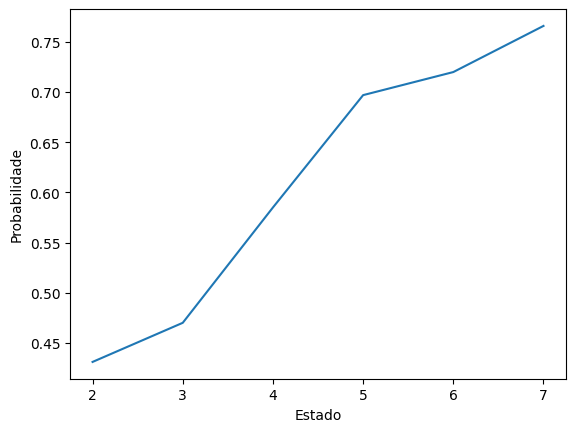

In [16]:
Pawn_move_probabilities = [0.431, 0.470, 0.585, 0.697, 0.720, 0.766]
sns.lineplot(x=[2, 3, 4, 5, 6, 7], y=Pawn_move_probabilities)
plt.xlabel('Estado')
plt.ylabel('Probabilidade')